![mercado libre logo](https://res-2.cloudinary.com/crunchbase-production/image/upload/c_lpad,h_170,w_170,f_auto,b_white,q_auto:eco/v1456160088/dauw8qmiutpmqx4wvwlf.png)

# Mercado Libre Challenge - part 2

In this notebook I continue developing the ML challenge. here i'll try to build a machine learning algorithm to predict 'sold quantity' from mercado libre's items available in the public API category search

In [11]:
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# sklearn imports
from sklearn.model_selection import train_test_split

In [12]:
%matplotlib inline
sns.set_context('notebook')
sns.set_style('whitegrid')
sns.set_palette('Blues_r')

# Machine Learning model development - linear based model

objective of model: predict **sold_quantity** value of items. for this model I've choosed to work with the same data set in my part 1 of analysis, gathering items from different categories from ML API, but adding some other features that i found exploring the API that could be relevant to sold quantities

from seller **reputation**:

* transactions.ratings.positive
* metrics.sales.completed
* transactions.total,
* seller.seller_reputation.transactions.completed

from **shipping**:

* shipping.free_shipping

### Quality metrics

* **sales**: The number of sales with mediations (claims and/or disputes) a seller has.
* **period**: The period for ratio calculation will depend on the number of sales fulfilled in the past 60 days.
* **completed**: Number of sales completed. Whether an order has claims or not matters. So if an order has more than one claim / dispute, to avoid counting it, all the claims / disputes must be excluded from his/her reputation (tag "avoid_reputation").


### Claims

For calculation, sales with claims made by buyer regardless of payment or shipping method will be considered. That is, sales from disqualified users, fraudulent user sales, sales with payment rejected and invalid sales were not considered.

Formula:

claims_rate = sales with claims / total sales
To start impacting on reputation, at least, 3 sales with claims are needed.

## feature selection

In [13]:
df = pd.read_pickle('categoriesDF.pkl')

In [4]:
df.shape

(13623, 128)

In [5]:
print("All features available")
list(df.columns)

All features available


['index',
 'id',
 'site_id',
 'title',
 'price',
 'currency_id',
 'available_quantity',
 'sold_quantity',
 'buying_mode',
 'listing_type_id',
 'stop_time',
 'condition',
 'permalink',
 'thumbnail',
 'thumbnail_id',
 'accepts_mercadopago',
 'attributes',
 'original_price',
 'category_id',
 'official_store_id',
 'domain_id',
 'catalog_product_id',
 'tags',
 'catalog_listing',
 'use_thumbnail_id',
 'order_backend',
 'seller.id',
 'seller.permalink',
 'seller.registration_date',
 'seller.car_dealer',
 'seller.real_estate_agency',
 'seller.tags',
 'seller.eshop.nick_name',
 'seller.eshop.eshop_id',
 'seller.eshop.eshop_locations',
 'seller.eshop.site_id',
 'seller.eshop.eshop_logo_url',
 'seller.eshop.eshop_status_id',
 'seller.eshop.seller',
 'seller.eshop.eshop_experience',
 'seller.seller_reputation.transactions.total',
 'seller.seller_reputation.transactions.canceled',
 'seller.seller_reputation.transactions.period',
 'seller.seller_reputation.transactions.ratings.negative',
 'seller.se

In [14]:
df[[ 'seller.seller_reputation.metrics.delayed_handling_time.rate',
 'seller.seller_reputation.metrics.delayed_handling_time.excluded.real_rate',
   'seller.seller_reputation.metrics.cancellations.rate']]

,seller.seller_reputation.metrics.delayed_handling_time.rate,seller.seller_reputation.metrics.delayed_handling_time.excluded.real_rate,seller.seller_reputation.metrics.cancellations.rate
0,0.0000,0.0000,0.0000
1,0.0102,NaN,0.0080
2,0.0011,NaN,0.0031
3,0.0000,NaN,0.0000
4,0.0035,NaN,0.0000
...,...,...,...
13618,0.0000,0.0009,0.0000
13619,0.0016,NaN,0.0000
13620,0.0000,NaN,0.0051
13621,0.0022,NaN,0.0045


In [14]:
df['shipping.mode'].unique()

array(['not_specified', 'me2', 'custom', 'me1'], dtype=object)

In [7]:
df[['installments.quantity',
 'installments.amount',
 'installments.rate']].isnull().sum()

installments.quantity    1050
installments.amount      1050
installments.rate        1050
dtype: int64

In [15]:
features = [
#  'id',
# 'title',
 'price',
 'available_quantity',
 'sold_quantity',
 'condition',
 'accepts_mercadopago',
 'original_price',
  'seller.seller_reputation.transactions.completed',
 'seller.seller_reputation.transactions.ratings.positive',
 'seller.seller_reputation.transactions.ratings.negative',
 'seller.seller_reputation.metrics.sales.completed',
  'seller.seller_reputation.metrics.sales.period',
  'seller.seller_reputation.metrics.cancellations.rate',
   'seller.seller_reputation.metrics.claims.rate',
    'installments.quantity',
  'shipping.free_shipping',
  'shipping.mode',
]

In [163]:
df['price'][0]

360.0

In [16]:
df = df[features] 

In [17]:
seller_features = ['seller.seller_reputation.transactions.completed',
 'seller.seller_reputation.transactions.ratings.positive',
 'seller.seller_reputation.transactions.ratings.negative',
 'seller.seller_reputation.metrics.sales.completed',
  'seller.seller_reputation.metrics.sales.period',
  'seller.seller_reputation.metrics.cancellations.rate',
   'seller.seller_reputation.metrics.claims.rate',]

In [18]:
seller_features_clean = []
for i in seller_features:
    
    seller_features_clean.append(i.split('seller.seller_reputation.')[-1])

In [19]:
df.rename(columns= dict(zip(seller_features,seller_features_clean)), inplace=True)

In [20]:
df['installments.quantity'].fillna(value=0, inplace=True)


In [21]:
df['installments.quantity'].unique()

array([12., 18.,  9.,  3.,  6.,  0.])

#### features construction

same features used before in part 1

In [22]:
df['discount_value'] = df['original_price'] - df['price']
df['discount_pct'] = df['discount_value']/df['original_price']
df['has_discount'] = df.discount_value.apply(lambda val: 'no' if str(val) == 'nan' else 'yes')

In [23]:
df['discount_value'].fillna(value=0, inplace=True)
df['discount_pct'].fillna(value=0, inplace=True)


with these features available we can drop 'original_price' variable

In [24]:
df.drop(columns=['original_price'], inplace=True)

In [25]:
df.duplicated().sum()

758

In [26]:
df= df.drop_duplicates()

## spliting data

In [27]:
train, test = train_test_split(df, test_size=0.3, shuffle=True, random_state=234)

## correlation analysis

#### getting numerical and categorical features separately


In [28]:
num_train =  train.select_dtypes(include='number')
cat_train = train.select_dtypes(exclude='number')

In [22]:
cat_train.dtypes

condition                 object
accepts_mercadopago         bool
metrics.sales.period      object
shipping.free_shipping      bool
shipping.mode             object
has_discount              object
dtype: object

In [22]:
print('Numerical features shape:', num_train.shape,
      'Categorical features shape:', cat_train.shape)

Numerical features shape: (9005, 15) Categorical features shape: (9005, 6)


[]

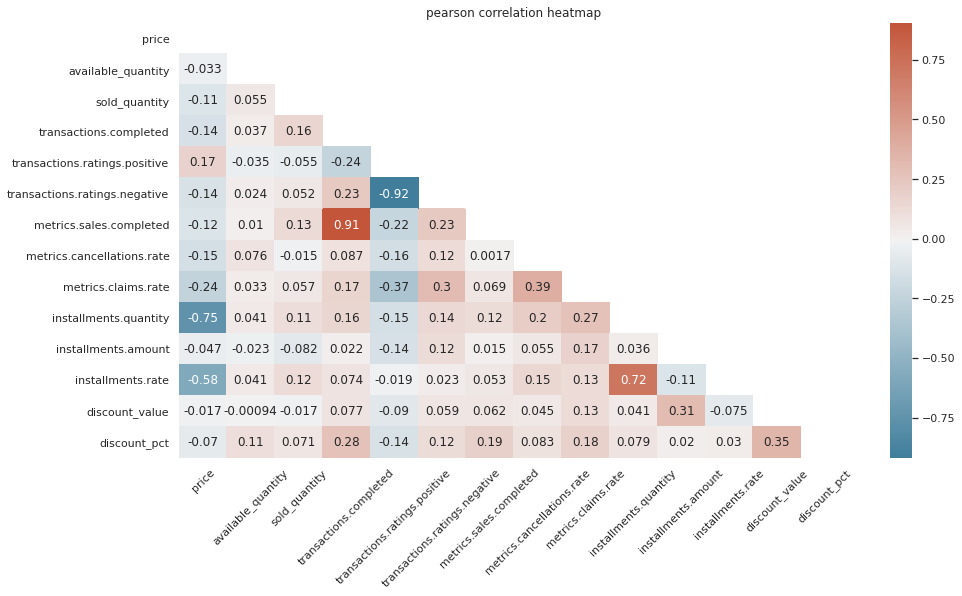

In [23]:

corr_train = num_train.corr()

plt.figure(figsize=(15,8))
mask = np.triu(np.ones_like(corr_train, dtype=bool))
plt.title('pearson correlation heatmap')
# Gcustom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr_train, annot = True, mask=mask, cmap=cmap)
plt.xticks(rotation=45)
plt.plot()

as excpected, some of the features have high correlation, like:


* `metrics.sales.completed` and `transactions completed` (0.91)
* `transaction.ratings.positive` and `transactions.ratings.negative` (-0.92)
* `installments.rate` and `installments.quantity` (0.72)

also we note that our features doen't have significant correlation with sold_quantity, so linear models 
may not be our best choice


[]

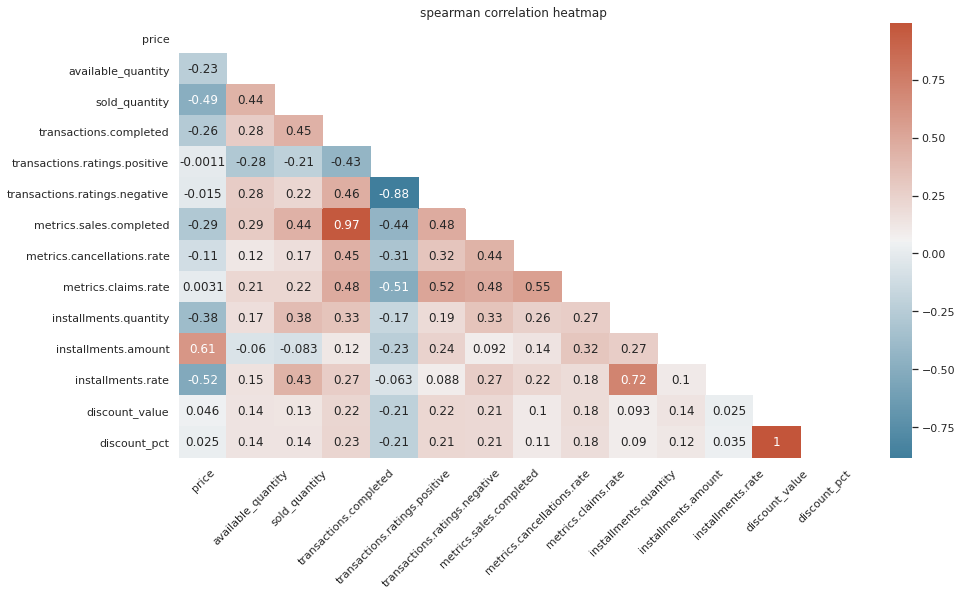

In [24]:
corr_train = num_train.corr(method='spearman')

plt.figure(figsize=(15,8))
mask = np.triu(np.ones_like(corr_train, dtype=bool))
plt.title('spearman correlation heatmap')
# Gcustom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr_train, annot = True, mask=mask, cmap=cmap)
plt.xticks(rotation=45)
plt.plot()

Spearman correlation measures the strength and direction of monotonic association between the variables,
and make sense to investigate our features with it. from correlations results, features that may be removed are
`transactions.ratings.positive`, because it says essentially the same thing as 'negative'.
another feature candidate to be removed  `transactions.completed`, leaving `metrics.sales.completed`. 
We calculate Variation Inflation Factor (VIF) to confirm what features to drop

### Missing Values

checking for missing values

In [25]:

train.isnull().sum()

price                            0
available_quantity               0
sold_quantity                    0
condition                        0
accepts_mercadopago              0
transactions.completed           0
transactions.ratings.positive    0
transactions.ratings.negative    0
metrics.sales.completed          0
metrics.sales.period             0
metrics.cancellations.rate       0
metrics.claims.rate              0
installments.quantity            0
installments.amount              0
installments.rate                0
shipping.free_shipping           0
shipping.mode                    0
discount_value                   0
discount_pct                     0
has_discount                     0
dtype: int64

## Variance Inflation Factor calculation

VIF measures the severity of multicolinearity to Linear Regression analysis. I've used to confirm what features to drop based on high correlation values

In [29]:
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from statsmodels.tools.tools import add_constant

def get_highest_vif_feature(df, thresh=5):
    '''
    Ref: https://stackoverflow.com/questions/42658379/variance-inflation-factor-in-python
    
    Calculates VIF each feature in a pandas dataframe
    A constant must be added to variance_inflation_factor or the results will be incorrect

    :param df: the pandas dataframe containing only the predictor features, not the response variable
    :param thresh: the max VIF value before the feature is removed from the dataframe
    '''
   
    const = add_constant(df)
    print(f'Shape of data after adding const column: {const.shape}')
    cols = const.columns
    
    # Calculating VIF for each feature
    vif_df = pd.Series([ (variance_inflation_factor(const.values, i)) for i in range(const.shape[1]) ], index= const.columns).to_frame()
    
    vif_df = vif_df.sort_values(by=0, ascending=False).rename(columns={0: 'VIF'})
    vif_df = vif_df.drop('const')
    vif_df = vif_df[vif_df['VIF'] > thresh]

    if vif_df.empty:
        print('DataFrame is empty!')
        return None
    else:
        print(f'\nFeatures above VIF threshold: {vif_df.to_dict()}')       
        # Feature with highest VIF value
        return None


In [30]:
get_highest_vif_feature(num_train)

Shape of data after adding const column: (9005, 13)

Features above VIF threshold: {'VIF': {'transactions.ratings.positive': 6.834843299707539, 'transactions.ratings.negative': 6.505151349139169, 'transactions.completed': 6.363785127598051, 'metrics.sales.completed': 6.046909555764787}}


The results confirm our idea to drop the features in the correlation section. i'll drop negative ratings instead, just a matter of scaling.

In [206]:
train = train.drop(columns=['transactions.ratings.negative',  'transactions.completed'])

In [207]:
test = test.drop(columns=['transactions.ratings.negative',  'transactions.completed'])

### skewness and kurtosis of numerical features

* **hight** kurtosis: heavy outliers indication

In [208]:
skew_kurt = pd.DataFrame([num_train.skew(),num_train.kurtosis()], index= ['skewness','kurtosis']).T

In [209]:
skew_kurt

,skewness,kurtosis
price,5.311763,30.802440
available_quantity,9.211603,84.623636
sold_quantity,5.810978,36.975454
transactions.completed,2.438633,5.872518
transactions.ratings.positive,-11.429773,383.141317
transactions.ratings.negative,24.438112,1125.310563
metrics.sales.completed,3.296532,12.259018
metrics.cancellations.rate,2.009217,4.715606
metrics.claims.rate,0.618292,-0.358883
installments.quantity,-2.517576,6.135156


our numerical features are mostly skewed (except for cancellations rate, claims rate) and with high kurtosis, which means our features dont satisfy multivariate normality (all variabes being normal distributed)

### outliers check

In [210]:
from sklearn.ensemble import IsolationForest

In [211]:
iforest = IsolationForest()

In [212]:
outliers = iforest.fit_predict(num_train.drop(columns=['sold_quantity']))

In [213]:
sum(outliers == -1)

756

In [214]:
print('percentage of outliers found by isolation forest: ', sum(outliers == -1)/len(num_train) * 100)

percentage of outliers found by isolation forest:  8.395335924486396


I'll save outliers for future comparison in model development

In [215]:
out_mask = outliers != -1
#num_train[out_mask]

### skewness and kurtosis after outlier removal

In [216]:
skew_kurt_clean = pd.DataFrame([num_train[out_mask].skew(),num_train[out_mask].kurtosis()], index= ['skewness','kurtosis']).T

In [217]:
skew_kurt_clean

,skewness,kurtosis
price,5.091466,28.000061
available_quantity,19.361121,408.956387
sold_quantity,5.759249,34.073940
transactions.completed,2.422773,6.226930
transactions.ratings.positive,-1.325676,3.196841
transactions.ratings.negative,1.236553,1.864072
metrics.sales.completed,2.770431,7.453750
metrics.cancellations.rate,1.996811,4.500521
metrics.claims.rate,0.657845,-0.307898
installments.quantity,-2.793961,7.271724


### pct change in skewness and kurtosis after outlier removal

In [189]:
(skew_kurt - skew_kurt_clean) *100/skew_kurt

,skewness,kurtosis
price,3.996628,8.256716
available_quantity,32.757436,54.989191
sold_quantity,1.893531,9.981378
transactions.completed,-8.800015,-28.698404
transactions.ratings.positive,-21.846548,-28.465819
transactions.ratings.negative,-16.199232,-19.255993
metrics.sales.completed,-19.153666,-53.853532
metrics.cancellations.rate,-3.168526,-5.715751
metrics.claims.rate,-17.050466,50.500552
installments.quantity,-18.339481,-24.390056


note: available quantity 

[]

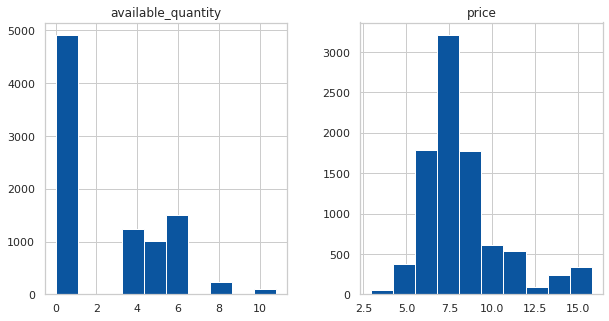

In [219]:
np.log(train[['available_quantity', 'price']]).hist(figsize=(10,5))
plt.plot()


[]

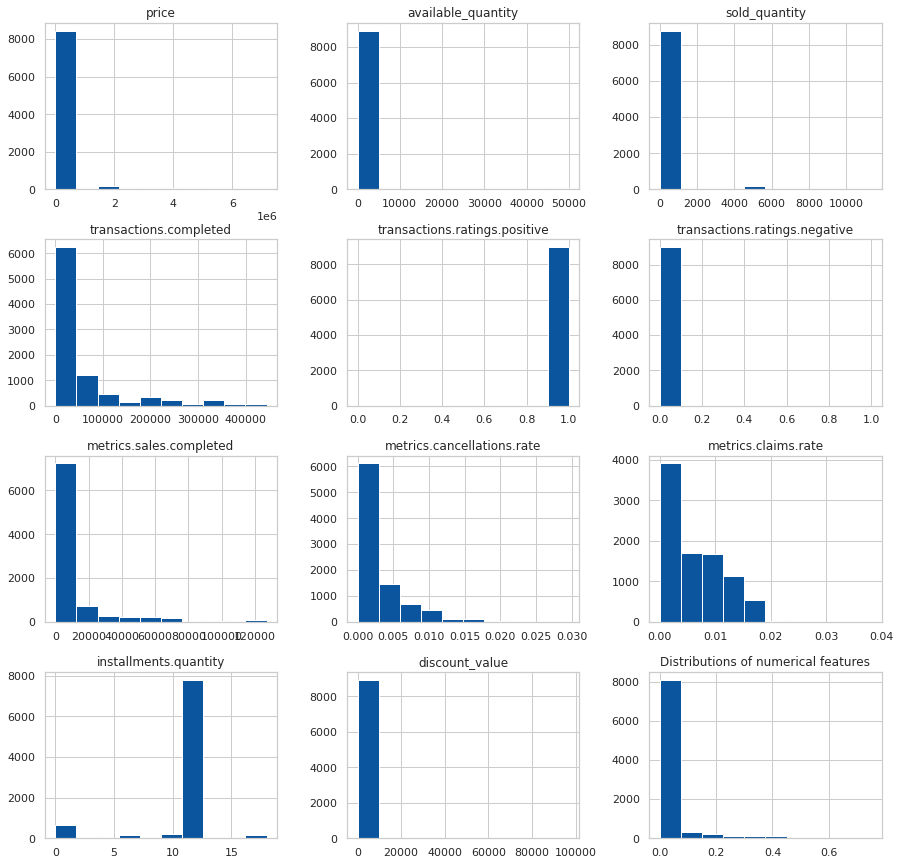

In [33]:
train.select_dtypes(include='number').hist(figsize=(15,15))
plt.title('Distributions of numerical features')
plt.plot()

### categorical features 

we not gonna use `category_id` and '`general_category_name` at this moment, so the model can generalize to other categories not included in our train data

In [41]:
cat_train.columns

Index(['condition', 'accepts_mercadopago', 'metrics.sales.period',
       'shipping.free_shipping', 'shipping.mode', 'has_discount'],
      dtype='object')

In [43]:
cat_train.condition.value_counts()

new              8858
used              139
not_specified       8
Name: condition, dtype: int64

maybe a good idea is to remove 'not_specified' items, based on the small amount of it

In [44]:
cat_train['metrics.sales.period'].value_counts()

60 days     8552
365 days     453
Name: metrics.sales.period, dtype: int64

In [45]:
cat_train['shipping.mode'].value_counts()

me2              7961
not_specified     891
custom            134
me1                19
Name: shipping.mode, dtype: int64

In [46]:
cat_train['shipping.free_shipping'].value_counts()

False    6211
True     2794
Name: shipping.free_shipping, dtype: int64

In [47]:
cat_train.dtypes

condition                 object
accepts_mercadopago         bool
metrics.sales.period      object
shipping.free_shipping      bool
shipping.mode             object
has_discount              object
dtype: object

In [48]:
cat_train = cat_train.astype('category')

In [49]:
cat_train

,condition,accepts_mercadopago,metrics.sales.period,shipping.free_shipping,shipping.mode,has_discount
876,new,True,60 days,False,me2,no
5878,new,True,60 days,False,not_specified,no
6131,new,True,60 days,True,me2,no
18,new,True,60 days,False,me2,no
13119,new,True,60 days,False,me2,no
...,...,...,...,...,...,...
5884,new,True,60 days,False,me2,no
5196,new,True,60 days,False,me2,no
7347,new,True,60 days,False,me2,no
9065,new,True,60 days,False,me2,no


In [ ]:
train.accepts_mercadopago.replace([True,False], [1, 0], inplace=True)

train['shipping.free_shipping'].replace([True,False], [1, 0], inplace=True)

train['has_discount'].replace(['yes','no'], [1, 0], inplace=True)

In [35]:
cat_train.dtypes

condition                 object
accepts_mercadopago         bool
metrics.sales.period      object
shipping.free_shipping      bool
shipping.mode             object
has_discount              object
dtype: object

In [ ]:
test.accepts_mercadopago.replace([True,False], [1, 0], inplace=True)

In [38]:
test['shipping.free_shipping'].replace([True,False], [1, 0], inplace=True)

In [39]:
test['has_discount'].replace(['yes','no'], [1, 0], inplace=True)

## training

In [364]:
train.to_pickle('./train.pkl')
test.to_pickle('./test.pkl')

In [49]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, LabelEncoder

from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.linear_model import Ridge, LinearRegression, ElasticNet
from scipy.special import exp10
from sklearn.compose import TransformedTargetRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, median_absolute_error
from sklearn.preprocessing import StandardScaler, RobustScaler, FunctionTransformer
from sklearn.model_selection import cross_val_score, GridSearchCV, RandomizedSearchCV, learning_curve
import shap



# Metrics Evaluation

In [41]:
def rmse(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

def cv_rmse(model, X_train, y_train):
    
    rmse = np.sqrt(-cross_val_score(model, X_train, y_train, scoring="neg_mean_squared_error", cv=5))
    return (rmse)


def model_performance(model, X_train, y_train):
    cv_results = cv_rmse(model, X_train, y_train)
    print(f'mean rsme on CV: {cv_results.mean()}, std: {cv_results.std()}')
    
def model_performance_test(model, X_test, y_test):
    y_pred = model.predict(X_test)
    print('RSME on test set:', rmse(y_test, y_pred))
    print('Coefficient of determination: %.2f' % r2_score(y_test, y_pred))
    

def eval_reg( y, y_pred):
    mae = median_absolute_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    rmse = np.sqrt(mean_squared_error(y, y_pred))
    print('MAE:', mae, 'r2:', r2, 'RMSE', rmse)

In [42]:
def plot_learning_curve (estimator, X_train, y_train):
    plt.figure(figsize=(10,5))
    train_sizes, train_scores, test_scores = learning_curve(estimator=estimator,
        X=X_train,
        y=y_train,
        train_sizes=np.linspace(0.1, 1.0, 10),
        cv=10,
        scoring='neg_root_mean_squared_error',                                                 
        n_jobs=1)

    train_mean = -np.mean(train_scores, axis=1)
    train_std = -np.std(train_scores, axis=1)
    test_mean = -np.mean(test_scores, axis=1)
    test_std = -np.std(test_scores, axis=1)
    plt.plot(train_sizes, train_mean,color='blue', marker='o',
            markersize=5,
            label='training RSME')
    plt.fill_between(train_sizes,
                train_mean + train_std,
                train_mean - train_std,
                alpha=0.15, color='blue')

    plt.plot(train_sizes, test_mean,
                color='green', linestyle='--',
                marker='s', markersize=5,
                label='validation RSME')
    plt.fill_between(train_sizes,
                test_mean + test_std,
                test_mean - test_std,
                alpha=0.15, color='green')
    plt.grid()
    plt.xlabel('Number of training samples')
    plt.ylabel('RMSE')
    plt.legend(loc='best')
    plt.show()

In [43]:
cat_cols = list(train.drop(columns ='sold_quantity').select_dtypes(exclude='number').columns)

num_cols = list(train.drop(columns ='sold_quantity').select_dtypes(include='number').columns)

In [44]:
X_train = train.drop(columns='sold_quantity')
y_train = train['sold_quantity']

X_test = test.drop(columns='sold_quantity')
y_test = test['sold_quantity']

In [102]:
X_train.columns

Index(['price', 'available_quantity', 'condition', 'accepts_mercadopago',
       'transactions.ratings.positive', 'metrics.sales.completed',
       'metrics.sales.period', 'metrics.cancellations.rate',
       'metrics.claims.rate', 'installments.quantity', 'installments.rate',
       'shipping.free_shipping', 'shipping.mode', 'discount_value',
       'discount_pct', 'has_discount'],
      dtype='object')

We  are going to one hot encode the categorical variables and apply Standard Scaling our numerical variables in a first baseline prediction

In [45]:

preprocessor = make_column_transformer(
    (OneHotEncoder( handle_unknown='ignore'), cat_cols),
    #(FunctionTransformer(np.log1p, validate=False), ['available_quantity', 'price']),
    (RobustScaler(), num_cols)
)

ridge_model_1 = make_pipeline(preprocessor,TransformedTargetRegressor(
        regressor=Ridge(alpha=1),
        func= np.log1p,
        inverse_func= np.expm1
   ) )

In [46]:
ridge_model_1.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['condition',
                                                   'metrics.sales.period',
                                                   'shipping.mode']),
                                                 ('robustscaler',
                                                  RobustScaler(),
                                                  ['price',
                                                   'available_quantity',
                                                   'accepts_mercadopago',
                                                   'transactions.completed',
                                                   'transactions.ratings.positive',
                                                   'transactions.ratings.negative',
            

In [50]:
eval_reg(ridge_model_1.predict(X_test), y_test)

MAE: 122.48166251344189 r2: -62.99804640503997 RMSE 1121.5657979465846


### Linear Reg

In [51]:
pipe_linreg = make_pipeline(preprocessor, LinearRegression())

In [52]:
pipe_linreg.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['condition',
                                                   'metrics.sales.period',
                                                   'shipping.mode']),
                                                 ('robustscaler',
                                                  RobustScaler(),
                                                  ['price',
                                                   'available_quantity',
                                                   'accepts_mercadopago',
                                                   'transactions.completed',
                                                   'transactions.ratings.positive',
                                                   'transactions.ratings.negative',
            

In [53]:
model_performance(pipe_linreg, X_train, y_train)

mean rsme on CV: 754.8277910248737, std: 46.83459865618744


In [54]:
model_performance_test(pipe_linreg, X_test, y_test)

RSME on test set: 1098.4242471779244
Coefficient of determination: 0.03


In [55]:
features_names_cat = pipe_linreg.named_steps['columntransformer'].named_transformers_['onehotencoder'].get_feature_names(input_features=cat_cols)

In [59]:
feature_names = np.concatenate(
    [features_names_cat, num_cols])


In [60]:
len(pipe_linreg.named_steps['linearregression'].coef_)

23

In [61]:
coefs = pd.DataFrame(pipe_linreg.named_steps['linearregression'].coef_, columns=['Coefficients'], index=feature_names)

[]

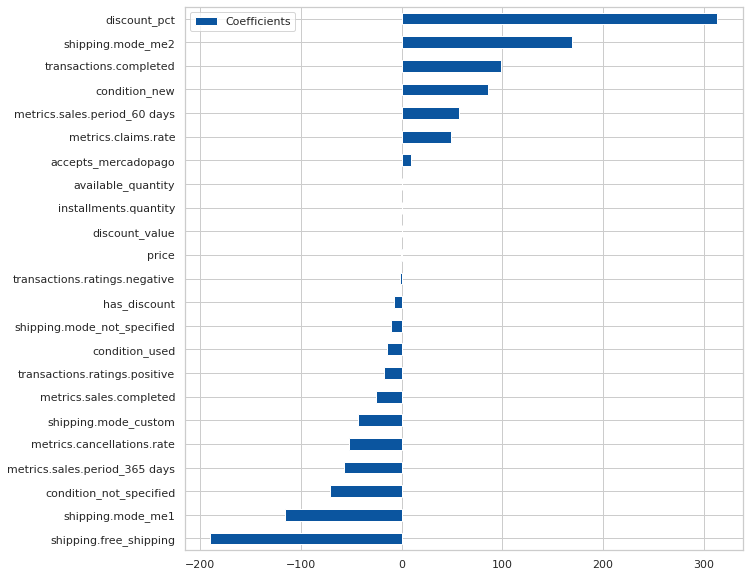

In [62]:
coefs.sort_values(by='Coefficients').plot(kind='barh',figsize=(10,10))
plt.plot()

lets remove 'available_quantity', 'accepts_mercadopago', 'discount_value' to test if the model improves

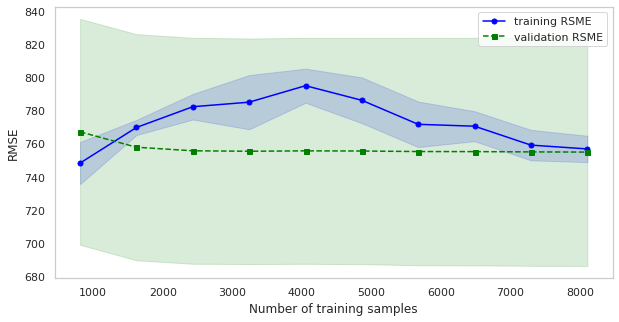

In [250]:
plot_learning_curve(pipe_linreg, X_train, y_train)

In [63]:
linreg_log_target = make_pipeline(preprocessor,TransformedTargetRegressor(
        regressor=LinearRegression(),
        func= np.log1p,
        inverse_func= np.expm1
   ) )

In [64]:
model_performance(linreg_log_target, X_train, y_train)

mean rsme on CV: 782.1178040589108, std: 50.823045027663476


In [65]:
linreg_log_target.fit(X_train, y_train)
model_performance_test(linreg_log_target, X_test, y_test)

RSME on test set: 1121.5423441588505
Coefficient of determination: -0.01


## Elastic Net 

In [66]:
elastic_net_reg = make_pipeline(preprocessor, ElasticNet())

In [67]:
model_performance(elastic_net_reg, X_train, y_train)

mean rsme on CV: 758.9136838531278, std: 48.544212517399174


In [69]:
elastic_net_reg.fit(X_train, y_train)
model_performance_test(elastic_net_reg, X_test, y_test)

RSME on test set: 1102.5966578493606
Coefficient of determination: 0.03


## Hyperparameter tuning with gridsearch - Elastic Net

In [ ]:
eNetParams = {"regressor__max_iter": [10000],
                  "regressor__alpha": [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
                  "regressor__l1_ratio": np.arange(0.0, 1.0, 0.1)}


elastic_net_reg_base = Pipeline(steps =[('preprocessr',preprocessor), 
                                        ('regressor',ElasticNet()) ])

grid = GridSearchCV(estimator=elastic_net_reg_base, param_grid=eNetParams, scoring='neg_root_mean_squared_error')

grid.fit(X_train, y_train)

In [110]:
model_performance(grid.best_estimator_, X_train, y_train)

mean rsme on CV: 746.0867292054661, std: 62.196062006530774


In [111]:
model_performance_test(grid.best_estimator_, X_test, y_test)

RSME on test set: 1036.4717781001898
Coefficient of determination: 0.09


# Decision Tree Reg

In [254]:
from sklearn.tree import DecisionTreeRegressor

baseline decision tree

In [72]:

preprocessor_tree = make_column_transformer(
    (OneHotEncoder(handle_unknown='ignore'), cat_cols),
    #(FunctionTransformer(np.log1p, validate=False), ['available_quantity', 'price']),

    remainder='passthrough'
    
)

In [276]:
tree = make_pipeline(preprocessor_tree, DecisionTreeRegressor(max_depth=5))

In [296]:
tree.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['condition',
                                                   'metrics.sales.period',
                                                   'shipping.mode'])])),
                ('decisiontreeregressor', DecisionTreeRegressor(max_depth=5))])

In [278]:
model_performance(tree,X_train, y_train)

mean rsme on CV: 760.1167512397618, std: 46.734090375802325


In [297]:
model_performance_test(tree, X_test, y_test)

RSME on test set: 1110.995786740741
Coefficient of determination: 0.01


In [279]:
pred_tree = tree.predict(X_test)

rmse = (np.sqrt(mean_squared_error(y_test, pred_tree)))
r2 = r2_score(y_test, pred_tree)
print("Testing performance")
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

Testing performance
RMSE: 1113.35
R2: 0.01


The importance of a feature is computed as the (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance.

<AxesSubplot:>

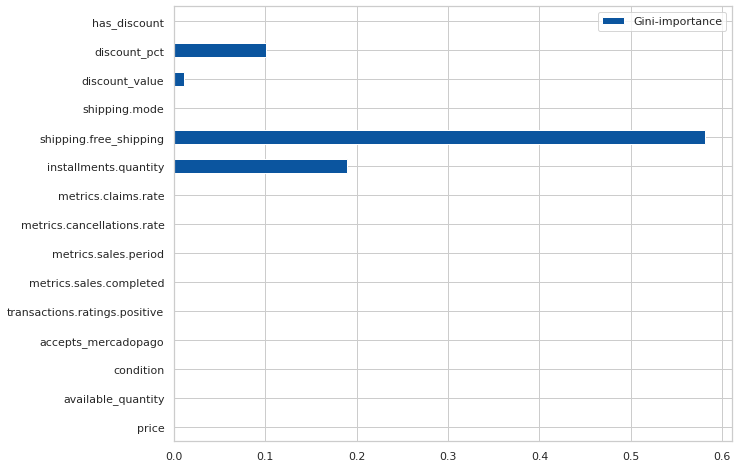

In [280]:
pd.DataFrame.from_dict(dict(zip(X_train.columns, tree['decisiontreeregressor'].feature_importances_)),
                       orient='index', columns=['Gini-importance']).plot(kind='barh', figsize=(10,8))

### decision tree learning curve

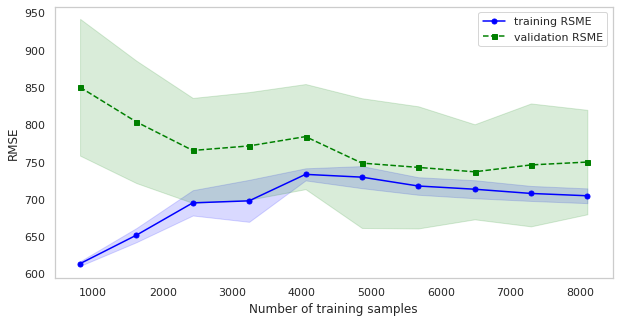

In [149]:
plot_learning_curve(tree, X_train, y_train)

## GridSearch on DecisionTree
  

In [282]:
DecisionTreeParams = {"regressor__criterion": ['mse', 'mae'],
                  "regressor__max_depth": [2, 3, 4, 5, 6, 9], 
                  "regressor__min_samples_split": [2, 3, 4],
                  "regressor__min_samples_leaf": [1, 2, 4, 6],
                  "regressor__max_features": ["auto", None, "log2"],
                  "regressor__max_leaf_nodes": [None, 2, 4, 6, 8]
                     }


tree_pipe = Pipeline(steps =[('preprocessor',preprocessor), 
                                        ('regressor', DecisionTreeRegressor()) ])

grid = RandomizedSearchCV(estimator= tree_pipe, param_distributions= DecisionTreeParams, scoring='neg_root_mean_squared_error',
                       cv=5, verbose=1, n_iter=100, n_jobs=-1)

grid.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  2.8min finished


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('onehotencoder',
                                                                               OneHotEncoder(handle_unknown='ignore'),
                                                                               ['condition',
                                                                                'metrics.sales.period',
                                                                                'shipping.mode']),
                                                                              ('robustscaler',
                                                                               RobustScaler(),
                                                                               ['price',
                                                                                'available_quantity',
                     

In [283]:
decision_tree_gs = grid.best_estimator_

In [284]:
model_performance(decision_tree_gs,X_train, y_train)

mean rsme on CV: 743.5293709566341, std: 39.592325063062525


In [285]:
model_performance(decision_tree_gs,X_test, y_test)

mean rsme on CV: 1485.2252406602097, std: 964.2174912262543


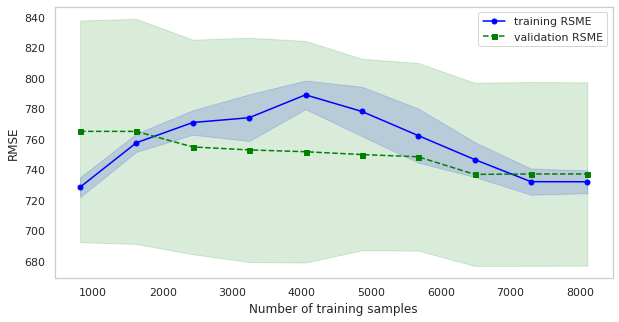

In [286]:
plot_learning_curve(decision_tree_gs, X_train, y_train)

### decision tree with only numerical features

In [301]:
dtree_reg = DecisionTreeRegressor(max_depth=5)

In [302]:
dtree_reg.fit(X_train.select_dtypes(include='number'), y_train)

DecisionTreeRegressor(max_depth=5)

In [303]:
model_performance(dtree_reg,X_train.select_dtypes(include='number'), y_train)

mean rsme on CV: 759.7710178035522, std: 46.53319141661242


In [304]:
model_performance_test(dtree_reg,X_test.select_dtypes(include='number'), y_test)

RSME on test set: 1110.995786740741
Coefficient of determination: 0.01


In [70]:
from sklearn.ensemble import RandomForestRegressor

In [73]:
rf_base = make_pipeline(preprocessor_tree, RandomForestRegressor())

In [74]:
model_performance(rf_base, X_train, y_train)

mean rsme on CV: 711.7133084790837, std: 43.75304342965821


In [76]:
rf_base.fit(X_train, y_train)
model_performance_test(rf_base, X_test, y_test)

RSME on test set: 1039.0793167315646
Coefficient of determination: 0.14


In [298]:
y_train.mean()

356.4246529705719

Here I've got a good value for Coefficient of determination, but RMSE is still high (greater than the mean value of our target variable), also, the learning curve shows a undefit pattern.

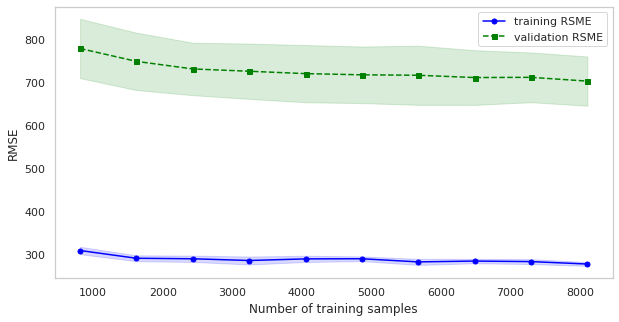

In [77]:
plot_learning_curve(rf_base, X_train, y_train)

rerunning the Random Forest with max depth = 4 ive got a better learning curve, as we can see above

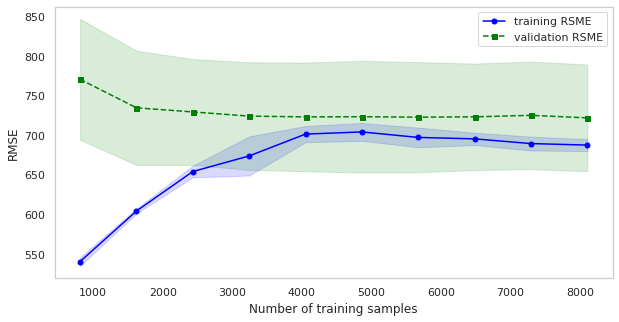


In [319]:
RandomForestParams = {"regressor__criterion": ['mse'],
                  "regressor__max_depth": [2,  4, 6, 8, 10], 
                  "regressor__min_samples_split": [2, 3, 4],
                  "regressor__min_samples_leaf": [1, 2, 4, 6],
                  "regressor__max_features": ["auto", "sqrt"],
                  "regressor__n_estimators" : [4, 8, 20, 40, 80, 160, 240]
                     }


rf_pipe = Pipeline(steps =[('preprocessor',preprocessor_tree), 
                                        ('regressor', RandomForestRegressor()) ])

grid_rf = RandomizedSearchCV(estimator= rf_pipe, param_distributions= DecisionTreeParams, 
                             scoring='neg_root_mean_squared_error', n_iter=50,
                       cv=5, verbose=1, n_jobs=-1)

grid_rf.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 32.5min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed: 44.5min finished


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('onehotencoder',
                                                                               OneHotEncoder(handle_unknown='ignore'),
                                                                               ['condition',
                                                                                'metrics.sales.period',
                                                                                'shipping.mode'])])),
                                             ('regressor',
                                              RandomForestRegressor())]),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'regressor__criterion': ['mse', 'mae'],
                                        'regressor__max_

In [320]:
grid_rf_best = grid_rf.best_estimator_

In [321]:
grid_rf_best['regressor']

RandomForestRegressor(max_depth=9, max_features=None, min_samples_leaf=2,
                      min_samples_split=4)

In [322]:
model_performance(grid_rf.best_estimator_, X_train, y_train)

mean rsme on CV: 712.310105921186, std: 54.84409634431453


In [327]:
model_performance_test(grid_rf.best_estimator_, X_test, y_test)

RSME on test set: 1052.7970495619923
Coefficient of determination: 0.11


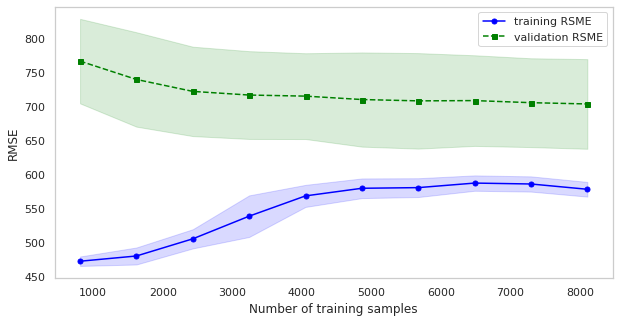

In [328]:
plot_learning_curve(grid_rf_best, X_train, y_train)

In [84]:
rf_manual = make_pipeline(preprocessor_tree, RandomForestRegressor(max_depth=20)

In [85]:
rf_manual.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['condition',
                                                   'metrics.sales.period',
                                                   'shipping.mode'])])),
                ('randomforestregressor',
                 RandomForestRegressor(max_depth=20, min_samples_leaf=10))])

In [86]:
model_performance_test(rf_manual, X_test, y_test)

RSME on test set: 1054.4366054924042
Coefficient of determination: 0.11


In [87]:
rf_base

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['condition',
                                                   'metrics.sales.period',
                                                   'shipping.mode'])])),
                ('randomforestregressor', RandomForestRegressor())])

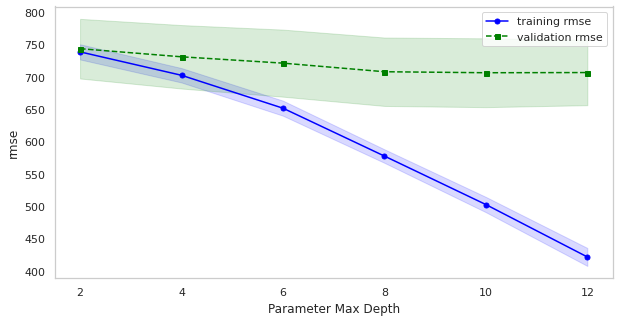

In [93]:
from sklearn.model_selection import validation_curve

plt.figure(figsize=(10,5))

param_range = [2,4,6,8,10,12]
train_scores, test_scores = validation_curve(
        estimator=rf_base,
        X=X_train,
        y=y_train,
        param_name='randomforestregressor__max_depth',
        param_range=param_range,
        scoring='neg_root_mean_squared_error',
        cv=5)
train_mean = -np.mean(train_scores, axis=1)
train_std = -np.std(train_scores, axis=1)
test_mean = -np.mean(test_scores, axis=1)
test_std = -np.std(test_scores, axis=1)

plt.plot(param_range, train_mean,
        color='blue', marker='o',
        markersize=5,
        label='training rmse')
plt.fill_between(param_range, train_mean + train_std,
            train_mean - train_std, alpha=0.15,
            color='blue')
plt.plot(param_range, test_mean,
color='green', linestyle='--',
marker='s', markersize=5,
label='validation rmse')
plt.fill_between(param_range,
                test_mean + test_std,
                test_mean - test_std,
                alpha=0.15, color='green')
plt.grid()
plt.xlabel('Parameter Max Depth')
plt.legend(loc='best')
plt.ylabel('rmse')

plt.show()



This decreasing in training rmse while validation keeps almost constant indicates that our model is overfitting with the increase of Max Depth. need to investigate the tuning of the model thoroughly

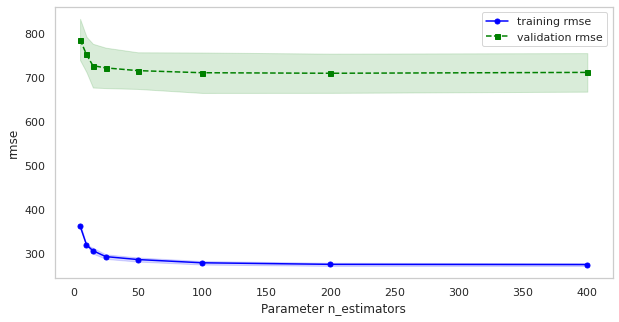

In [110]:
plt.figure(figsize=(10,5))

param_range = [5 ,10, 15, 25,50,100, 200, 400]
train_scores, test_scores = validation_curve(
        estimator=rf_base,
        X=X_train,
        y=y_train,
        param_name='randomforestregressor__n_estimators',
        param_range=param_range,
        scoring='neg_root_mean_squared_error',
        cv=5)
train_mean = -np.mean(train_scores, axis=1)
train_std = -np.std(train_scores, axis=1)
test_mean = -np.mean(test_scores, axis=1)
test_std = -np.std(test_scores, axis=1)

plt.plot(param_range, train_mean,
        color='blue', marker='o',
        markersize=5,
        label='training rmse')
plt.fill_between(param_range, train_mean + train_std,
            train_mean - train_std, alpha=0.15,
            color='blue')
plt.plot(param_range, test_mean,
color='green', linestyle='--',
marker='s', markersize=5,
label='validation rmse')
plt.fill_between(param_range,
                test_mean + test_std,
                test_mean - test_std,
                alpha=0.15, color='green')
plt.grid()
plt.xlabel('Parameter n_estimators')
plt.legend(loc='best')
plt.ylabel('rmse')

plt.show()

## CatBoost

In [329]:
from catboost import CatBoostRegressor, Pool

In [306]:
catboost = CatBoostRegressor(loss_function='RMSE')

In [307]:
cat = X_train.select_dtypes(exclude='number')

In [308]:
cat_train_dataset = Pool(X_train, y_train, cat_features=cat )
cat_test_dataset = Pool(X_test, y_test, cat_features=cat)

In [309]:
catboost.fit(cat_train_dataset)

Learning rate set to 0.057716
0:	learn: 772.2102499	total: 60.3ms	remaining: 1m
1:	learn: 767.2517874	total: 67.6ms	remaining: 33.7s
2:	learn: 763.1557021	total: 74.4ms	remaining: 24.7s
3:	learn: 760.2160156	total: 81.4ms	remaining: 20.3s
4:	learn: 756.9107155	total: 92ms	remaining: 18.3s
5:	learn: 753.4295396	total: 98.6ms	remaining: 16.3s
6:	learn: 750.6478019	total: 105ms	remaining: 14.9s
7:	learn: 747.1278191	total: 111ms	remaining: 13.7s
8:	learn: 744.2040536	total: 117ms	remaining: 12.9s
9:	learn: 741.8722801	total: 127ms	remaining: 12.6s
10:	learn: 739.9173994	total: 134ms	remaining: 12s
11:	learn: 737.7808110	total: 141ms	remaining: 11.6s
12:	learn: 736.2173655	total: 148ms	remaining: 11.3s
13:	learn: 734.0578507	total: 155ms	remaining: 10.9s
14:	learn: 731.5074445	total: 161ms	remaining: 10.6s
15:	learn: 729.3766032	total: 168ms	remaining: 10.3s
16:	learn: 727.9538609	total: 183ms	remaining: 10.6s
17:	learn: 726.2351221	total: 196ms	remaining: 10.7s
18:	learn: 725.0335292	tota

178:	learn: 652.1705600	total: 1.2s	remaining: 5.49s
179:	learn: 652.0046914	total: 1.21s	remaining: 5.5s
180:	learn: 651.6544100	total: 1.21s	remaining: 5.49s
181:	learn: 651.0719144	total: 1.22s	remaining: 5.48s
182:	learn: 650.5837285	total: 1.22s	remaining: 5.47s
183:	learn: 650.5424549	total: 1.23s	remaining: 5.46s
184:	learn: 650.3454874	total: 1.24s	remaining: 5.45s
185:	learn: 649.8426815	total: 1.24s	remaining: 5.45s
186:	learn: 649.6794062	total: 1.25s	remaining: 5.44s
187:	learn: 649.5106818	total: 1.25s	remaining: 5.42s
188:	learn: 649.2775681	total: 1.26s	remaining: 5.41s
189:	learn: 649.0385134	total: 1.27s	remaining: 5.4s
190:	learn: 648.8252263	total: 1.27s	remaining: 5.39s
191:	learn: 647.9207519	total: 1.28s	remaining: 5.38s
192:	learn: 647.6153090	total: 1.28s	remaining: 5.37s
193:	learn: 647.5106386	total: 1.29s	remaining: 5.35s
194:	learn: 647.4030633	total: 1.29s	remaining: 5.34s
195:	learn: 647.3194478	total: 1.3s	remaining: 5.33s
196:	learn: 647.2585911	total: 1

352:	learn: 610.1071721	total: 2.19s	remaining: 4.01s
353:	learn: 609.6676677	total: 2.19s	remaining: 4s
354:	learn: 609.4926524	total: 2.2s	remaining: 4s
355:	learn: 609.3845092	total: 2.21s	remaining: 3.99s
356:	learn: 609.1003597	total: 2.21s	remaining: 3.99s
357:	learn: 608.9460938	total: 2.22s	remaining: 3.98s
358:	learn: 608.6939507	total: 2.23s	remaining: 3.97s
359:	learn: 608.5648163	total: 2.23s	remaining: 3.97s
360:	learn: 608.4102510	total: 2.24s	remaining: 3.96s
361:	learn: 608.1987126	total: 2.24s	remaining: 3.96s
362:	learn: 607.9978367	total: 2.25s	remaining: 3.95s
363:	learn: 607.7876431	total: 2.25s	remaining: 3.94s
364:	learn: 607.4331807	total: 2.26s	remaining: 3.93s
365:	learn: 607.0590295	total: 2.27s	remaining: 3.93s
366:	learn: 606.9136162	total: 2.27s	remaining: 3.92s
367:	learn: 606.4027412	total: 2.28s	remaining: 3.91s
368:	learn: 606.2934103	total: 2.28s	remaining: 3.9s
369:	learn: 606.2429673	total: 2.29s	remaining: 3.89s
370:	learn: 606.0874142	total: 2.29s

514:	learn: 580.6760587	total: 3.18s	remaining: 3s
515:	learn: 580.6565387	total: 3.19s	remaining: 2.99s
516:	learn: 580.5445229	total: 3.19s	remaining: 2.98s
517:	learn: 580.2021026	total: 3.2s	remaining: 2.98s
518:	learn: 580.0782361	total: 3.21s	remaining: 2.97s
519:	learn: 579.9073691	total: 3.21s	remaining: 2.96s
520:	learn: 579.8258938	total: 3.22s	remaining: 2.96s
521:	learn: 579.7206902	total: 3.23s	remaining: 2.95s
522:	learn: 579.3625646	total: 3.23s	remaining: 2.95s
523:	learn: 579.1757161	total: 3.24s	remaining: 2.94s
524:	learn: 578.8385403	total: 3.25s	remaining: 2.94s
525:	learn: 578.7110893	total: 3.25s	remaining: 2.93s
526:	learn: 578.5435906	total: 3.26s	remaining: 2.92s
527:	learn: 578.4528239	total: 3.26s	remaining: 2.92s
528:	learn: 578.3556453	total: 3.27s	remaining: 2.91s
529:	learn: 578.2423899	total: 3.27s	remaining: 2.9s
530:	learn: 577.9364684	total: 3.28s	remaining: 2.9s
531:	learn: 577.8281948	total: 3.29s	remaining: 2.89s
532:	learn: 577.6445198	total: 3.2

684:	learn: 556.4434956	total: 4.18s	remaining: 1.92s
685:	learn: 556.1938744	total: 4.19s	remaining: 1.92s
686:	learn: 556.1410998	total: 4.2s	remaining: 1.91s
687:	learn: 555.9591942	total: 4.2s	remaining: 1.91s
688:	learn: 555.8923289	total: 4.21s	remaining: 1.9s
689:	learn: 555.8093344	total: 4.21s	remaining: 1.89s
690:	learn: 555.6261154	total: 4.22s	remaining: 1.89s
691:	learn: 555.4941887	total: 4.23s	remaining: 1.88s
692:	learn: 555.4173794	total: 4.23s	remaining: 1.88s
693:	learn: 555.3374518	total: 4.24s	remaining: 1.87s
694:	learn: 555.2708409	total: 4.25s	remaining: 1.86s
695:	learn: 555.0883152	total: 4.25s	remaining: 1.86s
696:	learn: 554.8809720	total: 4.25s	remaining: 1.85s
697:	learn: 554.7902062	total: 4.26s	remaining: 1.84s
698:	learn: 554.6867555	total: 4.26s	remaining: 1.84s
699:	learn: 554.6545808	total: 4.27s	remaining: 1.83s
700:	learn: 554.5561587	total: 4.27s	remaining: 1.82s
701:	learn: 554.4384879	total: 4.28s	remaining: 1.82s
702:	learn: 554.3409078	total: 

865:	learn: 537.3229054	total: 5.19s	remaining: 803ms
866:	learn: 537.3150337	total: 5.19s	remaining: 797ms
867:	learn: 537.2882856	total: 5.21s	remaining: 792ms
868:	learn: 537.2168558	total: 5.22s	remaining: 787ms
869:	learn: 537.1339505	total: 5.23s	remaining: 782ms
870:	learn: 537.1125312	total: 5.25s	remaining: 777ms
871:	learn: 536.9763548	total: 5.25s	remaining: 771ms
872:	learn: 536.9022846	total: 5.27s	remaining: 767ms
873:	learn: 536.8776920	total: 5.28s	remaining: 761ms
874:	learn: 536.4881722	total: 5.29s	remaining: 756ms
875:	learn: 536.3857015	total: 5.31s	remaining: 751ms
876:	learn: 536.1545106	total: 5.32s	remaining: 747ms
877:	learn: 536.1015459	total: 5.34s	remaining: 742ms
878:	learn: 535.8935692	total: 5.35s	remaining: 737ms
879:	learn: 535.7326202	total: 5.36s	remaining: 731ms
880:	learn: 535.6603870	total: 5.37s	remaining: 725ms
881:	learn: 535.6144079	total: 5.37s	remaining: 719ms
882:	learn: 535.4988500	total: 5.38s	remaining: 713ms
883:	learn: 535.4898083	tota

In [310]:
y_pred_cat = catboost.predict(cat_test_dataset)

In [330]:
print(' RMSE catboost:', rmse(y_test, y_pred_cat))

 RMSE catboost: 1050.520529106551


In [331]:
catboost.get_best_score()

{'learn': {'RMSE': 525.5730321194283}}

In [313]:
grid = {'learning_rate': [0.03, 0.1, 0.5],
        'depth': [4, 6, 8, 10],
        'l2_leaf_reg': [1, 3, 5, 7, 9]}

grids_catboost = CatBoostRegressor()
grid_search_result = grids_catboost.grid_search(grid, 
                                       cat_train_dataset, 
                                       plot=True, cv=5, verbose=False)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 858.9402825	test: 806.0895798	best: 806.0895798 (0)	total: 10.4ms	remaining: 10.4s
1:	learn: 853.1530672	test: 800.5035359	best: 800.5035359 (1)	total: 19.2ms	remaining: 9.6s
2:	learn: 847.8677846	test: 795.0990428	best: 795.0990428 (2)	total: 25.9ms	remaining: 8.59s
3:	learn: 842.4883403	test: 789.8745945	best: 789.8745945 (3)	total: 33.5ms	remaining: 8.33s
4:	learn: 837.4079919	test: 785.2883354	best: 785.2883354 (4)	total: 37.9ms	remaining: 7.55s
5:	learn: 832.8619929	test: 780.6410079	best: 780.6410079 (5)	total: 43.1ms	remaining: 7.14s
6:	learn: 828.1539546	test: 775.9281409	best: 775.9281409 (6)	total: 48.9ms	remaining: 6.94s
7:	learn: 823.7594457	test: 771.6870158	best: 771.6870158 (7)	total: 54.2ms	remaining: 6.71s
8:	learn: 819.8460967	test: 767.9410577	best: 767.9410577 (8)	total: 59.2ms	remaining: 6.52s
9:	learn: 815.8056276	test: 764.2804930	best: 764.2804930 (9)	total: 66.3ms	remaining: 6.56s
10:	learn: 811.8879269	test: 760.4928995	best: 760.4928995 (10)	total: 

102:	learn: 717.7444733	test: 691.3948954	best: 691.3948954 (102)	total: 610ms	remaining: 5.31s
103:	learn: 717.5249271	test: 691.2738618	best: 691.2738618 (103)	total: 615ms	remaining: 5.3s
104:	learn: 716.7167989	test: 691.2786595	best: 691.2738618 (103)	total: 621ms	remaining: 5.29s
105:	learn: 716.1691364	test: 691.2165367	best: 691.2165367 (105)	total: 627ms	remaining: 5.28s
106:	learn: 715.5832951	test: 691.0551363	best: 691.0551363 (106)	total: 632ms	remaining: 5.28s
107:	learn: 715.0272910	test: 690.9652404	best: 690.9652404 (107)	total: 638ms	remaining: 5.26s
108:	learn: 714.8359909	test: 690.8539322	best: 690.8539322 (108)	total: 643ms	remaining: 5.25s
109:	learn: 714.0595742	test: 690.6711095	best: 690.6711095 (109)	total: 648ms	remaining: 5.24s
110:	learn: 713.6581516	test: 690.6703197	best: 690.6703197 (110)	total: 653ms	remaining: 5.23s
111:	learn: 713.0881412	test: 690.4295781	best: 690.4295781 (111)	total: 659ms	remaining: 5.22s
112:	learn: 712.8707668	test: 690.3655596

208:	learn: 691.3375766	test: 687.3606307	best: 687.2539752 (206)	total: 1.21s	remaining: 4.59s
209:	learn: 691.2348733	test: 687.4299548	best: 687.2539752 (206)	total: 1.22s	remaining: 4.58s
210:	learn: 691.2025365	test: 687.4068042	best: 687.2539752 (206)	total: 1.22s	remaining: 4.57s
211:	learn: 691.0553930	test: 687.4169369	best: 687.2539752 (206)	total: 1.23s	remaining: 4.57s
212:	learn: 690.8476924	test: 687.4032853	best: 687.2539752 (206)	total: 1.24s	remaining: 4.58s
213:	learn: 690.8255973	test: 687.3894655	best: 687.2539752 (206)	total: 1.24s	remaining: 4.57s
214:	learn: 690.7212518	test: 687.2708352	best: 687.2539752 (206)	total: 1.25s	remaining: 4.56s
215:	learn: 690.6183362	test: 687.3087796	best: 687.2539752 (206)	total: 1.25s	remaining: 4.55s
216:	learn: 690.3469645	test: 687.3962876	best: 687.2539752 (206)	total: 1.26s	remaining: 4.56s
217:	learn: 690.2070550	test: 687.3831625	best: 687.2539752 (206)	total: 1.27s	remaining: 4.54s
218:	learn: 690.1739788	test: 687.361887

311:	learn: 676.4153947	test: 686.5205044	best: 686.5042541 (293)	total: 1.61s	remaining: 3.55s
312:	learn: 676.2912366	test: 686.5466025	best: 686.5042541 (293)	total: 1.61s	remaining: 3.54s
313:	learn: 676.1918270	test: 686.5445728	best: 686.5042541 (293)	total: 1.62s	remaining: 3.54s
314:	learn: 675.8594580	test: 686.6778053	best: 686.5042541 (293)	total: 1.62s	remaining: 3.53s
315:	learn: 675.8098048	test: 686.6690233	best: 686.5042541 (293)	total: 1.63s	remaining: 3.53s
316:	learn: 675.6954812	test: 686.6915054	best: 686.5042541 (293)	total: 1.63s	remaining: 3.52s
317:	learn: 675.4724087	test: 686.7739801	best: 686.5042541 (293)	total: 1.64s	remaining: 3.52s
318:	learn: 675.0772370	test: 686.5711523	best: 686.5042541 (293)	total: 1.64s	remaining: 3.51s
319:	learn: 674.8724220	test: 686.5959591	best: 686.5042541 (293)	total: 1.65s	remaining: 3.51s
320:	learn: 674.5603632	test: 686.4264582	best: 686.4264582 (320)	total: 1.65s	remaining: 3.5s
321:	learn: 674.2490330	test: 686.2939269

408:	learn: 662.6334943	test: 687.4553953	best: 686.0670460 (325)	total: 2.01s	remaining: 2.9s
409:	learn: 662.4550665	test: 687.4884848	best: 686.0670460 (325)	total: 2.01s	remaining: 2.9s
410:	learn: 662.4232423	test: 687.4721953	best: 686.0670460 (325)	total: 2.02s	remaining: 2.89s
411:	learn: 662.3767064	test: 687.4566378	best: 686.0670460 (325)	total: 2.02s	remaining: 2.89s
412:	learn: 662.3355834	test: 687.4573850	best: 686.0670460 (325)	total: 2.03s	remaining: 2.88s
413:	learn: 662.1635975	test: 687.3808002	best: 686.0670460 (325)	total: 2.03s	remaining: 2.88s
414:	learn: 662.0918337	test: 687.2215503	best: 686.0670460 (325)	total: 2.04s	remaining: 2.87s
415:	learn: 661.9261273	test: 687.2247750	best: 686.0670460 (325)	total: 2.04s	remaining: 2.87s
416:	learn: 661.7885682	test: 687.2176931	best: 686.0670460 (325)	total: 2.05s	remaining: 2.86s
417:	learn: 661.4246008	test: 687.0005584	best: 686.0670460 (325)	total: 2.05s	remaining: 2.85s
418:	learn: 661.2814492	test: 687.0038461	

516:	learn: 650.0221479	test: 687.0983804	best: 686.0670460 (325)	total: 2.4s	remaining: 2.25s
517:	learn: 649.9347336	test: 687.1058724	best: 686.0670460 (325)	total: 2.41s	remaining: 2.24s
518:	learn: 649.8500635	test: 687.1118551	best: 686.0670460 (325)	total: 2.41s	remaining: 2.24s
519:	learn: 649.6649215	test: 687.2554228	best: 686.0670460 (325)	total: 2.42s	remaining: 2.23s
520:	learn: 649.5696877	test: 687.2383358	best: 686.0670460 (325)	total: 2.43s	remaining: 2.23s
521:	learn: 649.4994967	test: 687.2429760	best: 686.0670460 (325)	total: 2.43s	remaining: 2.23s
522:	learn: 649.4502979	test: 687.2195282	best: 686.0670460 (325)	total: 2.44s	remaining: 2.22s
523:	learn: 649.3599878	test: 687.2228730	best: 686.0670460 (325)	total: 2.44s	remaining: 2.22s
524:	learn: 649.2875013	test: 687.2254690	best: 686.0670460 (325)	total: 2.44s	remaining: 2.21s
525:	learn: 649.1101041	test: 687.3245925	best: 686.0670460 (325)	total: 2.45s	remaining: 2.21s
526:	learn: 649.0025724	test: 687.4410646

617:	learn: 638.6451666	test: 689.2519067	best: 686.0670460 (325)	total: 2.8s	remaining: 1.73s
618:	learn: 638.5564256	test: 689.2484063	best: 686.0670460 (325)	total: 2.81s	remaining: 1.73s
619:	learn: 638.4892320	test: 689.2382211	best: 686.0670460 (325)	total: 2.81s	remaining: 1.72s
620:	learn: 638.4396773	test: 689.3116110	best: 686.0670460 (325)	total: 2.82s	remaining: 1.72s
621:	learn: 638.4173883	test: 689.3092815	best: 686.0670460 (325)	total: 2.82s	remaining: 1.72s
622:	learn: 638.3073339	test: 689.3378266	best: 686.0670460 (325)	total: 2.83s	remaining: 1.71s
623:	learn: 638.2503807	test: 689.4245382	best: 686.0670460 (325)	total: 2.83s	remaining: 1.71s
624:	learn: 638.0911147	test: 689.2896086	best: 686.0670460 (325)	total: 2.83s	remaining: 1.7s
625:	learn: 637.9497519	test: 689.2627011	best: 686.0670460 (325)	total: 2.84s	remaining: 1.7s
626:	learn: 637.9293717	test: 689.2637080	best: 686.0670460 (325)	total: 2.84s	remaining: 1.69s
627:	learn: 637.8655709	test: 689.2867241	b

715:	learn: 629.3812997	test: 690.3008320	best: 686.0670460 (325)	total: 3.43s	remaining: 1.36s
716:	learn: 629.2538832	test: 690.4813361	best: 686.0670460 (325)	total: 3.44s	remaining: 1.36s
717:	learn: 629.2175804	test: 690.5609437	best: 686.0670460 (325)	total: 3.45s	remaining: 1.36s
718:	learn: 629.1395755	test: 690.5837208	best: 686.0670460 (325)	total: 3.47s	remaining: 1.36s
719:	learn: 628.9966356	test: 690.5526646	best: 686.0670460 (325)	total: 3.48s	remaining: 1.35s
720:	learn: 628.8818209	test: 690.5762528	best: 686.0670460 (325)	total: 3.49s	remaining: 1.35s
721:	learn: 628.7442025	test: 690.6259012	best: 686.0670460 (325)	total: 3.5s	remaining: 1.35s
722:	learn: 628.6883173	test: 690.6237361	best: 686.0670460 (325)	total: 3.51s	remaining: 1.34s
723:	learn: 628.6121692	test: 690.6440676	best: 686.0670460 (325)	total: 3.52s	remaining: 1.34s
724:	learn: 628.5785613	test: 690.6543911	best: 686.0670460 (325)	total: 3.53s	remaining: 1.34s
725:	learn: 628.5182113	test: 690.6513394

807:	learn: 621.9042564	test: 690.5459388	best: 686.0670460 (325)	total: 4.03s	remaining: 959ms
808:	learn: 621.7061992	test: 690.5749919	best: 686.0670460 (325)	total: 4.04s	remaining: 953ms
809:	learn: 621.6228052	test: 690.5607526	best: 686.0670460 (325)	total: 4.04s	remaining: 949ms
810:	learn: 621.5608793	test: 690.5259177	best: 686.0670460 (325)	total: 4.05s	remaining: 945ms
811:	learn: 621.5030084	test: 690.5354999	best: 686.0670460 (325)	total: 4.06s	remaining: 941ms
812:	learn: 621.4149566	test: 690.5548425	best: 686.0670460 (325)	total: 4.07s	remaining: 936ms
813:	learn: 621.3967224	test: 690.6122467	best: 686.0670460 (325)	total: 4.07s	remaining: 931ms
814:	learn: 621.2677793	test: 690.6029717	best: 686.0670460 (325)	total: 4.08s	remaining: 926ms
815:	learn: 621.2044419	test: 690.6009894	best: 686.0670460 (325)	total: 4.08s	remaining: 921ms
816:	learn: 621.1657023	test: 690.6607355	best: 686.0670460 (325)	total: 4.09s	remaining: 916ms
817:	learn: 621.1287930	test: 690.720120

924:	learn: 612.4492895	test: 690.1972407	best: 686.0670460 (325)	total: 4.64s	remaining: 376ms
925:	learn: 612.3274390	test: 690.1898115	best: 686.0670460 (325)	total: 4.64s	remaining: 371ms
926:	learn: 612.1333673	test: 690.1167643	best: 686.0670460 (325)	total: 4.65s	remaining: 366ms
927:	learn: 612.0954404	test: 690.1225402	best: 686.0670460 (325)	total: 4.65s	remaining: 361ms
928:	learn: 612.0186637	test: 690.0757233	best: 686.0670460 (325)	total: 4.66s	remaining: 356ms
929:	learn: 611.9143015	test: 690.0703353	best: 686.0670460 (325)	total: 4.66s	remaining: 351ms
930:	learn: 611.7381211	test: 690.0606095	best: 686.0670460 (325)	total: 4.67s	remaining: 346ms
931:	learn: 611.6380166	test: 690.0555801	best: 686.0670460 (325)	total: 4.67s	remaining: 341ms
932:	learn: 611.5854371	test: 690.0523357	best: 686.0670460 (325)	total: 4.67s	remaining: 336ms
933:	learn: 611.4326735	test: 690.0926519	best: 686.0670460 (325)	total: 4.68s	remaining: 331ms
934:	learn: 611.4010317	test: 690.148338

14:	learn: 742.7811959	test: 701.6856893	best: 701.6856893 (14)	total: 113ms	remaining: 7.42s
15:	learn: 740.5656809	test: 699.8951437	best: 699.8951437 (15)	total: 123ms	remaining: 7.57s
16:	learn: 736.9011780	test: 698.8460177	best: 698.8460177 (16)	total: 128ms	remaining: 7.38s
17:	learn: 735.6669595	test: 697.8077092	best: 697.8077092 (17)	total: 132ms	remaining: 7.23s
18:	learn: 732.4692431	test: 696.8930544	best: 696.8930544 (18)	total: 138ms	remaining: 7.12s
19:	learn: 730.1659002	test: 696.4372080	best: 696.4372080 (19)	total: 145ms	remaining: 7.09s
20:	learn: 727.8541874	test: 696.4142416	best: 696.4142416 (20)	total: 150ms	remaining: 6.97s
21:	learn: 726.8104802	test: 695.8146558	best: 695.8146558 (21)	total: 154ms	remaining: 6.86s
22:	learn: 725.7428971	test: 695.4630579	best: 695.4630579 (22)	total: 160ms	remaining: 6.79s
23:	learn: 724.5060466	test: 695.1189506	best: 695.1189506 (23)	total: 165ms	remaining: 6.71s
24:	learn: 723.4935031	test: 694.6150303	best: 694.6150303 (

151:	learn: 649.2774366	test: 689.6397614	best: 688.0978938 (55)	total: 713ms	remaining: 3.98s
152:	learn: 649.1629126	test: 689.8795472	best: 688.0978938 (55)	total: 719ms	remaining: 3.98s
153:	learn: 648.9472566	test: 689.9337970	best: 688.0978938 (55)	total: 724ms	remaining: 3.98s
154:	learn: 648.8514128	test: 690.1772966	best: 688.0978938 (55)	total: 729ms	remaining: 3.97s
155:	learn: 648.3079396	test: 690.4691059	best: 688.0978938 (55)	total: 734ms	remaining: 3.97s
156:	learn: 647.8138514	test: 690.2536595	best: 688.0978938 (55)	total: 740ms	remaining: 3.97s
157:	learn: 647.5542278	test: 690.3299301	best: 688.0978938 (55)	total: 745ms	remaining: 3.97s
158:	learn: 647.3980188	test: 690.3321573	best: 688.0978938 (55)	total: 750ms	remaining: 3.96s
159:	learn: 647.0420257	test: 690.4656854	best: 688.0978938 (55)	total: 755ms	remaining: 3.96s
160:	learn: 646.8287254	test: 690.4492203	best: 688.0978938 (55)	total: 759ms	remaining: 3.96s
161:	learn: 646.1390223	test: 690.5218640	best: 68

245:	learn: 621.2825751	test: 692.9033712	best: 688.0978938 (55)	total: 1.11s	remaining: 3.42s
246:	learn: 620.7838586	test: 692.1060489	best: 688.0978938 (55)	total: 1.12s	remaining: 3.41s
247:	learn: 620.6191054	test: 691.8837674	best: 688.0978938 (55)	total: 1.13s	remaining: 3.41s
248:	learn: 620.2932211	test: 691.7490823	best: 688.0978938 (55)	total: 1.13s	remaining: 3.41s
249:	learn: 620.0571432	test: 691.8051502	best: 688.0978938 (55)	total: 1.14s	remaining: 3.41s
250:	learn: 619.9912385	test: 691.7944635	best: 688.0978938 (55)	total: 1.14s	remaining: 3.41s
251:	learn: 619.8108076	test: 691.8345593	best: 688.0978938 (55)	total: 1.15s	remaining: 3.4s
252:	learn: 619.6287992	test: 691.9591795	best: 688.0978938 (55)	total: 1.15s	remaining: 3.4s
253:	learn: 619.2129577	test: 692.1176058	best: 688.0978938 (55)	total: 1.16s	remaining: 3.4s
254:	learn: 618.8579398	test: 692.6860174	best: 688.0978938 (55)	total: 1.16s	remaining: 3.4s
255:	learn: 618.1200843	test: 692.7962218	best: 688.09

361:	learn: 591.9818340	test: 693.3787937	best: 688.0978938 (55)	total: 1.72s	remaining: 3.03s
362:	learn: 591.9714951	test: 693.3821956	best: 688.0978938 (55)	total: 1.72s	remaining: 3.02s
363:	learn: 591.3624683	test: 693.3111372	best: 688.0978938 (55)	total: 1.73s	remaining: 3.02s
364:	learn: 591.2914560	test: 693.2964061	best: 688.0978938 (55)	total: 1.73s	remaining: 3.02s
365:	learn: 591.0477533	test: 693.2599672	best: 688.0978938 (55)	total: 1.74s	remaining: 3.01s
366:	learn: 590.9215640	test: 693.1875576	best: 688.0978938 (55)	total: 1.74s	remaining: 3s
367:	learn: 590.6233483	test: 693.0350358	best: 688.0978938 (55)	total: 1.75s	remaining: 3s
368:	learn: 590.4403594	test: 692.8908341	best: 688.0978938 (55)	total: 1.75s	remaining: 3s
369:	learn: 590.2522556	test: 692.9082125	best: 688.0978938 (55)	total: 1.76s	remaining: 2.99s
370:	learn: 589.7296558	test: 692.8011530	best: 688.0978938 (55)	total: 1.76s	remaining: 2.98s
371:	learn: 589.5534059	test: 692.6998620	best: 688.0978938

462:	learn: 570.0198166	test: 690.6673666	best: 688.0978938 (55)	total: 2.12s	remaining: 2.46s
463:	learn: 569.9409577	test: 690.7144638	best: 688.0978938 (55)	total: 2.12s	remaining: 2.45s
464:	learn: 569.8763952	test: 690.7863317	best: 688.0978938 (55)	total: 2.13s	remaining: 2.45s
465:	learn: 569.6529357	test: 690.6300191	best: 688.0978938 (55)	total: 2.13s	remaining: 2.44s
466:	learn: 569.6134548	test: 690.6449934	best: 688.0978938 (55)	total: 2.14s	remaining: 2.44s
467:	learn: 569.4926172	test: 690.6673378	best: 688.0978938 (55)	total: 2.14s	remaining: 2.44s
468:	learn: 569.2275848	test: 690.5892407	best: 688.0978938 (55)	total: 2.15s	remaining: 2.43s
469:	learn: 569.0496695	test: 690.5839887	best: 688.0978938 (55)	total: 2.15s	remaining: 2.43s
470:	learn: 569.0331260	test: 690.5760790	best: 688.0978938 (55)	total: 2.16s	remaining: 2.42s
471:	learn: 569.0301038	test: 690.5909807	best: 688.0978938 (55)	total: 2.16s	remaining: 2.42s
472:	learn: 568.7823435	test: 690.5318139	best: 68

574:	learn: 552.9499807	test: 690.0284064	best: 688.0978938 (55)	total: 2.52s	remaining: 1.86s
575:	learn: 552.7494589	test: 690.0153741	best: 688.0978938 (55)	total: 2.52s	remaining: 1.86s
576:	learn: 552.5748254	test: 690.1384230	best: 688.0978938 (55)	total: 2.53s	remaining: 1.85s
577:	learn: 552.3086631	test: 690.2197004	best: 688.0978938 (55)	total: 2.53s	remaining: 1.85s
578:	learn: 552.1187179	test: 690.2311923	best: 688.0978938 (55)	total: 2.54s	remaining: 1.84s
579:	learn: 551.6076056	test: 690.1983403	best: 688.0978938 (55)	total: 2.54s	remaining: 1.84s
580:	learn: 551.5580806	test: 690.1327291	best: 688.0978938 (55)	total: 2.55s	remaining: 1.84s
581:	learn: 551.3402749	test: 690.1334538	best: 688.0978938 (55)	total: 2.55s	remaining: 1.83s
582:	learn: 551.0208156	test: 689.6605259	best: 688.0978938 (55)	total: 2.56s	remaining: 1.83s
583:	learn: 550.6224702	test: 689.5281022	best: 688.0978938 (55)	total: 2.56s	remaining: 1.82s
584:	learn: 550.5574190	test: 689.5175789	best: 68

671:	learn: 539.9140129	test: 689.1870755	best: 688.0978938 (55)	total: 2.92s	remaining: 1.43s
672:	learn: 539.6587675	test: 689.3354283	best: 688.0978938 (55)	total: 2.93s	remaining: 1.42s
673:	learn: 539.6292013	test: 689.3167683	best: 688.0978938 (55)	total: 2.94s	remaining: 1.42s
674:	learn: 539.5208693	test: 689.3183807	best: 688.0978938 (55)	total: 2.94s	remaining: 1.42s
675:	learn: 539.4164719	test: 689.3775904	best: 688.0978938 (55)	total: 2.95s	remaining: 1.42s
676:	learn: 539.4037239	test: 689.3843780	best: 688.0978938 (55)	total: 2.96s	remaining: 1.41s
677:	learn: 539.2820102	test: 689.4777680	best: 688.0978938 (55)	total: 2.96s	remaining: 1.41s
678:	learn: 539.2719759	test: 689.4806682	best: 688.0978938 (55)	total: 2.97s	remaining: 1.4s
679:	learn: 539.1400723	test: 689.4571025	best: 688.0978938 (55)	total: 2.97s	remaining: 1.4s
680:	learn: 539.0467439	test: 689.4699033	best: 688.0978938 (55)	total: 2.98s	remaining: 1.39s
681:	learn: 538.9427037	test: 689.7552726	best: 688.

773:	learn: 528.6104767	test: 689.7341709	best: 688.0978938 (55)	total: 3.32s	remaining: 970ms
774:	learn: 528.4328506	test: 690.0115597	best: 688.0978938 (55)	total: 3.33s	remaining: 966ms
775:	learn: 528.3607695	test: 690.0256115	best: 688.0978938 (55)	total: 3.34s	remaining: 963ms
776:	learn: 528.2257061	test: 690.0169073	best: 688.0978938 (55)	total: 3.34s	remaining: 959ms
777:	learn: 527.9609872	test: 690.0431763	best: 688.0978938 (55)	total: 3.35s	remaining: 955ms
778:	learn: 527.9097889	test: 690.1076227	best: 688.0978938 (55)	total: 3.35s	remaining: 951ms
779:	learn: 527.6890607	test: 690.1992090	best: 688.0978938 (55)	total: 3.35s	remaining: 946ms
780:	learn: 527.6349147	test: 690.0835773	best: 688.0978938 (55)	total: 3.36s	remaining: 942ms
781:	learn: 527.5717880	test: 690.2263037	best: 688.0978938 (55)	total: 3.37s	remaining: 939ms
782:	learn: 527.3350699	test: 690.3449243	best: 688.0978938 (55)	total: 3.37s	remaining: 934ms
783:	learn: 527.2707941	test: 690.3904024	best: 68

880:	learn: 517.3068936	test: 690.2664169	best: 688.0978938 (55)	total: 3.73s	remaining: 504ms
881:	learn: 517.2266986	test: 690.2188141	best: 688.0978938 (55)	total: 3.74s	remaining: 500ms
882:	learn: 517.1959698	test: 690.2894591	best: 688.0978938 (55)	total: 3.74s	remaining: 496ms
883:	learn: 517.1899826	test: 690.2850687	best: 688.0978938 (55)	total: 3.75s	remaining: 492ms
884:	learn: 517.0786752	test: 690.3552291	best: 688.0978938 (55)	total: 3.75s	remaining: 488ms
885:	learn: 517.0408859	test: 690.2684302	best: 688.0978938 (55)	total: 3.76s	remaining: 483ms
886:	learn: 516.9731547	test: 690.4797454	best: 688.0978938 (55)	total: 3.76s	remaining: 479ms
887:	learn: 516.9578339	test: 690.5360202	best: 688.0978938 (55)	total: 3.77s	remaining: 475ms
888:	learn: 516.9358552	test: 690.4991922	best: 688.0978938 (55)	total: 3.77s	remaining: 471ms
889:	learn: 516.8779607	test: 690.6974240	best: 688.0978938 (55)	total: 3.77s	remaining: 466ms
890:	learn: 516.6185323	test: 690.5231555	best: 68

985:	learn: 509.1366656	test: 691.6884219	best: 688.0978938 (55)	total: 4.14s	remaining: 58.8ms
986:	learn: 509.1188593	test: 691.6862370	best: 688.0978938 (55)	total: 4.15s	remaining: 54.6ms
987:	learn: 509.0814787	test: 691.6158830	best: 688.0978938 (55)	total: 4.15s	remaining: 50.4ms
988:	learn: 509.0094796	test: 691.6923477	best: 688.0978938 (55)	total: 4.16s	remaining: 46.2ms
989:	learn: 508.7999913	test: 691.9584874	best: 688.0978938 (55)	total: 4.16s	remaining: 42ms
990:	learn: 508.7268095	test: 692.0001481	best: 688.0978938 (55)	total: 4.17s	remaining: 37.8ms
991:	learn: 508.5813811	test: 691.9159020	best: 688.0978938 (55)	total: 4.17s	remaining: 33.6ms
992:	learn: 508.5456212	test: 691.8785984	best: 688.0978938 (55)	total: 4.18s	remaining: 29.4ms
993:	learn: 508.4943219	test: 692.0012110	best: 688.0978938 (55)	total: 4.18s	remaining: 25.2ms
994:	learn: 508.1047678	test: 692.0183440	best: 688.0978938 (55)	total: 4.18s	remaining: 21ms
995:	learn: 508.0550015	test: 692.2613055	be

86:	learn: 572.9160835	test: 697.9076200	best: 690.8850543 (41)	total: 337ms	remaining: 3.54s
87:	learn: 572.4638964	test: 697.9829120	best: 690.8850543 (41)	total: 342ms	remaining: 3.55s
88:	learn: 571.5453513	test: 698.1229962	best: 690.8850543 (41)	total: 348ms	remaining: 3.56s
89:	learn: 571.0143738	test: 698.1638690	best: 690.8850543 (41)	total: 353ms	remaining: 3.57s
90:	learn: 570.0820421	test: 698.6667946	best: 690.8850543 (41)	total: 359ms	remaining: 3.58s
91:	learn: 568.8755240	test: 698.2196973	best: 690.8850543 (41)	total: 364ms	remaining: 3.59s
92:	learn: 567.6545197	test: 698.9539557	best: 690.8850543 (41)	total: 370ms	remaining: 3.61s
93:	learn: 566.9846648	test: 699.0378061	best: 690.8850543 (41)	total: 376ms	remaining: 3.62s
94:	learn: 566.2384677	test: 699.0485286	best: 690.8850543 (41)	total: 379ms	remaining: 3.61s
95:	learn: 565.9113739	test: 699.3024505	best: 690.8850543 (41)	total: 382ms	remaining: 3.6s
96:	learn: 564.5945603	test: 700.2275954	best: 690.8850543 (4

191:	learn: 504.3457691	test: 707.3413862	best: 690.8850543 (41)	total: 729ms	remaining: 3.07s
192:	learn: 503.5555865	test: 707.1138949	best: 690.8850543 (41)	total: 735ms	remaining: 3.07s
193:	learn: 503.2124190	test: 706.8086809	best: 690.8850543 (41)	total: 740ms	remaining: 3.08s
194:	learn: 502.9098691	test: 706.6319086	best: 690.8850543 (41)	total: 746ms	remaining: 3.08s
195:	learn: 502.8484015	test: 706.7398977	best: 690.8850543 (41)	total: 751ms	remaining: 3.08s
196:	learn: 502.3923429	test: 706.0420691	best: 690.8850543 (41)	total: 756ms	remaining: 3.08s
197:	learn: 502.1474083	test: 706.0518545	best: 690.8850543 (41)	total: 764ms	remaining: 3.09s
198:	learn: 501.6861739	test: 705.9903417	best: 690.8850543 (41)	total: 772ms	remaining: 3.11s
199:	learn: 501.5775857	test: 705.8311647	best: 690.8850543 (41)	total: 776ms	remaining: 3.1s
200:	learn: 501.3815938	test: 705.8131770	best: 690.8850543 (41)	total: 783ms	remaining: 3.11s
201:	learn: 500.0819940	test: 704.0328979	best: 690

309:	learn: 458.8124861	test: 708.2044734	best: 690.8850543 (41)	total: 1.33s	remaining: 2.97s
310:	learn: 458.4085855	test: 708.3998024	best: 690.8850543 (41)	total: 1.34s	remaining: 2.97s
311:	learn: 458.2701306	test: 708.4227102	best: 690.8850543 (41)	total: 1.35s	remaining: 2.98s
312:	learn: 457.8732457	test: 707.6939634	best: 690.8850543 (41)	total: 1.36s	remaining: 2.98s
313:	learn: 457.2428757	test: 708.2336745	best: 690.8850543 (41)	total: 1.36s	remaining: 2.98s
314:	learn: 456.9938623	test: 708.4784992	best: 690.8850543 (41)	total: 1.37s	remaining: 2.99s
315:	learn: 456.4853305	test: 707.8432547	best: 690.8850543 (41)	total: 1.38s	remaining: 2.99s
316:	learn: 456.3276005	test: 707.8456102	best: 690.8850543 (41)	total: 1.39s	remaining: 3s
317:	learn: 456.1899702	test: 707.6963786	best: 690.8850543 (41)	total: 1.4s	remaining: 3s
318:	learn: 455.6874309	test: 707.6414694	best: 690.8850543 (41)	total: 1.41s	remaining: 3s
319:	learn: 455.6259661	test: 707.5881395	best: 690.8850543 

397:	learn: 435.4146809	test: 708.4984394	best: 690.8850543 (41)	total: 1.74s	remaining: 2.63s
398:	learn: 435.3633005	test: 708.5550734	best: 690.8850543 (41)	total: 1.74s	remaining: 2.62s
399:	learn: 435.3278754	test: 708.3271814	best: 690.8850543 (41)	total: 1.74s	remaining: 2.62s
400:	learn: 435.3110626	test: 708.3922630	best: 690.8850543 (41)	total: 1.75s	remaining: 2.61s
401:	learn: 435.1893685	test: 708.3724459	best: 690.8850543 (41)	total: 1.75s	remaining: 2.6s
402:	learn: 433.9528978	test: 708.5480803	best: 690.8850543 (41)	total: 1.76s	remaining: 2.6s
403:	learn: 433.9102570	test: 708.6262067	best: 690.8850543 (41)	total: 1.76s	remaining: 2.6s
404:	learn: 433.7902150	test: 708.5899145	best: 690.8850543 (41)	total: 1.77s	remaining: 2.6s
405:	learn: 433.7254493	test: 708.7209122	best: 690.8850543 (41)	total: 1.78s	remaining: 2.6s
406:	learn: 433.2812757	test: 708.8730850	best: 690.8850543 (41)	total: 1.78s	remaining: 2.6s
407:	learn: 433.1624518	test: 708.7439451	best: 690.8850

510:	learn: 405.6383397	test: 713.7465835	best: 690.8850543 (41)	total: 2.36s	remaining: 2.26s
511:	learn: 405.5297213	test: 713.6904986	best: 690.8850543 (41)	total: 2.38s	remaining: 2.27s
512:	learn: 405.3663106	test: 713.7485074	best: 690.8850543 (41)	total: 2.38s	remaining: 2.26s
513:	learn: 404.6171325	test: 713.6454103	best: 690.8850543 (41)	total: 2.39s	remaining: 2.26s
514:	learn: 403.8269240	test: 713.2155246	best: 690.8850543 (41)	total: 2.39s	remaining: 2.25s
515:	learn: 403.7520591	test: 712.9965913	best: 690.8850543 (41)	total: 2.4s	remaining: 2.25s
516:	learn: 403.5485163	test: 713.0262968	best: 690.8850543 (41)	total: 2.41s	remaining: 2.25s
517:	learn: 403.5121888	test: 713.0813579	best: 690.8850543 (41)	total: 2.42s	remaining: 2.25s
518:	learn: 403.4572872	test: 713.0380850	best: 690.8850543 (41)	total: 2.44s	remaining: 2.26s
519:	learn: 403.4248694	test: 713.0456999	best: 690.8850543 (41)	total: 2.45s	remaining: 2.26s
520:	learn: 403.3482163	test: 712.9911097	best: 690

634:	learn: 375.9419263	test: 717.0085788	best: 690.8850543 (41)	total: 2.97s	remaining: 1.71s
635:	learn: 375.8586591	test: 716.9567363	best: 690.8850543 (41)	total: 2.97s	remaining: 1.7s
636:	learn: 375.8017580	test: 717.0380134	best: 690.8850543 (41)	total: 2.98s	remaining: 1.7s
637:	learn: 375.6678416	test: 716.9651611	best: 690.8850543 (41)	total: 2.99s	remaining: 1.69s
638:	learn: 375.3563919	test: 716.9598716	best: 690.8850543 (41)	total: 2.99s	remaining: 1.69s
639:	learn: 374.3825860	test: 716.8661334	best: 690.8850543 (41)	total: 3s	remaining: 1.69s
640:	learn: 373.9132632	test: 716.2026230	best: 690.8850543 (41)	total: 3s	remaining: 1.68s
641:	learn: 373.8375785	test: 716.2653235	best: 690.8850543 (41)	total: 3.01s	remaining: 1.68s
642:	learn: 373.3381566	test: 716.2558557	best: 690.8850543 (41)	total: 3.02s	remaining: 1.67s
643:	learn: 372.8481344	test: 716.4769290	best: 690.8850543 (41)	total: 3.02s	remaining: 1.67s
644:	learn: 372.5815052	test: 716.3357730	best: 690.885054

733:	learn: 358.5110903	test: 715.9461234	best: 690.8850543 (41)	total: 3.57s	remaining: 1.29s
734:	learn: 358.4642547	test: 715.9452632	best: 690.8850543 (41)	total: 3.58s	remaining: 1.29s
735:	learn: 358.4124965	test: 715.9353410	best: 690.8850543 (41)	total: 3.58s	remaining: 1.28s
736:	learn: 357.4906366	test: 715.8929155	best: 690.8850543 (41)	total: 3.59s	remaining: 1.28s
737:	learn: 357.3758108	test: 715.4563745	best: 690.8850543 (41)	total: 3.59s	remaining: 1.27s
738:	learn: 356.2800478	test: 715.4178030	best: 690.8850543 (41)	total: 3.6s	remaining: 1.27s
739:	learn: 356.1777084	test: 715.5904666	best: 690.8850543 (41)	total: 3.6s	remaining: 1.27s
740:	learn: 356.1289085	test: 715.5882039	best: 690.8850543 (41)	total: 3.61s	remaining: 1.26s
741:	learn: 356.1122132	test: 715.5923865	best: 690.8850543 (41)	total: 3.61s	remaining: 1.26s
742:	learn: 356.0339942	test: 715.5673673	best: 690.8850543 (41)	total: 3.62s	remaining: 1.25s
743:	learn: 356.0239554	test: 715.5185617	best: 690.

824:	learn: 343.5232813	test: 716.9907749	best: 690.8850543 (41)	total: 3.98s	remaining: 843ms
825:	learn: 343.3172426	test: 716.8975069	best: 690.8850543 (41)	total: 3.98s	remaining: 839ms
826:	learn: 343.1855616	test: 716.9350047	best: 690.8850543 (41)	total: 3.98s	remaining: 834ms
827:	learn: 343.1670766	test: 716.9949824	best: 690.8850543 (41)	total: 3.99s	remaining: 829ms
828:	learn: 343.1650412	test: 717.0123428	best: 690.8850543 (41)	total: 3.99s	remaining: 824ms
829:	learn: 343.0265452	test: 716.9181430	best: 690.8850543 (41)	total: 4s	remaining: 819ms
830:	learn: 342.8574651	test: 716.9347314	best: 690.8850543 (41)	total: 4s	remaining: 814ms
831:	learn: 342.6234747	test: 716.9451137	best: 690.8850543 (41)	total: 4.01s	remaining: 809ms
832:	learn: 342.5736737	test: 717.0238774	best: 690.8850543 (41)	total: 4.01s	remaining: 805ms
833:	learn: 342.4181866	test: 717.0750317	best: 690.8850543 (41)	total: 4.02s	remaining: 801ms
834:	learn: 342.3832855	test: 717.0756207	best: 690.8850

951:	learn: 329.6384551	test: 716.9271490	best: 690.8850543 (41)	total: 4.59s	remaining: 231ms
952:	learn: 329.5976067	test: 716.9538733	best: 690.8850543 (41)	total: 4.59s	remaining: 226ms
953:	learn: 329.5355844	test: 716.9039994	best: 690.8850543 (41)	total: 4.6s	remaining: 222ms
954:	learn: 329.4578993	test: 716.9616331	best: 690.8850543 (41)	total: 4.6s	remaining: 217ms
955:	learn: 329.4300554	test: 717.1825547	best: 690.8850543 (41)	total: 4.61s	remaining: 212ms
956:	learn: 329.3882951	test: 717.2302591	best: 690.8850543 (41)	total: 4.61s	remaining: 207ms
957:	learn: 329.3566656	test: 717.2350166	best: 690.8850543 (41)	total: 4.62s	remaining: 202ms
958:	learn: 329.2924650	test: 717.2894747	best: 690.8850543 (41)	total: 4.62s	remaining: 198ms
959:	learn: 329.2824156	test: 717.2956882	best: 690.8850543 (41)	total: 4.63s	remaining: 193ms
960:	learn: 329.2064701	test: 717.2845627	best: 690.8850543 (41)	total: 4.63s	remaining: 188ms
961:	learn: 329.1870278	test: 717.2974351	best: 690.

86:	learn: 726.6712166	test: 693.4553758	best: 693.4553758 (86)	total: 357ms	remaining: 3.75s
87:	learn: 726.2432790	test: 693.2930419	best: 693.2930419 (87)	total: 363ms	remaining: 3.76s
88:	learn: 725.7926918	test: 693.3216365	best: 693.2930419 (87)	total: 368ms	remaining: 3.77s
89:	learn: 725.4916299	test: 693.1863502	best: 693.1863502 (89)	total: 373ms	remaining: 3.77s
90:	learn: 724.8786755	test: 693.1183892	best: 693.1183892 (90)	total: 378ms	remaining: 3.77s
91:	learn: 724.2946301	test: 693.0914196	best: 693.0914196 (91)	total: 382ms	remaining: 3.77s
92:	learn: 723.7796355	test: 693.0186341	best: 693.0186341 (92)	total: 387ms	remaining: 3.77s
93:	learn: 723.5958317	test: 692.8177142	best: 692.8177142 (93)	total: 392ms	remaining: 3.78s
94:	learn: 723.0339295	test: 692.7499346	best: 692.7499346 (94)	total: 396ms	remaining: 3.77s
95:	learn: 722.6529538	test: 692.5495875	best: 692.5495875 (95)	total: 400ms	remaining: 3.77s
96:	learn: 722.5402097	test: 692.5362537	best: 692.5362537 (

174:	learn: 703.5468670	test: 688.3251640	best: 688.3174082 (173)	total: 754ms	remaining: 3.56s
175:	learn: 703.2439212	test: 688.3028028	best: 688.3028028 (175)	total: 763ms	remaining: 3.57s
176:	learn: 703.1393260	test: 688.2572899	best: 688.2572899 (176)	total: 769ms	remaining: 3.58s
177:	learn: 702.6392263	test: 688.2402342	best: 688.2402342 (177)	total: 787ms	remaining: 3.63s
178:	learn: 702.4764712	test: 688.1928064	best: 688.1928064 (178)	total: 793ms	remaining: 3.63s
179:	learn: 702.1863410	test: 688.1602043	best: 688.1602043 (179)	total: 798ms	remaining: 3.64s
180:	learn: 702.0709701	test: 688.1360740	best: 688.1360740 (180)	total: 804ms	remaining: 3.64s
181:	learn: 701.9377952	test: 688.1035950	best: 688.1035950 (181)	total: 809ms	remaining: 3.64s
182:	learn: 701.7958959	test: 688.0184892	best: 688.0184892 (182)	total: 815ms	remaining: 3.64s
183:	learn: 701.6351274	test: 688.0253868	best: 688.0184892 (182)	total: 820ms	remaining: 3.64s
184:	learn: 701.5687480	test: 687.999888

264:	learn: 688.6313828	test: 686.4192597	best: 686.2961213 (253)	total: 1.15s	remaining: 3.19s
265:	learn: 688.5651998	test: 686.4673561	best: 686.2961213 (253)	total: 1.16s	remaining: 3.19s
266:	learn: 688.1677825	test: 686.3439367	best: 686.2961213 (253)	total: 1.17s	remaining: 3.21s
267:	learn: 688.0428421	test: 686.3074909	best: 686.2961213 (253)	total: 1.18s	remaining: 3.21s
268:	learn: 688.0181606	test: 686.3033115	best: 686.2961213 (253)	total: 1.18s	remaining: 3.21s
269:	learn: 687.9556423	test: 686.2783486	best: 686.2783486 (269)	total: 1.19s	remaining: 3.21s
270:	learn: 687.8774072	test: 686.2884518	best: 686.2783486 (269)	total: 1.19s	remaining: 3.21s
271:	learn: 687.7864196	test: 686.2867410	best: 686.2783486 (269)	total: 1.2s	remaining: 3.2s
272:	learn: 687.7719166	test: 686.2825902	best: 686.2783486 (269)	total: 1.2s	remaining: 3.2s
273:	learn: 687.7157006	test: 686.3182051	best: 686.2783486 (269)	total: 1.21s	remaining: 3.2s
274:	learn: 687.6601470	test: 686.3126801	bes

388:	learn: 672.8848282	test: 686.6641807	best: 685.9031719 (296)	total: 1.74s	remaining: 2.74s
389:	learn: 672.8541651	test: 686.6867080	best: 685.9031719 (296)	total: 1.75s	remaining: 2.75s
390:	learn: 672.6609209	test: 686.7477153	best: 685.9031719 (296)	total: 1.76s	remaining: 2.74s
391:	learn: 672.5978048	test: 686.7402231	best: 685.9031719 (296)	total: 1.76s	remaining: 2.74s
392:	learn: 672.5568106	test: 686.6444473	best: 685.9031719 (296)	total: 1.77s	remaining: 2.73s
393:	learn: 672.5325684	test: 686.6444230	best: 685.9031719 (296)	total: 1.77s	remaining: 2.73s
394:	learn: 672.4389231	test: 686.6719035	best: 685.9031719 (296)	total: 1.78s	remaining: 2.73s
395:	learn: 672.4064496	test: 686.7234439	best: 685.9031719 (296)	total: 1.79s	remaining: 2.72s
396:	learn: 672.1588675	test: 686.7070143	best: 685.9031719 (296)	total: 1.79s	remaining: 2.72s
397:	learn: 672.1266822	test: 686.6822834	best: 685.9031719 (296)	total: 1.8s	remaining: 2.72s
398:	learn: 671.9465421	test: 686.6947221

490:	learn: 664.5477528	test: 688.7607684	best: 685.9031719 (296)	total: 2.14s	remaining: 2.22s
491:	learn: 664.4903563	test: 688.7627314	best: 685.9031719 (296)	total: 2.15s	remaining: 2.22s
492:	learn: 664.4640402	test: 688.7636282	best: 685.9031719 (296)	total: 2.16s	remaining: 2.22s
493:	learn: 664.3544541	test: 688.7658777	best: 685.9031719 (296)	total: 2.17s	remaining: 2.22s
494:	learn: 664.3400162	test: 688.8068843	best: 685.9031719 (296)	total: 2.17s	remaining: 2.21s
495:	learn: 664.3262056	test: 688.8482667	best: 685.9031719 (296)	total: 2.18s	remaining: 2.21s
496:	learn: 664.3130205	test: 688.8883596	best: 685.9031719 (296)	total: 2.18s	remaining: 2.21s
497:	learn: 664.2406441	test: 688.8794689	best: 685.9031719 (296)	total: 2.19s	remaining: 2.21s
498:	learn: 664.2359081	test: 688.8795946	best: 685.9031719 (296)	total: 2.19s	remaining: 2.2s
499:	learn: 664.2057137	test: 688.8775121	best: 685.9031719 (296)	total: 2.2s	remaining: 2.2s
500:	learn: 664.0975226	test: 689.0293154	b

592:	learn: 657.0736792	test: 690.3049003	best: 685.9031719 (296)	total: 2.53s	remaining: 1.74s
593:	learn: 656.9271372	test: 690.3821967	best: 685.9031719 (296)	total: 2.54s	remaining: 1.74s
594:	learn: 656.8167966	test: 690.4033749	best: 685.9031719 (296)	total: 2.54s	remaining: 1.73s
595:	learn: 656.7983803	test: 690.4041574	best: 685.9031719 (296)	total: 2.55s	remaining: 1.73s
596:	learn: 656.7356642	test: 690.3972800	best: 685.9031719 (296)	total: 2.55s	remaining: 1.72s
597:	learn: 656.6739544	test: 690.3906534	best: 685.9031719 (296)	total: 2.56s	remaining: 1.72s
598:	learn: 656.6578509	test: 690.3901026	best: 685.9031719 (296)	total: 2.56s	remaining: 1.71s
599:	learn: 656.6223958	test: 690.4091893	best: 685.9031719 (296)	total: 2.57s	remaining: 1.71s
600:	learn: 656.5921877	test: 690.4285947	best: 685.9031719 (296)	total: 2.57s	remaining: 1.71s
601:	learn: 656.4967252	test: 690.4312428	best: 685.9031719 (296)	total: 2.58s	remaining: 1.7s
602:	learn: 656.4732305	test: 690.4307967

723:	learn: 647.7173795	test: 690.7859102	best: 685.9031719 (296)	total: 3.14s	remaining: 1.2s
724:	learn: 647.6616231	test: 690.7872335	best: 685.9031719 (296)	total: 3.15s	remaining: 1.19s
725:	learn: 647.6057487	test: 690.8184723	best: 685.9031719 (296)	total: 3.15s	remaining: 1.19s
726:	learn: 647.5168023	test: 690.8373860	best: 685.9031719 (296)	total: 3.18s	remaining: 1.19s
727:	learn: 647.4853531	test: 690.8519914	best: 685.9031719 (296)	total: 3.19s	remaining: 1.19s
728:	learn: 647.3399715	test: 690.9162585	best: 685.9031719 (296)	total: 3.2s	remaining: 1.19s
729:	learn: 647.0999817	test: 690.8026124	best: 685.9031719 (296)	total: 3.21s	remaining: 1.19s
730:	learn: 646.9973372	test: 690.8761250	best: 685.9031719 (296)	total: 3.21s	remaining: 1.18s
731:	learn: 646.9247677	test: 690.8674162	best: 685.9031719 (296)	total: 3.22s	remaining: 1.18s
732:	learn: 646.7589265	test: 690.7966282	best: 685.9031719 (296)	total: 3.24s	remaining: 1.18s
733:	learn: 646.6605430	test: 690.8691725	

842:	learn: 639.9499083	test: 690.6132849	best: 685.9031719 (296)	total: 3.75s	remaining: 698ms
843:	learn: 639.9024452	test: 690.5700731	best: 685.9031719 (296)	total: 3.76s	remaining: 694ms
844:	learn: 639.7764163	test: 690.6182038	best: 685.9031719 (296)	total: 3.76s	remaining: 690ms
845:	learn: 639.7293655	test: 690.6171024	best: 685.9031719 (296)	total: 3.77s	remaining: 686ms
846:	learn: 639.5183033	test: 690.6759793	best: 685.9031719 (296)	total: 3.78s	remaining: 682ms
847:	learn: 639.5020711	test: 690.6734049	best: 685.9031719 (296)	total: 3.78s	remaining: 678ms
848:	learn: 639.4886053	test: 690.6638731	best: 685.9031719 (296)	total: 3.79s	remaining: 673ms
849:	learn: 639.3976552	test: 690.6971368	best: 685.9031719 (296)	total: 3.79s	remaining: 669ms
850:	learn: 639.3219127	test: 690.7423414	best: 685.9031719 (296)	total: 3.81s	remaining: 667ms
851:	learn: 639.3190504	test: 690.7425096	best: 685.9031719 (296)	total: 3.81s	remaining: 662ms
852:	learn: 639.2647176	test: 690.741714

939:	learn: 633.9998909	test: 691.2196357	best: 685.9031719 (296)	total: 4.15s	remaining: 265ms
940:	learn: 633.9626592	test: 691.2185522	best: 685.9031719 (296)	total: 4.15s	remaining: 260ms
941:	learn: 633.9588643	test: 691.2153136	best: 685.9031719 (296)	total: 4.16s	remaining: 256ms
942:	learn: 633.8803232	test: 691.2369794	best: 685.9031719 (296)	total: 4.16s	remaining: 252ms
943:	learn: 633.8754685	test: 691.2371396	best: 685.9031719 (296)	total: 4.17s	remaining: 247ms
944:	learn: 633.8274662	test: 691.2400429	best: 685.9031719 (296)	total: 4.17s	remaining: 243ms
945:	learn: 633.8226922	test: 691.2401444	best: 685.9031719 (296)	total: 4.17s	remaining: 238ms
946:	learn: 633.6704879	test: 691.3262212	best: 685.9031719 (296)	total: 4.18s	remaining: 234ms
947:	learn: 633.5594281	test: 691.2757301	best: 685.9031719 (296)	total: 4.18s	remaining: 230ms
948:	learn: 633.5370089	test: 691.2776899	best: 685.9031719 (296)	total: 4.19s	remaining: 225ms
949:	learn: 633.4683300	test: 691.314458

49:	learn: 701.5556030	test: 686.9112932	best: 686.7085458 (47)	total: 195ms	remaining: 3.71s
50:	learn: 700.8405090	test: 686.9413805	best: 686.7085458 (47)	total: 200ms	remaining: 3.73s
51:	learn: 700.4012927	test: 686.9477559	best: 686.7085458 (47)	total: 205ms	remaining: 3.74s
52:	learn: 699.4501378	test: 687.5048381	best: 686.7085458 (47)	total: 210ms	remaining: 3.75s
53:	learn: 698.7183429	test: 687.6566793	best: 686.7085458 (47)	total: 215ms	remaining: 3.76s
54:	learn: 698.4874604	test: 687.4525750	best: 686.7085458 (47)	total: 221ms	remaining: 3.8s
55:	learn: 697.9692883	test: 687.2897189	best: 686.7085458 (47)	total: 227ms	remaining: 3.82s
56:	learn: 696.1540083	test: 687.1241796	best: 686.7085458 (47)	total: 231ms	remaining: 3.83s
57:	learn: 695.4904509	test: 687.4140964	best: 686.7085458 (47)	total: 237ms	remaining: 3.84s
58:	learn: 693.6089836	test: 687.8426254	best: 686.7085458 (47)	total: 241ms	remaining: 3.85s
59:	learn: 693.2661810	test: 687.7553855	best: 686.7085458 (4

160:	learn: 656.2222090	test: 690.7699673	best: 686.0766913 (86)	total: 597ms	remaining: 3.11s
161:	learn: 656.1037699	test: 690.9052059	best: 686.0766913 (86)	total: 603ms	remaining: 3.12s
162:	learn: 655.7213913	test: 691.0455458	best: 686.0766913 (86)	total: 608ms	remaining: 3.12s
163:	learn: 655.6624717	test: 691.0429421	best: 686.0766913 (86)	total: 613ms	remaining: 3.12s
164:	learn: 655.6425376	test: 691.0367626	best: 686.0766913 (86)	total: 617ms	remaining: 3.12s
165:	learn: 654.8313592	test: 690.6721571	best: 686.0766913 (86)	total: 622ms	remaining: 3.13s
166:	learn: 654.0901354	test: 690.4436398	best: 686.0766913 (86)	total: 628ms	remaining: 3.13s
167:	learn: 653.8374512	test: 690.4522137	best: 686.0766913 (86)	total: 633ms	remaining: 3.13s
168:	learn: 653.6103553	test: 690.4633106	best: 686.0766913 (86)	total: 638ms	remaining: 3.14s
169:	learn: 653.5187989	test: 690.4584030	best: 686.0766913 (86)	total: 644ms	remaining: 3.14s
170:	learn: 653.4848317	test: 690.4652549	best: 68

253:	learn: 636.1335017	test: 692.4116207	best: 686.0766913 (86)	total: 998ms	remaining: 2.93s
254:	learn: 635.7500623	test: 692.5504463	best: 686.0766913 (86)	total: 1s	remaining: 2.93s
255:	learn: 635.7314283	test: 692.5494365	best: 686.0766913 (86)	total: 1.01s	remaining: 2.93s
256:	learn: 635.7137687	test: 692.5487892	best: 686.0766913 (86)	total: 1.01s	remaining: 2.93s
257:	learn: 635.1000505	test: 692.3788236	best: 686.0766913 (86)	total: 1.02s	remaining: 2.93s
258:	learn: 635.0721990	test: 692.3855126	best: 686.0766913 (86)	total: 1.02s	remaining: 2.93s
259:	learn: 635.0415265	test: 692.3866198	best: 686.0766913 (86)	total: 1.03s	remaining: 2.93s
260:	learn: 634.8967652	test: 692.3941408	best: 686.0766913 (86)	total: 1.03s	remaining: 2.93s
261:	learn: 634.3978107	test: 692.3905123	best: 686.0766913 (86)	total: 1.04s	remaining: 2.93s
262:	learn: 633.9163208	test: 691.8187626	best: 686.0766913 (86)	total: 1.04s	remaining: 2.92s
263:	learn: 633.7637739	test: 691.8261953	best: 686.0

366:	learn: 616.4959653	test: 697.0774652	best: 686.0766913 (86)	total: 1.39s	remaining: 2.4s
367:	learn: 616.3338921	test: 697.1607011	best: 686.0766913 (86)	total: 1.39s	remaining: 2.39s
368:	learn: 616.0289135	test: 696.6436263	best: 686.0766913 (86)	total: 1.4s	remaining: 2.39s
369:	learn: 616.0113718	test: 696.6341397	best: 686.0766913 (86)	total: 1.4s	remaining: 2.39s
370:	learn: 615.6617967	test: 696.6466617	best: 686.0766913 (86)	total: 1.41s	remaining: 2.39s
371:	learn: 615.3348595	test: 696.4715464	best: 686.0766913 (86)	total: 1.42s	remaining: 2.4s
372:	learn: 615.1318747	test: 696.4460210	best: 686.0766913 (86)	total: 1.43s	remaining: 2.4s
373:	learn: 615.1227199	test: 696.5296110	best: 686.0766913 (86)	total: 1.43s	remaining: 2.39s
374:	learn: 615.0564497	test: 696.7685889	best: 686.0766913 (86)	total: 1.43s	remaining: 2.39s
375:	learn: 614.9595827	test: 696.7750784	best: 686.0766913 (86)	total: 1.44s	remaining: 2.39s
376:	learn: 614.2778678	test: 696.8794015	best: 686.076

477:	learn: 597.4259309	test: 699.0027963	best: 686.0766913 (86)	total: 1.78s	remaining: 1.95s
478:	learn: 596.9918425	test: 698.2842652	best: 686.0766913 (86)	total: 1.79s	remaining: 1.95s
479:	learn: 596.8997948	test: 698.2821998	best: 686.0766913 (86)	total: 1.8s	remaining: 1.95s
480:	learn: 596.7185643	test: 698.3099638	best: 686.0766913 (86)	total: 1.8s	remaining: 1.95s
481:	learn: 596.6570537	test: 698.2794184	best: 686.0766913 (86)	total: 1.81s	remaining: 1.94s
482:	learn: 596.5763583	test: 698.2986827	best: 686.0766913 (86)	total: 1.81s	remaining: 1.94s
483:	learn: 596.3419426	test: 698.2480403	best: 686.0766913 (86)	total: 1.82s	remaining: 1.94s
484:	learn: 596.2964662	test: 698.2392090	best: 686.0766913 (86)	total: 1.82s	remaining: 1.93s
485:	learn: 596.1243663	test: 698.2835325	best: 686.0766913 (86)	total: 1.83s	remaining: 1.93s
486:	learn: 595.9639696	test: 698.3188675	best: 686.0766913 (86)	total: 1.83s	remaining: 1.93s
487:	learn: 595.7981246	test: 698.4605834	best: 686.

570:	learn: 583.7775871	test: 697.2441658	best: 686.0766913 (86)	total: 2.18s	remaining: 1.64s
571:	learn: 583.7275463	test: 697.2404905	best: 686.0766913 (86)	total: 2.19s	remaining: 1.64s
572:	learn: 583.6456056	test: 697.2496988	best: 686.0766913 (86)	total: 2.2s	remaining: 1.64s
573:	learn: 583.4597503	test: 697.2144001	best: 686.0766913 (86)	total: 2.2s	remaining: 1.63s
574:	learn: 583.3382983	test: 697.1646211	best: 686.0766913 (86)	total: 2.21s	remaining: 1.63s
575:	learn: 583.1130049	test: 697.2616007	best: 686.0766913 (86)	total: 2.21s	remaining: 1.63s
576:	learn: 583.0885149	test: 697.2644271	best: 686.0766913 (86)	total: 2.21s	remaining: 1.62s
577:	learn: 582.9653164	test: 697.1524173	best: 686.0766913 (86)	total: 2.22s	remaining: 1.62s
578:	learn: 582.7090901	test: 697.0147822	best: 686.0766913 (86)	total: 2.23s	remaining: 1.62s
579:	learn: 582.4532035	test: 696.9075897	best: 686.0766913 (86)	total: 2.23s	remaining: 1.61s
580:	learn: 582.3384741	test: 696.9442741	best: 686.

677:	learn: 568.9769435	test: 696.2916658	best: 686.0766913 (86)	total: 2.58s	remaining: 1.23s
678:	learn: 568.7089074	test: 696.4098738	best: 686.0766913 (86)	total: 2.59s	remaining: 1.22s
679:	learn: 568.4598126	test: 696.4575137	best: 686.0766913 (86)	total: 2.59s	remaining: 1.22s
680:	learn: 568.3513847	test: 696.4203971	best: 686.0766913 (86)	total: 2.6s	remaining: 1.22s
681:	learn: 568.2743453	test: 696.4117614	best: 686.0766913 (86)	total: 2.6s	remaining: 1.21s
682:	learn: 568.1321335	test: 696.3568552	best: 686.0766913 (86)	total: 2.61s	remaining: 1.21s
683:	learn: 567.8868345	test: 696.2848427	best: 686.0766913 (86)	total: 2.61s	remaining: 1.21s
684:	learn: 567.8272947	test: 696.2334410	best: 686.0766913 (86)	total: 2.62s	remaining: 1.2s
685:	learn: 567.7936298	test: 696.3405602	best: 686.0766913 (86)	total: 2.62s	remaining: 1.2s
686:	learn: 567.7327603	test: 696.3531802	best: 686.0766913 (86)	total: 2.63s	remaining: 1.2s
687:	learn: 567.5696769	test: 696.3559018	best: 686.076

791:	learn: 556.1112638	test: 697.2452435	best: 686.0766913 (86)	total: 2.98s	remaining: 782ms
792:	learn: 556.0809847	test: 697.2057878	best: 686.0766913 (86)	total: 2.98s	remaining: 778ms
793:	learn: 555.8904368	test: 697.2223124	best: 686.0766913 (86)	total: 2.99s	remaining: 775ms
794:	learn: 555.8199967	test: 697.3596782	best: 686.0766913 (86)	total: 2.99s	remaining: 771ms
795:	learn: 555.6104124	test: 697.4151289	best: 686.0766913 (86)	total: 2.99s	remaining: 767ms
796:	learn: 555.5430658	test: 697.3499367	best: 686.0766913 (86)	total: 3s	remaining: 764ms
797:	learn: 555.4601540	test: 697.3232748	best: 686.0766913 (86)	total: 3s	remaining: 760ms
798:	learn: 555.4394464	test: 697.3303198	best: 686.0766913 (86)	total: 3.01s	remaining: 757ms
799:	learn: 555.3551136	test: 697.4244434	best: 686.0766913 (86)	total: 3.01s	remaining: 753ms
800:	learn: 555.3312220	test: 697.4265252	best: 686.0766913 (86)	total: 3.02s	remaining: 749ms
801:	learn: 555.2257770	test: 697.5987284	best: 686.0766

899:	learn: 546.5975599	test: 697.1959247	best: 686.0766913 (86)	total: 3.39s	remaining: 377ms
900:	learn: 546.5708062	test: 697.1631394	best: 686.0766913 (86)	total: 3.4s	remaining: 373ms
901:	learn: 546.5428266	test: 697.1700858	best: 686.0766913 (86)	total: 3.4s	remaining: 370ms
902:	learn: 546.5271915	test: 697.1701516	best: 686.0766913 (86)	total: 3.41s	remaining: 366ms
903:	learn: 546.4344739	test: 697.1727994	best: 686.0766913 (86)	total: 3.41s	remaining: 362ms
904:	learn: 546.2091079	test: 697.1398132	best: 686.0766913 (86)	total: 3.42s	remaining: 359ms
905:	learn: 546.1963810	test: 697.1816790	best: 686.0766913 (86)	total: 3.42s	remaining: 355ms
906:	learn: 546.1004390	test: 697.1388928	best: 686.0766913 (86)	total: 3.42s	remaining: 351ms
907:	learn: 545.9540441	test: 697.2171727	best: 686.0766913 (86)	total: 3.43s	remaining: 348ms
908:	learn: 545.8835676	test: 697.2224128	best: 686.0766913 (86)	total: 3.44s	remaining: 344ms
909:	learn: 545.8146217	test: 697.1548323	best: 686.

7:	learn: 713.5692481	test: 702.7367201	best: 701.1517547 (6)	total: 36.8ms	remaining: 4.57s
8:	learn: 712.0097177	test: 703.1999492	best: 701.1517547 (6)	total: 43ms	remaining: 4.73s
9:	learn: 710.9227986	test: 703.6179802	best: 701.1517547 (6)	total: 48.2ms	remaining: 4.78s
10:	learn: 709.3523178	test: 704.2950377	best: 701.1517547 (6)	total: 53.3ms	remaining: 4.79s
11:	learn: 708.1829580	test: 704.3684942	best: 701.1517547 (6)	total: 58.2ms	remaining: 4.79s
12:	learn: 703.5997929	test: 706.1206659	best: 701.1517547 (6)	total: 63.5ms	remaining: 4.82s
13:	learn: 698.9973735	test: 705.4373833	best: 701.1517547 (6)	total: 69.8ms	remaining: 4.91s
14:	learn: 697.4131800	test: 705.2864080	best: 701.1517547 (6)	total: 73.5ms	remaining: 4.83s
15:	learn: 693.4806488	test: 704.1268081	best: 701.1517547 (6)	total: 77.6ms	remaining: 4.77s
16:	learn: 691.8511517	test: 703.8047147	best: 701.1517547 (6)	total: 81.2ms	remaining: 4.7s
17:	learn: 686.9930482	test: 701.9204042	best: 701.1517547 (6)	tot

116:	learn: 576.0448509	test: 697.2930123	best: 695.7384000 (98)	total: 434ms	remaining: 3.28s
117:	learn: 575.9216958	test: 697.1317004	best: 695.7384000 (98)	total: 439ms	remaining: 3.28s
118:	learn: 575.1747941	test: 697.1555186	best: 695.7384000 (98)	total: 444ms	remaining: 3.29s
119:	learn: 575.0382352	test: 697.3135251	best: 695.7384000 (98)	total: 449ms	remaining: 3.29s
120:	learn: 573.6169843	test: 698.0772658	best: 695.7384000 (98)	total: 454ms	remaining: 3.3s
121:	learn: 572.5660747	test: 698.7916327	best: 695.7384000 (98)	total: 458ms	remaining: 3.3s
122:	learn: 572.0822878	test: 698.6258940	best: 695.7384000 (98)	total: 463ms	remaining: 3.3s
123:	learn: 571.6730828	test: 698.6020941	best: 695.7384000 (98)	total: 469ms	remaining: 3.31s
124:	learn: 571.4836952	test: 698.4585226	best: 695.7384000 (98)	total: 474ms	remaining: 3.31s
125:	learn: 570.7587247	test: 699.1600276	best: 695.7384000 (98)	total: 479ms	remaining: 3.32s
126:	learn: 570.5814346	test: 699.3709388	best: 695.7

207:	learn: 532.3598721	test: 696.8401243	best: 690.2508113 (131)	total: 832ms	remaining: 3.17s
208:	learn: 532.2663458	test: 696.7658667	best: 690.2508113 (131)	total: 840ms	remaining: 3.18s
209:	learn: 532.2207312	test: 696.7416185	best: 690.2508113 (131)	total: 848ms	remaining: 3.19s
210:	learn: 532.1290431	test: 696.7886202	best: 690.2508113 (131)	total: 856ms	remaining: 3.2s
211:	learn: 532.1095023	test: 696.8107918	best: 690.2508113 (131)	total: 864ms	remaining: 3.21s
212:	learn: 531.8126660	test: 696.7601702	best: 690.2508113 (131)	total: 872ms	remaining: 3.22s
213:	learn: 531.3355468	test: 697.0636833	best: 690.2508113 (131)	total: 877ms	remaining: 3.22s
214:	learn: 531.3112549	test: 697.1013668	best: 690.2508113 (131)	total: 882ms	remaining: 3.22s
215:	learn: 530.9453337	test: 697.0696440	best: 690.2508113 (131)	total: 888ms	remaining: 3.22s
216:	learn: 530.8171180	test: 697.0243474	best: 690.2508113 (131)	total: 893ms	remaining: 3.22s
217:	learn: 530.6567281	test: 697.0037160

300:	learn: 499.5808692	test: 703.6645496	best: 690.2508113 (131)	total: 1.23s	remaining: 2.85s
301:	learn: 499.2190936	test: 703.8873114	best: 690.2508113 (131)	total: 1.23s	remaining: 2.85s
302:	learn: 499.1400125	test: 704.0835382	best: 690.2508113 (131)	total: 1.24s	remaining: 2.85s
303:	learn: 497.4839510	test: 704.4610548	best: 690.2508113 (131)	total: 1.24s	remaining: 2.84s
304:	learn: 497.4669113	test: 704.4459145	best: 690.2508113 (131)	total: 1.25s	remaining: 2.84s
305:	learn: 496.1751604	test: 702.6237544	best: 690.2508113 (131)	total: 1.25s	remaining: 2.84s
306:	learn: 495.8512878	test: 702.6154371	best: 690.2508113 (131)	total: 1.26s	remaining: 2.84s
307:	learn: 495.6944400	test: 702.6011174	best: 690.2508113 (131)	total: 1.26s	remaining: 2.84s
308:	learn: 495.5043483	test: 702.9483486	best: 690.2508113 (131)	total: 1.27s	remaining: 2.83s
309:	learn: 495.4056709	test: 703.0093161	best: 690.2508113 (131)	total: 1.27s	remaining: 2.83s
310:	learn: 495.3693911	test: 702.789535

421:	learn: 463.0123251	test: 702.7286692	best: 690.2508113 (131)	total: 1.83s	remaining: 2.51s
422:	learn: 462.9865359	test: 702.7739468	best: 690.2508113 (131)	total: 1.84s	remaining: 2.51s
423:	learn: 462.8535241	test: 702.7132406	best: 690.2508113 (131)	total: 1.85s	remaining: 2.51s
424:	learn: 462.7560286	test: 702.7155124	best: 690.2508113 (131)	total: 1.85s	remaining: 2.5s
425:	learn: 462.6092020	test: 702.6719341	best: 690.2508113 (131)	total: 1.86s	remaining: 2.5s
426:	learn: 462.4511809	test: 702.7729630	best: 690.2508113 (131)	total: 1.86s	remaining: 2.5s
427:	learn: 462.0025468	test: 703.5681709	best: 690.2508113 (131)	total: 1.87s	remaining: 2.5s
428:	learn: 461.9324995	test: 703.5617813	best: 690.2508113 (131)	total: 1.87s	remaining: 2.49s
429:	learn: 461.4323053	test: 703.9788945	best: 690.2508113 (131)	total: 1.88s	remaining: 2.49s
430:	learn: 461.2944928	test: 703.9941464	best: 690.2508113 (131)	total: 1.88s	remaining: 2.48s
431:	learn: 461.0194478	test: 704.2113013	be

512:	learn: 444.7355655	test: 712.8836486	best: 690.2508113 (131)	total: 2.24s	remaining: 2.12s
513:	learn: 444.6455487	test: 712.8550434	best: 690.2508113 (131)	total: 2.24s	remaining: 2.12s
514:	learn: 444.4048518	test: 712.3645009	best: 690.2508113 (131)	total: 2.25s	remaining: 2.12s
515:	learn: 444.2926669	test: 712.1883014	best: 690.2508113 (131)	total: 2.25s	remaining: 2.11s
516:	learn: 444.2580385	test: 712.1145561	best: 690.2508113 (131)	total: 2.26s	remaining: 2.11s
517:	learn: 444.0015448	test: 711.9641272	best: 690.2508113 (131)	total: 2.27s	remaining: 2.11s
518:	learn: 443.9824277	test: 711.9121343	best: 690.2508113 (131)	total: 2.27s	remaining: 2.1s
519:	learn: 443.8065861	test: 711.9017841	best: 690.2508113 (131)	total: 2.27s	remaining: 2.1s
520:	learn: 443.7333487	test: 712.0669016	best: 690.2508113 (131)	total: 2.28s	remaining: 2.09s
521:	learn: 443.4389670	test: 712.0611387	best: 690.2508113 (131)	total: 2.29s	remaining: 2.1s
522:	learn: 442.9662829	test: 711.9616675	b

612:	learn: 426.8124109	test: 712.0530159	best: 690.2508113 (131)	total: 2.63s	remaining: 1.66s
613:	learn: 426.7872164	test: 712.0460575	best: 690.2508113 (131)	total: 2.65s	remaining: 1.67s
614:	learn: 426.7639127	test: 712.0524682	best: 690.2508113 (131)	total: 2.65s	remaining: 1.66s
615:	learn: 426.6642713	test: 711.9906046	best: 690.2508113 (131)	total: 2.66s	remaining: 1.66s
616:	learn: 425.9869304	test: 711.8979387	best: 690.2508113 (131)	total: 2.67s	remaining: 1.66s
617:	learn: 425.5283876	test: 711.9551933	best: 690.2508113 (131)	total: 2.67s	remaining: 1.65s
618:	learn: 424.8579447	test: 712.0464270	best: 690.2508113 (131)	total: 2.68s	remaining: 1.65s
619:	learn: 424.7739860	test: 712.2213247	best: 690.2508113 (131)	total: 2.68s	remaining: 1.64s
620:	learn: 424.6533479	test: 712.1691816	best: 690.2508113 (131)	total: 2.69s	remaining: 1.64s
621:	learn: 424.6244265	test: 711.9578458	best: 690.2508113 (131)	total: 2.7s	remaining: 1.64s
622:	learn: 424.6019654	test: 711.9254965

737:	learn: 409.0974558	test: 710.2490094	best: 690.2508113 (131)	total: 3.23s	remaining: 1.15s
738:	learn: 408.8006583	test: 710.2539626	best: 690.2508113 (131)	total: 3.24s	remaining: 1.14s
739:	learn: 408.5596288	test: 710.6378397	best: 690.2508113 (131)	total: 3.24s	remaining: 1.14s
740:	learn: 408.3234518	test: 711.1437893	best: 690.2508113 (131)	total: 3.25s	remaining: 1.14s
741:	learn: 408.0127950	test: 711.0775517	best: 690.2508113 (131)	total: 3.25s	remaining: 1.13s
742:	learn: 407.9114990	test: 710.9220104	best: 690.2508113 (131)	total: 3.26s	remaining: 1.13s
743:	learn: 407.7437199	test: 710.9254761	best: 690.2508113 (131)	total: 3.26s	remaining: 1.12s
744:	learn: 407.6996575	test: 710.9390414	best: 690.2508113 (131)	total: 3.27s	remaining: 1.12s
745:	learn: 407.6699917	test: 710.8807284	best: 690.2508113 (131)	total: 3.27s	remaining: 1.11s
746:	learn: 407.6311259	test: 710.7867995	best: 690.2508113 (131)	total: 3.28s	remaining: 1.11s
747:	learn: 407.4919339	test: 711.006747

839:	learn: 393.4196492	test: 711.5625679	best: 690.2508113 (131)	total: 3.63s	remaining: 691ms
840:	learn: 393.3449059	test: 711.5369804	best: 690.2508113 (131)	total: 3.63s	remaining: 687ms
841:	learn: 393.3258961	test: 711.5780601	best: 690.2508113 (131)	total: 3.64s	remaining: 683ms
842:	learn: 393.2626262	test: 711.3999295	best: 690.2508113 (131)	total: 3.65s	remaining: 679ms
843:	learn: 392.4573286	test: 711.7454922	best: 690.2508113 (131)	total: 3.65s	remaining: 675ms
844:	learn: 392.4297258	test: 712.0081381	best: 690.2508113 (131)	total: 3.66s	remaining: 671ms
845:	learn: 392.3953910	test: 712.0631555	best: 690.2508113 (131)	total: 3.66s	remaining: 667ms
846:	learn: 392.3258253	test: 712.0716938	best: 690.2508113 (131)	total: 3.67s	remaining: 663ms
847:	learn: 392.2576249	test: 712.1704509	best: 690.2508113 (131)	total: 3.67s	remaining: 659ms
848:	learn: 391.9850784	test: 712.5107839	best: 690.2508113 (131)	total: 3.68s	remaining: 654ms
849:	learn: 391.9594058	test: 712.545439

948:	learn: 379.1862323	test: 711.9415859	best: 690.2508113 (131)	total: 4.03s	remaining: 216ms
949:	learn: 379.1515063	test: 711.9637774	best: 690.2508113 (131)	total: 4.03s	remaining: 212ms
950:	learn: 379.0505840	test: 711.9576091	best: 690.2508113 (131)	total: 4.04s	remaining: 208ms
951:	learn: 378.9885365	test: 711.7132250	best: 690.2508113 (131)	total: 4.04s	remaining: 204ms
952:	learn: 378.8368942	test: 711.7341529	best: 690.2508113 (131)	total: 4.05s	remaining: 200ms
953:	learn: 378.4809436	test: 711.9013858	best: 690.2508113 (131)	total: 4.05s	remaining: 195ms
954:	learn: 378.1818284	test: 711.8708446	best: 690.2508113 (131)	total: 4.06s	remaining: 191ms
955:	learn: 378.1263195	test: 711.9609900	best: 690.2508113 (131)	total: 4.06s	remaining: 187ms
956:	learn: 378.0289375	test: 711.9886429	best: 690.2508113 (131)	total: 4.07s	remaining: 183ms
957:	learn: 377.9752494	test: 711.7653400	best: 690.2508113 (131)	total: 4.07s	remaining: 178ms
958:	learn: 377.9200655	test: 711.766446

56:	learn: 743.2057326	test: 699.2999000	best: 699.2999000 (56)	total: 214ms	remaining: 3.54s
57:	learn: 742.6915858	test: 699.1393761	best: 699.1393761 (57)	total: 219ms	remaining: 3.56s
58:	learn: 741.7727969	test: 698.8283488	best: 698.8283488 (58)	total: 224ms	remaining: 3.58s
59:	learn: 741.3553911	test: 698.5611333	best: 698.5611333 (59)	total: 229ms	remaining: 3.59s
60:	learn: 740.8204303	test: 698.1416002	best: 698.1416002 (60)	total: 234ms	remaining: 3.61s
61:	learn: 740.3861195	test: 697.8316067	best: 697.8316067 (61)	total: 240ms	remaining: 3.63s
62:	learn: 740.0551787	test: 697.4809298	best: 697.4809298 (62)	total: 244ms	remaining: 3.63s
63:	learn: 739.5355436	test: 697.2237963	best: 697.2237963 (63)	total: 249ms	remaining: 3.64s
64:	learn: 739.2478417	test: 697.1106629	best: 697.1106629 (64)	total: 254ms	remaining: 3.65s
65:	learn: 739.0114051	test: 696.8536584	best: 696.8536584 (65)	total: 261ms	remaining: 3.69s
66:	learn: 738.0445166	test: 696.6756043	best: 696.6756043 (

145:	learn: 711.5833351	test: 688.9918278	best: 688.9834759 (144)	total: 612ms	remaining: 3.58s
146:	learn: 711.4504339	test: 688.9679390	best: 688.9679390 (146)	total: 617ms	remaining: 3.58s
147:	learn: 711.0872535	test: 688.9565840	best: 688.9565840 (147)	total: 623ms	remaining: 3.58s
148:	learn: 710.9522447	test: 688.9373750	best: 688.9373750 (148)	total: 628ms	remaining: 3.59s
149:	learn: 710.8264091	test: 688.9140871	best: 688.9140871 (149)	total: 633ms	remaining: 3.59s
150:	learn: 710.1256842	test: 688.7846628	best: 688.7846628 (150)	total: 638ms	remaining: 3.59s
151:	learn: 710.0127453	test: 688.7708480	best: 688.7708480 (151)	total: 658ms	remaining: 3.67s
152:	learn: 709.8643492	test: 688.7609979	best: 688.7609979 (152)	total: 664ms	remaining: 3.67s
153:	learn: 709.3597483	test: 688.7508511	best: 688.7508511 (153)	total: 671ms	remaining: 3.68s
154:	learn: 708.9750355	test: 688.7056310	best: 688.7056310 (154)	total: 675ms	remaining: 3.68s
155:	learn: 708.7447790	test: 688.615782

248:	learn: 692.6911141	test: 687.5452229	best: 687.5452229 (248)	total: 1.01s	remaining: 3.05s
249:	learn: 692.6412289	test: 687.5229329	best: 687.5229329 (249)	total: 1.02s	remaining: 3.05s
250:	learn: 692.5158446	test: 687.4872244	best: 687.4872244 (250)	total: 1.02s	remaining: 3.05s
251:	learn: 692.2794946	test: 687.4135813	best: 687.4135813 (251)	total: 1.03s	remaining: 3.05s
252:	learn: 692.0909281	test: 687.3945280	best: 687.3945280 (252)	total: 1.03s	remaining: 3.05s
253:	learn: 691.9978124	test: 687.4167003	best: 687.3945280 (252)	total: 1.04s	remaining: 3.05s
254:	learn: 691.8927981	test: 687.4126295	best: 687.3945280 (252)	total: 1.04s	remaining: 3.05s
255:	learn: 691.8701926	test: 687.4088420	best: 687.3945280 (252)	total: 1.05s	remaining: 3.05s
256:	learn: 691.6564359	test: 687.4290389	best: 687.3945280 (252)	total: 1.05s	remaining: 3.04s
257:	learn: 691.5809672	test: 687.4149002	best: 687.3945280 (252)	total: 1.06s	remaining: 3.04s
258:	learn: 691.1847303	test: 687.492464

354:	learn: 678.3824222	test: 687.2355903	best: 686.7614280 (328)	total: 1.4s	remaining: 2.55s
355:	learn: 678.2561875	test: 687.2590071	best: 686.7614280 (328)	total: 1.41s	remaining: 2.55s
356:	learn: 678.0384741	test: 687.1572104	best: 686.7614280 (328)	total: 1.42s	remaining: 2.55s
357:	learn: 677.9912752	test: 687.1898441	best: 686.7614280 (328)	total: 1.42s	remaining: 2.55s
358:	learn: 677.9626464	test: 687.1018800	best: 686.7614280 (328)	total: 1.42s	remaining: 2.54s
359:	learn: 677.9445210	test: 687.1025201	best: 686.7614280 (328)	total: 1.43s	remaining: 2.54s
360:	learn: 677.7958716	test: 687.1118206	best: 686.7614280 (328)	total: 1.43s	remaining: 2.54s
361:	learn: 677.7089960	test: 687.1922919	best: 686.7614280 (328)	total: 1.44s	remaining: 2.53s
362:	learn: 677.6901956	test: 687.1929185	best: 686.7614280 (328)	total: 1.44s	remaining: 2.53s
363:	learn: 677.5856825	test: 687.1951078	best: 686.7614280 (328)	total: 1.44s	remaining: 2.52s
364:	learn: 677.4060950	test: 687.3144743

478:	learn: 668.9314885	test: 688.4530116	best: 686.7614280 (328)	total: 1.8s	remaining: 1.95s
479:	learn: 668.6823932	test: 688.5438161	best: 686.7614280 (328)	total: 1.8s	remaining: 1.95s
480:	learn: 668.6653878	test: 688.5826067	best: 686.7614280 (328)	total: 1.81s	remaining: 1.95s
481:	learn: 668.6423429	test: 688.5818210	best: 686.7614280 (328)	total: 1.81s	remaining: 1.95s
482:	learn: 668.5275363	test: 688.5937862	best: 686.7614280 (328)	total: 1.82s	remaining: 1.95s
483:	learn: 668.5112893	test: 688.5882541	best: 686.7614280 (328)	total: 1.82s	remaining: 1.94s
484:	learn: 668.4889092	test: 688.5900873	best: 686.7614280 (328)	total: 1.82s	remaining: 1.94s
485:	learn: 668.4664083	test: 688.5894579	best: 686.7614280 (328)	total: 1.83s	remaining: 1.94s
486:	learn: 668.4562026	test: 688.5887451	best: 686.7614280 (328)	total: 1.83s	remaining: 1.93s
487:	learn: 668.2184571	test: 688.6804418	best: 686.7614280 (328)	total: 1.84s	remaining: 1.93s
488:	learn: 668.1602373	test: 688.7337215	

580:	learn: 662.4383201	test: 690.5206099	best: 686.7614280 (328)	total: 2.21s	remaining: 1.59s
581:	learn: 662.4274547	test: 690.5210337	best: 686.7614280 (328)	total: 2.22s	remaining: 1.59s
582:	learn: 662.2512904	test: 690.3708320	best: 686.7614280 (328)	total: 2.22s	remaining: 1.59s
583:	learn: 662.0685642	test: 690.2885800	best: 686.7614280 (328)	total: 2.23s	remaining: 1.58s
584:	learn: 662.0560095	test: 690.2854108	best: 686.7614280 (328)	total: 2.23s	remaining: 1.58s
585:	learn: 661.9132678	test: 690.2850031	best: 686.7614280 (328)	total: 2.23s	remaining: 1.58s
586:	learn: 661.8629477	test: 690.2788437	best: 686.7614280 (328)	total: 2.24s	remaining: 1.57s
587:	learn: 661.8449305	test: 690.2787540	best: 686.7614280 (328)	total: 2.24s	remaining: 1.57s
588:	learn: 661.7239325	test: 690.3329827	best: 686.7614280 (328)	total: 2.24s	remaining: 1.57s
589:	learn: 661.5064256	test: 690.2381454	best: 686.7614280 (328)	total: 2.25s	remaining: 1.56s
590:	learn: 661.4956900	test: 690.238810

697:	learn: 655.4400162	test: 690.5871521	best: 686.7614280 (328)	total: 2.61s	remaining: 1.13s
698:	learn: 655.2327077	test: 690.6015609	best: 686.7614280 (328)	total: 2.61s	remaining: 1.12s
699:	learn: 655.0936294	test: 690.4769655	best: 686.7614280 (328)	total: 2.62s	remaining: 1.12s
700:	learn: 655.0311952	test: 690.4802941	best: 686.7614280 (328)	total: 2.62s	remaining: 1.12s
701:	learn: 654.9622150	test: 690.4847982	best: 686.7614280 (328)	total: 2.63s	remaining: 1.11s
702:	learn: 654.9023417	test: 690.4699276	best: 686.7614280 (328)	total: 2.63s	remaining: 1.11s
703:	learn: 654.8232853	test: 690.5021116	best: 686.7614280 (328)	total: 2.64s	remaining: 1.11s
704:	learn: 654.7068996	test: 690.4250305	best: 686.7614280 (328)	total: 2.64s	remaining: 1.11s
705:	learn: 654.6989177	test: 690.4537405	best: 686.7614280 (328)	total: 2.65s	remaining: 1.1s
706:	learn: 654.6912309	test: 690.4822820	best: 686.7614280 (328)	total: 2.65s	remaining: 1.1s
707:	learn: 654.6394932	test: 690.4983861	

811:	learn: 648.4800170	test: 691.0709391	best: 686.7614280 (328)	total: 3.01s	remaining: 697ms
812:	learn: 648.4293344	test: 691.0729342	best: 686.7614280 (328)	total: 3.01s	remaining: 693ms
813:	learn: 648.4010193	test: 691.0730056	best: 686.7614280 (328)	total: 3.02s	remaining: 690ms
814:	learn: 648.2053745	test: 690.9948064	best: 686.7614280 (328)	total: 3.02s	remaining: 686ms
815:	learn: 648.1301485	test: 691.0034214	best: 686.7614280 (328)	total: 3.03s	remaining: 683ms
816:	learn: 648.0373731	test: 691.0753564	best: 686.7614280 (328)	total: 3.03s	remaining: 679ms
817:	learn: 647.9900623	test: 691.0922137	best: 686.7614280 (328)	total: 3.04s	remaining: 676ms
818:	learn: 647.9654923	test: 691.1371081	best: 686.7614280 (328)	total: 3.04s	remaining: 672ms
819:	learn: 647.9179016	test: 691.1309404	best: 686.7614280 (328)	total: 3.05s	remaining: 669ms
820:	learn: 647.9062519	test: 691.1300949	best: 686.7614280 (328)	total: 3.05s	remaining: 665ms
821:	learn: 647.9012626	test: 691.130253

919:	learn: 643.4137493	test: 691.7568862	best: 686.7614280 (328)	total: 3.41s	remaining: 297ms
920:	learn: 643.3668577	test: 691.7383229	best: 686.7614280 (328)	total: 3.42s	remaining: 293ms
921:	learn: 643.3470745	test: 691.7416572	best: 686.7614280 (328)	total: 3.42s	remaining: 289ms
922:	learn: 643.2652322	test: 691.8142180	best: 686.7614280 (328)	total: 3.43s	remaining: 286ms
923:	learn: 643.2377110	test: 691.8167242	best: 686.7614280 (328)	total: 3.43s	remaining: 282ms
924:	learn: 643.2265868	test: 691.8135521	best: 686.7614280 (328)	total: 3.43s	remaining: 278ms
925:	learn: 643.2105559	test: 691.8181994	best: 686.7614280 (328)	total: 3.44s	remaining: 275ms
926:	learn: 643.1991654	test: 691.8137008	best: 686.7614280 (328)	total: 3.44s	remaining: 271ms
927:	learn: 643.1879322	test: 691.8093575	best: 686.7614280 (328)	total: 3.45s	remaining: 268ms
928:	learn: 643.1473011	test: 691.8258441	best: 686.7614280 (328)	total: 3.46s	remaining: 264ms
929:	learn: 643.0945728	test: 691.819336

28:	learn: 725.1743166	test: 692.6537832	best: 692.6537832 (28)	total: 100ms	remaining: 3.35s
29:	learn: 723.6841892	test: 692.4711879	best: 692.4711879 (29)	total: 106ms	remaining: 3.42s
30:	learn: 720.2188968	test: 691.1297765	best: 691.1297765 (30)	total: 110ms	remaining: 3.44s
31:	learn: 720.0968654	test: 691.1040390	best: 691.1040390 (31)	total: 113ms	remaining: 3.41s
32:	learn: 718.9193150	test: 690.8555462	best: 690.8555462 (32)	total: 118ms	remaining: 3.44s
33:	learn: 717.9135193	test: 689.8297735	best: 689.8297735 (33)	total: 123ms	remaining: 3.5s
34:	learn: 716.7750225	test: 688.8073865	best: 688.8073865 (34)	total: 129ms	remaining: 3.56s
35:	learn: 715.7847068	test: 688.6811106	best: 688.6811106 (35)	total: 134ms	remaining: 3.59s
36:	learn: 715.3615301	test: 688.6709505	best: 688.6709505 (36)	total: 139ms	remaining: 3.62s
37:	learn: 713.9017459	test: 688.6064227	best: 688.6064227 (37)	total: 145ms	remaining: 3.66s
38:	learn: 713.5381384	test: 688.8223804	best: 688.6064227 (3

141:	learn: 670.3899319	test: 688.1415159	best: 685.9628067 (66)	total: 500ms	remaining: 3.02s
142:	learn: 670.3099139	test: 688.2871330	best: 685.9628067 (66)	total: 503ms	remaining: 3.02s
143:	learn: 669.7058759	test: 688.4599616	best: 685.9628067 (66)	total: 508ms	remaining: 3.02s
144:	learn: 669.6338403	test: 688.6009231	best: 685.9628067 (66)	total: 511ms	remaining: 3.02s
145:	learn: 669.5693244	test: 688.7372808	best: 685.9628067 (66)	total: 515ms	remaining: 3.01s
146:	learn: 669.0403282	test: 688.9357123	best: 685.9628067 (66)	total: 519ms	remaining: 3.01s
147:	learn: 668.7088906	test: 688.9845960	best: 685.9628067 (66)	total: 524ms	remaining: 3.02s
148:	learn: 668.6504666	test: 689.1186136	best: 685.9628067 (66)	total: 527ms	remaining: 3.01s
149:	learn: 668.3966021	test: 689.1244787	best: 685.9628067 (66)	total: 531ms	remaining: 3.01s
150:	learn: 668.2386331	test: 688.9460045	best: 685.9628067 (66)	total: 536ms	remaining: 3.01s
151:	learn: 668.1916450	test: 688.9469497	best: 68

230:	learn: 654.1457224	test: 689.9031983	best: 685.9628067 (66)	total: 898ms	remaining: 2.99s
231:	learn: 654.0950794	test: 689.8962554	best: 685.9628067 (66)	total: 903ms	remaining: 2.99s
232:	learn: 654.0879719	test: 689.8967946	best: 685.9628067 (66)	total: 905ms	remaining: 2.98s
233:	learn: 654.0573874	test: 689.9086362	best: 685.9628067 (66)	total: 910ms	remaining: 2.98s
234:	learn: 653.6005388	test: 689.9349166	best: 685.9628067 (66)	total: 915ms	remaining: 2.98s
235:	learn: 653.2409538	test: 689.9438749	best: 685.9628067 (66)	total: 919ms	remaining: 2.98s
236:	learn: 653.0992171	test: 689.8901532	best: 685.9628067 (66)	total: 924ms	remaining: 2.98s
237:	learn: 653.0120417	test: 689.9311532	best: 685.9628067 (66)	total: 928ms	remaining: 2.97s
238:	learn: 652.7225123	test: 690.0218705	best: 685.9628067 (66)	total: 933ms	remaining: 2.97s
239:	learn: 652.6694439	test: 690.0124946	best: 685.9628067 (66)	total: 938ms	remaining: 2.97s
240:	learn: 652.4788440	test: 690.1772070	best: 68

349:	learn: 635.8360793	test: 689.7239535	best: 685.9628067 (66)	total: 1.3s	remaining: 2.42s
350:	learn: 635.5873615	test: 689.7589348	best: 685.9628067 (66)	total: 1.3s	remaining: 2.41s
351:	learn: 635.4119393	test: 689.7429920	best: 685.9628067 (66)	total: 1.31s	remaining: 2.41s
352:	learn: 635.1178154	test: 690.0855690	best: 685.9628067 (66)	total: 1.32s	remaining: 2.41s
353:	learn: 634.9824809	test: 690.1658414	best: 685.9628067 (66)	total: 1.32s	remaining: 2.41s
354:	learn: 634.9552993	test: 690.1658862	best: 685.9628067 (66)	total: 1.33s	remaining: 2.41s
355:	learn: 634.7970021	test: 690.1307258	best: 685.9628067 (66)	total: 1.33s	remaining: 2.41s
356:	learn: 634.7509227	test: 690.1303439	best: 685.9628067 (66)	total: 1.34s	remaining: 2.41s
357:	learn: 634.5213056	test: 690.3082993	best: 685.9628067 (66)	total: 1.34s	remaining: 2.41s
358:	learn: 634.4340355	test: 690.3155624	best: 685.9628067 (66)	total: 1.35s	remaining: 2.4s
359:	learn: 633.8808890	test: 689.6474167	best: 685.9

465:	learn: 618.9330913	test: 688.3370287	best: 685.9628067 (66)	total: 1.7s	remaining: 1.94s
466:	learn: 618.9251485	test: 688.3342739	best: 685.9628067 (66)	total: 1.7s	remaining: 1.94s
467:	learn: 618.6948859	test: 688.3989469	best: 685.9628067 (66)	total: 1.7s	remaining: 1.94s
468:	learn: 618.6755745	test: 688.4023775	best: 685.9628067 (66)	total: 1.71s	remaining: 1.93s
469:	learn: 618.6727752	test: 688.4346422	best: 685.9628067 (66)	total: 1.71s	remaining: 1.93s
470:	learn: 618.5607410	test: 688.4685031	best: 685.9628067 (66)	total: 1.72s	remaining: 1.93s
471:	learn: 618.3839689	test: 688.6785072	best: 685.9628067 (66)	total: 1.72s	remaining: 1.93s
472:	learn: 618.3422356	test: 688.6801500	best: 685.9628067 (66)	total: 1.73s	remaining: 1.93s
473:	learn: 618.0653531	test: 688.7885516	best: 685.9628067 (66)	total: 1.73s	remaining: 1.92s
474:	learn: 618.0213577	test: 688.7996874	best: 685.9628067 (66)	total: 1.74s	remaining: 1.92s
475:	learn: 617.9777614	test: 688.7473837	best: 685.9

560:	learn: 607.5532269	test: 689.6277296	best: 685.9628067 (66)	total: 2.09s	remaining: 1.64s
561:	learn: 607.1831469	test: 689.7213190	best: 685.9628067 (66)	total: 2.1s	remaining: 1.64s
562:	learn: 607.1477876	test: 689.7329629	best: 685.9628067 (66)	total: 2.11s	remaining: 1.64s
563:	learn: 606.8987731	test: 689.4353036	best: 685.9628067 (66)	total: 2.12s	remaining: 1.64s
564:	learn: 606.7633129	test: 689.4997997	best: 685.9628067 (66)	total: 2.12s	remaining: 1.63s
565:	learn: 606.6282590	test: 689.5599882	best: 685.9628067 (66)	total: 2.13s	remaining: 1.63s
566:	learn: 606.4120589	test: 689.4168026	best: 685.9628067 (66)	total: 2.13s	remaining: 1.63s
567:	learn: 606.3652760	test: 689.4179838	best: 685.9628067 (66)	total: 2.13s	remaining: 1.62s
568:	learn: 606.3155430	test: 689.4201158	best: 685.9628067 (66)	total: 2.14s	remaining: 1.62s
569:	learn: 605.9468860	test: 689.3500996	best: 685.9628067 (66)	total: 2.15s	remaining: 1.62s
570:	learn: 605.8041280	test: 689.4641013	best: 685

666:	learn: 594.0310088	test: 688.1886669	best: 685.9628067 (66)	total: 2.49s	remaining: 1.24s
667:	learn: 593.6108924	test: 688.2504355	best: 685.9628067 (66)	total: 2.5s	remaining: 1.24s
668:	learn: 593.5940597	test: 688.2502388	best: 685.9628067 (66)	total: 2.5s	remaining: 1.24s
669:	learn: 593.5896133	test: 688.2513846	best: 685.9628067 (66)	total: 2.51s	remaining: 1.24s
670:	learn: 593.5853359	test: 688.2525986	best: 685.9628067 (66)	total: 2.52s	remaining: 1.23s
671:	learn: 593.5297875	test: 688.2598918	best: 685.9628067 (66)	total: 2.52s	remaining: 1.23s
672:	learn: 593.4166437	test: 688.1835091	best: 685.9628067 (66)	total: 2.53s	remaining: 1.23s
673:	learn: 593.3548229	test: 688.2288435	best: 685.9628067 (66)	total: 2.54s	remaining: 1.23s
674:	learn: 593.3331742	test: 688.2322971	best: 685.9628067 (66)	total: 2.54s	remaining: 1.22s
675:	learn: 593.3311510	test: 688.2325103	best: 685.9628067 (66)	total: 2.54s	remaining: 1.22s
676:	learn: 593.3185093	test: 688.1459494	best: 685.

779:	learn: 584.4132304	test: 688.8844730	best: 685.9628067 (66)	total: 2.89s	remaining: 815ms
780:	learn: 584.3278403	test: 688.7926947	best: 685.9628067 (66)	total: 2.9s	remaining: 812ms
781:	learn: 584.2342205	test: 688.6459130	best: 685.9628067 (66)	total: 2.9s	remaining: 809ms
782:	learn: 584.1832120	test: 688.6543075	best: 685.9628067 (66)	total: 2.91s	remaining: 806ms
783:	learn: 584.0613703	test: 688.7250535	best: 685.9628067 (66)	total: 2.91s	remaining: 802ms
784:	learn: 583.9797497	test: 688.7282821	best: 685.9628067 (66)	total: 2.92s	remaining: 799ms
785:	learn: 583.8468285	test: 688.7828426	best: 685.9628067 (66)	total: 2.92s	remaining: 796ms
786:	learn: 583.8204378	test: 688.8036920	best: 685.9628067 (66)	total: 2.93s	remaining: 792ms
787:	learn: 583.7461062	test: 688.8428522	best: 685.9628067 (66)	total: 2.93s	remaining: 789ms
788:	learn: 583.7019497	test: 688.8528591	best: 685.9628067 (66)	total: 2.93s	remaining: 785ms
789:	learn: 583.6660201	test: 688.7211565	best: 685.

889:	learn: 574.1030740	test: 688.4619510	best: 685.9628067 (66)	total: 3.28s	remaining: 406ms
890:	learn: 574.0287274	test: 688.5371099	best: 685.9628067 (66)	total: 3.29s	remaining: 402ms
891:	learn: 573.9540154	test: 688.5766032	best: 685.9628067 (66)	total: 3.3s	remaining: 399ms
892:	learn: 573.6519938	test: 688.5609658	best: 685.9628067 (66)	total: 3.3s	remaining: 396ms
893:	learn: 573.4099291	test: 688.5021794	best: 685.9628067 (66)	total: 3.31s	remaining: 392ms
894:	learn: 573.3887963	test: 688.4187365	best: 685.9628067 (66)	total: 3.31s	remaining: 389ms
895:	learn: 573.2716993	test: 688.5257681	best: 685.9628067 (66)	total: 3.32s	remaining: 385ms
896:	learn: 573.0515727	test: 688.5614422	best: 685.9628067 (66)	total: 3.32s	remaining: 382ms
897:	learn: 573.0130435	test: 688.5691495	best: 685.9628067 (66)	total: 3.33s	remaining: 378ms
898:	learn: 572.9493698	test: 688.5820097	best: 685.9628067 (66)	total: 3.33s	remaining: 375ms
899:	learn: 572.8164285	test: 688.4650434	best: 685.

997:	learn: 563.7811557	test: 688.4148713	best: 685.9628067 (66)	total: 3.68s	remaining: 7.37ms
998:	learn: 563.6380033	test: 688.4730287	best: 685.9628067 (66)	total: 3.69s	remaining: 3.69ms
999:	learn: 563.5682931	test: 688.2941802	best: 685.9628067 (66)	total: 3.69s	remaining: 0us

bestTest = 685.9628067
bestIteration = 66

0:	learn: 786.0785272	test: 734.0213749	best: 734.0213749 (0)	total: 4.36ms	remaining: 4.35s
1:	learn: 760.1491417	test: 710.4949339	best: 710.4949339 (1)	total: 9.07ms	remaining: 4.53s
2:	learn: 748.8572433	test: 705.8488864	best: 705.8488864 (2)	total: 14.5ms	remaining: 4.83s
3:	learn: 742.3742276	test: 703.0639741	best: 703.0639741 (3)	total: 19.1ms	remaining: 4.76s
4:	learn: 730.3524958	test: 702.9258109	best: 702.9258109 (4)	total: 23.6ms	remaining: 4.7s
5:	learn: 722.5852745	test: 700.5909103	best: 700.5909103 (5)	total: 28.1ms	remaining: 4.66s
6:	learn: 716.0210924	test: 697.5965325	best: 697.5965325 (6)	total: 32.9ms	remaining: 4.67s
7:	learn: 712.2289544

104:	learn: 598.0285878	test: 701.2747612	best: 689.4031382 (47)	total: 379ms	remaining: 3.23s
105:	learn: 596.9329555	test: 702.3222292	best: 689.4031382 (47)	total: 385ms	remaining: 3.25s
106:	learn: 595.9171684	test: 702.1441067	best: 689.4031382 (47)	total: 391ms	remaining: 3.26s
107:	learn: 594.8944916	test: 703.3455720	best: 689.4031382 (47)	total: 396ms	remaining: 3.27s
108:	learn: 594.5375502	test: 704.0156917	best: 689.4031382 (47)	total: 402ms	remaining: 3.28s
109:	learn: 594.4838716	test: 704.0361709	best: 689.4031382 (47)	total: 408ms	remaining: 3.3s
110:	learn: 594.1400968	test: 704.0896475	best: 689.4031382 (47)	total: 413ms	remaining: 3.31s
111:	learn: 593.2968578	test: 703.9639972	best: 689.4031382 (47)	total: 418ms	remaining: 3.31s
112:	learn: 592.2641700	test: 703.3743705	best: 689.4031382 (47)	total: 423ms	remaining: 3.32s
113:	learn: 591.8569664	test: 703.2923284	best: 689.4031382 (47)	total: 430ms	remaining: 3.34s
114:	learn: 591.1223548	test: 702.9585594	best: 689

209:	learn: 543.6905939	test: 702.1521031	best: 689.4031382 (47)	total: 775ms	remaining: 2.91s
210:	learn: 543.1364598	test: 700.4293957	best: 689.4031382 (47)	total: 780ms	remaining: 2.92s
211:	learn: 543.0522532	test: 700.5954487	best: 689.4031382 (47)	total: 785ms	remaining: 2.92s
212:	learn: 542.7157770	test: 700.6928203	best: 689.4031382 (47)	total: 790ms	remaining: 2.92s
213:	learn: 542.0795418	test: 700.5878966	best: 689.4031382 (47)	total: 796ms	remaining: 2.92s
214:	learn: 541.7593998	test: 700.8934158	best: 689.4031382 (47)	total: 801ms	remaining: 2.92s
215:	learn: 541.4509045	test: 700.9669944	best: 689.4031382 (47)	total: 808ms	remaining: 2.93s
216:	learn: 540.7928264	test: 701.2977872	best: 689.4031382 (47)	total: 814ms	remaining: 2.94s
217:	learn: 540.1311529	test: 701.4803803	best: 689.4031382 (47)	total: 819ms	remaining: 2.94s
218:	learn: 539.6967329	test: 701.4992945	best: 689.4031382 (47)	total: 825ms	remaining: 2.94s
219:	learn: 539.3543654	test: 702.8233343	best: 68

304:	learn: 516.0178378	test: 705.1034978	best: 689.4031382 (47)	total: 1.37s	remaining: 3.13s
305:	learn: 515.8592342	test: 705.1421124	best: 689.4031382 (47)	total: 1.38s	remaining: 3.13s
306:	learn: 515.5713684	test: 705.2306914	best: 689.4031382 (47)	total: 1.39s	remaining: 3.13s
307:	learn: 515.3822572	test: 705.4359063	best: 689.4031382 (47)	total: 1.39s	remaining: 3.13s
308:	learn: 515.0708369	test: 705.3751885	best: 689.4031382 (47)	total: 1.4s	remaining: 3.13s
309:	learn: 514.9396586	test: 705.3335534	best: 689.4031382 (47)	total: 1.4s	remaining: 3.12s
310:	learn: 514.3488063	test: 705.7267616	best: 689.4031382 (47)	total: 1.41s	remaining: 3.12s
311:	learn: 514.2755576	test: 705.7417552	best: 689.4031382 (47)	total: 1.41s	remaining: 3.11s
312:	learn: 514.2714792	test: 705.7426766	best: 689.4031382 (47)	total: 1.42s	remaining: 3.11s
313:	learn: 513.8098062	test: 705.3853922	best: 689.4031382 (47)	total: 1.42s	remaining: 3.11s
314:	learn: 513.5456341	test: 705.3335782	best: 689.

413:	learn: 486.3326855	test: 711.6850868	best: 689.4031382 (47)	total: 1.77s	remaining: 2.51s
414:	learn: 486.2490252	test: 711.5946905	best: 689.4031382 (47)	total: 1.78s	remaining: 2.51s
415:	learn: 486.1817200	test: 711.5803375	best: 689.4031382 (47)	total: 1.78s	remaining: 2.51s
416:	learn: 486.1698166	test: 711.5460308	best: 689.4031382 (47)	total: 1.79s	remaining: 2.5s
417:	learn: 485.9201490	test: 711.5047697	best: 689.4031382 (47)	total: 1.79s	remaining: 2.5s
418:	learn: 485.9028017	test: 711.4476925	best: 689.4031382 (47)	total: 1.8s	remaining: 2.49s
419:	learn: 485.8704900	test: 711.4618400	best: 689.4031382 (47)	total: 1.8s	remaining: 2.49s
420:	learn: 485.8067939	test: 711.3946586	best: 689.4031382 (47)	total: 1.8s	remaining: 2.48s
421:	learn: 485.6877463	test: 710.8643474	best: 689.4031382 (47)	total: 1.81s	remaining: 2.48s
422:	learn: 485.1407975	test: 710.8433750	best: 689.4031382 (47)	total: 1.81s	remaining: 2.48s
423:	learn: 485.0923330	test: 710.8706849	best: 689.403

502:	learn: 469.3665478	test: 712.3547969	best: 689.4031382 (47)	total: 2.18s	remaining: 2.15s
503:	learn: 469.3379697	test: 712.5080665	best: 689.4031382 (47)	total: 2.19s	remaining: 2.15s
504:	learn: 469.1520298	test: 712.4648007	best: 689.4031382 (47)	total: 2.19s	remaining: 2.15s
505:	learn: 469.0278136	test: 712.5629557	best: 689.4031382 (47)	total: 2.2s	remaining: 2.15s
506:	learn: 468.5631330	test: 712.6384187	best: 689.4031382 (47)	total: 2.21s	remaining: 2.14s
507:	learn: 468.5232132	test: 712.6272875	best: 689.4031382 (47)	total: 2.21s	remaining: 2.14s
508:	learn: 468.3906564	test: 712.4551049	best: 689.4031382 (47)	total: 2.21s	remaining: 2.14s
509:	learn: 467.9487533	test: 712.3588699	best: 689.4031382 (47)	total: 2.22s	remaining: 2.13s
510:	learn: 467.9028722	test: 712.4359613	best: 689.4031382 (47)	total: 2.22s	remaining: 2.13s
511:	learn: 467.8464795	test: 712.2910119	best: 689.4031382 (47)	total: 2.23s	remaining: 2.12s
512:	learn: 467.8374154	test: 712.3897480	best: 689

603:	learn: 451.5032686	test: 712.2831124	best: 689.4031382 (47)	total: 2.58s	remaining: 1.69s
604:	learn: 451.4618710	test: 712.2701083	best: 689.4031382 (47)	total: 2.58s	remaining: 1.69s
605:	learn: 451.4263813	test: 712.3555226	best: 689.4031382 (47)	total: 2.59s	remaining: 1.68s
606:	learn: 451.3994784	test: 712.3911603	best: 689.4031382 (47)	total: 2.59s	remaining: 1.68s
607:	learn: 450.9961676	test: 712.3892876	best: 689.4031382 (47)	total: 2.6s	remaining: 1.67s
608:	learn: 450.9643718	test: 712.3362875	best: 689.4031382 (47)	total: 2.6s	remaining: 1.67s
609:	learn: 450.7450569	test: 712.3795448	best: 689.4031382 (47)	total: 2.6s	remaining: 1.67s
610:	learn: 450.5971587	test: 712.3954877	best: 689.4031382 (47)	total: 2.61s	remaining: 1.66s
611:	learn: 450.4952499	test: 712.2708619	best: 689.4031382 (47)	total: 2.61s	remaining: 1.66s
612:	learn: 450.3888220	test: 712.6756969	best: 689.4031382 (47)	total: 2.62s	remaining: 1.65s
613:	learn: 450.3672503	test: 712.6122310	best: 689.4

710:	learn: 436.0132973	test: 712.7729792	best: 689.4031382 (47)	total: 2.98s	remaining: 1.21s
711:	learn: 435.9933882	test: 712.6647590	best: 689.4031382 (47)	total: 2.98s	remaining: 1.21s
712:	learn: 435.8754857	test: 712.7616089	best: 689.4031382 (47)	total: 2.99s	remaining: 1.2s
713:	learn: 435.8149445	test: 712.8294643	best: 689.4031382 (47)	total: 2.99s	remaining: 1.2s
714:	learn: 435.5893496	test: 712.9904153	best: 689.4031382 (47)	total: 3s	remaining: 1.19s
715:	learn: 435.0378015	test: 713.5950305	best: 689.4031382 (47)	total: 3s	remaining: 1.19s
716:	learn: 434.9489470	test: 713.6178296	best: 689.4031382 (47)	total: 3.01s	remaining: 1.19s
717:	learn: 434.8961978	test: 713.5883031	best: 689.4031382 (47)	total: 3.01s	remaining: 1.18s
718:	learn: 434.8816035	test: 713.5915127	best: 689.4031382 (47)	total: 3.02s	remaining: 1.18s
719:	learn: 434.6759375	test: 713.2471435	best: 689.4031382 (47)	total: 3.02s	remaining: 1.17s
720:	learn: 434.6509477	test: 713.2288034	best: 689.403138

812:	learn: 422.9158874	test: 715.6933457	best: 689.4031382 (47)	total: 3.37s	remaining: 776ms
813:	learn: 422.8870149	test: 715.6761864	best: 689.4031382 (47)	total: 3.38s	remaining: 773ms
814:	learn: 422.8584914	test: 715.6708972	best: 689.4031382 (47)	total: 3.39s	remaining: 769ms
815:	learn: 422.8312271	test: 715.6673637	best: 689.4031382 (47)	total: 3.39s	remaining: 766ms
816:	learn: 422.7241777	test: 715.6687412	best: 689.4031382 (47)	total: 3.4s	remaining: 762ms
817:	learn: 422.6578413	test: 715.8625127	best: 689.4031382 (47)	total: 3.4s	remaining: 758ms
818:	learn: 422.5071640	test: 715.8703202	best: 689.4031382 (47)	total: 3.41s	remaining: 754ms
819:	learn: 422.4533908	test: 715.8784126	best: 689.4031382 (47)	total: 3.42s	remaining: 750ms
820:	learn: 422.4002537	test: 715.8795399	best: 689.4031382 (47)	total: 3.42s	remaining: 747ms
821:	learn: 422.3747838	test: 715.8937622	best: 689.4031382 (47)	total: 3.43s	remaining: 742ms
822:	learn: 422.1712851	test: 715.8826645	best: 689.

916:	learn: 407.8569807	test: 719.4503758	best: 689.4031382 (47)	total: 3.77s	remaining: 341ms
917:	learn: 407.7789244	test: 719.4413998	best: 689.4031382 (47)	total: 3.78s	remaining: 337ms
918:	learn: 407.6843211	test: 719.5131809	best: 689.4031382 (47)	total: 3.78s	remaining: 333ms
919:	learn: 406.2622773	test: 718.7917833	best: 689.4031382 (47)	total: 3.79s	remaining: 329ms
920:	learn: 406.0622444	test: 718.9071246	best: 689.4031382 (47)	total: 3.79s	remaining: 325ms
921:	learn: 405.4851253	test: 718.7921405	best: 689.4031382 (47)	total: 3.8s	remaining: 321ms
922:	learn: 405.4434986	test: 718.7130872	best: 689.4031382 (47)	total: 3.8s	remaining: 317ms
923:	learn: 405.0821259	test: 718.5517694	best: 689.4031382 (47)	total: 3.81s	remaining: 313ms
924:	learn: 404.9733332	test: 718.5158182	best: 689.4031382 (47)	total: 3.81s	remaining: 309ms
925:	learn: 404.8861012	test: 718.4225119	best: 689.4031382 (47)	total: 3.82s	remaining: 305ms
926:	learn: 404.7392000	test: 717.9467851	best: 689.

19:	learn: 786.1170800	test: 734.5213066	best: 734.5213066 (19)	total: 66.5ms	remaining: 3.26s
20:	learn: 783.8164781	test: 732.3722267	best: 732.3722267 (20)	total: 71.3ms	remaining: 3.32s
21:	learn: 781.7015207	test: 730.4003283	best: 730.4003283 (21)	total: 76.6ms	remaining: 3.4s
22:	learn: 779.7250805	test: 728.3838919	best: 728.3838919 (22)	total: 81.4ms	remaining: 3.46s
23:	learn: 777.6046941	test: 726.5365765	best: 726.5365765 (23)	total: 85.7ms	remaining: 3.49s
24:	learn: 775.8566423	test: 724.8370762	best: 724.8370762 (24)	total: 91ms	remaining: 3.55s
25:	learn: 774.1453289	test: 723.3407922	best: 723.3407922 (25)	total: 95.8ms	remaining: 3.59s
26:	learn: 772.4890256	test: 721.9077823	best: 721.9077823 (26)	total: 101ms	remaining: 3.62s
27:	learn: 770.9276740	test: 720.4023494	best: 720.4023494 (27)	total: 105ms	remaining: 3.64s
28:	learn: 769.5132684	test: 718.9759931	best: 718.9759931 (28)	total: 110ms	remaining: 3.69s
29:	learn: 767.8977936	test: 717.7297207	best: 717.72972

118:	learn: 719.7050352	test: 691.0057614	best: 691.0057614 (118)	total: 468ms	remaining: 3.47s
119:	learn: 719.2133136	test: 690.8743162	best: 690.8743162 (119)	total: 474ms	remaining: 3.47s
120:	learn: 719.0159083	test: 690.7750191	best: 690.7750191 (120)	total: 479ms	remaining: 3.48s
121:	learn: 718.8531007	test: 690.7455224	best: 690.7455224 (121)	total: 484ms	remaining: 3.48s
122:	learn: 718.5381877	test: 690.7137887	best: 690.7137887 (122)	total: 490ms	remaining: 3.49s
123:	learn: 718.2471365	test: 690.6637384	best: 690.6637384 (123)	total: 495ms	remaining: 3.49s
124:	learn: 718.0044844	test: 690.4400701	best: 690.4400701 (124)	total: 500ms	remaining: 3.5s
125:	learn: 717.6802419	test: 690.3013884	best: 690.3013884 (125)	total: 505ms	remaining: 3.5s
126:	learn: 717.4801956	test: 690.2607559	best: 690.2607559 (126)	total: 510ms	remaining: 3.5s
127:	learn: 717.4220945	test: 690.2071415	best: 690.2071415 (127)	total: 515ms	remaining: 3.51s
128:	learn: 717.0458393	test: 690.0827292	b

206:	learn: 701.7936842	test: 687.8159645	best: 687.7987865 (203)	total: 875ms	remaining: 3.35s
207:	learn: 701.5187462	test: 687.7768588	best: 687.7768588 (207)	total: 880ms	remaining: 3.35s
208:	learn: 701.4182508	test: 687.6858676	best: 687.6858676 (208)	total: 886ms	remaining: 3.35s
209:	learn: 701.2299660	test: 687.5356341	best: 687.5356341 (209)	total: 891ms	remaining: 3.35s
210:	learn: 701.0757761	test: 687.5974430	best: 687.5356341 (209)	total: 896ms	remaining: 3.35s
211:	learn: 700.7593645	test: 687.5569922	best: 687.5356341 (209)	total: 901ms	remaining: 3.35s
212:	learn: 700.6727244	test: 687.5350787	best: 687.5350787 (212)	total: 906ms	remaining: 3.35s
213:	learn: 700.6107148	test: 687.5472049	best: 687.5350787 (212)	total: 910ms	remaining: 3.34s
214:	learn: 700.5645637	test: 687.5486945	best: 687.5350787 (212)	total: 913ms	remaining: 3.33s
215:	learn: 700.4911830	test: 687.5585993	best: 687.5350787 (212)	total: 916ms	remaining: 3.32s
216:	learn: 700.2379133	test: 687.367448

322:	learn: 685.6580457	test: 685.4014030	best: 685.2599511 (318)	total: 1.28s	remaining: 2.67s
323:	learn: 685.4905863	test: 685.4576435	best: 685.2599511 (318)	total: 1.28s	remaining: 2.67s
324:	learn: 685.4043517	test: 685.5229138	best: 685.2599511 (318)	total: 1.29s	remaining: 2.67s
325:	learn: 685.2249351	test: 685.5313180	best: 685.2599511 (318)	total: 1.29s	remaining: 2.67s
326:	learn: 685.1585040	test: 685.5604243	best: 685.2599511 (318)	total: 1.3s	remaining: 2.67s
327:	learn: 684.9684279	test: 685.5523654	best: 685.2599511 (318)	total: 1.3s	remaining: 2.67s
328:	learn: 684.9206746	test: 685.5548778	best: 685.2599511 (318)	total: 1.31s	remaining: 2.66s
329:	learn: 684.7262815	test: 685.4738631	best: 685.2599511 (318)	total: 1.31s	remaining: 2.66s
330:	learn: 684.6638983	test: 685.4567418	best: 685.2599511 (318)	total: 1.31s	remaining: 2.66s
331:	learn: 684.5921351	test: 685.4698689	best: 685.2599511 (318)	total: 1.32s	remaining: 2.66s
332:	learn: 684.5011866	test: 685.5305223	

444:	learn: 674.9405673	test: 686.4521747	best: 685.2599511 (318)	total: 1.67s	remaining: 2.09s
445:	learn: 674.8822724	test: 686.4531850	best: 685.2599511 (318)	total: 1.68s	remaining: 2.09s
446:	learn: 674.8246040	test: 686.4969915	best: 685.2599511 (318)	total: 1.69s	remaining: 2.08s
447:	learn: 674.6994878	test: 686.4344713	best: 685.2599511 (318)	total: 1.69s	remaining: 2.08s
448:	learn: 674.6101943	test: 686.4675524	best: 685.2599511 (318)	total: 1.69s	remaining: 2.08s
449:	learn: 674.5691058	test: 686.4568041	best: 685.2599511 (318)	total: 1.7s	remaining: 2.08s
450:	learn: 674.5124490	test: 686.5012158	best: 685.2599511 (318)	total: 1.7s	remaining: 2.07s
451:	learn: 674.4483004	test: 686.5021088	best: 685.2599511 (318)	total: 1.71s	remaining: 2.07s
452:	learn: 674.4342480	test: 686.5017392	best: 685.2599511 (318)	total: 1.71s	remaining: 2.07s
453:	learn: 674.3930989	test: 686.5415215	best: 685.2599511 (318)	total: 1.72s	remaining: 2.07s
454:	learn: 674.3786760	test: 686.5417733	

548:	learn: 669.9309452	test: 687.8948791	best: 685.2599511 (318)	total: 2.06s	remaining: 1.7s
549:	learn: 669.8819172	test: 687.9403128	best: 685.2599511 (318)	total: 2.07s	remaining: 1.7s
550:	learn: 669.8602562	test: 687.9769930	best: 685.2599511 (318)	total: 2.08s	remaining: 1.69s
551:	learn: 669.8580950	test: 687.9802773	best: 685.2599511 (318)	total: 2.08s	remaining: 1.69s
552:	learn: 669.8560142	test: 687.9835443	best: 685.2599511 (318)	total: 2.09s	remaining: 1.69s
553:	learn: 669.8349349	test: 688.0199693	best: 685.2599511 (318)	total: 2.09s	remaining: 1.68s
554:	learn: 669.8171246	test: 688.0106610	best: 685.2599511 (318)	total: 2.1s	remaining: 1.68s
555:	learn: 669.7966143	test: 688.0468444	best: 685.2599511 (318)	total: 2.1s	remaining: 1.68s
556:	learn: 669.6259083	test: 688.1711503	best: 685.2599511 (318)	total: 2.11s	remaining: 1.68s
557:	learn: 669.5440940	test: 688.1999326	best: 685.2599511 (318)	total: 2.12s	remaining: 1.68s
558:	learn: 669.4959050	test: 688.2454795	be

664:	learn: 664.5316774	test: 689.7670820	best: 685.2599511 (318)	total: 2.46s	remaining: 1.24s
665:	learn: 664.4237952	test: 689.7778360	best: 685.2599511 (318)	total: 2.46s	remaining: 1.24s
666:	learn: 664.3766561	test: 689.7885398	best: 685.2599511 (318)	total: 2.47s	remaining: 1.23s
667:	learn: 664.2337329	test: 689.8992022	best: 685.2599511 (318)	total: 2.48s	remaining: 1.23s
668:	learn: 664.1064557	test: 689.7854469	best: 685.2599511 (318)	total: 2.48s	remaining: 1.23s
669:	learn: 664.1052898	test: 689.7882211	best: 685.2599511 (318)	total: 2.48s	remaining: 1.22s
670:	learn: 664.0043823	test: 689.7791643	best: 685.2599511 (318)	total: 2.49s	remaining: 1.22s
671:	learn: 663.9664218	test: 689.7730691	best: 685.2599511 (318)	total: 2.49s	remaining: 1.22s
672:	learn: 663.8927723	test: 689.7737045	best: 685.2599511 (318)	total: 2.5s	remaining: 1.21s
673:	learn: 663.8916524	test: 689.7766776	best: 685.2599511 (318)	total: 2.5s	remaining: 1.21s
674:	learn: 663.8830711	test: 689.8047163	

786:	learn: 658.5216418	test: 690.9797929	best: 685.2599511 (318)	total: 2.86s	remaining: 774ms
787:	learn: 658.5172397	test: 691.0010292	best: 685.2599511 (318)	total: 2.86s	remaining: 771ms
788:	learn: 658.5129505	test: 691.0220063	best: 685.2599511 (318)	total: 2.87s	remaining: 767ms
789:	learn: 658.4965384	test: 691.0179392	best: 685.2599511 (318)	total: 2.87s	remaining: 763ms
790:	learn: 658.4956998	test: 691.0205705	best: 685.2599511 (318)	total: 2.87s	remaining: 760ms
791:	learn: 658.4366945	test: 690.9785055	best: 685.2599511 (318)	total: 2.88s	remaining: 756ms
792:	learn: 658.4272306	test: 690.9779817	best: 685.2599511 (318)	total: 2.88s	remaining: 752ms
793:	learn: 658.4111254	test: 690.9739710	best: 685.2599511 (318)	total: 2.88s	remaining: 749ms
794:	learn: 658.3964373	test: 690.9721083	best: 685.2599511 (318)	total: 2.89s	remaining: 745ms
795:	learn: 658.3630993	test: 690.9695527	best: 685.2599511 (318)	total: 2.89s	remaining: 742ms
796:	learn: 658.3005494	test: 690.969167

905:	learn: 653.6722542	test: 691.6933741	best: 685.2599511 (318)	total: 3.26s	remaining: 338ms
906:	learn: 653.6695458	test: 691.7105336	best: 685.2599511 (318)	total: 3.26s	remaining: 335ms
907:	learn: 653.5685419	test: 691.7772670	best: 685.2599511 (318)	total: 3.27s	remaining: 331ms
908:	learn: 653.5664687	test: 691.7774508	best: 685.2599511 (318)	total: 3.27s	remaining: 328ms
909:	learn: 653.4975143	test: 691.7806125	best: 685.2599511 (318)	total: 3.28s	remaining: 324ms
910:	learn: 653.2715123	test: 691.6754867	best: 685.2599511 (318)	total: 3.28s	remaining: 321ms
911:	learn: 653.2688584	test: 691.6929324	best: 685.2599511 (318)	total: 3.29s	remaining: 317ms
912:	learn: 653.1685485	test: 691.7033869	best: 685.2599511 (318)	total: 3.29s	remaining: 313ms
913:	learn: 653.1607001	test: 691.7040273	best: 685.2599511 (318)	total: 3.29s	remaining: 310ms
914:	learn: 653.1057887	test: 691.7033259	best: 685.2599511 (318)	total: 3.3s	remaining: 306ms
915:	learn: 653.1052929	test: 691.7055496

21:	learn: 733.7000195	test: 695.6356541	best: 695.6356541 (21)	total: 73.7ms	remaining: 3.27s
22:	learn: 732.6825007	test: 695.2837930	best: 695.2837930 (22)	total: 78.7ms	remaining: 3.34s
23:	learn: 731.4575093	test: 694.8666114	best: 694.8666114 (23)	total: 84.2ms	remaining: 3.42s
24:	learn: 730.6409575	test: 694.6043331	best: 694.6043331 (24)	total: 89.5ms	remaining: 3.49s
25:	learn: 729.1961751	test: 694.3135202	best: 694.3135202 (25)	total: 98.6ms	remaining: 3.69s
26:	learn: 728.4610934	test: 694.2971484	best: 694.2971484 (26)	total: 106ms	remaining: 3.83s
27:	learn: 727.7420177	test: 694.0433600	best: 694.0433600 (27)	total: 112ms	remaining: 3.89s
28:	learn: 725.9084109	test: 694.0825053	best: 694.0433600 (27)	total: 117ms	remaining: 3.92s
29:	learn: 725.1702247	test: 694.0769984	best: 694.0433600 (27)	total: 122ms	remaining: 3.95s
30:	learn: 721.7297481	test: 692.7236006	best: 692.7236006 (30)	total: 128ms	remaining: 4.01s
31:	learn: 721.0840285	test: 692.3502274	best: 692.3502

130:	learn: 671.9003936	test: 688.6148575	best: 688.3041381 (96)	total: 468ms	remaining: 3.1s
131:	learn: 671.8551634	test: 688.6167279	best: 688.3041381 (96)	total: 473ms	remaining: 3.11s
132:	learn: 671.8126209	test: 688.6181362	best: 688.3041381 (96)	total: 477ms	remaining: 3.11s
133:	learn: 671.7697251	test: 688.6186160	best: 688.3041381 (96)	total: 482ms	remaining: 3.11s
134:	learn: 671.7275999	test: 688.6197424	best: 688.3041381 (96)	total: 487ms	remaining: 3.12s
135:	learn: 671.4853150	test: 688.6191457	best: 688.3041381 (96)	total: 491ms	remaining: 3.12s
136:	learn: 671.2537618	test: 688.7665248	best: 688.3041381 (96)	total: 495ms	remaining: 3.12s
137:	learn: 670.4721603	test: 688.9394167	best: 688.3041381 (96)	total: 500ms	remaining: 3.13s
138:	learn: 670.4312962	test: 688.9404021	best: 688.3041381 (96)	total: 504ms	remaining: 3.12s
139:	learn: 670.2991980	test: 689.0759255	best: 688.3041381 (96)	total: 514ms	remaining: 3.15s
140:	learn: 670.0301208	test: 688.9548074	best: 688

255:	learn: 651.6874262	test: 692.0124567	best: 688.3041381 (96)	total: 864ms	remaining: 2.51s
256:	learn: 651.4377149	test: 692.0446623	best: 688.3041381 (96)	total: 875ms	remaining: 2.53s
257:	learn: 651.4234989	test: 692.1118947	best: 688.3041381 (96)	total: 879ms	remaining: 2.53s
258:	learn: 651.3042929	test: 692.1206089	best: 688.3041381 (96)	total: 884ms	remaining: 2.53s
259:	learn: 651.2836998	test: 692.1379345	best: 688.3041381 (96)	total: 889ms	remaining: 2.53s
260:	learn: 651.2490335	test: 692.1305423	best: 688.3041381 (96)	total: 894ms	remaining: 2.53s
261:	learn: 651.2360257	test: 692.1951341	best: 688.3041381 (96)	total: 898ms	remaining: 2.53s
262:	learn: 651.2022617	test: 692.1872854	best: 688.3041381 (96)	total: 902ms	remaining: 2.53s
263:	learn: 651.0569782	test: 692.2698104	best: 688.3041381 (96)	total: 907ms	remaining: 2.53s
264:	learn: 650.9611246	test: 692.2658277	best: 688.3041381 (96)	total: 915ms	remaining: 2.54s
265:	learn: 650.5472100	test: 691.9888726	best: 68

398:	learn: 630.1791030	test: 692.5074756	best: 688.3041381 (96)	total: 1.47s	remaining: 2.21s
399:	learn: 629.9040128	test: 692.8670481	best: 688.3041381 (96)	total: 1.47s	remaining: 2.21s
400:	learn: 629.8801956	test: 692.8699690	best: 688.3041381 (96)	total: 1.48s	remaining: 2.2s
401:	learn: 629.8619875	test: 692.8737912	best: 688.3041381 (96)	total: 1.48s	remaining: 2.2s
402:	learn: 629.7865252	test: 692.9004077	best: 688.3041381 (96)	total: 1.49s	remaining: 2.2s
403:	learn: 629.6291112	test: 693.0538427	best: 688.3041381 (96)	total: 1.49s	remaining: 2.2s
404:	learn: 629.5297405	test: 693.0673445	best: 688.3041381 (96)	total: 1.5s	remaining: 2.2s
405:	learn: 629.3781257	test: 693.2241532	best: 688.3041381 (96)	total: 1.5s	remaining: 2.19s
406:	learn: 629.2849466	test: 693.2374983	best: 688.3041381 (96)	total: 1.5s	remaining: 2.19s
407:	learn: 629.2540483	test: 693.2459419	best: 688.3041381 (96)	total: 1.51s	remaining: 2.19s
408:	learn: 629.1075347	test: 693.4066745	best: 688.304138

518:	learn: 618.3153913	test: 693.8822644	best: 688.3041381 (96)	total: 1.87s	remaining: 1.74s
519:	learn: 618.3071627	test: 693.8826134	best: 688.3041381 (96)	total: 1.88s	remaining: 1.73s
520:	learn: 618.0370078	test: 693.8831357	best: 688.3041381 (96)	total: 1.88s	remaining: 1.73s
521:	learn: 617.9553019	test: 693.9000879	best: 688.3041381 (96)	total: 1.89s	remaining: 1.73s
522:	learn: 617.9497770	test: 693.9017600	best: 688.3041381 (96)	total: 1.89s	remaining: 1.73s
523:	learn: 617.8314119	test: 693.8200585	best: 688.3041381 (96)	total: 1.9s	remaining: 1.72s
524:	learn: 617.8061070	test: 693.8368729	best: 688.3041381 (96)	total: 1.9s	remaining: 1.72s
525:	learn: 617.7158200	test: 693.8361884	best: 688.3041381 (96)	total: 1.91s	remaining: 1.72s
526:	learn: 617.6582174	test: 693.8334322	best: 688.3041381 (96)	total: 1.91s	remaining: 1.71s
527:	learn: 617.5324903	test: 693.9227371	best: 688.3041381 (96)	total: 1.91s	remaining: 1.71s
528:	learn: 617.4337117	test: 693.9361522	best: 688.

609:	learn: 609.0550375	test: 693.1942418	best: 688.3041381 (96)	total: 2.27s	remaining: 1.45s
610:	learn: 609.0351135	test: 693.1912877	best: 688.3041381 (96)	total: 2.28s	remaining: 1.45s
611:	learn: 608.9892813	test: 693.1961885	best: 688.3041381 (96)	total: 2.28s	remaining: 1.45s
612:	learn: 608.7012317	test: 693.1031033	best: 688.3041381 (96)	total: 2.29s	remaining: 1.45s
613:	learn: 608.6503968	test: 693.1150125	best: 688.3041381 (96)	total: 2.29s	remaining: 1.44s
614:	learn: 608.6218553	test: 693.1190147	best: 688.3041381 (96)	total: 2.3s	remaining: 1.44s
615:	learn: 608.5751180	test: 693.1251706	best: 688.3041381 (96)	total: 2.3s	remaining: 1.44s
616:	learn: 608.4228438	test: 693.1731384	best: 688.3041381 (96)	total: 2.31s	remaining: 1.43s
617:	learn: 608.3471784	test: 693.1633261	best: 688.3041381 (96)	total: 2.31s	remaining: 1.43s
618:	learn: 608.2978761	test: 693.1780877	best: 688.3041381 (96)	total: 2.32s	remaining: 1.43s
619:	learn: 608.1791267	test: 693.1805493	best: 688.

725:	learn: 600.2339392	test: 692.5338982	best: 688.3041381 (96)	total: 2.67s	remaining: 1.01s
726:	learn: 600.1898798	test: 692.5483751	best: 688.3041381 (96)	total: 2.68s	remaining: 1.01s
727:	learn: 600.1896895	test: 692.5493114	best: 688.3041381 (96)	total: 2.69s	remaining: 1s
728:	learn: 600.1468677	test: 692.5684970	best: 688.3041381 (96)	total: 2.69s	remaining: 1000ms
729:	learn: 600.1054218	test: 692.5896501	best: 688.3041381 (96)	total: 2.69s	remaining: 997ms
730:	learn: 600.1049533	test: 692.5906049	best: 688.3041381 (96)	total: 2.7s	remaining: 993ms
731:	learn: 600.0738483	test: 692.4934606	best: 688.3041381 (96)	total: 2.7s	remaining: 989ms
732:	learn: 599.9049701	test: 692.4818164	best: 688.3041381 (96)	total: 2.71s	remaining: 986ms
733:	learn: 599.7961674	test: 692.5424738	best: 688.3041381 (96)	total: 2.71s	remaining: 983ms
734:	learn: 599.6472040	test: 692.5192849	best: 688.3041381 (96)	total: 2.72s	remaining: 980ms
735:	learn: 599.6469497	test: 692.5202192	best: 688.30

837:	learn: 591.6344096	test: 692.0613554	best: 688.3041381 (96)	total: 3.07s	remaining: 594ms
838:	learn: 591.4038315	test: 691.9228977	best: 688.3041381 (96)	total: 3.08s	remaining: 590ms
839:	learn: 591.2772143	test: 691.9007059	best: 688.3041381 (96)	total: 3.08s	remaining: 587ms
840:	learn: 591.2713688	test: 691.9122293	best: 688.3041381 (96)	total: 3.09s	remaining: 583ms
841:	learn: 591.2039165	test: 691.9341579	best: 688.3041381 (96)	total: 3.09s	remaining: 580ms
842:	learn: 591.1251071	test: 691.9119987	best: 688.3041381 (96)	total: 3.1s	remaining: 577ms
843:	learn: 590.9541435	test: 691.3380796	best: 688.3041381 (96)	total: 3.1s	remaining: 574ms
844:	learn: 590.8727260	test: 691.2951426	best: 688.3041381 (96)	total: 3.11s	remaining: 570ms
845:	learn: 590.8139921	test: 691.2827906	best: 688.3041381 (96)	total: 3.11s	remaining: 567ms
846:	learn: 590.6405257	test: 690.7299769	best: 688.3041381 (96)	total: 3.12s	remaining: 563ms
847:	learn: 590.6184468	test: 690.7604365	best: 688.

944:	learn: 583.5763107	test: 692.0397690	best: 688.3041381 (96)	total: 3.47s	remaining: 202ms
945:	learn: 583.5332608	test: 692.0499132	best: 688.3041381 (96)	total: 3.47s	remaining: 198ms
946:	learn: 583.3955451	test: 692.1112658	best: 688.3041381 (96)	total: 3.48s	remaining: 195ms
947:	learn: 583.3950577	test: 692.1111956	best: 688.3041381 (96)	total: 3.48s	remaining: 191ms
948:	learn: 583.3141017	test: 692.1470787	best: 688.3041381 (96)	total: 3.48s	remaining: 187ms
949:	learn: 583.1804255	test: 692.1346963	best: 688.3041381 (96)	total: 3.49s	remaining: 184ms
950:	learn: 583.0896943	test: 692.0566853	best: 688.3041381 (96)	total: 3.5s	remaining: 180ms
951:	learn: 583.0762147	test: 692.0596928	best: 688.3041381 (96)	total: 3.5s	remaining: 177ms
952:	learn: 583.0248424	test: 692.0763219	best: 688.3041381 (96)	total: 3.5s	remaining: 173ms
953:	learn: 582.9088755	test: 691.9622380	best: 688.3041381 (96)	total: 3.51s	remaining: 169ms
954:	learn: 582.8014913	test: 691.8411776	best: 688.3

56:	learn: 643.0271113	test: 690.0602808	best: 686.6946620 (17)	total: 206ms	remaining: 3.41s
57:	learn: 642.5699322	test: 690.1367663	best: 686.6946620 (17)	total: 211ms	remaining: 3.43s
58:	learn: 642.3383620	test: 690.1412941	best: 686.6946620 (17)	total: 216ms	remaining: 3.45s
59:	learn: 642.2292574	test: 690.1339081	best: 686.6946620 (17)	total: 221ms	remaining: 3.46s
60:	learn: 642.2170687	test: 690.2416072	best: 686.6946620 (17)	total: 225ms	remaining: 3.46s
61:	learn: 641.3194089	test: 690.3508673	best: 686.6946620 (17)	total: 230ms	remaining: 3.48s
62:	learn: 640.6365477	test: 690.3060479	best: 686.6946620 (17)	total: 235ms	remaining: 3.49s
63:	learn: 640.5757674	test: 690.3351637	best: 686.6946620 (17)	total: 239ms	remaining: 3.5s
64:	learn: 638.8866289	test: 687.7126867	best: 686.6946620 (17)	total: 244ms	remaining: 3.51s
65:	learn: 638.8191385	test: 687.7137758	best: 686.6946620 (17)	total: 249ms	remaining: 3.52s
66:	learn: 638.4042887	test: 687.7191116	best: 686.6946620 (1

167:	learn: 578.5521922	test: 695.0211158	best: 686.6946620 (17)	total: 609ms	remaining: 3.02s
168:	learn: 578.4451133	test: 695.6717684	best: 686.6946620 (17)	total: 618ms	remaining: 3.04s
169:	learn: 578.1474884	test: 695.8322978	best: 686.6946620 (17)	total: 624ms	remaining: 3.04s
170:	learn: 578.1408939	test: 695.8274375	best: 686.6946620 (17)	total: 628ms	remaining: 3.05s
171:	learn: 577.7938776	test: 695.8691670	best: 686.6946620 (17)	total: 634ms	remaining: 3.05s
172:	learn: 577.6170794	test: 695.8006516	best: 686.6946620 (17)	total: 640ms	remaining: 3.06s
173:	learn: 577.4419769	test: 695.8986505	best: 686.6946620 (17)	total: 645ms	remaining: 3.06s
174:	learn: 576.8888695	test: 695.8889418	best: 686.6946620 (17)	total: 649ms	remaining: 3.06s
175:	learn: 576.8833819	test: 695.8709656	best: 686.6946620 (17)	total: 657ms	remaining: 3.08s
176:	learn: 576.6732735	test: 696.1029207	best: 686.6946620 (17)	total: 661ms	remaining: 3.07s
177:	learn: 575.8059404	test: 696.0048413	best: 68

274:	learn: 542.2582539	test: 697.0701946	best: 686.6946620 (17)	total: 1.01s	remaining: 2.66s
275:	learn: 542.1273748	test: 697.0337975	best: 686.6946620 (17)	total: 1.02s	remaining: 2.67s
276:	learn: 541.9035248	test: 696.5002512	best: 686.6946620 (17)	total: 1.02s	remaining: 2.67s
277:	learn: 541.5913477	test: 696.5333193	best: 686.6946620 (17)	total: 1.03s	remaining: 2.68s
278:	learn: 540.4756618	test: 697.4777897	best: 686.6946620 (17)	total: 1.04s	remaining: 2.68s
279:	learn: 540.4152778	test: 697.5036779	best: 686.6946620 (17)	total: 1.04s	remaining: 2.68s
280:	learn: 540.3233439	test: 697.4388504	best: 686.6946620 (17)	total: 1.05s	remaining: 2.68s
281:	learn: 540.3178516	test: 697.5169469	best: 686.6946620 (17)	total: 1.05s	remaining: 2.68s
282:	learn: 540.1790694	test: 697.7418659	best: 686.6946620 (17)	total: 1.06s	remaining: 2.68s
283:	learn: 539.5866384	test: 698.4701395	best: 686.6946620 (17)	total: 1.06s	remaining: 2.67s
284:	learn: 539.4388111	test: 698.5007930	best: 68

406:	learn: 503.7957759	test: 699.0900921	best: 686.6946620 (17)	total: 1.61s	remaining: 2.35s
407:	learn: 503.7827981	test: 699.0875056	best: 686.6946620 (17)	total: 1.62s	remaining: 2.35s
408:	learn: 503.5092134	test: 699.0839897	best: 686.6946620 (17)	total: 1.62s	remaining: 2.34s
409:	learn: 503.3552066	test: 699.2096983	best: 686.6946620 (17)	total: 1.63s	remaining: 2.34s
410:	learn: 503.3207240	test: 699.2395258	best: 686.6946620 (17)	total: 1.63s	remaining: 2.34s
411:	learn: 502.8546533	test: 699.3015381	best: 686.6946620 (17)	total: 1.64s	remaining: 2.34s
412:	learn: 502.7283165	test: 699.3120265	best: 686.6946620 (17)	total: 1.64s	remaining: 2.34s
413:	learn: 502.3427140	test: 699.3389562	best: 686.6946620 (17)	total: 1.65s	remaining: 2.33s
414:	learn: 502.2693597	test: 699.3239651	best: 686.6946620 (17)	total: 1.65s	remaining: 2.33s
415:	learn: 502.0167417	test: 699.3830762	best: 686.6946620 (17)	total: 1.66s	remaining: 2.33s
416:	learn: 501.9961831	test: 699.3762167	best: 68

502:	learn: 483.4641117	test: 701.7378897	best: 686.6946620 (17)	total: 2s	remaining: 1.98s
503:	learn: 483.1209003	test: 701.6792410	best: 686.6946620 (17)	total: 2.01s	remaining: 1.98s
504:	learn: 482.9865115	test: 701.6677692	best: 686.6946620 (17)	total: 2.02s	remaining: 1.98s
505:	learn: 482.9396126	test: 701.6910608	best: 686.6946620 (17)	total: 2.02s	remaining: 1.98s
506:	learn: 482.8661205	test: 701.6609539	best: 686.6946620 (17)	total: 2.03s	remaining: 1.98s
507:	learn: 482.6157993	test: 701.6988490	best: 686.6946620 (17)	total: 2.04s	remaining: 1.98s
508:	learn: 482.5634244	test: 701.6974352	best: 686.6946620 (17)	total: 2.05s	remaining: 1.98s
509:	learn: 482.3230112	test: 701.6563274	best: 686.6946620 (17)	total: 2.05s	remaining: 1.97s
510:	learn: 482.1798327	test: 701.6340877	best: 686.6946620 (17)	total: 2.06s	remaining: 1.97s
511:	learn: 481.8545074	test: 701.5998110	best: 686.6946620 (17)	total: 2.07s	remaining: 1.97s
512:	learn: 481.7985400	test: 701.5378530	best: 686.6

590:	learn: 469.8182229	test: 702.9058191	best: 686.6946620 (17)	total: 2.4s	remaining: 1.66s
591:	learn: 469.6485197	test: 702.9901769	best: 686.6946620 (17)	total: 2.41s	remaining: 1.66s
592:	learn: 469.2706944	test: 702.7545480	best: 686.6946620 (17)	total: 2.41s	remaining: 1.66s
593:	learn: 469.2701514	test: 702.7535096	best: 686.6946620 (17)	total: 2.42s	remaining: 1.65s
594:	learn: 469.1927979	test: 702.7640052	best: 686.6946620 (17)	total: 2.42s	remaining: 1.65s
595:	learn: 469.1245875	test: 702.6564925	best: 686.6946620 (17)	total: 2.43s	remaining: 1.64s
596:	learn: 468.9217676	test: 702.5865943	best: 686.6946620 (17)	total: 2.43s	remaining: 1.64s
597:	learn: 468.9215413	test: 702.5841372	best: 686.6946620 (17)	total: 2.44s	remaining: 1.64s
598:	learn: 468.7881180	test: 702.9098736	best: 686.6946620 (17)	total: 2.44s	remaining: 1.63s
599:	learn: 468.6990243	test: 702.9462627	best: 686.6946620 (17)	total: 2.45s	remaining: 1.63s
600:	learn: 468.6028209	test: 703.2434432	best: 686

700:	learn: 454.1352188	test: 703.8211536	best: 686.6946620 (17)	total: 2.8s	remaining: 1.19s
701:	learn: 454.0698373	test: 703.7196230	best: 686.6946620 (17)	total: 2.81s	remaining: 1.19s
702:	learn: 453.9937527	test: 703.6730111	best: 686.6946620 (17)	total: 2.81s	remaining: 1.19s
703:	learn: 453.4209423	test: 703.8394233	best: 686.6946620 (17)	total: 2.81s	remaining: 1.18s
704:	learn: 453.3552400	test: 703.8096859	best: 686.6946620 (17)	total: 2.82s	remaining: 1.18s
705:	learn: 453.3307947	test: 703.7698157	best: 686.6946620 (17)	total: 2.83s	remaining: 1.18s
706:	learn: 453.3079934	test: 703.7527897	best: 686.6946620 (17)	total: 2.83s	remaining: 1.17s
707:	learn: 453.3015029	test: 703.7383455	best: 686.6946620 (17)	total: 2.83s	remaining: 1.17s
708:	learn: 453.0672739	test: 704.1103390	best: 686.6946620 (17)	total: 2.84s	remaining: 1.17s
709:	learn: 453.0654454	test: 704.1096942	best: 686.6946620 (17)	total: 2.85s	remaining: 1.16s
710:	learn: 452.8568250	test: 704.0465214	best: 686

805:	learn: 440.2774636	test: 706.7814850	best: 686.6946620 (17)	total: 3.2s	remaining: 770ms
806:	learn: 440.1231420	test: 706.7898723	best: 686.6946620 (17)	total: 3.2s	remaining: 766ms
807:	learn: 439.8949664	test: 706.7659011	best: 686.6946620 (17)	total: 3.21s	remaining: 762ms
808:	learn: 439.7938982	test: 706.6724646	best: 686.6946620 (17)	total: 3.21s	remaining: 758ms
809:	learn: 439.5925810	test: 706.7967476	best: 686.6946620 (17)	total: 3.22s	remaining: 755ms
810:	learn: 439.5608977	test: 706.7779726	best: 686.6946620 (17)	total: 3.23s	remaining: 752ms
811:	learn: 439.4358455	test: 706.6432388	best: 686.6946620 (17)	total: 3.23s	remaining: 748ms
812:	learn: 439.4316284	test: 706.6383664	best: 686.6946620 (17)	total: 3.23s	remaining: 744ms
813:	learn: 439.4242287	test: 706.6296300	best: 686.6946620 (17)	total: 3.24s	remaining: 740ms
814:	learn: 439.3951895	test: 706.7344197	best: 686.6946620 (17)	total: 3.24s	remaining: 737ms
815:	learn: 439.3698305	test: 706.8139743	best: 686.

910:	learn: 428.5016711	test: 710.8621606	best: 686.6946620 (17)	total: 3.59s	remaining: 351ms
911:	learn: 428.4143057	test: 710.8710375	best: 686.6946620 (17)	total: 3.6s	remaining: 347ms
912:	learn: 428.3221060	test: 710.8333454	best: 686.6946620 (17)	total: 3.6s	remaining: 343ms
913:	learn: 428.1334653	test: 710.7920838	best: 686.6946620 (17)	total: 3.6s	remaining: 339ms
914:	learn: 428.1037271	test: 710.7897068	best: 686.6946620 (17)	total: 3.61s	remaining: 335ms
915:	learn: 427.8932158	test: 710.4443850	best: 686.6946620 (17)	total: 3.62s	remaining: 332ms
916:	learn: 427.6029847	test: 710.6186819	best: 686.6946620 (17)	total: 3.62s	remaining: 328ms
917:	learn: 427.5257050	test: 710.6243880	best: 686.6946620 (17)	total: 3.63s	remaining: 324ms
918:	learn: 427.4126715	test: 710.6596624	best: 686.6946620 (17)	total: 3.63s	remaining: 320ms
919:	learn: 427.3541322	test: 710.7738922	best: 686.6946620 (17)	total: 3.63s	remaining: 316ms
920:	learn: 427.1871595	test: 710.6120959	best: 686.6

14:	learn: 799.8291370	test: 747.5127713	best: 747.5127713 (14)	total: 50.4ms	remaining: 3.31s
15:	learn: 796.7737942	test: 744.5843395	best: 744.5843395 (15)	total: 58.4ms	remaining: 3.59s
16:	learn: 793.7633543	test: 741.7149650	best: 741.7149650 (16)	total: 63.7ms	remaining: 3.68s
17:	learn: 791.2934560	test: 739.2677757	best: 739.2677757 (17)	total: 68.9ms	remaining: 3.76s
18:	learn: 788.7714964	test: 736.8810858	best: 736.8810858 (18)	total: 73.9ms	remaining: 3.82s
19:	learn: 786.4871392	test: 734.6584640	best: 734.6584640 (19)	total: 79.2ms	remaining: 3.88s
20:	learn: 784.1885788	test: 732.5052361	best: 732.5052361 (20)	total: 84.5ms	remaining: 3.94s
21:	learn: 782.0757106	test: 730.5238533	best: 730.5238533 (21)	total: 90.1ms	remaining: 4.01s
22:	learn: 779.9108242	test: 728.6322694	best: 728.6322694 (22)	total: 95.7ms	remaining: 4.07s
23:	learn: 777.8342393	test: 726.7769245	best: 726.7769245 (23)	total: 103ms	remaining: 4.17s
24:	learn: 776.0824277	test: 725.0732369	best: 725.

120:	learn: 722.4147361	test: 690.7683632	best: 690.7500260 (118)	total: 448ms	remaining: 3.25s
121:	learn: 722.0097737	test: 690.7121806	best: 690.7121806 (121)	total: 454ms	remaining: 3.27s
122:	learn: 721.7350551	test: 690.6408185	best: 690.6408185 (122)	total: 459ms	remaining: 3.27s
123:	learn: 721.5510763	test: 690.6757639	best: 690.6408185 (122)	total: 463ms	remaining: 3.27s
124:	learn: 721.0364262	test: 690.6288261	best: 690.6288261 (124)	total: 468ms	remaining: 3.27s
125:	learn: 720.7520289	test: 690.6119684	best: 690.6119684 (125)	total: 473ms	remaining: 3.28s
126:	learn: 720.6783353	test: 690.6056153	best: 690.6056153 (126)	total: 477ms	remaining: 3.28s
127:	learn: 720.5883286	test: 690.5274206	best: 690.5274206 (127)	total: 482ms	remaining: 3.28s
128:	learn: 720.4998933	test: 690.4543002	best: 690.4543002 (128)	total: 486ms	remaining: 3.28s
129:	learn: 720.4268093	test: 690.4796446	best: 690.4543002 (128)	total: 491ms	remaining: 3.28s
130:	learn: 720.2780415	test: 690.427639

228:	learn: 700.8941290	test: 686.7445813	best: 686.7445813 (228)	total: 844ms	remaining: 2.84s
229:	learn: 700.8749100	test: 686.7154766	best: 686.7154766 (229)	total: 849ms	remaining: 2.84s
230:	learn: 700.8058878	test: 686.7455637	best: 686.7154766 (229)	total: 854ms	remaining: 2.84s
231:	learn: 700.6934388	test: 686.7582602	best: 686.7154766 (229)	total: 858ms	remaining: 2.84s
232:	learn: 700.4272958	test: 686.8186004	best: 686.7154766 (229)	total: 864ms	remaining: 2.84s
233:	learn: 700.2478918	test: 686.8332247	best: 686.7154766 (229)	total: 869ms	remaining: 2.84s
234:	learn: 700.1326245	test: 686.7847013	best: 686.7154766 (229)	total: 874ms	remaining: 2.84s
235:	learn: 700.0900004	test: 686.7653524	best: 686.7154766 (229)	total: 879ms	remaining: 2.84s
236:	learn: 700.0786417	test: 686.7660448	best: 686.7154766 (229)	total: 884ms	remaining: 2.84s
237:	learn: 699.9048822	test: 686.7551313	best: 686.7154766 (229)	total: 888ms	remaining: 2.84s
238:	learn: 699.8333638	test: 686.743776

323:	learn: 688.2952915	test: 685.7810585	best: 685.7810585 (323)	total: 1.24s	remaining: 2.59s
324:	learn: 688.2146880	test: 685.7822163	best: 685.7810585 (323)	total: 1.25s	remaining: 2.59s
325:	learn: 688.0768349	test: 685.7856710	best: 685.7810585 (323)	total: 1.25s	remaining: 2.59s
326:	learn: 687.9892277	test: 685.7878444	best: 685.7810585 (323)	total: 1.26s	remaining: 2.58s
327:	learn: 687.7533144	test: 685.6456030	best: 685.6456030 (327)	total: 1.26s	remaining: 2.58s
328:	learn: 687.6839899	test: 685.6889050	best: 685.6456030 (327)	total: 1.26s	remaining: 2.58s
329:	learn: 687.3860272	test: 685.7750474	best: 685.6456030 (327)	total: 1.27s	remaining: 2.58s
330:	learn: 687.2604388	test: 685.8433294	best: 685.6456030 (327)	total: 1.27s	remaining: 2.58s
331:	learn: 686.9989188	test: 685.7525614	best: 685.6456030 (327)	total: 1.28s	remaining: 2.58s
332:	learn: 686.9611730	test: 685.7698744	best: 685.6456030 (327)	total: 1.28s	remaining: 2.57s
333:	learn: 686.8986392	test: 685.798546

427:	learn: 679.7192134	test: 686.5455131	best: 685.6456030 (327)	total: 1.64s	remaining: 2.19s
428:	learn: 679.6445530	test: 686.5455457	best: 685.6456030 (327)	total: 1.64s	remaining: 2.19s
429:	learn: 679.5888438	test: 686.5466581	best: 685.6456030 (327)	total: 1.65s	remaining: 2.18s
430:	learn: 679.5774711	test: 686.5474624	best: 685.6456030 (327)	total: 1.65s	remaining: 2.18s
431:	learn: 679.5660883	test: 686.5484192	best: 685.6456030 (327)	total: 1.66s	remaining: 2.18s
432:	learn: 679.5634289	test: 686.5488724	best: 685.6456030 (327)	total: 1.66s	remaining: 2.17s
433:	learn: 679.4738017	test: 686.5595372	best: 685.6456030 (327)	total: 1.67s	remaining: 2.17s
434:	learn: 679.3857611	test: 686.5700655	best: 685.6456030 (327)	total: 1.67s	remaining: 2.17s
435:	learn: 679.3535426	test: 686.5764134	best: 685.6456030 (327)	total: 1.68s	remaining: 2.17s
436:	learn: 679.2869526	test: 686.6458900	best: 685.6456030 (327)	total: 1.69s	remaining: 2.17s
437:	learn: 679.2757416	test: 686.646618

547:	learn: 673.7653541	test: 688.2841459	best: 685.6456030 (327)	total: 2.03s	remaining: 1.68s
548:	learn: 673.7004135	test: 688.3021378	best: 685.6456030 (327)	total: 2.04s	remaining: 1.67s
549:	learn: 673.5040055	test: 688.3924173	best: 685.6456030 (327)	total: 2.04s	remaining: 1.67s
550:	learn: 673.4827128	test: 688.4271276	best: 685.6456030 (327)	total: 2.05s	remaining: 1.67s
551:	learn: 673.4583105	test: 688.4670991	best: 685.6456030 (327)	total: 2.06s	remaining: 1.67s
552:	learn: 673.4495458	test: 688.4674898	best: 685.6456030 (327)	total: 2.06s	remaining: 1.67s
553:	learn: 673.4408344	test: 688.4679443	best: 685.6456030 (327)	total: 2.07s	remaining: 1.67s
554:	learn: 673.2200895	test: 688.4156185	best: 685.6456030 (327)	total: 2.08s	remaining: 1.66s
555:	learn: 673.1962037	test: 688.4556683	best: 685.6456030 (327)	total: 2.08s	remaining: 1.66s
556:	learn: 673.1500843	test: 688.4688674	best: 685.6456030 (327)	total: 2.09s	remaining: 1.66s
557:	learn: 673.1431818	test: 688.468767

652:	learn: 668.2066776	test: 689.6618877	best: 685.6456030 (327)	total: 2.43s	remaining: 1.29s
653:	learn: 668.1656909	test: 689.6928559	best: 685.6456030 (327)	total: 2.43s	remaining: 1.29s
654:	learn: 668.1582223	test: 689.6935194	best: 685.6456030 (327)	total: 2.44s	remaining: 1.28s
655:	learn: 668.1450473	test: 689.7291767	best: 685.6456030 (327)	total: 2.44s	remaining: 1.28s
656:	learn: 668.0754106	test: 689.7916883	best: 685.6456030 (327)	total: 2.45s	remaining: 1.28s
657:	learn: 668.0212654	test: 689.8544365	best: 685.6456030 (327)	total: 2.45s	remaining: 1.27s
658:	learn: 667.9659170	test: 689.9485644	best: 685.6456030 (327)	total: 2.46s	remaining: 1.27s
659:	learn: 667.9260722	test: 689.9791923	best: 685.6456030 (327)	total: 2.46s	remaining: 1.27s
660:	learn: 667.9122196	test: 689.9780527	best: 685.6456030 (327)	total: 2.46s	remaining: 1.26s
661:	learn: 667.8632556	test: 689.9787016	best: 685.6456030 (327)	total: 2.47s	remaining: 1.26s
662:	learn: 667.8559370	test: 689.979268

779:	learn: 663.6270001	test: 692.3116359	best: 685.6456030 (327)	total: 2.82s	remaining: 795ms
780:	learn: 663.6195978	test: 692.3408300	best: 685.6456030 (327)	total: 2.82s	remaining: 791ms
781:	learn: 663.5797764	test: 692.3437455	best: 685.6456030 (327)	total: 2.83s	remaining: 788ms
782:	learn: 663.5423593	test: 692.3465943	best: 685.6456030 (327)	total: 2.83s	remaining: 785ms
783:	learn: 663.5307750	test: 692.3445424	best: 685.6456030 (327)	total: 2.83s	remaining: 781ms
784:	learn: 663.5235330	test: 692.3733697	best: 685.6456030 (327)	total: 2.84s	remaining: 778ms
785:	learn: 663.3849153	test: 692.4785096	best: 685.6456030 (327)	total: 2.84s	remaining: 774ms
786:	learn: 663.3235343	test: 692.4769214	best: 685.6456030 (327)	total: 2.85s	remaining: 771ms
787:	learn: 663.2188889	test: 692.4749356	best: 685.6456030 (327)	total: 2.85s	remaining: 767ms
788:	learn: 663.1744748	test: 692.5814376	best: 685.6456030 (327)	total: 2.86s	remaining: 764ms
789:	learn: 663.1307590	test: 692.688746

903:	learn: 658.3137484	test: 694.2443836	best: 685.6456030 (327)	total: 3.22s	remaining: 342ms
904:	learn: 658.2818527	test: 694.2475635	best: 685.6456030 (327)	total: 3.22s	remaining: 338ms
905:	learn: 658.2617687	test: 694.2548683	best: 685.6456030 (327)	total: 3.23s	remaining: 335ms
906:	learn: 658.1343232	test: 694.3063351	best: 685.6456030 (327)	total: 3.23s	remaining: 332ms
907:	learn: 658.1288985	test: 694.3072580	best: 685.6456030 (327)	total: 3.24s	remaining: 328ms
908:	learn: 658.0906083	test: 694.4170011	best: 685.6456030 (327)	total: 3.24s	remaining: 325ms
909:	learn: 657.9917865	test: 694.5147905	best: 685.6456030 (327)	total: 3.25s	remaining: 321ms
910:	learn: 657.9321992	test: 694.4726271	best: 685.6456030 (327)	total: 3.25s	remaining: 318ms
911:	learn: 657.8705763	test: 694.4933557	best: 685.6456030 (327)	total: 3.26s	remaining: 314ms
912:	learn: 657.8394711	test: 694.4951420	best: 685.6456030 (327)	total: 3.26s	remaining: 311ms
913:	learn: 657.8339926	test: 694.496092

14:	learn: 747.1320881	test: 702.1410731	best: 702.1410731 (14)	total: 54.3ms	remaining: 3.56s
15:	learn: 745.0697747	test: 700.6169111	best: 700.6169111 (15)	total: 58.9ms	remaining: 3.62s
16:	learn: 741.9056943	test: 699.5505723	best: 699.5505723 (16)	total: 66.5ms	remaining: 3.84s
17:	learn: 740.6443421	test: 698.4813987	best: 698.4813987 (17)	total: 72ms	remaining: 3.92s
18:	learn: 738.4772895	test: 697.5428969	best: 697.5428969 (18)	total: 77.2ms	remaining: 3.98s
19:	learn: 736.3317619	test: 697.0937472	best: 697.0937472 (19)	total: 82.6ms	remaining: 4.05s
20:	learn: 733.9629443	test: 696.7819763	best: 696.7819763 (20)	total: 88.2ms	remaining: 4.11s
21:	learn: 732.3735790	test: 696.5402210	best: 696.5402210 (21)	total: 94ms	remaining: 4.18s
22:	learn: 731.3548651	test: 696.0886951	best: 696.0886951 (22)	total: 99.2ms	remaining: 4.21s
23:	learn: 730.1545011	test: 695.6651403	best: 695.6651403 (23)	total: 106ms	remaining: 4.33s
24:	learn: 729.3461549	test: 695.3778784	best: 695.3778

124:	learn: 677.6644977	test: 690.0252534	best: 687.5088672 (93)	total: 457ms	remaining: 3.2s
125:	learn: 677.5640308	test: 690.0323151	best: 687.5088672 (93)	total: 461ms	remaining: 3.2s
126:	learn: 677.5194657	test: 690.0275255	best: 687.5088672 (93)	total: 466ms	remaining: 3.2s
127:	learn: 677.2458534	test: 690.1225792	best: 687.5088672 (93)	total: 471ms	remaining: 3.21s
128:	learn: 676.6019998	test: 690.4591713	best: 687.5088672 (93)	total: 478ms	remaining: 3.23s
129:	learn: 676.5203087	test: 690.5703287	best: 687.5088672 (93)	total: 484ms	remaining: 3.24s
130:	learn: 676.1998032	test: 690.3990814	best: 687.5088672 (93)	total: 489ms	remaining: 3.25s
131:	learn: 676.1045440	test: 690.5360106	best: 687.5088672 (93)	total: 494ms	remaining: 3.25s
132:	learn: 676.0330582	test: 690.6513427	best: 687.5088672 (93)	total: 500ms	remaining: 3.26s
133:	learn: 675.8121068	test: 690.6554463	best: 687.5088672 (93)	total: 508ms	remaining: 3.28s
134:	learn: 675.7463361	test: 690.7685096	best: 687.5

218:	learn: 664.2670667	test: 694.7036541	best: 687.5088672 (93)	total: 852ms	remaining: 3.04s
219:	learn: 664.2365655	test: 694.7035698	best: 687.5088672 (93)	total: 859ms	remaining: 3.04s
220:	learn: 664.2068026	test: 694.7043774	best: 687.5088672 (93)	total: 863ms	remaining: 3.04s
221:	learn: 664.0699012	test: 694.6925657	best: 687.5088672 (93)	total: 869ms	remaining: 3.04s
222:	learn: 663.9444095	test: 694.7073805	best: 687.5088672 (93)	total: 874ms	remaining: 3.04s
223:	learn: 663.7755530	test: 694.6976151	best: 687.5088672 (93)	total: 879ms	remaining: 3.04s
224:	learn: 663.7630861	test: 694.7625786	best: 687.5088672 (93)	total: 883ms	remaining: 3.04s
225:	learn: 663.5627504	test: 694.8431496	best: 687.5088672 (93)	total: 888ms	remaining: 3.04s
226:	learn: 663.5344433	test: 694.8443447	best: 687.5088672 (93)	total: 892ms	remaining: 3.04s
227:	learn: 663.5057877	test: 694.8445257	best: 687.5088672 (93)	total: 897ms	remaining: 3.04s
228:	learn: 663.2851557	test: 695.0579136	best: 68

333:	learn: 646.6394720	test: 695.3684324	best: 687.5088672 (93)	total: 1.25s	remaining: 2.49s
334:	learn: 646.6317615	test: 695.3732394	best: 687.5088672 (93)	total: 1.25s	remaining: 2.49s
335:	learn: 646.4607455	test: 695.3056748	best: 687.5088672 (93)	total: 1.26s	remaining: 2.49s
336:	learn: 646.4237153	test: 695.3077205	best: 687.5088672 (93)	total: 1.26s	remaining: 2.49s
337:	learn: 646.4159923	test: 695.3560076	best: 687.5088672 (93)	total: 1.27s	remaining: 2.48s
338:	learn: 646.4017095	test: 695.3546693	best: 687.5088672 (93)	total: 1.27s	remaining: 2.48s
339:	learn: 646.3945331	test: 695.4011179	best: 687.5088672 (93)	total: 1.28s	remaining: 2.48s
340:	learn: 646.3361067	test: 695.4048429	best: 687.5088672 (93)	total: 1.28s	remaining: 2.48s
341:	learn: 646.3294298	test: 695.4494180	best: 687.5088672 (93)	total: 1.29s	remaining: 2.47s
342:	learn: 646.3223859	test: 695.4538932	best: 687.5088672 (93)	total: 1.29s	remaining: 2.47s
343:	learn: 645.9521401	test: 695.5006829	best: 68

448:	learn: 635.3794814	test: 696.0350810	best: 687.5088672 (93)	total: 1.65s	remaining: 2.02s
449:	learn: 635.3381901	test: 696.0363305	best: 687.5088672 (93)	total: 1.65s	remaining: 2.02s
450:	learn: 635.3278925	test: 696.0398181	best: 687.5088672 (93)	total: 1.66s	remaining: 2.02s
451:	learn: 635.2527783	test: 696.1191429	best: 687.5088672 (93)	total: 1.66s	remaining: 2.02s
452:	learn: 635.0171675	test: 696.2584006	best: 687.5088672 (93)	total: 1.67s	remaining: 2.01s
453:	learn: 634.9052829	test: 696.2721336	best: 687.5088672 (93)	total: 1.67s	remaining: 2.01s
454:	learn: 634.8344636	test: 696.2725476	best: 687.5088672 (93)	total: 1.68s	remaining: 2.01s
455:	learn: 634.6246230	test: 696.2980400	best: 687.5088672 (93)	total: 1.68s	remaining: 2.01s
456:	learn: 634.5628182	test: 696.3137186	best: 687.5088672 (93)	total: 1.69s	remaining: 2s
457:	learn: 634.2959725	test: 695.5518813	best: 687.5088672 (93)	total: 1.69s	remaining: 2s
458:	learn: 634.2382542	test: 695.5675195	best: 687.5088

553:	learn: 623.8936852	test: 697.0731277	best: 687.5088672 (93)	total: 2.05s	remaining: 1.65s
554:	learn: 623.8829512	test: 697.0734175	best: 687.5088672 (93)	total: 2.06s	remaining: 1.65s
555:	learn: 623.8723638	test: 697.0749461	best: 687.5088672 (93)	total: 2.06s	remaining: 1.65s
556:	learn: 623.8510641	test: 697.0739785	best: 687.5088672 (93)	total: 2.07s	remaining: 1.64s
557:	learn: 623.7919273	test: 697.0745743	best: 687.5088672 (93)	total: 2.07s	remaining: 1.64s
558:	learn: 623.7542422	test: 697.0788935	best: 687.5088672 (93)	total: 2.08s	remaining: 1.64s
559:	learn: 623.4855019	test: 696.6422301	best: 687.5088672 (93)	total: 2.09s	remaining: 1.64s
560:	learn: 623.2958545	test: 696.0525246	best: 687.5088672 (93)	total: 2.09s	remaining: 1.64s
561:	learn: 623.0124030	test: 695.8189973	best: 687.5088672 (93)	total: 2.1s	remaining: 1.64s
562:	learn: 622.8765538	test: 695.8281933	best: 687.5088672 (93)	total: 2.1s	remaining: 1.63s
563:	learn: 622.8471369	test: 695.8272103	best: 687.

653:	learn: 614.0295293	test: 695.0429269	best: 687.5088672 (93)	total: 2.45s	remaining: 1.3s
654:	learn: 613.9927893	test: 695.0492097	best: 687.5088672 (93)	total: 2.46s	remaining: 1.29s
655:	learn: 613.8043020	test: 695.0478173	best: 687.5088672 (93)	total: 2.46s	remaining: 1.29s
656:	learn: 613.6836545	test: 695.0200830	best: 687.5088672 (93)	total: 2.47s	remaining: 1.29s
657:	learn: 613.4972012	test: 695.1284827	best: 687.5088672 (93)	total: 2.48s	remaining: 1.29s
658:	learn: 613.3792107	test: 695.1617049	best: 687.5088672 (93)	total: 2.48s	remaining: 1.28s
659:	learn: 613.3364788	test: 695.1515671	best: 687.5088672 (93)	total: 2.49s	remaining: 1.28s
660:	learn: 613.3350238	test: 695.1519177	best: 687.5088672 (93)	total: 2.49s	remaining: 1.28s
661:	learn: 613.2152118	test: 695.0978532	best: 687.5088672 (93)	total: 2.5s	remaining: 1.27s
662:	learn: 613.0777543	test: 695.1589923	best: 687.5088672 (93)	total: 2.5s	remaining: 1.27s
663:	learn: 613.0179388	test: 695.1639220	best: 687.5

765:	learn: 601.8911920	test: 694.0208894	best: 687.5088672 (93)	total: 2.85s	remaining: 871ms
766:	learn: 601.8082373	test: 694.0846413	best: 687.5088672 (93)	total: 2.85s	remaining: 867ms
767:	learn: 601.7911912	test: 694.0700006	best: 687.5088672 (93)	total: 2.86s	remaining: 864ms
768:	learn: 601.6920586	test: 694.1462383	best: 687.5088672 (93)	total: 2.87s	remaining: 861ms
769:	learn: 601.6815804	test: 694.1576635	best: 687.5088672 (93)	total: 2.88s	remaining: 859ms
770:	learn: 601.5786298	test: 694.1378835	best: 687.5088672 (93)	total: 2.88s	remaining: 856ms
771:	learn: 601.4693440	test: 694.1580194	best: 687.5088672 (93)	total: 2.89s	remaining: 853ms
772:	learn: 601.0715650	test: 694.1311397	best: 687.5088672 (93)	total: 2.89s	remaining: 850ms
773:	learn: 601.0556622	test: 694.1273958	best: 687.5088672 (93)	total: 2.9s	remaining: 846ms
774:	learn: 600.9607296	test: 694.0966049	best: 687.5088672 (93)	total: 2.9s	remaining: 842ms
775:	learn: 600.8972776	test: 694.1009593	best: 687.

871:	learn: 593.9230961	test: 694.5545632	best: 687.5088672 (93)	total: 3.26s	remaining: 478ms
872:	learn: 593.9134145	test: 694.5600627	best: 687.5088672 (93)	total: 3.26s	remaining: 475ms
873:	learn: 593.8408432	test: 694.5906832	best: 687.5088672 (93)	total: 3.27s	remaining: 471ms
874:	learn: 593.7020068	test: 694.6035637	best: 687.5088672 (93)	total: 3.27s	remaining: 468ms
875:	learn: 593.6394267	test: 694.5957949	best: 687.5088672 (93)	total: 3.28s	remaining: 465ms
876:	learn: 593.5481062	test: 694.4759472	best: 687.5088672 (93)	total: 3.29s	remaining: 462ms
877:	learn: 593.4876838	test: 694.4787386	best: 687.5088672 (93)	total: 3.3s	remaining: 458ms
878:	learn: 593.4282768	test: 694.5904474	best: 687.5088672 (93)	total: 3.3s	remaining: 455ms
879:	learn: 593.3814670	test: 694.6310501	best: 687.5088672 (93)	total: 3.31s	remaining: 451ms
880:	learn: 593.3722494	test: 694.6346046	best: 687.5088672 (93)	total: 3.31s	remaining: 448ms
881:	learn: 593.3269200	test: 694.6350891	best: 687.

976:	learn: 587.9668081	test: 694.2518874	best: 687.5088672 (93)	total: 3.66s	remaining: 86.1ms
977:	learn: 587.8639361	test: 694.2756382	best: 687.5088672 (93)	total: 3.66s	remaining: 82.4ms
978:	learn: 587.8498683	test: 694.3069221	best: 687.5088672 (93)	total: 3.67s	remaining: 78.7ms
979:	learn: 587.8450087	test: 694.3070611	best: 687.5088672 (93)	total: 3.67s	remaining: 74.9ms
980:	learn: 587.8331521	test: 694.3362842	best: 687.5088672 (93)	total: 3.67s	remaining: 71.2ms
981:	learn: 587.7844213	test: 694.3511915	best: 687.5088672 (93)	total: 3.68s	remaining: 67.4ms
982:	learn: 587.7368662	test: 694.3647559	best: 687.5088672 (93)	total: 3.68s	remaining: 63.7ms
983:	learn: 587.7267418	test: 694.3919800	best: 687.5088672 (93)	total: 3.69s	remaining: 59.9ms
984:	learn: 587.6802643	test: 694.4044710	best: 687.5088672 (93)	total: 3.69s	remaining: 56.2ms
985:	learn: 587.4422096	test: 694.3711846	best: 687.5088672 (93)	total: 3.69s	remaining: 52.5ms
986:	learn: 587.3967791	test: 694.383042

84:	learn: 622.6457899	test: 697.2740056	best: 693.6474474 (14)	total: 315ms	remaining: 3.39s
85:	learn: 622.4815524	test: 697.2656090	best: 693.6474474 (14)	total: 320ms	remaining: 3.4s
86:	learn: 621.4496929	test: 695.9933538	best: 693.6474474 (14)	total: 326ms	remaining: 3.42s
87:	learn: 621.0540686	test: 695.8205536	best: 693.6474474 (14)	total: 331ms	remaining: 3.43s
88:	learn: 619.9487326	test: 697.4204399	best: 693.6474474 (14)	total: 337ms	remaining: 3.45s
89:	learn: 619.6728354	test: 697.2147291	best: 693.6474474 (14)	total: 342ms	remaining: 3.46s
90:	learn: 619.0215718	test: 697.0059445	best: 693.6474474 (14)	total: 347ms	remaining: 3.47s
91:	learn: 618.9352158	test: 697.1589197	best: 693.6474474 (14)	total: 351ms	remaining: 3.46s
92:	learn: 618.4616480	test: 697.3164668	best: 693.6474474 (14)	total: 356ms	remaining: 3.47s
93:	learn: 618.0935414	test: 697.5100217	best: 693.6474474 (14)	total: 359ms	remaining: 3.46s
94:	learn: 618.0465151	test: 697.5136449	best: 693.6474474 (1

178:	learn: 579.1335345	test: 704.8648424	best: 693.6474474 (14)	total: 721ms	remaining: 3.31s
179:	learn: 578.4785109	test: 705.2359182	best: 693.6474474 (14)	total: 726ms	remaining: 3.31s
180:	learn: 578.4728471	test: 705.2446587	best: 693.6474474 (14)	total: 731ms	remaining: 3.31s
181:	learn: 578.4607708	test: 705.2445303	best: 693.6474474 (14)	total: 736ms	remaining: 3.31s
182:	learn: 577.8677164	test: 705.7411770	best: 693.6474474 (14)	total: 740ms	remaining: 3.3s
183:	learn: 577.2932915	test: 705.9730662	best: 693.6474474 (14)	total: 745ms	remaining: 3.3s
184:	learn: 576.8136532	test: 705.7159683	best: 693.6474474 (14)	total: 755ms	remaining: 3.33s
185:	learn: 575.9146168	test: 704.2958337	best: 693.6474474 (14)	total: 760ms	remaining: 3.33s
186:	learn: 575.9083818	test: 704.2866080	best: 693.6474474 (14)	total: 765ms	remaining: 3.32s
187:	learn: 575.2411016	test: 704.4632127	best: 693.6474474 (14)	total: 770ms	remaining: 3.32s
188:	learn: 574.9015867	test: 703.9523641	best: 693.

282:	learn: 549.5948008	test: 702.5990855	best: 693.6474474 (14)	total: 1.32s	remaining: 3.35s
283:	learn: 549.5852964	test: 702.5798405	best: 693.6474474 (14)	total: 1.32s	remaining: 3.34s
284:	learn: 549.1874661	test: 702.6431666	best: 693.6474474 (14)	total: 1.33s	remaining: 3.34s
285:	learn: 548.8002917	test: 702.6779903	best: 693.6474474 (14)	total: 1.34s	remaining: 3.34s
286:	learn: 547.7682669	test: 702.3626591	best: 693.6474474 (14)	total: 1.34s	remaining: 3.33s
287:	learn: 547.2624230	test: 702.6696888	best: 693.6474474 (14)	total: 1.35s	remaining: 3.33s
288:	learn: 547.1272220	test: 702.9115437	best: 693.6474474 (14)	total: 1.35s	remaining: 3.33s
289:	learn: 546.6855180	test: 702.7512623	best: 693.6474474 (14)	total: 1.36s	remaining: 3.32s
290:	learn: 546.4302552	test: 702.6719349	best: 693.6474474 (14)	total: 1.36s	remaining: 3.32s
291:	learn: 546.3985817	test: 702.6779905	best: 693.6474474 (14)	total: 1.36s	remaining: 3.31s
292:	learn: 546.0773023	test: 702.3996302	best: 69

391:	learn: 523.9586699	test: 704.1874253	best: 693.6474474 (14)	total: 1.73s	remaining: 2.68s
392:	learn: 523.9300182	test: 704.1744787	best: 693.6474474 (14)	total: 1.73s	remaining: 2.68s
393:	learn: 523.8964845	test: 704.1479825	best: 693.6474474 (14)	total: 1.74s	remaining: 2.67s
394:	learn: 523.8014895	test: 704.1970766	best: 693.6474474 (14)	total: 1.74s	remaining: 2.67s
395:	learn: 523.7920170	test: 704.2356594	best: 693.6474474 (14)	total: 1.75s	remaining: 2.67s
396:	learn: 523.5286252	test: 704.1970064	best: 693.6474474 (14)	total: 1.75s	remaining: 2.66s
397:	learn: 523.2944222	test: 704.1530075	best: 693.6474474 (14)	total: 1.76s	remaining: 2.66s
398:	learn: 522.9451661	test: 704.0028327	best: 693.6474474 (14)	total: 1.76s	remaining: 2.66s
399:	learn: 522.7167148	test: 704.2689608	best: 693.6474474 (14)	total: 1.77s	remaining: 2.65s
400:	learn: 522.5567142	test: 704.2185503	best: 693.6474474 (14)	total: 1.77s	remaining: 2.65s
401:	learn: 522.5472019	test: 704.2040548	best: 69

485:	learn: 508.5806808	test: 705.1537995	best: 693.6474474 (14)	total: 2.12s	remaining: 2.25s
486:	learn: 507.8378096	test: 705.4157105	best: 693.6474474 (14)	total: 2.13s	remaining: 2.24s
487:	learn: 507.5518983	test: 705.1397137	best: 693.6474474 (14)	total: 2.13s	remaining: 2.24s
488:	learn: 507.5077786	test: 705.1722537	best: 693.6474474 (14)	total: 2.14s	remaining: 2.24s
489:	learn: 507.4963598	test: 705.1967560	best: 693.6474474 (14)	total: 2.15s	remaining: 2.23s
490:	learn: 507.4946625	test: 705.1990212	best: 693.6474474 (14)	total: 2.15s	remaining: 2.23s
491:	learn: 507.4176914	test: 705.1518716	best: 693.6474474 (14)	total: 2.16s	remaining: 2.23s
492:	learn: 507.2847422	test: 705.1543178	best: 693.6474474 (14)	total: 2.17s	remaining: 2.23s
493:	learn: 507.2063400	test: 705.0276084	best: 693.6474474 (14)	total: 2.17s	remaining: 2.23s
494:	learn: 506.3452384	test: 704.9287421	best: 693.6474474 (14)	total: 2.18s	remaining: 2.22s
495:	learn: 506.1860336	test: 704.7853038	best: 69

584:	learn: 489.9116279	test: 706.9480756	best: 693.6474474 (14)	total: 2.52s	remaining: 1.79s
585:	learn: 489.8478109	test: 707.0218299	best: 693.6474474 (14)	total: 2.53s	remaining: 1.79s
586:	learn: 489.8431355	test: 707.0247168	best: 693.6474474 (14)	total: 2.53s	remaining: 1.78s
587:	learn: 489.4066486	test: 706.9639631	best: 693.6474474 (14)	total: 2.54s	remaining: 1.78s
588:	learn: 489.1418023	test: 706.9311554	best: 693.6474474 (14)	total: 2.54s	remaining: 1.77s
589:	learn: 489.0392253	test: 706.7739795	best: 693.6474474 (14)	total: 2.55s	remaining: 1.77s
590:	learn: 488.9288288	test: 707.1797142	best: 693.6474474 (14)	total: 2.55s	remaining: 1.77s
591:	learn: 488.7716943	test: 707.2168621	best: 693.6474474 (14)	total: 2.56s	remaining: 1.76s
592:	learn: 488.6853896	test: 707.2293512	best: 693.6474474 (14)	total: 2.56s	remaining: 1.76s
593:	learn: 488.6802225	test: 707.2307662	best: 693.6474474 (14)	total: 2.57s	remaining: 1.76s
594:	learn: 488.6566103	test: 707.2025837	best: 69

694:	learn: 475.4975228	test: 706.6001198	best: 693.6474474 (14)	total: 2.92s	remaining: 1.28s
695:	learn: 475.3175582	test: 706.1123191	best: 693.6474474 (14)	total: 2.93s	remaining: 1.28s
696:	learn: 475.1171693	test: 706.5220810	best: 693.6474474 (14)	total: 2.93s	remaining: 1.27s
697:	learn: 475.0659571	test: 706.6534780	best: 693.6474474 (14)	total: 2.94s	remaining: 1.27s
698:	learn: 474.4752627	test: 706.5682594	best: 693.6474474 (14)	total: 2.94s	remaining: 1.27s
699:	learn: 474.3044163	test: 706.2324314	best: 693.6474474 (14)	total: 2.95s	remaining: 1.26s
700:	learn: 474.1886859	test: 706.2641616	best: 693.6474474 (14)	total: 2.95s	remaining: 1.26s
701:	learn: 473.9781940	test: 705.2905660	best: 693.6474474 (14)	total: 2.96s	remaining: 1.25s
702:	learn: 473.9614462	test: 705.2853007	best: 693.6474474 (14)	total: 2.96s	remaining: 1.25s
703:	learn: 473.8800115	test: 705.3606313	best: 693.6474474 (14)	total: 2.96s	remaining: 1.25s
704:	learn: 473.8792840	test: 705.3624036	best: 69

791:	learn: 462.6885760	test: 707.4491668	best: 693.6474474 (14)	total: 3.32s	remaining: 873ms
792:	learn: 462.5572822	test: 707.2238195	best: 693.6474474 (14)	total: 3.33s	remaining: 869ms
793:	learn: 462.4296290	test: 707.3726059	best: 693.6474474 (14)	total: 3.33s	remaining: 865ms
794:	learn: 462.2933597	test: 707.0853269	best: 693.6474474 (14)	total: 3.34s	remaining: 862ms
795:	learn: 461.7252876	test: 707.3619694	best: 693.6474474 (14)	total: 3.35s	remaining: 859ms
796:	learn: 461.7120543	test: 707.2755473	best: 693.6474474 (14)	total: 3.36s	remaining: 855ms
797:	learn: 461.6978482	test: 707.3240550	best: 693.6474474 (14)	total: 3.36s	remaining: 851ms
798:	learn: 461.2706070	test: 707.5101989	best: 693.6474474 (14)	total: 3.37s	remaining: 847ms
799:	learn: 461.2202168	test: 707.3768016	best: 693.6474474 (14)	total: 3.37s	remaining: 843ms
800:	learn: 460.8459080	test: 707.1025831	best: 693.6474474 (14)	total: 3.37s	remaining: 838ms
801:	learn: 460.6331970	test: 707.0374054	best: 69

898:	learn: 449.6219557	test: 707.8567142	best: 693.6474474 (14)	total: 3.73s	remaining: 419ms
899:	learn: 449.4830872	test: 707.8739309	best: 693.6474474 (14)	total: 3.73s	remaining: 415ms
900:	learn: 449.4366051	test: 707.9628614	best: 693.6474474 (14)	total: 3.74s	remaining: 411ms
901:	learn: 449.2345695	test: 707.8850080	best: 693.6474474 (14)	total: 3.75s	remaining: 407ms
902:	learn: 449.1005541	test: 707.9025794	best: 693.6474474 (14)	total: 3.75s	remaining: 403ms
903:	learn: 449.0960712	test: 707.9027580	best: 693.6474474 (14)	total: 3.75s	remaining: 399ms
904:	learn: 449.0709053	test: 707.9800635	best: 693.6474474 (14)	total: 3.76s	remaining: 395ms
905:	learn: 448.9733616	test: 707.8430831	best: 693.6474474 (14)	total: 3.77s	remaining: 391ms
906:	learn: 448.9663520	test: 707.8768178	best: 693.6474474 (14)	total: 3.77s	remaining: 387ms
907:	learn: 448.8505392	test: 707.9178498	best: 693.6474474 (14)	total: 3.77s	remaining: 383ms
908:	learn: 448.7812896	test: 708.0052968	best: 69

3:	learn: 840.8356915	test: 789.0996028	best: 789.0996028 (3)	total: 25.2ms	remaining: 6.28s
4:	learn: 835.0972951	test: 784.2367360	best: 784.2367360 (4)	total: 33.9ms	remaining: 6.75s
5:	learn: 829.4225344	test: 779.2937714	best: 779.2937714 (5)	total: 42.5ms	remaining: 7.03s
6:	learn: 824.5297532	test: 774.7419164	best: 774.7419164 (6)	total: 50.9ms	remaining: 7.22s
7:	learn: 820.0337958	test: 770.2132010	best: 770.2132010 (7)	total: 59.6ms	remaining: 7.38s
8:	learn: 815.7256798	test: 765.8753663	best: 765.8753663 (8)	total: 67.2ms	remaining: 7.39s
9:	learn: 810.7850078	test: 762.1143866	best: 762.1143866 (9)	total: 75.5ms	remaining: 7.47s
10:	learn: 806.6101811	test: 758.3480380	best: 758.3480380 (10)	total: 81.6ms	remaining: 7.34s
11:	learn: 802.4849122	test: 754.7713002	best: 754.7713002 (11)	total: 94ms	remaining: 7.74s
12:	learn: 799.0951893	test: 751.3234400	best: 751.3234400 (12)	total: 99.5ms	remaining: 7.55s
13:	learn: 795.8524388	test: 748.1614676	best: 748.1614676 (13)	to

108:	learn: 694.0369835	test: 688.5362765	best: 688.4238966 (105)	total: 637ms	remaining: 5.21s
109:	learn: 693.0631649	test: 688.5489544	best: 688.4238966 (105)	total: 645ms	remaining: 5.21s
110:	learn: 692.5849645	test: 688.4763876	best: 688.4238966 (105)	total: 652ms	remaining: 5.22s
111:	learn: 691.9464188	test: 688.6217849	best: 688.4238966 (105)	total: 660ms	remaining: 5.23s
112:	learn: 691.6563283	test: 688.6122783	best: 688.4238966 (105)	total: 667ms	remaining: 5.24s
113:	learn: 691.6235188	test: 688.5773000	best: 688.4238966 (105)	total: 670ms	remaining: 5.21s
114:	learn: 691.4241690	test: 688.5497374	best: 688.4238966 (105)	total: 677ms	remaining: 5.21s
115:	learn: 691.2403282	test: 688.4170069	best: 688.4170069 (115)	total: 684ms	remaining: 5.21s
116:	learn: 690.8648544	test: 688.4036504	best: 688.4036504 (116)	total: 692ms	remaining: 5.22s
117:	learn: 690.4724380	test: 688.4102678	best: 688.4036504 (116)	total: 699ms	remaining: 5.22s
118:	learn: 689.8005224	test: 688.414479

218:	learn: 663.2568722	test: 684.3186969	best: 683.9963262 (211)	total: 1.24s	remaining: 4.42s
219:	learn: 663.0281162	test: 684.3459828	best: 683.9963262 (211)	total: 1.25s	remaining: 4.42s
220:	learn: 662.5320081	test: 684.4563874	best: 683.9963262 (211)	total: 1.25s	remaining: 4.42s
221:	learn: 662.3249827	test: 684.4829113	best: 683.9963262 (211)	total: 1.26s	remaining: 4.43s
222:	learn: 662.2439928	test: 684.5142364	best: 683.9963262 (211)	total: 1.27s	remaining: 4.43s
223:	learn: 662.1998156	test: 684.5013917	best: 683.9963262 (211)	total: 1.28s	remaining: 4.42s
224:	learn: 661.8993650	test: 684.5612074	best: 683.9963262 (211)	total: 1.28s	remaining: 4.43s
225:	learn: 661.7252970	test: 684.5220083	best: 683.9963262 (211)	total: 1.29s	remaining: 4.43s
226:	learn: 661.6224888	test: 684.5474362	best: 683.9963262 (211)	total: 1.3s	remaining: 4.42s
227:	learn: 661.5266518	test: 684.5374565	best: 683.9963262 (211)	total: 1.3s	remaining: 4.41s
228:	learn: 661.4889537	test: 684.5310465	

311:	learn: 645.8590678	test: 682.4551693	best: 682.4216990 (310)	total: 1.84s	remaining: 4.07s
312:	learn: 645.4528469	test: 682.2134758	best: 682.2134758 (312)	total: 1.85s	remaining: 4.06s
313:	learn: 645.2764527	test: 682.2423999	best: 682.2134758 (312)	total: 1.86s	remaining: 4.06s
314:	learn: 645.2470592	test: 682.2472314	best: 682.2134758 (312)	total: 1.87s	remaining: 4.06s
315:	learn: 645.2033126	test: 682.2328770	best: 682.2134758 (312)	total: 1.87s	remaining: 4.05s
316:	learn: 645.0697843	test: 682.2178170	best: 682.2134758 (312)	total: 1.88s	remaining: 4.05s
317:	learn: 644.9139207	test: 682.2543327	best: 682.2134758 (312)	total: 1.9s	remaining: 4.07s
318:	learn: 644.5375535	test: 682.2788761	best: 682.2134758 (312)	total: 1.9s	remaining: 4.07s
319:	learn: 644.2296236	test: 682.3839056	best: 682.2134758 (312)	total: 1.91s	remaining: 4.06s
320:	learn: 644.1625923	test: 682.3810423	best: 682.2134758 (312)	total: 1.92s	remaining: 4.05s
321:	learn: 644.1032909	test: 682.3898245	

399:	learn: 628.3921505	test: 682.7876106	best: 681.8365344 (338)	total: 2.45s	remaining: 3.67s
400:	learn: 628.2391110	test: 682.7839125	best: 681.8365344 (338)	total: 2.46s	remaining: 3.67s
401:	learn: 628.1487969	test: 682.7836850	best: 681.8365344 (338)	total: 2.46s	remaining: 3.67s
402:	learn: 628.0913887	test: 682.7530189	best: 681.8365344 (338)	total: 2.47s	remaining: 3.66s
403:	learn: 627.9907890	test: 682.7445759	best: 681.8365344 (338)	total: 2.48s	remaining: 3.65s
404:	learn: 627.7474800	test: 682.7026558	best: 681.8365344 (338)	total: 2.48s	remaining: 3.65s
405:	learn: 627.6279162	test: 682.6412659	best: 681.8365344 (338)	total: 2.49s	remaining: 3.65s
406:	learn: 627.5721322	test: 682.6385818	best: 681.8365344 (338)	total: 2.5s	remaining: 3.64s
407:	learn: 627.4128174	test: 682.7345609	best: 681.8365344 (338)	total: 2.51s	remaining: 3.64s
408:	learn: 627.2026048	test: 682.7443959	best: 681.8365344 (338)	total: 2.52s	remaining: 3.63s
409:	learn: 626.9413174	test: 682.7986898

502:	learn: 607.6785345	test: 682.4134347	best: 681.5864062 (453)	total: 3.05s	remaining: 3.01s
503:	learn: 607.5463993	test: 682.4996677	best: 681.5864062 (453)	total: 3.06s	remaining: 3.01s
504:	learn: 607.3854642	test: 682.4867614	best: 681.5864062 (453)	total: 3.06s	remaining: 3s
505:	learn: 607.0170204	test: 682.4005515	best: 681.5864062 (453)	total: 3.07s	remaining: 3s
506:	learn: 606.7054048	test: 682.4234026	best: 681.5864062 (453)	total: 3.08s	remaining: 2.99s
507:	learn: 606.5093493	test: 682.4662426	best: 681.5864062 (453)	total: 3.09s	remaining: 2.99s
508:	learn: 606.4561805	test: 682.4512908	best: 681.5864062 (453)	total: 3.09s	remaining: 2.98s
509:	learn: 606.2877042	test: 682.4561987	best: 681.5864062 (453)	total: 3.1s	remaining: 2.98s
510:	learn: 606.2095519	test: 682.4693135	best: 681.5864062 (453)	total: 3.11s	remaining: 2.97s
511:	learn: 605.9601386	test: 682.5184139	best: 681.5864062 (453)	total: 3.11s	remaining: 2.97s
512:	learn: 605.8153811	test: 682.5147405	best:

603:	learn: 589.2881044	test: 681.1774485	best: 680.8472699 (590)	total: 3.66s	remaining: 2.4s
604:	learn: 589.1891811	test: 681.2049358	best: 680.8472699 (590)	total: 3.67s	remaining: 2.4s
605:	learn: 589.0456249	test: 681.2573023	best: 680.8472699 (590)	total: 3.68s	remaining: 2.39s
606:	learn: 588.8647680	test: 681.2552735	best: 680.8472699 (590)	total: 3.69s	remaining: 2.39s
607:	learn: 588.7356139	test: 681.3954513	best: 680.8472699 (590)	total: 3.7s	remaining: 2.38s
608:	learn: 588.4073860	test: 681.4237510	best: 680.8472699 (590)	total: 3.7s	remaining: 2.38s
609:	learn: 588.2911086	test: 681.4607368	best: 680.8472699 (590)	total: 3.71s	remaining: 2.37s
610:	learn: 588.1756738	test: 681.5265006	best: 680.8472699 (590)	total: 3.71s	remaining: 2.37s
611:	learn: 587.9165630	test: 681.4048098	best: 680.8472699 (590)	total: 3.72s	remaining: 2.36s
612:	learn: 587.7679124	test: 681.4317925	best: 680.8472699 (590)	total: 3.73s	remaining: 2.35s
613:	learn: 587.4064752	test: 681.3336880	be

706:	learn: 573.3070228	test: 678.7902328	best: 678.6490982 (697)	total: 4.26s	remaining: 1.77s
707:	learn: 573.2639868	test: 678.7885170	best: 678.6490982 (697)	total: 4.27s	remaining: 1.76s
708:	learn: 573.1915107	test: 678.7263634	best: 678.6490982 (697)	total: 4.28s	remaining: 1.76s
709:	learn: 573.0812041	test: 678.7897346	best: 678.6490982 (697)	total: 4.29s	remaining: 1.75s
710:	learn: 572.8645136	test: 678.8072774	best: 678.6490982 (697)	total: 4.3s	remaining: 1.75s
711:	learn: 572.6809587	test: 678.6542824	best: 678.6490982 (697)	total: 4.31s	remaining: 1.74s
712:	learn: 572.5818707	test: 678.6441542	best: 678.6441542 (712)	total: 4.32s	remaining: 1.74s
713:	learn: 572.5285282	test: 678.6143793	best: 678.6143793 (713)	total: 4.33s	remaining: 1.73s
714:	learn: 572.4399003	test: 678.5414499	best: 678.5414499 (714)	total: 4.33s	remaining: 1.73s
715:	learn: 572.3687488	test: 678.5704307	best: 678.5414499 (714)	total: 4.33s	remaining: 1.72s
716:	learn: 572.2663202	test: 678.5626734

809:	learn: 561.0258990	test: 676.9956172	best: 676.8387840 (797)	total: 4.87s	remaining: 1.14s
810:	learn: 560.9127986	test: 676.9332606	best: 676.8387840 (797)	total: 4.88s	remaining: 1.14s
811:	learn: 560.7763105	test: 676.9686262	best: 676.8387840 (797)	total: 4.89s	remaining: 1.13s
812:	learn: 560.7429256	test: 677.0490640	best: 676.8387840 (797)	total: 4.9s	remaining: 1.13s
813:	learn: 560.6795949	test: 677.0586801	best: 676.8387840 (797)	total: 4.9s	remaining: 1.12s
814:	learn: 560.6466815	test: 677.0597725	best: 676.8387840 (797)	total: 4.91s	remaining: 1.11s
815:	learn: 560.6224003	test: 677.0826610	best: 676.8387840 (797)	total: 4.92s	remaining: 1.11s
816:	learn: 560.4394226	test: 676.9468668	best: 676.8387840 (797)	total: 4.92s	remaining: 1.1s
817:	learn: 560.3329188	test: 676.9473548	best: 676.8387840 (797)	total: 4.93s	remaining: 1.1s
818:	learn: 560.0437116	test: 676.8727886	best: 676.8387840 (797)	total: 4.93s	remaining: 1.09s
819:	learn: 559.9201205	test: 676.8904635	be

915:	learn: 548.0592733	test: 675.4822882	best: 675.4383187 (912)	total: 5.48s	remaining: 502ms
916:	learn: 547.9328486	test: 675.5609237	best: 675.4383187 (912)	total: 5.49s	remaining: 497ms
917:	learn: 547.8382848	test: 675.3023332	best: 675.3023332 (917)	total: 5.5s	remaining: 491ms
918:	learn: 547.7654067	test: 675.0629325	best: 675.0629325 (918)	total: 5.5s	remaining: 485ms
919:	learn: 547.6346293	test: 675.0592706	best: 675.0592706 (919)	total: 5.51s	remaining: 479ms
920:	learn: 547.5237792	test: 675.0838629	best: 675.0592706 (919)	total: 5.52s	remaining: 474ms
921:	learn: 547.4231412	test: 675.1210954	best: 675.0592706 (919)	total: 5.53s	remaining: 468ms
922:	learn: 547.3158376	test: 675.1835210	best: 675.0592706 (919)	total: 5.54s	remaining: 462ms
923:	learn: 547.2222116	test: 675.2209964	best: 675.0592706 (919)	total: 5.54s	remaining: 456ms
924:	learn: 546.9727369	test: 675.0755651	best: 675.0592706 (919)	total: 5.55s	remaining: 450ms
925:	learn: 546.7250723	test: 675.0164318	

17:	learn: 718.3533697	test: 694.3041961	best: 694.3041961 (17)	total: 98.1ms	remaining: 5.35s
18:	learn: 717.3860579	test: 693.8921977	best: 693.8921977 (18)	total: 106ms	remaining: 5.48s
19:	learn: 714.7781809	test: 693.0996073	best: 693.0996073 (19)	total: 113ms	remaining: 5.55s
20:	learn: 712.5562925	test: 692.2339770	best: 692.2339770 (20)	total: 121ms	remaining: 5.65s
21:	learn: 710.3221978	test: 691.6800011	best: 691.6800011 (21)	total: 129ms	remaining: 5.71s
22:	learn: 706.2668427	test: 690.1676685	best: 690.1676685 (22)	total: 136ms	remaining: 5.79s
23:	learn: 705.0418597	test: 689.6582456	best: 689.6582456 (23)	total: 143ms	remaining: 5.83s
24:	learn: 703.9135180	test: 689.3951329	best: 689.3951329 (24)	total: 150ms	remaining: 5.84s
25:	learn: 702.3392364	test: 689.5164014	best: 689.3951329 (24)	total: 159ms	remaining: 5.94s
26:	learn: 700.3504909	test: 689.6443896	best: 689.3951329 (24)	total: 164ms	remaining: 5.91s
27:	learn: 699.9586630	test: 689.2769405	best: 689.2769405 

125:	learn: 627.9707633	test: 684.8249425	best: 684.0672661 (102)	total: 707ms	remaining: 4.9s
126:	learn: 627.3307998	test: 684.8406375	best: 684.0672661 (102)	total: 715ms	remaining: 4.92s
127:	learn: 626.7180452	test: 685.4071422	best: 684.0672661 (102)	total: 724ms	remaining: 4.93s
128:	learn: 626.0557989	test: 685.6093025	best: 684.0672661 (102)	total: 733ms	remaining: 4.95s
129:	learn: 625.5394697	test: 685.3864376	best: 684.0672661 (102)	total: 741ms	remaining: 4.96s
130:	learn: 624.8371746	test: 685.4773961	best: 684.0672661 (102)	total: 748ms	remaining: 4.96s
131:	learn: 623.7924847	test: 686.1942225	best: 684.0672661 (102)	total: 757ms	remaining: 4.98s
132:	learn: 622.6154631	test: 685.9657134	best: 684.0672661 (102)	total: 763ms	remaining: 4.97s
133:	learn: 622.3273567	test: 686.0195764	best: 684.0672661 (102)	total: 767ms	remaining: 4.96s
134:	learn: 622.0448995	test: 685.6163111	best: 684.0672661 (102)	total: 772ms	remaining: 4.95s
135:	learn: 621.7365721	test: 685.6420310

220:	learn: 570.9357755	test: 686.2098894	best: 684.0479788 (142)	total: 1.31s	remaining: 4.63s
221:	learn: 570.4664556	test: 686.1456839	best: 684.0479788 (142)	total: 1.32s	remaining: 4.63s
222:	learn: 570.0995261	test: 686.4121764	best: 684.0479788 (142)	total: 1.33s	remaining: 4.63s
223:	learn: 569.6439200	test: 684.7707702	best: 684.0479788 (142)	total: 1.33s	remaining: 4.63s
224:	learn: 569.0431438	test: 685.0151365	best: 684.0479788 (142)	total: 1.34s	remaining: 4.62s
225:	learn: 568.2835269	test: 685.0210612	best: 684.0479788 (142)	total: 1.35s	remaining: 4.64s
226:	learn: 567.8918629	test: 684.9984337	best: 684.0479788 (142)	total: 1.36s	remaining: 4.64s
227:	learn: 567.6382160	test: 685.0740227	best: 684.0479788 (142)	total: 1.37s	remaining: 4.63s
228:	learn: 567.0881617	test: 685.0433802	best: 684.0479788 (142)	total: 1.38s	remaining: 4.63s
229:	learn: 566.8443741	test: 685.2096191	best: 684.0479788 (142)	total: 1.38s	remaining: 4.63s
230:	learn: 566.2817824	test: 685.483472

312:	learn: 534.1262495	test: 684.7482063	best: 683.7128341 (273)	total: 1.93s	remaining: 4.23s
313:	learn: 533.9698892	test: 684.8724996	best: 683.7128341 (273)	total: 1.93s	remaining: 4.23s
314:	learn: 533.7359739	test: 684.7737152	best: 683.7128341 (273)	total: 1.94s	remaining: 4.23s
315:	learn: 533.4966156	test: 684.2952189	best: 683.7128341 (273)	total: 1.95s	remaining: 4.23s
316:	learn: 533.2018313	test: 684.2715050	best: 683.7128341 (273)	total: 1.96s	remaining: 4.22s
317:	learn: 532.3979239	test: 684.2963640	best: 683.7128341 (273)	total: 1.97s	remaining: 4.23s
318:	learn: 531.4782106	test: 683.1122101	best: 683.1122101 (318)	total: 1.98s	remaining: 4.22s
319:	learn: 530.7687150	test: 683.0396611	best: 683.0396611 (319)	total: 1.99s	remaining: 4.22s
320:	learn: 530.4687331	test: 683.0272254	best: 683.0272254 (320)	total: 1.99s	remaining: 4.22s
321:	learn: 529.9252837	test: 682.8740044	best: 682.8740044 (321)	total: 2s	remaining: 4.21s
322:	learn: 529.3278679	test: 681.8648969	b

431:	learn: 495.4926923	test: 680.4255144	best: 680.1040524 (349)	total: 2.73s	remaining: 3.6s
432:	learn: 495.2351972	test: 680.4901590	best: 680.1040524 (349)	total: 2.74s	remaining: 3.59s
433:	learn: 494.7122885	test: 680.1445178	best: 680.1040524 (349)	total: 2.75s	remaining: 3.59s
434:	learn: 494.5676630	test: 680.1576086	best: 680.1040524 (349)	total: 2.76s	remaining: 3.58s
435:	learn: 494.4621246	test: 680.2129350	best: 680.1040524 (349)	total: 2.77s	remaining: 3.58s
436:	learn: 494.1337933	test: 680.3123951	best: 680.1040524 (349)	total: 2.78s	remaining: 3.58s
437:	learn: 493.8595242	test: 680.2065505	best: 680.1040524 (349)	total: 2.79s	remaining: 3.57s
438:	learn: 493.7383465	test: 679.8756857	best: 679.8756857 (438)	total: 2.79s	remaining: 3.57s
439:	learn: 493.5347740	test: 679.8573342	best: 679.8573342 (439)	total: 2.8s	remaining: 3.57s
440:	learn: 493.2139453	test: 679.8292084	best: 679.8292084 (440)	total: 2.81s	remaining: 3.56s
441:	learn: 493.0249720	test: 679.8315618	

528:	learn: 471.6940473	test: 680.5196846	best: 679.0869149 (480)	total: 3.34s	remaining: 2.98s
529:	learn: 471.6146687	test: 680.5536704	best: 679.0869149 (480)	total: 3.35s	remaining: 2.97s
530:	learn: 471.0704879	test: 680.5714832	best: 679.0869149 (480)	total: 3.36s	remaining: 2.96s
531:	learn: 470.8903985	test: 680.6210246	best: 679.0869149 (480)	total: 3.36s	remaining: 2.96s
532:	learn: 470.7284687	test: 680.4581419	best: 679.0869149 (480)	total: 3.37s	remaining: 2.96s
533:	learn: 470.6760417	test: 680.4566004	best: 679.0869149 (480)	total: 3.38s	remaining: 2.95s
534:	learn: 470.2453679	test: 680.7725379	best: 679.0869149 (480)	total: 3.39s	remaining: 2.94s
535:	learn: 470.0167052	test: 680.7767745	best: 679.0869149 (480)	total: 3.4s	remaining: 2.94s
536:	learn: 469.4983773	test: 680.8192061	best: 679.0869149 (480)	total: 3.4s	remaining: 2.93s
537:	learn: 469.0236759	test: 680.3038156	best: 679.0869149 (480)	total: 3.41s	remaining: 2.93s
538:	learn: 468.9384634	test: 680.3564789	

629:	learn: 450.6167046	test: 682.8200252	best: 679.0869149 (480)	total: 3.95s	remaining: 2.32s
630:	learn: 449.9459159	test: 682.7168292	best: 679.0869149 (480)	total: 3.96s	remaining: 2.31s
631:	learn: 449.8067204	test: 682.6573272	best: 679.0869149 (480)	total: 3.97s	remaining: 2.31s
632:	learn: 449.6043866	test: 682.6141192	best: 679.0869149 (480)	total: 3.98s	remaining: 2.31s
633:	learn: 449.3418357	test: 682.6081982	best: 679.0869149 (480)	total: 3.98s	remaining: 2.3s
634:	learn: 448.9118576	test: 682.6728559	best: 679.0869149 (480)	total: 3.99s	remaining: 2.29s
635:	learn: 448.6314755	test: 682.5803039	best: 679.0869149 (480)	total: 4s	remaining: 2.29s
636:	learn: 448.2551442	test: 682.5184175	best: 679.0869149 (480)	total: 4.01s	remaining: 2.28s
637:	learn: 447.7362368	test: 682.6300110	best: 679.0869149 (480)	total: 4.01s	remaining: 2.28s
638:	learn: 447.3235770	test: 682.6583300	best: 679.0869149 (480)	total: 4.02s	remaining: 2.27s
639:	learn: 447.0729281	test: 682.7396740	be

733:	learn: 428.5238750	test: 683.9375426	best: 679.0869149 (480)	total: 4.57s	remaining: 1.66s
734:	learn: 428.4117602	test: 683.9384696	best: 679.0869149 (480)	total: 4.58s	remaining: 1.65s
735:	learn: 428.3069835	test: 684.0897393	best: 679.0869149 (480)	total: 4.58s	remaining: 1.64s
736:	learn: 428.1159775	test: 684.0742263	best: 679.0869149 (480)	total: 4.59s	remaining: 1.64s
737:	learn: 427.9959246	test: 684.1227899	best: 679.0869149 (480)	total: 4.6s	remaining: 1.63s
738:	learn: 427.9275527	test: 684.1225141	best: 679.0869149 (480)	total: 4.61s	remaining: 1.63s
739:	learn: 427.8564621	test: 684.1285294	best: 679.0869149 (480)	total: 4.62s	remaining: 1.62s
740:	learn: 427.7265757	test: 684.1494269	best: 679.0869149 (480)	total: 4.62s	remaining: 1.61s
741:	learn: 427.4511760	test: 684.1902102	best: 679.0869149 (480)	total: 4.63s	remaining: 1.61s
742:	learn: 427.2923163	test: 684.2074148	best: 679.0869149 (480)	total: 4.64s	remaining: 1.6s
743:	learn: 427.1170768	test: 684.3294815	

834:	learn: 410.2627941	test: 685.9605710	best: 679.0869149 (480)	total: 5.18s	remaining: 1.02s
835:	learn: 410.2018405	test: 685.9539507	best: 679.0869149 (480)	total: 5.18s	remaining: 1.02s
836:	learn: 410.0491978	test: 685.9386259	best: 679.0869149 (480)	total: 5.19s	remaining: 1.01s
837:	learn: 409.8203922	test: 685.9012994	best: 679.0869149 (480)	total: 5.2s	remaining: 1s
838:	learn: 409.6954660	test: 685.9515814	best: 679.0869149 (480)	total: 5.21s	remaining: 1000ms
839:	learn: 409.4879812	test: 685.9987673	best: 679.0869149 (480)	total: 5.22s	remaining: 994ms
840:	learn: 409.4299717	test: 686.1230140	best: 679.0869149 (480)	total: 5.23s	remaining: 988ms
841:	learn: 409.2228984	test: 686.2063993	best: 679.0869149 (480)	total: 5.24s	remaining: 982ms
842:	learn: 409.0117156	test: 686.2447589	best: 679.0869149 (480)	total: 5.24s	remaining: 976ms
843:	learn: 408.9840894	test: 686.1584995	best: 679.0869149 (480)	total: 5.25s	remaining: 970ms
844:	learn: 408.9121008	test: 686.0714036	b

939:	learn: 393.7886006	test: 689.0859245	best: 679.0869149 (480)	total: 5.79s	remaining: 370ms
940:	learn: 393.5453723	test: 689.1506381	best: 679.0869149 (480)	total: 5.8s	remaining: 364ms
941:	learn: 393.3763705	test: 689.2098169	best: 679.0869149 (480)	total: 5.81s	remaining: 358ms
942:	learn: 393.2602990	test: 689.2162230	best: 679.0869149 (480)	total: 5.82s	remaining: 352ms
943:	learn: 393.0985430	test: 689.3557814	best: 679.0869149 (480)	total: 5.83s	remaining: 346ms
944:	learn: 392.8147442	test: 689.5647498	best: 679.0869149 (480)	total: 5.84s	remaining: 340ms
945:	learn: 392.7492203	test: 689.5924506	best: 679.0869149 (480)	total: 5.84s	remaining: 334ms
946:	learn: 392.5512663	test: 689.5709494	best: 679.0869149 (480)	total: 5.85s	remaining: 328ms
947:	learn: 392.4503341	test: 689.5201532	best: 679.0869149 (480)	total: 5.86s	remaining: 322ms
948:	learn: 392.1001535	test: 689.4993954	best: 679.0869149 (480)	total: 5.87s	remaining: 315ms
949:	learn: 391.9034277	test: 689.5060864

39:	learn: 574.4347181	test: 677.6378635	best: 674.3466670 (38)	total: 236ms	remaining: 5.67s
40:	learn: 571.9335224	test: 677.9430178	best: 674.3466670 (38)	total: 244ms	remaining: 5.71s
41:	learn: 570.6035006	test: 678.1862156	best: 674.3466670 (38)	total: 252ms	remaining: 5.75s
42:	learn: 568.4906796	test: 678.6774969	best: 674.3466670 (38)	total: 260ms	remaining: 5.8s
43:	learn: 567.0614944	test: 678.4506454	best: 674.3466670 (38)	total: 269ms	remaining: 5.83s
44:	learn: 562.4906228	test: 673.9514753	best: 673.9514753 (44)	total: 277ms	remaining: 5.88s
45:	learn: 559.9569231	test: 674.0041034	best: 673.9514753 (44)	total: 285ms	remaining: 5.91s
46:	learn: 556.9554817	test: 672.5684173	best: 672.5684173 (46)	total: 292ms	remaining: 5.93s
47:	learn: 553.9539489	test: 673.4806731	best: 672.5684173 (46)	total: 298ms	remaining: 5.91s
48:	learn: 553.7040372	test: 673.7673917	best: 672.5684173 (46)	total: 301ms	remaining: 5.84s
49:	learn: 549.8780802	test: 676.4175230	best: 672.5684173 (4

140:	learn: 427.8208886	test: 697.6060459	best: 672.5684173 (46)	total: 844ms	remaining: 5.14s
141:	learn: 427.3384477	test: 697.5100452	best: 672.5684173 (46)	total: 853ms	remaining: 5.15s
142:	learn: 426.7472626	test: 697.5039432	best: 672.5684173 (46)	total: 860ms	remaining: 5.16s
143:	learn: 426.2631085	test: 697.4577124	best: 672.5684173 (46)	total: 869ms	remaining: 5.16s
144:	learn: 425.9605275	test: 697.2470268	best: 672.5684173 (46)	total: 877ms	remaining: 5.17s
145:	learn: 425.4291426	test: 697.3659232	best: 672.5684173 (46)	total: 885ms	remaining: 5.18s
146:	learn: 424.5293647	test: 696.6921788	best: 672.5684173 (46)	total: 896ms	remaining: 5.2s
147:	learn: 424.0471686	test: 696.7199590	best: 672.5684173 (46)	total: 901ms	remaining: 5.19s
148:	learn: 422.0723124	test: 696.6962618	best: 672.5684173 (46)	total: 907ms	remaining: 5.18s
149:	learn: 422.0465022	test: 696.7423866	best: 672.5684173 (46)	total: 912ms	remaining: 5.17s
150:	learn: 421.6064094	test: 696.9272005	best: 672

260:	learn: 338.1418718	test: 703.8024622	best: 672.5684173 (46)	total: 1.66s	remaining: 4.69s
261:	learn: 337.6137080	test: 704.3478118	best: 672.5684173 (46)	total: 1.66s	remaining: 4.69s
262:	learn: 336.0688262	test: 704.3540144	best: 672.5684173 (46)	total: 1.67s	remaining: 4.68s
263:	learn: 335.8676795	test: 704.5919435	best: 672.5684173 (46)	total: 1.68s	remaining: 4.69s
264:	learn: 335.6651082	test: 704.1522315	best: 672.5684173 (46)	total: 1.69s	remaining: 4.7s
265:	learn: 335.2658778	test: 704.6462311	best: 672.5684173 (46)	total: 1.7s	remaining: 4.7s
266:	learn: 334.9129662	test: 703.8159129	best: 672.5684173 (46)	total: 1.71s	remaining: 4.69s
267:	learn: 334.7409069	test: 703.6178253	best: 672.5684173 (46)	total: 1.72s	remaining: 4.69s
268:	learn: 333.9277285	test: 702.8362825	best: 672.5684173 (46)	total: 1.73s	remaining: 4.69s
269:	learn: 333.0932246	test: 702.4027593	best: 672.5684173 (46)	total: 1.73s	remaining: 4.68s
270:	learn: 332.6435997	test: 702.4652203	best: 672.5

348:	learn: 292.6118147	test: 706.3413097	best: 672.5684173 (46)	total: 2.27s	remaining: 4.24s
349:	learn: 292.1412295	test: 706.1278167	best: 672.5684173 (46)	total: 2.28s	remaining: 4.24s
350:	learn: 292.0803625	test: 706.1568186	best: 672.5684173 (46)	total: 2.29s	remaining: 4.24s
351:	learn: 292.0112743	test: 706.2770625	best: 672.5684173 (46)	total: 2.3s	remaining: 4.23s
352:	learn: 291.4833476	test: 706.2042422	best: 672.5684173 (46)	total: 2.31s	remaining: 4.23s
353:	learn: 291.1312463	test: 706.2250732	best: 672.5684173 (46)	total: 2.31s	remaining: 4.22s
354:	learn: 290.9857841	test: 706.3337584	best: 672.5684173 (46)	total: 2.32s	remaining: 4.22s
355:	learn: 290.6607236	test: 706.6761689	best: 672.5684173 (46)	total: 2.33s	remaining: 4.21s
356:	learn: 290.4056745	test: 706.5562136	best: 672.5684173 (46)	total: 2.33s	remaining: 4.2s
357:	learn: 289.7673176	test: 706.5930142	best: 672.5684173 (46)	total: 2.34s	remaining: 4.2s
358:	learn: 289.0462863	test: 706.5723815	best: 672.5

450:	learn: 259.9153728	test: 712.5515257	best: 672.5684173 (46)	total: 2.9s	remaining: 3.53s
451:	learn: 259.4825882	test: 712.9658546	best: 672.5684173 (46)	total: 2.91s	remaining: 3.53s
452:	learn: 259.2838161	test: 713.0981283	best: 672.5684173 (46)	total: 2.92s	remaining: 3.52s
453:	learn: 259.2298932	test: 713.1393940	best: 672.5684173 (46)	total: 2.92s	remaining: 3.52s
454:	learn: 259.0412727	test: 713.2336072	best: 672.5684173 (46)	total: 2.93s	remaining: 3.51s
455:	learn: 258.6496804	test: 713.2672792	best: 672.5684173 (46)	total: 2.94s	remaining: 3.51s
456:	learn: 258.5514058	test: 713.3967428	best: 672.5684173 (46)	total: 2.95s	remaining: 3.5s
457:	learn: 258.4764779	test: 713.3721857	best: 672.5684173 (46)	total: 2.95s	remaining: 3.5s
458:	learn: 257.8912500	test: 713.4752271	best: 672.5684173 (46)	total: 2.96s	remaining: 3.49s
459:	learn: 257.4498121	test: 713.3749788	best: 672.5684173 (46)	total: 2.97s	remaining: 3.48s
460:	learn: 257.3036709	test: 713.3650928	best: 672.5

546:	learn: 236.3115411	test: 718.3195000	best: 672.5684173 (46)	total: 3.5s	remaining: 2.9s
547:	learn: 236.0613919	test: 718.4019412	best: 672.5684173 (46)	total: 3.51s	remaining: 2.9s
548:	learn: 235.7899340	test: 718.2760590	best: 672.5684173 (46)	total: 3.52s	remaining: 2.89s
549:	learn: 235.6324068	test: 718.3944318	best: 672.5684173 (46)	total: 3.53s	remaining: 2.89s
550:	learn: 235.0134140	test: 718.2473060	best: 672.5684173 (46)	total: 3.54s	remaining: 2.88s
551:	learn: 234.8115962	test: 717.7972989	best: 672.5684173 (46)	total: 3.55s	remaining: 2.88s
552:	learn: 234.5437200	test: 718.8349394	best: 672.5684173 (46)	total: 3.56s	remaining: 2.88s
553:	learn: 234.5289659	test: 718.8450755	best: 672.5684173 (46)	total: 3.56s	remaining: 2.87s
554:	learn: 234.0402268	test: 719.0128875	best: 672.5684173 (46)	total: 3.57s	remaining: 2.86s
555:	learn: 233.9056467	test: 719.0006428	best: 672.5684173 (46)	total: 3.57s	remaining: 2.85s
556:	learn: 233.8268929	test: 718.8937282	best: 672.5

646:	learn: 215.4150902	test: 722.5669023	best: 672.5684173 (46)	total: 4.12s	remaining: 2.25s
647:	learn: 215.3850228	test: 722.5437079	best: 672.5684173 (46)	total: 4.13s	remaining: 2.24s
648:	learn: 215.3546952	test: 722.4610764	best: 672.5684173 (46)	total: 4.13s	remaining: 2.23s
649:	learn: 215.1014886	test: 722.8611163	best: 672.5684173 (46)	total: 4.14s	remaining: 2.23s
650:	learn: 214.5877850	test: 723.2602566	best: 672.5684173 (46)	total: 4.15s	remaining: 2.22s
651:	learn: 214.5381438	test: 723.2929596	best: 672.5684173 (46)	total: 4.16s	remaining: 2.22s
652:	learn: 214.1288806	test: 723.2947626	best: 672.5684173 (46)	total: 4.17s	remaining: 2.21s
653:	learn: 214.0111745	test: 723.2307968	best: 672.5684173 (46)	total: 4.17s	remaining: 2.21s
654:	learn: 213.8550691	test: 723.3426021	best: 672.5684173 (46)	total: 4.18s	remaining: 2.2s
655:	learn: 213.7760317	test: 723.3201836	best: 672.5684173 (46)	total: 4.19s	remaining: 2.2s
656:	learn: 213.7215195	test: 723.3041239	best: 672.

757:	learn: 198.0106639	test: 725.4861103	best: 672.5684173 (46)	total: 4.94s	remaining: 1.58s
758:	learn: 197.9068034	test: 725.4833606	best: 672.5684173 (46)	total: 4.95s	remaining: 1.57s
759:	learn: 197.7621428	test: 725.5732280	best: 672.5684173 (46)	total: 4.96s	remaining: 1.56s
760:	learn: 197.7443890	test: 725.5169949	best: 672.5684173 (46)	total: 4.97s	remaining: 1.56s
761:	learn: 197.4303326	test: 725.5781881	best: 672.5684173 (46)	total: 4.98s	remaining: 1.55s
762:	learn: 197.1137578	test: 724.9605492	best: 672.5684173 (46)	total: 4.99s	remaining: 1.55s
763:	learn: 196.9725049	test: 725.0174389	best: 672.5684173 (46)	total: 5s	remaining: 1.54s
764:	learn: 196.8634972	test: 724.9204062	best: 672.5684173 (46)	total: 5.02s	remaining: 1.54s
765:	learn: 196.7341590	test: 724.9027793	best: 672.5684173 (46)	total: 5.02s	remaining: 1.53s
766:	learn: 196.7141269	test: 724.8757704	best: 672.5684173 (46)	total: 5.03s	remaining: 1.53s
767:	learn: 196.6934302	test: 724.8714441	best: 672.5

856:	learn: 185.5396235	test: 725.7888931	best: 672.5684173 (46)	total: 5.55s	remaining: 926ms
857:	learn: 185.3302776	test: 725.8564250	best: 672.5684173 (46)	total: 5.56s	remaining: 920ms
858:	learn: 185.2912654	test: 725.8550644	best: 672.5684173 (46)	total: 5.57s	remaining: 914ms
859:	learn: 185.2419401	test: 725.9737265	best: 672.5684173 (46)	total: 5.57s	remaining: 907ms
860:	learn: 185.2197724	test: 725.9411623	best: 672.5684173 (46)	total: 5.58s	remaining: 901ms
861:	learn: 185.2121303	test: 725.9261338	best: 672.5684173 (46)	total: 5.59s	remaining: 894ms
862:	learn: 185.1875129	test: 725.9880686	best: 672.5684173 (46)	total: 5.59s	remaining: 888ms
863:	learn: 185.0645705	test: 725.9419188	best: 672.5684173 (46)	total: 5.6s	remaining: 882ms
864:	learn: 185.0252507	test: 725.8988380	best: 672.5684173 (46)	total: 5.61s	remaining: 875ms
865:	learn: 185.0089262	test: 725.9281969	best: 672.5684173 (46)	total: 5.62s	remaining: 869ms
866:	learn: 184.9412010	test: 725.8917236	best: 672

955:	learn: 175.9415776	test: 726.7481405	best: 672.5684173 (46)	total: 6.16s	remaining: 283ms
956:	learn: 175.8776154	test: 726.9092630	best: 672.5684173 (46)	total: 6.17s	remaining: 277ms
957:	learn: 175.8056084	test: 727.0489373	best: 672.5684173 (46)	total: 6.17s	remaining: 271ms
958:	learn: 175.7223247	test: 727.0536864	best: 672.5684173 (46)	total: 6.18s	remaining: 264ms
959:	learn: 174.7208389	test: 725.6483451	best: 672.5684173 (46)	total: 6.19s	remaining: 258ms
960:	learn: 174.6463505	test: 725.6141734	best: 672.5684173 (46)	total: 6.2s	remaining: 252ms
961:	learn: 174.6368825	test: 725.5781566	best: 672.5684173 (46)	total: 6.21s	remaining: 245ms
962:	learn: 174.4123290	test: 725.5470984	best: 672.5684173 (46)	total: 6.21s	remaining: 239ms
963:	learn: 174.3957248	test: 725.5266955	best: 672.5684173 (46)	total: 6.22s	remaining: 232ms
964:	learn: 174.3394046	test: 725.4084530	best: 672.5684173 (46)	total: 6.23s	remaining: 226ms
965:	learn: 173.7886107	test: 725.3885039	best: 672

54:	learn: 729.0564719	test: 698.2212539	best: 698.2212539 (54)	total: 317ms	remaining: 5.44s
55:	learn: 728.4865502	test: 697.9340704	best: 697.9340704 (55)	total: 334ms	remaining: 5.63s
56:	learn: 728.2068956	test: 697.6375083	best: 697.6375083 (56)	total: 338ms	remaining: 5.58s
57:	learn: 727.8092369	test: 697.2711252	best: 697.2711252 (57)	total: 347ms	remaining: 5.64s
58:	learn: 727.2624159	test: 696.7795254	best: 696.7795254 (58)	total: 355ms	remaining: 5.66s
59:	learn: 726.4425670	test: 696.2004429	best: 696.2004429 (59)	total: 363ms	remaining: 5.69s
60:	learn: 725.1952064	test: 695.6012754	best: 695.6012754 (60)	total: 372ms	remaining: 5.72s
61:	learn: 724.4991675	test: 695.3081421	best: 695.3081421 (61)	total: 379ms	remaining: 5.73s
62:	learn: 724.3060544	test: 695.1475171	best: 695.1475171 (62)	total: 382ms	remaining: 5.67s
63:	learn: 723.4224850	test: 694.7961192	best: 694.7961192 (63)	total: 387ms	remaining: 5.65s
64:	learn: 722.2740569	test: 694.4744216	best: 694.4744216 (

145:	learn: 687.3593571	test: 685.2572475	best: 685.2572475 (145)	total: 928ms	remaining: 5.43s
146:	learn: 687.2729198	test: 685.2226933	best: 685.2226933 (146)	total: 935ms	remaining: 5.42s
147:	learn: 687.2717898	test: 685.2255036	best: 685.2226933 (146)	total: 936ms	remaining: 5.39s
148:	learn: 687.1135451	test: 685.2174311	best: 685.2174311 (148)	total: 943ms	remaining: 5.39s
149:	learn: 686.9890696	test: 685.2461330	best: 685.2174311 (148)	total: 951ms	remaining: 5.39s
150:	learn: 686.9651911	test: 685.2372020	best: 685.2174311 (148)	total: 957ms	remaining: 5.38s
151:	learn: 686.8651869	test: 685.2692063	best: 685.2174311 (148)	total: 964ms	remaining: 5.38s
152:	learn: 686.1790471	test: 684.9641578	best: 684.9641578 (152)	total: 973ms	remaining: 5.39s
153:	learn: 686.1782420	test: 684.9666479	best: 684.9641578 (152)	total: 975ms	remaining: 5.36s
154:	learn: 685.5255026	test: 684.8533111	best: 684.8533111 (154)	total: 980ms	remaining: 5.34s
155:	learn: 685.4735952	test: 684.827967

251:	learn: 666.7752567	test: 683.8027940	best: 683.4920012 (212)	total: 1.54s	remaining: 4.57s
252:	learn: 666.5466440	test: 683.9452080	best: 683.4920012 (212)	total: 1.55s	remaining: 4.57s
253:	learn: 666.4892700	test: 683.9702469	best: 683.4920012 (212)	total: 1.55s	remaining: 4.56s
254:	learn: 666.4560644	test: 683.9714378	best: 683.4920012 (212)	total: 1.56s	remaining: 4.55s
255:	learn: 666.4241464	test: 683.9439881	best: 683.4920012 (212)	total: 1.57s	remaining: 4.55s
256:	learn: 666.3029864	test: 683.9403942	best: 683.4920012 (212)	total: 1.57s	remaining: 4.55s
257:	learn: 666.1342255	test: 684.0134467	best: 683.4920012 (212)	total: 1.58s	remaining: 4.54s
258:	learn: 665.6511202	test: 683.8953986	best: 683.4920012 (212)	total: 1.59s	remaining: 4.54s
259:	learn: 665.4660513	test: 683.9246651	best: 683.4920012 (212)	total: 1.6s	remaining: 4.54s
260:	learn: 665.4176640	test: 683.8790462	best: 683.4920012 (212)	total: 1.6s	remaining: 4.54s
261:	learn: 665.2812835	test: 683.8472404	

350:	learn: 649.6243947	test: 683.4414639	best: 682.8921061 (286)	total: 2.15s	remaining: 3.98s
351:	learn: 649.2796041	test: 683.5412843	best: 682.8921061 (286)	total: 2.17s	remaining: 3.99s
352:	learn: 649.2537763	test: 683.5394577	best: 682.8921061 (286)	total: 2.18s	remaining: 3.99s
353:	learn: 648.7595784	test: 683.3189842	best: 682.8921061 (286)	total: 2.19s	remaining: 3.99s
354:	learn: 648.5981448	test: 683.2380652	best: 682.8921061 (286)	total: 2.2s	remaining: 3.99s
355:	learn: 648.5244963	test: 683.2557016	best: 682.8921061 (286)	total: 2.2s	remaining: 3.99s
356:	learn: 648.4383395	test: 683.2687208	best: 682.8921061 (286)	total: 2.21s	remaining: 3.98s
357:	learn: 648.3737650	test: 683.3330898	best: 682.8921061 (286)	total: 2.23s	remaining: 3.99s
358:	learn: 648.3050690	test: 683.3935315	best: 682.8921061 (286)	total: 2.24s	remaining: 4s
359:	learn: 647.8959844	test: 683.3020237	best: 682.8921061 (286)	total: 2.25s	remaining: 4s
360:	learn: 647.7390686	test: 683.3700847	best: 

453:	learn: 636.8557500	test: 684.9466219	best: 682.8921061 (286)	total: 2.77s	remaining: 3.33s
454:	learn: 636.8038308	test: 684.9462975	best: 682.8921061 (286)	total: 2.77s	remaining: 3.32s
455:	learn: 636.5670385	test: 685.0792201	best: 682.8921061 (286)	total: 2.78s	remaining: 3.32s
456:	learn: 636.5080475	test: 685.0911038	best: 682.8921061 (286)	total: 2.79s	remaining: 3.32s
457:	learn: 636.4329556	test: 685.0978200	best: 682.8921061 (286)	total: 2.8s	remaining: 3.31s
458:	learn: 636.4134347	test: 685.0986998	best: 682.8921061 (286)	total: 2.81s	remaining: 3.31s
459:	learn: 636.2327550	test: 685.0958662	best: 682.8921061 (286)	total: 2.81s	remaining: 3.31s
460:	learn: 636.1797657	test: 685.0967516	best: 682.8921061 (286)	total: 2.82s	remaining: 3.3s
461:	learn: 636.1301180	test: 685.0964114	best: 682.8921061 (286)	total: 2.83s	remaining: 3.29s
462:	learn: 636.0501150	test: 685.1820372	best: 682.8921061 (286)	total: 2.83s	remaining: 3.29s
463:	learn: 636.0288370	test: 685.1814235	

557:	learn: 623.9697848	test: 685.4098118	best: 682.8921061 (286)	total: 3.38s	remaining: 2.68s
558:	learn: 623.9517204	test: 685.4374918	best: 682.8921061 (286)	total: 3.39s	remaining: 2.67s
559:	learn: 623.5609843	test: 685.3360413	best: 682.8921061 (286)	total: 3.4s	remaining: 2.67s
560:	learn: 623.4913765	test: 685.3307001	best: 682.8921061 (286)	total: 3.4s	remaining: 2.67s
561:	learn: 623.4266184	test: 685.3723463	best: 682.8921061 (286)	total: 3.41s	remaining: 2.66s
562:	learn: 623.0520634	test: 685.2809163	best: 682.8921061 (286)	total: 3.42s	remaining: 2.65s
563:	learn: 622.9887474	test: 685.2887253	best: 682.8921061 (286)	total: 3.43s	remaining: 2.65s
564:	learn: 622.9259865	test: 685.3305889	best: 682.8921061 (286)	total: 3.43s	remaining: 2.64s
565:	learn: 622.8339265	test: 685.3336553	best: 682.8921061 (286)	total: 3.44s	remaining: 2.64s
566:	learn: 622.7730713	test: 685.3755649	best: 682.8921061 (286)	total: 3.44s	remaining: 2.63s
567:	learn: 622.4142185	test: 685.4467848	

663:	learn: 609.7159302	test: 684.1690818	best: 682.8921061 (286)	total: 3.99s	remaining: 2.02s
664:	learn: 609.7052906	test: 684.1690710	best: 682.8921061 (286)	total: 4s	remaining: 2.01s
665:	learn: 609.6787721	test: 684.1660789	best: 682.8921061 (286)	total: 4s	remaining: 2.01s
666:	learn: 609.6027620	test: 684.1576910	best: 682.8921061 (286)	total: 4.01s	remaining: 2s
667:	learn: 609.5898506	test: 684.1562415	best: 682.8921061 (286)	total: 4.02s	remaining: 2s
668:	learn: 609.5640241	test: 684.1533552	best: 682.8921061 (286)	total: 4.03s	remaining: 1.99s
669:	learn: 609.5018354	test: 684.0828817	best: 682.8921061 (286)	total: 4.04s	remaining: 1.99s
670:	learn: 609.4820523	test: 684.0859053	best: 682.8921061 (286)	total: 4.04s	remaining: 1.98s
671:	learn: 609.4570964	test: 684.0975851	best: 682.8921061 (286)	total: 4.05s	remaining: 1.98s
672:	learn: 609.3097025	test: 684.1026087	best: 682.8921061 (286)	total: 4.05s	remaining: 1.97s
673:	learn: 609.2430893	test: 684.1312960	best: 682.

769:	learn: 597.9459799	test: 682.6410220	best: 682.4481919 (750)	total: 4.59s	remaining: 1.37s
770:	learn: 597.8711640	test: 682.6071695	best: 682.4481919 (750)	total: 4.6s	remaining: 1.37s
771:	learn: 597.7794308	test: 682.6246274	best: 682.4481919 (750)	total: 4.61s	remaining: 1.36s
772:	learn: 597.6573125	test: 682.1429731	best: 682.1429731 (772)	total: 4.62s	remaining: 1.36s
773:	learn: 597.4171099	test: 682.1445885	best: 682.1429731 (772)	total: 4.63s	remaining: 1.35s
774:	learn: 597.3713853	test: 682.1598785	best: 682.1429731 (772)	total: 4.64s	remaining: 1.35s
775:	learn: 597.3174391	test: 682.2056739	best: 682.1429731 (772)	total: 4.65s	remaining: 1.34s
776:	learn: 597.1509376	test: 682.0921646	best: 682.0921646 (776)	total: 4.66s	remaining: 1.34s
777:	learn: 597.0866710	test: 682.0920988	best: 682.0920988 (777)	total: 4.66s	remaining: 1.33s
778:	learn: 597.0695994	test: 682.1151474	best: 682.0920988 (777)	total: 4.67s	remaining: 1.32s
779:	learn: 596.8261339	test: 681.9416673

874:	learn: 587.3044419	test: 680.7380416	best: 680.7009662 (871)	total: 5.21s	remaining: 744ms
875:	learn: 587.2249801	test: 680.7001999	best: 680.7001999 (875)	total: 5.23s	remaining: 740ms
876:	learn: 586.9870226	test: 680.5460978	best: 680.5460978 (876)	total: 5.24s	remaining: 735ms
877:	learn: 586.9076939	test: 680.5739771	best: 680.5460978 (876)	total: 5.25s	remaining: 729ms
878:	learn: 586.8663865	test: 680.5885183	best: 680.5460978 (876)	total: 5.25s	remaining: 723ms
879:	learn: 586.8057117	test: 680.5644101	best: 680.5460978 (876)	total: 5.26s	remaining: 717ms
880:	learn: 586.7824141	test: 680.5688688	best: 680.5460978 (876)	total: 5.27s	remaining: 712ms
881:	learn: 586.7325122	test: 680.5695924	best: 680.5460978 (876)	total: 5.27s	remaining: 705ms
882:	learn: 586.7175233	test: 680.5699853	best: 680.5460978 (876)	total: 5.28s	remaining: 699ms
883:	learn: 586.6842135	test: 680.5683735	best: 680.5460978 (876)	total: 5.28s	remaining: 693ms
884:	learn: 586.4958319	test: 680.478844

978:	learn: 578.6054943	test: 679.3981548	best: 679.3772364 (971)	total: 5.81s	remaining: 125ms
979:	learn: 578.5976159	test: 679.3990671	best: 679.3772364 (971)	total: 5.82s	remaining: 119ms
980:	learn: 578.5165386	test: 679.3819650	best: 679.3772364 (971)	total: 5.83s	remaining: 113ms
981:	learn: 578.3504594	test: 679.4089896	best: 679.3772364 (971)	total: 5.83s	remaining: 107ms
982:	learn: 578.3242616	test: 679.4134776	best: 679.3772364 (971)	total: 5.84s	remaining: 101ms
983:	learn: 578.2788990	test: 679.4239055	best: 679.3772364 (971)	total: 5.85s	remaining: 95.2ms
984:	learn: 578.1979001	test: 679.4300950	best: 679.3772364 (971)	total: 5.86s	remaining: 89.3ms
985:	learn: 578.1396097	test: 679.4128140	best: 679.3772364 (971)	total: 5.87s	remaining: 83.4ms
986:	learn: 578.0284162	test: 679.3924542	best: 679.3772364 (971)	total: 5.88s	remaining: 77.4ms
987:	learn: 577.9333012	test: 679.3935849	best: 679.3772364 (971)	total: 5.88s	remaining: 71.5ms
988:	learn: 577.8794489	test: 679.4

80:	learn: 657.8258283	test: 684.0567372	best: 683.0453884 (75)	total: 483ms	remaining: 5.48s
81:	learn: 657.3844079	test: 684.3069986	best: 683.0453884 (75)	total: 490ms	remaining: 5.49s
82:	learn: 656.8893430	test: 684.4674340	best: 683.0453884 (75)	total: 498ms	remaining: 5.5s
83:	learn: 656.6550458	test: 684.5683108	best: 683.0453884 (75)	total: 504ms	remaining: 5.5s
84:	learn: 656.5314651	test: 684.6675306	best: 683.0453884 (75)	total: 513ms	remaining: 5.52s
85:	learn: 655.7515315	test: 684.6455919	best: 683.0453884 (75)	total: 520ms	remaining: 5.52s
86:	learn: 655.0646043	test: 684.7013451	best: 683.0453884 (75)	total: 527ms	remaining: 5.54s
87:	learn: 654.6685670	test: 684.6409285	best: 683.0453884 (75)	total: 534ms	remaining: 5.54s
88:	learn: 654.0896117	test: 684.8109699	best: 683.0453884 (75)	total: 542ms	remaining: 5.55s
89:	learn: 653.4929524	test: 685.3808455	best: 683.0453884 (75)	total: 547ms	remaining: 5.53s
90:	learn: 652.7481131	test: 685.4524119	best: 683.0453884 (75

185:	learn: 610.6679232	test: 688.0720949	best: 683.0453884 (75)	total: 1.09s	remaining: 4.79s
186:	learn: 610.5114618	test: 688.1696504	best: 683.0453884 (75)	total: 1.1s	remaining: 4.79s
187:	learn: 610.2855275	test: 688.1437913	best: 683.0453884 (75)	total: 1.11s	remaining: 4.78s
188:	learn: 610.0090167	test: 688.2949353	best: 683.0453884 (75)	total: 1.11s	remaining: 4.78s
189:	learn: 609.8618770	test: 688.3960032	best: 683.0453884 (75)	total: 1.12s	remaining: 4.78s
190:	learn: 609.6234607	test: 688.5525888	best: 683.0453884 (75)	total: 1.13s	remaining: 4.78s
191:	learn: 609.4163859	test: 688.6370709	best: 683.0453884 (75)	total: 1.14s	remaining: 4.79s
192:	learn: 609.2807312	test: 688.7373783	best: 683.0453884 (75)	total: 1.14s	remaining: 4.78s
193:	learn: 609.1531391	test: 688.8389454	best: 683.0453884 (75)	total: 1.15s	remaining: 4.78s
194:	learn: 609.0327039	test: 688.9417245	best: 683.0453884 (75)	total: 1.15s	remaining: 4.77s
195:	learn: 608.5414612	test: 688.6242997	best: 683

276:	learn: 583.5612879	test: 681.1007104	best: 681.0210127 (271)	total: 1.71s	remaining: 4.45s
277:	learn: 582.8563639	test: 681.2051324	best: 681.0210127 (271)	total: 1.71s	remaining: 4.44s
278:	learn: 582.6244738	test: 681.1065471	best: 681.0210127 (271)	total: 1.72s	remaining: 4.44s
279:	learn: 582.5908190	test: 681.0701448	best: 681.0210127 (271)	total: 1.73s	remaining: 4.44s
280:	learn: 582.3607688	test: 681.0458710	best: 681.0210127 (271)	total: 1.73s	remaining: 4.44s
281:	learn: 582.1818124	test: 681.0397549	best: 681.0210127 (271)	total: 1.74s	remaining: 4.43s
282:	learn: 581.9381104	test: 681.0198625	best: 681.0198625 (282)	total: 1.75s	remaining: 4.43s
283:	learn: 581.7942179	test: 681.0337677	best: 681.0198625 (282)	total: 1.75s	remaining: 4.42s
284:	learn: 581.6994993	test: 681.0552762	best: 681.0198625 (282)	total: 1.76s	remaining: 4.42s
285:	learn: 581.5688716	test: 680.9447098	best: 680.9447098 (285)	total: 1.77s	remaining: 4.42s
286:	learn: 581.3050298	test: 680.916094

366:	learn: 557.5903345	test: 681.6839688	best: 680.8754814 (288)	total: 2.32s	remaining: 4.01s
367:	learn: 557.4155017	test: 681.7081227	best: 680.8754814 (288)	total: 2.33s	remaining: 4.01s
368:	learn: 557.3402127	test: 681.7095890	best: 680.8754814 (288)	total: 2.34s	remaining: 4s
369:	learn: 557.1148823	test: 681.4477593	best: 680.8754814 (288)	total: 2.35s	remaining: 4s
370:	learn: 556.9690743	test: 681.4613946	best: 680.8754814 (288)	total: 2.36s	remaining: 4s
371:	learn: 556.6777180	test: 681.5187240	best: 680.8754814 (288)	total: 2.37s	remaining: 4s
372:	learn: 556.4496789	test: 681.5242790	best: 680.8754814 (288)	total: 2.37s	remaining: 3.99s
373:	learn: 556.0886043	test: 681.5237343	best: 680.8754814 (288)	total: 2.38s	remaining: 3.99s
374:	learn: 555.7927706	test: 681.4644086	best: 680.8754814 (288)	total: 2.39s	remaining: 3.98s
375:	learn: 555.6616843	test: 681.5177921	best: 680.8754814 (288)	total: 2.4s	remaining: 3.98s
376:	learn: 555.4117114	test: 681.5896731	best: 680.8

468:	learn: 535.2087696	test: 681.6395839	best: 680.3340601 (429)	total: 2.92s	remaining: 3.31s
469:	learn: 535.0988134	test: 681.7169285	best: 680.3340601 (429)	total: 2.93s	remaining: 3.3s
470:	learn: 534.8007640	test: 681.8654422	best: 680.3340601 (429)	total: 2.94s	remaining: 3.3s
471:	learn: 534.2823889	test: 681.9112299	best: 680.3340601 (429)	total: 2.94s	remaining: 3.29s
472:	learn: 534.2093801	test: 681.8887822	best: 680.3340601 (429)	total: 2.95s	remaining: 3.29s
473:	learn: 533.8716319	test: 681.9632699	best: 680.3340601 (429)	total: 2.96s	remaining: 3.29s
474:	learn: 533.6795677	test: 681.7148058	best: 680.3340601 (429)	total: 2.97s	remaining: 3.28s
475:	learn: 533.2236033	test: 681.7539732	best: 680.3340601 (429)	total: 2.98s	remaining: 3.28s
476:	learn: 533.1544830	test: 681.7835826	best: 680.3340601 (429)	total: 2.99s	remaining: 3.28s
477:	learn: 532.9182181	test: 681.8498694	best: 680.3340601 (429)	total: 2.99s	remaining: 3.27s
478:	learn: 532.5992179	test: 681.7114805	

566:	learn: 514.8461137	test: 679.2327466	best: 678.8338275 (549)	total: 3.53s	remaining: 2.7s
567:	learn: 514.7380815	test: 679.2815228	best: 678.8338275 (549)	total: 3.54s	remaining: 2.69s
568:	learn: 514.3165968	test: 679.3309215	best: 678.8338275 (549)	total: 3.55s	remaining: 2.69s
569:	learn: 513.8830566	test: 679.3638332	best: 678.8338275 (549)	total: 3.56s	remaining: 2.68s
570:	learn: 513.7721377	test: 679.3505572	best: 678.8338275 (549)	total: 3.56s	remaining: 2.68s
571:	learn: 513.5714160	test: 679.3503887	best: 678.8338275 (549)	total: 3.57s	remaining: 2.67s
572:	learn: 513.1903868	test: 679.1723009	best: 678.8338275 (549)	total: 3.58s	remaining: 2.67s
573:	learn: 513.0783739	test: 679.1188139	best: 678.8338275 (549)	total: 3.59s	remaining: 2.66s
574:	learn: 512.9583894	test: 679.1374914	best: 678.8338275 (549)	total: 3.59s	remaining: 2.66s
575:	learn: 512.9563832	test: 679.1343906	best: 678.8338275 (549)	total: 3.6s	remaining: 2.65s
576:	learn: 512.8902573	test: 679.1082343	

669:	learn: 497.6088868	test: 679.6513418	best: 678.8338275 (549)	total: 4.14s	remaining: 2.04s
670:	learn: 497.5195530	test: 679.6500995	best: 678.8338275 (549)	total: 4.15s	remaining: 2.04s
671:	learn: 497.4654738	test: 679.5069958	best: 678.8338275 (549)	total: 4.16s	remaining: 2.03s
672:	learn: 497.4357107	test: 679.6183837	best: 678.8338275 (549)	total: 4.17s	remaining: 2.02s
673:	learn: 497.1322315	test: 679.5434233	best: 678.8338275 (549)	total: 4.17s	remaining: 2.02s
674:	learn: 496.9986112	test: 679.5795502	best: 678.8338275 (549)	total: 4.18s	remaining: 2.01s
675:	learn: 496.7007808	test: 679.6955733	best: 678.8338275 (549)	total: 4.19s	remaining: 2.01s
676:	learn: 496.5447141	test: 679.7852388	best: 678.8338275 (549)	total: 4.2s	remaining: 2s
677:	learn: 496.1692719	test: 679.7451121	best: 678.8338275 (549)	total: 4.2s	remaining: 2s
678:	learn: 496.1330377	test: 679.7467726	best: 678.8338275 (549)	total: 4.21s	remaining: 1.99s
679:	learn: 495.9797061	test: 679.7931537	best: 

770:	learn: 479.9915982	test: 679.9698335	best: 678.8338275 (549)	total: 4.75s	remaining: 1.41s
771:	learn: 479.9178317	test: 679.9050309	best: 678.8338275 (549)	total: 4.76s	remaining: 1.41s
772:	learn: 479.7310831	test: 679.9205391	best: 678.8338275 (549)	total: 4.77s	remaining: 1.4s
773:	learn: 479.6344668	test: 679.9619143	best: 678.8338275 (549)	total: 4.78s	remaining: 1.4s
774:	learn: 479.6018432	test: 679.9855078	best: 678.8338275 (549)	total: 4.79s	remaining: 1.39s
775:	learn: 479.5726863	test: 679.9675996	best: 678.8338275 (549)	total: 4.8s	remaining: 1.38s
776:	learn: 479.3862533	test: 680.0333362	best: 678.8338275 (549)	total: 4.81s	remaining: 1.38s
777:	learn: 479.3014829	test: 680.0324197	best: 678.8338275 (549)	total: 4.82s	remaining: 1.37s
778:	learn: 479.2126371	test: 680.0320611	best: 678.8338275 (549)	total: 4.82s	remaining: 1.37s
779:	learn: 479.1967116	test: 680.0220167	best: 678.8338275 (549)	total: 4.83s	remaining: 1.36s
780:	learn: 479.1873428	test: 680.0332386	b

871:	learn: 465.1866909	test: 681.0225977	best: 678.8338275 (549)	total: 5.36s	remaining: 787ms
872:	learn: 465.0179113	test: 681.0251625	best: 678.8338275 (549)	total: 5.37s	remaining: 782ms
873:	learn: 464.9006261	test: 681.0324928	best: 678.8338275 (549)	total: 5.38s	remaining: 775ms
874:	learn: 464.4933213	test: 680.8823277	best: 678.8338275 (549)	total: 5.39s	remaining: 770ms
875:	learn: 464.4272650	test: 680.7885381	best: 678.8338275 (549)	total: 5.39s	remaining: 764ms
876:	learn: 464.3880946	test: 680.7796680	best: 678.8338275 (549)	total: 5.4s	remaining: 758ms
877:	learn: 464.1231087	test: 680.8128591	best: 678.8338275 (549)	total: 5.41s	remaining: 752ms
878:	learn: 464.1005148	test: 680.8356045	best: 678.8338275 (549)	total: 5.42s	remaining: 746ms
879:	learn: 464.0191846	test: 680.8335717	best: 678.8338275 (549)	total: 5.42s	remaining: 740ms
880:	learn: 463.9269313	test: 680.8298063	best: 678.8338275 (549)	total: 5.43s	remaining: 733ms
881:	learn: 463.6248627	test: 680.5475859

976:	learn: 452.4923195	test: 681.1477608	best: 678.8338275 (549)	total: 5.97s	remaining: 141ms
977:	learn: 452.3812331	test: 681.1011654	best: 678.8338275 (549)	total: 5.98s	remaining: 135ms
978:	learn: 452.3046438	test: 681.1302941	best: 678.8338275 (549)	total: 5.99s	remaining: 128ms
979:	learn: 452.2645956	test: 681.2261235	best: 678.8338275 (549)	total: 6s	remaining: 122ms
980:	learn: 452.0314209	test: 681.2006093	best: 678.8338275 (549)	total: 6s	remaining: 116ms
981:	learn: 451.8624352	test: 681.3007604	best: 678.8338275 (549)	total: 6.01s	remaining: 110ms
982:	learn: 451.8439841	test: 681.3368715	best: 678.8338275 (549)	total: 6.02s	remaining: 104ms
983:	learn: 451.7640015	test: 681.3390406	best: 678.8338275 (549)	total: 6.03s	remaining: 98ms
984:	learn: 451.6968099	test: 681.3345865	best: 678.8338275 (549)	total: 6.03s	remaining: 91.9ms
985:	learn: 451.3926713	test: 680.8995795	best: 678.8338275 (549)	total: 6.04s	remaining: 85.8ms
986:	learn: 451.3775918	test: 680.9417140	bes

69:	learn: 561.4756882	test: 691.0179333	best: 685.5161702 (38)	total: 474ms	remaining: 6.3s
70:	learn: 560.4327374	test: 690.8230708	best: 685.5161702 (38)	total: 482ms	remaining: 6.3s
71:	learn: 560.1511550	test: 690.8821543	best: 685.5161702 (38)	total: 490ms	remaining: 6.31s
72:	learn: 558.7859612	test: 691.9314247	best: 685.5161702 (38)	total: 498ms	remaining: 6.32s
73:	learn: 557.4352008	test: 691.8744255	best: 685.5161702 (38)	total: 505ms	remaining: 6.32s
74:	learn: 555.8493122	test: 693.3388020	best: 685.5161702 (38)	total: 513ms	remaining: 6.32s
75:	learn: 555.4216488	test: 693.4238297	best: 685.5161702 (38)	total: 520ms	remaining: 6.32s
76:	learn: 554.5890843	test: 693.5991586	best: 685.5161702 (38)	total: 528ms	remaining: 6.33s
77:	learn: 554.3118009	test: 693.6171601	best: 685.5161702 (38)	total: 536ms	remaining: 6.33s
78:	learn: 551.5839684	test: 694.1517194	best: 685.5161702 (38)	total: 543ms	remaining: 6.33s
79:	learn: 548.5433661	test: 693.4423451	best: 685.5161702 (38

168:	learn: 468.1389000	test: 692.4823112	best: 685.5161702 (38)	total: 1.07s	remaining: 5.28s
169:	learn: 467.3781339	test: 692.4623474	best: 685.5161702 (38)	total: 1.08s	remaining: 5.28s
170:	learn: 467.1680701	test: 692.7079273	best: 685.5161702 (38)	total: 1.09s	remaining: 5.29s
171:	learn: 467.0554310	test: 692.8728197	best: 685.5161702 (38)	total: 1.1s	remaining: 5.28s
172:	learn: 466.7994757	test: 692.7412646	best: 685.5161702 (38)	total: 1.1s	remaining: 5.28s
173:	learn: 466.5275910	test: 692.6821885	best: 685.5161702 (38)	total: 1.11s	remaining: 5.29s
174:	learn: 465.7391096	test: 693.2267678	best: 685.5161702 (38)	total: 1.12s	remaining: 5.3s
175:	learn: 464.2587697	test: 693.2142099	best: 685.5161702 (38)	total: 1.13s	remaining: 5.31s
176:	learn: 462.2546053	test: 693.1613701	best: 685.5161702 (38)	total: 1.14s	remaining: 5.3s
177:	learn: 461.9889082	test: 692.9496035	best: 685.5161702 (38)	total: 1.15s	remaining: 5.3s
178:	learn: 461.6408220	test: 693.0159113	best: 685.516

259:	learn: 416.4519043	test: 687.8118150	best: 685.5161702 (38)	total: 1.9s	remaining: 5.41s
260:	learn: 416.2845156	test: 687.7603523	best: 685.5161702 (38)	total: 1.92s	remaining: 5.42s
261:	learn: 415.8576626	test: 687.6603565	best: 685.5161702 (38)	total: 1.92s	remaining: 5.42s
262:	learn: 415.3745098	test: 687.6145435	best: 685.5161702 (38)	total: 1.93s	remaining: 5.41s
263:	learn: 414.5583893	test: 686.2062779	best: 685.5161702 (38)	total: 1.94s	remaining: 5.41s
264:	learn: 414.4477930	test: 686.1801359	best: 685.5161702 (38)	total: 1.95s	remaining: 5.4s
265:	learn: 413.4651859	test: 686.3695786	best: 685.5161702 (38)	total: 1.95s	remaining: 5.39s
266:	learn: 412.5284947	test: 686.4159804	best: 685.5161702 (38)	total: 1.96s	remaining: 5.39s
267:	learn: 411.8499447	test: 686.6074078	best: 685.5161702 (38)	total: 1.97s	remaining: 5.38s
268:	learn: 411.4792495	test: 686.8896189	best: 685.5161702 (38)	total: 1.98s	remaining: 5.38s
269:	learn: 411.4709557	test: 686.8948257	best: 685.

347:	learn: 371.8988154	test: 697.3314470	best: 685.5161702 (38)	total: 2.51s	remaining: 4.7s
348:	learn: 371.6769863	test: 697.5076171	best: 685.5161702 (38)	total: 2.52s	remaining: 4.69s
349:	learn: 371.6196238	test: 697.5852371	best: 685.5161702 (38)	total: 2.52s	remaining: 4.68s
350:	learn: 370.8304716	test: 697.5729034	best: 685.5161702 (38)	total: 2.53s	remaining: 4.68s
351:	learn: 370.5318803	test: 697.6711755	best: 685.5161702 (38)	total: 2.54s	remaining: 4.67s
352:	learn: 370.3998632	test: 697.7009665	best: 685.5161702 (38)	total: 2.55s	remaining: 4.67s
353:	learn: 369.8269816	test: 697.8006630	best: 685.5161702 (38)	total: 2.56s	remaining: 4.66s
354:	learn: 369.7621386	test: 697.8638576	best: 685.5161702 (38)	total: 2.56s	remaining: 4.66s
355:	learn: 369.4894678	test: 697.9890240	best: 685.5161702 (38)	total: 2.57s	remaining: 4.66s
356:	learn: 368.7074080	test: 698.9682904	best: 685.5161702 (38)	total: 2.58s	remaining: 4.65s
357:	learn: 368.4987547	test: 698.9569020	best: 685

447:	learn: 338.6003188	test: 702.8827921	best: 685.5161702 (38)	total: 3.11s	remaining: 3.84s
448:	learn: 336.9618582	test: 703.6021682	best: 685.5161702 (38)	total: 3.12s	remaining: 3.83s
449:	learn: 336.5369423	test: 704.3767747	best: 685.5161702 (38)	total: 3.13s	remaining: 3.83s
450:	learn: 336.2306300	test: 703.9597596	best: 685.5161702 (38)	total: 3.14s	remaining: 3.82s
451:	learn: 336.1672185	test: 703.9938880	best: 685.5161702 (38)	total: 3.16s	remaining: 3.83s
452:	learn: 336.0600148	test: 703.7702878	best: 685.5161702 (38)	total: 3.16s	remaining: 3.82s
453:	learn: 336.0035804	test: 703.7502508	best: 685.5161702 (38)	total: 3.19s	remaining: 3.83s
454:	learn: 335.4418778	test: 704.0480864	best: 685.5161702 (38)	total: 3.19s	remaining: 3.82s
455:	learn: 335.1555781	test: 703.8964422	best: 685.5161702 (38)	total: 3.2s	remaining: 3.81s
456:	learn: 334.2852414	test: 704.0663709	best: 685.5161702 (38)	total: 3.2s	remaining: 3.81s
457:	learn: 333.0485599	test: 704.0755303	best: 685.

538:	learn: 308.5745413	test: 705.5880051	best: 685.5161702 (38)	total: 3.72s	remaining: 3.18s
539:	learn: 308.5699350	test: 705.5853266	best: 685.5161702 (38)	total: 3.73s	remaining: 3.18s
540:	learn: 308.5599949	test: 705.5875739	best: 685.5161702 (38)	total: 3.73s	remaining: 3.17s
541:	learn: 308.0263998	test: 705.6220510	best: 685.5161702 (38)	total: 3.74s	remaining: 3.16s
542:	learn: 307.6630970	test: 705.7904506	best: 685.5161702 (38)	total: 3.75s	remaining: 3.16s
543:	learn: 307.4789950	test: 705.7241920	best: 685.5161702 (38)	total: 3.76s	remaining: 3.15s
544:	learn: 307.4711469	test: 705.7284266	best: 685.5161702 (38)	total: 3.77s	remaining: 3.15s
545:	learn: 307.3974965	test: 705.8397226	best: 685.5161702 (38)	total: 3.78s	remaining: 3.14s
546:	learn: 307.0325564	test: 705.7394880	best: 685.5161702 (38)	total: 3.78s	remaining: 3.13s
547:	learn: 307.0299699	test: 705.7452752	best: 685.5161702 (38)	total: 3.79s	remaining: 3.13s
548:	learn: 306.6124979	test: 705.7381993	best: 68

638:	learn: 285.3391150	test: 707.0003149	best: 685.5161702 (38)	total: 4.33s	remaining: 2.44s
639:	learn: 285.2807478	test: 707.1148020	best: 685.5161702 (38)	total: 4.34s	remaining: 2.44s
640:	learn: 285.0308876	test: 707.0169505	best: 685.5161702 (38)	total: 4.35s	remaining: 2.44s
641:	learn: 284.8544297	test: 706.9728250	best: 685.5161702 (38)	total: 4.36s	remaining: 2.43s
642:	learn: 284.7101436	test: 706.9961820	best: 685.5161702 (38)	total: 4.36s	remaining: 2.42s
643:	learn: 284.2792949	test: 707.0377556	best: 685.5161702 (38)	total: 4.38s	remaining: 2.42s
644:	learn: 284.1819469	test: 707.0549676	best: 685.5161702 (38)	total: 4.38s	remaining: 2.41s
645:	learn: 283.7540132	test: 707.1176367	best: 685.5161702 (38)	total: 4.39s	remaining: 2.41s
646:	learn: 283.6918690	test: 707.1346659	best: 685.5161702 (38)	total: 4.4s	remaining: 2.4s
647:	learn: 283.5600013	test: 707.1861166	best: 685.5161702 (38)	total: 4.41s	remaining: 2.39s
648:	learn: 283.3348744	test: 707.0311006	best: 685.

736:	learn: 268.3176655	test: 710.1172710	best: 685.5161702 (38)	total: 4.93s	remaining: 1.76s
737:	learn: 268.2404414	test: 710.0323775	best: 685.5161702 (38)	total: 4.94s	remaining: 1.75s
738:	learn: 268.2343249	test: 710.0439521	best: 685.5161702 (38)	total: 4.95s	remaining: 1.75s
739:	learn: 268.0452474	test: 710.1032718	best: 685.5161702 (38)	total: 4.95s	remaining: 1.74s
740:	learn: 267.9769824	test: 710.0928121	best: 685.5161702 (38)	total: 4.96s	remaining: 1.73s
741:	learn: 267.8036982	test: 710.0488013	best: 685.5161702 (38)	total: 4.97s	remaining: 1.73s
742:	learn: 267.3803301	test: 710.4049056	best: 685.5161702 (38)	total: 4.98s	remaining: 1.72s
743:	learn: 267.1055544	test: 710.4146122	best: 685.5161702 (38)	total: 4.99s	remaining: 1.72s
744:	learn: 266.7941333	test: 710.4270475	best: 685.5161702 (38)	total: 5s	remaining: 1.71s
745:	learn: 266.7040897	test: 710.4678226	best: 685.5161702 (38)	total: 5s	remaining: 1.7s
746:	learn: 266.6195371	test: 710.4304826	best: 685.51617

836:	learn: 253.2991240	test: 712.9736184	best: 685.5161702 (38)	total: 5.54s	remaining: 1.08s
837:	learn: 253.1562880	test: 713.4048006	best: 685.5161702 (38)	total: 5.55s	remaining: 1.07s
838:	learn: 252.9597188	test: 713.4723591	best: 685.5161702 (38)	total: 5.56s	remaining: 1.07s
839:	learn: 252.9146477	test: 713.4692571	best: 685.5161702 (38)	total: 5.57s	remaining: 1.06s
840:	learn: 252.9029005	test: 713.4437354	best: 685.5161702 (38)	total: 5.58s	remaining: 1.05s
841:	learn: 252.7238090	test: 713.4236223	best: 685.5161702 (38)	total: 5.58s	remaining: 1.05s
842:	learn: 252.4584515	test: 713.4510209	best: 685.5161702 (38)	total: 5.59s	remaining: 1.04s
843:	learn: 252.0970851	test: 713.6076037	best: 685.5161702 (38)	total: 5.6s	remaining: 1.03s
844:	learn: 252.0331753	test: 713.6976170	best: 685.5161702 (38)	total: 5.61s	remaining: 1.03s
845:	learn: 251.9536926	test: 713.7321338	best: 685.5161702 (38)	total: 5.61s	remaining: 1.02s
846:	learn: 251.4670569	test: 713.9068697	best: 685

936:	learn: 240.1149114	test: 717.4201942	best: 685.5161702 (38)	total: 6.15s	remaining: 414ms
937:	learn: 239.9278309	test: 717.4134116	best: 685.5161702 (38)	total: 6.16s	remaining: 407ms
938:	learn: 239.7804606	test: 717.3080959	best: 685.5161702 (38)	total: 6.17s	remaining: 401ms
939:	learn: 239.5481732	test: 717.6829571	best: 685.5161702 (38)	total: 6.18s	remaining: 394ms
940:	learn: 239.1160602	test: 717.4848829	best: 685.5161702 (38)	total: 6.18s	remaining: 388ms
941:	learn: 239.0575566	test: 717.3429608	best: 685.5161702 (38)	total: 6.19s	remaining: 381ms
942:	learn: 238.8843618	test: 717.8445401	best: 685.5161702 (38)	total: 6.2s	remaining: 375ms
943:	learn: 238.8285165	test: 717.8070854	best: 685.5161702 (38)	total: 6.21s	remaining: 368ms
944:	learn: 238.8116911	test: 717.8403531	best: 685.5161702 (38)	total: 6.22s	remaining: 362ms
945:	learn: 238.8074369	test: 717.8408403	best: 685.5161702 (38)	total: 6.22s	remaining: 355ms
946:	learn: 238.7532951	test: 717.8576885	best: 685

30:	learn: 758.7530339	test: 715.7223335	best: 715.7223335 (30)	total: 177ms	remaining: 5.53s
31:	learn: 757.1787892	test: 714.6859632	best: 714.6859632 (31)	total: 185ms	remaining: 5.6s
32:	learn: 755.6639732	test: 713.5203960	best: 713.5203960 (32)	total: 193ms	remaining: 5.65s
33:	learn: 753.6446755	test: 712.7523234	best: 712.7523234 (33)	total: 200ms	remaining: 5.7s
34:	learn: 752.5022999	test: 711.7073625	best: 711.7073625 (34)	total: 207ms	remaining: 5.71s
35:	learn: 750.9025432	test: 710.6057271	best: 710.6057271 (35)	total: 214ms	remaining: 5.74s
36:	learn: 749.9139558	test: 709.6833484	best: 709.6833484 (36)	total: 219ms	remaining: 5.71s
37:	learn: 748.1234120	test: 708.7817081	best: 708.7817081 (37)	total: 226ms	remaining: 5.73s
38:	learn: 747.0460415	test: 707.7178641	best: 707.7178641 (38)	total: 233ms	remaining: 5.74s
39:	learn: 745.7002989	test: 707.0172967	best: 707.0172967 (39)	total: 241ms	remaining: 5.78s
40:	learn: 744.2761302	test: 706.0676905	best: 706.0676905 (40

147:	learn: 691.3016782	test: 687.9569784	best: 687.9166399 (146)	total: 987ms	remaining: 5.68s
148:	learn: 690.8737820	test: 687.7304667	best: 687.7304667 (148)	total: 996ms	remaining: 5.69s
149:	learn: 690.7849539	test: 687.7487581	best: 687.7304667 (148)	total: 1s	remaining: 5.68s
150:	learn: 690.5354595	test: 687.7246053	best: 687.7246053 (150)	total: 1.01s	remaining: 5.69s
151:	learn: 690.3374423	test: 687.7062097	best: 687.7062097 (151)	total: 1.02s	remaining: 5.68s
152:	learn: 690.1440887	test: 687.6977256	best: 687.6977256 (152)	total: 1.03s	remaining: 5.68s
153:	learn: 689.9155110	test: 687.7172169	best: 687.6977256 (152)	total: 1.03s	remaining: 5.68s
154:	learn: 689.6928106	test: 687.6805246	best: 687.6805246 (154)	total: 1.04s	remaining: 5.68s
155:	learn: 689.6802321	test: 687.6679366	best: 687.6679366 (155)	total: 1.05s	remaining: 5.66s
156:	learn: 689.4385989	test: 687.5588554	best: 687.5588554 (156)	total: 1.05s	remaining: 5.66s
157:	learn: 689.0696059	test: 687.6491052	b

255:	learn: 671.7389338	test: 685.1135941	best: 685.0988651 (254)	total: 1.6s	remaining: 4.65s
256:	learn: 671.5700368	test: 685.0078524	best: 685.0078524 (256)	total: 1.61s	remaining: 4.65s
257:	learn: 671.5384100	test: 685.0028089	best: 685.0028089 (257)	total: 1.61s	remaining: 4.65s
258:	learn: 671.4841232	test: 684.9722815	best: 684.9722815 (258)	total: 1.63s	remaining: 4.66s
259:	learn: 671.1497235	test: 684.9298859	best: 684.9298859 (259)	total: 1.64s	remaining: 4.67s
260:	learn: 671.0980739	test: 684.9131051	best: 684.9131051 (260)	total: 1.65s	remaining: 4.67s
261:	learn: 671.0808446	test: 684.9070578	best: 684.9070578 (261)	total: 1.66s	remaining: 4.66s
262:	learn: 670.9237986	test: 684.9210243	best: 684.9070578 (261)	total: 1.66s	remaining: 4.65s
263:	learn: 670.8054915	test: 684.9625122	best: 684.9070578 (261)	total: 1.67s	remaining: 4.64s
264:	learn: 670.7098779	test: 684.9365862	best: 684.9070578 (261)	total: 1.67s	remaining: 4.63s
265:	learn: 670.5926889	test: 684.9423115

348:	learn: 658.2471194	test: 684.7108147	best: 684.2339689 (314)	total: 2.21s	remaining: 4.11s
349:	learn: 658.1344092	test: 684.7487189	best: 684.2339689 (314)	total: 2.21s	remaining: 4.11s
350:	learn: 658.0078530	test: 684.8108791	best: 684.2339689 (314)	total: 2.22s	remaining: 4.11s
351:	learn: 657.9581360	test: 684.8163320	best: 684.2339689 (314)	total: 2.23s	remaining: 4.1s
352:	learn: 657.8741303	test: 684.9076373	best: 684.2339689 (314)	total: 2.23s	remaining: 4.1s
353:	learn: 657.7810761	test: 684.9024236	best: 684.2339689 (314)	total: 2.24s	remaining: 4.09s
354:	learn: 657.7472766	test: 684.9142618	best: 684.2339689 (314)	total: 2.25s	remaining: 4.09s
355:	learn: 657.3191094	test: 684.6787659	best: 684.2339689 (314)	total: 2.26s	remaining: 4.08s
356:	learn: 657.1341395	test: 684.5580323	best: 684.2339689 (314)	total: 2.27s	remaining: 4.08s
357:	learn: 657.0122147	test: 684.6202545	best: 684.2339689 (314)	total: 2.27s	remaining: 4.08s
358:	learn: 656.9496260	test: 684.6254268	

447:	learn: 647.0695359	test: 685.6530881	best: 684.2339689 (314)	total: 2.81s	remaining: 3.46s
448:	learn: 647.0480432	test: 685.6551567	best: 684.2339689 (314)	total: 2.82s	remaining: 3.46s
449:	learn: 647.0395555	test: 685.6567741	best: 684.2339689 (314)	total: 2.82s	remaining: 3.45s
450:	learn: 646.9648142	test: 685.7356787	best: 684.2339689 (314)	total: 2.83s	remaining: 3.44s
451:	learn: 646.8923268	test: 685.8119271	best: 684.2339689 (314)	total: 2.83s	remaining: 3.44s
452:	learn: 646.8710849	test: 685.8099940	best: 684.2339689 (314)	total: 2.84s	remaining: 3.43s
453:	learn: 646.8502060	test: 685.8081790	best: 684.2339689 (314)	total: 2.85s	remaining: 3.43s
454:	learn: 646.8420187	test: 685.8097218	best: 684.2339689 (314)	total: 2.86s	remaining: 3.42s
455:	learn: 646.8190737	test: 685.8093059	best: 684.2339689 (314)	total: 2.86s	remaining: 3.42s
456:	learn: 646.8068030	test: 685.8093122	best: 684.2339689 (314)	total: 2.87s	remaining: 3.41s
457:	learn: 646.7717370	test: 685.819929

550:	learn: 637.9856457	test: 686.9735705	best: 684.2339689 (314)	total: 3.41s	remaining: 2.78s
551:	learn: 637.9679940	test: 686.9765524	best: 684.2339689 (314)	total: 3.42s	remaining: 2.78s
552:	learn: 637.9527071	test: 686.9784862	best: 684.2339689 (314)	total: 3.43s	remaining: 2.77s
553:	learn: 637.8436104	test: 686.9593474	best: 684.2339689 (314)	total: 3.44s	remaining: 2.77s
554:	learn: 637.7947350	test: 686.9538203	best: 684.2339689 (314)	total: 3.45s	remaining: 2.76s
555:	learn: 637.6039461	test: 687.0677797	best: 684.2339689 (314)	total: 3.45s	remaining: 2.76s
556:	learn: 637.5591013	test: 687.1364833	best: 684.2339689 (314)	total: 3.46s	remaining: 2.75s
557:	learn: 637.4886954	test: 687.1316884	best: 684.2339689 (314)	total: 3.47s	remaining: 2.75s
558:	learn: 637.3955724	test: 687.1356044	best: 684.2339689 (314)	total: 3.47s	remaining: 2.74s
559:	learn: 637.1901800	test: 687.1035819	best: 684.2339689 (314)	total: 3.48s	remaining: 2.73s
560:	learn: 637.1222649	test: 687.136762

659:	learn: 627.1606185	test: 687.9689555	best: 684.2339689 (314)	total: 4.03s	remaining: 2.08s
660:	learn: 627.1505433	test: 687.9797213	best: 684.2339689 (314)	total: 4.03s	remaining: 2.07s
661:	learn: 626.9026151	test: 687.8388035	best: 684.2339689 (314)	total: 4.04s	remaining: 2.06s
662:	learn: 626.8836588	test: 687.8471395	best: 684.2339689 (314)	total: 4.05s	remaining: 2.06s
663:	learn: 626.8305072	test: 687.8442268	best: 684.2339689 (314)	total: 4.06s	remaining: 2.05s
664:	learn: 626.8176630	test: 687.8408144	best: 684.2339689 (314)	total: 4.07s	remaining: 2.05s
665:	learn: 626.7792076	test: 687.8716712	best: 684.2339689 (314)	total: 4.07s	remaining: 2.04s
666:	learn: 626.7200695	test: 687.8799008	best: 684.2339689 (314)	total: 4.08s	remaining: 2.04s
667:	learn: 626.7175721	test: 687.8823693	best: 684.2339689 (314)	total: 4.08s	remaining: 2.03s
668:	learn: 626.6267381	test: 687.8704029	best: 684.2339689 (314)	total: 4.09s	remaining: 2.02s
669:	learn: 626.5432388	test: 687.879229

765:	learn: 616.5125075	test: 686.6370409	best: 684.2339689 (314)	total: 4.63s	remaining: 1.41s
766:	learn: 616.4608236	test: 686.6357731	best: 684.2339689 (314)	total: 4.64s	remaining: 1.41s
767:	learn: 616.4109772	test: 686.6461426	best: 684.2339689 (314)	total: 4.65s	remaining: 1.4s
768:	learn: 616.1446563	test: 686.7410649	best: 684.2339689 (314)	total: 4.66s	remaining: 1.4s
769:	learn: 616.0967917	test: 686.7394540	best: 684.2339689 (314)	total: 4.66s	remaining: 1.39s
770:	learn: 616.0819153	test: 686.7642312	best: 684.2339689 (314)	total: 4.67s	remaining: 1.39s
771:	learn: 616.0246303	test: 686.7500525	best: 684.2339689 (314)	total: 4.68s	remaining: 1.38s
772:	learn: 615.9052281	test: 686.7519383	best: 684.2339689 (314)	total: 4.69s	remaining: 1.38s
773:	learn: 615.8488410	test: 686.7387849	best: 684.2339689 (314)	total: 4.69s	remaining: 1.37s
774:	learn: 615.6373778	test: 686.7867855	best: 684.2339689 (314)	total: 4.7s	remaining: 1.36s
775:	learn: 615.5900645	test: 686.7859064	b

870:	learn: 607.9846348	test: 686.1741272	best: 684.2339689 (314)	total: 5.23s	remaining: 774ms
871:	learn: 607.8042092	test: 686.2756344	best: 684.2339689 (314)	total: 5.24s	remaining: 768ms
872:	learn: 607.7529956	test: 686.2755402	best: 684.2339689 (314)	total: 5.24s	remaining: 763ms
873:	learn: 607.5280851	test: 686.2931751	best: 684.2339689 (314)	total: 5.25s	remaining: 757ms
874:	learn: 607.4733025	test: 686.2883095	best: 684.2339689 (314)	total: 5.26s	remaining: 752ms
875:	learn: 607.4686117	test: 686.2879191	best: 684.2339689 (314)	total: 5.27s	remaining: 746ms
876:	learn: 607.4484237	test: 686.2860195	best: 684.2339689 (314)	total: 5.27s	remaining: 740ms
877:	learn: 607.3449065	test: 686.3072579	best: 684.2339689 (314)	total: 5.28s	remaining: 734ms
878:	learn: 607.2915639	test: 686.2961508	best: 684.2339689 (314)	total: 5.29s	remaining: 729ms
879:	learn: 607.2496893	test: 686.2955098	best: 684.2339689 (314)	total: 5.3s	remaining: 723ms
880:	learn: 607.2078887	test: 686.3158903

974:	learn: 600.0428874	test: 685.8220636	best: 684.2339689 (314)	total: 5.84s	remaining: 150ms
975:	learn: 599.9937245	test: 685.8292522	best: 684.2339689 (314)	total: 5.85s	remaining: 144ms
976:	learn: 599.8307838	test: 685.9348409	best: 684.2339689 (314)	total: 5.86s	remaining: 138ms
977:	learn: 599.7354082	test: 685.9438310	best: 684.2339689 (314)	total: 5.87s	remaining: 132ms
978:	learn: 599.6419813	test: 685.9528087	best: 684.2339689 (314)	total: 5.87s	remaining: 126ms
979:	learn: 599.6002579	test: 685.9708111	best: 684.2339689 (314)	total: 5.88s	remaining: 120ms
980:	learn: 599.5735460	test: 685.9658591	best: 684.2339689 (314)	total: 5.89s	remaining: 114ms
981:	learn: 599.5713775	test: 685.9675252	best: 684.2339689 (314)	total: 5.89s	remaining: 108ms
982:	learn: 599.5642572	test: 685.9684415	best: 684.2339689 (314)	total: 5.9s	remaining: 102ms
983:	learn: 599.4228987	test: 685.9852072	best: 684.2339689 (314)	total: 5.91s	remaining: 96.1ms
984:	learn: 599.3618058	test: 685.988806

80:	learn: 670.8841531	test: 685.3623257	best: 685.3623257 (80)	total: 461ms	remaining: 5.23s
81:	learn: 669.6466012	test: 684.9521563	best: 684.9521563 (81)	total: 468ms	remaining: 5.24s
82:	learn: 669.4378173	test: 684.9941759	best: 684.9521563 (81)	total: 474ms	remaining: 5.23s
83:	learn: 668.9182020	test: 685.0421533	best: 684.9521563 (81)	total: 483ms	remaining: 5.26s
84:	learn: 667.4506437	test: 685.3631413	best: 684.9521563 (81)	total: 492ms	remaining: 5.29s
85:	learn: 666.8869175	test: 685.5991025	best: 684.9521563 (81)	total: 500ms	remaining: 5.32s
86:	learn: 666.8092974	test: 685.5911838	best: 684.9521563 (81)	total: 507ms	remaining: 5.32s
87:	learn: 665.8454073	test: 685.8968003	best: 684.9521563 (81)	total: 517ms	remaining: 5.36s
88:	learn: 664.5216221	test: 686.1844452	best: 684.9521563 (81)	total: 524ms	remaining: 5.36s
89:	learn: 664.3437059	test: 686.3378715	best: 684.9521563 (81)	total: 529ms	remaining: 5.34s
90:	learn: 664.2672697	test: 686.3106710	best: 684.9521563 (

178:	learn: 634.8246135	test: 688.2579583	best: 684.9521563 (81)	total: 1.07s	remaining: 4.9s
179:	learn: 634.6101474	test: 688.3439056	best: 684.9521563 (81)	total: 1.08s	remaining: 4.92s
180:	learn: 634.3876841	test: 688.3469823	best: 684.9521563 (81)	total: 1.09s	remaining: 4.92s
181:	learn: 634.0901503	test: 688.4158733	best: 684.9521563 (81)	total: 1.09s	remaining: 4.92s
182:	learn: 633.8959541	test: 688.4970085	best: 684.9521563 (81)	total: 1.1s	remaining: 4.92s
183:	learn: 633.6647793	test: 688.6016182	best: 684.9521563 (81)	total: 1.11s	remaining: 4.91s
184:	learn: 633.5350523	test: 688.5813412	best: 684.9521563 (81)	total: 1.11s	remaining: 4.91s
185:	learn: 632.1952608	test: 688.0121606	best: 684.9521563 (81)	total: 1.12s	remaining: 4.92s
186:	learn: 631.8331282	test: 688.2588352	best: 684.9521563 (81)	total: 1.13s	remaining: 4.92s
187:	learn: 631.5099220	test: 688.2417282	best: 684.9521563 (81)	total: 1.14s	remaining: 4.9s
188:	learn: 631.3654282	test: 688.2251167	best: 684.9

300:	learn: 598.9067359	test: 682.7796746	best: 682.6852246 (298)	total: 1.87s	remaining: 4.34s
301:	learn: 598.7157660	test: 682.8304587	best: 682.6852246 (298)	total: 1.88s	remaining: 4.34s
302:	learn: 598.5469211	test: 682.8260529	best: 682.6852246 (298)	total: 1.88s	remaining: 4.33s
303:	learn: 598.2752212	test: 683.0706826	best: 682.6852246 (298)	total: 1.89s	remaining: 4.33s
304:	learn: 597.5626734	test: 682.8682653	best: 682.6852246 (298)	total: 1.9s	remaining: 4.32s
305:	learn: 597.2428302	test: 682.6437486	best: 682.6437486 (305)	total: 1.91s	remaining: 4.32s
306:	learn: 596.6573436	test: 683.0295340	best: 682.6437486 (305)	total: 1.91s	remaining: 4.32s
307:	learn: 595.8951956	test: 682.9127664	best: 682.6437486 (305)	total: 1.92s	remaining: 4.32s
308:	learn: 595.3076845	test: 683.0119123	best: 682.6437486 (305)	total: 1.93s	remaining: 4.31s
309:	learn: 594.6328870	test: 682.7664394	best: 682.6437486 (305)	total: 1.94s	remaining: 4.31s
310:	learn: 593.9901802	test: 682.5909570

390:	learn: 578.3957252	test: 680.2134922	best: 680.1274327 (375)	total: 2.5s	remaining: 3.9s
391:	learn: 578.3610530	test: 680.2256206	best: 680.1274327 (375)	total: 2.51s	remaining: 3.89s
392:	learn: 578.3291544	test: 680.2117354	best: 680.1274327 (375)	total: 2.52s	remaining: 3.88s
393:	learn: 578.0507080	test: 679.2213788	best: 679.2213788 (393)	total: 2.52s	remaining: 3.88s
394:	learn: 577.9743876	test: 679.2273752	best: 679.2213788 (393)	total: 2.54s	remaining: 3.88s
395:	learn: 577.4224242	test: 679.2216665	best: 679.2213788 (393)	total: 2.54s	remaining: 3.88s
396:	learn: 577.3879549	test: 679.2899061	best: 679.2213788 (393)	total: 2.55s	remaining: 3.88s
397:	learn: 577.2784882	test: 679.2388291	best: 679.2213788 (393)	total: 2.56s	remaining: 3.87s
398:	learn: 577.2310450	test: 679.2261449	best: 679.2213788 (393)	total: 2.57s	remaining: 3.87s
399:	learn: 576.8472795	test: 679.2976238	best: 679.2213788 (393)	total: 2.57s	remaining: 3.86s
400:	learn: 575.9232117	test: 679.5743242	

491:	learn: 554.4603775	test: 677.9859227	best: 677.7065761 (454)	total: 3.11s	remaining: 3.21s
492:	learn: 554.1718051	test: 678.1021277	best: 677.7065761 (454)	total: 3.12s	remaining: 3.21s
493:	learn: 554.0874593	test: 678.0910941	best: 677.7065761 (454)	total: 3.13s	remaining: 3.2s
494:	learn: 554.0345420	test: 678.0817757	best: 677.7065761 (454)	total: 3.14s	remaining: 3.2s
495:	learn: 553.9099435	test: 678.1176772	best: 677.7065761 (454)	total: 3.14s	remaining: 3.19s
496:	learn: 553.7954567	test: 678.1653037	best: 677.7065761 (454)	total: 3.15s	remaining: 3.19s
497:	learn: 553.6783215	test: 678.1938189	best: 677.7065761 (454)	total: 3.16s	remaining: 3.18s
498:	learn: 553.6222440	test: 678.1558619	best: 677.7065761 (454)	total: 3.17s	remaining: 3.18s
499:	learn: 553.4969520	test: 678.1430042	best: 677.7065761 (454)	total: 3.17s	remaining: 3.17s
500:	learn: 553.4095373	test: 677.9979527	best: 677.7065761 (454)	total: 3.18s	remaining: 3.17s
501:	learn: 553.1435375	test: 678.0489775	

586:	learn: 538.6122079	test: 676.1274206	best: 676.0219279 (577)	total: 3.71s	remaining: 2.61s
587:	learn: 538.4147281	test: 676.3033639	best: 676.0219279 (577)	total: 3.71s	remaining: 2.6s
588:	learn: 538.0642171	test: 676.4004219	best: 676.0219279 (577)	total: 3.72s	remaining: 2.6s
589:	learn: 537.8154552	test: 676.4178391	best: 676.0219279 (577)	total: 3.73s	remaining: 2.59s
590:	learn: 537.5996468	test: 676.5160402	best: 676.0219279 (577)	total: 3.74s	remaining: 2.58s
591:	learn: 537.1159559	test: 676.1335259	best: 676.0219279 (577)	total: 3.74s	remaining: 2.58s
592:	learn: 536.9839985	test: 676.0994138	best: 676.0219279 (577)	total: 3.75s	remaining: 2.58s
593:	learn: 536.9722870	test: 676.0918102	best: 676.0219279 (577)	total: 3.76s	remaining: 2.57s
594:	learn: 536.9135725	test: 676.0763487	best: 676.0219279 (577)	total: 3.76s	remaining: 2.56s
595:	learn: 536.8026469	test: 676.1229053	best: 676.0219279 (577)	total: 3.77s	remaining: 2.56s
596:	learn: 536.7410984	test: 676.0372695	

691:	learn: 524.5242308	test: 676.0319827	best: 675.6797456 (677)	total: 4.32s	remaining: 1.92s
692:	learn: 524.2685938	test: 675.9629440	best: 675.6797456 (677)	total: 4.32s	remaining: 1.92s
693:	learn: 524.2604086	test: 675.9272857	best: 675.6797456 (677)	total: 4.33s	remaining: 1.91s
694:	learn: 524.1983408	test: 675.9299188	best: 675.6797456 (677)	total: 4.34s	remaining: 1.9s
695:	learn: 523.8187115	test: 676.1051397	best: 675.6797456 (677)	total: 4.35s	remaining: 1.9s
696:	learn: 523.6932677	test: 676.1634094	best: 675.6797456 (677)	total: 4.35s	remaining: 1.89s
697:	learn: 523.6665869	test: 676.1679960	best: 675.6797456 (677)	total: 4.36s	remaining: 1.89s
698:	learn: 523.5289287	test: 676.3241402	best: 675.6797456 (677)	total: 4.37s	remaining: 1.88s
699:	learn: 523.3035020	test: 676.2468823	best: 675.6797456 (677)	total: 4.38s	remaining: 1.88s
700:	learn: 522.9848206	test: 676.1881099	best: 675.6797456 (677)	total: 4.38s	remaining: 1.87s
701:	learn: 522.8810349	test: 676.1984272	

794:	learn: 513.5765915	test: 675.9062176	best: 675.6797456 (677)	total: 4.93s	remaining: 1.27s
795:	learn: 513.5425268	test: 675.8816432	best: 675.6797456 (677)	total: 4.93s	remaining: 1.26s
796:	learn: 513.4611108	test: 675.9268365	best: 675.6797456 (677)	total: 4.94s	remaining: 1.26s
797:	learn: 513.3847923	test: 675.9411096	best: 675.6797456 (677)	total: 4.95s	remaining: 1.25s
798:	learn: 513.3389885	test: 675.9630662	best: 675.6797456 (677)	total: 4.96s	remaining: 1.25s
799:	learn: 512.8529327	test: 676.0474861	best: 675.6797456 (677)	total: 4.97s	remaining: 1.24s
800:	learn: 512.8000070	test: 676.0524657	best: 675.6797456 (677)	total: 4.97s	remaining: 1.24s
801:	learn: 512.6092154	test: 676.0390124	best: 675.6797456 (677)	total: 4.98s	remaining: 1.23s
802:	learn: 512.4672633	test: 676.0808597	best: 675.6797456 (677)	total: 4.99s	remaining: 1.22s
803:	learn: 512.3889457	test: 676.0718223	best: 675.6797456 (677)	total: 4.99s	remaining: 1.22s
804:	learn: 512.1982921	test: 676.172714

894:	learn: 499.6594761	test: 675.7141059	best: 675.3083487 (865)	total: 5.53s	remaining: 649ms
895:	learn: 499.3696074	test: 675.7095731	best: 675.3083487 (865)	total: 5.54s	remaining: 643ms
896:	learn: 499.3690107	test: 675.7122820	best: 675.3083487 (865)	total: 5.55s	remaining: 637ms
897:	learn: 499.2281557	test: 675.6325949	best: 675.3083487 (865)	total: 5.55s	remaining: 631ms
898:	learn: 499.0449972	test: 675.6467053	best: 675.3083487 (865)	total: 5.56s	remaining: 625ms
899:	learn: 498.9664820	test: 675.6461203	best: 675.3083487 (865)	total: 5.57s	remaining: 619ms
900:	learn: 498.8844184	test: 675.6400396	best: 675.3083487 (865)	total: 5.58s	remaining: 613ms
901:	learn: 498.5192004	test: 675.8273958	best: 675.3083487 (865)	total: 5.58s	remaining: 607ms
902:	learn: 498.4905150	test: 675.8139911	best: 675.3083487 (865)	total: 5.59s	remaining: 600ms
903:	learn: 498.4474457	test: 675.8451421	best: 675.3083487 (865)	total: 5.59s	remaining: 594ms
904:	learn: 498.2838038	test: 675.744151

992:	learn: 488.5778692	test: 674.8388301	best: 674.7630678 (984)	total: 6.12s	remaining: 43.2ms
993:	learn: 488.5459887	test: 674.8391603	best: 674.7630678 (984)	total: 6.13s	remaining: 37ms
994:	learn: 488.3283147	test: 674.8880702	best: 674.7630678 (984)	total: 6.14s	remaining: 30.9ms
995:	learn: 488.3113881	test: 674.8799275	best: 674.7630678 (984)	total: 6.15s	remaining: 24.7ms
996:	learn: 488.2878127	test: 674.8921680	best: 674.7630678 (984)	total: 6.16s	remaining: 18.5ms
997:	learn: 488.1705452	test: 674.9558755	best: 674.7630678 (984)	total: 6.17s	remaining: 12.4ms
998:	learn: 488.1471073	test: 674.9477423	best: 674.7630678 (984)	total: 6.17s	remaining: 6.18ms
999:	learn: 488.1104336	test: 674.9537170	best: 674.7630678 (984)	total: 6.18s	remaining: 0us

bestTest = 674.7630678
bestIteration = 984

0:	learn: 781.7242696	test: 729.2596285	best: 729.2596285 (0)	total: 5.41ms	remaining: 5.4s
1:	learn: 752.3572353	test: 704.3769232	best: 704.3769232 (1)	total: 11.1ms	remaining: 5.55s

92:	learn: 545.7366822	test: 698.4485784	best: 684.6813209 (24)	total: 547ms	remaining: 5.34s
93:	learn: 543.3802084	test: 697.6436633	best: 684.6813209 (24)	total: 555ms	remaining: 5.34s
94:	learn: 542.1923647	test: 697.2182082	best: 684.6813209 (24)	total: 563ms	remaining: 5.36s
95:	learn: 541.1406001	test: 697.1496582	best: 684.6813209 (24)	total: 570ms	remaining: 5.37s
96:	learn: 539.3542572	test: 697.0389382	best: 684.6813209 (24)	total: 578ms	remaining: 5.38s
97:	learn: 538.7160860	test: 696.9371702	best: 684.6813209 (24)	total: 586ms	remaining: 5.39s
98:	learn: 536.6757495	test: 697.4832284	best: 684.6813209 (24)	total: 598ms	remaining: 5.44s
99:	learn: 535.8476323	test: 697.6232459	best: 684.6813209 (24)	total: 605ms	remaining: 5.45s
100:	learn: 535.2736762	test: 697.2985574	best: 684.6813209 (24)	total: 615ms	remaining: 5.47s
101:	learn: 535.0798148	test: 697.5472374	best: 684.6813209 (24)	total: 623ms	remaining: 5.48s
102:	learn: 534.9829792	test: 697.6070976	best: 684.681320

179:	learn: 483.7246511	test: 706.8203697	best: 684.6813209 (24)	total: 1.17s	remaining: 5.31s
180:	learn: 482.9205710	test: 706.8386812	best: 684.6813209 (24)	total: 1.18s	remaining: 5.34s
181:	learn: 482.2264381	test: 706.9592083	best: 684.6813209 (24)	total: 1.19s	remaining: 5.33s
182:	learn: 481.8993202	test: 707.0204463	best: 684.6813209 (24)	total: 1.19s	remaining: 5.33s
183:	learn: 481.5343873	test: 707.0814973	best: 684.6813209 (24)	total: 1.2s	remaining: 5.33s
184:	learn: 480.8239675	test: 706.8112322	best: 684.6813209 (24)	total: 1.21s	remaining: 5.33s
185:	learn: 480.1503900	test: 707.0666517	best: 684.6813209 (24)	total: 1.22s	remaining: 5.33s
186:	learn: 479.9311096	test: 707.4207144	best: 684.6813209 (24)	total: 1.23s	remaining: 5.34s
187:	learn: 478.8832376	test: 707.6717877	best: 684.6813209 (24)	total: 1.23s	remaining: 5.33s
188:	learn: 478.5286154	test: 707.4942470	best: 684.6813209 (24)	total: 1.24s	remaining: 5.32s
189:	learn: 478.1650967	test: 707.0381051	best: 684

278:	learn: 433.3508305	test: 705.8146182	best: 684.6813209 (24)	total: 1.77s	remaining: 4.58s
279:	learn: 433.2905850	test: 705.8376440	best: 684.6813209 (24)	total: 1.78s	remaining: 4.58s
280:	learn: 432.8407697	test: 705.9215299	best: 684.6813209 (24)	total: 1.79s	remaining: 4.57s
281:	learn: 432.7396617	test: 705.9386985	best: 684.6813209 (24)	total: 1.79s	remaining: 4.57s
282:	learn: 432.5582392	test: 706.0517366	best: 684.6813209 (24)	total: 1.8s	remaining: 4.57s
283:	learn: 432.1786261	test: 706.5930929	best: 684.6813209 (24)	total: 1.81s	remaining: 4.57s
284:	learn: 432.0492035	test: 706.6305647	best: 684.6813209 (24)	total: 1.82s	remaining: 4.57s
285:	learn: 431.6445782	test: 706.5105113	best: 684.6813209 (24)	total: 1.83s	remaining: 4.57s
286:	learn: 431.5852614	test: 706.4705701	best: 684.6813209 (24)	total: 1.84s	remaining: 4.57s
287:	learn: 431.5045267	test: 706.7000911	best: 684.6813209 (24)	total: 1.84s	remaining: 4.56s
288:	learn: 430.4247369	test: 706.5671465	best: 684

397:	learn: 391.4484604	test: 710.4113333	best: 684.6813209 (24)	total: 2.6s	remaining: 3.94s
398:	learn: 391.1895556	test: 710.4336454	best: 684.6813209 (24)	total: 2.61s	remaining: 3.94s
399:	learn: 391.0811517	test: 710.4482928	best: 684.6813209 (24)	total: 2.62s	remaining: 3.93s
400:	learn: 390.8739474	test: 710.4449144	best: 684.6813209 (24)	total: 2.63s	remaining: 3.93s
401:	learn: 390.5100095	test: 710.0788146	best: 684.6813209 (24)	total: 2.64s	remaining: 3.92s
402:	learn: 390.3007073	test: 710.0731964	best: 684.6813209 (24)	total: 2.65s	remaining: 3.92s
403:	learn: 390.1797841	test: 710.0812610	best: 684.6813209 (24)	total: 2.65s	remaining: 3.92s
404:	learn: 389.7817196	test: 710.0735063	best: 684.6813209 (24)	total: 2.66s	remaining: 3.91s
405:	learn: 389.0616963	test: 710.0582047	best: 684.6813209 (24)	total: 2.67s	remaining: 3.9s
406:	learn: 388.6429675	test: 709.8492148	best: 684.6813209 (24)	total: 2.67s	remaining: 3.9s
407:	learn: 388.4558328	test: 709.9406162	best: 684.6

498:	learn: 359.1188380	test: 713.6191260	best: 684.6813209 (24)	total: 3.21s	remaining: 3.23s
499:	learn: 359.0359820	test: 713.5640463	best: 684.6813209 (24)	total: 3.22s	remaining: 3.22s
500:	learn: 359.0078818	test: 713.6069665	best: 684.6813209 (24)	total: 3.23s	remaining: 3.22s
501:	learn: 358.9327940	test: 713.6299495	best: 684.6813209 (24)	total: 3.24s	remaining: 3.21s
502:	learn: 358.7682958	test: 713.6451052	best: 684.6813209 (24)	total: 3.25s	remaining: 3.21s
503:	learn: 358.1662564	test: 713.3928881	best: 684.6813209 (24)	total: 3.26s	remaining: 3.2s
504:	learn: 358.1171733	test: 713.4739031	best: 684.6813209 (24)	total: 3.26s	remaining: 3.2s
505:	learn: 357.0902867	test: 712.8616335	best: 684.6813209 (24)	total: 3.27s	remaining: 3.19s
506:	learn: 356.7488625	test: 713.4541661	best: 684.6813209 (24)	total: 3.28s	remaining: 3.19s
507:	learn: 356.5218918	test: 713.0447338	best: 684.6813209 (24)	total: 3.28s	remaining: 3.18s
508:	learn: 356.2252411	test: 712.9241793	best: 684.

594:	learn: 334.3052060	test: 711.8442971	best: 684.6813209 (24)	total: 3.82s	remaining: 2.6s
595:	learn: 333.9336812	test: 711.6312736	best: 684.6813209 (24)	total: 3.83s	remaining: 2.6s
596:	learn: 333.8716946	test: 711.8129892	best: 684.6813209 (24)	total: 3.84s	remaining: 2.59s
597:	learn: 333.1078786	test: 711.8104596	best: 684.6813209 (24)	total: 3.85s	remaining: 2.59s
598:	learn: 332.0996956	test: 712.0282646	best: 684.6813209 (24)	total: 3.86s	remaining: 2.58s
599:	learn: 332.0368650	test: 712.0549472	best: 684.6813209 (24)	total: 3.87s	remaining: 2.58s
600:	learn: 331.1937480	test: 711.5977628	best: 684.6813209 (24)	total: 3.88s	remaining: 2.57s
601:	learn: 331.1685087	test: 711.5997741	best: 684.6813209 (24)	total: 3.88s	remaining: 2.57s
602:	learn: 330.4196872	test: 711.9121593	best: 684.6813209 (24)	total: 3.89s	remaining: 2.56s
603:	learn: 330.3247321	test: 712.1319904	best: 684.6813209 (24)	total: 3.89s	remaining: 2.55s
604:	learn: 330.2579909	test: 712.1330637	best: 684.

693:	learn: 310.3215784	test: 714.7847341	best: 684.6813209 (24)	total: 4.42s	remaining: 1.95s
694:	learn: 309.9770913	test: 715.0346104	best: 684.6813209 (24)	total: 4.43s	remaining: 1.94s
695:	learn: 309.6958513	test: 715.0344677	best: 684.6813209 (24)	total: 4.43s	remaining: 1.94s
696:	learn: 309.3359126	test: 714.9574762	best: 684.6813209 (24)	total: 4.44s	remaining: 1.93s
697:	learn: 308.7596087	test: 714.9667162	best: 684.6813209 (24)	total: 4.45s	remaining: 1.93s
698:	learn: 308.6751341	test: 714.9605115	best: 684.6813209 (24)	total: 4.46s	remaining: 1.92s
699:	learn: 308.5812461	test: 715.1410438	best: 684.6813209 (24)	total: 4.47s	remaining: 1.91s
700:	learn: 308.5589217	test: 715.1420176	best: 684.6813209 (24)	total: 4.47s	remaining: 1.91s
701:	learn: 308.5002580	test: 715.2250823	best: 684.6813209 (24)	total: 4.48s	remaining: 1.9s
702:	learn: 308.3778874	test: 715.1927299	best: 684.6813209 (24)	total: 4.49s	remaining: 1.9s
703:	learn: 308.3753010	test: 715.1944547	best: 684.

791:	learn: 289.0315864	test: 718.4387073	best: 684.6813209 (24)	total: 5.03s	remaining: 1.32s
792:	learn: 288.9545497	test: 718.4457435	best: 684.6813209 (24)	total: 5.03s	remaining: 1.31s
793:	learn: 288.7341640	test: 718.9387663	best: 684.6813209 (24)	total: 5.04s	remaining: 1.31s
794:	learn: 288.4711863	test: 718.8663922	best: 684.6813209 (24)	total: 5.05s	remaining: 1.3s
795:	learn: 288.3681154	test: 718.7498986	best: 684.6813209 (24)	total: 5.06s	remaining: 1.3s
796:	learn: 288.2857736	test: 718.7313696	best: 684.6813209 (24)	total: 5.07s	remaining: 1.29s
797:	learn: 288.2053500	test: 718.6761338	best: 684.6813209 (24)	total: 5.07s	remaining: 1.28s
798:	learn: 288.1728607	test: 718.7297232	best: 684.6813209 (24)	total: 5.08s	remaining: 1.28s
799:	learn: 288.0729222	test: 718.6606236	best: 684.6813209 (24)	total: 5.09s	remaining: 1.27s
800:	learn: 287.9202962	test: 718.7751068	best: 684.6813209 (24)	total: 5.09s	remaining: 1.26s
801:	learn: 287.6820348	test: 718.9159062	best: 684.

892:	learn: 272.9983945	test: 719.1453385	best: 684.6813209 (24)	total: 5.64s	remaining: 675ms
893:	learn: 272.8814196	test: 719.0986675	best: 684.6813209 (24)	total: 5.64s	remaining: 669ms
894:	learn: 272.8311740	test: 719.0345359	best: 684.6813209 (24)	total: 5.66s	remaining: 663ms
895:	learn: 272.7964181	test: 719.0773277	best: 684.6813209 (24)	total: 5.66s	remaining: 657ms
896:	learn: 272.6997445	test: 719.0526927	best: 684.6813209 (24)	total: 5.67s	remaining: 651ms
897:	learn: 272.6879487	test: 719.0519053	best: 684.6813209 (24)	total: 5.68s	remaining: 645ms
898:	learn: 272.5898154	test: 719.0955593	best: 684.6813209 (24)	total: 5.69s	remaining: 639ms
899:	learn: 272.5868253	test: 719.0972907	best: 684.6813209 (24)	total: 5.69s	remaining: 633ms
900:	learn: 272.4014615	test: 719.3800609	best: 684.6813209 (24)	total: 5.7s	remaining: 626ms
901:	learn: 272.3705910	test: 719.3996810	best: 684.6813209 (24)	total: 5.71s	remaining: 620ms
902:	learn: 272.3045455	test: 719.4156012	best: 684

989:	learn: 260.5082176	test: 719.0614580	best: 684.6813209 (24)	total: 6.24s	remaining: 63ms
990:	learn: 260.4640379	test: 719.1714441	best: 684.6813209 (24)	total: 6.24s	remaining: 56.7ms
991:	learn: 260.3828384	test: 719.3150883	best: 684.6813209 (24)	total: 6.25s	remaining: 50.4ms
992:	learn: 260.3522575	test: 719.3418508	best: 684.6813209 (24)	total: 6.26s	remaining: 44.1ms
993:	learn: 260.2789090	test: 719.3764467	best: 684.6813209 (24)	total: 6.27s	remaining: 37.8ms
994:	learn: 260.0921360	test: 719.3143408	best: 684.6813209 (24)	total: 6.28s	remaining: 31.5ms
995:	learn: 260.0704815	test: 719.3289920	best: 684.6813209 (24)	total: 6.29s	remaining: 25.2ms
996:	learn: 260.0359984	test: 719.3120510	best: 684.6813209 (24)	total: 6.29s	remaining: 18.9ms
997:	learn: 259.9887574	test: 719.3689969	best: 684.6813209 (24)	total: 6.3s	remaining: 12.6ms
998:	learn: 259.9565734	test: 719.3189598	best: 684.6813209 (24)	total: 6.32s	remaining: 6.32ms
999:	learn: 259.6943214	test: 719.2952928	b

90:	learn: 712.4938060	test: 689.6955276	best: 689.6955276 (90)	total: 517ms	remaining: 5.17s
91:	learn: 712.4662320	test: 689.6880584	best: 689.6880584 (91)	total: 519ms	remaining: 5.12s
92:	learn: 712.0330991	test: 689.7313162	best: 689.6880584 (91)	total: 528ms	remaining: 5.15s
93:	learn: 711.7755599	test: 689.5371502	best: 689.5371502 (93)	total: 537ms	remaining: 5.17s
94:	learn: 711.3436623	test: 689.4859635	best: 689.4859635 (94)	total: 545ms	remaining: 5.2s
95:	learn: 710.6001466	test: 689.2784867	best: 689.2784867 (95)	total: 554ms	remaining: 5.22s
96:	learn: 710.1019698	test: 689.1266367	best: 689.1266367 (96)	total: 562ms	remaining: 5.23s
97:	learn: 709.3469115	test: 688.8488183	best: 688.8488183 (97)	total: 570ms	remaining: 5.24s
98:	learn: 709.0312318	test: 688.7990479	best: 688.7990479 (98)	total: 578ms	remaining: 5.26s
99:	learn: 708.6084135	test: 688.7821500	best: 688.7821500 (99)	total: 588ms	remaining: 5.29s
100:	learn: 708.2889468	test: 688.7461004	best: 688.7461004 (

180:	learn: 687.7205056	test: 685.8010332	best: 685.7614683 (175)	total: 1.13s	remaining: 5.1s
181:	learn: 687.6157229	test: 685.7891235	best: 685.7614683 (175)	total: 1.14s	remaining: 5.1s
182:	learn: 687.4509843	test: 685.8198569	best: 685.7614683 (175)	total: 1.14s	remaining: 5.11s
183:	learn: 687.1552470	test: 685.7432622	best: 685.7432622 (183)	total: 1.15s	remaining: 5.11s
184:	learn: 686.9166779	test: 685.7439797	best: 685.7432622 (183)	total: 1.16s	remaining: 5.12s
185:	learn: 686.6848998	test: 685.7329670	best: 685.7329670 (185)	total: 1.17s	remaining: 5.12s
186:	learn: 686.4990715	test: 685.7512590	best: 685.7329670 (185)	total: 1.18s	remaining: 5.12s
187:	learn: 686.4158228	test: 685.7539906	best: 685.7329670 (185)	total: 1.18s	remaining: 5.12s
188:	learn: 686.3232311	test: 685.7863382	best: 685.7329670 (185)	total: 1.19s	remaining: 5.11s
189:	learn: 686.2710932	test: 685.7886001	best: 685.7329670 (185)	total: 1.2s	remaining: 5.09s
190:	learn: 686.1121375	test: 685.7699165	b

287:	learn: 670.0463969	test: 685.1112838	best: 684.6822581 (258)	total: 1.74s	remaining: 4.3s
288:	learn: 669.8485894	test: 685.1418690	best: 684.6822581 (258)	total: 1.75s	remaining: 4.3s
289:	learn: 669.7577081	test: 685.1570209	best: 684.6822581 (258)	total: 1.75s	remaining: 4.29s
290:	learn: 669.5596810	test: 685.0684915	best: 684.6822581 (258)	total: 1.76s	remaining: 4.3s
291:	learn: 669.3635166	test: 684.8550711	best: 684.6822581 (258)	total: 1.77s	remaining: 4.3s
292:	learn: 668.9536716	test: 684.7094390	best: 684.6822581 (258)	total: 1.78s	remaining: 4.29s
293:	learn: 668.8321460	test: 684.7347830	best: 684.6822581 (258)	total: 1.79s	remaining: 4.29s
294:	learn: 668.7301309	test: 684.7224781	best: 684.6822581 (258)	total: 1.8s	remaining: 4.3s
295:	learn: 668.6265214	test: 684.7208597	best: 684.6822581 (258)	total: 1.8s	remaining: 4.29s
296:	learn: 668.4630888	test: 684.7307672	best: 684.6822581 (258)	total: 1.81s	remaining: 4.28s
297:	learn: 668.2499960	test: 684.8087397	best:

377:	learn: 658.6087649	test: 684.6376569	best: 684.3220286 (328)	total: 2.34s	remaining: 3.86s
378:	learn: 658.3008413	test: 684.7127671	best: 684.3220286 (328)	total: 2.35s	remaining: 3.85s
379:	learn: 658.2520621	test: 684.7146787	best: 684.3220286 (328)	total: 2.36s	remaining: 3.85s
380:	learn: 658.2389092	test: 684.7142301	best: 684.3220286 (328)	total: 2.36s	remaining: 3.84s
381:	learn: 658.1376541	test: 684.7050414	best: 684.3220286 (328)	total: 2.37s	remaining: 3.84s
382:	learn: 658.0390052	test: 684.7426030	best: 684.3220286 (328)	total: 2.38s	remaining: 3.83s
383:	learn: 657.9313610	test: 684.7831398	best: 684.3220286 (328)	total: 2.38s	remaining: 3.82s
384:	learn: 657.8425319	test: 684.8108155	best: 684.3220286 (328)	total: 2.39s	remaining: 3.81s
385:	learn: 657.8319853	test: 684.8115658	best: 684.3220286 (328)	total: 2.39s	remaining: 3.8s
386:	learn: 657.7538726	test: 684.8188455	best: 684.3220286 (328)	total: 2.4s	remaining: 3.8s
387:	learn: 657.7012215	test: 684.8091821	b

490:	learn: 649.3878846	test: 686.0764926	best: 684.3220286 (328)	total: 2.96s	remaining: 3.06s
491:	learn: 649.2802965	test: 686.0803670	best: 684.3220286 (328)	total: 2.96s	remaining: 3.06s
492:	learn: 649.2353559	test: 686.0826849	best: 684.3220286 (328)	total: 2.98s	remaining: 3.06s
493:	learn: 649.1664486	test: 686.1217451	best: 684.3220286 (328)	total: 2.98s	remaining: 3.05s
494:	learn: 649.1235250	test: 686.1307456	best: 684.3220286 (328)	total: 2.99s	remaining: 3.05s
495:	learn: 649.0576266	test: 686.1664543	best: 684.3220286 (328)	total: 2.99s	remaining: 3.04s
496:	learn: 649.0157046	test: 686.1754713	best: 684.3220286 (328)	total: 3s	remaining: 3.04s
497:	learn: 648.9730686	test: 686.1778944	best: 684.3220286 (328)	total: 3s	remaining: 3.03s
498:	learn: 648.9124629	test: 686.1805917	best: 684.3220286 (328)	total: 3.01s	remaining: 3.02s
499:	learn: 648.5458175	test: 686.0531633	best: 684.3220286 (328)	total: 3.02s	remaining: 3.02s
500:	learn: 648.3283272	test: 686.0378911	best

588:	learn: 640.8084069	test: 686.4253883	best: 684.3220286 (328)	total: 3.56s	remaining: 2.49s
589:	learn: 640.7574598	test: 686.3615274	best: 684.3220286 (328)	total: 3.57s	remaining: 2.48s
590:	learn: 640.7144051	test: 686.3556709	best: 684.3220286 (328)	total: 3.58s	remaining: 2.48s
591:	learn: 640.4501072	test: 686.3573031	best: 684.3220286 (328)	total: 3.59s	remaining: 2.47s
592:	learn: 640.2495500	test: 686.3509880	best: 684.3220286 (328)	total: 3.6s	remaining: 2.47s
593:	learn: 640.2336833	test: 686.3516563	best: 684.3220286 (328)	total: 3.61s	remaining: 2.46s
594:	learn: 640.1720374	test: 686.3516490	best: 684.3220286 (328)	total: 3.61s	remaining: 2.46s
595:	learn: 640.0095959	test: 686.3791689	best: 684.3220286 (328)	total: 3.62s	remaining: 2.45s
596:	learn: 639.9253788	test: 686.4059096	best: 684.3220286 (328)	total: 3.62s	remaining: 2.45s
597:	learn: 639.9174610	test: 686.4063062	best: 684.3220286 (328)	total: 3.63s	remaining: 2.44s
598:	learn: 639.8349337	test: 686.4329698

677:	learn: 632.7761795	test: 686.7195131	best: 684.3220286 (328)	total: 4.18s	remaining: 1.98s
678:	learn: 632.7688292	test: 686.7201592	best: 684.3220286 (328)	total: 4.2s	remaining: 1.98s
679:	learn: 632.7172117	test: 686.7618048	best: 684.3220286 (328)	total: 4.21s	remaining: 1.98s
680:	learn: 632.6700435	test: 686.7715543	best: 684.3220286 (328)	total: 4.22s	remaining: 1.98s
681:	learn: 632.5835721	test: 686.7128028	best: 684.3220286 (328)	total: 4.23s	remaining: 1.97s
682:	learn: 632.5315062	test: 686.7136530	best: 684.3220286 (328)	total: 4.24s	remaining: 1.97s
683:	learn: 632.3515163	test: 686.6942435	best: 684.3220286 (328)	total: 4.25s	remaining: 1.96s
684:	learn: 632.3443621	test: 686.6947736	best: 684.3220286 (328)	total: 4.27s	remaining: 1.96s
685:	learn: 632.2993182	test: 686.6902831	best: 684.3220286 (328)	total: 4.28s	remaining: 1.96s
686:	learn: 632.1150848	test: 686.6779012	best: 684.3220286 (328)	total: 4.29s	remaining: 1.95s
687:	learn: 632.0813229	test: 686.7140588

769:	learn: 626.8284820	test: 686.7440893	best: 684.3220286 (328)	total: 4.99s	remaining: 1.49s
770:	learn: 626.8187720	test: 686.7458213	best: 684.3220286 (328)	total: 5s	remaining: 1.48s
771:	learn: 626.6813901	test: 686.7454883	best: 684.3220286 (328)	total: 5.01s	remaining: 1.48s
772:	learn: 626.6752640	test: 686.7459802	best: 684.3220286 (328)	total: 5.01s	remaining: 1.47s
773:	learn: 626.6691895	test: 686.7460383	best: 684.3220286 (328)	total: 5.02s	remaining: 1.47s
774:	learn: 626.6181183	test: 686.7705362	best: 684.3220286 (328)	total: 5.03s	remaining: 1.46s
775:	learn: 626.5018169	test: 686.7032826	best: 684.3220286 (328)	total: 5.03s	remaining: 1.45s
776:	learn: 626.4578935	test: 686.6991823	best: 684.3220286 (328)	total: 5.05s	remaining: 1.45s
777:	learn: 626.4086122	test: 686.7348062	best: 684.3220286 (328)	total: 5.06s	remaining: 1.44s
778:	learn: 626.4025002	test: 686.7356147	best: 684.3220286 (328)	total: 5.07s	remaining: 1.44s
779:	learn: 626.3591600	test: 686.7321176	b

871:	learn: 619.7308209	test: 686.8092898	best: 684.3220286 (328)	total: 5.8s	remaining: 851ms
872:	learn: 619.7246129	test: 686.8092590	best: 684.3220286 (328)	total: 5.8s	remaining: 845ms
873:	learn: 619.6338555	test: 686.8251275	best: 684.3220286 (328)	total: 5.82s	remaining: 839ms
874:	learn: 619.5934253	test: 686.8214482	best: 684.3220286 (328)	total: 5.83s	remaining: 832ms
875:	learn: 619.3343072	test: 686.6805324	best: 684.3220286 (328)	total: 5.84s	remaining: 826ms
876:	learn: 619.3256352	test: 686.6834477	best: 684.3220286 (328)	total: 5.85s	remaining: 820ms
877:	learn: 619.2850602	test: 686.6859362	best: 684.3220286 (328)	total: 5.85s	remaining: 813ms
878:	learn: 619.2776667	test: 686.6853325	best: 684.3220286 (328)	total: 5.86s	remaining: 807ms
879:	learn: 619.2656558	test: 686.6503741	best: 684.3220286 (328)	total: 5.87s	remaining: 800ms
880:	learn: 618.9961023	test: 686.5186565	best: 684.3220286 (328)	total: 5.88s	remaining: 794ms
881:	learn: 618.9871632	test: 686.5188009	

967:	learn: 612.3601487	test: 686.6450425	best: 684.3220286 (328)	total: 6.41s	remaining: 212ms
968:	learn: 612.1512571	test: 686.6381255	best: 684.3220286 (328)	total: 6.42s	remaining: 205ms
969:	learn: 611.9983802	test: 686.6386126	best: 684.3220286 (328)	total: 6.42s	remaining: 199ms
970:	learn: 611.9320219	test: 686.6433802	best: 684.3220286 (328)	total: 6.43s	remaining: 192ms
971:	learn: 611.8621633	test: 686.6737119	best: 684.3220286 (328)	total: 6.44s	remaining: 186ms
972:	learn: 611.8558764	test: 686.6733589	best: 684.3220286 (328)	total: 6.45s	remaining: 179ms
973:	learn: 611.8193847	test: 686.6855651	best: 684.3220286 (328)	total: 6.45s	remaining: 172ms
974:	learn: 611.8106199	test: 686.6842889	best: 684.3220286 (328)	total: 6.46s	remaining: 166ms
975:	learn: 611.7656863	test: 686.6804151	best: 684.3220286 (328)	total: 6.47s	remaining: 159ms
976:	learn: 611.6765949	test: 686.6716520	best: 684.3220286 (328)	total: 6.47s	remaining: 152ms
977:	learn: 611.6694944	test: 686.672210

74:	learn: 677.1867829	test: 681.1053585	best: 681.1053585 (74)	total: 428ms	remaining: 5.28s
75:	learn: 676.3304660	test: 680.9095502	best: 680.9095502 (75)	total: 435ms	remaining: 5.29s
76:	learn: 675.5925461	test: 680.7975387	best: 680.7975387 (76)	total: 443ms	remaining: 5.3s
77:	learn: 675.5348234	test: 680.7762776	best: 680.7762776 (77)	total: 451ms	remaining: 5.33s
78:	learn: 675.0827330	test: 680.8837106	best: 680.7762776 (77)	total: 460ms	remaining: 5.36s
79:	learn: 674.9601916	test: 680.8849482	best: 680.7762776 (77)	total: 468ms	remaining: 5.38s
80:	learn: 674.5104809	test: 680.7223270	best: 680.7223270 (80)	total: 475ms	remaining: 5.39s
81:	learn: 673.4051526	test: 681.0805710	best: 680.7223270 (80)	total: 484ms	remaining: 5.41s
82:	learn: 673.3976594	test: 681.0806919	best: 680.7223270 (80)	total: 486ms	remaining: 5.37s
83:	learn: 672.2383724	test: 680.3011119	best: 680.3011119 (83)	total: 491ms	remaining: 5.36s
84:	learn: 671.9550179	test: 680.3030355	best: 680.3011119 (8

172:	learn: 640.5752098	test: 681.8905962	best: 677.7035823 (101)	total: 1.03s	remaining: 4.91s
173:	learn: 639.8907884	test: 681.8662052	best: 677.7035823 (101)	total: 1.03s	remaining: 4.91s
174:	learn: 639.6848638	test: 681.8450112	best: 677.7035823 (101)	total: 1.04s	remaining: 4.91s
175:	learn: 638.5990241	test: 681.5822214	best: 677.7035823 (101)	total: 1.05s	remaining: 4.92s
176:	learn: 638.5507935	test: 681.5860609	best: 677.7035823 (101)	total: 1.06s	remaining: 4.92s
177:	learn: 638.0031480	test: 681.4611512	best: 677.7035823 (101)	total: 1.06s	remaining: 4.92s
178:	learn: 637.9265807	test: 681.5733850	best: 677.7035823 (101)	total: 1.07s	remaining: 4.92s
179:	learn: 637.8543800	test: 681.6816651	best: 677.7035823 (101)	total: 1.08s	remaining: 4.91s
180:	learn: 637.6796378	test: 681.7891735	best: 677.7035823 (101)	total: 1.09s	remaining: 4.94s
181:	learn: 637.6258301	test: 681.7760403	best: 677.7035823 (101)	total: 1.1s	remaining: 4.93s
182:	learn: 637.4724412	test: 681.8167850

265:	learn: 617.2027410	test: 684.1451367	best: 677.7035823 (101)	total: 1.64s	remaining: 4.53s
266:	learn: 617.0126007	test: 684.1030099	best: 677.7035823 (101)	total: 1.65s	remaining: 4.53s
267:	learn: 616.7448722	test: 684.2270551	best: 677.7035823 (101)	total: 1.66s	remaining: 4.53s
268:	learn: 615.9550559	test: 683.6266395	best: 677.7035823 (101)	total: 1.67s	remaining: 4.53s
269:	learn: 615.9143301	test: 683.6511822	best: 677.7035823 (101)	total: 1.67s	remaining: 4.53s
270:	learn: 615.5319706	test: 683.7332534	best: 677.7035823 (101)	total: 1.68s	remaining: 4.52s
271:	learn: 615.4469320	test: 683.7303633	best: 677.7035823 (101)	total: 1.69s	remaining: 4.52s
272:	learn: 615.3241548	test: 683.6839939	best: 677.7035823 (101)	total: 1.7s	remaining: 4.52s
273:	learn: 614.6865430	test: 683.8960690	best: 677.7035823 (101)	total: 1.71s	remaining: 4.54s
274:	learn: 614.6094628	test: 683.9827370	best: 677.7035823 (101)	total: 1.72s	remaining: 4.53s
275:	learn: 614.1895193	test: 684.0841638

351:	learn: 595.7866908	test: 684.9254417	best: 677.7035823 (101)	total: 2.25s	remaining: 4.13s
352:	learn: 595.6849799	test: 684.9258951	best: 677.7035823 (101)	total: 2.26s	remaining: 4.14s
353:	learn: 595.6004924	test: 684.9267938	best: 677.7035823 (101)	total: 2.27s	remaining: 4.14s
354:	learn: 595.5076062	test: 684.9388597	best: 677.7035823 (101)	total: 2.28s	remaining: 4.15s
355:	learn: 595.3957850	test: 684.9525336	best: 677.7035823 (101)	total: 2.29s	remaining: 4.15s
356:	learn: 595.2753909	test: 684.9715301	best: 677.7035823 (101)	total: 2.3s	remaining: 4.15s
357:	learn: 595.1635641	test: 685.0289886	best: 677.7035823 (101)	total: 2.32s	remaining: 4.15s
358:	learn: 594.9911127	test: 685.1018755	best: 677.7035823 (101)	total: 2.33s	remaining: 4.16s
359:	learn: 594.9048704	test: 685.1627586	best: 677.7035823 (101)	total: 2.35s	remaining: 4.17s
360:	learn: 594.8269042	test: 685.1735794	best: 677.7035823 (101)	total: 2.35s	remaining: 4.17s
361:	learn: 594.7297597	test: 685.2069503

443:	learn: 579.1320796	test: 684.4044152	best: 677.7035823 (101)	total: 2.85s	remaining: 3.58s
444:	learn: 579.1165694	test: 684.4047373	best: 677.7035823 (101)	total: 2.87s	remaining: 3.57s
445:	learn: 578.9034876	test: 684.1423812	best: 677.7035823 (101)	total: 2.87s	remaining: 3.57s
446:	learn: 578.6931574	test: 684.2117064	best: 677.7035823 (101)	total: 2.88s	remaining: 3.57s
447:	learn: 578.5313235	test: 684.1854136	best: 677.7035823 (101)	total: 2.89s	remaining: 3.56s
448:	learn: 578.4685211	test: 684.1903754	best: 677.7035823 (101)	total: 2.9s	remaining: 3.56s
449:	learn: 578.1772695	test: 684.0177637	best: 677.7035823 (101)	total: 2.9s	remaining: 3.55s
450:	learn: 578.0058100	test: 684.0513021	best: 677.7035823 (101)	total: 2.92s	remaining: 3.55s
451:	learn: 577.9250318	test: 684.0503329	best: 677.7035823 (101)	total: 2.92s	remaining: 3.54s
452:	learn: 577.6952573	test: 684.0559805	best: 677.7035823 (101)	total: 2.93s	remaining: 3.53s
453:	learn: 577.3171807	test: 684.1841842	

539:	learn: 563.3939968	test: 684.7207443	best: 677.7035823 (101)	total: 3.46s	remaining: 2.94s
540:	learn: 563.2167018	test: 684.8115161	best: 677.7035823 (101)	total: 3.46s	remaining: 2.94s
541:	learn: 562.8771312	test: 684.6241069	best: 677.7035823 (101)	total: 3.47s	remaining: 2.93s
542:	learn: 562.5268315	test: 684.4853802	best: 677.7035823 (101)	total: 3.48s	remaining: 2.93s
543:	learn: 562.4938871	test: 684.4905843	best: 677.7035823 (101)	total: 3.49s	remaining: 2.92s
544:	learn: 562.3984758	test: 684.5122826	best: 677.7035823 (101)	total: 3.5s	remaining: 2.92s
545:	learn: 562.3395210	test: 684.5027126	best: 677.7035823 (101)	total: 3.5s	remaining: 2.91s
546:	learn: 562.2577588	test: 684.5518892	best: 677.7035823 (101)	total: 3.51s	remaining: 2.9s
547:	learn: 562.1621417	test: 684.5430589	best: 677.7035823 (101)	total: 3.52s	remaining: 2.9s
548:	learn: 562.1097902	test: 684.5352729	best: 677.7035823 (101)	total: 3.52s	remaining: 2.89s
549:	learn: 561.7463194	test: 684.5134003	be

642:	learn: 550.0959241	test: 682.7994693	best: 677.7035823 (101)	total: 4.07s	remaining: 2.26s
643:	learn: 549.9500097	test: 682.7922027	best: 677.7035823 (101)	total: 4.08s	remaining: 2.25s
644:	learn: 549.5237707	test: 682.5578141	best: 677.7035823 (101)	total: 4.08s	remaining: 2.25s
645:	learn: 549.3756438	test: 682.5899908	best: 677.7035823 (101)	total: 4.09s	remaining: 2.24s
646:	learn: 549.2672956	test: 682.5978337	best: 677.7035823 (101)	total: 4.1s	remaining: 2.24s
647:	learn: 549.1266350	test: 682.5932633	best: 677.7035823 (101)	total: 4.11s	remaining: 2.23s
648:	learn: 549.0201739	test: 682.5873465	best: 677.7035823 (101)	total: 4.11s	remaining: 2.22s
649:	learn: 548.8678346	test: 682.5663858	best: 677.7035823 (101)	total: 4.12s	remaining: 2.22s
650:	learn: 548.8102650	test: 682.5864968	best: 677.7035823 (101)	total: 4.13s	remaining: 2.21s
651:	learn: 548.6885789	test: 682.6147790	best: 677.7035823 (101)	total: 4.13s	remaining: 2.21s
652:	learn: 548.3838219	test: 682.6354603

741:	learn: 539.6306430	test: 682.0775581	best: 677.7035823 (101)	total: 4.68s	remaining: 1.63s
742:	learn: 539.6136189	test: 682.0721677	best: 677.7035823 (101)	total: 4.69s	remaining: 1.62s
743:	learn: 539.5457287	test: 682.0807155	best: 677.7035823 (101)	total: 4.71s	remaining: 1.62s
744:	learn: 539.4983909	test: 682.0531709	best: 677.7035823 (101)	total: 4.72s	remaining: 1.61s
745:	learn: 539.3819927	test: 682.0719052	best: 677.7035823 (101)	total: 4.72s	remaining: 1.61s
746:	learn: 539.3218576	test: 682.0619153	best: 677.7035823 (101)	total: 4.74s	remaining: 1.6s
747:	learn: 539.1124271	test: 682.0298344	best: 677.7035823 (101)	total: 4.75s	remaining: 1.6s
748:	learn: 538.8474762	test: 682.0595324	best: 677.7035823 (101)	total: 4.76s	remaining: 1.59s
749:	learn: 538.5212117	test: 681.8442825	best: 677.7035823 (101)	total: 4.77s	remaining: 1.59s
750:	learn: 538.5051245	test: 681.8377565	best: 677.7035823 (101)	total: 4.77s	remaining: 1.58s
751:	learn: 538.3992966	test: 681.9115422	

834:	learn: 529.9958470	test: 680.8205985	best: 677.7035823 (101)	total: 5.28s	remaining: 1.04s
835:	learn: 529.9185356	test: 680.8161332	best: 677.7035823 (101)	total: 5.29s	remaining: 1.04s
836:	learn: 529.8486423	test: 680.8155828	best: 677.7035823 (101)	total: 5.3s	remaining: 1.03s
837:	learn: 529.7593489	test: 680.7441752	best: 677.7035823 (101)	total: 5.31s	remaining: 1.03s
838:	learn: 529.6308055	test: 680.7696119	best: 677.7035823 (101)	total: 5.32s	remaining: 1.02s
839:	learn: 529.5735495	test: 680.7947560	best: 677.7035823 (101)	total: 5.32s	remaining: 1.01s
840:	learn: 529.4969684	test: 680.7978605	best: 677.7035823 (101)	total: 5.34s	remaining: 1.01s
841:	learn: 529.3403183	test: 680.8615305	best: 677.7035823 (101)	total: 5.34s	remaining: 1s
842:	learn: 529.1836014	test: 680.8963335	best: 677.7035823 (101)	total: 5.35s	remaining: 996ms
843:	learn: 529.1286389	test: 680.9155887	best: 677.7035823 (101)	total: 5.36s	remaining: 991ms
844:	learn: 529.0865113	test: 680.9140488	be

936:	learn: 517.6897172	test: 678.4544045	best: 677.7035823 (101)	total: 5.89s	remaining: 396ms
937:	learn: 517.6464206	test: 678.4559581	best: 677.7035823 (101)	total: 5.9s	remaining: 390ms
938:	learn: 517.5397271	test: 678.4778288	best: 677.7035823 (101)	total: 5.91s	remaining: 384ms
939:	learn: 517.4890072	test: 678.3753850	best: 677.7035823 (101)	total: 5.92s	remaining: 378ms
940:	learn: 517.2820742	test: 678.2719242	best: 677.7035823 (101)	total: 5.92s	remaining: 371ms
941:	learn: 517.2516559	test: 678.2797331	best: 677.7035823 (101)	total: 5.93s	remaining: 365ms
942:	learn: 516.8654982	test: 678.3178973	best: 677.7035823 (101)	total: 5.94s	remaining: 359ms
943:	learn: 516.6232588	test: 678.5849514	best: 677.7035823 (101)	total: 5.95s	remaining: 353ms
944:	learn: 516.5974380	test: 678.6055626	best: 677.7035823 (101)	total: 5.95s	remaining: 346ms
945:	learn: 516.2858052	test: 678.3803484	best: 677.7035823 (101)	total: 5.96s	remaining: 340ms
946:	learn: 516.2197951	test: 678.3967710

38:	learn: 632.1058544	test: 686.4062194	best: 686.4062194 (38)	total: 242ms	remaining: 5.96s
39:	learn: 631.7157095	test: 686.4499251	best: 686.4062194 (38)	total: 249ms	remaining: 5.98s
40:	learn: 631.5033735	test: 687.1287417	best: 686.4062194 (38)	total: 256ms	remaining: 5.99s
41:	learn: 629.6030283	test: 686.8533954	best: 686.4062194 (38)	total: 263ms	remaining: 6.01s
42:	learn: 628.9375688	test: 687.5336323	best: 686.4062194 (38)	total: 270ms	remaining: 6.02s
43:	learn: 627.6488729	test: 687.5356742	best: 686.4062194 (38)	total: 279ms	remaining: 6.06s
44:	learn: 626.0751358	test: 687.9402364	best: 686.4062194 (38)	total: 287ms	remaining: 6.08s
45:	learn: 623.3532133	test: 688.5541422	best: 686.4062194 (38)	total: 295ms	remaining: 6.12s
46:	learn: 620.7742670	test: 688.3086945	best: 686.4062194 (38)	total: 304ms	remaining: 6.16s
47:	learn: 615.5234638	test: 688.2494161	best: 686.4062194 (38)	total: 310ms	remaining: 6.15s
48:	learn: 611.8946131	test: 686.0661375	best: 686.0661375 (

154:	learn: 521.9028242	test: 692.2150202	best: 685.9906094 (49)	total: 1.05s	remaining: 5.73s
155:	learn: 521.4067694	test: 692.2369910	best: 685.9906094 (49)	total: 1.06s	remaining: 5.74s
156:	learn: 521.2428977	test: 692.0734789	best: 685.9906094 (49)	total: 1.07s	remaining: 5.73s
157:	learn: 521.1735721	test: 692.0155736	best: 685.9906094 (49)	total: 1.07s	remaining: 5.72s
158:	learn: 520.9861191	test: 692.0109394	best: 685.9906094 (49)	total: 1.08s	remaining: 5.72s
159:	learn: 520.0041652	test: 692.3570441	best: 685.9906094 (49)	total: 1.09s	remaining: 5.74s
160:	learn: 519.0534810	test: 692.3630111	best: 685.9906094 (49)	total: 1.1s	remaining: 5.75s
161:	learn: 518.9222095	test: 692.2889551	best: 685.9906094 (49)	total: 1.11s	remaining: 5.75s
162:	learn: 517.7608683	test: 692.7858045	best: 685.9906094 (49)	total: 1.12s	remaining: 5.74s
163:	learn: 517.6534455	test: 692.5858963	best: 685.9906094 (49)	total: 1.12s	remaining: 5.73s
164:	learn: 516.7798974	test: 693.0716057	best: 685

252:	learn: 470.2597883	test: 690.2723979	best: 685.9906094 (49)	total: 1.66s	remaining: 4.9s
253:	learn: 469.3923596	test: 690.2392500	best: 685.9906094 (49)	total: 1.67s	remaining: 4.9s
254:	learn: 469.1005973	test: 690.1130835	best: 685.9906094 (49)	total: 1.68s	remaining: 4.9s
255:	learn: 468.8299853	test: 690.2054143	best: 685.9906094 (49)	total: 1.68s	remaining: 4.9s
256:	learn: 468.7354520	test: 690.1638198	best: 685.9906094 (49)	total: 1.69s	remaining: 4.89s
257:	learn: 467.1812481	test: 689.5432864	best: 685.9906094 (49)	total: 1.7s	remaining: 4.89s
258:	learn: 467.0623221	test: 689.5594937	best: 685.9906094 (49)	total: 1.71s	remaining: 4.89s
259:	learn: 466.2739960	test: 690.0798069	best: 685.9906094 (49)	total: 1.72s	remaining: 4.89s
260:	learn: 465.3456334	test: 689.8297192	best: 685.9906094 (49)	total: 1.72s	remaining: 4.88s
261:	learn: 465.0205110	test: 689.7685761	best: 685.9906094 (49)	total: 1.73s	remaining: 4.87s
262:	learn: 464.1648499	test: 689.7121037	best: 685.990

370:	learn: 415.9366368	test: 693.3460663	best: 685.9906094 (49)	total: 2.47s	remaining: 4.19s
371:	learn: 415.5561555	test: 693.3647149	best: 685.9906094 (49)	total: 2.48s	remaining: 4.18s
372:	learn: 415.3769762	test: 693.3976341	best: 685.9906094 (49)	total: 2.48s	remaining: 4.18s
373:	learn: 415.1950365	test: 693.5400004	best: 685.9906094 (49)	total: 2.49s	remaining: 4.17s
374:	learn: 415.0452845	test: 693.4967790	best: 685.9906094 (49)	total: 2.5s	remaining: 4.17s
375:	learn: 414.9735427	test: 693.5075164	best: 685.9906094 (49)	total: 2.51s	remaining: 4.16s
376:	learn: 414.9147301	test: 693.5779360	best: 685.9906094 (49)	total: 2.51s	remaining: 4.16s
377:	learn: 414.8473835	test: 693.3843756	best: 685.9906094 (49)	total: 2.52s	remaining: 4.15s
378:	learn: 414.8038682	test: 693.4464074	best: 685.9906094 (49)	total: 2.53s	remaining: 4.14s
379:	learn: 413.9675783	test: 693.7982018	best: 685.9906094 (49)	total: 2.54s	remaining: 4.14s
380:	learn: 413.8881226	test: 693.8079371	best: 685

468:	learn: 388.5672322	test: 698.8393962	best: 685.9906094 (49)	total: 3.08s	remaining: 3.48s
469:	learn: 388.4901349	test: 698.9590224	best: 685.9906094 (49)	total: 3.08s	remaining: 3.48s
470:	learn: 388.4011828	test: 698.7619941	best: 685.9906094 (49)	total: 3.09s	remaining: 3.47s
471:	learn: 388.2342126	test: 698.7600219	best: 685.9906094 (49)	total: 3.1s	remaining: 3.47s
472:	learn: 388.1525068	test: 698.8920952	best: 685.9906094 (49)	total: 3.11s	remaining: 3.46s
473:	learn: 387.9858235	test: 698.9008712	best: 685.9906094 (49)	total: 3.12s	remaining: 3.46s
474:	learn: 387.9514621	test: 698.8844341	best: 685.9906094 (49)	total: 3.12s	remaining: 3.45s
475:	learn: 387.7146910	test: 698.7061620	best: 685.9906094 (49)	total: 3.13s	remaining: 3.45s
476:	learn: 387.5580578	test: 698.6239064	best: 685.9906094 (49)	total: 3.14s	remaining: 3.44s
477:	learn: 387.2118974	test: 698.8806470	best: 685.9906094 (49)	total: 3.15s	remaining: 3.44s
478:	learn: 387.1920450	test: 698.8834983	best: 685

561:	learn: 363.3815656	test: 701.6981423	best: 685.9906094 (49)	total: 3.68s	remaining: 2.87s
562:	learn: 363.2792278	test: 701.7986911	best: 685.9906094 (49)	total: 3.69s	remaining: 2.86s
563:	learn: 362.8924707	test: 701.9915773	best: 685.9906094 (49)	total: 3.69s	remaining: 2.85s
564:	learn: 362.8177541	test: 702.0732416	best: 685.9906094 (49)	total: 3.7s	remaining: 2.85s
565:	learn: 362.6002019	test: 702.0285542	best: 685.9906094 (49)	total: 3.71s	remaining: 2.84s
566:	learn: 362.5890317	test: 702.0293397	best: 685.9906094 (49)	total: 3.71s	remaining: 2.84s
567:	learn: 362.4866258	test: 701.9863737	best: 685.9906094 (49)	total: 3.72s	remaining: 2.83s
568:	learn: 362.2823708	test: 701.9164057	best: 685.9906094 (49)	total: 3.73s	remaining: 2.83s
569:	learn: 362.2521038	test: 701.8993594	best: 685.9906094 (49)	total: 3.73s	remaining: 2.82s
570:	learn: 362.2353397	test: 701.9317635	best: 685.9906094 (49)	total: 3.74s	remaining: 2.81s
571:	learn: 362.0517729	test: 702.3854847	best: 685

661:	learn: 345.5873359	test: 702.3307156	best: 685.9906094 (49)	total: 4.28s	remaining: 2.19s
662:	learn: 345.0944642	test: 702.1195445	best: 685.9906094 (49)	total: 4.29s	remaining: 2.18s
663:	learn: 345.0489219	test: 702.1344715	best: 685.9906094 (49)	total: 4.3s	remaining: 2.18s
664:	learn: 344.8147807	test: 702.5189316	best: 685.9906094 (49)	total: 4.31s	remaining: 2.17s
665:	learn: 344.7876996	test: 702.6507498	best: 685.9906094 (49)	total: 4.32s	remaining: 2.17s
666:	learn: 344.3583961	test: 703.0820139	best: 685.9906094 (49)	total: 4.33s	remaining: 2.16s
667:	learn: 344.3027938	test: 703.0190281	best: 685.9906094 (49)	total: 4.33s	remaining: 2.15s
668:	learn: 344.0059797	test: 703.1020973	best: 685.9906094 (49)	total: 4.35s	remaining: 2.15s
669:	learn: 343.8351416	test: 703.2319638	best: 685.9906094 (49)	total: 4.35s	remaining: 2.14s
670:	learn: 343.4906017	test: 703.2396810	best: 685.9906094 (49)	total: 4.36s	remaining: 2.14s
671:	learn: 343.4173161	test: 702.9814435	best: 685

760:	learn: 325.2727373	test: 706.7217550	best: 685.9906094 (49)	total: 4.9s	remaining: 1.54s
761:	learn: 325.0271042	test: 706.8295168	best: 685.9906094 (49)	total: 4.91s	remaining: 1.53s
762:	learn: 324.9579994	test: 706.7320462	best: 685.9906094 (49)	total: 4.92s	remaining: 1.53s
763:	learn: 324.7702549	test: 706.6169900	best: 685.9906094 (49)	total: 4.93s	remaining: 1.52s
764:	learn: 324.7453401	test: 706.6607808	best: 685.9906094 (49)	total: 4.93s	remaining: 1.52s
765:	learn: 324.5770577	test: 706.6767004	best: 685.9906094 (49)	total: 4.94s	remaining: 1.51s
766:	learn: 324.4613385	test: 707.1088883	best: 685.9906094 (49)	total: 4.95s	remaining: 1.5s
767:	learn: 324.3015588	test: 707.0089489	best: 685.9906094 (49)	total: 4.96s	remaining: 1.5s
768:	learn: 323.9806415	test: 706.9973585	best: 685.9906094 (49)	total: 4.97s	remaining: 1.49s
769:	learn: 323.9492130	test: 706.9799660	best: 685.9906094 (49)	total: 4.97s	remaining: 1.49s
770:	learn: 323.8181667	test: 706.9552536	best: 685.9

857:	learn: 308.5850314	test: 709.6057334	best: 685.9906094 (49)	total: 5.5s	remaining: 911ms
858:	learn: 308.5052711	test: 709.5400300	best: 685.9906094 (49)	total: 5.51s	remaining: 905ms
859:	learn: 308.4602682	test: 709.5641027	best: 685.9906094 (49)	total: 5.52s	remaining: 899ms
860:	learn: 308.3997899	test: 709.5799423	best: 685.9906094 (49)	total: 5.53s	remaining: 893ms
861:	learn: 308.3154989	test: 709.6014502	best: 685.9906094 (49)	total: 5.54s	remaining: 887ms
862:	learn: 308.0768454	test: 709.5315510	best: 685.9906094 (49)	total: 5.55s	remaining: 881ms
863:	learn: 307.8013174	test: 709.5271488	best: 685.9906094 (49)	total: 5.56s	remaining: 875ms
864:	learn: 307.7287034	test: 709.5145060	best: 685.9906094 (49)	total: 5.57s	remaining: 869ms
865:	learn: 307.3697669	test: 709.2478078	best: 685.9906094 (49)	total: 5.57s	remaining: 862ms
866:	learn: 307.2112547	test: 709.4032313	best: 685.9906094 (49)	total: 5.58s	remaining: 856ms
867:	learn: 306.9699425	test: 709.3821058	best: 685

955:	learn: 293.1435752	test: 712.3841403	best: 685.9906094 (49)	total: 6.11s	remaining: 281ms
956:	learn: 293.0830385	test: 712.3838752	best: 685.9906094 (49)	total: 6.12s	remaining: 275ms
957:	learn: 292.7578237	test: 712.3334843	best: 685.9906094 (49)	total: 6.12s	remaining: 268ms
958:	learn: 292.7371049	test: 712.3069677	best: 685.9906094 (49)	total: 6.13s	remaining: 262ms
959:	learn: 292.7058790	test: 712.3039212	best: 685.9906094 (49)	total: 6.14s	remaining: 256ms
960:	learn: 292.1244782	test: 712.7449180	best: 685.9906094 (49)	total: 6.15s	remaining: 249ms
961:	learn: 291.9563923	test: 712.6670501	best: 685.9906094 (49)	total: 6.16s	remaining: 243ms
962:	learn: 291.7643051	test: 712.8347289	best: 685.9906094 (49)	total: 6.16s	remaining: 237ms
963:	learn: 291.7496069	test: 712.8733854	best: 685.9906094 (49)	total: 6.17s	remaining: 230ms
964:	learn: 291.4550347	test: 713.0557592	best: 685.9906094 (49)	total: 6.18s	remaining: 224ms
965:	learn: 291.1308209	test: 713.0540876	best: 68

57:	learn: 732.7804340	test: 697.2222820	best: 697.2222820 (57)	total: 328ms	remaining: 5.33s
58:	learn: 732.0509251	test: 696.6793631	best: 696.6793631 (58)	total: 337ms	remaining: 5.38s
59:	learn: 731.5510130	test: 696.4132985	best: 696.4132985 (59)	total: 346ms	remaining: 5.42s
60:	learn: 731.1627073	test: 696.1057138	best: 696.1057138 (60)	total: 354ms	remaining: 5.44s
61:	learn: 730.3697780	test: 695.6789733	best: 695.6789733 (61)	total: 362ms	remaining: 5.48s
62:	learn: 729.5421745	test: 695.4930079	best: 695.4930079 (62)	total: 371ms	remaining: 5.51s
63:	learn: 728.9383003	test: 695.3405263	best: 695.3405263 (63)	total: 379ms	remaining: 5.54s
64:	learn: 728.4107985	test: 695.1028743	best: 695.1028743 (64)	total: 386ms	remaining: 5.54s
65:	learn: 727.6670083	test: 694.8141931	best: 694.8141931 (65)	total: 393ms	remaining: 5.55s
66:	learn: 726.9909808	test: 694.3469042	best: 694.3469042 (66)	total: 398ms	remaining: 5.54s
67:	learn: 726.3935872	test: 694.1047831	best: 694.1047831 (

158:	learn: 694.6129971	test: 685.4574697	best: 685.4282002 (157)	total: 941ms	remaining: 4.98s
159:	learn: 694.6055268	test: 685.4535906	best: 685.4282002 (157)	total: 944ms	remaining: 4.96s
160:	learn: 694.4725915	test: 685.4259094	best: 685.4259094 (160)	total: 952ms	remaining: 4.96s
161:	learn: 694.0319655	test: 685.1540948	best: 685.1540948 (161)	total: 961ms	remaining: 4.97s
162:	learn: 693.7303883	test: 685.0959434	best: 685.0959434 (162)	total: 970ms	remaining: 4.98s
163:	learn: 693.4974091	test: 685.0761532	best: 685.0761532 (163)	total: 979ms	remaining: 4.99s
164:	learn: 693.4029903	test: 685.0808829	best: 685.0761532 (163)	total: 986ms	remaining: 4.99s
165:	learn: 693.3308966	test: 685.0601877	best: 685.0601877 (165)	total: 997ms	remaining: 5.01s
166:	learn: 692.8670011	test: 685.1118916	best: 685.0601877 (165)	total: 1s	remaining: 5.01s
167:	learn: 692.8221607	test: 685.1012923	best: 685.0601877 (165)	total: 1.01s	remaining: 5.01s
168:	learn: 692.6643086	test: 685.0587393	b

251:	learn: 677.9686435	test: 683.0449826	best: 683.0003812 (246)	total: 1.78s	remaining: 5.27s
252:	learn: 677.7381881	test: 683.0297862	best: 683.0003812 (246)	total: 1.79s	remaining: 5.28s
253:	learn: 677.4457874	test: 682.8487791	best: 682.8487791 (253)	total: 1.79s	remaining: 5.27s
254:	learn: 677.3655087	test: 682.8316716	best: 682.8316716 (254)	total: 1.8s	remaining: 5.27s
255:	learn: 677.0493827	test: 682.8606070	best: 682.8316716 (254)	total: 1.81s	remaining: 5.27s
256:	learn: 676.8678288	test: 682.8879271	best: 682.8316716 (254)	total: 1.82s	remaining: 5.26s
257:	learn: 676.7489171	test: 682.8999080	best: 682.8316716 (254)	total: 1.83s	remaining: 5.25s
258:	learn: 676.4501765	test: 682.8103203	best: 682.8103203 (258)	total: 1.83s	remaining: 5.25s
259:	learn: 676.3624075	test: 682.7665172	best: 682.7665172 (259)	total: 1.84s	remaining: 5.24s
260:	learn: 676.2945994	test: 682.7922351	best: 682.7665172 (259)	total: 1.84s	remaining: 5.22s
261:	learn: 676.1952574	test: 682.7785456

356:	learn: 663.8895327	test: 682.6921782	best: 682.5909372 (271)	total: 2.63s	remaining: 4.73s
357:	learn: 663.8481210	test: 682.6941911	best: 682.5909372 (271)	total: 2.63s	remaining: 4.72s
358:	learn: 663.7475005	test: 682.7254457	best: 682.5909372 (271)	total: 2.64s	remaining: 4.71s
359:	learn: 663.6548830	test: 682.7453460	best: 682.5909372 (271)	total: 2.65s	remaining: 4.71s
360:	learn: 663.2501565	test: 682.4930355	best: 682.4930355 (360)	total: 2.66s	remaining: 4.7s
361:	learn: 663.2101588	test: 682.4931266	best: 682.4930355 (360)	total: 2.66s	remaining: 4.7s
362:	learn: 663.1205651	test: 682.5246182	best: 682.4930355 (360)	total: 2.67s	remaining: 4.68s
363:	learn: 663.1085501	test: 682.5229902	best: 682.4930355 (360)	total: 2.68s	remaining: 4.68s
364:	learn: 663.0203096	test: 682.5547516	best: 682.4930355 (360)	total: 2.69s	remaining: 4.67s
365:	learn: 662.9357844	test: 682.5879347	best: 682.4930355 (360)	total: 2.69s	remaining: 4.66s
366:	learn: 662.9242360	test: 682.5891236	

467:	learn: 654.6527974	test: 684.0284601	best: 682.3821651 (383)	total: 3.24s	remaining: 3.68s
468:	learn: 654.5635487	test: 684.0404902	best: 682.3821651 (383)	total: 3.25s	remaining: 3.67s
469:	learn: 654.3978491	test: 683.9575513	best: 682.3821651 (383)	total: 3.25s	remaining: 3.67s
470:	learn: 654.3882471	test: 683.9578463	best: 682.3821651 (383)	total: 3.26s	remaining: 3.66s
471:	learn: 654.3787393	test: 683.9581348	best: 682.3821651 (383)	total: 3.27s	remaining: 3.65s
472:	learn: 654.3063211	test: 683.9576967	best: 682.3821651 (383)	total: 3.27s	remaining: 3.65s
473:	learn: 654.2606572	test: 683.9900741	best: 682.3821651 (383)	total: 3.28s	remaining: 3.64s
474:	learn: 654.2511978	test: 683.9903294	best: 682.3821651 (383)	total: 3.29s	remaining: 3.63s
475:	learn: 654.2417960	test: 683.9905760	best: 682.3821651 (383)	total: 3.29s	remaining: 3.63s
476:	learn: 654.1864118	test: 683.9443684	best: 682.3821651 (383)	total: 3.3s	remaining: 3.62s
477:	learn: 654.1271089	test: 683.9461312

575:	learn: 646.7430408	test: 685.2543258	best: 682.3821651 (383)	total: 3.84s	remaining: 2.83s
576:	learn: 646.6949616	test: 685.2606886	best: 682.3821651 (383)	total: 3.85s	remaining: 2.82s
577:	learn: 646.5922122	test: 685.2829374	best: 682.3821651 (383)	total: 3.86s	remaining: 2.82s
578:	learn: 646.5557791	test: 685.3098295	best: 682.3821651 (383)	total: 3.87s	remaining: 2.81s
579:	learn: 646.5211656	test: 685.3241975	best: 682.3821651 (383)	total: 3.87s	remaining: 2.81s
580:	learn: 646.4737363	test: 685.3309394	best: 682.3821651 (383)	total: 3.88s	remaining: 2.8s
581:	learn: 646.4504466	test: 685.3627294	best: 682.3821651 (383)	total: 3.89s	remaining: 2.79s
582:	learn: 646.4093484	test: 685.3678395	best: 682.3821651 (383)	total: 3.9s	remaining: 2.79s
583:	learn: 646.4006714	test: 685.3670889	best: 682.3821651 (383)	total: 3.9s	remaining: 2.78s
584:	learn: 646.3778184	test: 685.3976444	best: 682.3821651 (383)	total: 3.91s	remaining: 2.77s
585:	learn: 646.3328625	test: 685.4362819	b

685:	learn: 641.3330053	test: 686.7888048	best: 682.3821651 (383)	total: 4.44s	remaining: 2.03s
686:	learn: 641.2777432	test: 686.7883147	best: 682.3821651 (383)	total: 4.45s	remaining: 2.02s
687:	learn: 640.9697174	test: 686.6813768	best: 682.3821651 (383)	total: 4.45s	remaining: 2.02s
688:	learn: 640.9612892	test: 686.6765699	best: 682.3821651 (383)	total: 4.46s	remaining: 2.01s
689:	learn: 640.6815835	test: 686.4628238	best: 682.3821651 (383)	total: 4.47s	remaining: 2.01s
690:	learn: 640.5129473	test: 686.5295847	best: 682.3821651 (383)	total: 4.48s	remaining: 2s
691:	learn: 640.4718860	test: 686.5364318	best: 682.3821651 (383)	total: 4.49s	remaining: 2s
692:	learn: 640.4203172	test: 686.5239393	best: 682.3821651 (383)	total: 4.5s	remaining: 1.99s
693:	learn: 640.2799687	test: 686.4507716	best: 682.3821651 (383)	total: 4.5s	remaining: 1.99s
694:	learn: 640.2655165	test: 686.4480960	best: 682.3821651 (383)	total: 4.51s	remaining: 1.98s
695:	learn: 640.2552079	test: 686.4827496	best: 

796:	learn: 632.8794343	test: 686.5560645	best: 682.3821651 (383)	total: 5.05s	remaining: 1.29s
797:	learn: 632.7701266	test: 686.4849399	best: 682.3821651 (383)	total: 5.06s	remaining: 1.28s
798:	learn: 632.7590070	test: 686.4786565	best: 682.3821651 (383)	total: 5.07s	remaining: 1.27s
799:	learn: 632.5591297	test: 686.5328029	best: 682.3821651 (383)	total: 5.08s	remaining: 1.27s
800:	learn: 632.5273839	test: 686.5365044	best: 682.3821651 (383)	total: 5.08s	remaining: 1.26s
801:	learn: 632.5012967	test: 686.5572085	best: 682.3821651 (383)	total: 5.09s	remaining: 1.26s
802:	learn: 632.4935257	test: 686.5562996	best: 682.3821651 (383)	total: 5.1s	remaining: 1.25s
803:	learn: 632.4154184	test: 686.5751377	best: 682.3821651 (383)	total: 5.11s	remaining: 1.24s
804:	learn: 632.4089964	test: 686.5750188	best: 682.3821651 (383)	total: 5.11s	remaining: 1.24s
805:	learn: 632.3844976	test: 686.5955226	best: 682.3821651 (383)	total: 5.12s	remaining: 1.23s
806:	learn: 632.3712758	test: 686.6159689

908:	learn: 625.2090995	test: 686.1532419	best: 682.3821651 (383)	total: 5.66s	remaining: 567ms
909:	learn: 625.0308636	test: 686.0254065	best: 682.3821651 (383)	total: 5.68s	remaining: 562ms
910:	learn: 625.0254387	test: 686.0256012	best: 682.3821651 (383)	total: 5.69s	remaining: 556ms
911:	learn: 625.0033285	test: 686.0259087	best: 682.3821651 (383)	total: 5.7s	remaining: 550ms
912:	learn: 624.9845256	test: 686.0433435	best: 682.3821651 (383)	total: 5.71s	remaining: 544ms
913:	learn: 624.9789329	test: 686.0434770	best: 682.3821651 (383)	total: 5.72s	remaining: 538ms
914:	learn: 624.9639304	test: 686.0475020	best: 682.3821651 (383)	total: 5.72s	remaining: 532ms
915:	learn: 624.9249634	test: 686.0537845	best: 682.3821651 (383)	total: 5.73s	remaining: 525ms
916:	learn: 624.9064240	test: 686.0711359	best: 682.3821651 (383)	total: 5.74s	remaining: 519ms
917:	learn: 624.6888451	test: 685.9737884	best: 682.3821651 (383)	total: 5.74s	remaining: 513ms
918:	learn: 624.6834827	test: 685.9742881

14:	learn: 737.8788881	test: 700.2416683	best: 700.2416683 (14)	total: 84.8ms	remaining: 5.57s
15:	learn: 734.7512111	test: 698.2345740	best: 698.2345740 (15)	total: 93.2ms	remaining: 5.73s
16:	learn: 732.1472931	test: 696.5641056	best: 696.5641056 (16)	total: 102ms	remaining: 5.89s
17:	learn: 730.1698360	test: 695.6783819	best: 695.6783819 (17)	total: 111ms	remaining: 6.04s
18:	learn: 728.6699546	test: 694.7128194	best: 694.7128194 (18)	total: 119ms	remaining: 6.13s
19:	learn: 725.8577396	test: 693.7954087	best: 693.7954087 (19)	total: 126ms	remaining: 6.2s
20:	learn: 722.8086661	test: 692.7515616	best: 692.7515616 (20)	total: 135ms	remaining: 6.28s
21:	learn: 721.3984469	test: 692.0833872	best: 692.0833872 (21)	total: 143ms	remaining: 6.34s
22:	learn: 720.0151253	test: 691.5660838	best: 691.5660838 (22)	total: 149ms	remaining: 6.33s
23:	learn: 718.6264672	test: 691.1328697	best: 691.1328697 (23)	total: 154ms	remaining: 6.28s
24:	learn: 717.9590968	test: 690.8601449	best: 690.8601449 

111:	learn: 662.9208083	test: 681.8086331	best: 681.5229516 (108)	total: 691ms	remaining: 5.48s
112:	learn: 661.7218110	test: 681.6995549	best: 681.5229516 (108)	total: 698ms	remaining: 5.48s
113:	learn: 660.5126582	test: 681.3894599	best: 681.3894599 (113)	total: 706ms	remaining: 5.49s
114:	learn: 660.4737425	test: 681.3983522	best: 681.3894599 (113)	total: 713ms	remaining: 5.49s
115:	learn: 660.4065243	test: 681.4147311	best: 681.3894599 (113)	total: 720ms	remaining: 5.49s
116:	learn: 660.0821485	test: 681.4806071	best: 681.3894599 (113)	total: 728ms	remaining: 5.49s
117:	learn: 660.0467561	test: 681.4824693	best: 681.3894599 (113)	total: 735ms	remaining: 5.49s
118:	learn: 659.7351769	test: 681.5599631	best: 681.3894599 (113)	total: 744ms	remaining: 5.51s
119:	learn: 659.7010233	test: 681.5732567	best: 681.3894599 (113)	total: 751ms	remaining: 5.5s
120:	learn: 659.3784080	test: 681.6284394	best: 681.3894599 (113)	total: 759ms	remaining: 5.51s
121:	learn: 659.1561095	test: 681.7648218

206:	learn: 640.6321142	test: 684.1574975	best: 681.3894599 (113)	total: 1.3s	remaining: 4.97s
207:	learn: 640.3469865	test: 684.4313132	best: 681.3894599 (113)	total: 1.31s	remaining: 4.97s
208:	learn: 640.1073601	test: 684.4042167	best: 681.3894599 (113)	total: 1.31s	remaining: 4.98s
209:	learn: 640.0784331	test: 684.5090942	best: 681.3894599 (113)	total: 1.32s	remaining: 4.97s
210:	learn: 639.9565909	test: 684.5722837	best: 681.3894599 (113)	total: 1.33s	remaining: 4.97s
211:	learn: 639.6711774	test: 684.6046311	best: 681.3894599 (113)	total: 1.33s	remaining: 4.96s
212:	learn: 639.5429074	test: 684.5088926	best: 681.3894599 (113)	total: 1.34s	remaining: 4.97s
213:	learn: 639.1825461	test: 684.6119971	best: 681.3894599 (113)	total: 1.35s	remaining: 4.97s
214:	learn: 638.3958266	test: 684.4570528	best: 681.3894599 (113)	total: 1.36s	remaining: 4.97s
215:	learn: 637.8867787	test: 684.5032764	best: 681.3894599 (113)	total: 1.37s	remaining: 4.96s
216:	learn: 637.7909171	test: 684.5845001

306:	learn: 616.3117084	test: 684.5636440	best: 681.3894599 (113)	total: 1.9s	remaining: 4.29s
307:	learn: 616.0735863	test: 684.5879444	best: 681.3894599 (113)	total: 1.91s	remaining: 4.29s
308:	learn: 615.8413571	test: 684.7662618	best: 681.3894599 (113)	total: 1.92s	remaining: 4.29s
309:	learn: 615.0257289	test: 684.6750110	best: 681.3894599 (113)	total: 1.93s	remaining: 4.29s
310:	learn: 614.6513774	test: 684.4372203	best: 681.3894599 (113)	total: 1.94s	remaining: 4.29s
311:	learn: 614.3849757	test: 684.5123588	best: 681.3894599 (113)	total: 1.94s	remaining: 4.29s
312:	learn: 613.6749252	test: 684.5501320	best: 681.3894599 (113)	total: 1.95s	remaining: 4.29s
313:	learn: 613.1382619	test: 684.7189124	best: 681.3894599 (113)	total: 1.96s	remaining: 4.28s
314:	learn: 613.0040449	test: 684.7813979	best: 681.3894599 (113)	total: 1.97s	remaining: 4.29s
315:	learn: 612.5130933	test: 685.0206078	best: 681.3894599 (113)	total: 1.98s	remaining: 4.28s
316:	learn: 612.3104025	test: 685.0494808

393:	learn: 593.8217566	test: 685.6467354	best: 681.3894599 (113)	total: 2.51s	remaining: 3.87s
394:	learn: 593.6880369	test: 685.7115689	best: 681.3894599 (113)	total: 2.52s	remaining: 3.87s
395:	learn: 593.6778724	test: 685.7134165	best: 681.3894599 (113)	total: 2.53s	remaining: 3.86s
396:	learn: 593.5118000	test: 685.5149049	best: 681.3894599 (113)	total: 2.54s	remaining: 3.86s
397:	learn: 593.4821481	test: 685.5160850	best: 681.3894599 (113)	total: 2.55s	remaining: 3.85s
398:	learn: 593.4712337	test: 685.5184403	best: 681.3894599 (113)	total: 2.55s	remaining: 3.85s
399:	learn: 593.4486662	test: 685.5205876	best: 681.3894599 (113)	total: 2.56s	remaining: 3.84s
400:	learn: 593.3832908	test: 685.5390544	best: 681.3894599 (113)	total: 2.57s	remaining: 3.83s
401:	learn: 593.2486383	test: 685.5472056	best: 681.3894599 (113)	total: 2.57s	remaining: 3.83s
402:	learn: 593.2395573	test: 685.5485565	best: 681.3894599 (113)	total: 2.58s	remaining: 3.82s
403:	learn: 592.7814216	test: 685.806453

498:	learn: 579.9189817	test: 684.0359529	best: 681.3894599 (113)	total: 3.12s	remaining: 3.14s
499:	learn: 579.7615844	test: 683.9809700	best: 681.3894599 (113)	total: 3.13s	remaining: 3.13s
500:	learn: 579.7255152	test: 683.9828989	best: 681.3894599 (113)	total: 3.14s	remaining: 3.13s
501:	learn: 579.1371130	test: 684.0924166	best: 681.3894599 (113)	total: 3.15s	remaining: 3.12s
502:	learn: 579.1073967	test: 684.0861720	best: 681.3894599 (113)	total: 3.16s	remaining: 3.12s
503:	learn: 578.6964184	test: 683.7038819	best: 681.3894599 (113)	total: 3.17s	remaining: 3.12s
504:	learn: 578.6412158	test: 683.7315546	best: 681.3894599 (113)	total: 3.18s	remaining: 3.11s
505:	learn: 578.2853949	test: 683.7161596	best: 681.3894599 (113)	total: 3.18s	remaining: 3.11s
506:	learn: 578.1858506	test: 683.7299087	best: 681.3894599 (113)	total: 3.19s	remaining: 3.1s
507:	learn: 577.9926658	test: 683.5749692	best: 681.3894599 (113)	total: 3.19s	remaining: 3.09s
508:	learn: 577.9473905	test: 683.5810488

597:	learn: 566.4606800	test: 682.9995429	best: 681.3894599 (113)	total: 3.72s	remaining: 2.5s
598:	learn: 566.4399022	test: 683.0047387	best: 681.3894599 (113)	total: 3.73s	remaining: 2.5s
599:	learn: 566.4036085	test: 683.0051640	best: 681.3894599 (113)	total: 3.74s	remaining: 2.49s
600:	learn: 566.3884871	test: 683.0072924	best: 681.3894599 (113)	total: 3.75s	remaining: 2.49s
601:	learn: 565.8971240	test: 683.0386901	best: 681.3894599 (113)	total: 3.75s	remaining: 2.48s
602:	learn: 565.8654707	test: 683.0302895	best: 681.3894599 (113)	total: 3.76s	remaining: 2.48s
603:	learn: 565.8456193	test: 683.0252383	best: 681.3894599 (113)	total: 3.77s	remaining: 2.47s
604:	learn: 565.8027282	test: 683.0326262	best: 681.3894599 (113)	total: 3.78s	remaining: 2.47s
605:	learn: 565.5988145	test: 682.9990697	best: 681.3894599 (113)	total: 3.79s	remaining: 2.46s
606:	learn: 565.4623922	test: 683.0340970	best: 681.3894599 (113)	total: 3.79s	remaining: 2.46s
607:	learn: 565.3593854	test: 683.0194347	

704:	learn: 550.8780529	test: 681.9488414	best: 681.3894599 (113)	total: 4.34s	remaining: 1.81s
705:	learn: 550.7347893	test: 681.9502693	best: 681.3894599 (113)	total: 4.34s	remaining: 1.81s
706:	learn: 550.7267932	test: 681.9534324	best: 681.3894599 (113)	total: 4.35s	remaining: 1.8s
707:	learn: 550.3775432	test: 681.8824750	best: 681.3894599 (113)	total: 4.36s	remaining: 1.8s
708:	learn: 550.3764167	test: 681.8820130	best: 681.3894599 (113)	total: 4.37s	remaining: 1.79s
709:	learn: 550.3083346	test: 681.9060594	best: 681.3894599 (113)	total: 4.37s	remaining: 1.79s
710:	learn: 549.9757928	test: 681.7792286	best: 681.3894599 (113)	total: 4.38s	remaining: 1.78s
711:	learn: 549.8903745	test: 681.7795843	best: 681.3894599 (113)	total: 4.39s	remaining: 1.77s
712:	learn: 549.8527595	test: 681.7710468	best: 681.3894599 (113)	total: 4.39s	remaining: 1.77s
713:	learn: 549.7457906	test: 681.7585922	best: 681.3894599 (113)	total: 4.4s	remaining: 1.76s
714:	learn: 549.5986401	test: 681.7721575	b

808:	learn: 537.6244624	test: 681.8591708	best: 681.3894599 (113)	total: 4.94s	remaining: 1.17s
809:	learn: 537.5151932	test: 681.8709643	best: 681.3894599 (113)	total: 4.94s	remaining: 1.16s
810:	learn: 537.4879427	test: 681.8819303	best: 681.3894599 (113)	total: 4.95s	remaining: 1.15s
811:	learn: 537.3777556	test: 681.9037342	best: 681.3894599 (113)	total: 4.96s	remaining: 1.15s
812:	learn: 537.3349921	test: 681.9206375	best: 681.3894599 (113)	total: 4.96s	remaining: 1.14s
813:	learn: 537.2208468	test: 681.9044580	best: 681.3894599 (113)	total: 4.97s	remaining: 1.14s
814:	learn: 537.1419281	test: 681.9865856	best: 681.3894599 (113)	total: 4.98s	remaining: 1.13s
815:	learn: 537.0914573	test: 682.0179072	best: 681.3894599 (113)	total: 4.99s	remaining: 1.12s
816:	learn: 536.6319138	test: 682.1229717	best: 681.3894599 (113)	total: 4.99s	remaining: 1.12s
817:	learn: 536.6054583	test: 682.1439197	best: 681.3894599 (113)	total: 5s	remaining: 1.11s
818:	learn: 536.5615684	test: 682.1596637	b

910:	learn: 527.2440678	test: 682.4305623	best: 681.3894599 (113)	total: 5.53s	remaining: 541ms
911:	learn: 527.1838019	test: 682.4846376	best: 681.3894599 (113)	total: 5.54s	remaining: 535ms
912:	learn: 527.1463905	test: 682.5258520	best: 681.3894599 (113)	total: 5.55s	remaining: 529ms
913:	learn: 527.0821073	test: 682.5136763	best: 681.3894599 (113)	total: 5.55s	remaining: 523ms
914:	learn: 527.0702436	test: 682.5126676	best: 681.3894599 (113)	total: 5.56s	remaining: 517ms
915:	learn: 526.9861076	test: 682.5204639	best: 681.3894599 (113)	total: 5.57s	remaining: 511ms
916:	learn: 526.9628869	test: 682.5194143	best: 681.3894599 (113)	total: 5.57s	remaining: 505ms
917:	learn: 526.7643532	test: 682.5401644	best: 681.3894599 (113)	total: 5.58s	remaining: 499ms
918:	learn: 526.7375815	test: 682.5473222	best: 681.3894599 (113)	total: 5.59s	remaining: 493ms
919:	learn: 526.5078588	test: 682.7920800	best: 681.3894599 (113)	total: 5.6s	remaining: 487ms
920:	learn: 526.5068783	test: 682.7923680

14:	learn: 677.8383114	test: 691.2442383	best: 688.6517784 (7)	total: 87.7ms	remaining: 5.76s
15:	learn: 674.1897923	test: 690.4082127	best: 688.6517784 (7)	total: 95ms	remaining: 5.84s
16:	learn: 671.7647392	test: 691.3106250	best: 688.6517784 (7)	total: 103ms	remaining: 5.95s
17:	learn: 669.8793520	test: 689.9186410	best: 688.6517784 (7)	total: 110ms	remaining: 6.01s
18:	learn: 668.5373879	test: 689.8946320	best: 688.6517784 (7)	total: 118ms	remaining: 6.07s
19:	learn: 664.6081562	test: 688.7601746	best: 688.6517784 (7)	total: 125ms	remaining: 6.13s
20:	learn: 663.2612768	test: 689.1871499	best: 688.6517784 (7)	total: 133ms	remaining: 6.18s
21:	learn: 661.5592524	test: 689.7445799	best: 688.6517784 (7)	total: 140ms	remaining: 6.24s
22:	learn: 659.7771156	test: 691.4184636	best: 688.6517784 (7)	total: 148ms	remaining: 6.27s
23:	learn: 659.4967681	test: 691.4997714	best: 688.6517784 (7)	total: 156ms	remaining: 6.32s
24:	learn: 659.3070426	test: 691.5076613	best: 688.6517784 (7)	total: 

106:	learn: 555.8000212	test: 695.5926848	best: 688.6517784 (7)	total: 698ms	remaining: 5.82s
107:	learn: 555.3189359	test: 695.6873688	best: 688.6517784 (7)	total: 708ms	remaining: 5.85s
108:	learn: 554.5600974	test: 695.2846147	best: 688.6517784 (7)	total: 723ms	remaining: 5.91s
109:	learn: 553.9456033	test: 695.4169174	best: 688.6517784 (7)	total: 732ms	remaining: 5.92s
110:	learn: 553.3299736	test: 695.1683397	best: 688.6517784 (7)	total: 742ms	remaining: 5.94s
111:	learn: 552.7913159	test: 695.1967565	best: 688.6517784 (7)	total: 751ms	remaining: 5.95s
112:	learn: 551.7913736	test: 695.0673332	best: 688.6517784 (7)	total: 759ms	remaining: 5.96s
113:	learn: 551.2815387	test: 695.1982139	best: 688.6517784 (7)	total: 768ms	remaining: 5.97s
114:	learn: 550.8003802	test: 695.2691228	best: 688.6517784 (7)	total: 780ms	remaining: 6s
115:	learn: 550.5402245	test: 695.3724375	best: 688.6517784 (7)	total: 788ms	remaining: 6s
116:	learn: 550.4397801	test: 695.4966619	best: 688.6517784 (7)	to

197:	learn: 503.3097520	test: 700.7430595	best: 688.6517784 (7)	total: 1.3s	remaining: 5.25s
198:	learn: 503.1194813	test: 700.8343563	best: 688.6517784 (7)	total: 1.31s	remaining: 5.26s
199:	learn: 502.9239590	test: 701.3004313	best: 688.6517784 (7)	total: 1.31s	remaining: 5.25s
200:	learn: 502.1965321	test: 701.3144297	best: 688.6517784 (7)	total: 1.32s	remaining: 5.25s
201:	learn: 502.0336983	test: 701.3592833	best: 688.6517784 (7)	total: 1.33s	remaining: 5.25s
202:	learn: 501.8330751	test: 700.8839769	best: 688.6517784 (7)	total: 1.34s	remaining: 5.25s
203:	learn: 501.2680837	test: 700.7288973	best: 688.6517784 (7)	total: 1.34s	remaining: 5.24s
204:	learn: 500.8778735	test: 700.4729844	best: 688.6517784 (7)	total: 1.35s	remaining: 5.24s
205:	learn: 500.6263855	test: 700.0913369	best: 688.6517784 (7)	total: 1.36s	remaining: 5.23s
206:	learn: 500.3135655	test: 700.4146038	best: 688.6517784 (7)	total: 1.36s	remaining: 5.23s
207:	learn: 500.1564079	test: 700.4360344	best: 688.6517784 (

296:	learn: 459.2096975	test: 702.0722419	best: 688.6517784 (7)	total: 1.91s	remaining: 4.51s
297:	learn: 458.8497518	test: 702.0943457	best: 688.6517784 (7)	total: 1.92s	remaining: 4.51s
298:	learn: 458.1139818	test: 702.2145820	best: 688.6517784 (7)	total: 1.93s	remaining: 4.51s
299:	learn: 457.5205946	test: 702.2017515	best: 688.6517784 (7)	total: 1.94s	remaining: 4.52s
300:	learn: 457.4392623	test: 702.2879892	best: 688.6517784 (7)	total: 1.94s	remaining: 4.51s
301:	learn: 457.2465653	test: 702.2823861	best: 688.6517784 (7)	total: 1.95s	remaining: 4.52s
302:	learn: 457.1687670	test: 702.3026433	best: 688.6517784 (7)	total: 1.96s	remaining: 4.52s
303:	learn: 456.7030716	test: 702.3877783	best: 688.6517784 (7)	total: 1.97s	remaining: 4.52s
304:	learn: 456.3067812	test: 702.8744474	best: 688.6517784 (7)	total: 1.98s	remaining: 4.51s
305:	learn: 456.2704070	test: 702.9637052	best: 688.6517784 (7)	total: 1.99s	remaining: 4.51s
306:	learn: 456.1924196	test: 702.9273208	best: 688.6517784 

413:	learn: 426.1691089	test: 701.8650737	best: 688.6517784 (7)	total: 2.72s	remaining: 3.84s
414:	learn: 425.8155098	test: 701.7979795	best: 688.6517784 (7)	total: 2.73s	remaining: 3.84s
415:	learn: 424.5928662	test: 700.8501215	best: 688.6517784 (7)	total: 2.73s	remaining: 3.84s
416:	learn: 424.4565843	test: 700.9287672	best: 688.6517784 (7)	total: 2.74s	remaining: 3.83s
417:	learn: 424.3828760	test: 700.9073295	best: 688.6517784 (7)	total: 2.75s	remaining: 3.83s
418:	learn: 424.1949030	test: 700.9882033	best: 688.6517784 (7)	total: 2.76s	remaining: 3.83s
419:	learn: 423.9974648	test: 701.2776590	best: 688.6517784 (7)	total: 2.77s	remaining: 3.82s
420:	learn: 423.7365777	test: 701.6068648	best: 688.6517784 (7)	total: 2.77s	remaining: 3.82s
421:	learn: 423.5091222	test: 701.5508479	best: 688.6517784 (7)	total: 2.78s	remaining: 3.81s
422:	learn: 423.4092268	test: 701.6244137	best: 688.6517784 (7)	total: 2.79s	remaining: 3.8s
423:	learn: 423.3467713	test: 701.5531061	best: 688.6517784 (

509:	learn: 397.8284351	test: 705.1825310	best: 688.6517784 (7)	total: 3.33s	remaining: 3.2s
510:	learn: 397.1575438	test: 705.2384441	best: 688.6517784 (7)	total: 3.34s	remaining: 3.19s
511:	learn: 397.1359090	test: 705.3028242	best: 688.6517784 (7)	total: 3.35s	remaining: 3.19s
512:	learn: 397.0666451	test: 705.1540574	best: 688.6517784 (7)	total: 3.35s	remaining: 3.18s
513:	learn: 397.0449474	test: 705.1731658	best: 688.6517784 (7)	total: 3.36s	remaining: 3.18s
514:	learn: 397.0267079	test: 705.1328988	best: 688.6517784 (7)	total: 3.37s	remaining: 3.17s
515:	learn: 396.9900270	test: 705.2514396	best: 688.6517784 (7)	total: 3.38s	remaining: 3.17s
516:	learn: 396.7100079	test: 705.3024651	best: 688.6517784 (7)	total: 3.38s	remaining: 3.16s
517:	learn: 396.5650628	test: 705.3106290	best: 688.6517784 (7)	total: 3.39s	remaining: 3.16s
518:	learn: 396.4818066	test: 705.2466516	best: 688.6517784 (7)	total: 3.41s	remaining: 3.16s
519:	learn: 396.2140339	test: 704.7237433	best: 688.6517784 (

607:	learn: 377.9048702	test: 704.0075194	best: 688.6517784 (7)	total: 3.94s	remaining: 2.54s
608:	learn: 377.5669487	test: 703.9393984	best: 688.6517784 (7)	total: 3.94s	remaining: 2.53s
609:	learn: 377.4942754	test: 703.9516423	best: 688.6517784 (7)	total: 3.95s	remaining: 2.53s
610:	learn: 377.3696894	test: 704.0078093	best: 688.6517784 (7)	total: 3.96s	remaining: 2.52s
611:	learn: 377.0782918	test: 704.1188920	best: 688.6517784 (7)	total: 3.97s	remaining: 2.52s
612:	learn: 376.8606324	test: 704.3090933	best: 688.6517784 (7)	total: 3.98s	remaining: 2.51s
613:	learn: 376.3217174	test: 703.8943625	best: 688.6517784 (7)	total: 3.98s	remaining: 2.5s
614:	learn: 375.7646764	test: 703.8071117	best: 688.6517784 (7)	total: 4s	remaining: 2.5s
615:	learn: 375.5023644	test: 703.4963044	best: 688.6517784 (7)	total: 4s	remaining: 2.49s
616:	learn: 374.7400811	test: 703.6352659	best: 688.6517784 (7)	total: 4.01s	remaining: 2.49s
617:	learn: 374.5961634	test: 703.6270135	best: 688.6517784 (7)	tota

708:	learn: 358.5497358	test: 702.0477000	best: 688.6517784 (7)	total: 4.54s	remaining: 1.86s
709:	learn: 358.3880729	test: 702.1381355	best: 688.6517784 (7)	total: 4.55s	remaining: 1.86s
710:	learn: 358.2910206	test: 702.0188358	best: 688.6517784 (7)	total: 4.56s	remaining: 1.85s
711:	learn: 358.0139552	test: 702.0143349	best: 688.6517784 (7)	total: 4.57s	remaining: 1.85s
712:	learn: 357.9791233	test: 701.9826273	best: 688.6517784 (7)	total: 4.58s	remaining: 1.84s
713:	learn: 357.9500063	test: 701.9600577	best: 688.6517784 (7)	total: 4.58s	remaining: 1.83s
714:	learn: 357.8962446	test: 701.9242278	best: 688.6517784 (7)	total: 4.59s	remaining: 1.83s
715:	learn: 357.8255418	test: 701.9409787	best: 688.6517784 (7)	total: 4.6s	remaining: 1.82s
716:	learn: 357.7327653	test: 702.0822405	best: 688.6517784 (7)	total: 4.61s	remaining: 1.82s
717:	learn: 357.5894342	test: 702.1461519	best: 688.6517784 (7)	total: 4.61s	remaining: 1.81s
718:	learn: 357.4919836	test: 702.2552889	best: 688.6517784 (

809:	learn: 340.3454309	test: 704.6792717	best: 688.6517784 (7)	total: 5.16s	remaining: 1.21s
810:	learn: 339.8821462	test: 704.8035335	best: 688.6517784 (7)	total: 5.17s	remaining: 1.2s
811:	learn: 339.8231992	test: 704.8002359	best: 688.6517784 (7)	total: 5.18s	remaining: 1.2s
812:	learn: 339.5341037	test: 704.8498542	best: 688.6517784 (7)	total: 5.19s	remaining: 1.19s
813:	learn: 339.4561599	test: 704.6658107	best: 688.6517784 (7)	total: 5.19s	remaining: 1.19s
814:	learn: 339.2631599	test: 704.7474683	best: 688.6517784 (7)	total: 5.2s	remaining: 1.18s
815:	learn: 338.9112900	test: 704.5652433	best: 688.6517784 (7)	total: 5.21s	remaining: 1.18s
816:	learn: 338.8109768	test: 704.5406435	best: 688.6517784 (7)	total: 5.22s	remaining: 1.17s
817:	learn: 338.6039485	test: 704.3420769	best: 688.6517784 (7)	total: 5.22s	remaining: 1.16s
818:	learn: 338.4596780	test: 704.6095065	best: 688.6517784 (7)	total: 5.23s	remaining: 1.16s
819:	learn: 338.2525564	test: 704.7695753	best: 688.6517784 (7)

908:	learn: 324.7565498	test: 707.1817108	best: 688.6517784 (7)	total: 5.76s	remaining: 577ms
909:	learn: 324.3795943	test: 707.3854036	best: 688.6517784 (7)	total: 5.77s	remaining: 571ms
910:	learn: 324.3389496	test: 707.3689444	best: 688.6517784 (7)	total: 5.78s	remaining: 564ms
911:	learn: 324.0642212	test: 707.2892224	best: 688.6517784 (7)	total: 5.78s	remaining: 558ms
912:	learn: 323.6386946	test: 707.3233960	best: 688.6517784 (7)	total: 5.79s	remaining: 552ms
913:	learn: 323.3454426	test: 707.5530341	best: 688.6517784 (7)	total: 5.8s	remaining: 546ms
914:	learn: 323.2934004	test: 707.5650377	best: 688.6517784 (7)	total: 5.81s	remaining: 539ms
915:	learn: 323.2748748	test: 707.6635937	best: 688.6517784 (7)	total: 5.81s	remaining: 533ms
916:	learn: 323.2463063	test: 707.5401010	best: 688.6517784 (7)	total: 5.82s	remaining: 527ms
917:	learn: 323.0742619	test: 707.5242025	best: 688.6517784 (7)	total: 5.83s	remaining: 521ms
918:	learn: 322.9936031	test: 707.4922408	best: 688.6517784 (

4:	learn: 833.3349234	test: 784.0146574	best: 784.0146574 (4)	total: 77ms	remaining: 15.3s
5:	learn: 827.7908585	test: 778.9529870	best: 778.9529870 (5)	total: 90.1ms	remaining: 14.9s
6:	learn: 822.0322770	test: 774.1264546	best: 774.1264546 (6)	total: 105ms	remaining: 14.9s
7:	learn: 816.2668746	test: 769.8852669	best: 769.8852669 (7)	total: 117ms	remaining: 14.5s
8:	learn: 810.9090610	test: 765.8517695	best: 765.8517695 (8)	total: 126ms	remaining: 13.8s
9:	learn: 805.8545045	test: 762.0187824	best: 762.0187824 (9)	total: 135ms	remaining: 13.3s
10:	learn: 801.5796331	test: 758.2434365	best: 758.2434365 (10)	total: 144ms	remaining: 12.9s
11:	learn: 797.3380028	test: 754.6104827	best: 754.6104827 (11)	total: 153ms	remaining: 12.6s
12:	learn: 793.2371171	test: 751.0929733	best: 751.0929733 (12)	total: 162ms	remaining: 12.3s
13:	learn: 789.1220566	test: 748.0446546	best: 748.0446546 (13)	total: 171ms	remaining: 12s
14:	learn: 785.6397429	test: 745.0579231	best: 745.0579231 (14)	total: 180

106:	learn: 676.0518699	test: 684.0260145	best: 683.9968774 (104)	total: 1.11s	remaining: 9.29s
107:	learn: 675.3705871	test: 684.0696124	best: 683.9968774 (104)	total: 1.13s	remaining: 9.31s
108:	learn: 675.0680009	test: 684.1030005	best: 683.9968774 (104)	total: 1.14s	remaining: 9.31s
109:	learn: 674.5487124	test: 684.0208476	best: 683.9968774 (104)	total: 1.15s	remaining: 9.33s
110:	learn: 674.2088092	test: 683.9561850	best: 683.9561850 (110)	total: 1.17s	remaining: 9.34s
111:	learn: 673.2313883	test: 683.7783826	best: 683.7783826 (111)	total: 1.18s	remaining: 9.33s
112:	learn: 672.8367246	test: 683.7329203	best: 683.7329203 (112)	total: 1.19s	remaining: 9.34s
113:	learn: 671.8892254	test: 683.6583777	best: 683.6583777 (113)	total: 1.2s	remaining: 9.36s
114:	learn: 671.6490456	test: 683.6229911	best: 683.6229911 (114)	total: 1.22s	remaining: 9.37s
115:	learn: 671.0847080	test: 683.5817090	best: 683.5817090 (115)	total: 1.23s	remaining: 9.38s
116:	learn: 670.7156352	test: 683.2458215

210:	learn: 643.2216683	test: 680.2040393	best: 680.1168880 (194)	total: 2.15s	remaining: 8.06s
211:	learn: 643.2216239	test: 680.2046294	best: 680.1168880 (194)	total: 2.16s	remaining: 8.02s
212:	learn: 643.0942045	test: 680.2203825	best: 680.1168880 (194)	total: 2.18s	remaining: 8.04s
213:	learn: 642.8483851	test: 680.1467212	best: 680.1168880 (194)	total: 2.19s	remaining: 8.06s
214:	learn: 642.5679112	test: 680.1225278	best: 680.1168880 (194)	total: 2.21s	remaining: 8.09s
215:	learn: 642.3231397	test: 679.9782017	best: 679.9782017 (215)	total: 2.23s	remaining: 8.11s
216:	learn: 642.1357990	test: 679.9599034	best: 679.9599034 (216)	total: 2.25s	remaining: 8.11s
217:	learn: 641.9657741	test: 679.9179784	best: 679.9179784 (217)	total: 2.25s	remaining: 8.09s
218:	learn: 641.8797540	test: 679.9149436	best: 679.9149436 (218)	total: 2.26s	remaining: 8.06s
219:	learn: 641.7687166	test: 679.9867035	best: 679.9149436 (218)	total: 2.27s	remaining: 8.04s
220:	learn: 641.2039169	test: 679.938273

298:	learn: 621.6807223	test: 678.7503255	best: 678.7503255 (298)	total: 2.98s	remaining: 6.99s
299:	learn: 621.4488021	test: 678.7369580	best: 678.7369580 (299)	total: 2.99s	remaining: 6.98s
300:	learn: 621.0165235	test: 678.6571772	best: 678.6571772 (300)	total: 3s	remaining: 6.98s
301:	learn: 620.9868477	test: 678.6561743	best: 678.6561743 (301)	total: 3.01s	remaining: 6.97s
302:	learn: 620.9848705	test: 678.6565415	best: 678.6561743 (301)	total: 3.02s	remaining: 6.94s
303:	learn: 620.7571874	test: 678.6865759	best: 678.6561743 (301)	total: 3.03s	remaining: 6.94s
304:	learn: 620.6954032	test: 678.7243874	best: 678.6561743 (301)	total: 3.04s	remaining: 6.92s
305:	learn: 620.2669667	test: 678.7069313	best: 678.6561743 (301)	total: 3.05s	remaining: 6.92s
306:	learn: 620.0028476	test: 678.7234165	best: 678.6561743 (301)	total: 3.06s	remaining: 6.91s
307:	learn: 619.6330824	test: 678.7777782	best: 678.6561743 (301)	total: 3.07s	remaining: 6.9s
308:	learn: 619.2507580	test: 678.9440453	be

397:	learn: 594.5757385	test: 677.9026425	best: 677.4030105 (366)	total: 4s	remaining: 6.05s
398:	learn: 594.2581104	test: 677.9654279	best: 677.4030105 (366)	total: 4.01s	remaining: 6.04s
399:	learn: 593.9653876	test: 677.9802618	best: 677.4030105 (366)	total: 4.03s	remaining: 6.04s
400:	learn: 593.9010267	test: 677.9703850	best: 677.4030105 (366)	total: 4.04s	remaining: 6.03s
401:	learn: 593.7311050	test: 678.0283782	best: 677.4030105 (366)	total: 4.05s	remaining: 6.03s
402:	learn: 593.3388958	test: 677.8666626	best: 677.4030105 (366)	total: 4.06s	remaining: 6.02s
403:	learn: 593.1715704	test: 677.9464097	best: 677.4030105 (366)	total: 4.07s	remaining: 6.01s
404:	learn: 592.7338749	test: 677.7166399	best: 677.4030105 (366)	total: 4.09s	remaining: 6.01s
405:	learn: 592.0074863	test: 677.7269461	best: 677.4030105 (366)	total: 4.1s	remaining: 6s
406:	learn: 591.7019018	test: 677.9008036	best: 677.4030105 (366)	total: 4.11s	remaining: 5.99s
407:	learn: 591.0318196	test: 677.9376251	best:

500:	learn: 563.9438811	test: 678.8547448	best: 677.0126768 (426)	total: 5.03s	remaining: 5.01s
501:	learn: 563.7179521	test: 678.7972126	best: 677.0126768 (426)	total: 5.04s	remaining: 5s
502:	learn: 563.5284600	test: 678.7530717	best: 677.0126768 (426)	total: 5.06s	remaining: 5s
503:	learn: 562.9555205	test: 678.7213189	best: 677.0126768 (426)	total: 5.07s	remaining: 4.99s
504:	learn: 562.8290574	test: 678.7444477	best: 677.0126768 (426)	total: 5.08s	remaining: 4.98s
505:	learn: 562.6670455	test: 678.7276095	best: 677.0126768 (426)	total: 5.1s	remaining: 4.98s
506:	learn: 562.5721434	test: 678.7897508	best: 677.0126768 (426)	total: 5.11s	remaining: 4.96s
507:	learn: 562.4901910	test: 678.8354124	best: 677.0126768 (426)	total: 5.12s	remaining: 4.96s
508:	learn: 562.1008055	test: 678.7559778	best: 677.0126768 (426)	total: 5.13s	remaining: 4.95s
509:	learn: 561.9267558	test: 678.6337419	best: 677.0126768 (426)	total: 5.13s	remaining: 4.93s
510:	learn: 561.5854311	test: 678.6578403	best:

600:	learn: 538.3132319	test: 677.7999996	best: 677.0126768 (426)	total: 6.07s	remaining: 4.03s
601:	learn: 538.0694385	test: 677.8694824	best: 677.0126768 (426)	total: 6.08s	remaining: 4.02s
602:	learn: 537.8458797	test: 677.9369732	best: 677.0126768 (426)	total: 6.11s	remaining: 4.02s
603:	learn: 537.3210063	test: 677.8030946	best: 677.0126768 (426)	total: 6.12s	remaining: 4.01s
604:	learn: 537.1005405	test: 677.6869522	best: 677.0126768 (426)	total: 6.13s	remaining: 4s
605:	learn: 536.8194781	test: 677.7517122	best: 677.0126768 (426)	total: 6.14s	remaining: 3.99s
606:	learn: 536.6923426	test: 677.8013633	best: 677.0126768 (426)	total: 6.15s	remaining: 3.98s
607:	learn: 536.4359391	test: 677.7304424	best: 677.0126768 (426)	total: 6.16s	remaining: 3.97s
608:	learn: 536.3176672	test: 677.7773038	best: 677.0126768 (426)	total: 6.17s	remaining: 3.96s
609:	learn: 536.0639187	test: 677.9735725	best: 677.0126768 (426)	total: 6.18s	remaining: 3.95s
610:	learn: 535.9275024	test: 677.7844021	b

701:	learn: 517.7553058	test: 678.7625688	best: 677.0126768 (426)	total: 7.09s	remaining: 3.01s
702:	learn: 517.6628117	test: 678.7877234	best: 677.0126768 (426)	total: 7.11s	remaining: 3s
703:	learn: 517.5435802	test: 678.9061943	best: 677.0126768 (426)	total: 7.13s	remaining: 3s
704:	learn: 517.4203165	test: 678.9004232	best: 677.0126768 (426)	total: 7.14s	remaining: 2.99s
705:	learn: 517.2979186	test: 678.8527191	best: 677.0126768 (426)	total: 7.15s	remaining: 2.98s
706:	learn: 517.1540593	test: 678.7874494	best: 677.0126768 (426)	total: 7.17s	remaining: 2.97s
707:	learn: 516.9138186	test: 678.4411459	best: 677.0126768 (426)	total: 7.18s	remaining: 2.96s
708:	learn: 516.6328630	test: 678.4208772	best: 677.0126768 (426)	total: 7.19s	remaining: 2.95s
709:	learn: 516.4470643	test: 678.1428836	best: 677.0126768 (426)	total: 7.2s	remaining: 2.94s
710:	learn: 516.2713789	test: 678.1786298	best: 677.0126768 (426)	total: 7.21s	remaining: 2.93s
711:	learn: 516.1222838	test: 678.2074010	best:

801:	learn: 500.3908951	test: 678.3610443	best: 677.0126768 (426)	total: 8.13s	remaining: 2.01s
802:	learn: 500.1805535	test: 678.4163586	best: 677.0126768 (426)	total: 8.14s	remaining: 2s
803:	learn: 499.9111543	test: 678.4335691	best: 677.0126768 (426)	total: 8.16s	remaining: 1.99s
804:	learn: 499.8016643	test: 678.4423023	best: 677.0126768 (426)	total: 8.17s	remaining: 1.98s
805:	learn: 499.7010838	test: 678.4401651	best: 677.0126768 (426)	total: 8.18s	remaining: 1.97s
806:	learn: 499.2628874	test: 678.4024018	best: 677.0126768 (426)	total: 8.19s	remaining: 1.96s
807:	learn: 499.1628192	test: 678.4306510	best: 677.0126768 (426)	total: 8.21s	remaining: 1.95s
808:	learn: 499.0273936	test: 678.3248347	best: 677.0126768 (426)	total: 8.21s	remaining: 1.94s
809:	learn: 498.8965727	test: 678.2955281	best: 677.0126768 (426)	total: 8.22s	remaining: 1.93s
810:	learn: 498.7352998	test: 678.3184581	best: 677.0126768 (426)	total: 8.23s	remaining: 1.92s
811:	learn: 498.5688451	test: 678.3398241	b

903:	learn: 485.1358753	test: 678.5994828	best: 677.0126768 (426)	total: 9.17s	remaining: 974ms
904:	learn: 484.8753088	test: 678.6611581	best: 677.0126768 (426)	total: 9.19s	remaining: 964ms
905:	learn: 484.7232014	test: 678.6298332	best: 677.0126768 (426)	total: 9.2s	remaining: 954ms
906:	learn: 484.6348822	test: 678.6791885	best: 677.0126768 (426)	total: 9.21s	remaining: 945ms
907:	learn: 484.3934222	test: 678.7111957	best: 677.0126768 (426)	total: 9.23s	remaining: 935ms
908:	learn: 484.3078222	test: 678.6751184	best: 677.0126768 (426)	total: 9.24s	remaining: 925ms
909:	learn: 484.2672892	test: 678.6842296	best: 677.0126768 (426)	total: 9.25s	remaining: 915ms
910:	learn: 484.2149452	test: 678.7276663	best: 677.0126768 (426)	total: 9.26s	remaining: 905ms
911:	learn: 484.1513719	test: 678.7485497	best: 677.0126768 (426)	total: 9.27s	remaining: 895ms
912:	learn: 483.9760371	test: 678.7960393	best: 677.0126768 (426)	total: 9.28s	remaining: 884ms
913:	learn: 483.9299816	test: 678.8052856

3:	learn: 789.7016040	test: 748.1818879	best: 748.1818879 (3)	total: 42.8ms	remaining: 10.7s
4:	learn: 776.8854470	test: 738.5659446	best: 738.5659446 (4)	total: 57.4ms	remaining: 11.4s
5:	learn: 765.1357900	test: 729.3807971	best: 729.3807971 (5)	total: 73.1ms	remaining: 12.1s
6:	learn: 755.8390933	test: 722.2184926	best: 722.2184926 (6)	total: 87.8ms	remaining: 12.5s
7:	learn: 745.8045407	test: 716.7973693	best: 716.7973693 (7)	total: 99.9ms	remaining: 12.4s
8:	learn: 737.7275366	test: 711.0551260	best: 711.0551260 (8)	total: 110ms	remaining: 12.1s
9:	learn: 730.8130556	test: 705.8906805	best: 705.8906805 (9)	total: 120ms	remaining: 11.9s
10:	learn: 727.2849076	test: 702.6417457	best: 702.6417457 (10)	total: 127ms	remaining: 11.4s
11:	learn: 722.3851342	test: 699.3008689	best: 699.3008689 (11)	total: 136ms	remaining: 11.2s
12:	learn: 718.2432973	test: 697.1959518	best: 697.1959518 (12)	total: 145ms	remaining: 11s
13:	learn: 714.7588326	test: 695.2296154	best: 695.2296154 (13)	total: 

106:	learn: 604.0439490	test: 677.3341595	best: 676.0305560 (94)	total: 1.09s	remaining: 9.07s
107:	learn: 603.1145571	test: 675.2903512	best: 675.2903512 (107)	total: 1.1s	remaining: 9.07s
108:	learn: 602.0269362	test: 675.6159034	best: 675.2903512 (107)	total: 1.11s	remaining: 9.08s
109:	learn: 601.4843948	test: 675.6583781	best: 675.2903512 (107)	total: 1.12s	remaining: 9.1s
110:	learn: 599.2894259	test: 674.8061504	best: 674.8061504 (110)	total: 1.14s	remaining: 9.1s
111:	learn: 598.3710536	test: 674.8144052	best: 674.8061504 (110)	total: 1.15s	remaining: 9.1s
112:	learn: 596.7848872	test: 675.0533127	best: 674.8061504 (110)	total: 1.16s	remaining: 9.13s
113:	learn: 595.7629437	test: 674.9531268	best: 674.8061504 (110)	total: 1.17s	remaining: 9.11s
114:	learn: 594.7974248	test: 675.0411757	best: 674.8061504 (110)	total: 1.18s	remaining: 9.08s
115:	learn: 592.9583842	test: 674.8101113	best: 674.8061504 (110)	total: 1.19s	remaining: 9.06s
116:	learn: 592.4743258	test: 674.6089570	bes

202:	learn: 517.3631669	test: 673.8993716	best: 672.7994068 (157)	total: 2.11s	remaining: 8.29s
203:	learn: 517.0262606	test: 674.0002708	best: 672.7994068 (157)	total: 2.13s	remaining: 8.31s
204:	learn: 515.9392532	test: 673.8334084	best: 672.7994068 (157)	total: 2.15s	remaining: 8.33s
205:	learn: 515.5839329	test: 673.8870309	best: 672.7994068 (157)	total: 2.17s	remaining: 8.35s
206:	learn: 515.0023844	test: 673.9026879	best: 672.7994068 (157)	total: 2.18s	remaining: 8.37s
207:	learn: 514.2316567	test: 674.1178931	best: 672.7994068 (157)	total: 2.2s	remaining: 8.37s
208:	learn: 513.9660986	test: 674.0903607	best: 672.7994068 (157)	total: 2.21s	remaining: 8.37s
209:	learn: 513.4616851	test: 673.2683057	best: 672.7994068 (157)	total: 2.23s	remaining: 8.37s
210:	learn: 512.8259410	test: 673.3632186	best: 672.7994068 (157)	total: 2.23s	remaining: 8.36s
211:	learn: 512.3808639	test: 672.5635491	best: 672.5635491 (211)	total: 2.24s	remaining: 8.34s
212:	learn: 512.1625758	test: 672.5894765

294:	learn: 464.2318977	test: 674.5241636	best: 671.8251290 (221)	total: 3.14s	remaining: 7.5s
295:	learn: 463.7658220	test: 674.8653387	best: 671.8251290 (221)	total: 3.15s	remaining: 7.5s
296:	learn: 463.4441270	test: 675.1243205	best: 671.8251290 (221)	total: 3.16s	remaining: 7.49s
297:	learn: 462.6148614	test: 675.0534241	best: 671.8251290 (221)	total: 3.17s	remaining: 7.48s
298:	learn: 462.3470142	test: 675.0905917	best: 671.8251290 (221)	total: 3.19s	remaining: 7.47s
299:	learn: 461.9805509	test: 675.0888560	best: 671.8251290 (221)	total: 3.2s	remaining: 7.47s
300:	learn: 461.6774168	test: 675.1466454	best: 671.8251290 (221)	total: 3.21s	remaining: 7.46s
301:	learn: 461.4885797	test: 675.4152076	best: 671.8251290 (221)	total: 3.22s	remaining: 7.45s
302:	learn: 461.0434264	test: 675.4850231	best: 671.8251290 (221)	total: 3.23s	remaining: 7.43s
303:	learn: 460.5649348	test: 675.5292943	best: 671.8251290 (221)	total: 3.24s	remaining: 7.42s
304:	learn: 460.0929917	test: 675.5735192	b

391:	learn: 421.2633288	test: 673.4754145	best: 671.8251290 (221)	total: 4.19s	remaining: 6.49s
392:	learn: 420.9204368	test: 673.2243673	best: 671.8251290 (221)	total: 4.2s	remaining: 6.49s
393:	learn: 420.6901232	test: 673.2186061	best: 671.8251290 (221)	total: 4.21s	remaining: 6.48s
394:	learn: 420.3244143	test: 673.2371077	best: 671.8251290 (221)	total: 4.22s	remaining: 6.47s
395:	learn: 420.0813033	test: 673.1240451	best: 671.8251290 (221)	total: 4.24s	remaining: 6.47s
396:	learn: 419.7769650	test: 673.2251964	best: 671.8251290 (221)	total: 4.26s	remaining: 6.47s
397:	learn: 419.6236947	test: 673.1399328	best: 671.8251290 (221)	total: 4.27s	remaining: 6.46s
398:	learn: 418.7650064	test: 673.1010620	best: 671.8251290 (221)	total: 4.28s	remaining: 6.45s
399:	learn: 418.3322512	test: 673.2302910	best: 671.8251290 (221)	total: 4.29s	remaining: 6.44s
400:	learn: 418.0495304	test: 673.2899291	best: 671.8251290 (221)	total: 4.3s	remaining: 6.43s
401:	learn: 417.8652506	test: 673.3711979	

485:	learn: 385.9557576	test: 672.0603070	best: 671.4527443 (458)	total: 5.21s	remaining: 5.51s
486:	learn: 385.3977135	test: 672.1878620	best: 671.4527443 (458)	total: 5.22s	remaining: 5.5s
487:	learn: 384.8415411	test: 672.0696772	best: 671.4527443 (458)	total: 5.24s	remaining: 5.5s
488:	learn: 384.5761297	test: 672.1365833	best: 671.4527443 (458)	total: 5.25s	remaining: 5.49s
489:	learn: 383.8598328	test: 672.1189376	best: 671.4527443 (458)	total: 5.27s	remaining: 5.48s
490:	learn: 383.3740747	test: 672.0095458	best: 671.4527443 (458)	total: 5.28s	remaining: 5.47s
491:	learn: 382.9117451	test: 672.1564928	best: 671.4527443 (458)	total: 5.29s	remaining: 5.46s
492:	learn: 382.5902518	test: 672.2830877	best: 671.4527443 (458)	total: 5.29s	remaining: 5.45s
493:	learn: 382.3566379	test: 672.2179065	best: 671.4527443 (458)	total: 5.3s	remaining: 5.43s
494:	learn: 381.8039564	test: 672.2617169	best: 671.4527443 (458)	total: 5.31s	remaining: 5.42s
495:	learn: 380.9293407	test: 672.0950161	b

585:	learn: 353.1257394	test: 675.0356815	best: 671.4527443 (458)	total: 6.25s	remaining: 4.42s
586:	learn: 352.8665821	test: 675.0168839	best: 671.4527443 (458)	total: 6.27s	remaining: 4.41s
587:	learn: 352.5460241	test: 675.0271165	best: 671.4527443 (458)	total: 6.28s	remaining: 4.4s
588:	learn: 352.1277598	test: 675.3124576	best: 671.4527443 (458)	total: 6.29s	remaining: 4.39s
589:	learn: 352.0149119	test: 675.3236152	best: 671.4527443 (458)	total: 6.31s	remaining: 4.38s
590:	learn: 351.7393408	test: 675.3386452	best: 671.4527443 (458)	total: 6.32s	remaining: 4.37s
591:	learn: 351.5592589	test: 675.1751940	best: 671.4527443 (458)	total: 6.33s	remaining: 4.36s
592:	learn: 351.4801835	test: 675.2064741	best: 671.4527443 (458)	total: 6.34s	remaining: 4.35s
593:	learn: 351.2578840	test: 675.1302536	best: 671.4527443 (458)	total: 6.35s	remaining: 4.34s
594:	learn: 351.0092132	test: 675.0017563	best: 671.4527443 (458)	total: 6.36s	remaining: 4.33s
595:	learn: 350.9025717	test: 675.0750656

687:	learn: 329.1661050	test: 677.1992124	best: 671.4527443 (458)	total: 7.3s	remaining: 3.31s
688:	learn: 328.9952148	test: 677.2838034	best: 671.4527443 (458)	total: 7.31s	remaining: 3.3s
689:	learn: 328.8048647	test: 677.2232360	best: 671.4527443 (458)	total: 7.33s	remaining: 3.29s
690:	learn: 328.3905283	test: 677.4485980	best: 671.4527443 (458)	total: 7.34s	remaining: 3.28s
691:	learn: 328.2605419	test: 677.5069076	best: 671.4527443 (458)	total: 7.35s	remaining: 3.27s
692:	learn: 327.9497703	test: 677.6703452	best: 671.4527443 (458)	total: 7.36s	remaining: 3.26s
693:	learn: 327.8346606	test: 677.7739096	best: 671.4527443 (458)	total: 7.37s	remaining: 3.25s
694:	learn: 327.7692492	test: 677.8785960	best: 671.4527443 (458)	total: 7.38s	remaining: 3.24s
695:	learn: 327.7513368	test: 677.8864805	best: 671.4527443 (458)	total: 7.39s	remaining: 3.23s
696:	learn: 327.2650358	test: 677.9260731	best: 671.4527443 (458)	total: 7.4s	remaining: 3.22s
697:	learn: 326.9616546	test: 677.8917408	b

787:	learn: 305.5535739	test: 680.2355332	best: 671.4527443 (458)	total: 8.34s	remaining: 2.24s
788:	learn: 305.4595916	test: 680.2183724	best: 671.4527443 (458)	total: 8.35s	remaining: 2.23s
789:	learn: 305.3556117	test: 680.2529040	best: 671.4527443 (458)	total: 8.37s	remaining: 2.22s
790:	learn: 305.2298528	test: 680.2702192	best: 671.4527443 (458)	total: 8.38s	remaining: 2.21s
791:	learn: 304.8277729	test: 680.2401863	best: 671.4527443 (458)	total: 8.39s	remaining: 2.2s
792:	learn: 304.6268370	test: 680.3203448	best: 671.4527443 (458)	total: 8.41s	remaining: 2.19s
793:	learn: 304.4874263	test: 680.2022474	best: 671.4527443 (458)	total: 8.42s	remaining: 2.18s
794:	learn: 304.4503924	test: 680.1909628	best: 671.4527443 (458)	total: 8.43s	remaining: 2.17s
795:	learn: 304.4194908	test: 680.1923353	best: 671.4527443 (458)	total: 8.43s	remaining: 2.16s
796:	learn: 304.3468994	test: 680.1867528	best: 671.4527443 (458)	total: 8.44s	remaining: 2.15s
797:	learn: 304.0101666	test: 680.1122442

888:	learn: 286.4397300	test: 680.9086644	best: 671.4527443 (458)	total: 9.38s	remaining: 1.17s
889:	learn: 286.3470815	test: 680.9762798	best: 671.4527443 (458)	total: 9.39s	remaining: 1.16s
890:	learn: 286.3257169	test: 680.9985412	best: 671.4527443 (458)	total: 9.4s	remaining: 1.15s
891:	learn: 286.2694413	test: 680.9524393	best: 671.4527443 (458)	total: 9.42s	remaining: 1.14s
892:	learn: 286.0622463	test: 680.9193376	best: 671.4527443 (458)	total: 9.44s	remaining: 1.13s
893:	learn: 285.9514761	test: 680.9505377	best: 671.4527443 (458)	total: 9.45s	remaining: 1.12s
894:	learn: 285.6764407	test: 680.8816716	best: 671.4527443 (458)	total: 9.46s	remaining: 1.11s
895:	learn: 285.0134385	test: 680.9271376	best: 671.4527443 (458)	total: 9.47s	remaining: 1.1s
896:	learn: 284.8758404	test: 680.9854158	best: 671.4527443 (458)	total: 9.48s	remaining: 1.09s
897:	learn: 284.8572543	test: 680.9940370	best: 671.4527443 (458)	total: 9.49s	remaining: 1.08s
898:	learn: 284.5855159	test: 681.0284728	

987:	learn: 268.9486068	test: 683.4973498	best: 671.4527443 (458)	total: 10.4s	remaining: 127ms
988:	learn: 268.9153254	test: 683.4965615	best: 671.4527443 (458)	total: 10.4s	remaining: 116ms
989:	learn: 268.8744837	test: 683.4952633	best: 671.4527443 (458)	total: 10.5s	remaining: 106ms
990:	learn: 268.8047464	test: 683.6116538	best: 671.4527443 (458)	total: 10.5s	remaining: 95.1ms
991:	learn: 268.7602703	test: 683.6186729	best: 671.4527443 (458)	total: 10.5s	remaining: 84.5ms
992:	learn: 268.6976097	test: 683.7452711	best: 671.4527443 (458)	total: 10.5s	remaining: 73.9ms
993:	learn: 268.3781787	test: 683.7231524	best: 671.4527443 (458)	total: 10.5s	remaining: 63.4ms
994:	learn: 268.1024964	test: 683.6741771	best: 671.4527443 (458)	total: 10.5s	remaining: 52.8ms
995:	learn: 268.0651953	test: 683.5782008	best: 671.4527443 (458)	total: 10.5s	remaining: 42.2ms
996:	learn: 267.8314111	test: 683.6293578	best: 671.4527443 (458)	total: 10.5s	remaining: 31.7ms
997:	learn: 267.7687184	test: 683

86:	learn: 408.7860408	test: 678.2870774	best: 672.3238880 (46)	total: 894ms	remaining: 9.39s
87:	learn: 408.2928407	test: 678.4285577	best: 672.3238880 (46)	total: 909ms	remaining: 9.42s
88:	learn: 406.3765579	test: 676.9416504	best: 672.3238880 (46)	total: 921ms	remaining: 9.42s
89:	learn: 404.8845605	test: 676.7135736	best: 672.3238880 (46)	total: 933ms	remaining: 9.43s
90:	learn: 402.0140539	test: 676.1700377	best: 672.3238880 (46)	total: 945ms	remaining: 9.44s
91:	learn: 401.4913518	test: 676.7690418	best: 672.3238880 (46)	total: 958ms	remaining: 9.45s
92:	learn: 400.5902250	test: 677.0867324	best: 672.3238880 (46)	total: 970ms	remaining: 9.46s
93:	learn: 398.4923083	test: 676.5355881	best: 672.3238880 (46)	total: 981ms	remaining: 9.45s
94:	learn: 396.9033156	test: 676.6269277	best: 672.3238880 (46)	total: 990ms	remaining: 9.43s
95:	learn: 395.8873014	test: 676.4700208	best: 672.3238880 (46)	total: 1000ms	remaining: 9.41s
96:	learn: 393.6886505	test: 676.1223926	best: 672.3238880 

175:	learn: 295.8732534	test: 689.6571033	best: 672.3238880 (46)	total: 1.92s	remaining: 9s
176:	learn: 295.3088448	test: 689.8712980	best: 672.3238880 (46)	total: 1.94s	remaining: 9s
177:	learn: 293.2367982	test: 689.9756763	best: 672.3238880 (46)	total: 1.95s	remaining: 9s
178:	learn: 292.5197179	test: 690.0999835	best: 672.3238880 (46)	total: 1.96s	remaining: 9s
179:	learn: 291.4112081	test: 691.0750432	best: 672.3238880 (46)	total: 1.98s	remaining: 9s
180:	learn: 291.0161406	test: 690.6559673	best: 672.3238880 (46)	total: 2s	remaining: 9.07s
181:	learn: 290.3518745	test: 690.5753301	best: 672.3238880 (46)	total: 2.02s	remaining: 9.06s
182:	learn: 289.7685604	test: 690.6545680	best: 672.3238880 (46)	total: 2.03s	remaining: 9.06s
183:	learn: 289.1237376	test: 691.4737106	best: 672.3238880 (46)	total: 2.04s	remaining: 9.05s
184:	learn: 288.0609738	test: 690.3215122	best: 672.3238880 (46)	total: 2.05s	remaining: 9.05s
185:	learn: 286.5114695	test: 689.2905656	best: 672.3238880 (46)	tot

265:	learn: 227.7259506	test: 698.3741169	best: 672.3238880 (46)	total: 2.96s	remaining: 8.16s
266:	learn: 227.5538651	test: 698.2624965	best: 672.3238880 (46)	total: 2.97s	remaining: 8.16s
267:	learn: 227.4004163	test: 698.3312258	best: 672.3238880 (46)	total: 2.98s	remaining: 8.15s
268:	learn: 226.8346498	test: 698.7379432	best: 672.3238880 (46)	total: 3s	remaining: 8.15s
269:	learn: 226.7300205	test: 698.6604775	best: 672.3238880 (46)	total: 3.01s	remaining: 8.14s
270:	learn: 226.5616379	test: 698.9747782	best: 672.3238880 (46)	total: 3.02s	remaining: 8.13s
271:	learn: 226.2235042	test: 699.1606814	best: 672.3238880 (46)	total: 3.03s	remaining: 8.12s
272:	learn: 225.8520386	test: 699.3582340	best: 672.3238880 (46)	total: 3.04s	remaining: 8.1s
273:	learn: 225.3746268	test: 699.2380795	best: 672.3238880 (46)	total: 3.05s	remaining: 8.09s
274:	learn: 225.2328024	test: 699.1521325	best: 672.3238880 (46)	total: 3.06s	remaining: 8.08s
275:	learn: 223.8511758	test: 698.7181345	best: 672.32

362:	learn: 187.4679542	test: 705.4060432	best: 672.3238880 (46)	total: 3.98s	remaining: 6.99s
363:	learn: 186.8733987	test: 705.3244124	best: 672.3238880 (46)	total: 4s	remaining: 6.99s
364:	learn: 186.4584654	test: 705.3904133	best: 672.3238880 (46)	total: 4.01s	remaining: 6.98s
365:	learn: 186.2716810	test: 705.4590853	best: 672.3238880 (46)	total: 4.03s	remaining: 6.98s
366:	learn: 185.5561305	test: 705.7650554	best: 672.3238880 (46)	total: 4.04s	remaining: 6.96s
367:	learn: 184.9774936	test: 704.6492958	best: 672.3238880 (46)	total: 4.05s	remaining: 6.96s
368:	learn: 184.5725123	test: 705.0291559	best: 672.3238880 (46)	total: 4.07s	remaining: 6.95s
369:	learn: 184.0974588	test: 705.2136750	best: 672.3238880 (46)	total: 4.08s	remaining: 6.95s
370:	learn: 183.6308437	test: 705.1785845	best: 672.3238880 (46)	total: 4.09s	remaining: 6.93s
371:	learn: 183.2776439	test: 704.6699229	best: 672.3238880 (46)	total: 4.1s	remaining: 6.92s
372:	learn: 182.8445089	test: 704.6617197	best: 672.32

453:	learn: 162.0848697	test: 708.9789919	best: 672.3238880 (46)	total: 5s	remaining: 6.02s
454:	learn: 161.9158781	test: 709.1230321	best: 672.3238880 (46)	total: 5.03s	remaining: 6.02s
455:	learn: 161.4640341	test: 709.0828632	best: 672.3238880 (46)	total: 5.06s	remaining: 6.03s
456:	learn: 161.2107413	test: 709.2201405	best: 672.3238880 (46)	total: 5.08s	remaining: 6.04s
457:	learn: 161.0607552	test: 709.0332839	best: 672.3238880 (46)	total: 5.1s	remaining: 6.03s
458:	learn: 160.9925185	test: 708.9772987	best: 672.3238880 (46)	total: 5.11s	remaining: 6.02s
459:	learn: 160.8033454	test: 709.1355850	best: 672.3238880 (46)	total: 5.12s	remaining: 6.01s
460:	learn: 160.5265012	test: 709.1936364	best: 672.3238880 (46)	total: 5.13s	remaining: 6s
461:	learn: 160.4275958	test: 709.1960618	best: 672.3238880 (46)	total: 5.14s	remaining: 5.99s
462:	learn: 160.1828734	test: 709.1398783	best: 672.3238880 (46)	total: 5.15s	remaining: 5.97s
463:	learn: 160.0089699	test: 709.3566146	best: 672.32388

545:	learn: 143.4567831	test: 714.0450218	best: 672.3238880 (46)	total: 6.05s	remaining: 5.03s
546:	learn: 143.3806773	test: 714.2214888	best: 672.3238880 (46)	total: 6.06s	remaining: 5.02s
547:	learn: 143.1528986	test: 714.2325711	best: 672.3238880 (46)	total: 6.08s	remaining: 5.01s
548:	learn: 143.1315305	test: 714.2367029	best: 672.3238880 (46)	total: 6.09s	remaining: 5s
549:	learn: 142.8324892	test: 714.5842020	best: 672.3238880 (46)	total: 6.1s	remaining: 4.99s
550:	learn: 142.8063769	test: 714.5847625	best: 672.3238880 (46)	total: 6.12s	remaining: 4.98s
551:	learn: 142.5084539	test: 714.6683897	best: 672.3238880 (46)	total: 6.13s	remaining: 4.97s
552:	learn: 142.4565407	test: 714.6364592	best: 672.3238880 (46)	total: 6.14s	remaining: 4.96s
553:	learn: 142.3839190	test: 714.8192685	best: 672.3238880 (46)	total: 6.15s	remaining: 4.95s
554:	learn: 142.3460276	test: 714.8394213	best: 672.3238880 (46)	total: 6.16s	remaining: 4.93s
555:	learn: 142.2652496	test: 714.8211607	best: 672.32

643:	learn: 129.0676612	test: 716.3771058	best: 672.3238880 (46)	total: 7.08s	remaining: 3.91s
644:	learn: 129.0144323	test: 716.4242504	best: 672.3238880 (46)	total: 7.09s	remaining: 3.9s
645:	learn: 128.9275497	test: 716.3565773	best: 672.3238880 (46)	total: 7.1s	remaining: 3.89s
646:	learn: 128.9052256	test: 716.3446306	best: 672.3238880 (46)	total: 7.12s	remaining: 3.88s
647:	learn: 128.8722387	test: 716.3354410	best: 672.3238880 (46)	total: 7.13s	remaining: 3.87s
648:	learn: 128.7222664	test: 716.2606210	best: 672.3238880 (46)	total: 7.14s	remaining: 3.86s
649:	learn: 128.6969510	test: 716.2581329	best: 672.3238880 (46)	total: 7.15s	remaining: 3.85s
650:	learn: 128.6585281	test: 716.3159740	best: 672.3238880 (46)	total: 7.17s	remaining: 3.84s
651:	learn: 128.4802467	test: 716.2041268	best: 672.3238880 (46)	total: 7.18s	remaining: 3.83s
652:	learn: 128.3999236	test: 716.2153361	best: 672.3238880 (46)	total: 7.18s	remaining: 3.82s
653:	learn: 128.3416715	test: 716.2652717	best: 672.

740:	learn: 118.6324674	test: 717.4547126	best: 672.3238880 (46)	total: 8.11s	remaining: 2.83s
741:	learn: 118.5612285	test: 717.4406723	best: 672.3238880 (46)	total: 8.12s	remaining: 2.82s
742:	learn: 118.5320311	test: 717.4354139	best: 672.3238880 (46)	total: 8.13s	remaining: 2.81s
743:	learn: 118.4538337	test: 717.4595934	best: 672.3238880 (46)	total: 8.15s	remaining: 2.8s
744:	learn: 118.4243975	test: 717.5142372	best: 672.3238880 (46)	total: 8.16s	remaining: 2.79s
745:	learn: 118.3327677	test: 717.4014643	best: 672.3238880 (46)	total: 8.17s	remaining: 2.78s
746:	learn: 118.2967390	test: 717.2677198	best: 672.3238880 (46)	total: 8.18s	remaining: 2.77s
747:	learn: 117.9711969	test: 717.7244892	best: 672.3238880 (46)	total: 8.19s	remaining: 2.76s
748:	learn: 117.9595502	test: 717.7519624	best: 672.3238880 (46)	total: 8.2s	remaining: 2.75s
749:	learn: 117.9182824	test: 717.7067032	best: 672.3238880 (46)	total: 8.21s	remaining: 2.74s
750:	learn: 117.7223455	test: 717.7501569	best: 672.

838:	learn: 106.9180147	test: 721.2072765	best: 672.3238880 (46)	total: 9.13s	remaining: 1.75s
839:	learn: 106.6658260	test: 721.3398102	best: 672.3238880 (46)	total: 9.14s	remaining: 1.74s
840:	learn: 106.6437603	test: 721.3250042	best: 672.3238880 (46)	total: 9.16s	remaining: 1.73s
841:	learn: 106.6144101	test: 721.3136984	best: 672.3238880 (46)	total: 9.17s	remaining: 1.72s
842:	learn: 106.4960940	test: 721.3316682	best: 672.3238880 (46)	total: 9.18s	remaining: 1.71s
843:	learn: 106.4463420	test: 721.3384107	best: 672.3238880 (46)	total: 9.2s	remaining: 1.7s
844:	learn: 106.4363926	test: 721.3449511	best: 672.3238880 (46)	total: 9.21s	remaining: 1.69s
845:	learn: 106.2091078	test: 721.3144539	best: 672.3238880 (46)	total: 9.22s	remaining: 1.68s
846:	learn: 106.0910728	test: 721.3812977	best: 672.3238880 (46)	total: 9.23s	remaining: 1.67s
847:	learn: 106.0761998	test: 721.3292918	best: 672.3238880 (46)	total: 9.24s	remaining: 1.66s
848:	learn: 105.9091739	test: 721.3751532	best: 672.

936:	learn: 100.1068136	test: 721.7315787	best: 672.3238880 (46)	total: 10.2s	remaining: 684ms
937:	learn: 100.0728153	test: 721.7418996	best: 672.3238880 (46)	total: 10.2s	remaining: 674ms
938:	learn: 100.0029818	test: 721.5860406	best: 672.3238880 (46)	total: 10.2s	remaining: 663ms
939:	learn: 99.8975947	test: 721.5809191	best: 672.3238880 (46)	total: 10.2s	remaining: 652ms
940:	learn: 99.8571425	test: 721.5874569	best: 672.3238880 (46)	total: 10.2s	remaining: 642ms
941:	learn: 99.8417288	test: 721.6388684	best: 672.3238880 (46)	total: 10.2s	remaining: 631ms
942:	learn: 99.8091309	test: 721.6667797	best: 672.3238880 (46)	total: 10.3s	remaining: 620ms
943:	learn: 99.7310089	test: 721.8295110	best: 672.3238880 (46)	total: 10.3s	remaining: 609ms
944:	learn: 99.7216276	test: 721.8340415	best: 672.3238880 (46)	total: 10.3s	remaining: 598ms
945:	learn: 99.7060844	test: 721.8625027	best: 672.3238880 (46)	total: 10.3s	remaining: 587ms
946:	learn: 99.6803090	test: 721.8721881	best: 672.323888

26:	learn: 754.7224269	test: 718.3827083	best: 718.3827083 (26)	total: 284ms	remaining: 10.2s
27:	learn: 752.1504233	test: 716.7926415	best: 716.7926415 (27)	total: 298ms	remaining: 10.4s
28:	learn: 750.3254572	test: 715.2897749	best: 715.2897749 (28)	total: 313ms	remaining: 10.5s
29:	learn: 748.1842438	test: 713.8343266	best: 713.8343266 (29)	total: 327ms	remaining: 10.6s
30:	learn: 746.3343310	test: 712.6441343	best: 712.6441343 (30)	total: 340ms	remaining: 10.6s
31:	learn: 744.7069923	test: 711.4167203	best: 711.4167203 (31)	total: 352ms	remaining: 10.6s
32:	learn: 742.4176075	test: 709.8795350	best: 709.8795350 (32)	total: 363ms	remaining: 10.6s
33:	learn: 741.2732345	test: 708.8912813	best: 708.8912813 (33)	total: 366ms	remaining: 10.4s
34:	learn: 740.0081339	test: 707.7763475	best: 707.7763475 (34)	total: 376ms	remaining: 10.4s
35:	learn: 738.8061521	test: 706.8234920	best: 706.8234920 (35)	total: 384ms	remaining: 10.3s
36:	learn: 737.0901842	test: 705.8418758	best: 705.8418758 (

118:	learn: 678.2884230	test: 684.4071638	best: 684.3686037 (116)	total: 1.34s	remaining: 9.93s
119:	learn: 677.6935090	test: 684.2420607	best: 684.2420607 (119)	total: 1.37s	remaining: 10.1s
120:	learn: 677.6463644	test: 684.2363966	best: 684.2363966 (120)	total: 1.38s	remaining: 10s
121:	learn: 677.3535251	test: 684.2696850	best: 684.2363966 (120)	total: 1.39s	remaining: 10s
122:	learn: 677.3308450	test: 684.2490594	best: 684.2363966 (120)	total: 1.39s	remaining: 9.93s
123:	learn: 677.3260470	test: 684.2514865	best: 684.2363966 (120)	total: 1.39s	remaining: 9.85s
124:	learn: 677.0379311	test: 684.2278674	best: 684.2278674 (124)	total: 1.41s	remaining: 9.84s
125:	learn: 676.6291799	test: 684.2098144	best: 684.2098144 (125)	total: 1.42s	remaining: 9.84s
126:	learn: 676.4636243	test: 684.1634834	best: 684.1634834 (126)	total: 1.45s	remaining: 9.98s
127:	learn: 676.0562901	test: 684.0947180	best: 684.0947180 (127)	total: 1.47s	remaining: 10s
128:	learn: 675.9808589	test: 684.0728131	best

210:	learn: 652.7276994	test: 681.4949182	best: 681.3889678 (202)	total: 2.4s	remaining: 8.96s
211:	learn: 652.6897880	test: 681.5355294	best: 681.3889678 (202)	total: 2.4s	remaining: 8.93s
212:	learn: 652.6088955	test: 681.5318240	best: 681.3889678 (202)	total: 2.41s	remaining: 8.91s
213:	learn: 652.4305138	test: 681.6727484	best: 681.3889678 (202)	total: 2.42s	remaining: 8.88s
214:	learn: 652.1382591	test: 681.7145105	best: 681.3889678 (202)	total: 2.43s	remaining: 8.87s
215:	learn: 651.7644221	test: 681.6284210	best: 681.3889678 (202)	total: 2.45s	remaining: 8.9s
216:	learn: 651.5963517	test: 681.5811891	best: 681.3889678 (202)	total: 2.46s	remaining: 8.87s
217:	learn: 651.5962580	test: 681.5819721	best: 681.3889678 (202)	total: 2.46s	remaining: 8.83s
218:	learn: 651.4380868	test: 681.5044793	best: 681.3889678 (202)	total: 2.47s	remaining: 8.81s
219:	learn: 651.3593685	test: 681.4901278	best: 681.3889678 (202)	total: 2.48s	remaining: 8.8s
220:	learn: 651.1816954	test: 681.4194073	be

303:	learn: 635.5991241	test: 681.3347989	best: 681.0244844 (295)	total: 3.24s	remaining: 7.41s
304:	learn: 635.2159029	test: 681.3355077	best: 681.0244844 (295)	total: 3.25s	remaining: 7.41s
305:	learn: 634.1771604	test: 680.6703237	best: 680.6703237 (305)	total: 3.26s	remaining: 7.4s
306:	learn: 634.1697760	test: 680.6703458	best: 680.6703237 (305)	total: 3.27s	remaining: 7.38s
307:	learn: 634.1411062	test: 680.6698115	best: 680.6698115 (307)	total: 3.28s	remaining: 7.37s
308:	learn: 634.0503401	test: 680.7103975	best: 680.6698115 (307)	total: 3.29s	remaining: 7.36s
309:	learn: 633.7185477	test: 680.5199151	best: 680.5199151 (309)	total: 3.31s	remaining: 7.36s
310:	learn: 633.4552591	test: 680.5509974	best: 680.5199151 (309)	total: 3.32s	remaining: 7.35s
311:	learn: 633.3508180	test: 680.5650061	best: 680.5199151 (309)	total: 3.33s	remaining: 7.34s
312:	learn: 633.2252461	test: 680.5380849	best: 680.5199151 (309)	total: 3.34s	remaining: 7.32s
313:	learn: 632.8982084	test: 680.5184213

408:	learn: 618.1677487	test: 680.0502469	best: 679.9043709 (324)	total: 4.26s	remaining: 6.16s
409:	learn: 618.1382100	test: 680.0506479	best: 679.9043709 (324)	total: 4.28s	remaining: 6.16s
410:	learn: 618.1108084	test: 680.0441441	best: 679.9043709 (324)	total: 4.29s	remaining: 6.15s
411:	learn: 617.9467442	test: 680.0817477	best: 679.9043709 (324)	total: 4.3s	remaining: 6.14s
412:	learn: 617.8401522	test: 680.0597678	best: 679.9043709 (324)	total: 4.32s	remaining: 6.13s
413:	learn: 617.6136243	test: 679.9872675	best: 679.9043709 (324)	total: 4.33s	remaining: 6.13s
414:	learn: 617.5463527	test: 679.9948090	best: 679.9043709 (324)	total: 4.34s	remaining: 6.12s
415:	learn: 617.4493072	test: 679.9884682	best: 679.9043709 (324)	total: 4.35s	remaining: 6.1s
416:	learn: 617.2843013	test: 680.0533618	best: 679.9043709 (324)	total: 4.36s	remaining: 6.09s
417:	learn: 617.1917578	test: 680.1244851	best: 679.9043709 (324)	total: 4.36s	remaining: 6.08s
418:	learn: 616.8334508	test: 680.1376277	

507:	learn: 598.0120581	test: 678.5045070	best: 678.3068402 (498)	total: 5.29s	remaining: 5.13s
508:	learn: 597.5296099	test: 678.4601321	best: 678.3068402 (498)	total: 5.31s	remaining: 5.12s
509:	learn: 597.4617322	test: 678.4663901	best: 678.3068402 (498)	total: 5.32s	remaining: 5.12s
510:	learn: 597.3924022	test: 678.4641342	best: 678.3068402 (498)	total: 5.34s	remaining: 5.11s
511:	learn: 597.3751711	test: 678.4625366	best: 678.3068402 (498)	total: 5.35s	remaining: 5.1s
512:	learn: 597.2905480	test: 678.4749651	best: 678.3068402 (498)	total: 5.36s	remaining: 5.09s
513:	learn: 596.9145358	test: 678.3647799	best: 678.3068402 (498)	total: 5.37s	remaining: 5.08s
514:	learn: 596.6616391	test: 678.3755779	best: 678.3068402 (498)	total: 5.38s	remaining: 5.07s
515:	learn: 596.5830225	test: 678.3874410	best: 678.3068402 (498)	total: 5.39s	remaining: 5.06s
516:	learn: 596.3752541	test: 678.5304864	best: 678.3068402 (498)	total: 5.4s	remaining: 5.05s
517:	learn: 596.3355366	test: 678.5319458	

606:	learn: 578.6675681	test: 678.3986153	best: 678.2784252 (561)	total: 6.33s	remaining: 4.1s
607:	learn: 578.6061024	test: 678.4172553	best: 678.2784252 (561)	total: 6.34s	remaining: 4.09s
608:	learn: 578.4166575	test: 678.4846137	best: 678.2784252 (561)	total: 6.36s	remaining: 4.08s
609:	learn: 578.2330247	test: 678.5519483	best: 678.2784252 (561)	total: 6.37s	remaining: 4.07s
610:	learn: 578.0645744	test: 678.6463272	best: 678.2784252 (561)	total: 6.38s	remaining: 4.06s
611:	learn: 577.6585571	test: 678.7206497	best: 678.2784252 (561)	total: 6.39s	remaining: 4.05s
612:	learn: 577.6164133	test: 678.7134002	best: 678.2784252 (561)	total: 6.4s	remaining: 4.04s
613:	learn: 577.5172985	test: 678.7108857	best: 678.2784252 (561)	total: 6.41s	remaining: 4.03s
614:	learn: 577.1880192	test: 678.7697310	best: 678.2784252 (561)	total: 6.42s	remaining: 4.02s
615:	learn: 577.0136209	test: 678.8365470	best: 678.2784252 (561)	total: 6.43s	remaining: 4.01s
616:	learn: 576.9208029	test: 678.8315900	

705:	learn: 562.3820047	test: 680.0188706	best: 678.2784252 (561)	total: 7.34s	remaining: 3.06s
706:	learn: 562.2218097	test: 679.9173910	best: 678.2784252 (561)	total: 7.36s	remaining: 3.05s
707:	learn: 562.1183829	test: 679.9199756	best: 678.2784252 (561)	total: 7.37s	remaining: 3.04s
708:	learn: 561.7573999	test: 679.8889187	best: 678.2784252 (561)	total: 7.38s	remaining: 3.03s
709:	learn: 561.7033489	test: 679.8838668	best: 678.2784252 (561)	total: 7.39s	remaining: 3.02s
710:	learn: 561.6561418	test: 679.9016906	best: 678.2784252 (561)	total: 7.41s	remaining: 3.01s
711:	learn: 561.5811605	test: 679.9114418	best: 678.2784252 (561)	total: 7.42s	remaining: 3s
712:	learn: 561.2434081	test: 679.8249925	best: 678.2784252 (561)	total: 7.43s	remaining: 2.99s
713:	learn: 561.1347686	test: 679.8248084	best: 678.2784252 (561)	total: 7.43s	remaining: 2.98s
714:	learn: 560.9973152	test: 679.9135760	best: 678.2784252 (561)	total: 7.44s	remaining: 2.97s
715:	learn: 560.9837777	test: 679.9084451	b

803:	learn: 548.0625423	test: 680.7745835	best: 678.2784252 (561)	total: 8.37s	remaining: 2.04s
804:	learn: 547.9673848	test: 680.8157567	best: 678.2784252 (561)	total: 8.39s	remaining: 2.03s
805:	learn: 547.9526677	test: 680.8152500	best: 678.2784252 (561)	total: 8.4s	remaining: 2.02s
806:	learn: 547.6074487	test: 680.6384169	best: 678.2784252 (561)	total: 8.41s	remaining: 2.01s
807:	learn: 547.4905062	test: 680.6956017	best: 678.2784252 (561)	total: 8.42s	remaining: 2s
808:	learn: 547.3858088	test: 680.7323406	best: 678.2784252 (561)	total: 8.44s	remaining: 1.99s
809:	learn: 547.2324836	test: 680.7288625	best: 678.2784252 (561)	total: 8.45s	remaining: 1.98s
810:	learn: 547.1879973	test: 680.7272708	best: 678.2784252 (561)	total: 8.46s	remaining: 1.97s
811:	learn: 546.9395051	test: 680.7467295	best: 678.2784252 (561)	total: 8.47s	remaining: 1.96s
812:	learn: 546.8068113	test: 680.7645044	best: 678.2784252 (561)	total: 8.48s	remaining: 1.95s
813:	learn: 546.5193318	test: 680.6909345	be

903:	learn: 534.9221160	test: 677.9384742	best: 677.7445731 (871)	total: 9.4s	remaining: 999ms
904:	learn: 534.8547353	test: 677.9175602	best: 677.7445731 (871)	total: 9.42s	remaining: 989ms
905:	learn: 534.8192721	test: 677.9172020	best: 677.7445731 (871)	total: 9.43s	remaining: 979ms
906:	learn: 534.7635083	test: 677.9205581	best: 677.7445731 (871)	total: 9.45s	remaining: 969ms
907:	learn: 534.7015247	test: 677.9598154	best: 677.7445731 (871)	total: 9.46s	remaining: 959ms
908:	learn: 534.6322947	test: 677.9228722	best: 677.7445731 (871)	total: 9.47s	remaining: 948ms
909:	learn: 534.5830061	test: 677.9216470	best: 677.7445731 (871)	total: 9.48s	remaining: 938ms
910:	learn: 534.3221407	test: 678.0566699	best: 677.7445731 (871)	total: 9.49s	remaining: 927ms
911:	learn: 534.1167410	test: 678.0710773	best: 677.7445731 (871)	total: 9.5s	remaining: 917ms
912:	learn: 534.0982306	test: 678.0713604	best: 677.7445731 (871)	total: 9.51s	remaining: 906ms
913:	learn: 533.9446651	test: 678.0082953	

3:	learn: 796.5281574	test: 749.9254326	best: 749.9254326 (3)	total: 46.6ms	remaining: 11.6s
4:	learn: 785.0603997	test: 739.7323954	best: 739.7323954 (4)	total: 59.3ms	remaining: 11.8s
5:	learn: 775.2247919	test: 731.4750094	best: 731.4750094 (5)	total: 72.5ms	remaining: 12s
6:	learn: 766.8771451	test: 725.9776477	best: 725.9776477 (6)	total: 85.1ms	remaining: 12.1s
7:	learn: 761.2840624	test: 720.3560144	best: 720.3560144 (7)	total: 98.8ms	remaining: 12.3s
8:	learn: 754.5890037	test: 715.7077866	best: 715.7077866 (8)	total: 111ms	remaining: 12.3s
9:	learn: 746.8191988	test: 711.7903628	best: 711.7903628 (9)	total: 120ms	remaining: 11.9s
10:	learn: 741.6188945	test: 708.6891822	best: 708.6891822 (10)	total: 131ms	remaining: 11.8s
11:	learn: 734.8509926	test: 705.7643361	best: 705.7643361 (11)	total: 140ms	remaining: 11.5s
12:	learn: 730.7190173	test: 703.2549299	best: 703.2549299 (12)	total: 150ms	remaining: 11.4s
13:	learn: 727.7007744	test: 700.6791286	best: 700.6791286 (13)	total: 

100:	learn: 630.1294030	test: 679.7090616	best: 679.7090616 (100)	total: 1.07s	remaining: 9.54s
101:	learn: 629.9300923	test: 679.7777855	best: 679.7090616 (100)	total: 1.09s	remaining: 9.56s
102:	learn: 629.9085249	test: 679.8524466	best: 679.7090616 (100)	total: 1.09s	remaining: 9.49s
103:	learn: 628.6293774	test: 680.2911786	best: 679.7090616 (100)	total: 1.1s	remaining: 9.51s
104:	learn: 628.0791469	test: 680.1573185	best: 679.7090616 (100)	total: 1.12s	remaining: 9.53s
105:	learn: 627.7404651	test: 680.1897422	best: 679.7090616 (100)	total: 1.13s	remaining: 9.54s
106:	learn: 627.1560843	test: 680.2200118	best: 679.7090616 (100)	total: 1.14s	remaining: 9.51s
107:	learn: 626.0237876	test: 680.1691578	best: 679.7090616 (100)	total: 1.15s	remaining: 9.47s
108:	learn: 625.4776267	test: 680.1692112	best: 679.7090616 (100)	total: 1.16s	remaining: 9.46s
109:	learn: 625.0622702	test: 680.3107546	best: 679.7090616 (100)	total: 1.17s	remaining: 9.43s
110:	learn: 624.6145124	test: 680.0745872

197:	learn: 580.7381507	test: 684.5155633	best: 679.7090616 (100)	total: 2.09s	remaining: 8.47s
198:	learn: 579.8289352	test: 684.1170979	best: 679.7090616 (100)	total: 2.11s	remaining: 8.5s
199:	learn: 578.7565427	test: 684.0473412	best: 679.7090616 (100)	total: 2.13s	remaining: 8.52s
200:	learn: 578.5981975	test: 684.0589767	best: 679.7090616 (100)	total: 2.15s	remaining: 8.55s
201:	learn: 578.2759587	test: 684.1553095	best: 679.7090616 (100)	total: 2.17s	remaining: 8.57s
202:	learn: 578.0951935	test: 684.1073331	best: 679.7090616 (100)	total: 2.18s	remaining: 8.57s
203:	learn: 576.5602612	test: 683.9812034	best: 679.7090616 (100)	total: 2.2s	remaining: 8.57s
204:	learn: 575.4203322	test: 683.4336191	best: 679.7090616 (100)	total: 2.21s	remaining: 8.58s
205:	learn: 574.8690310	test: 683.7157875	best: 679.7090616 (100)	total: 2.22s	remaining: 8.57s
206:	learn: 574.7450298	test: 683.7269138	best: 679.7090616 (100)	total: 2.23s	remaining: 8.55s
207:	learn: 574.1543432	test: 683.8089123	

294:	learn: 538.3964300	test: 682.9584994	best: 679.7090616 (100)	total: 3.15s	remaining: 7.52s
295:	learn: 538.1605274	test: 682.7671030	best: 679.7090616 (100)	total: 3.16s	remaining: 7.51s
296:	learn: 538.0903191	test: 682.7602913	best: 679.7090616 (100)	total: 3.17s	remaining: 7.51s
297:	learn: 537.5255973	test: 682.4597312	best: 679.7090616 (100)	total: 3.18s	remaining: 7.5s
298:	learn: 537.2639338	test: 682.4597554	best: 679.7090616 (100)	total: 3.19s	remaining: 7.49s
299:	learn: 536.0939755	test: 682.1058984	best: 679.7090616 (100)	total: 3.21s	remaining: 7.49s
300:	learn: 534.6619031	test: 682.4217685	best: 679.7090616 (100)	total: 3.22s	remaining: 7.49s
301:	learn: 533.7715963	test: 682.2645489	best: 679.7090616 (100)	total: 3.23s	remaining: 7.47s
302:	learn: 533.7378813	test: 682.3418358	best: 679.7090616 (100)	total: 3.25s	remaining: 7.47s
303:	learn: 533.5828374	test: 682.3086984	best: 679.7090616 (100)	total: 3.26s	remaining: 7.46s
304:	learn: 533.3289414	test: 682.1876505

392:	learn: 507.7870630	test: 679.8737516	best: 679.6519285 (353)	total: 4.19s	remaining: 6.47s
393:	learn: 507.5344108	test: 679.6240169	best: 679.6240169 (393)	total: 4.2s	remaining: 6.46s
394:	learn: 507.3294204	test: 679.6494666	best: 679.6240169 (393)	total: 4.22s	remaining: 6.47s
395:	learn: 506.7228117	test: 678.7022220	best: 678.7022220 (395)	total: 4.24s	remaining: 6.46s
396:	learn: 506.0248255	test: 678.4414096	best: 678.4414096 (396)	total: 4.25s	remaining: 6.46s
397:	learn: 505.2288597	test: 678.4686088	best: 678.4414096 (396)	total: 4.26s	remaining: 6.45s
398:	learn: 505.0602215	test: 678.4573106	best: 678.4414096 (396)	total: 4.27s	remaining: 6.43s
399:	learn: 504.8495576	test: 678.2382433	best: 678.2382433 (399)	total: 4.28s	remaining: 6.42s
400:	learn: 504.1081084	test: 678.4106149	best: 678.2382433 (399)	total: 4.29s	remaining: 6.41s
401:	learn: 504.0172267	test: 678.4257491	best: 678.2382433 (399)	total: 4.3s	remaining: 6.4s
402:	learn: 503.7336547	test: 678.5766328	b

491:	learn: 477.4200822	test: 676.3184188	best: 676.0684798 (479)	total: 5.23s	remaining: 5.4s
492:	learn: 477.3254747	test: 676.3281353	best: 676.0684798 (479)	total: 5.24s	remaining: 5.39s
493:	learn: 477.1441006	test: 676.3639686	best: 676.0684798 (479)	total: 5.26s	remaining: 5.39s
494:	learn: 477.0200833	test: 676.2161011	best: 676.0684798 (479)	total: 5.27s	remaining: 5.38s
495:	learn: 476.7534904	test: 676.0789372	best: 676.0684798 (479)	total: 5.28s	remaining: 5.37s
496:	learn: 475.9625599	test: 676.4318221	best: 676.0684798 (479)	total: 5.3s	remaining: 5.36s
497:	learn: 475.8873737	test: 676.4410950	best: 676.0684798 (479)	total: 5.3s	remaining: 5.35s
498:	learn: 475.8034421	test: 676.4806744	best: 676.0684798 (479)	total: 5.32s	remaining: 5.34s
499:	learn: 475.7126982	test: 676.4929367	best: 676.0684798 (479)	total: 5.33s	remaining: 5.33s
500:	learn: 475.0862904	test: 676.2415939	best: 676.0684798 (479)	total: 5.33s	remaining: 5.31s
501:	learn: 474.5227266	test: 676.1013925	b

590:	learn: 451.2165514	test: 675.6792922	best: 675.2244083 (558)	total: 6.26s	remaining: 4.33s
591:	learn: 451.1503841	test: 675.5810342	best: 675.2244083 (558)	total: 6.28s	remaining: 4.33s
592:	learn: 451.0177209	test: 675.5644668	best: 675.2244083 (558)	total: 6.29s	remaining: 4.32s
593:	learn: 450.7684129	test: 675.5437281	best: 675.2244083 (558)	total: 6.3s	remaining: 4.31s
594:	learn: 450.6681068	test: 675.4367922	best: 675.2244083 (558)	total: 6.32s	remaining: 4.3s
595:	learn: 450.5329702	test: 675.4498843	best: 675.2244083 (558)	total: 6.33s	remaining: 4.29s
596:	learn: 450.3670999	test: 675.4429960	best: 675.2244083 (558)	total: 6.34s	remaining: 4.28s
597:	learn: 449.9981098	test: 675.3082920	best: 675.2244083 (558)	total: 6.35s	remaining: 4.27s
598:	learn: 449.9099137	test: 675.3112606	best: 675.2244083 (558)	total: 6.36s	remaining: 4.26s
599:	learn: 449.2900842	test: 675.3168511	best: 675.2244083 (558)	total: 6.37s	remaining: 4.25s
600:	learn: 449.1394093	test: 675.2701769	

687:	learn: 427.2237531	test: 674.0576721	best: 673.6692116 (675)	total: 7.3s	remaining: 3.31s
688:	learn: 427.1954449	test: 674.0504642	best: 673.6692116 (675)	total: 7.31s	remaining: 3.3s
689:	learn: 427.0640443	test: 674.0931555	best: 673.6692116 (675)	total: 7.33s	remaining: 3.29s
690:	learn: 426.6912856	test: 674.2933650	best: 673.6692116 (675)	total: 7.34s	remaining: 3.28s
691:	learn: 426.2352536	test: 674.3190740	best: 673.6692116 (675)	total: 7.35s	remaining: 3.27s
692:	learn: 426.1005849	test: 674.3057447	best: 673.6692116 (675)	total: 7.37s	remaining: 3.26s
693:	learn: 426.0134740	test: 674.3002514	best: 673.6692116 (675)	total: 7.38s	remaining: 3.25s
694:	learn: 425.7277937	test: 674.3853314	best: 673.6692116 (675)	total: 7.39s	remaining: 3.24s
695:	learn: 425.4525435	test: 674.4986349	best: 673.6692116 (675)	total: 7.4s	remaining: 3.23s
696:	learn: 425.2410724	test: 674.4164379	best: 673.6692116 (675)	total: 7.41s	remaining: 3.22s
697:	learn: 424.9895585	test: 674.5689950	b

786:	learn: 406.8414543	test: 674.2780530	best: 673.6692116 (675)	total: 8.35s	remaining: 2.26s
787:	learn: 406.6524721	test: 674.3655638	best: 673.6692116 (675)	total: 8.37s	remaining: 2.25s
788:	learn: 406.4277810	test: 674.3441088	best: 673.6692116 (675)	total: 8.38s	remaining: 2.24s
789:	learn: 406.3082236	test: 674.3149539	best: 673.6692116 (675)	total: 8.4s	remaining: 2.23s
790:	learn: 406.2136171	test: 674.2958986	best: 673.6692116 (675)	total: 8.41s	remaining: 2.22s
791:	learn: 406.0882796	test: 674.3269728	best: 673.6692116 (675)	total: 8.43s	remaining: 2.21s
792:	learn: 405.5848608	test: 674.1715420	best: 673.6692116 (675)	total: 8.43s	remaining: 2.2s
793:	learn: 405.4985807	test: 674.2881890	best: 673.6692116 (675)	total: 8.45s	remaining: 2.19s
794:	learn: 405.2678581	test: 674.2653127	best: 673.6692116 (675)	total: 8.45s	remaining: 2.18s
795:	learn: 405.2488832	test: 674.2351754	best: 673.6692116 (675)	total: 8.46s	remaining: 2.17s
796:	learn: 405.1382344	test: 674.1732903	

884:	learn: 388.2321475	test: 674.3914081	best: 673.6692116 (675)	total: 9.38s	remaining: 1.22s
885:	learn: 388.1631083	test: 674.3691897	best: 673.6692116 (675)	total: 9.39s	remaining: 1.21s
886:	learn: 388.1219998	test: 674.4016556	best: 673.6692116 (675)	total: 9.4s	remaining: 1.2s
887:	learn: 388.0638744	test: 674.4072079	best: 673.6692116 (675)	total: 9.42s	remaining: 1.19s
888:	learn: 387.8004333	test: 674.3795826	best: 673.6692116 (675)	total: 9.43s	remaining: 1.18s
889:	learn: 387.7474286	test: 674.3742798	best: 673.6692116 (675)	total: 9.44s	remaining: 1.17s
890:	learn: 387.3938930	test: 674.3781140	best: 673.6692116 (675)	total: 9.45s	remaining: 1.16s
891:	learn: 386.9995780	test: 674.4414863	best: 673.6692116 (675)	total: 9.46s	remaining: 1.15s
892:	learn: 386.9418721	test: 674.4494256	best: 673.6692116 (675)	total: 9.47s	remaining: 1.13s
893:	learn: 386.9201140	test: 674.4838074	best: 673.6692116 (675)	total: 9.48s	remaining: 1.12s
894:	learn: 386.8742198	test: 674.5553716	

983:	learn: 372.1832080	test: 675.6367365	best: 673.6692116 (675)	total: 10.4s	remaining: 169ms
984:	learn: 372.1406724	test: 675.6598769	best: 673.6692116 (675)	total: 10.4s	remaining: 159ms
985:	learn: 372.0229120	test: 675.6871191	best: 673.6692116 (675)	total: 10.4s	remaining: 148ms
986:	learn: 371.9907158	test: 675.6981760	best: 673.6692116 (675)	total: 10.4s	remaining: 138ms
987:	learn: 371.9407565	test: 675.7879567	best: 673.6692116 (675)	total: 10.5s	remaining: 127ms
988:	learn: 371.7093625	test: 675.8714105	best: 673.6692116 (675)	total: 10.5s	remaining: 116ms
989:	learn: 371.5964029	test: 675.9232266	best: 673.6692116 (675)	total: 10.5s	remaining: 106ms
990:	learn: 371.5676547	test: 675.9225019	best: 673.6692116 (675)	total: 10.5s	remaining: 95.3ms
991:	learn: 371.3966842	test: 675.9195771	best: 673.6692116 (675)	total: 10.5s	remaining: 84.7ms
992:	learn: 371.0177466	test: 675.9347137	best: 673.6692116 (675)	total: 10.5s	remaining: 74.1ms
993:	learn: 370.9750973	test: 675.935

79:	learn: 470.1569560	test: 699.5346070	best: 680.6641864 (10)	total: 860ms	remaining: 9.89s
80:	learn: 469.4017651	test: 699.7853659	best: 680.6641864 (10)	total: 873ms	remaining: 9.9s
81:	learn: 468.9876155	test: 699.7745559	best: 680.6641864 (10)	total: 886ms	remaining: 9.92s
82:	learn: 467.5534179	test: 699.7222163	best: 680.6641864 (10)	total: 899ms	remaining: 9.93s
83:	learn: 467.1954754	test: 699.7616425	best: 680.6641864 (10)	total: 913ms	remaining: 9.95s
84:	learn: 465.3646262	test: 700.9322420	best: 680.6641864 (10)	total: 925ms	remaining: 9.96s
85:	learn: 463.4351904	test: 700.3496205	best: 680.6641864 (10)	total: 939ms	remaining: 9.98s
86:	learn: 462.5012375	test: 700.5626149	best: 680.6641864 (10)	total: 952ms	remaining: 9.99s
87:	learn: 459.6241521	test: 701.8398732	best: 680.6641864 (10)	total: 965ms	remaining: 10s
88:	learn: 458.1502719	test: 703.4210329	best: 680.6641864 (10)	total: 978ms	remaining: 10s
89:	learn: 457.4171326	test: 703.3382128	best: 680.6641864 (10)	t

171:	learn: 380.1577738	test: 712.2399580	best: 680.6641864 (10)	total: 1.9s	remaining: 9.13s
172:	learn: 378.5059611	test: 711.3344203	best: 680.6641864 (10)	total: 1.91s	remaining: 9.14s
173:	learn: 378.1464520	test: 710.7218024	best: 680.6641864 (10)	total: 1.93s	remaining: 9.14s
174:	learn: 377.9864241	test: 710.8177027	best: 680.6641864 (10)	total: 1.94s	remaining: 9.14s
175:	learn: 376.2827668	test: 710.8461093	best: 680.6641864 (10)	total: 1.95s	remaining: 9.14s
176:	learn: 375.4750655	test: 710.9415888	best: 680.6641864 (10)	total: 1.97s	remaining: 9.14s
177:	learn: 375.1263371	test: 711.2099431	best: 680.6641864 (10)	total: 1.98s	remaining: 9.12s
178:	learn: 374.9734955	test: 710.7306442	best: 680.6641864 (10)	total: 1.98s	remaining: 9.09s
179:	learn: 374.5970634	test: 710.4611828	best: 680.6641864 (10)	total: 1.99s	remaining: 9.07s
180:	learn: 373.6598739	test: 710.4618269	best: 680.6641864 (10)	total: 2s	remaining: 9.06s
181:	learn: 372.6810702	test: 710.2673743	best: 680.66

259:	learn: 316.9703074	test: 715.4269605	best: 680.6641864 (10)	total: 2.95s	remaining: 8.39s
260:	learn: 316.7312937	test: 715.6397100	best: 680.6641864 (10)	total: 2.96s	remaining: 8.38s
261:	learn: 316.6340557	test: 715.7659023	best: 680.6641864 (10)	total: 2.97s	remaining: 8.38s
262:	learn: 315.9341268	test: 715.9285537	best: 680.6641864 (10)	total: 2.99s	remaining: 8.37s
263:	learn: 315.7908254	test: 716.0105074	best: 680.6641864 (10)	total: 3s	remaining: 8.36s
264:	learn: 315.2892014	test: 715.1916387	best: 680.6641864 (10)	total: 3.01s	remaining: 8.35s
265:	learn: 314.7349501	test: 715.7201208	best: 680.6641864 (10)	total: 3.02s	remaining: 8.34s
266:	learn: 313.8452059	test: 715.7380312	best: 680.6641864 (10)	total: 3.03s	remaining: 8.32s
267:	learn: 313.2114774	test: 715.3941371	best: 680.6641864 (10)	total: 3.04s	remaining: 8.31s
268:	learn: 312.8327751	test: 715.6201611	best: 680.6641864 (10)	total: 3.05s	remaining: 8.29s
269:	learn: 311.8667987	test: 715.4918746	best: 680.6

355:	learn: 268.9795710	test: 723.9227504	best: 680.6641864 (10)	total: 3.98s	remaining: 7.21s
356:	learn: 268.3923206	test: 723.9674609	best: 680.6641864 (10)	total: 4s	remaining: 7.2s
357:	learn: 268.1488407	test: 724.0662763	best: 680.6641864 (10)	total: 4.01s	remaining: 7.2s
358:	learn: 267.8281052	test: 724.2617149	best: 680.6641864 (10)	total: 4.03s	remaining: 7.19s
359:	learn: 267.6529145	test: 724.3076158	best: 680.6641864 (10)	total: 4.04s	remaining: 7.18s
360:	learn: 267.1951892	test: 724.5589574	best: 680.6641864 (10)	total: 4.05s	remaining: 7.17s
361:	learn: 266.8724578	test: 724.4488486	best: 680.6641864 (10)	total: 4.07s	remaining: 7.17s
362:	learn: 266.8266498	test: 724.5197777	best: 680.6641864 (10)	total: 4.08s	remaining: 7.16s
363:	learn: 266.6621511	test: 724.4387839	best: 680.6641864 (10)	total: 4.09s	remaining: 7.15s
364:	learn: 265.8536303	test: 724.6919835	best: 680.6641864 (10)	total: 4.1s	remaining: 7.13s
365:	learn: 264.6880673	test: 724.6579348	best: 680.6641

447:	learn: 235.7210234	test: 728.1991841	best: 680.6641864 (10)	total: 5.02s	remaining: 6.19s
448:	learn: 235.4534939	test: 728.3816591	best: 680.6641864 (10)	total: 5.04s	remaining: 6.18s
449:	learn: 234.9330735	test: 728.4956134	best: 680.6641864 (10)	total: 5.05s	remaining: 6.17s
450:	learn: 234.2447191	test: 727.8004857	best: 680.6641864 (10)	total: 5.06s	remaining: 6.17s
451:	learn: 234.2080349	test: 727.8561468	best: 680.6641864 (10)	total: 5.08s	remaining: 6.16s
452:	learn: 233.8153810	test: 727.9227149	best: 680.6641864 (10)	total: 5.09s	remaining: 6.15s
453:	learn: 233.2338039	test: 727.5976397	best: 680.6641864 (10)	total: 5.1s	remaining: 6.14s
454:	learn: 232.8431729	test: 727.9622478	best: 680.6641864 (10)	total: 5.11s	remaining: 6.13s
455:	learn: 232.8243443	test: 727.9663098	best: 680.6641864 (10)	total: 5.12s	remaining: 6.11s
456:	learn: 232.7464406	test: 727.9554396	best: 680.6641864 (10)	total: 5.13s	remaining: 6.1s
457:	learn: 232.1401067	test: 728.2511049	best: 680.

542:	learn: 206.6623577	test: 730.6382962	best: 680.6641864 (10)	total: 6.05s	remaining: 5.09s
543:	learn: 206.4556639	test: 730.6571959	best: 680.6641864 (10)	total: 6.07s	remaining: 5.09s
544:	learn: 205.9119345	test: 730.5901553	best: 680.6641864 (10)	total: 6.08s	remaining: 5.08s
545:	learn: 205.8390754	test: 730.6029819	best: 680.6641864 (10)	total: 6.1s	remaining: 5.07s
546:	learn: 204.9725891	test: 730.6593279	best: 680.6641864 (10)	total: 6.11s	remaining: 5.06s
547:	learn: 204.6871771	test: 730.4361201	best: 680.6641864 (10)	total: 6.12s	remaining: 5.05s
548:	learn: 204.5969232	test: 730.4114429	best: 680.6641864 (10)	total: 6.13s	remaining: 5.04s
549:	learn: 204.1023363	test: 730.3671847	best: 680.6641864 (10)	total: 6.14s	remaining: 5.03s
550:	learn: 203.8592165	test: 730.4442912	best: 680.6641864 (10)	total: 6.15s	remaining: 5.01s
551:	learn: 203.7086663	test: 730.7348568	best: 680.6641864 (10)	total: 6.16s	remaining: 5s
552:	learn: 203.4584424	test: 730.7397456	best: 680.66

640:	learn: 186.4163851	test: 734.3315224	best: 680.6641864 (10)	total: 7.1s	remaining: 3.98s
641:	learn: 186.3333200	test: 734.2816461	best: 680.6641864 (10)	total: 7.12s	remaining: 3.97s
642:	learn: 186.1532772	test: 734.2258567	best: 680.6641864 (10)	total: 7.13s	remaining: 3.96s
643:	learn: 186.0299970	test: 734.4200724	best: 680.6641864 (10)	total: 7.14s	remaining: 3.95s
644:	learn: 185.5920493	test: 734.6324750	best: 680.6641864 (10)	total: 7.15s	remaining: 3.94s
645:	learn: 185.2698765	test: 734.4306492	best: 680.6641864 (10)	total: 7.17s	remaining: 3.93s
646:	learn: 185.2658853	test: 734.4332883	best: 680.6641864 (10)	total: 7.17s	remaining: 3.91s
647:	learn: 185.1141522	test: 734.2589233	best: 680.6641864 (10)	total: 7.18s	remaining: 3.9s
648:	learn: 184.9217781	test: 734.2960488	best: 680.6641864 (10)	total: 7.19s	remaining: 3.89s
649:	learn: 184.7655916	test: 734.1598597	best: 680.6641864 (10)	total: 7.2s	remaining: 3.88s
650:	learn: 184.6671513	test: 734.0992364	best: 680.6

736:	learn: 169.6007883	test: 734.8044373	best: 680.6641864 (10)	total: 8.13s	remaining: 2.9s
737:	learn: 169.4586943	test: 735.0272297	best: 680.6641864 (10)	total: 8.14s	remaining: 2.89s
738:	learn: 169.3103734	test: 735.0301332	best: 680.6641864 (10)	total: 8.16s	remaining: 2.88s
739:	learn: 169.2614892	test: 735.0541786	best: 680.6641864 (10)	total: 8.17s	remaining: 2.87s
740:	learn: 169.1435123	test: 735.0941225	best: 680.6641864 (10)	total: 8.19s	remaining: 2.86s
741:	learn: 169.1303998	test: 735.0980356	best: 680.6641864 (10)	total: 8.2s	remaining: 2.85s
742:	learn: 168.9812764	test: 734.8131198	best: 680.6641864 (10)	total: 8.21s	remaining: 2.84s
743:	learn: 168.8098648	test: 734.8490293	best: 680.6641864 (10)	total: 8.22s	remaining: 2.83s
744:	learn: 168.6490152	test: 734.8835725	best: 680.6641864 (10)	total: 8.23s	remaining: 2.82s
745:	learn: 168.5315628	test: 734.9881452	best: 680.6641864 (10)	total: 8.24s	remaining: 2.8s
746:	learn: 168.4427589	test: 735.0359876	best: 680.6

832:	learn: 159.8016419	test: 736.5646048	best: 680.6641864 (10)	total: 9.16s	remaining: 1.84s
833:	learn: 159.6563963	test: 736.4711188	best: 680.6641864 (10)	total: 9.18s	remaining: 1.83s
834:	learn: 159.5815923	test: 736.4581934	best: 680.6641864 (10)	total: 9.19s	remaining: 1.81s
835:	learn: 159.4526022	test: 736.4089595	best: 680.6641864 (10)	total: 9.2s	remaining: 1.8s
836:	learn: 159.3747041	test: 736.4376516	best: 680.6641864 (10)	total: 9.21s	remaining: 1.79s
837:	learn: 159.2676330	test: 736.2934504	best: 680.6641864 (10)	total: 9.23s	remaining: 1.78s
838:	learn: 159.2292498	test: 736.2784120	best: 680.6641864 (10)	total: 9.25s	remaining: 1.77s
839:	learn: 159.2099867	test: 736.2473373	best: 680.6641864 (10)	total: 9.25s	remaining: 1.76s
840:	learn: 159.2030421	test: 736.2679268	best: 680.6641864 (10)	total: 9.26s	remaining: 1.75s
841:	learn: 159.1015687	test: 736.3392676	best: 680.6641864 (10)	total: 9.27s	remaining: 1.74s
842:	learn: 159.0826251	test: 736.3534181	best: 680.

926:	learn: 149.2909945	test: 739.8936833	best: 680.6641864 (10)	total: 10.2s	remaining: 803ms
927:	learn: 149.2702370	test: 739.8604788	best: 680.6641864 (10)	total: 10.2s	remaining: 792ms
928:	learn: 149.1972110	test: 739.8146632	best: 680.6641864 (10)	total: 10.2s	remaining: 781ms
929:	learn: 149.1081169	test: 739.7861351	best: 680.6641864 (10)	total: 10.2s	remaining: 771ms
930:	learn: 148.9376025	test: 739.8748308	best: 680.6641864 (10)	total: 10.3s	remaining: 760ms
931:	learn: 148.7949682	test: 739.8453082	best: 680.6641864 (10)	total: 10.3s	remaining: 749ms
932:	learn: 148.6502153	test: 740.1935686	best: 680.6641864 (10)	total: 10.3s	remaining: 738ms
933:	learn: 148.5318953	test: 740.2241030	best: 680.6641864 (10)	total: 10.3s	remaining: 727ms
934:	learn: 148.2236963	test: 740.2556455	best: 680.6641864 (10)	total: 10.3s	remaining: 716ms
935:	learn: 148.1159243	test: 740.3692369	best: 680.6641864 (10)	total: 10.3s	remaining: 704ms
936:	learn: 148.0934697	test: 740.3414744	best: 68

23:	learn: 763.7243755	test: 723.9328027	best: 723.9328027 (23)	total: 251ms	remaining: 10.2s
24:	learn: 761.4235485	test: 722.0843392	best: 722.0843392 (24)	total: 265ms	remaining: 10.3s
25:	learn: 759.5319693	test: 720.4523860	best: 720.4523860 (25)	total: 284ms	remaining: 10.7s
26:	learn: 757.0204665	test: 718.8908671	best: 718.8908671 (26)	total: 296ms	remaining: 10.7s
27:	learn: 754.7566878	test: 717.3976253	best: 717.3976253 (27)	total: 309ms	remaining: 10.7s
28:	learn: 753.0847569	test: 715.8747699	best: 715.8747699 (28)	total: 321ms	remaining: 10.8s
29:	learn: 751.2916199	test: 714.3168215	best: 714.3168215 (29)	total: 331ms	remaining: 10.7s
30:	learn: 748.9914584	test: 712.6177540	best: 712.6177540 (30)	total: 342ms	remaining: 10.7s
31:	learn: 747.4821655	test: 711.4702496	best: 711.4702496 (31)	total: 350ms	remaining: 10.6s
32:	learn: 745.5516246	test: 710.1949254	best: 710.1949254 (32)	total: 359ms	remaining: 10.5s
33:	learn: 743.4102499	test: 708.9500390	best: 708.9500390 (

115:	learn: 685.1478959	test: 683.9869458	best: 683.9869458 (115)	total: 1.27s	remaining: 9.71s
116:	learn: 684.7220360	test: 683.8187512	best: 683.8187512 (116)	total: 1.29s	remaining: 9.72s
117:	learn: 684.3644514	test: 683.8258182	best: 683.8187512 (116)	total: 1.3s	remaining: 9.74s
118:	learn: 684.1269382	test: 683.7288692	best: 683.7288692 (118)	total: 1.31s	remaining: 9.73s
119:	learn: 684.0294713	test: 683.7333799	best: 683.7288692 (118)	total: 1.32s	remaining: 9.68s
120:	learn: 683.5452397	test: 683.7105463	best: 683.7105463 (120)	total: 1.33s	remaining: 9.69s
121:	learn: 683.1050545	test: 683.7145159	best: 683.7105463 (120)	total: 1.34s	remaining: 9.67s
122:	learn: 682.6132838	test: 683.5549776	best: 683.5549776 (122)	total: 1.35s	remaining: 9.65s
123:	learn: 682.0244247	test: 683.6018029	best: 683.5549776 (122)	total: 1.36s	remaining: 9.61s
124:	learn: 681.9146211	test: 683.5333899	best: 683.5333899 (124)	total: 1.37s	remaining: 9.58s
125:	learn: 681.2891581	test: 683.5186392

203:	learn: 661.1541455	test: 681.4586324	best: 681.4586324 (203)	total: 2.09s	remaining: 8.17s
204:	learn: 660.9878889	test: 681.4568169	best: 681.4568169 (204)	total: 2.1s	remaining: 8.15s
205:	learn: 660.8245076	test: 681.4546520	best: 681.4546520 (205)	total: 2.12s	remaining: 8.16s
206:	learn: 660.7983772	test: 681.4368552	best: 681.4368552 (206)	total: 2.13s	remaining: 8.18s
207:	learn: 660.5874106	test: 681.4601539	best: 681.4368552 (206)	total: 2.15s	remaining: 8.19s
208:	learn: 660.3796159	test: 681.4465459	best: 681.4368552 (206)	total: 2.17s	remaining: 8.2s
209:	learn: 660.1777689	test: 681.4410082	best: 681.4368552 (206)	total: 2.18s	remaining: 8.2s
210:	learn: 660.0704959	test: 681.3665376	best: 681.3665376 (210)	total: 2.19s	remaining: 8.19s
211:	learn: 659.8696760	test: 681.3610744	best: 681.3610744 (211)	total: 2.2s	remaining: 8.18s
212:	learn: 659.7717912	test: 681.3607859	best: 681.3607859 (212)	total: 2.21s	remaining: 8.17s
213:	learn: 659.5197022	test: 681.3924526	be

303:	learn: 643.3706984	test: 680.2669369	best: 680.2542191 (297)	total: 3.12s	remaining: 7.13s
304:	learn: 642.6254521	test: 679.8191736	best: 679.8191736 (304)	total: 3.13s	remaining: 7.13s
305:	learn: 642.5197251	test: 679.8190824	best: 679.8190824 (305)	total: 3.14s	remaining: 7.13s
306:	learn: 642.2928374	test: 679.7727271	best: 679.7727271 (306)	total: 3.16s	remaining: 7.13s
307:	learn: 642.1081045	test: 679.7882216	best: 679.7727271 (306)	total: 3.17s	remaining: 7.12s
308:	learn: 641.9418960	test: 679.7391469	best: 679.7391469 (308)	total: 3.18s	remaining: 7.12s
309:	learn: 641.8631798	test: 679.7348020	best: 679.7348020 (309)	total: 3.19s	remaining: 7.11s
310:	learn: 641.7603298	test: 679.7925786	best: 679.7348020 (309)	total: 3.2s	remaining: 7.1s
311:	learn: 641.5079355	test: 679.8576166	best: 679.7348020 (309)	total: 3.21s	remaining: 7.08s
312:	learn: 641.0040199	test: 679.6584810	best: 679.6584810 (312)	total: 3.22s	remaining: 7.07s
313:	learn: 640.9862257	test: 679.6575879	

408:	learn: 626.4289910	test: 679.4536836	best: 678.9073862 (327)	total: 4.17s	remaining: 6.03s
409:	learn: 626.3285137	test: 679.4539365	best: 678.9073862 (327)	total: 4.18s	remaining: 6.02s
410:	learn: 626.1863281	test: 679.4946178	best: 678.9073862 (327)	total: 4.2s	remaining: 6.01s
411:	learn: 626.1728691	test: 679.4937867	best: 678.9073862 (327)	total: 4.21s	remaining: 6.01s
412:	learn: 626.1251737	test: 679.4679207	best: 678.9073862 (327)	total: 4.22s	remaining: 6s
413:	learn: 626.0850812	test: 679.5156396	best: 678.9073862 (327)	total: 4.24s	remaining: 6s
414:	learn: 626.0367034	test: 679.5644655	best: 678.9073862 (327)	total: 4.24s	remaining: 5.98s
415:	learn: 625.9843851	test: 679.5716230	best: 678.9073862 (327)	total: 4.25s	remaining: 5.97s
416:	learn: 625.9277083	test: 679.5778468	best: 678.9073862 (327)	total: 4.26s	remaining: 5.96s
417:	learn: 625.4850889	test: 679.6024637	best: 678.9073862 (327)	total: 4.27s	remaining: 5.95s
418:	learn: 625.3297079	test: 679.6750859	best:

510:	learn: 612.7866858	test: 679.2906191	best: 678.9073862 (327)	total: 5.21s	remaining: 4.98s
511:	learn: 612.7720384	test: 679.2933590	best: 678.9073862 (327)	total: 5.22s	remaining: 4.97s
512:	learn: 612.7628143	test: 679.2939425	best: 678.9073862 (327)	total: 5.23s	remaining: 4.97s
513:	learn: 612.7472090	test: 679.2903960	best: 678.9073862 (327)	total: 5.24s	remaining: 4.96s
514:	learn: 612.7321375	test: 679.2929059	best: 678.9073862 (327)	total: 5.26s	remaining: 4.95s
515:	learn: 612.6196747	test: 679.3335806	best: 678.9073862 (327)	total: 5.27s	remaining: 4.94s
516:	learn: 612.2473769	test: 679.2961069	best: 678.9073862 (327)	total: 5.28s	remaining: 4.93s
517:	learn: 611.7379707	test: 679.1919945	best: 678.9073862 (327)	total: 5.29s	remaining: 4.92s
518:	learn: 611.5142182	test: 679.3016362	best: 678.9073862 (327)	total: 5.3s	remaining: 4.91s
519:	learn: 611.4039112	test: 679.3781733	best: 678.9073862 (327)	total: 5.31s	remaining: 4.9s
520:	learn: 611.3462278	test: 679.3755976	

613:	learn: 596.3213410	test: 678.6398465	best: 678.5855103 (611)	total: 6.23s	remaining: 3.92s
614:	learn: 596.2779767	test: 678.6484212	best: 678.5855103 (611)	total: 6.25s	remaining: 3.91s
615:	learn: 596.2105215	test: 678.6752891	best: 678.5855103 (611)	total: 6.26s	remaining: 3.9s
616:	learn: 596.1341248	test: 678.6739436	best: 678.5855103 (611)	total: 6.28s	remaining: 3.9s
617:	learn: 596.1214770	test: 678.6685059	best: 678.5855103 (611)	total: 6.29s	remaining: 3.89s
618:	learn: 596.0562978	test: 678.6810752	best: 678.5855103 (611)	total: 6.3s	remaining: 3.88s
619:	learn: 595.6135926	test: 678.6203494	best: 678.5855103 (611)	total: 6.31s	remaining: 3.87s
620:	learn: 595.5210335	test: 678.6767862	best: 678.5855103 (611)	total: 6.32s	remaining: 3.86s
621:	learn: 595.0214921	test: 678.5803647	best: 678.5803647 (621)	total: 6.33s	remaining: 3.85s
622:	learn: 594.9825679	test: 678.5778165	best: 678.5778165 (622)	total: 6.34s	remaining: 3.84s
623:	learn: 594.8623415	test: 678.4734392	b

716:	learn: 581.5940692	test: 678.2221445	best: 677.9947016 (702)	total: 7.27s	remaining: 2.87s
717:	learn: 581.2266373	test: 678.2607590	best: 677.9947016 (702)	total: 7.29s	remaining: 2.86s
718:	learn: 581.1717600	test: 678.2628728	best: 677.9947016 (702)	total: 7.3s	remaining: 2.85s
719:	learn: 581.1313016	test: 678.2775241	best: 677.9947016 (702)	total: 7.31s	remaining: 2.84s
720:	learn: 580.8255796	test: 678.1677298	best: 677.9947016 (702)	total: 7.33s	remaining: 2.83s
721:	learn: 580.5959150	test: 678.2092800	best: 677.9947016 (702)	total: 7.34s	remaining: 2.83s
722:	learn: 580.4725975	test: 678.1459334	best: 677.9947016 (702)	total: 7.35s	remaining: 2.81s
723:	learn: 580.3125335	test: 678.1324122	best: 677.9947016 (702)	total: 7.36s	remaining: 2.81s
724:	learn: 580.2512561	test: 678.1466848	best: 677.9947016 (702)	total: 7.37s	remaining: 2.79s
725:	learn: 580.1909959	test: 678.1604594	best: 677.9947016 (702)	total: 7.38s	remaining: 2.78s
726:	learn: 580.1176965	test: 678.2036541

821:	learn: 569.2337983	test: 677.9825148	best: 677.9491820 (818)	total: 8.31s	remaining: 1.8s
822:	learn: 569.1666454	test: 677.9703635	best: 677.9491820 (818)	total: 8.32s	remaining: 1.79s
823:	learn: 569.0973791	test: 677.9516437	best: 677.9491820 (818)	total: 8.34s	remaining: 1.78s
824:	learn: 569.0237018	test: 677.9412157	best: 677.9412157 (824)	total: 8.35s	remaining: 1.77s
825:	learn: 568.9918551	test: 677.9607912	best: 677.9412157 (824)	total: 8.36s	remaining: 1.76s
826:	learn: 568.9256168	test: 677.9746537	best: 677.9412157 (824)	total: 8.37s	remaining: 1.75s
827:	learn: 568.8714456	test: 678.0130126	best: 677.9412157 (824)	total: 8.39s	remaining: 1.74s
828:	learn: 568.8055322	test: 678.0077431	best: 677.9412157 (824)	total: 8.4s	remaining: 1.73s
829:	learn: 568.7358804	test: 677.9776876	best: 677.9412157 (824)	total: 8.41s	remaining: 1.72s
830:	learn: 568.6730978	test: 678.0089911	best: 677.9412157 (824)	total: 8.41s	remaining: 1.71s
831:	learn: 568.6198846	test: 677.9929853	

918:	learn: 560.7509159	test: 677.7705567	best: 677.6119001 (910)	total: 9.33s	remaining: 823ms
919:	learn: 560.6915515	test: 677.7572024	best: 677.6119001 (910)	total: 9.35s	remaining: 813ms
920:	learn: 560.6530105	test: 677.7541016	best: 677.6119001 (910)	total: 9.36s	remaining: 803ms
921:	learn: 560.3645609	test: 677.8356671	best: 677.6119001 (910)	total: 9.38s	remaining: 793ms
922:	learn: 560.2931998	test: 677.8034850	best: 677.6119001 (910)	total: 9.39s	remaining: 784ms
923:	learn: 560.2722633	test: 677.8095208	best: 677.6119001 (910)	total: 9.4s	remaining: 774ms
924:	learn: 560.1049388	test: 677.7949788	best: 677.6119001 (910)	total: 9.41s	remaining: 763ms
925:	learn: 560.0441274	test: 677.7901338	best: 677.6119001 (910)	total: 9.42s	remaining: 753ms
926:	learn: 559.9519532	test: 677.7354863	best: 677.6119001 (910)	total: 9.43s	remaining: 743ms
927:	learn: 559.8887544	test: 677.7442523	best: 677.6119001 (910)	total: 9.44s	remaining: 733ms
928:	learn: 559.7296766	test: 677.7346814

19:	learn: 712.9062541	test: 692.4415871	best: 692.4415871 (19)	total: 206ms	remaining: 10.1s
20:	learn: 712.5886129	test: 692.2438828	best: 692.2438828 (20)	total: 208ms	remaining: 9.71s
21:	learn: 710.1696186	test: 691.5619813	best: 691.5619813 (21)	total: 223ms	remaining: 9.9s
22:	learn: 708.4088560	test: 691.4215843	best: 691.4215843 (22)	total: 236ms	remaining: 10s
23:	learn: 705.2717696	test: 690.0139898	best: 690.0139898 (23)	total: 250ms	remaining: 10.2s
24:	learn: 704.7741009	test: 689.9162967	best: 689.9162967 (24)	total: 255ms	remaining: 9.94s
25:	learn: 702.4685357	test: 689.1259433	best: 689.1259433 (25)	total: 269ms	remaining: 10.1s
26:	learn: 700.0934897	test: 688.5964580	best: 688.5964580 (26)	total: 280ms	remaining: 10.1s
27:	learn: 699.2435292	test: 688.7584136	best: 688.5964580 (26)	total: 288ms	remaining: 9.99s
28:	learn: 697.3827837	test: 688.4038523	best: 688.4038523 (28)	total: 299ms	remaining: 10s
29:	learn: 697.0272855	test: 688.3743006	best: 688.3743006 (29)	t

126:	learn: 620.4073632	test: 681.7943032	best: 680.1361266 (94)	total: 1.24s	remaining: 8.49s
127:	learn: 620.0889877	test: 681.7714876	best: 680.1361266 (94)	total: 1.25s	remaining: 8.5s
128:	learn: 619.7245060	test: 681.7767765	best: 680.1361266 (94)	total: 1.26s	remaining: 8.53s
129:	learn: 619.5117904	test: 681.7563423	best: 680.1361266 (94)	total: 1.28s	remaining: 8.55s
130:	learn: 618.5426883	test: 682.0420842	best: 680.1361266 (94)	total: 1.29s	remaining: 8.57s
131:	learn: 618.1134263	test: 682.1651200	best: 680.1361266 (94)	total: 1.3s	remaining: 8.58s
132:	learn: 617.7570139	test: 682.1788586	best: 680.1361266 (94)	total: 1.31s	remaining: 8.57s
133:	learn: 616.8778112	test: 682.2641878	best: 680.1361266 (94)	total: 1.32s	remaining: 8.56s
134:	learn: 616.6945923	test: 682.2639017	best: 680.1361266 (94)	total: 1.33s	remaining: 8.54s
135:	learn: 616.3842536	test: 682.0995048	best: 680.1361266 (94)	total: 1.34s	remaining: 8.52s
136:	learn: 616.0931281	test: 681.9465765	best: 680.

213:	learn: 586.5718225	test: 683.1431774	best: 680.1361266 (94)	total: 2.27s	remaining: 8.36s
214:	learn: 585.9657590	test: 682.8063189	best: 680.1361266 (94)	total: 2.29s	remaining: 8.36s
215:	learn: 585.3369580	test: 682.7929502	best: 680.1361266 (94)	total: 2.3s	remaining: 8.37s
216:	learn: 584.2358854	test: 682.4270699	best: 680.1361266 (94)	total: 2.32s	remaining: 8.38s
217:	learn: 583.7585785	test: 682.5037855	best: 680.1361266 (94)	total: 2.34s	remaining: 8.4s
218:	learn: 583.6595243	test: 682.5787465	best: 680.1361266 (94)	total: 2.35s	remaining: 8.39s
219:	learn: 583.5574812	test: 682.6600029	best: 680.1361266 (94)	total: 2.37s	remaining: 8.39s
220:	learn: 583.4654388	test: 682.7373089	best: 680.1361266 (94)	total: 2.37s	remaining: 8.37s
221:	learn: 582.7711685	test: 682.7870610	best: 680.1361266 (94)	total: 2.38s	remaining: 8.35s
222:	learn: 582.6230471	test: 682.7775653	best: 680.1361266 (94)	total: 2.39s	remaining: 8.33s
223:	learn: 582.2574691	test: 682.5248744	best: 680.

313:	learn: 550.4040397	test: 681.7556468	best: 680.1361266 (94)	total: 3.31s	remaining: 7.24s
314:	learn: 549.4875346	test: 681.9140829	best: 680.1361266 (94)	total: 3.32s	remaining: 7.22s
315:	learn: 549.0811973	test: 681.9979747	best: 680.1361266 (94)	total: 3.34s	remaining: 7.22s
316:	learn: 548.6886058	test: 681.9878673	best: 680.1361266 (94)	total: 3.35s	remaining: 7.21s
317:	learn: 547.9058841	test: 681.6617946	best: 680.1361266 (94)	total: 3.36s	remaining: 7.21s
318:	learn: 547.8301945	test: 681.7767148	best: 680.1361266 (94)	total: 3.37s	remaining: 7.19s
319:	learn: 547.0770861	test: 681.7484009	best: 680.1361266 (94)	total: 3.38s	remaining: 7.19s
320:	learn: 546.9282692	test: 681.7421919	best: 680.1361266 (94)	total: 3.4s	remaining: 7.18s
321:	learn: 546.4876173	test: 681.7095123	best: 680.1361266 (94)	total: 3.41s	remaining: 7.17s
322:	learn: 546.4329523	test: 681.7815006	best: 680.1361266 (94)	total: 3.41s	remaining: 7.16s
323:	learn: 546.3614941	test: 681.8955347	best: 680

410:	learn: 517.8825361	test: 679.6703611	best: 679.6524451 (400)	total: 4.34s	remaining: 6.22s
411:	learn: 517.7669897	test: 679.6435319	best: 679.6435319 (411)	total: 4.35s	remaining: 6.21s
412:	learn: 517.6251356	test: 679.6168302	best: 679.6168302 (412)	total: 4.37s	remaining: 6.21s
413:	learn: 517.5123393	test: 679.6002905	best: 679.6002905 (413)	total: 4.38s	remaining: 6.2s
414:	learn: 517.4090344	test: 679.6360921	best: 679.6002905 (413)	total: 4.39s	remaining: 6.2s
415:	learn: 517.3232879	test: 679.6390132	best: 679.6002905 (413)	total: 4.41s	remaining: 6.19s
416:	learn: 517.2372325	test: 679.6851538	best: 679.6002905 (413)	total: 4.42s	remaining: 6.17s
417:	learn: 517.0687540	test: 679.7572233	best: 679.6002905 (413)	total: 4.43s	remaining: 6.16s
418:	learn: 516.9213514	test: 679.7889200	best: 679.6002905 (413)	total: 4.43s	remaining: 6.15s
419:	learn: 516.5491894	test: 679.8296587	best: 679.6002905 (413)	total: 4.44s	remaining: 6.14s
420:	learn: 516.5048953	test: 679.8352114	

505:	learn: 494.4983128	test: 680.3281484	best: 679.6002905 (413)	total: 5.4s	remaining: 5.27s
506:	learn: 494.4125517	test: 680.2455138	best: 679.6002905 (413)	total: 5.41s	remaining: 5.26s
507:	learn: 493.7002154	test: 680.2744428	best: 679.6002905 (413)	total: 5.42s	remaining: 5.25s
508:	learn: 493.6101272	test: 680.3157494	best: 679.6002905 (413)	total: 5.44s	remaining: 5.25s
509:	learn: 493.2121496	test: 680.2876383	best: 679.6002905 (413)	total: 5.45s	remaining: 5.24s
510:	learn: 493.0332869	test: 680.3906401	best: 679.6002905 (413)	total: 5.46s	remaining: 5.23s
511:	learn: 492.9628134	test: 680.3658606	best: 679.6002905 (413)	total: 5.48s	remaining: 5.22s
512:	learn: 492.6488769	test: 680.3468608	best: 679.6002905 (413)	total: 5.49s	remaining: 5.21s
513:	learn: 492.2891466	test: 680.3645725	best: 679.6002905 (413)	total: 5.5s	remaining: 5.2s
514:	learn: 492.2335206	test: 680.3742807	best: 679.6002905 (413)	total: 5.51s	remaining: 5.19s
515:	learn: 491.9735678	test: 680.5511523	b

600:	learn: 474.0423281	test: 680.6994822	best: 679.6002905 (413)	total: 6.44s	remaining: 4.28s
601:	learn: 473.8476327	test: 680.6653878	best: 679.6002905 (413)	total: 6.45s	remaining: 4.26s
602:	learn: 473.4990078	test: 680.4922561	best: 679.6002905 (413)	total: 6.46s	remaining: 4.26s
603:	learn: 473.4751124	test: 680.5344354	best: 679.6002905 (413)	total: 6.48s	remaining: 4.25s
604:	learn: 473.4229873	test: 680.5634912	best: 679.6002905 (413)	total: 6.49s	remaining: 4.24s
605:	learn: 473.1025019	test: 680.2067216	best: 679.6002905 (413)	total: 6.51s	remaining: 4.23s
606:	learn: 472.7260429	test: 680.0645255	best: 679.6002905 (413)	total: 6.52s	remaining: 4.22s
607:	learn: 472.3581686	test: 680.1695741	best: 679.6002905 (413)	total: 6.53s	remaining: 4.21s
608:	learn: 471.9757513	test: 680.1610482	best: 679.6002905 (413)	total: 6.54s	remaining: 4.2s
609:	learn: 471.8607148	test: 680.1502923	best: 679.6002905 (413)	total: 6.55s	remaining: 4.19s
610:	learn: 471.8230968	test: 680.1515428

700:	learn: 457.9001777	test: 679.2794261	best: 678.6521103 (692)	total: 7.47s	remaining: 3.19s
701:	learn: 457.8147576	test: 679.3139181	best: 678.6521103 (692)	total: 7.48s	remaining: 3.18s
702:	learn: 457.5501561	test: 679.2872002	best: 678.6521103 (692)	total: 7.5s	remaining: 3.17s
703:	learn: 457.1029228	test: 679.3464983	best: 678.6521103 (692)	total: 7.51s	remaining: 3.16s
704:	learn: 457.0051399	test: 679.3445169	best: 678.6521103 (692)	total: 7.52s	remaining: 3.15s
705:	learn: 456.9549314	test: 679.2966873	best: 678.6521103 (692)	total: 7.54s	remaining: 3.14s
706:	learn: 456.8742445	test: 679.2913924	best: 678.6521103 (692)	total: 7.55s	remaining: 3.13s
707:	learn: 456.3903431	test: 679.2382072	best: 678.6521103 (692)	total: 7.56s	remaining: 3.12s
708:	learn: 456.1488403	test: 679.2051632	best: 678.6521103 (692)	total: 7.57s	remaining: 3.1s
709:	learn: 456.1439752	test: 679.1881767	best: 678.6521103 (692)	total: 7.57s	remaining: 3.09s
710:	learn: 455.9918429	test: 679.1790538	

799:	learn: 445.3058205	test: 678.5001351	best: 678.3383002 (784)	total: 8.49s	remaining: 2.12s
800:	learn: 445.2485941	test: 678.5296093	best: 678.3383002 (784)	total: 8.51s	remaining: 2.11s
801:	learn: 445.2152482	test: 678.5258387	best: 678.3383002 (784)	total: 8.52s	remaining: 2.1s
802:	learn: 444.9227426	test: 678.5952231	best: 678.3383002 (784)	total: 8.54s	remaining: 2.09s
803:	learn: 444.7979423	test: 678.5984052	best: 678.3383002 (784)	total: 8.55s	remaining: 2.08s
804:	learn: 444.7165421	test: 678.5923385	best: 678.3383002 (784)	total: 8.56s	remaining: 2.07s
805:	learn: 444.6330908	test: 678.5862706	best: 678.3383002 (784)	total: 8.57s	remaining: 2.06s
806:	learn: 444.5893886	test: 678.5554614	best: 678.3383002 (784)	total: 8.58s	remaining: 2.05s
807:	learn: 444.3749613	test: 678.5362675	best: 678.3383002 (784)	total: 8.59s	remaining: 2.04s
808:	learn: 444.1831626	test: 678.3795641	best: 678.3383002 (784)	total: 8.6s	remaining: 2.03s
809:	learn: 444.1377542	test: 678.3907285	

896:	learn: 428.9661026	test: 677.9852907	best: 677.4804135 (874)	total: 9.53s	remaining: 1.09s
897:	learn: 428.6133750	test: 678.0470656	best: 677.4804135 (874)	total: 9.55s	remaining: 1.08s
898:	learn: 428.4123180	test: 678.1643653	best: 677.4804135 (874)	total: 9.56s	remaining: 1.07s
899:	learn: 428.0220315	test: 678.3268341	best: 677.4804135 (874)	total: 9.57s	remaining: 1.06s
900:	learn: 427.9922248	test: 678.3265264	best: 677.4804135 (874)	total: 9.58s	remaining: 1.05s
901:	learn: 427.9858088	test: 678.3043632	best: 677.4804135 (874)	total: 9.6s	remaining: 1.04s
902:	learn: 427.8482178	test: 678.1921946	best: 677.4804135 (874)	total: 9.61s	remaining: 1.03s
903:	learn: 427.8359688	test: 678.1922357	best: 677.4804135 (874)	total: 9.62s	remaining: 1.02s
904:	learn: 427.4852698	test: 678.2294344	best: 677.4804135 (874)	total: 9.63s	remaining: 1.01s
905:	learn: 427.4554583	test: 678.2687363	best: 677.4804135 (874)	total: 9.64s	remaining: 1s
906:	learn: 426.9657516	test: 678.1281032	be

996:	learn: 414.3945088	test: 676.6561512	best: 676.5940428 (989)	total: 10.6s	remaining: 31.8ms
997:	learn: 414.3521785	test: 676.5858977	best: 676.5858977 (997)	total: 10.6s	remaining: 21.2ms
998:	learn: 414.2102317	test: 676.5890038	best: 676.5858977 (997)	total: 10.6s	remaining: 10.6ms
999:	learn: 414.1455882	test: 676.6077536	best: 676.5858977 (997)	total: 10.6s	remaining: 0us

bestTest = 676.5858977
bestIteration = 997

0:	learn: 781.7538973	test: 729.6660802	best: 729.6660802 (0)	total: 14.2ms	remaining: 14.1s
1:	learn: 740.5649954	test: 704.3030804	best: 704.3030804 (1)	total: 28.5ms	remaining: 14.2s
2:	learn: 721.5548036	test: 690.2051270	best: 690.2051270 (2)	total: 50.8ms	remaining: 16.9s
3:	learn: 710.4255684	test: 688.6698913	best: 688.6698913 (3)	total: 67.1ms	remaining: 16.7s
4:	learn: 709.2250120	test: 688.2314967	best: 688.2314967 (4)	total: 72.1ms	remaining: 14.3s
5:	learn: 706.3342541	test: 688.1943218	best: 688.1943218 (5)	total: 82.8ms	remaining: 13.7s
6:	learn: 69

94:	learn: 491.6992761	test: 684.5243287	best: 682.8384175 (9)	total: 1.61s	remaining: 15.3s
95:	learn: 490.8704451	test: 684.5051190	best: 682.8384175 (9)	total: 1.62s	remaining: 15.3s
96:	learn: 489.7271321	test: 685.0418435	best: 682.8384175 (9)	total: 1.64s	remaining: 15.2s
97:	learn: 489.2690242	test: 685.1762343	best: 682.8384175 (9)	total: 1.65s	remaining: 15.2s
98:	learn: 487.1768345	test: 684.0503355	best: 682.8384175 (9)	total: 1.66s	remaining: 15.1s
99:	learn: 485.9879243	test: 684.6467813	best: 682.8384175 (9)	total: 1.67s	remaining: 15.1s
100:	learn: 485.6888574	test: 684.6433230	best: 682.8384175 (9)	total: 1.69s	remaining: 15s
101:	learn: 485.6168452	test: 684.6414815	best: 682.8384175 (9)	total: 1.71s	remaining: 15s
102:	learn: 484.6530289	test: 684.7931104	best: 682.8384175 (9)	total: 1.73s	remaining: 15.1s
103:	learn: 483.1017036	test: 685.1175442	best: 682.8384175 (9)	total: 1.75s	remaining: 15s
104:	learn: 480.0749917	test: 683.7949851	best: 682.8384175 (9)	total: 1

182:	learn: 418.5139682	test: 687.4530397	best: 682.8384175 (9)	total: 2.85s	remaining: 12.7s
183:	learn: 417.7129690	test: 686.3667796	best: 682.8384175 (9)	total: 2.87s	remaining: 12.7s
184:	learn: 417.4673044	test: 686.4231866	best: 682.8384175 (9)	total: 2.88s	remaining: 12.7s
185:	learn: 416.2004934	test: 686.3941113	best: 682.8384175 (9)	total: 2.89s	remaining: 12.7s
186:	learn: 415.4885813	test: 686.5148898	best: 682.8384175 (9)	total: 2.91s	remaining: 12.6s
187:	learn: 414.5100744	test: 686.5353645	best: 682.8384175 (9)	total: 2.92s	remaining: 12.6s
188:	learn: 412.9621427	test: 687.3973702	best: 682.8384175 (9)	total: 2.94s	remaining: 12.6s
189:	learn: 411.7665556	test: 687.4825815	best: 682.8384175 (9)	total: 2.94s	remaining: 12.6s
190:	learn: 410.6583494	test: 687.1297878	best: 682.8384175 (9)	total: 2.96s	remaining: 12.5s
191:	learn: 410.0535255	test: 687.3933503	best: 682.8384175 (9)	total: 2.97s	remaining: 12.5s
192:	learn: 409.6556830	test: 687.5018524	best: 682.8384175 

274:	learn: 347.5986664	test: 688.7455945	best: 682.8384175 (9)	total: 3.89s	remaining: 10.3s
275:	learn: 346.4821025	test: 688.9240686	best: 682.8384175 (9)	total: 3.9s	remaining: 10.2s
276:	learn: 346.1662648	test: 688.7455032	best: 682.8384175 (9)	total: 3.92s	remaining: 10.2s
277:	learn: 345.7917549	test: 688.6273674	best: 682.8384175 (9)	total: 3.93s	remaining: 10.2s
278:	learn: 345.2820522	test: 688.7756954	best: 682.8384175 (9)	total: 3.94s	remaining: 10.2s
279:	learn: 345.0413224	test: 688.7516624	best: 682.8384175 (9)	total: 3.96s	remaining: 10.2s
280:	learn: 344.2234319	test: 688.5845589	best: 682.8384175 (9)	total: 3.97s	remaining: 10.1s
281:	learn: 344.1137087	test: 688.5088007	best: 682.8384175 (9)	total: 3.98s	remaining: 10.1s
282:	learn: 343.4236980	test: 688.5206975	best: 682.8384175 (9)	total: 3.98s	remaining: 10.1s
283:	learn: 342.2998483	test: 688.8230296	best: 682.8384175 (9)	total: 3.99s	remaining: 10.1s
284:	learn: 341.8643455	test: 689.2305106	best: 682.8384175 (

367:	learn: 301.3900773	test: 694.1538321	best: 682.8384175 (9)	total: 4.93s	remaining: 8.48s
368:	learn: 300.3902284	test: 694.0153421	best: 682.8384175 (9)	total: 4.95s	remaining: 8.46s
369:	learn: 300.0850121	test: 694.0300300	best: 682.8384175 (9)	total: 4.96s	remaining: 8.45s
370:	learn: 299.9105726	test: 694.1739238	best: 682.8384175 (9)	total: 4.98s	remaining: 8.44s
371:	learn: 299.7792265	test: 694.2539237	best: 682.8384175 (9)	total: 4.99s	remaining: 8.42s
372:	learn: 299.2684038	test: 693.9938740	best: 682.8384175 (9)	total: 5s	remaining: 8.41s
373:	learn: 298.1363822	test: 693.9024720	best: 682.8384175 (9)	total: 5.01s	remaining: 8.39s
374:	learn: 297.8477733	test: 693.9598844	best: 682.8384175 (9)	total: 5.03s	remaining: 8.38s
375:	learn: 297.3983991	test: 694.1317080	best: 682.8384175 (9)	total: 5.03s	remaining: 8.35s
376:	learn: 297.1736965	test: 694.1885246	best: 682.8384175 (9)	total: 5.04s	remaining: 8.33s
377:	learn: 296.8980126	test: 694.1911630	best: 682.8384175 (9)

465:	learn: 265.5287209	test: 698.1342893	best: 682.8384175 (9)	total: 5.98s	remaining: 6.85s
466:	learn: 265.2026491	test: 698.1447738	best: 682.8384175 (9)	total: 5.99s	remaining: 6.84s
467:	learn: 264.7351361	test: 698.2442118	best: 682.8384175 (9)	total: 6s	remaining: 6.83s
468:	learn: 264.5487983	test: 698.2037752	best: 682.8384175 (9)	total: 6.02s	remaining: 6.81s
469:	learn: 264.3926805	test: 698.2637046	best: 682.8384175 (9)	total: 6.03s	remaining: 6.8s
470:	learn: 264.3836817	test: 698.2836112	best: 682.8384175 (9)	total: 6.05s	remaining: 6.79s
471:	learn: 264.0645980	test: 698.6068991	best: 682.8384175 (9)	total: 6.06s	remaining: 6.77s
472:	learn: 263.6042131	test: 698.8811729	best: 682.8384175 (9)	total: 6.07s	remaining: 6.76s
473:	learn: 263.2047632	test: 698.4948050	best: 682.8384175 (9)	total: 6.08s	remaining: 6.74s
474:	learn: 263.1484429	test: 698.6055665	best: 682.8384175 (9)	total: 6.09s	remaining: 6.73s
475:	learn: 263.1232000	test: 698.6510429	best: 682.8384175 (9)	

564:	learn: 239.4468811	test: 702.4119128	best: 682.8384175 (9)	total: 7.03s	remaining: 5.41s
565:	learn: 239.3789382	test: 702.4230958	best: 682.8384175 (9)	total: 7.04s	remaining: 5.4s
566:	learn: 239.0368140	test: 702.3553953	best: 682.8384175 (9)	total: 7.06s	remaining: 5.39s
567:	learn: 238.9406708	test: 702.3061301	best: 682.8384175 (9)	total: 7.07s	remaining: 5.38s
568:	learn: 238.8298000	test: 702.3418734	best: 682.8384175 (9)	total: 7.08s	remaining: 5.37s
569:	learn: 238.7457342	test: 702.3781348	best: 682.8384175 (9)	total: 7.1s	remaining: 5.36s
570:	learn: 238.1350771	test: 702.6492982	best: 682.8384175 (9)	total: 7.11s	remaining: 5.34s
571:	learn: 237.9889356	test: 702.5580919	best: 682.8384175 (9)	total: 7.12s	remaining: 5.33s
572:	learn: 237.6544272	test: 702.8578232	best: 682.8384175 (9)	total: 7.13s	remaining: 5.31s
573:	learn: 237.6535946	test: 702.8577324	best: 682.8384175 (9)	total: 7.14s	remaining: 5.3s
574:	learn: 237.5005562	test: 702.6821929	best: 682.8384175 (9)

660:	learn: 219.9175520	test: 706.7288334	best: 682.8384175 (9)	total: 8.06s	remaining: 4.13s
661:	learn: 219.8073771	test: 706.7163071	best: 682.8384175 (9)	total: 8.08s	remaining: 4.12s
662:	learn: 219.1423817	test: 706.9631196	best: 682.8384175 (9)	total: 8.09s	remaining: 4.11s
663:	learn: 218.9480844	test: 706.9907918	best: 682.8384175 (9)	total: 8.1s	remaining: 4.1s
664:	learn: 218.9358591	test: 706.9764471	best: 682.8384175 (9)	total: 8.12s	remaining: 4.09s
665:	learn: 218.6612493	test: 707.2837700	best: 682.8384175 (9)	total: 8.13s	remaining: 4.08s
666:	learn: 218.5851550	test: 707.2473091	best: 682.8384175 (9)	total: 8.15s	remaining: 4.07s
667:	learn: 218.5605192	test: 707.2771065	best: 682.8384175 (9)	total: 8.16s	remaining: 4.05s
668:	learn: 218.3708639	test: 707.2675380	best: 682.8384175 (9)	total: 8.17s	remaining: 4.04s
669:	learn: 218.3247926	test: 707.2140504	best: 682.8384175 (9)	total: 8.18s	remaining: 4.03s
670:	learn: 218.2124352	test: 707.1056040	best: 682.8384175 (9

757:	learn: 204.8345674	test: 708.1538879	best: 682.8384175 (9)	total: 9.33s	remaining: 2.98s
758:	learn: 204.5751933	test: 708.1796779	best: 682.8384175 (9)	total: 9.35s	remaining: 2.97s
759:	learn: 204.2556644	test: 708.2454546	best: 682.8384175 (9)	total: 9.37s	remaining: 2.96s
760:	learn: 203.9994674	test: 708.3237838	best: 682.8384175 (9)	total: 9.39s	remaining: 2.95s
761:	learn: 203.7478032	test: 708.3787397	best: 682.8384175 (9)	total: 9.42s	remaining: 2.94s
762:	learn: 203.6408926	test: 708.3708296	best: 682.8384175 (9)	total: 9.44s	remaining: 2.93s
763:	learn: 203.4055092	test: 708.3950140	best: 682.8384175 (9)	total: 9.46s	remaining: 2.92s
764:	learn: 203.4029407	test: 708.3993826	best: 682.8384175 (9)	total: 9.48s	remaining: 2.91s
765:	learn: 203.2329319	test: 708.3803312	best: 682.8384175 (9)	total: 9.5s	remaining: 2.9s
766:	learn: 203.1983776	test: 708.3898942	best: 682.8384175 (9)	total: 9.51s	remaining: 2.89s
767:	learn: 203.0750645	test: 708.1870527	best: 682.8384175 (9

861:	learn: 189.1251093	test: 709.7711384	best: 682.8384175 (9)	total: 10.6s	remaining: 1.69s
862:	learn: 189.0879894	test: 709.7073526	best: 682.8384175 (9)	total: 10.6s	remaining: 1.68s
863:	learn: 189.0566024	test: 709.6644241	best: 682.8384175 (9)	total: 10.6s	remaining: 1.67s
864:	learn: 188.9016274	test: 709.9677608	best: 682.8384175 (9)	total: 10.6s	remaining: 1.65s
865:	learn: 188.8363821	test: 709.9584404	best: 682.8384175 (9)	total: 10.6s	remaining: 1.64s
866:	learn: 188.7828447	test: 710.0055573	best: 682.8384175 (9)	total: 10.6s	remaining: 1.63s
867:	learn: 188.6852166	test: 710.0263032	best: 682.8384175 (9)	total: 10.6s	remaining: 1.62s
868:	learn: 188.6625260	test: 710.0278031	best: 682.8384175 (9)	total: 10.7s	remaining: 1.61s
869:	learn: 188.5931336	test: 709.9406022	best: 682.8384175 (9)	total: 10.7s	remaining: 1.59s
870:	learn: 188.5248304	test: 709.9398948	best: 682.8384175 (9)	total: 10.7s	remaining: 1.58s
871:	learn: 188.4610288	test: 709.8071993	best: 682.8384175 

955:	learn: 176.4715440	test: 712.3971766	best: 682.8384175 (9)	total: 11.6s	remaining: 533ms
956:	learn: 176.4386849	test: 712.3958043	best: 682.8384175 (9)	total: 11.6s	remaining: 521ms
957:	learn: 176.4355754	test: 712.3987478	best: 682.8384175 (9)	total: 11.6s	remaining: 509ms
958:	learn: 176.2890141	test: 712.4530303	best: 682.8384175 (9)	total: 11.6s	remaining: 497ms
959:	learn: 176.2639246	test: 712.3509459	best: 682.8384175 (9)	total: 11.6s	remaining: 485ms
960:	learn: 176.0898947	test: 712.4029794	best: 682.8384175 (9)	total: 11.7s	remaining: 473ms
961:	learn: 176.0257840	test: 712.4229613	best: 682.8384175 (9)	total: 11.7s	remaining: 461ms
962:	learn: 175.9664458	test: 712.4303534	best: 682.8384175 (9)	total: 11.7s	remaining: 449ms
963:	learn: 175.9270958	test: 712.4502542	best: 682.8384175 (9)	total: 11.7s	remaining: 436ms
964:	learn: 175.9094952	test: 712.4553443	best: 682.8384175 (9)	total: 11.7s	remaining: 424ms
965:	learn: 175.9059513	test: 712.4371300	best: 682.8384175 

52:	learn: 723.7466924	test: 695.9413144	best: 695.9413144 (52)	total: 566ms	remaining: 10.1s
53:	learn: 723.3367934	test: 695.5546685	best: 695.5546685 (53)	total: 571ms	remaining: 10s
54:	learn: 722.7455039	test: 695.1023231	best: 695.1023231 (54)	total: 585ms	remaining: 10s
55:	learn: 721.9798086	test: 694.7370982	best: 694.7370982 (55)	total: 602ms	remaining: 10.1s
56:	learn: 720.9166705	test: 694.1985457	best: 694.1985457 (56)	total: 616ms	remaining: 10.2s
57:	learn: 720.1368231	test: 694.0015435	best: 694.0015435 (57)	total: 630ms	remaining: 10.2s
58:	learn: 719.9422684	test: 693.8564837	best: 693.8564837 (58)	total: 632ms	remaining: 10.1s
59:	learn: 719.0037848	test: 693.6007073	best: 693.6007073 (59)	total: 646ms	remaining: 10.1s
60:	learn: 718.3448857	test: 693.3596054	best: 693.3596054 (60)	total: 659ms	remaining: 10.1s
61:	learn: 717.9688583	test: 692.9768109	best: 692.9768109 (61)	total: 670ms	remaining: 10.1s
62:	learn: 716.8885770	test: 692.6968350	best: 692.6968350 (62)	

154:	learn: 675.6922447	test: 682.6407999	best: 682.6407999 (154)	total: 1.62s	remaining: 8.84s
155:	learn: 675.4088409	test: 682.6208238	best: 682.6208238 (155)	total: 1.63s	remaining: 8.84s
156:	learn: 675.2559118	test: 682.6698425	best: 682.6208238 (155)	total: 1.64s	remaining: 8.83s
157:	learn: 675.1373151	test: 682.6267088	best: 682.6208238 (155)	total: 1.65s	remaining: 8.81s
158:	learn: 674.8972690	test: 682.5396116	best: 682.5396116 (158)	total: 1.66s	remaining: 8.8s
159:	learn: 674.7470635	test: 682.4246411	best: 682.4246411 (159)	total: 1.68s	remaining: 8.8s
160:	learn: 674.5956669	test: 682.3967729	best: 682.3967729 (160)	total: 1.69s	remaining: 8.8s
161:	learn: 674.4489777	test: 682.3845783	best: 682.3845783 (161)	total: 1.7s	remaining: 8.8s
162:	learn: 674.3441429	test: 682.3963869	best: 682.3845783 (161)	total: 1.71s	remaining: 8.78s
163:	learn: 674.0658938	test: 682.3347111	best: 682.3347111 (163)	total: 1.72s	remaining: 8.76s
164:	learn: 673.8994065	test: 682.3292088	bes

257:	learn: 656.1538311	test: 680.5082801	best: 680.3950851 (228)	total: 2.66s	remaining: 7.66s
258:	learn: 655.7591485	test: 680.5795356	best: 680.3950851 (228)	total: 2.68s	remaining: 7.67s
259:	learn: 655.6357919	test: 680.5020835	best: 680.3950851 (228)	total: 2.69s	remaining: 7.67s
260:	learn: 655.3504219	test: 680.4636474	best: 680.3950851 (228)	total: 2.71s	remaining: 7.67s
261:	learn: 655.0724622	test: 680.3361686	best: 680.3361686 (261)	total: 2.72s	remaining: 7.67s
262:	learn: 654.9097301	test: 680.3486571	best: 680.3361686 (261)	total: 2.73s	remaining: 7.67s
263:	learn: 654.8197075	test: 680.3675738	best: 680.3361686 (261)	total: 2.75s	remaining: 7.66s
264:	learn: 654.4540391	test: 680.1468688	best: 680.1468688 (264)	total: 2.76s	remaining: 7.65s
265:	learn: 654.2636678	test: 680.1981181	best: 680.1468688 (264)	total: 2.77s	remaining: 7.63s
266:	learn: 653.9341129	test: 680.1824249	best: 680.1468688 (264)	total: 2.78s	remaining: 7.62s
267:	learn: 653.8627100	test: 680.185570

361:	learn: 639.0784416	test: 679.7573547	best: 679.1718995 (334)	total: 3.72s	remaining: 6.55s
362:	learn: 639.0048179	test: 679.7513811	best: 679.1718995 (334)	total: 3.73s	remaining: 6.55s
363:	learn: 638.8983310	test: 679.7797749	best: 679.1718995 (334)	total: 3.75s	remaining: 6.54s
364:	learn: 638.7943348	test: 679.7779971	best: 679.1718995 (334)	total: 3.76s	remaining: 6.54s
365:	learn: 638.7815343	test: 679.7787101	best: 679.1718995 (334)	total: 3.77s	remaining: 6.53s
366:	learn: 638.6448682	test: 679.7762506	best: 679.1718995 (334)	total: 3.78s	remaining: 6.52s
367:	learn: 638.5816001	test: 679.8167545	best: 679.1718995 (334)	total: 3.79s	remaining: 6.52s
368:	learn: 638.4518031	test: 679.8465986	best: 679.1718995 (334)	total: 3.8s	remaining: 6.5s
369:	learn: 638.4005602	test: 679.8912137	best: 679.1718995 (334)	total: 3.81s	remaining: 6.49s
370:	learn: 638.2674553	test: 679.8888643	best: 679.1718995 (334)	total: 3.83s	remaining: 6.49s
371:	learn: 638.1792875	test: 679.9162688	

467:	learn: 628.8418539	test: 681.7850586	best: 679.1718995 (334)	total: 4.77s	remaining: 5.42s
468:	learn: 628.8245566	test: 681.7894827	best: 679.1718995 (334)	total: 4.78s	remaining: 5.42s
469:	learn: 628.7509497	test: 681.7858946	best: 679.1718995 (334)	total: 4.8s	remaining: 5.41s
470:	learn: 628.7418605	test: 681.7859041	best: 679.1718995 (334)	total: 4.81s	remaining: 5.4s
471:	learn: 628.7277613	test: 681.7858476	best: 679.1718995 (334)	total: 4.82s	remaining: 5.39s
472:	learn: 628.5856000	test: 681.8139681	best: 679.1718995 (334)	total: 4.83s	remaining: 5.38s
473:	learn: 628.5700516	test: 681.8121808	best: 679.1718995 (334)	total: 4.84s	remaining: 5.38s
474:	learn: 628.4743899	test: 681.7850612	best: 679.1718995 (334)	total: 4.86s	remaining: 5.37s
475:	learn: 628.4655849	test: 681.7850723	best: 679.1718995 (334)	total: 4.87s	remaining: 5.36s
476:	learn: 628.4029968	test: 681.8015385	best: 679.1718995 (334)	total: 4.88s	remaining: 5.34s
477:	learn: 627.9719655	test: 681.8336498	

574:	learn: 619.5181876	test: 683.1528118	best: 679.1718995 (334)	total: 5.8s	remaining: 4.29s
575:	learn: 619.4996657	test: 683.1613422	best: 679.1718995 (334)	total: 5.82s	remaining: 4.28s
576:	learn: 619.4931675	test: 683.1613732	best: 679.1718995 (334)	total: 5.83s	remaining: 4.27s
577:	learn: 619.4864961	test: 683.1617487	best: 679.1718995 (334)	total: 5.84s	remaining: 4.26s
578:	learn: 619.4566900	test: 683.1888100	best: 679.1718995 (334)	total: 5.84s	remaining: 4.25s
579:	learn: 619.4498232	test: 683.1889400	best: 679.1718995 (334)	total: 5.86s	remaining: 4.24s
580:	learn: 619.4029504	test: 683.1898045	best: 679.1718995 (334)	total: 5.87s	remaining: 4.23s
581:	learn: 619.3819342	test: 683.2079082	best: 679.1718995 (334)	total: 5.88s	remaining: 4.22s
582:	learn: 619.3578652	test: 683.2018187	best: 679.1718995 (334)	total: 5.89s	remaining: 4.21s
583:	learn: 619.3137934	test: 683.1965127	best: 679.1718995 (334)	total: 5.89s	remaining: 4.2s
584:	learn: 619.2813713	test: 683.2303209	

681:	learn: 604.1421181	test: 681.5764127	best: 679.1718995 (334)	total: 6.85s	remaining: 3.19s
682:	learn: 603.9300418	test: 681.4874778	best: 679.1718995 (334)	total: 6.86s	remaining: 3.18s
683:	learn: 603.8980859	test: 681.4950547	best: 679.1718995 (334)	total: 6.87s	remaining: 3.17s
684:	learn: 603.5608717	test: 681.4560096	best: 679.1718995 (334)	total: 6.89s	remaining: 3.17s
685:	learn: 603.5389463	test: 681.4541802	best: 679.1718995 (334)	total: 6.9s	remaining: 3.16s
686:	learn: 603.5303010	test: 681.4542555	best: 679.1718995 (334)	total: 6.91s	remaining: 3.15s
687:	learn: 603.5086377	test: 681.4524793	best: 679.1718995 (334)	total: 6.92s	remaining: 3.14s
688:	learn: 603.2009509	test: 681.3591354	best: 679.1718995 (334)	total: 6.93s	remaining: 3.13s
689:	learn: 603.1925077	test: 681.3608469	best: 679.1718995 (334)	total: 6.94s	remaining: 3.12s
690:	learn: 603.0546592	test: 681.3481934	best: 679.1718995 (334)	total: 6.95s	remaining: 3.11s
691:	learn: 603.0158139	test: 681.3827882

785:	learn: 589.9651784	test: 680.9942153	best: 679.1718995 (334)	total: 7.88s	remaining: 2.14s
786:	learn: 589.9458222	test: 680.9950269	best: 679.1718995 (334)	total: 7.89s	remaining: 2.13s
787:	learn: 589.7214057	test: 681.0218491	best: 679.1718995 (334)	total: 7.9s	remaining: 2.13s
788:	learn: 589.4188814	test: 681.0511010	best: 679.1718995 (334)	total: 7.92s	remaining: 2.12s
789:	learn: 589.3790871	test: 681.0604143	best: 679.1718995 (334)	total: 7.93s	remaining: 2.11s
790:	learn: 589.3041062	test: 681.0814636	best: 679.1718995 (334)	total: 7.94s	remaining: 2.1s
791:	learn: 589.0437120	test: 681.1353881	best: 679.1718995 (334)	total: 7.95s	remaining: 2.09s
792:	learn: 588.5811605	test: 681.0290790	best: 679.1718995 (334)	total: 7.96s	remaining: 2.08s
793:	learn: 588.3478789	test: 680.9298264	best: 679.1718995 (334)	total: 7.97s	remaining: 2.07s
794:	learn: 588.0600634	test: 680.9558066	best: 679.1718995 (334)	total: 7.98s	remaining: 2.06s
795:	learn: 587.8892241	test: 680.9530759	

887:	learn: 577.8685407	test: 680.6097865	best: 679.1718995 (334)	total: 8.92s	remaining: 1.13s
888:	learn: 577.8418006	test: 680.6181739	best: 679.1718995 (334)	total: 8.93s	remaining: 1.11s
889:	learn: 577.8154001	test: 680.6265338	best: 679.1718995 (334)	total: 8.94s	remaining: 1.1s
890:	learn: 577.7842569	test: 680.6439162	best: 679.1718995 (334)	total: 8.96s	remaining: 1.09s
891:	learn: 577.7203252	test: 680.6402002	best: 679.1718995 (334)	total: 8.97s	remaining: 1.08s
892:	learn: 577.7073292	test: 680.6377265	best: 679.1718995 (334)	total: 8.97s	remaining: 1.07s
893:	learn: 577.6694100	test: 680.6419497	best: 679.1718995 (334)	total: 8.99s	remaining: 1.06s
894:	learn: 577.4681529	test: 680.6946628	best: 679.1718995 (334)	total: 9s	remaining: 1.05s
895:	learn: 577.4417436	test: 680.6961919	best: 679.1718995 (334)	total: 9.01s	remaining: 1.04s
896:	learn: 577.1394454	test: 680.6588053	best: 679.1718995 (334)	total: 9.02s	remaining: 1.03s
897:	learn: 577.0660702	test: 680.6657223	be

991:	learn: 567.7271387	test: 680.3134590	best: 679.1718995 (334)	total: 9.96s	remaining: 80.3ms
992:	learn: 567.6494071	test: 680.3415029	best: 679.1718995 (334)	total: 9.97s	remaining: 70.3ms
993:	learn: 567.4090062	test: 680.2532429	best: 679.1718995 (334)	total: 9.98s	remaining: 60.3ms
994:	learn: 567.2271723	test: 680.0614850	best: 679.1718995 (334)	total: 10s	remaining: 50.2ms
995:	learn: 566.9973657	test: 680.0033395	best: 679.1718995 (334)	total: 10s	remaining: 40.2ms
996:	learn: 566.9063922	test: 680.0499595	best: 679.1718995 (334)	total: 10s	remaining: 30.2ms
997:	learn: 566.6200582	test: 680.0291164	best: 679.1718995 (334)	total: 10s	remaining: 20.1ms
998:	learn: 566.5932331	test: 680.0465620	best: 679.1718995 (334)	total: 10s	remaining: 10.1ms
999:	learn: 566.5290584	test: 680.0466056	best: 679.1718995 (334)	total: 10.1s	remaining: 0us

bestTest = 679.1718995
bestIteration = 334

0:	learn: 844.9914184	test: 791.9833000	best: 791.9833000 (0)	total: 9.65ms	remaining: 9.64s
1:

97:	learn: 643.2770733	test: 679.7814234	best: 679.7814234 (97)	total: 934ms	remaining: 8.6s
98:	learn: 642.8367045	test: 679.8748752	best: 679.7814234 (97)	total: 949ms	remaining: 8.63s
99:	learn: 642.4523985	test: 679.9234348	best: 679.7814234 (97)	total: 966ms	remaining: 8.69s
100:	learn: 642.3011106	test: 680.0217170	best: 679.7814234 (97)	total: 982ms	remaining: 8.74s
101:	learn: 642.0736409	test: 680.0596344	best: 679.7814234 (97)	total: 998ms	remaining: 8.78s
102:	learn: 641.6316231	test: 680.1904537	best: 679.7814234 (97)	total: 1.01s	remaining: 8.77s
103:	learn: 641.2411307	test: 680.1083002	best: 679.7814234 (97)	total: 1.01s	remaining: 8.75s
104:	learn: 641.0933844	test: 679.9352054	best: 679.7814234 (97)	total: 1.02s	remaining: 8.74s
105:	learn: 640.9147875	test: 680.0632316	best: 679.7814234 (97)	total: 1.03s	remaining: 8.72s
106:	learn: 640.6170977	test: 680.1170805	best: 679.7814234 (97)	total: 1.04s	remaining: 8.71s
107:	learn: 640.4896208	test: 680.1792042	best: 679.78

189:	learn: 605.5684373	test: 682.4773752	best: 679.7814234 (97)	total: 1.96s	remaining: 8.37s
190:	learn: 605.4030530	test: 682.5062907	best: 679.7814234 (97)	total: 1.98s	remaining: 8.37s
191:	learn: 605.1588812	test: 682.4403541	best: 679.7814234 (97)	total: 1.99s	remaining: 8.38s
192:	learn: 605.1097474	test: 682.3654267	best: 679.7814234 (97)	total: 2.01s	remaining: 8.4s
193:	learn: 604.9543588	test: 682.3761748	best: 679.7814234 (97)	total: 2.03s	remaining: 8.42s
194:	learn: 604.9199648	test: 682.3900021	best: 679.7814234 (97)	total: 2.04s	remaining: 8.44s
195:	learn: 604.2120039	test: 682.4528928	best: 679.7814234 (97)	total: 2.06s	remaining: 8.47s
196:	learn: 604.0219392	test: 682.4428903	best: 679.7814234 (97)	total: 2.08s	remaining: 8.46s
197:	learn: 603.7863631	test: 682.3311340	best: 679.7814234 (97)	total: 2.09s	remaining: 8.47s
198:	learn: 603.7540343	test: 682.3442487	best: 679.7814234 (97)	total: 2.1s	remaining: 8.47s
199:	learn: 603.5415295	test: 682.5279990	best: 679.

283:	learn: 576.7810495	test: 679.9627076	best: 679.7814234 (97)	total: 3.01s	remaining: 7.58s
284:	learn: 576.3931364	test: 680.0781741	best: 679.7814234 (97)	total: 3.02s	remaining: 7.58s
285:	learn: 576.1964790	test: 680.0369771	best: 679.7814234 (97)	total: 3.04s	remaining: 7.59s
286:	learn: 575.8204146	test: 680.1029754	best: 679.7814234 (97)	total: 3.06s	remaining: 7.6s
287:	learn: 575.2040018	test: 680.0426480	best: 679.7814234 (97)	total: 3.07s	remaining: 7.6s
288:	learn: 574.8665906	test: 679.9943902	best: 679.7814234 (97)	total: 3.08s	remaining: 7.59s
289:	learn: 574.7596865	test: 679.8816592	best: 679.7814234 (97)	total: 3.09s	remaining: 7.58s
290:	learn: 574.6830375	test: 679.9006307	best: 679.7814234 (97)	total: 3.1s	remaining: 7.56s
291:	learn: 574.5027215	test: 679.9409440	best: 679.7814234 (97)	total: 3.11s	remaining: 7.54s
292:	learn: 574.4165722	test: 679.9315144	best: 679.7814234 (97)	total: 3.12s	remaining: 7.53s
293:	learn: 574.2054110	test: 680.0145025	best: 679.7

382:	learn: 544.8506397	test: 680.5791015	best: 679.0369713 (330)	total: 4.06s	remaining: 6.54s
383:	learn: 544.3177031	test: 680.6347685	best: 679.0369713 (330)	total: 4.07s	remaining: 6.53s
384:	learn: 544.0622400	test: 680.5665156	best: 679.0369713 (330)	total: 4.09s	remaining: 6.53s
385:	learn: 543.5490375	test: 680.8860530	best: 679.0369713 (330)	total: 4.1s	remaining: 6.52s
386:	learn: 543.3683963	test: 680.8992549	best: 679.0369713 (330)	total: 4.12s	remaining: 6.52s
387:	learn: 543.2946393	test: 680.8853896	best: 679.0369713 (330)	total: 4.13s	remaining: 6.51s
388:	learn: 543.0895219	test: 680.8314637	best: 679.0369713 (330)	total: 4.14s	remaining: 6.5s
389:	learn: 542.9091476	test: 680.8346404	best: 679.0369713 (330)	total: 4.15s	remaining: 6.49s
390:	learn: 542.7418542	test: 680.8390321	best: 679.0369713 (330)	total: 4.16s	remaining: 6.48s
391:	learn: 542.6439883	test: 680.8989610	best: 679.0369713 (330)	total: 4.17s	remaining: 6.46s
392:	learn: 542.5804329	test: 680.9135354	

483:	learn: 518.4139647	test: 680.2585014	best: 679.0369713 (330)	total: 5.11s	remaining: 5.44s
484:	learn: 518.1047049	test: 680.2542657	best: 679.0369713 (330)	total: 5.12s	remaining: 5.43s
485:	learn: 517.5477531	test: 680.3526070	best: 679.0369713 (330)	total: 5.13s	remaining: 5.42s
486:	learn: 517.3704107	test: 680.2925368	best: 679.0369713 (330)	total: 5.14s	remaining: 5.42s
487:	learn: 517.3127509	test: 680.3319311	best: 679.0369713 (330)	total: 5.15s	remaining: 5.41s
488:	learn: 517.0518558	test: 680.3166948	best: 679.0369713 (330)	total: 5.17s	remaining: 5.4s
489:	learn: 516.4527988	test: 680.1729309	best: 679.0369713 (330)	total: 5.18s	remaining: 5.39s
490:	learn: 516.2981752	test: 680.2493951	best: 679.0369713 (330)	total: 5.19s	remaining: 5.38s
491:	learn: 516.2897901	test: 680.2543870	best: 679.0369713 (330)	total: 5.2s	remaining: 5.37s
492:	learn: 516.1064428	test: 680.1494573	best: 679.0369713 (330)	total: 5.21s	remaining: 5.36s
493:	learn: 515.9497287	test: 680.0990978	

583:	learn: 500.0806847	test: 681.4252694	best: 679.0369713 (330)	total: 6.13s	remaining: 4.37s
584:	learn: 499.9826364	test: 681.4231828	best: 679.0369713 (330)	total: 6.14s	remaining: 4.36s
585:	learn: 499.8505193	test: 681.4079774	best: 679.0369713 (330)	total: 6.16s	remaining: 4.35s
586:	learn: 499.8228759	test: 681.4403899	best: 679.0369713 (330)	total: 6.17s	remaining: 4.34s
587:	learn: 499.7962927	test: 681.4385635	best: 679.0369713 (330)	total: 6.18s	remaining: 4.33s
588:	learn: 499.7076022	test: 681.2702548	best: 679.0369713 (330)	total: 6.2s	remaining: 4.32s
589:	learn: 499.4296801	test: 681.3731794	best: 679.0369713 (330)	total: 6.21s	remaining: 4.32s
590:	learn: 499.2851417	test: 681.2001722	best: 679.0369713 (330)	total: 6.22s	remaining: 4.3s
591:	learn: 499.1305650	test: 681.2036281	best: 679.0369713 (330)	total: 6.23s	remaining: 4.29s
592:	learn: 499.0631353	test: 681.2020741	best: 679.0369713 (330)	total: 6.24s	remaining: 4.28s
593:	learn: 498.7171146	test: 680.8895988	

683:	learn: 485.1897691	test: 680.1593753	best: 679.0369713 (330)	total: 7.16s	remaining: 3.31s
684:	learn: 485.1049144	test: 680.1720297	best: 679.0369713 (330)	total: 7.17s	remaining: 3.3s
685:	learn: 484.9633952	test: 680.1727460	best: 679.0369713 (330)	total: 7.18s	remaining: 3.29s
686:	learn: 484.8214924	test: 680.1680415	best: 679.0369713 (330)	total: 7.19s	remaining: 3.28s
687:	learn: 484.5278286	test: 680.1288277	best: 679.0369713 (330)	total: 7.21s	remaining: 3.27s
688:	learn: 484.3450151	test: 680.1483778	best: 679.0369713 (330)	total: 7.22s	remaining: 3.26s
689:	learn: 484.0437846	test: 680.0857784	best: 679.0369713 (330)	total: 7.23s	remaining: 3.25s
690:	learn: 483.8204855	test: 680.0383277	best: 679.0369713 (330)	total: 7.25s	remaining: 3.24s
691:	learn: 483.7149691	test: 680.1459333	best: 679.0369713 (330)	total: 7.26s	remaining: 3.23s
692:	learn: 483.5010338	test: 680.1034069	best: 679.0369713 (330)	total: 7.26s	remaining: 3.22s
693:	learn: 483.3156029	test: 680.0514682

780:	learn: 469.1737227	test: 680.0678694	best: 679.0369713 (330)	total: 8.2s	remaining: 2.3s
781:	learn: 469.1254175	test: 680.0983169	best: 679.0369713 (330)	total: 8.21s	remaining: 2.29s
782:	learn: 469.0736691	test: 680.1152706	best: 679.0369713 (330)	total: 8.22s	remaining: 2.28s
783:	learn: 468.9664615	test: 680.1167215	best: 679.0369713 (330)	total: 8.24s	remaining: 2.27s
784:	learn: 468.6221787	test: 679.9713765	best: 679.0369713 (330)	total: 8.25s	remaining: 2.26s
785:	learn: 468.4534242	test: 679.9661247	best: 679.0369713 (330)	total: 8.26s	remaining: 2.25s
786:	learn: 468.4071125	test: 679.9953489	best: 679.0369713 (330)	total: 8.28s	remaining: 2.24s
787:	learn: 468.3067273	test: 679.9314627	best: 679.0369713 (330)	total: 8.29s	remaining: 2.23s
788:	learn: 468.1920685	test: 679.8454121	best: 679.0369713 (330)	total: 8.3s	remaining: 2.22s
789:	learn: 468.1093179	test: 679.8420056	best: 679.0369713 (330)	total: 8.31s	remaining: 2.21s
790:	learn: 467.9461963	test: 679.8378386	b

880:	learn: 455.6504897	test: 680.0675198	best: 679.0369713 (330)	total: 9.24s	remaining: 1.25s
881:	learn: 455.5299638	test: 679.9567842	best: 679.0369713 (330)	total: 9.26s	remaining: 1.24s
882:	learn: 455.1792115	test: 679.9099027	best: 679.0369713 (330)	total: 9.27s	remaining: 1.23s
883:	learn: 454.8009306	test: 680.3028197	best: 679.0369713 (330)	total: 9.29s	remaining: 1.22s
884:	learn: 454.3284625	test: 680.4612754	best: 679.0369713 (330)	total: 9.3s	remaining: 1.21s
885:	learn: 454.1199421	test: 680.4614459	best: 679.0369713 (330)	total: 9.32s	remaining: 1.2s
886:	learn: 454.0757114	test: 680.4709696	best: 679.0369713 (330)	total: 9.32s	remaining: 1.19s
887:	learn: 454.0176030	test: 680.4822328	best: 679.0369713 (330)	total: 9.33s	remaining: 1.18s
888:	learn: 453.8762253	test: 680.4534515	best: 679.0369713 (330)	total: 9.34s	remaining: 1.17s
889:	learn: 453.8495262	test: 680.4553486	best: 679.0369713 (330)	total: 9.35s	remaining: 1.16s
890:	learn: 453.8164253	test: 680.5238451	

982:	learn: 442.7392378	test: 681.0421391	best: 679.0369713 (330)	total: 10.3s	remaining: 178ms
983:	learn: 442.6821895	test: 681.0266383	best: 679.0369713 (330)	total: 10.3s	remaining: 168ms
984:	learn: 442.6467389	test: 681.0253059	best: 679.0369713 (330)	total: 10.3s	remaining: 157ms
985:	learn: 442.6108733	test: 680.9833183	best: 679.0369713 (330)	total: 10.3s	remaining: 147ms
986:	learn: 442.5656942	test: 681.0185239	best: 679.0369713 (330)	total: 10.3s	remaining: 136ms
987:	learn: 442.4693399	test: 681.0318707	best: 679.0369713 (330)	total: 10.4s	remaining: 126ms
988:	learn: 442.3573161	test: 680.9887117	best: 679.0369713 (330)	total: 10.4s	remaining: 115ms
989:	learn: 442.3230591	test: 681.0171806	best: 679.0369713 (330)	total: 10.4s	remaining: 105ms
990:	learn: 442.2046427	test: 681.1105863	best: 679.0369713 (330)	total: 10.4s	remaining: 94.3ms
991:	learn: 442.1218966	test: 681.0954613	best: 679.0369713 (330)	total: 10.4s	remaining: 83.8ms
992:	learn: 441.7406776	test: 681.0054

79:	learn: 542.5469016	test: 688.2009972	best: 677.3532338 (31)	total: 861ms	remaining: 9.9s
80:	learn: 541.3886623	test: 688.4715085	best: 677.3532338 (31)	total: 882ms	remaining: 10s
81:	learn: 538.0026892	test: 688.3635440	best: 677.3532338 (31)	total: 898ms	remaining: 10.1s
82:	learn: 537.1705033	test: 688.7214446	best: 677.3532338 (31)	total: 912ms	remaining: 10.1s
83:	learn: 536.9409352	test: 688.6380507	best: 677.3532338 (31)	total: 925ms	remaining: 10.1s
84:	learn: 532.8063858	test: 686.4085180	best: 677.3532338 (31)	total: 940ms	remaining: 10.1s
85:	learn: 532.1432137	test: 686.6167716	best: 677.3532338 (31)	total: 955ms	remaining: 10.1s
86:	learn: 531.2428836	test: 686.8540081	best: 677.3532338 (31)	total: 979ms	remaining: 10.3s
87:	learn: 528.8142956	test: 688.1746834	best: 677.3532338 (31)	total: 996ms	remaining: 10.3s
88:	learn: 528.1567798	test: 687.5132533	best: 677.3532338 (31)	total: 1.01s	remaining: 10.3s
89:	learn: 527.6175347	test: 687.5270807	best: 677.3532338 (31)

169:	learn: 456.8558558	test: 691.1808096	best: 677.3532338 (31)	total: 1.88s	remaining: 9.18s
170:	learn: 456.5320303	test: 691.3900936	best: 677.3532338 (31)	total: 1.89s	remaining: 9.18s
171:	learn: 456.1422249	test: 691.4056048	best: 677.3532338 (31)	total: 1.91s	remaining: 9.18s
172:	learn: 454.9534203	test: 691.6427233	best: 677.3532338 (31)	total: 1.92s	remaining: 9.19s
173:	learn: 453.8769733	test: 691.3019948	best: 677.3532338 (31)	total: 1.94s	remaining: 9.19s
174:	learn: 452.7586559	test: 690.9524643	best: 677.3532338 (31)	total: 1.95s	remaining: 9.2s
175:	learn: 452.5223415	test: 691.0921117	best: 677.3532338 (31)	total: 1.96s	remaining: 9.19s
176:	learn: 451.8648773	test: 691.2551373	best: 677.3532338 (31)	total: 1.97s	remaining: 9.18s
177:	learn: 451.7834488	test: 691.3454438	best: 677.3532338 (31)	total: 1.98s	remaining: 9.15s
178:	learn: 451.5899810	test: 691.5676669	best: 677.3532338 (31)	total: 1.99s	remaining: 9.14s
179:	learn: 450.6379141	test: 692.4877624	best: 677

258:	learn: 401.0170530	test: 694.7650614	best: 677.3532338 (31)	total: 2.92s	remaining: 8.34s
259:	learn: 400.0833955	test: 694.9270971	best: 677.3532338 (31)	total: 2.93s	remaining: 8.34s
260:	learn: 399.8884377	test: 695.1199414	best: 677.3532338 (31)	total: 2.94s	remaining: 8.33s
261:	learn: 398.7106941	test: 695.6953448	best: 677.3532338 (31)	total: 2.95s	remaining: 8.32s
262:	learn: 397.9955059	test: 695.6292668	best: 677.3532338 (31)	total: 2.97s	remaining: 8.31s
263:	learn: 397.8012904	test: 695.7601998	best: 677.3532338 (31)	total: 2.98s	remaining: 8.31s
264:	learn: 397.1384121	test: 695.8814715	best: 677.3532338 (31)	total: 2.99s	remaining: 8.3s
265:	learn: 396.7761874	test: 696.4966613	best: 677.3532338 (31)	total: 3s	remaining: 8.29s
266:	learn: 396.7279727	test: 696.4001520	best: 677.3532338 (31)	total: 3.02s	remaining: 8.28s
267:	learn: 396.2794228	test: 696.4543731	best: 677.3532338 (31)	total: 3.02s	remaining: 8.26s
268:	learn: 394.9361187	test: 696.7433032	best: 677.35

349:	learn: 357.3587837	test: 696.1422566	best: 677.3532338 (31)	total: 3.96s	remaining: 7.35s
350:	learn: 357.3147874	test: 696.1151918	best: 677.3532338 (31)	total: 3.97s	remaining: 7.34s
351:	learn: 357.1773397	test: 696.1276785	best: 677.3532338 (31)	total: 3.98s	remaining: 7.34s
352:	learn: 356.3501027	test: 696.0757169	best: 677.3532338 (31)	total: 4s	remaining: 7.33s
353:	learn: 355.8324284	test: 695.9768415	best: 677.3532338 (31)	total: 4.02s	remaining: 7.33s
354:	learn: 355.5087621	test: 696.0039602	best: 677.3532338 (31)	total: 4.03s	remaining: 7.32s
355:	learn: 355.4528446	test: 696.0172775	best: 677.3532338 (31)	total: 4.04s	remaining: 7.3s
356:	learn: 354.9476979	test: 696.0530038	best: 677.3532338 (31)	total: 4.05s	remaining: 7.29s
357:	learn: 354.5527835	test: 696.0615984	best: 677.3532338 (31)	total: 4.06s	remaining: 7.27s
358:	learn: 354.3212370	test: 696.1180791	best: 677.3532338 (31)	total: 4.07s	remaining: 7.26s
359:	learn: 354.0229671	test: 696.5806223	best: 677.35

443:	learn: 323.3582900	test: 699.9128564	best: 677.3532338 (31)	total: 5s	remaining: 6.26s
444:	learn: 323.1828158	test: 699.9048648	best: 677.3532338 (31)	total: 5.01s	remaining: 6.25s
445:	learn: 322.8711649	test: 700.1708520	best: 677.3532338 (31)	total: 5.02s	remaining: 6.24s
446:	learn: 322.3458378	test: 700.2412261	best: 677.3532338 (31)	total: 5.04s	remaining: 6.23s
447:	learn: 322.1435351	test: 700.1608985	best: 677.3532338 (31)	total: 5.05s	remaining: 6.22s
448:	learn: 321.9718912	test: 700.3092255	best: 677.3532338 (31)	total: 5.06s	remaining: 6.21s
449:	learn: 321.7493398	test: 700.4731970	best: 677.3532338 (31)	total: 5.08s	remaining: 6.21s
450:	learn: 321.5958130	test: 700.4885624	best: 677.3532338 (31)	total: 5.09s	remaining: 6.19s
451:	learn: 320.1552734	test: 700.7069038	best: 677.3532338 (31)	total: 5.1s	remaining: 6.18s
452:	learn: 319.7744928	test: 700.7119910	best: 677.3532338 (31)	total: 5.11s	remaining: 6.17s
453:	learn: 319.6612922	test: 700.9234006	best: 677.35

539:	learn: 289.5585426	test: 702.8911622	best: 677.3532338 (31)	total: 6.02s	remaining: 5.13s
540:	learn: 289.1761806	test: 702.8584724	best: 677.3532338 (31)	total: 6.04s	remaining: 5.12s
541:	learn: 288.8961168	test: 702.9292264	best: 677.3532338 (31)	total: 6.05s	remaining: 5.11s
542:	learn: 288.5188354	test: 702.6953270	best: 677.3532338 (31)	total: 6.06s	remaining: 5.1s
543:	learn: 288.4175042	test: 702.7174416	best: 677.3532338 (31)	total: 6.08s	remaining: 5.09s
544:	learn: 288.2166818	test: 702.6997649	best: 677.3532338 (31)	total: 6.09s	remaining: 5.08s
545:	learn: 288.0773071	test: 702.4582072	best: 677.3532338 (31)	total: 6.1s	remaining: 5.07s
546:	learn: 287.8272447	test: 702.4996855	best: 677.3532338 (31)	total: 6.11s	remaining: 5.06s
547:	learn: 287.1649373	test: 702.4493725	best: 677.3532338 (31)	total: 6.12s	remaining: 5.05s
548:	learn: 286.8804809	test: 702.3153536	best: 677.3532338 (31)	total: 6.13s	remaining: 5.04s
549:	learn: 286.8460001	test: 702.2603208	best: 677.

635:	learn: 264.9092647	test: 705.3315586	best: 677.3532338 (31)	total: 7.07s	remaining: 4.04s
636:	learn: 264.8480324	test: 705.2394408	best: 677.3532338 (31)	total: 7.08s	remaining: 4.03s
637:	learn: 264.3003326	test: 705.4695430	best: 677.3532338 (31)	total: 7.09s	remaining: 4.03s
638:	learn: 264.2321928	test: 705.5448177	best: 677.3532338 (31)	total: 7.11s	remaining: 4.02s
639:	learn: 264.2310052	test: 705.5442449	best: 677.3532338 (31)	total: 7.12s	remaining: 4.01s
640:	learn: 264.0572360	test: 705.4147219	best: 677.3532338 (31)	total: 7.13s	remaining: 4s
641:	learn: 263.6352867	test: 705.3597145	best: 677.3532338 (31)	total: 7.14s	remaining: 3.98s
642:	learn: 263.4422666	test: 705.3646726	best: 677.3532338 (31)	total: 7.15s	remaining: 3.97s
643:	learn: 262.9854220	test: 705.5221527	best: 677.3532338 (31)	total: 7.16s	remaining: 3.96s
644:	learn: 262.7767006	test: 705.3836239	best: 677.3532338 (31)	total: 7.17s	remaining: 3.95s
645:	learn: 262.3086701	test: 705.7404556	best: 677.3

732:	learn: 243.1876705	test: 707.5990159	best: 677.3532338 (31)	total: 8.1s	remaining: 2.95s
733:	learn: 242.9040316	test: 707.5401986	best: 677.3532338 (31)	total: 8.11s	remaining: 2.94s
734:	learn: 242.5827411	test: 707.7287855	best: 677.3532338 (31)	total: 8.12s	remaining: 2.93s
735:	learn: 242.4083552	test: 707.6760396	best: 677.3532338 (31)	total: 8.14s	remaining: 2.92s
736:	learn: 242.1469408	test: 707.4294579	best: 677.3532338 (31)	total: 8.15s	remaining: 2.91s
737:	learn: 242.1123327	test: 707.4512523	best: 677.3532338 (31)	total: 8.17s	remaining: 2.9s
738:	learn: 242.0432278	test: 707.4687438	best: 677.3532338 (31)	total: 8.18s	remaining: 2.89s
739:	learn: 242.0086727	test: 707.4382191	best: 677.3532338 (31)	total: 8.19s	remaining: 2.88s
740:	learn: 241.9647818	test: 707.3487540	best: 677.3532338 (31)	total: 8.2s	remaining: 2.87s
741:	learn: 241.8890855	test: 707.3606004	best: 677.3532338 (31)	total: 8.21s	remaining: 2.85s
742:	learn: 241.5618038	test: 707.4131021	best: 677.3

827:	learn: 226.3879833	test: 709.6947217	best: 677.3532338 (31)	total: 9.13s	remaining: 1.9s
828:	learn: 226.3543086	test: 709.7667325	best: 677.3532338 (31)	total: 9.14s	remaining: 1.88s
829:	learn: 226.1544711	test: 710.1469966	best: 677.3532338 (31)	total: 9.15s	remaining: 1.87s
830:	learn: 226.0692656	test: 710.0908337	best: 677.3532338 (31)	total: 9.16s	remaining: 1.86s
831:	learn: 226.0385969	test: 710.0902822	best: 677.3532338 (31)	total: 9.18s	remaining: 1.85s
832:	learn: 226.0245787	test: 710.1308746	best: 677.3532338 (31)	total: 9.19s	remaining: 1.84s
833:	learn: 226.0115677	test: 710.1298192	best: 677.3532338 (31)	total: 9.2s	remaining: 1.83s
834:	learn: 225.7492118	test: 710.3405173	best: 677.3532338 (31)	total: 9.21s	remaining: 1.82s
835:	learn: 225.6823685	test: 710.3644235	best: 677.3532338 (31)	total: 9.22s	remaining: 1.81s
836:	learn: 225.6512879	test: 710.3634742	best: 677.3532338 (31)	total: 9.23s	remaining: 1.8s
837:	learn: 225.5543879	test: 710.2824669	best: 677.3

926:	learn: 212.7885539	test: 713.6675508	best: 677.3532338 (31)	total: 10.2s	remaining: 800ms
927:	learn: 212.6812139	test: 713.6830511	best: 677.3532338 (31)	total: 10.2s	remaining: 790ms
928:	learn: 212.5356212	test: 713.6432577	best: 677.3532338 (31)	total: 10.2s	remaining: 779ms
929:	learn: 212.4210389	test: 713.2903849	best: 677.3532338 (31)	total: 10.2s	remaining: 768ms
930:	learn: 212.3598388	test: 713.2902991	best: 677.3532338 (31)	total: 10.2s	remaining: 757ms
931:	learn: 211.9112310	test: 713.6000193	best: 677.3532338 (31)	total: 10.2s	remaining: 746ms
932:	learn: 211.8360189	test: 713.5988824	best: 677.3532338 (31)	total: 10.2s	remaining: 735ms
933:	learn: 211.6283799	test: 713.5825240	best: 677.3532338 (31)	total: 10.3s	remaining: 724ms
934:	learn: 211.3093568	test: 713.6724893	best: 677.3532338 (31)	total: 10.3s	remaining: 714ms
935:	learn: 211.2379489	test: 713.6310640	best: 677.3532338 (31)	total: 10.3s	remaining: 702ms
936:	learn: 211.1640172	test: 713.6958146	best: 67

25:	learn: 767.5934101	test: 721.6086307	best: 721.6086307 (25)	total: 256ms	remaining: 9.61s
26:	learn: 765.4103344	test: 720.1324126	best: 720.1324126 (26)	total: 271ms	remaining: 9.75s
27:	learn: 763.3960207	test: 718.8067131	best: 718.8067131 (27)	total: 286ms	remaining: 9.91s
28:	learn: 760.8059772	test: 717.5287055	best: 717.5287055 (28)	total: 299ms	remaining: 10s
29:	learn: 758.6695059	test: 716.1274875	best: 716.1274875 (29)	total: 311ms	remaining: 10.1s
30:	learn: 756.8718667	test: 715.0273874	best: 715.0273874 (30)	total: 322ms	remaining: 10.1s
31:	learn: 755.1931081	test: 713.8404731	best: 713.8404731 (31)	total: 334ms	remaining: 10.1s
32:	learn: 754.0317680	test: 712.7469830	best: 712.7469830 (32)	total: 337ms	remaining: 9.87s
33:	learn: 752.5671749	test: 711.5941600	best: 711.5941600 (33)	total: 346ms	remaining: 9.84s
34:	learn: 751.3281069	test: 710.3610904	best: 710.3610904 (34)	total: 354ms	remaining: 9.76s
35:	learn: 750.0106712	test: 709.2637508	best: 709.2637508 (35

126:	learn: 690.3610473	test: 683.6776700	best: 683.6776700 (126)	total: 1.28s	remaining: 8.83s
127:	learn: 690.3551501	test: 683.6807559	best: 683.6776700 (126)	total: 1.29s	remaining: 8.76s
128:	learn: 689.9905841	test: 683.7181854	best: 683.6776700 (126)	total: 1.3s	remaining: 8.78s
129:	learn: 689.6244954	test: 683.6355115	best: 683.6355115 (129)	total: 1.31s	remaining: 8.79s
130:	learn: 689.2390562	test: 683.6012593	best: 683.6012593 (130)	total: 1.33s	remaining: 8.81s
131:	learn: 688.9501889	test: 683.5462300	best: 683.5462300 (131)	total: 1.34s	remaining: 8.84s
132:	learn: 688.3778571	test: 683.4176675	best: 683.4176675 (132)	total: 1.35s	remaining: 8.84s
133:	learn: 687.8005866	test: 683.2265480	best: 683.2265480 (133)	total: 1.36s	remaining: 8.82s
134:	learn: 687.3109289	test: 683.2038503	best: 683.2038503 (134)	total: 1.37s	remaining: 8.8s
135:	learn: 687.0027104	test: 683.1689759	best: 683.1689759 (135)	total: 1.38s	remaining: 8.79s
136:	learn: 686.8493477	test: 683.1784446	

227:	learn: 666.2056357	test: 681.0032349	best: 680.7634754 (217)	total: 2.33s	remaining: 7.89s
228:	learn: 666.0782425	test: 680.9980086	best: 680.7634754 (217)	total: 2.34s	remaining: 7.89s
229:	learn: 665.6919876	test: 681.0191019	best: 680.7634754 (217)	total: 2.35s	remaining: 7.89s
230:	learn: 665.5167851	test: 681.0114181	best: 680.7634754 (217)	total: 2.37s	remaining: 7.88s
231:	learn: 665.3728676	test: 681.0216788	best: 680.7634754 (217)	total: 2.38s	remaining: 7.88s
232:	learn: 665.1771807	test: 681.0395951	best: 680.7634754 (217)	total: 2.39s	remaining: 7.87s
233:	learn: 665.1620111	test: 681.0442665	best: 680.7634754 (217)	total: 2.4s	remaining: 7.85s
234:	learn: 665.1618203	test: 681.0455683	best: 680.7634754 (217)	total: 2.4s	remaining: 7.81s
235:	learn: 664.6342216	test: 681.0502250	best: 680.7634754 (217)	total: 2.41s	remaining: 7.8s
236:	learn: 664.5377235	test: 681.0693680	best: 680.7634754 (217)	total: 2.42s	remaining: 7.79s
237:	learn: 664.4746507	test: 681.0868196	b

332:	learn: 648.0780420	test: 680.7747968	best: 680.3806143 (309)	total: 3.36s	remaining: 6.74s
333:	learn: 647.8920823	test: 680.7400430	best: 680.3806143 (309)	total: 3.38s	remaining: 6.74s
334:	learn: 647.8387203	test: 680.7540306	best: 680.3806143 (309)	total: 3.39s	remaining: 6.73s
335:	learn: 647.8044255	test: 680.7894583	best: 680.3806143 (309)	total: 3.4s	remaining: 6.71s
336:	learn: 647.7447399	test: 680.7857635	best: 680.3806143 (309)	total: 3.41s	remaining: 6.71s
337:	learn: 647.6157202	test: 680.7968068	best: 680.3806143 (309)	total: 3.42s	remaining: 6.7s
338:	learn: 647.1598349	test: 680.6071836	best: 680.3806143 (309)	total: 3.44s	remaining: 6.7s
339:	learn: 647.0665697	test: 680.6483527	best: 680.3806143 (309)	total: 3.45s	remaining: 6.69s
340:	learn: 647.0014705	test: 680.6726117	best: 680.3806143 (309)	total: 3.45s	remaining: 6.68s
341:	learn: 646.9909413	test: 680.6730699	best: 680.3806143 (309)	total: 3.46s	remaining: 6.66s
342:	learn: 646.9805838	test: 680.6730350	b

423:	learn: 638.7751400	test: 681.5284666	best: 680.3806143 (309)	total: 4.19s	remaining: 5.69s
424:	learn: 638.7322352	test: 681.5708399	best: 680.3806143 (309)	total: 4.2s	remaining: 5.68s
425:	learn: 638.6901015	test: 681.6174607	best: 680.3806143 (309)	total: 4.21s	remaining: 5.67s
426:	learn: 638.6805328	test: 681.6179751	best: 680.3806143 (309)	total: 4.21s	remaining: 5.65s
427:	learn: 638.6646745	test: 681.6199637	best: 680.3806143 (309)	total: 4.23s	remaining: 5.65s
428:	learn: 638.6502177	test: 681.6232445	best: 680.3806143 (309)	total: 4.24s	remaining: 5.65s
429:	learn: 638.5856693	test: 681.6548332	best: 680.3806143 (309)	total: 4.26s	remaining: 5.64s
430:	learn: 638.5762309	test: 681.6550828	best: 680.3806143 (309)	total: 4.26s	remaining: 5.63s
431:	learn: 638.4412821	test: 681.6522563	best: 680.3806143 (309)	total: 4.28s	remaining: 5.62s
432:	learn: 638.1296671	test: 681.5837920	best: 680.3806143 (309)	total: 4.29s	remaining: 5.61s
433:	learn: 638.0347225	test: 681.5812817

529:	learn: 629.3138848	test: 682.1485724	best: 680.3806143 (309)	total: 5.22s	remaining: 4.63s
530:	learn: 629.2665430	test: 682.1447221	best: 680.3806143 (309)	total: 5.23s	remaining: 4.62s
531:	learn: 629.2581846	test: 682.1685187	best: 680.3806143 (309)	total: 5.24s	remaining: 4.61s
532:	learn: 629.1572263	test: 682.1651206	best: 680.3806143 (309)	total: 5.26s	remaining: 4.61s
533:	learn: 628.8599206	test: 682.2549507	best: 680.3806143 (309)	total: 5.28s	remaining: 4.61s
534:	learn: 628.8405113	test: 682.2614494	best: 680.3806143 (309)	total: 5.29s	remaining: 4.6s
535:	learn: 628.3857885	test: 682.1872625	best: 680.3806143 (309)	total: 5.31s	remaining: 4.59s
536:	learn: 628.3614189	test: 682.2074384	best: 680.3806143 (309)	total: 5.32s	remaining: 4.58s
537:	learn: 628.3468099	test: 682.2061143	best: 680.3806143 (309)	total: 5.32s	remaining: 4.57s
538:	learn: 628.2718288	test: 682.2140753	best: 680.3806143 (309)	total: 5.33s	remaining: 4.56s
539:	learn: 628.0994411	test: 682.2791344

626:	learn: 623.1491872	test: 682.5851538	best: 680.3806143 (309)	total: 6.25s	remaining: 3.72s
627:	learn: 622.8566864	test: 682.7240032	best: 680.3806143 (309)	total: 6.26s	remaining: 3.71s
628:	learn: 622.8398254	test: 682.7209805	best: 680.3806143 (309)	total: 6.28s	remaining: 3.7s
629:	learn: 622.5825997	test: 682.5831782	best: 680.3806143 (309)	total: 6.29s	remaining: 3.69s
630:	learn: 622.5145726	test: 682.6011145	best: 680.3806143 (309)	total: 6.3s	remaining: 3.69s
631:	learn: 622.4733622	test: 682.6304838	best: 680.3806143 (309)	total: 6.32s	remaining: 3.68s
632:	learn: 622.4688955	test: 682.6309570	best: 680.3806143 (309)	total: 6.33s	remaining: 3.67s
633:	learn: 622.4529906	test: 682.6368499	best: 680.3806143 (309)	total: 6.34s	remaining: 3.66s
634:	learn: 622.4387638	test: 682.6268678	best: 680.3806143 (309)	total: 6.35s	remaining: 3.65s
635:	learn: 622.3980312	test: 682.6238249	best: 680.3806143 (309)	total: 6.36s	remaining: 3.64s
636:	learn: 622.0263966	test: 682.5606796	

730:	learn: 613.0976541	test: 682.3495849	best: 680.3806143 (309)	total: 7.28s	remaining: 2.68s
731:	learn: 612.6135376	test: 682.0303005	best: 680.3806143 (309)	total: 7.3s	remaining: 2.67s
732:	learn: 612.5957531	test: 682.0487754	best: 680.3806143 (309)	total: 7.31s	remaining: 2.66s
733:	learn: 612.3523559	test: 682.1222862	best: 680.3806143 (309)	total: 7.32s	remaining: 2.65s
734:	learn: 612.1417654	test: 682.0001433	best: 680.3806143 (309)	total: 7.34s	remaining: 2.65s
735:	learn: 612.1077191	test: 681.9994489	best: 680.3806143 (309)	total: 7.35s	remaining: 2.64s
736:	learn: 612.0752133	test: 682.0253474	best: 680.3806143 (309)	total: 7.37s	remaining: 2.63s
737:	learn: 612.0399255	test: 682.0212214	best: 680.3806143 (309)	total: 7.38s	remaining: 2.62s
738:	learn: 611.8138990	test: 682.0321036	best: 680.3806143 (309)	total: 7.38s	remaining: 2.61s
739:	learn: 611.7841447	test: 682.0224236	best: 680.3806143 (309)	total: 7.39s	remaining: 2.6s
740:	learn: 611.6205055	test: 682.1456970	

834:	learn: 601.5343726	test: 681.3619872	best: 680.3806143 (309)	total: 8.34s	remaining: 1.65s
835:	learn: 601.4804904	test: 681.3690111	best: 680.3806143 (309)	total: 8.35s	remaining: 1.64s
836:	learn: 601.4451222	test: 681.3661319	best: 680.3806143 (309)	total: 8.36s	remaining: 1.63s
837:	learn: 601.0071154	test: 681.0867911	best: 680.3806143 (309)	total: 8.37s	remaining: 1.62s
838:	learn: 600.9778323	test: 681.0897389	best: 680.3806143 (309)	total: 8.38s	remaining: 1.61s
839:	learn: 600.7803146	test: 681.1057025	best: 680.3806143 (309)	total: 8.4s	remaining: 1.6s
840:	learn: 600.7643991	test: 681.0967557	best: 680.3806143 (309)	total: 8.41s	remaining: 1.59s
841:	learn: 600.6031769	test: 681.1439798	best: 680.3806143 (309)	total: 8.42s	remaining: 1.58s
842:	learn: 600.5925566	test: 681.1445219	best: 680.3806143 (309)	total: 8.43s	remaining: 1.57s
843:	learn: 600.4086681	test: 681.0433302	best: 680.3806143 (309)	total: 8.44s	remaining: 1.56s
844:	learn: 600.4046820	test: 681.0485483	

937:	learn: 592.1816396	test: 680.8812591	best: 680.3806143 (309)	total: 9.37s	remaining: 619ms
938:	learn: 592.1599457	test: 680.8860713	best: 680.3806143 (309)	total: 9.38s	remaining: 609ms
939:	learn: 592.1301354	test: 680.8841146	best: 680.3806143 (309)	total: 9.39s	remaining: 600ms
940:	learn: 591.9278066	test: 680.8453762	best: 680.3806143 (309)	total: 9.41s	remaining: 590ms
941:	learn: 591.8710177	test: 680.8612904	best: 680.3806143 (309)	total: 9.42s	remaining: 580ms
942:	learn: 591.6297970	test: 680.8613021	best: 680.3806143 (309)	total: 9.43s	remaining: 570ms
943:	learn: 591.5949001	test: 680.8618034	best: 680.3806143 (309)	total: 9.45s	remaining: 560ms
944:	learn: 591.4375344	test: 680.8455392	best: 680.3806143 (309)	total: 9.46s	remaining: 550ms
945:	learn: 591.4239080	test: 680.8457361	best: 680.3806143 (309)	total: 9.46s	remaining: 540ms
946:	learn: 591.3810022	test: 680.8597190	best: 680.3806143 (309)	total: 9.48s	remaining: 530ms
947:	learn: 591.3530911	test: 680.865932

36:	learn: 692.8416054	test: 686.8128621	best: 686.8128621 (36)	total: 366ms	remaining: 9.54s
37:	learn: 691.3294204	test: 687.0792045	best: 686.8128621 (36)	total: 380ms	remaining: 9.62s
38:	learn: 690.1013462	test: 687.1067105	best: 686.8128621 (36)	total: 392ms	remaining: 9.67s
39:	learn: 689.2016749	test: 687.1213243	best: 686.8128621 (36)	total: 406ms	remaining: 9.73s
40:	learn: 687.2510864	test: 686.1289587	best: 686.1289587 (40)	total: 420ms	remaining: 9.82s
41:	learn: 686.9599026	test: 686.2430617	best: 686.1289587 (40)	total: 429ms	remaining: 9.79s
42:	learn: 685.6433233	test: 686.2826155	best: 686.1289587 (40)	total: 443ms	remaining: 9.85s
43:	learn: 683.9310975	test: 686.2416827	best: 686.1289587 (40)	total: 454ms	remaining: 9.85s
44:	learn: 681.7417559	test: 685.9558242	best: 685.9558242 (44)	total: 463ms	remaining: 9.81s
45:	learn: 681.2088899	test: 686.1053021	best: 685.9558242 (44)	total: 472ms	remaining: 9.78s
46:	learn: 680.1214459	test: 686.0845834	best: 685.9558242 (

128:	learn: 634.1802775	test: 680.7398263	best: 680.3090151 (121)	total: 1.39s	remaining: 9.36s
129:	learn: 634.1518786	test: 680.7396850	best: 680.3090151 (121)	total: 1.39s	remaining: 9.31s
130:	learn: 633.3638538	test: 680.9741443	best: 680.3090151 (121)	total: 1.41s	remaining: 9.32s
131:	learn: 632.9817968	test: 680.9957903	best: 680.3090151 (121)	total: 1.42s	remaining: 9.37s
132:	learn: 632.1344461	test: 681.0392837	best: 680.3090151 (121)	total: 1.44s	remaining: 9.38s
133:	learn: 631.9299449	test: 681.0771975	best: 680.3090151 (121)	total: 1.45s	remaining: 9.36s
134:	learn: 631.8129343	test: 681.1234356	best: 680.3090151 (121)	total: 1.46s	remaining: 9.33s
135:	learn: 631.7852031	test: 681.1241666	best: 680.3090151 (121)	total: 1.46s	remaining: 9.27s
136:	learn: 631.7574815	test: 681.1255856	best: 680.3090151 (121)	total: 1.47s	remaining: 9.23s
137:	learn: 631.3773669	test: 680.6915597	best: 680.3090151 (121)	total: 1.48s	remaining: 9.22s
138:	learn: 631.2240419	test: 680.684983

226:	learn: 603.6388261	test: 683.7377329	best: 680.3090151 (121)	total: 2.42s	remaining: 8.26s
227:	learn: 603.4815236	test: 683.7144090	best: 680.3090151 (121)	total: 2.44s	remaining: 8.26s
228:	learn: 603.4012367	test: 683.7296405	best: 680.3090151 (121)	total: 2.45s	remaining: 8.25s
229:	learn: 602.2140899	test: 683.2528394	best: 680.3090151 (121)	total: 2.46s	remaining: 8.25s
230:	learn: 602.0484871	test: 683.3231542	best: 680.3090151 (121)	total: 2.48s	remaining: 8.24s
231:	learn: 601.9478004	test: 683.3410199	best: 680.3090151 (121)	total: 2.49s	remaining: 8.23s
232:	learn: 601.6172906	test: 683.3425088	best: 680.3090151 (121)	total: 2.5s	remaining: 8.22s
233:	learn: 601.5322410	test: 683.3462388	best: 680.3090151 (121)	total: 2.51s	remaining: 8.21s
234:	learn: 600.0366006	test: 683.1554408	best: 680.3090151 (121)	total: 2.52s	remaining: 8.2s
235:	learn: 599.3788464	test: 683.2200694	best: 680.3090151 (121)	total: 2.53s	remaining: 8.18s
236:	learn: 598.2164674	test: 683.0499628	

321:	learn: 572.7279837	test: 679.4836486	best: 679.2852089 (317)	total: 3.47s	remaining: 7.31s
322:	learn: 572.2651108	test: 679.4237363	best: 679.2852089 (317)	total: 3.48s	remaining: 7.3s
323:	learn: 571.5898114	test: 679.5753598	best: 679.2852089 (317)	total: 3.5s	remaining: 7.29s
324:	learn: 571.3601572	test: 679.6389007	best: 679.2852089 (317)	total: 3.51s	remaining: 7.29s
325:	learn: 571.2996434	test: 679.6542312	best: 679.2852089 (317)	total: 3.52s	remaining: 7.28s
326:	learn: 571.0549563	test: 679.6387995	best: 679.2852089 (317)	total: 3.54s	remaining: 7.28s
327:	learn: 570.5753698	test: 679.4434283	best: 679.2852089 (317)	total: 3.55s	remaining: 7.27s
328:	learn: 570.1422721	test: 679.4209850	best: 679.2852089 (317)	total: 3.56s	remaining: 7.26s
329:	learn: 569.9890494	test: 679.4634726	best: 679.2852089 (317)	total: 3.57s	remaining: 7.25s
330:	learn: 569.8265513	test: 679.4500374	best: 679.2852089 (317)	total: 3.59s	remaining: 7.25s
331:	learn: 568.9954292	test: 679.6992198	

418:	learn: 549.6215360	test: 680.0772284	best: 678.8372389 (338)	total: 4.51s	remaining: 6.26s
419:	learn: 549.4306908	test: 679.9472196	best: 678.8372389 (338)	total: 4.53s	remaining: 6.25s
420:	learn: 549.3398524	test: 679.9691784	best: 678.8372389 (338)	total: 4.54s	remaining: 6.25s
421:	learn: 549.1825016	test: 679.9958508	best: 678.8372389 (338)	total: 4.56s	remaining: 6.24s
422:	learn: 548.2506263	test: 679.7595111	best: 678.8372389 (338)	total: 4.57s	remaining: 6.24s
423:	learn: 548.1328578	test: 679.7988537	best: 678.8372389 (338)	total: 4.58s	remaining: 6.23s
424:	learn: 547.9634015	test: 679.7397457	best: 678.8372389 (338)	total: 4.59s	remaining: 6.21s
425:	learn: 547.8923400	test: 679.7602533	best: 678.8372389 (338)	total: 4.6s	remaining: 6.2s
426:	learn: 547.7602231	test: 679.7975777	best: 678.8372389 (338)	total: 4.61s	remaining: 6.18s
427:	learn: 547.5863041	test: 679.8696244	best: 678.8372389 (338)	total: 4.62s	remaining: 6.17s
428:	learn: 547.4178301	test: 679.8163783	

517:	learn: 528.6951430	test: 679.6054408	best: 678.8372389 (338)	total: 5.54s	remaining: 5.15s
518:	learn: 528.5998312	test: 679.6585644	best: 678.8372389 (338)	total: 5.56s	remaining: 5.15s
519:	learn: 528.4166265	test: 679.6882617	best: 678.8372389 (338)	total: 5.57s	remaining: 5.14s
520:	learn: 528.2639805	test: 679.7620833	best: 678.8372389 (338)	total: 5.58s	remaining: 5.13s
521:	learn: 528.1423524	test: 679.8836955	best: 678.8372389 (338)	total: 5.59s	remaining: 5.12s
522:	learn: 528.1121211	test: 679.8883272	best: 678.8372389 (338)	total: 5.61s	remaining: 5.11s
523:	learn: 528.0138698	test: 679.9397941	best: 678.8372389 (338)	total: 5.62s	remaining: 5.11s
524:	learn: 527.8951305	test: 679.9135077	best: 678.8372389 (338)	total: 5.63s	remaining: 5.09s
525:	learn: 527.8880161	test: 679.9071053	best: 678.8372389 (338)	total: 5.64s	remaining: 5.08s
526:	learn: 527.7470859	test: 679.9340953	best: 678.8372389 (338)	total: 5.65s	remaining: 5.07s
527:	learn: 527.6029985	test: 679.926800

615:	learn: 512.8409070	test: 680.1522472	best: 678.8372389 (338)	total: 6.57s	remaining: 4.1s
616:	learn: 512.6411137	test: 679.6646900	best: 678.8372389 (338)	total: 6.59s	remaining: 4.09s
617:	learn: 512.3273265	test: 679.2842660	best: 678.8372389 (338)	total: 6.6s	remaining: 4.08s
618:	learn: 512.3037858	test: 679.2396339	best: 678.8372389 (338)	total: 6.61s	remaining: 4.07s
619:	learn: 511.8413606	test: 679.0795671	best: 678.8372389 (338)	total: 6.63s	remaining: 4.06s
620:	learn: 511.7275990	test: 679.0543873	best: 678.8372389 (338)	total: 6.64s	remaining: 4.05s
621:	learn: 511.6778950	test: 679.0596554	best: 678.8372389 (338)	total: 6.65s	remaining: 4.04s
622:	learn: 511.5236114	test: 679.0887687	best: 678.8372389 (338)	total: 6.66s	remaining: 4.03s
623:	learn: 511.3762062	test: 679.0756516	best: 678.8372389 (338)	total: 6.67s	remaining: 4.02s
624:	learn: 511.1362852	test: 679.1829254	best: 678.8372389 (338)	total: 6.68s	remaining: 4.01s
625:	learn: 510.6758766	test: 679.2455098	

715:	learn: 496.8947363	test: 678.5162201	best: 678.3492365 (714)	total: 7.6s	remaining: 3.02s
716:	learn: 496.8139535	test: 678.5872010	best: 678.3492365 (714)	total: 7.61s	remaining: 3s
717:	learn: 496.7592156	test: 678.6279826	best: 678.3492365 (714)	total: 7.62s	remaining: 2.99s
718:	learn: 496.7502056	test: 678.5933225	best: 678.3492365 (714)	total: 7.63s	remaining: 2.98s
719:	learn: 496.5369506	test: 678.5867289	best: 678.3492365 (714)	total: 7.65s	remaining: 2.97s
720:	learn: 496.5285346	test: 678.5549241	best: 678.3492365 (714)	total: 7.66s	remaining: 2.96s
721:	learn: 496.1380808	test: 678.5867464	best: 678.3492365 (714)	total: 7.67s	remaining: 2.95s
722:	learn: 495.9865813	test: 678.6837672	best: 678.3492365 (714)	total: 7.68s	remaining: 2.94s
723:	learn: 495.9150985	test: 678.6726016	best: 678.3492365 (714)	total: 7.7s	remaining: 2.93s
724:	learn: 495.6330048	test: 678.6347339	best: 678.3492365 (714)	total: 7.7s	remaining: 2.92s
725:	learn: 495.4839704	test: 678.6622864	best

815:	learn: 484.5949494	test: 676.7754834	best: 676.6841516 (813)	total: 8.63s	remaining: 1.95s
816:	learn: 484.5471754	test: 676.7615530	best: 676.6841516 (813)	total: 8.64s	remaining: 1.94s
817:	learn: 484.5027746	test: 676.7508381	best: 676.6841516 (813)	total: 8.65s	remaining: 1.93s
818:	learn: 484.4808963	test: 676.7475917	best: 676.6841516 (813)	total: 8.67s	remaining: 1.92s
819:	learn: 484.4597243	test: 676.7669982	best: 676.6841516 (813)	total: 8.68s	remaining: 1.91s
820:	learn: 484.2017010	test: 676.7723502	best: 676.6841516 (813)	total: 8.69s	remaining: 1.9s
821:	learn: 484.1451583	test: 676.8150885	best: 676.6841516 (813)	total: 8.7s	remaining: 1.88s
822:	learn: 483.8755153	test: 676.7304753	best: 676.6841516 (813)	total: 8.71s	remaining: 1.87s
823:	learn: 483.4947258	test: 676.7361255	best: 676.6841516 (813)	total: 8.72s	remaining: 1.86s
824:	learn: 483.4176865	test: 676.7444141	best: 676.6841516 (813)	total: 8.73s	remaining: 1.85s
825:	learn: 483.3710638	test: 676.7499587	

914:	learn: 473.5341344	test: 677.4259561	best: 676.6086367 (827)	total: 9.66s	remaining: 898ms
915:	learn: 473.3259591	test: 677.6545902	best: 676.6086367 (827)	total: 9.68s	remaining: 888ms
916:	learn: 473.1543239	test: 677.6957399	best: 676.6086367 (827)	total: 9.69s	remaining: 877ms
917:	learn: 473.1122453	test: 677.6841362	best: 676.6086367 (827)	total: 9.7s	remaining: 867ms
918:	learn: 473.1059675	test: 677.6745148	best: 676.6086367 (827)	total: 9.71s	remaining: 856ms
919:	learn: 473.0668208	test: 677.6889344	best: 676.6086367 (827)	total: 9.73s	remaining: 846ms
920:	learn: 472.9375653	test: 677.6740107	best: 676.6086367 (827)	total: 9.74s	remaining: 835ms
921:	learn: 472.9253730	test: 677.6709787	best: 676.6086367 (827)	total: 9.75s	remaining: 825ms
922:	learn: 472.8093460	test: 677.6735495	best: 676.6086367 (827)	total: 9.76s	remaining: 815ms
923:	learn: 472.7964057	test: 677.6810813	best: 676.6086367 (827)	total: 9.78s	remaining: 804ms
924:	learn: 472.4686045	test: 677.6425402

12:	learn: 667.1600185	test: 677.7774166	best: 677.7774166 (12)	total: 120ms	remaining: 9.13s
13:	learn: 666.0147399	test: 677.9739299	best: 677.7774166 (12)	total: 133ms	remaining: 9.4s
14:	learn: 661.8824424	test: 677.8477912	best: 677.7774166 (12)	total: 147ms	remaining: 9.65s
15:	learn: 659.9201247	test: 677.8081297	best: 677.7774166 (12)	total: 158ms	remaining: 9.73s
16:	learn: 658.4074717	test: 677.7722240	best: 677.7722240 (16)	total: 172ms	remaining: 9.92s
17:	learn: 657.1930513	test: 678.1225085	best: 677.7722240 (16)	total: 185ms	remaining: 10.1s
18:	learn: 654.3105099	test: 679.6883436	best: 677.7722240 (16)	total: 202ms	remaining: 10.5s
19:	learn: 651.7254519	test: 680.8197750	best: 677.7722240 (16)	total: 213ms	remaining: 10.4s
20:	learn: 649.7928847	test: 681.8195158	best: 677.7722240 (16)	total: 222ms	remaining: 10.4s
21:	learn: 642.6086048	test: 678.2778025	best: 677.7722240 (16)	total: 232ms	remaining: 10.3s
22:	learn: 641.7554130	test: 678.4012437	best: 677.7722240 (1

109:	learn: 520.7837646	test: 681.8788814	best: 677.2393913 (40)	total: 1.37s	remaining: 11.1s
110:	learn: 520.5149524	test: 681.8383281	best: 677.2393913 (40)	total: 1.41s	remaining: 11.3s
111:	learn: 519.7007751	test: 681.9099486	best: 677.2393913 (40)	total: 1.43s	remaining: 11.3s
112:	learn: 517.2267894	test: 680.3105842	best: 677.2393913 (40)	total: 1.44s	remaining: 11.3s
113:	learn: 516.0499095	test: 679.4757229	best: 677.2393913 (40)	total: 1.46s	remaining: 11.3s
114:	learn: 515.8442895	test: 679.5204504	best: 677.2393913 (40)	total: 1.47s	remaining: 11.3s
115:	learn: 513.2054947	test: 679.0087481	best: 677.2393913 (40)	total: 1.5s	remaining: 11.4s
116:	learn: 510.9596837	test: 680.1225999	best: 677.2393913 (40)	total: 1.51s	remaining: 11.4s
117:	learn: 509.8851671	test: 680.0078095	best: 677.2393913 (40)	total: 1.52s	remaining: 11.3s
118:	learn: 509.1738322	test: 680.0688660	best: 677.2393913 (40)	total: 1.53s	remaining: 11.3s
119:	learn: 508.0904105	test: 679.9833368	best: 677

196:	learn: 447.0285321	test: 687.8206488	best: 677.2393913 (40)	total: 2.42s	remaining: 9.88s
197:	learn: 445.6703225	test: 687.0127241	best: 677.2393913 (40)	total: 2.44s	remaining: 9.87s
198:	learn: 445.3627129	test: 687.1015961	best: 677.2393913 (40)	total: 2.45s	remaining: 9.86s
199:	learn: 445.2179954	test: 687.1774995	best: 677.2393913 (40)	total: 2.46s	remaining: 9.85s
200:	learn: 445.0377006	test: 687.1569340	best: 677.2393913 (40)	total: 2.47s	remaining: 9.83s
201:	learn: 443.9585300	test: 687.4642731	best: 677.2393913 (40)	total: 2.48s	remaining: 9.82s
202:	learn: 443.8307237	test: 687.5917482	best: 677.2393913 (40)	total: 2.5s	remaining: 9.81s
203:	learn: 443.7938117	test: 687.5769537	best: 677.2393913 (40)	total: 2.51s	remaining: 9.79s
204:	learn: 443.6345094	test: 687.6414219	best: 677.2393913 (40)	total: 2.52s	remaining: 9.77s
205:	learn: 442.6516004	test: 687.0571548	best: 677.2393913 (40)	total: 2.53s	remaining: 9.74s
206:	learn: 442.6299246	test: 687.0599535	best: 677

287:	learn: 395.1577166	test: 688.8192577	best: 677.2393913 (40)	total: 3.44s	remaining: 8.52s
288:	learn: 394.9288520	test: 688.8185175	best: 677.2393913 (40)	total: 3.46s	remaining: 8.51s
289:	learn: 394.5662841	test: 688.6097868	best: 677.2393913 (40)	total: 3.47s	remaining: 8.49s
290:	learn: 393.8975817	test: 688.8659722	best: 677.2393913 (40)	total: 3.48s	remaining: 8.48s
291:	learn: 393.7328944	test: 688.9473384	best: 677.2393913 (40)	total: 3.49s	remaining: 8.47s
292:	learn: 393.5295649	test: 688.9741900	best: 677.2393913 (40)	total: 3.51s	remaining: 8.46s
293:	learn: 392.4874518	test: 689.1597869	best: 677.2393913 (40)	total: 3.52s	remaining: 8.45s
294:	learn: 392.3794442	test: 689.0570230	best: 677.2393913 (40)	total: 3.53s	remaining: 8.44s
295:	learn: 392.1470289	test: 689.0332821	best: 677.2393913 (40)	total: 3.54s	remaining: 8.43s
296:	learn: 391.5788146	test: 689.0328046	best: 677.2393913 (40)	total: 3.56s	remaining: 8.42s
297:	learn: 391.5372116	test: 689.0262853	best: 67

384:	learn: 356.8994427	test: 695.3949512	best: 677.2393913 (40)	total: 4.47s	remaining: 7.14s
385:	learn: 356.6364315	test: 695.5488795	best: 677.2393913 (40)	total: 4.49s	remaining: 7.13s
386:	learn: 356.5719467	test: 695.5854090	best: 677.2393913 (40)	total: 4.5s	remaining: 7.12s
387:	learn: 356.1579116	test: 695.6062769	best: 677.2393913 (40)	total: 4.51s	remaining: 7.11s
388:	learn: 355.4433668	test: 695.5870877	best: 677.2393913 (40)	total: 4.52s	remaining: 7.1s
389:	learn: 355.1351923	test: 695.7740276	best: 677.2393913 (40)	total: 4.54s	remaining: 7.09s
390:	learn: 354.7943922	test: 695.7592560	best: 677.2393913 (40)	total: 4.55s	remaining: 7.08s
391:	learn: 354.5044689	test: 695.7778643	best: 677.2393913 (40)	total: 4.56s	remaining: 7.08s
392:	learn: 354.0529495	test: 695.7535392	best: 677.2393913 (40)	total: 4.57s	remaining: 7.06s
393:	learn: 353.9638078	test: 695.7530032	best: 677.2393913 (40)	total: 4.58s	remaining: 7.05s
394:	learn: 353.6756400	test: 695.6582949	best: 677.

480:	learn: 325.7993056	test: 698.7046129	best: 677.2393913 (40)	total: 5.51s	remaining: 5.95s
481:	learn: 325.7384192	test: 698.6904664	best: 677.2393913 (40)	total: 5.52s	remaining: 5.94s
482:	learn: 325.3138400	test: 698.8543176	best: 677.2393913 (40)	total: 5.54s	remaining: 5.93s
483:	learn: 324.4712346	test: 698.4151312	best: 677.2393913 (40)	total: 5.55s	remaining: 5.92s
484:	learn: 323.8672205	test: 698.3158833	best: 677.2393913 (40)	total: 5.57s	remaining: 5.91s
485:	learn: 323.7730439	test: 698.3514021	best: 677.2393913 (40)	total: 5.58s	remaining: 5.9s
486:	learn: 323.0591287	test: 697.8813662	best: 677.2393913 (40)	total: 5.59s	remaining: 5.89s
487:	learn: 322.9591520	test: 697.8779329	best: 677.2393913 (40)	total: 5.6s	remaining: 5.87s
488:	learn: 322.7001693	test: 697.9380371	best: 677.2393913 (40)	total: 5.61s	remaining: 5.86s
489:	learn: 322.4229454	test: 697.9635056	best: 677.2393913 (40)	total: 5.62s	remaining: 5.84s
490:	learn: 322.2348839	test: 697.8876917	best: 677.

580:	learn: 299.3908763	test: 701.1253682	best: 677.2393913 (40)	total: 6.55s	remaining: 4.73s
581:	learn: 299.3113805	test: 701.0097212	best: 677.2393913 (40)	total: 6.57s	remaining: 4.72s
582:	learn: 299.2066815	test: 701.0885487	best: 677.2393913 (40)	total: 6.58s	remaining: 4.71s
583:	learn: 298.5999260	test: 701.2043870	best: 677.2393913 (40)	total: 6.59s	remaining: 4.7s
584:	learn: 298.2421080	test: 701.3208355	best: 677.2393913 (40)	total: 6.61s	remaining: 4.69s
585:	learn: 297.8115847	test: 700.8965920	best: 677.2393913 (40)	total: 6.62s	remaining: 4.68s
586:	learn: 297.3662825	test: 700.9713054	best: 677.2393913 (40)	total: 6.63s	remaining: 4.67s
587:	learn: 297.1011347	test: 701.1763058	best: 677.2393913 (40)	total: 6.64s	remaining: 4.65s
588:	learn: 296.7513122	test: 701.2935040	best: 677.2393913 (40)	total: 6.65s	remaining: 4.64s
589:	learn: 296.1354681	test: 701.7146537	best: 677.2393913 (40)	total: 6.66s	remaining: 4.63s
590:	learn: 295.9692051	test: 701.6850169	best: 677

675:	learn: 274.2738161	test: 701.9570604	best: 677.2393913 (40)	total: 7.58s	remaining: 3.63s
676:	learn: 274.2073421	test: 702.0105985	best: 677.2393913 (40)	total: 7.59s	remaining: 3.62s
677:	learn: 273.9557499	test: 702.1337945	best: 677.2393913 (40)	total: 7.61s	remaining: 3.61s
678:	learn: 273.6228065	test: 702.4179431	best: 677.2393913 (40)	total: 7.62s	remaining: 3.6s
679:	learn: 273.4428436	test: 702.5597116	best: 677.2393913 (40)	total: 7.64s	remaining: 3.59s
680:	learn: 273.0711395	test: 702.6788778	best: 677.2393913 (40)	total: 7.65s	remaining: 3.58s
681:	learn: 273.0292768	test: 702.8671759	best: 677.2393913 (40)	total: 7.66s	remaining: 3.57s
682:	learn: 272.8801379	test: 702.7985323	best: 677.2393913 (40)	total: 7.67s	remaining: 3.56s
683:	learn: 272.6946596	test: 702.6968184	best: 677.2393913 (40)	total: 7.68s	remaining: 3.55s
684:	learn: 272.5870019	test: 703.0705524	best: 677.2393913 (40)	total: 7.69s	remaining: 3.54s
685:	learn: 272.4406698	test: 702.8829887	best: 677

773:	learn: 254.4015696	test: 707.7235837	best: 677.2393913 (40)	total: 8.62s	remaining: 2.52s
774:	learn: 254.3024869	test: 707.8630518	best: 677.2393913 (40)	total: 8.64s	remaining: 2.51s
775:	learn: 254.2722897	test: 707.8811336	best: 677.2393913 (40)	total: 8.65s	remaining: 2.5s
776:	learn: 254.1788503	test: 707.9260814	best: 677.2393913 (40)	total: 8.67s	remaining: 2.49s
777:	learn: 253.6610050	test: 707.9747873	best: 677.2393913 (40)	total: 8.68s	remaining: 2.48s
778:	learn: 253.5499058	test: 708.0268153	best: 677.2393913 (40)	total: 8.69s	remaining: 2.47s
779:	learn: 253.3807615	test: 707.8635142	best: 677.2393913 (40)	total: 8.71s	remaining: 2.46s
780:	learn: 253.1762055	test: 708.0928306	best: 677.2393913 (40)	total: 8.72s	remaining: 2.44s
781:	learn: 252.8349647	test: 708.1513567	best: 677.2393913 (40)	total: 8.73s	remaining: 2.43s
782:	learn: 252.6810329	test: 708.1379019	best: 677.2393913 (40)	total: 8.74s	remaining: 2.42s
783:	learn: 252.3138910	test: 708.0332663	best: 677

868:	learn: 237.7258815	test: 710.8057883	best: 677.2393913 (40)	total: 9.66s	remaining: 1.46s
869:	learn: 237.5160501	test: 710.8980318	best: 677.2393913 (40)	total: 9.67s	remaining: 1.45s
870:	learn: 237.3881817	test: 710.8973844	best: 677.2393913 (40)	total: 9.68s	remaining: 1.43s
871:	learn: 237.2407378	test: 710.9520370	best: 677.2393913 (40)	total: 9.7s	remaining: 1.42s
872:	learn: 237.0705849	test: 711.0190918	best: 677.2393913 (40)	total: 9.71s	remaining: 1.41s
873:	learn: 237.0697040	test: 711.0199688	best: 677.2393913 (40)	total: 9.72s	remaining: 1.4s
874:	learn: 236.9557175	test: 711.0332548	best: 677.2393913 (40)	total: 9.74s	remaining: 1.39s
875:	learn: 236.6745185	test: 711.0657399	best: 677.2393913 (40)	total: 9.75s	remaining: 1.38s
876:	learn: 236.4349382	test: 710.9758723	best: 677.2393913 (40)	total: 9.76s	remaining: 1.37s
877:	learn: 236.2659303	test: 710.9990088	best: 677.2393913 (40)	total: 9.77s	remaining: 1.36s
878:	learn: 236.1987221	test: 710.9756090	best: 677.

965:	learn: 223.2189859	test: 712.1234721	best: 677.2393913 (40)	total: 10.7s	remaining: 377ms
966:	learn: 223.1286282	test: 711.9941553	best: 677.2393913 (40)	total: 10.7s	remaining: 366ms
967:	learn: 223.0914418	test: 711.9515016	best: 677.2393913 (40)	total: 10.7s	remaining: 355ms
968:	learn: 223.0432808	test: 711.9577844	best: 677.2393913 (40)	total: 10.7s	remaining: 344ms
969:	learn: 223.0357912	test: 711.9593188	best: 677.2393913 (40)	total: 10.7s	remaining: 332ms
970:	learn: 222.8403519	test: 711.9612679	best: 677.2393913 (40)	total: 10.8s	remaining: 321ms
971:	learn: 222.5468470	test: 712.0885317	best: 677.2393913 (40)	total: 10.8s	remaining: 310ms
972:	learn: 222.2714277	test: 712.1774506	best: 677.2393913 (40)	total: 10.8s	remaining: 299ms
973:	learn: 222.1607938	test: 712.1173898	best: 677.2393913 (40)	total: 10.8s	remaining: 288ms
974:	learn: 222.1374671	test: 712.1459837	best: 677.2393913 (40)	total: 10.8s	remaining: 277ms
975:	learn: 222.0345080	test: 712.1828372	best: 67

54:	learn: 700.8804593	test: 693.0051871	best: 693.0051871 (54)	total: 1.09s	remaining: 18.8s
55:	learn: 700.0361827	test: 692.6425145	best: 692.6425145 (55)	total: 1.12s	remaining: 18.8s
56:	learn: 699.8414051	test: 692.4948856	best: 692.4948856 (56)	total: 1.12s	remaining: 18.5s
57:	learn: 698.2988924	test: 692.0155090	best: 692.0155090 (57)	total: 1.14s	remaining: 18.5s
58:	learn: 696.2017050	test: 691.2626206	best: 691.2626206 (58)	total: 1.17s	remaining: 18.6s
59:	learn: 694.8309853	test: 690.8861617	best: 690.8861617 (59)	total: 1.19s	remaining: 18.7s
60:	learn: 693.6955531	test: 690.5871541	best: 690.5871541 (60)	total: 1.22s	remaining: 18.7s
61:	learn: 692.4978439	test: 690.4926816	best: 690.4926816 (61)	total: 1.24s	remaining: 18.7s
62:	learn: 690.6395258	test: 689.8845435	best: 689.8845435 (62)	total: 1.25s	remaining: 18.7s
63:	learn: 689.4893369	test: 689.4213041	best: 689.4213041 (63)	total: 1.27s	remaining: 18.6s
64:	learn: 687.4943553	test: 688.7289314	best: 688.7289314 (

149:	learn: 637.6745949	test: 678.0319678	best: 678.0319678 (149)	total: 2.81s	remaining: 16s
150:	learn: 637.3166738	test: 678.0306826	best: 678.0306826 (150)	total: 2.84s	remaining: 16s
151:	learn: 636.9441156	test: 678.2131296	best: 678.0306826 (150)	total: 2.86s	remaining: 16s
152:	learn: 635.8402030	test: 677.4204967	best: 677.4204967 (152)	total: 2.89s	remaining: 16s
153:	learn: 635.3517211	test: 677.3783166	best: 677.3783166 (153)	total: 2.91s	remaining: 16s
154:	learn: 634.9550040	test: 677.4397704	best: 677.3783166 (153)	total: 2.93s	remaining: 16s
155:	learn: 634.6888823	test: 677.3504891	best: 677.3504891 (155)	total: 2.95s	remaining: 16s
156:	learn: 633.7952689	test: 677.2255312	best: 677.2255312 (156)	total: 2.97s	remaining: 15.9s
157:	learn: 633.5276312	test: 677.2696128	best: 677.2255312 (156)	total: 2.98s	remaining: 15.9s
158:	learn: 632.7902865	test: 677.1179653	best: 677.1179653 (158)	total: 3s	remaining: 15.9s
159:	learn: 632.2231824	test: 676.9543622	best: 676.95436

242:	learn: 604.6798807	test: 674.5408765	best: 674.3556483 (231)	total: 4.52s	remaining: 14.1s
243:	learn: 603.5668007	test: 674.3220534	best: 674.3220534 (243)	total: 4.54s	remaining: 14.1s
244:	learn: 603.2780539	test: 674.0647074	best: 674.0647074 (244)	total: 4.57s	remaining: 14.1s
245:	learn: 602.8949648	test: 674.1090724	best: 674.0647074 (244)	total: 4.59s	remaining: 14.1s
246:	learn: 602.6151405	test: 674.1791101	best: 674.0647074 (244)	total: 4.61s	remaining: 14.1s
247:	learn: 602.2922372	test: 674.0795050	best: 674.0647074 (244)	total: 4.63s	remaining: 14s
248:	learn: 602.1415182	test: 674.0842033	best: 674.0647074 (244)	total: 4.65s	remaining: 14s
249:	learn: 601.8129799	test: 674.1829083	best: 674.0647074 (244)	total: 4.68s	remaining: 14s
250:	learn: 601.0867715	test: 674.0512715	best: 674.0512715 (250)	total: 4.7s	remaining: 14s
251:	learn: 601.0268516	test: 674.0528580	best: 674.0512715 (250)	total: 4.7s	remaining: 14s
252:	learn: 600.7831456	test: 674.0620792	best: 674.

329:	learn: 573.3402235	test: 672.5366884	best: 672.5366884 (329)	total: 6.21s	remaining: 12.6s
330:	learn: 573.1642165	test: 672.5011626	best: 672.5011626 (330)	total: 6.25s	remaining: 12.6s
331:	learn: 573.0519503	test: 672.4688740	best: 672.4688740 (331)	total: 6.27s	remaining: 12.6s
332:	learn: 572.5961292	test: 672.2164044	best: 672.2164044 (332)	total: 6.3s	remaining: 12.6s
333:	learn: 572.1419599	test: 672.3184245	best: 672.2164044 (332)	total: 6.32s	remaining: 12.6s
334:	learn: 571.0948924	test: 672.3687499	best: 672.2164044 (332)	total: 6.34s	remaining: 12.6s
335:	learn: 570.6681857	test: 672.3873548	best: 672.2164044 (332)	total: 6.36s	remaining: 12.6s
336:	learn: 570.3999251	test: 672.3721620	best: 672.2164044 (332)	total: 6.38s	remaining: 12.5s
337:	learn: 569.8296148	test: 672.3510920	best: 672.2164044 (332)	total: 6.39s	remaining: 12.5s
338:	learn: 569.4087500	test: 672.3273411	best: 672.2164044 (332)	total: 6.42s	remaining: 12.5s
339:	learn: 569.0611106	test: 672.2707557

420:	learn: 538.3830187	test: 673.1175772	best: 672.2164044 (332)	total: 8.12s	remaining: 11.2s
421:	learn: 538.0361158	test: 673.1052493	best: 672.2164044 (332)	total: 8.14s	remaining: 11.2s
422:	learn: 537.8690997	test: 673.1112269	best: 672.2164044 (332)	total: 8.17s	remaining: 11.1s
423:	learn: 537.6242656	test: 673.1587328	best: 672.2164044 (332)	total: 8.19s	remaining: 11.1s
424:	learn: 537.4929587	test: 673.2352759	best: 672.2164044 (332)	total: 8.22s	remaining: 11.1s
425:	learn: 537.0170853	test: 673.1917614	best: 672.2164044 (332)	total: 8.24s	remaining: 11.1s
426:	learn: 536.8107241	test: 673.2289578	best: 672.2164044 (332)	total: 8.25s	remaining: 11.1s
427:	learn: 536.6804366	test: 673.2260958	best: 672.2164044 (332)	total: 8.28s	remaining: 11.1s
428:	learn: 536.5791403	test: 673.2224630	best: 672.2164044 (332)	total: 8.29s	remaining: 11s
429:	learn: 536.1869844	test: 673.2262041	best: 672.2164044 (332)	total: 8.31s	remaining: 11s
430:	learn: 536.0091755	test: 673.2765157	be

511:	learn: 506.2334159	test: 670.1905265	best: 670.1026351 (510)	total: 10s	remaining: 9.55s
512:	learn: 505.7548367	test: 670.2353435	best: 670.1026351 (510)	total: 10s	remaining: 9.54s
513:	learn: 505.6055216	test: 670.2368982	best: 670.1026351 (510)	total: 10.1s	remaining: 9.52s
514:	learn: 505.4755520	test: 670.3210067	best: 670.1026351 (510)	total: 10.1s	remaining: 9.5s
515:	learn: 505.2183919	test: 670.2630699	best: 670.1026351 (510)	total: 10.1s	remaining: 9.49s
516:	learn: 505.0664965	test: 670.2741855	best: 670.1026351 (510)	total: 10.1s	remaining: 9.47s
517:	learn: 504.7592168	test: 670.2050424	best: 670.1026351 (510)	total: 10.2s	remaining: 9.45s
518:	learn: 504.5399677	test: 670.2634771	best: 670.1026351 (510)	total: 10.2s	remaining: 9.42s
519:	learn: 504.3934750	test: 670.3742228	best: 670.1026351 (510)	total: 10.2s	remaining: 9.4s
520:	learn: 503.9685653	test: 670.3368576	best: 670.1026351 (510)	total: 10.2s	remaining: 9.38s
521:	learn: 503.5741403	test: 670.2894183	best

603:	learn: 479.7915905	test: 671.6130824	best: 670.1026351 (510)	total: 11.9s	remaining: 7.83s
604:	learn: 479.6878770	test: 671.5800219	best: 670.1026351 (510)	total: 12s	remaining: 7.81s
605:	learn: 479.4229962	test: 671.6421852	best: 670.1026351 (510)	total: 12s	remaining: 7.79s
606:	learn: 479.2920325	test: 671.6411939	best: 670.1026351 (510)	total: 12s	remaining: 7.78s
607:	learn: 479.0539302	test: 671.3318912	best: 670.1026351 (510)	total: 12s	remaining: 7.76s
608:	learn: 478.6738886	test: 671.4934339	best: 670.1026351 (510)	total: 12.1s	remaining: 7.74s
609:	learn: 478.5203056	test: 671.4770607	best: 670.1026351 (510)	total: 12.1s	remaining: 7.72s
610:	learn: 478.1391002	test: 671.2667287	best: 670.1026351 (510)	total: 12.1s	remaining: 7.7s
611:	learn: 477.8774314	test: 671.0448471	best: 670.1026351 (510)	total: 12.1s	remaining: 7.68s
612:	learn: 477.4033313	test: 671.0158404	best: 670.1026351 (510)	total: 12.1s	remaining: 7.66s
613:	learn: 477.0428510	test: 671.0960974	best: 6

695:	learn: 457.4927561	test: 671.1526769	best: 670.1026351 (510)	total: 13.9s	remaining: 6.06s
696:	learn: 457.4246955	test: 671.1569697	best: 670.1026351 (510)	total: 13.9s	remaining: 6.04s
697:	learn: 457.1188431	test: 671.0429470	best: 670.1026351 (510)	total: 13.9s	remaining: 6.02s
698:	learn: 456.7582721	test: 670.9337500	best: 670.1026351 (510)	total: 13.9s	remaining: 6s
699:	learn: 456.5696737	test: 670.9074145	best: 670.1026351 (510)	total: 14s	remaining: 5.99s
700:	learn: 456.3320869	test: 670.8906289	best: 670.1026351 (510)	total: 14s	remaining: 5.96s
701:	learn: 456.0876383	test: 670.9078858	best: 670.1026351 (510)	total: 14s	remaining: 5.94s
702:	learn: 455.9922928	test: 670.9324534	best: 670.1026351 (510)	total: 14s	remaining: 5.92s
703:	learn: 455.7474174	test: 671.0036865	best: 670.1026351 (510)	total: 14s	remaining: 5.9s
704:	learn: 455.5157501	test: 671.0235364	best: 670.1026351 (510)	total: 14.1s	remaining: 5.88s
705:	learn: 454.9015719	test: 670.8206050	best: 670.10

785:	learn: 437.4320971	test: 670.2832232	best: 669.7646732 (738)	total: 15.8s	remaining: 4.29s
786:	learn: 436.9753767	test: 670.1736933	best: 669.7646732 (738)	total: 15.8s	remaining: 4.27s
787:	learn: 436.7864909	test: 670.1878737	best: 669.7646732 (738)	total: 15.8s	remaining: 4.25s
788:	learn: 436.6310253	test: 670.1343983	best: 669.7646732 (738)	total: 15.8s	remaining: 4.24s
789:	learn: 436.4326542	test: 670.1645266	best: 669.7646732 (738)	total: 15.9s	remaining: 4.21s
790:	learn: 436.1056508	test: 670.2519182	best: 669.7646732 (738)	total: 15.9s	remaining: 4.2s
791:	learn: 435.8184161	test: 670.2485889	best: 669.7646732 (738)	total: 15.9s	remaining: 4.17s
792:	learn: 435.6133429	test: 670.3161647	best: 669.7646732 (738)	total: 15.9s	remaining: 4.15s
793:	learn: 435.3875411	test: 670.1182049	best: 669.7646732 (738)	total: 15.9s	remaining: 4.13s
794:	learn: 435.1728469	test: 670.1853093	best: 669.7646732 (738)	total: 16s	remaining: 4.11s
795:	learn: 434.9697795	test: 670.2254266	b

872:	learn: 418.0353282	test: 670.3293132	best: 669.7646732 (738)	total: 17.7s	remaining: 2.57s
873:	learn: 417.9544014	test: 670.3238187	best: 669.7646732 (738)	total: 17.7s	remaining: 2.55s
874:	learn: 417.7696608	test: 670.3707339	best: 669.7646732 (738)	total: 17.7s	remaining: 2.53s
875:	learn: 417.7028931	test: 670.3656764	best: 669.7646732 (738)	total: 17.7s	remaining: 2.51s
876:	learn: 417.5982068	test: 670.3702373	best: 669.7646732 (738)	total: 17.8s	remaining: 2.49s
877:	learn: 417.5627554	test: 670.3327947	best: 669.7646732 (738)	total: 17.8s	remaining: 2.47s
878:	learn: 417.4577845	test: 670.3302187	best: 669.7646732 (738)	total: 17.8s	remaining: 2.45s
879:	learn: 417.2671678	test: 670.3425955	best: 669.7646732 (738)	total: 17.8s	remaining: 2.43s
880:	learn: 417.0172982	test: 670.3914212	best: 669.7646732 (738)	total: 17.8s	remaining: 2.41s
881:	learn: 416.8483744	test: 670.4283607	best: 669.7646732 (738)	total: 17.9s	remaining: 2.39s
882:	learn: 416.7090706	test: 670.437874

964:	learn: 401.7547346	test: 672.3826876	best: 669.7646732 (738)	total: 19.6s	remaining: 711ms
965:	learn: 401.6465687	test: 672.4190535	best: 669.7646732 (738)	total: 19.6s	remaining: 690ms
966:	learn: 401.5331730	test: 672.4307437	best: 669.7646732 (738)	total: 19.6s	remaining: 670ms
967:	learn: 401.4025442	test: 672.4333152	best: 669.7646732 (738)	total: 19.7s	remaining: 650ms
968:	learn: 401.1438124	test: 672.4208158	best: 669.7646732 (738)	total: 19.7s	remaining: 630ms
969:	learn: 400.8481426	test: 672.4535190	best: 669.7646732 (738)	total: 19.7s	remaining: 609ms
970:	learn: 400.6925022	test: 672.4320952	best: 669.7646732 (738)	total: 19.7s	remaining: 589ms
971:	learn: 400.4071345	test: 672.4695756	best: 669.7646732 (738)	total: 19.7s	remaining: 569ms
972:	learn: 400.2853989	test: 672.4969850	best: 669.7646732 (738)	total: 19.8s	remaining: 548ms
973:	learn: 400.0434196	test: 672.5364743	best: 669.7646732 (738)	total: 19.8s	remaining: 528ms
974:	learn: 399.9383867	test: 672.572683

52:	learn: 624.5384736	test: 678.3301486	best: 678.3301486 (52)	total: 944ms	remaining: 16.9s
53:	learn: 623.3939697	test: 677.8744240	best: 677.8744240 (53)	total: 968ms	remaining: 17s
54:	learn: 622.2883176	test: 677.9506278	best: 677.8744240 (53)	total: 991ms	remaining: 17s
55:	learn: 621.0736839	test: 678.1586195	best: 677.8744240 (53)	total: 1.01s	remaining: 17.1s
56:	learn: 620.1155113	test: 678.6160670	best: 677.8744240 (53)	total: 1.04s	remaining: 17.2s
57:	learn: 618.9483586	test: 678.4101288	best: 677.8744240 (53)	total: 1.06s	remaining: 17.3s
58:	learn: 617.6773572	test: 678.2157660	best: 677.8744240 (53)	total: 1.08s	remaining: 17.3s
59:	learn: 617.6770771	test: 678.2182172	best: 677.8744240 (53)	total: 1.08s	remaining: 17s
60:	learn: 617.2418832	test: 678.1514032	best: 677.8744240 (53)	total: 1.1s	remaining: 17s
61:	learn: 616.4339465	test: 678.0340759	best: 677.8744240 (53)	total: 1.13s	remaining: 17.1s
62:	learn: 613.4882489	test: 677.6711066	best: 677.6711066 (62)	total

146:	learn: 513.8828602	test: 673.4949694	best: 673.4752142 (145)	total: 2.9s	remaining: 16.8s
147:	learn: 513.0568624	test: 673.3984928	best: 673.3984928 (147)	total: 2.93s	remaining: 16.9s
148:	learn: 511.9319832	test: 672.9330512	best: 672.9330512 (148)	total: 2.95s	remaining: 16.9s
149:	learn: 511.4463352	test: 673.1515050	best: 672.9330512 (148)	total: 2.98s	remaining: 16.9s
150:	learn: 510.5003370	test: 673.3091850	best: 672.9330512 (148)	total: 3s	remaining: 16.9s
151:	learn: 509.7083028	test: 673.7233867	best: 672.9330512 (148)	total: 3.02s	remaining: 16.9s
152:	learn: 508.5535855	test: 673.5881293	best: 672.9330512 (148)	total: 3.04s	remaining: 16.9s
153:	learn: 507.6614278	test: 673.3956637	best: 672.9330512 (148)	total: 3.06s	remaining: 16.8s
154:	learn: 506.6850244	test: 673.4023922	best: 672.9330512 (148)	total: 3.09s	remaining: 16.8s
155:	learn: 505.0562730	test: 671.4759189	best: 671.4759189 (155)	total: 3.11s	remaining: 16.8s
156:	learn: 504.5775687	test: 671.6626897	be

232:	learn: 438.9744783	test: 668.0179765	best: 667.1719374 (185)	total: 4.81s	remaining: 15.8s
233:	learn: 438.2116106	test: 668.1295061	best: 667.1719374 (185)	total: 4.84s	remaining: 15.8s
234:	learn: 437.8635955	test: 668.0730416	best: 667.1719374 (185)	total: 4.86s	remaining: 15.8s
235:	learn: 437.6975403	test: 668.1465597	best: 667.1719374 (185)	total: 4.89s	remaining: 15.8s
236:	learn: 436.2291442	test: 667.4585381	best: 667.1719374 (185)	total: 4.91s	remaining: 15.8s
237:	learn: 435.4738749	test: 667.5028834	best: 667.1719374 (185)	total: 4.93s	remaining: 15.8s
238:	learn: 434.8906912	test: 667.5235484	best: 667.1719374 (185)	total: 4.95s	remaining: 15.8s
239:	learn: 434.4732707	test: 667.3015486	best: 667.1719374 (185)	total: 4.97s	remaining: 15.7s
240:	learn: 434.1480369	test: 667.1386224	best: 667.1386224 (240)	total: 4.99s	remaining: 15.7s
241:	learn: 433.0516084	test: 666.9947473	best: 666.9947473 (241)	total: 5.01s	remaining: 15.7s
242:	learn: 432.5259812	test: 667.035854

322:	learn: 379.5575893	test: 669.1717971	best: 666.7929728 (294)	total: 6.74s	remaining: 14.1s
323:	learn: 378.9537300	test: 669.0124018	best: 666.7929728 (294)	total: 6.76s	remaining: 14.1s
324:	learn: 377.7382613	test: 669.0623569	best: 666.7929728 (294)	total: 6.79s	remaining: 14.1s
325:	learn: 377.2898016	test: 669.1423299	best: 666.7929728 (294)	total: 6.81s	remaining: 14.1s
326:	learn: 376.2914336	test: 668.0720139	best: 666.7929728 (294)	total: 6.83s	remaining: 14.1s
327:	learn: 375.9716346	test: 668.1224043	best: 666.7929728 (294)	total: 6.85s	remaining: 14s
328:	learn: 375.1251993	test: 668.2084536	best: 666.7929728 (294)	total: 6.87s	remaining: 14s
329:	learn: 374.6912919	test: 668.3023233	best: 666.7929728 (294)	total: 6.89s	remaining: 14s
330:	learn: 373.6017093	test: 667.8776310	best: 666.7929728 (294)	total: 6.91s	remaining: 14s
331:	learn: 373.1340641	test: 668.0331249	best: 666.7929728 (294)	total: 6.92s	remaining: 13.9s
332:	learn: 372.4904067	test: 667.9993703	best: 

413:	learn: 330.4048512	test: 670.9877066	best: 666.7929728 (294)	total: 8.66s	remaining: 12.3s
414:	learn: 329.2283237	test: 671.3172232	best: 666.7929728 (294)	total: 8.68s	remaining: 12.2s
415:	learn: 328.4091301	test: 671.3124440	best: 666.7929728 (294)	total: 8.71s	remaining: 12.2s
416:	learn: 327.9687703	test: 671.1601371	best: 666.7929728 (294)	total: 8.73s	remaining: 12.2s
417:	learn: 327.7787276	test: 671.1521374	best: 666.7929728 (294)	total: 8.75s	remaining: 12.2s
418:	learn: 327.3676620	test: 671.1986566	best: 666.7929728 (294)	total: 8.77s	remaining: 12.2s
419:	learn: 327.1951776	test: 671.2998068	best: 666.7929728 (294)	total: 8.79s	remaining: 12.1s
420:	learn: 327.0798685	test: 671.1257312	best: 666.7929728 (294)	total: 8.81s	remaining: 12.1s
421:	learn: 326.2914368	test: 670.9892674	best: 666.7929728 (294)	total: 8.83s	remaining: 12.1s
422:	learn: 326.1197108	test: 671.0384981	best: 666.7929728 (294)	total: 8.85s	remaining: 12.1s
423:	learn: 325.8004845	test: 671.102201

504:	learn: 296.3164314	test: 673.1974843	best: 666.7929728 (294)	total: 10.6s	remaining: 10.4s
505:	learn: 295.9798868	test: 673.1206963	best: 666.7929728 (294)	total: 10.6s	remaining: 10.3s
506:	learn: 295.9126083	test: 673.0852431	best: 666.7929728 (294)	total: 10.6s	remaining: 10.3s
507:	learn: 295.5955965	test: 673.1289751	best: 666.7929728 (294)	total: 10.6s	remaining: 10.3s
508:	learn: 295.1310284	test: 673.2219433	best: 666.7929728 (294)	total: 10.7s	remaining: 10.3s
509:	learn: 294.6668460	test: 673.2461883	best: 666.7929728 (294)	total: 10.7s	remaining: 10.3s
510:	learn: 294.2635625	test: 673.3305186	best: 666.7929728 (294)	total: 10.7s	remaining: 10.2s
511:	learn: 293.6246789	test: 673.4229169	best: 666.7929728 (294)	total: 10.7s	remaining: 10.2s
512:	learn: 293.2252563	test: 673.7152731	best: 666.7929728 (294)	total: 10.7s	remaining: 10.2s
513:	learn: 292.7631181	test: 673.5640866	best: 666.7929728 (294)	total: 10.8s	remaining: 10.2s
514:	learn: 292.6630100	test: 673.549123

595:	learn: 268.7640169	test: 677.4199239	best: 666.7929728 (294)	total: 12.5s	remaining: 8.45s
596:	learn: 268.4535139	test: 677.4835337	best: 666.7929728 (294)	total: 12.5s	remaining: 8.44s
597:	learn: 268.1427869	test: 677.4124057	best: 666.7929728 (294)	total: 12.5s	remaining: 8.42s
598:	learn: 267.9144325	test: 677.3254020	best: 666.7929728 (294)	total: 12.5s	remaining: 8.4s
599:	learn: 267.7362611	test: 677.4527841	best: 666.7929728 (294)	total: 12.6s	remaining: 8.38s
600:	learn: 267.4644628	test: 677.4695280	best: 666.7929728 (294)	total: 12.6s	remaining: 8.36s
601:	learn: 267.1787637	test: 677.4741789	best: 666.7929728 (294)	total: 12.6s	remaining: 8.33s
602:	learn: 266.8660204	test: 677.4330960	best: 666.7929728 (294)	total: 12.6s	remaining: 8.31s
603:	learn: 266.7369157	test: 677.4207823	best: 666.7929728 (294)	total: 12.6s	remaining: 8.29s
604:	learn: 266.6358924	test: 677.4905315	best: 666.7929728 (294)	total: 12.7s	remaining: 8.27s
605:	learn: 266.1925467	test: 677.5006622

685:	learn: 246.1134701	test: 679.1279010	best: 666.7929728 (294)	total: 14.4s	remaining: 6.59s
686:	learn: 245.8411915	test: 679.1602253	best: 666.7929728 (294)	total: 14.4s	remaining: 6.57s
687:	learn: 245.4412513	test: 679.1709154	best: 666.7929728 (294)	total: 14.4s	remaining: 6.55s
688:	learn: 245.2712878	test: 679.1692526	best: 666.7929728 (294)	total: 14.5s	remaining: 6.53s
689:	learn: 244.9905920	test: 679.2254084	best: 666.7929728 (294)	total: 14.5s	remaining: 6.51s
690:	learn: 244.8300814	test: 679.2097532	best: 666.7929728 (294)	total: 14.5s	remaining: 6.49s
691:	learn: 244.5226324	test: 679.3970679	best: 666.7929728 (294)	total: 14.5s	remaining: 6.47s
692:	learn: 243.9140615	test: 679.4984528	best: 666.7929728 (294)	total: 14.5s	remaining: 6.44s
693:	learn: 243.7796924	test: 679.4879517	best: 666.7929728 (294)	total: 14.6s	remaining: 6.42s
694:	learn: 243.7405143	test: 679.5386953	best: 666.7929728 (294)	total: 14.6s	remaining: 6.4s
695:	learn: 243.4709652	test: 679.6833057

774:	learn: 225.4958182	test: 681.2075343	best: 666.7929728 (294)	total: 16.3s	remaining: 4.74s
775:	learn: 225.2952995	test: 681.2576807	best: 666.7929728 (294)	total: 16.4s	remaining: 4.72s
776:	learn: 225.0828026	test: 681.3712397	best: 666.7929728 (294)	total: 16.4s	remaining: 4.7s
777:	learn: 225.0822386	test: 681.3731162	best: 666.7929728 (294)	total: 16.4s	remaining: 4.67s
778:	learn: 224.9430868	test: 681.4720366	best: 666.7929728 (294)	total: 16.4s	remaining: 4.65s
779:	learn: 224.8268169	test: 681.4512648	best: 666.7929728 (294)	total: 16.4s	remaining: 4.63s
780:	learn: 224.6810992	test: 681.4833216	best: 666.7929728 (294)	total: 16.4s	remaining: 4.61s
781:	learn: 224.4180110	test: 681.5345133	best: 666.7929728 (294)	total: 16.5s	remaining: 4.59s
782:	learn: 224.1572090	test: 681.5204739	best: 666.7929728 (294)	total: 16.5s	remaining: 4.57s
783:	learn: 224.0455914	test: 681.5238629	best: 666.7929728 (294)	total: 16.5s	remaining: 4.54s
784:	learn: 223.6634517	test: 681.5259159

866:	learn: 210.1167442	test: 682.1213733	best: 666.7929728 (294)	total: 18.3s	remaining: 2.8s
867:	learn: 209.9962048	test: 682.0848024	best: 666.7929728 (294)	total: 18.3s	remaining: 2.78s
868:	learn: 209.8361621	test: 682.0944177	best: 666.7929728 (294)	total: 18.3s	remaining: 2.76s
869:	learn: 209.6162856	test: 682.1429867	best: 666.7929728 (294)	total: 18.3s	remaining: 2.74s
870:	learn: 209.5554515	test: 682.0918150	best: 666.7929728 (294)	total: 18.4s	remaining: 2.72s
871:	learn: 209.4837564	test: 682.0542999	best: 666.7929728 (294)	total: 18.4s	remaining: 2.7s
872:	learn: 209.3785037	test: 682.0294359	best: 666.7929728 (294)	total: 18.4s	remaining: 2.68s
873:	learn: 208.9083417	test: 682.2529636	best: 666.7929728 (294)	total: 18.4s	remaining: 2.65s
874:	learn: 208.8553624	test: 682.2892954	best: 666.7929728 (294)	total: 18.4s	remaining: 2.63s
875:	learn: 208.2413543	test: 681.8586942	best: 666.7929728 (294)	total: 18.5s	remaining: 2.61s
876:	learn: 208.0722052	test: 681.8211892	

957:	learn: 197.1653757	test: 682.6014605	best: 666.7929728 (294)	total: 20.2s	remaining: 885ms
958:	learn: 196.9376483	test: 682.5585734	best: 666.7929728 (294)	total: 20.2s	remaining: 864ms
959:	learn: 196.7526220	test: 682.6411846	best: 666.7929728 (294)	total: 20.2s	remaining: 843ms
960:	learn: 196.6634730	test: 682.6366572	best: 666.7929728 (294)	total: 20.3s	remaining: 822ms
961:	learn: 196.4591678	test: 682.7161748	best: 666.7929728 (294)	total: 20.3s	remaining: 801ms
962:	learn: 196.1441509	test: 682.7997535	best: 666.7929728 (294)	total: 20.3s	remaining: 780ms
963:	learn: 196.1032580	test: 682.8074953	best: 666.7929728 (294)	total: 20.3s	remaining: 759ms
964:	learn: 195.8271295	test: 682.8310981	best: 666.7929728 (294)	total: 20.3s	remaining: 738ms
965:	learn: 195.6669056	test: 682.8038642	best: 666.7929728 (294)	total: 20.4s	remaining: 717ms
966:	learn: 195.3760527	test: 682.9547591	best: 666.7929728 (294)	total: 20.4s	remaining: 695ms
967:	learn: 195.1542686	test: 683.040256

48:	learn: 409.9492108	test: 701.1409871	best: 679.6183638 (9)	total: 1.02s	remaining: 19.9s
49:	learn: 406.7926609	test: 699.8619761	best: 679.6183638 (9)	total: 1.05s	remaining: 19.9s
50:	learn: 405.3885168	test: 698.9997124	best: 679.6183638 (9)	total: 1.07s	remaining: 20s
51:	learn: 402.4765214	test: 698.4731187	best: 679.6183638 (9)	total: 1.1s	remaining: 20s
52:	learn: 400.5199751	test: 698.5944988	best: 679.6183638 (9)	total: 1.12s	remaining: 20.1s
53:	learn: 396.5658333	test: 699.3193828	best: 679.6183638 (9)	total: 1.15s	remaining: 20.1s
54:	learn: 393.0076538	test: 701.8469956	best: 679.6183638 (9)	total: 1.17s	remaining: 20.1s
55:	learn: 386.7812723	test: 702.9740121	best: 679.6183638 (9)	total: 1.21s	remaining: 20.4s
56:	learn: 382.9610073	test: 704.9923312	best: 679.6183638 (9)	total: 1.25s	remaining: 20.6s
57:	learn: 381.6082580	test: 705.0840821	best: 679.6183638 (9)	total: 1.27s	remaining: 20.7s
58:	learn: 380.5094830	test: 706.7002362	best: 679.6183638 (9)	total: 1.3s	

143:	learn: 233.6065390	test: 728.7222522	best: 679.6183638 (9)	total: 3.64s	remaining: 21.7s
144:	learn: 232.9209397	test: 728.1346401	best: 679.6183638 (9)	total: 3.67s	remaining: 21.7s
145:	learn: 230.8777643	test: 730.6491448	best: 679.6183638 (9)	total: 3.7s	remaining: 21.6s
146:	learn: 230.2569434	test: 731.0343104	best: 679.6183638 (9)	total: 3.72s	remaining: 21.6s
147:	learn: 229.5596937	test: 731.1898925	best: 679.6183638 (9)	total: 3.74s	remaining: 21.6s
148:	learn: 229.1652688	test: 731.4180872	best: 679.6183638 (9)	total: 3.77s	remaining: 21.5s
149:	learn: 228.7943604	test: 731.6490938	best: 679.6183638 (9)	total: 3.81s	remaining: 21.6s
150:	learn: 228.3596571	test: 731.6965654	best: 679.6183638 (9)	total: 3.84s	remaining: 21.6s
151:	learn: 227.9644181	test: 732.2515822	best: 679.6183638 (9)	total: 3.9s	remaining: 21.7s
152:	learn: 227.3436218	test: 731.9377071	best: 679.6183638 (9)	total: 3.92s	remaining: 21.7s
153:	learn: 225.4650577	test: 731.8429571	best: 679.6183638 (9

237:	learn: 168.9291275	test: 737.9281986	best: 679.6183638 (9)	total: 5.97s	remaining: 19.1s
238:	learn: 168.6963807	test: 737.9372935	best: 679.6183638 (9)	total: 6s	remaining: 19.1s
239:	learn: 167.3697838	test: 738.0696739	best: 679.6183638 (9)	total: 6.02s	remaining: 19.1s
240:	learn: 167.2523939	test: 738.0823577	best: 679.6183638 (9)	total: 6.05s	remaining: 19s
241:	learn: 166.5406208	test: 737.8914097	best: 679.6183638 (9)	total: 6.07s	remaining: 19s
242:	learn: 166.4160063	test: 737.9447952	best: 679.6183638 (9)	total: 6.09s	remaining: 19s
243:	learn: 166.0903545	test: 738.0053399	best: 679.6183638 (9)	total: 6.1s	remaining: 18.9s
244:	learn: 165.9506669	test: 738.0748007	best: 679.6183638 (9)	total: 6.12s	remaining: 18.9s
245:	learn: 164.9805854	test: 738.1065035	best: 679.6183638 (9)	total: 6.14s	remaining: 18.8s
246:	learn: 164.6713640	test: 738.1054290	best: 679.6183638 (9)	total: 6.16s	remaining: 18.8s
247:	learn: 164.2983417	test: 737.7262374	best: 679.6183638 (9)	total:

327:	learn: 139.2236280	test: 738.3372914	best: 679.6183638 (9)	total: 7.9s	remaining: 16.2s
328:	learn: 139.1255493	test: 738.3096911	best: 679.6183638 (9)	total: 7.92s	remaining: 16.2s
329:	learn: 138.7947031	test: 738.5254492	best: 679.6183638 (9)	total: 7.95s	remaining: 16.1s
330:	learn: 138.7011128	test: 738.4890192	best: 679.6183638 (9)	total: 7.97s	remaining: 16.1s
331:	learn: 138.2996714	test: 738.6092287	best: 679.6183638 (9)	total: 8s	remaining: 16.1s
332:	learn: 138.0467610	test: 738.5067748	best: 679.6183638 (9)	total: 8.02s	remaining: 16.1s
333:	learn: 137.7327066	test: 738.2558498	best: 679.6183638 (9)	total: 8.03s	remaining: 16s
334:	learn: 136.8357465	test: 739.3082641	best: 679.6183638 (9)	total: 8.05s	remaining: 16s
335:	learn: 136.6419927	test: 739.3549430	best: 679.6183638 (9)	total: 8.07s	remaining: 16s
336:	learn: 136.4721833	test: 739.3937443	best: 679.6183638 (9)	total: 8.09s	remaining: 15.9s
337:	learn: 136.3344946	test: 739.0811614	best: 679.6183638 (9)	total:

417:	learn: 118.2242152	test: 740.5959634	best: 679.6183638 (9)	total: 9.84s	remaining: 13.7s
418:	learn: 117.9688371	test: 740.6374473	best: 679.6183638 (9)	total: 9.88s	remaining: 13.7s
419:	learn: 117.8223697	test: 740.6170372	best: 679.6183638 (9)	total: 9.91s	remaining: 13.7s
420:	learn: 117.7428072	test: 740.6733162	best: 679.6183638 (9)	total: 9.93s	remaining: 13.7s
421:	learn: 117.7013715	test: 740.6884965	best: 679.6183638 (9)	total: 9.95s	remaining: 13.6s
422:	learn: 117.5698779	test: 740.8887042	best: 679.6183638 (9)	total: 9.96s	remaining: 13.6s
423:	learn: 117.4755582	test: 740.9292124	best: 679.6183638 (9)	total: 9.98s	remaining: 13.6s
424:	learn: 117.3351696	test: 741.3622316	best: 679.6183638 (9)	total: 10s	remaining: 13.5s
425:	learn: 117.3254629	test: 741.3541381	best: 679.6183638 (9)	total: 10s	remaining: 13.5s
426:	learn: 116.6066903	test: 741.3578857	best: 679.6183638 (9)	total: 10s	remaining: 13.5s
427:	learn: 116.5410802	test: 741.3290862	best: 679.6183638 (9)	to

513:	learn: 104.4651783	test: 743.3639078	best: 679.6183638 (9)	total: 12.2s	remaining: 11.5s
514:	learn: 104.3982944	test: 743.3336539	best: 679.6183638 (9)	total: 12.2s	remaining: 11.5s
515:	learn: 104.3008061	test: 743.3668410	best: 679.6183638 (9)	total: 12.3s	remaining: 11.5s
516:	learn: 104.2593368	test: 743.2558943	best: 679.6183638 (9)	total: 12.3s	remaining: 11.5s
517:	learn: 104.2305924	test: 743.2422222	best: 679.6183638 (9)	total: 12.3s	remaining: 11.5s
518:	learn: 104.1518007	test: 743.2077838	best: 679.6183638 (9)	total: 12.3s	remaining: 11.4s
519:	learn: 104.1156247	test: 743.2183229	best: 679.6183638 (9)	total: 12.3s	remaining: 11.4s
520:	learn: 104.0777438	test: 743.2156286	best: 679.6183638 (9)	total: 12.4s	remaining: 11.4s
521:	learn: 104.0763537	test: 743.2228133	best: 679.6183638 (9)	total: 12.4s	remaining: 11.3s
522:	learn: 104.0123487	test: 743.2434680	best: 679.6183638 (9)	total: 12.4s	remaining: 11.3s
523:	learn: 103.9774147	test: 743.2985484	best: 679.6183638 

603:	learn: 98.1820735	test: 743.9534656	best: 679.6183638 (9)	total: 14.1s	remaining: 9.26s
604:	learn: 98.1584329	test: 743.9645543	best: 679.6183638 (9)	total: 14.1s	remaining: 9.23s
605:	learn: 98.0944205	test: 743.8773605	best: 679.6183638 (9)	total: 14.2s	remaining: 9.21s
606:	learn: 98.0460566	test: 743.9604718	best: 679.6183638 (9)	total: 14.2s	remaining: 9.19s
607:	learn: 98.0105484	test: 743.9479949	best: 679.6183638 (9)	total: 14.2s	remaining: 9.17s
608:	learn: 94.2726577	test: 743.1492168	best: 679.6183638 (9)	total: 14.2s	remaining: 9.14s
609:	learn: 94.2542781	test: 743.1457786	best: 679.6183638 (9)	total: 14.3s	remaining: 9.11s
610:	learn: 94.1515661	test: 743.1658949	best: 679.6183638 (9)	total: 14.3s	remaining: 9.09s
611:	learn: 94.1215797	test: 743.1743554	best: 679.6183638 (9)	total: 14.3s	remaining: 9.06s
612:	learn: 94.0646129	test: 743.1285024	best: 679.6183638 (9)	total: 14.3s	remaining: 9.03s
613:	learn: 94.0530515	test: 743.1188487	best: 679.6183638 (9)	total: 

693:	learn: 86.7322241	test: 744.9139109	best: 679.6183638 (9)	total: 16s	remaining: 7.07s
694:	learn: 86.6710023	test: 744.9404794	best: 679.6183638 (9)	total: 16.1s	remaining: 7.05s
695:	learn: 86.6086012	test: 744.9642283	best: 679.6183638 (9)	total: 16.1s	remaining: 7.03s
696:	learn: 86.5688751	test: 744.9831767	best: 679.6183638 (9)	total: 16.1s	remaining: 7.01s
697:	learn: 86.5380141	test: 744.9926108	best: 679.6183638 (9)	total: 16.1s	remaining: 6.98s
698:	learn: 86.4857821	test: 745.1138016	best: 679.6183638 (9)	total: 16.2s	remaining: 6.96s
699:	learn: 86.4672317	test: 745.1224074	best: 679.6183638 (9)	total: 16.2s	remaining: 6.93s
700:	learn: 86.4185916	test: 745.1254757	best: 679.6183638 (9)	total: 16.2s	remaining: 6.91s
701:	learn: 84.9766311	test: 745.1842017	best: 679.6183638 (9)	total: 16.2s	remaining: 6.88s
702:	learn: 84.9634004	test: 745.1806312	best: 679.6183638 (9)	total: 16.2s	remaining: 6.86s
703:	learn: 84.9471746	test: 745.1231399	best: 679.6183638 (9)	total: 16

783:	learn: 80.5851849	test: 745.7626139	best: 679.6183638 (9)	total: 18s	remaining: 4.95s
784:	learn: 80.5385431	test: 745.7497831	best: 679.6183638 (9)	total: 18s	remaining: 4.93s
785:	learn: 80.5065883	test: 745.7779829	best: 679.6183638 (9)	total: 18s	remaining: 4.91s
786:	learn: 80.4669553	test: 745.8126802	best: 679.6183638 (9)	total: 18s	remaining: 4.88s
787:	learn: 80.4547487	test: 745.8088975	best: 679.6183638 (9)	total: 18.1s	remaining: 4.86s
788:	learn: 80.4443918	test: 745.8060818	best: 679.6183638 (9)	total: 18.1s	remaining: 4.83s
789:	learn: 80.3916559	test: 745.7314817	best: 679.6183638 (9)	total: 18.1s	remaining: 4.81s
790:	learn: 80.3538349	test: 745.7232835	best: 679.6183638 (9)	total: 18.1s	remaining: 4.79s
791:	learn: 80.2859231	test: 745.7513116	best: 679.6183638 (9)	total: 18.2s	remaining: 4.77s
792:	learn: 80.2537838	test: 745.7536616	best: 679.6183638 (9)	total: 18.2s	remaining: 4.75s
793:	learn: 80.2183550	test: 745.7590766	best: 679.6183638 (9)	total: 18.2s	re

873:	learn: 74.5856445	test: 745.6198184	best: 679.6183638 (9)	total: 20.1s	remaining: 2.9s
874:	learn: 74.5638682	test: 745.6376780	best: 679.6183638 (9)	total: 20.1s	remaining: 2.88s
875:	learn: 74.5443947	test: 745.5815343	best: 679.6183638 (9)	total: 20.2s	remaining: 2.85s
876:	learn: 74.5176578	test: 745.5634974	best: 679.6183638 (9)	total: 20.2s	remaining: 2.83s
877:	learn: 74.4981458	test: 745.5558768	best: 679.6183638 (9)	total: 20.2s	remaining: 2.81s
878:	learn: 74.4944155	test: 745.5597776	best: 679.6183638 (9)	total: 20.2s	remaining: 2.78s
879:	learn: 74.4840662	test: 745.5627394	best: 679.6183638 (9)	total: 20.2s	remaining: 2.76s
880:	learn: 74.4693827	test: 745.5799605	best: 679.6183638 (9)	total: 20.3s	remaining: 2.74s
881:	learn: 74.4364016	test: 745.6061065	best: 679.6183638 (9)	total: 20.3s	remaining: 2.71s
882:	learn: 74.4311037	test: 745.5992118	best: 679.6183638 (9)	total: 20.3s	remaining: 2.69s
883:	learn: 74.3827156	test: 745.5803379	best: 679.6183638 (9)	total: 2

962:	learn: 71.9597822	test: 746.4567400	best: 679.6183638 (9)	total: 22s	remaining: 847ms
963:	learn: 71.9340741	test: 746.4650657	best: 679.6183638 (9)	total: 22.1s	remaining: 824ms
964:	learn: 71.9179253	test: 746.4823184	best: 679.6183638 (9)	total: 22.1s	remaining: 801ms
965:	learn: 71.8894844	test: 746.4829018	best: 679.6183638 (9)	total: 22.1s	remaining: 779ms
966:	learn: 71.8674609	test: 746.4846432	best: 679.6183638 (9)	total: 22.1s	remaining: 756ms
967:	learn: 71.8586409	test: 746.4798492	best: 679.6183638 (9)	total: 22.2s	remaining: 733ms
968:	learn: 71.8324967	test: 746.3765190	best: 679.6183638 (9)	total: 22.2s	remaining: 710ms
969:	learn: 71.8244834	test: 746.3442366	best: 679.6183638 (9)	total: 22.2s	remaining: 687ms
970:	learn: 71.7981774	test: 746.3392624	best: 679.6183638 (9)	total: 22.2s	remaining: 664ms
971:	learn: 71.7864954	test: 746.3473492	best: 679.6183638 (9)	total: 22.2s	remaining: 641ms
972:	learn: 71.7559666	test: 746.4513932	best: 679.6183638 (9)	total: 22

53:	learn: 705.7373190	test: 694.0342790	best: 694.0342790 (53)	total: 1.09s	remaining: 19.2s
54:	learn: 704.6208616	test: 693.6173206	best: 693.6173206 (54)	total: 1.12s	remaining: 19.2s
55:	learn: 703.1589245	test: 693.2863513	best: 693.2863513 (55)	total: 1.14s	remaining: 19.3s
56:	learn: 702.1505253	test: 692.9218095	best: 692.9218095 (56)	total: 1.18s	remaining: 19.4s
57:	learn: 700.4411112	test: 692.3254417	best: 692.3254417 (57)	total: 1.21s	remaining: 19.6s
58:	learn: 698.4162690	test: 691.3191510	best: 691.3191510 (58)	total: 1.24s	remaining: 19.7s
59:	learn: 697.6608805	test: 690.7330548	best: 690.7330548 (59)	total: 1.27s	remaining: 19.9s
60:	learn: 695.8177444	test: 690.1883171	best: 690.1883171 (60)	total: 1.3s	remaining: 20s
61:	learn: 694.1696207	test: 689.7355507	best: 689.7355507 (61)	total: 1.32s	remaining: 20s
62:	learn: 693.0879230	test: 689.5003201	best: 689.5003201 (62)	total: 1.35s	remaining: 20.1s
63:	learn: 692.3098606	test: 689.2703120	best: 689.2703120 (63)	t

145:	learn: 649.3039360	test: 681.7223791	best: 681.5637576 (140)	total: 3.06s	remaining: 17.9s
146:	learn: 648.3752123	test: 681.3180198	best: 681.3180198 (146)	total: 3.09s	remaining: 17.9s
147:	learn: 648.1142539	test: 681.3122279	best: 681.3122279 (147)	total: 3.11s	remaining: 17.9s
148:	learn: 647.8441764	test: 681.3349385	best: 681.3122279 (147)	total: 3.14s	remaining: 17.9s
149:	learn: 647.2278070	test: 681.2455226	best: 681.2455226 (149)	total: 3.17s	remaining: 17.9s
150:	learn: 646.5505784	test: 681.5594289	best: 681.2455226 (149)	total: 3.19s	remaining: 17.9s
151:	learn: 645.8345538	test: 681.2724850	best: 681.2455226 (149)	total: 3.21s	remaining: 17.9s
152:	learn: 645.4954159	test: 681.3001397	best: 681.2455226 (149)	total: 3.23s	remaining: 17.9s
153:	learn: 645.4798640	test: 681.2808325	best: 681.2455226 (149)	total: 3.23s	remaining: 17.8s
154:	learn: 645.0083514	test: 681.3173115	best: 681.2455226 (149)	total: 3.25s	remaining: 17.7s
155:	learn: 645.0071001	test: 681.319454

235:	learn: 624.1691987	test: 680.5903179	best: 680.4958633 (234)	total: 4.81s	remaining: 15.6s
236:	learn: 624.1396983	test: 680.5932958	best: 680.4958633 (234)	total: 4.83s	remaining: 15.5s
237:	learn: 624.1396224	test: 680.5939848	best: 680.4958633 (234)	total: 4.83s	remaining: 15.5s
238:	learn: 624.1340691	test: 680.5915519	best: 680.4958633 (234)	total: 4.83s	remaining: 15.4s
239:	learn: 623.5947753	test: 680.5447834	best: 680.4958633 (234)	total: 4.86s	remaining: 15.4s
240:	learn: 623.5789449	test: 680.5453845	best: 680.4958633 (234)	total: 4.86s	remaining: 15.3s
241:	learn: 622.9844105	test: 680.3005035	best: 680.3005035 (241)	total: 4.88s	remaining: 15.3s
242:	learn: 622.8309153	test: 680.3133578	best: 680.3005035 (241)	total: 4.9s	remaining: 15.3s
243:	learn: 622.5357779	test: 680.1929158	best: 680.1929158 (243)	total: 4.92s	remaining: 15.3s
244:	learn: 622.2037997	test: 680.0164084	best: 680.0164084 (244)	total: 4.93s	remaining: 15.2s
245:	learn: 621.9915935	test: 680.1545478

326:	learn: 603.6447865	test: 678.5890862	best: 678.5206328 (324)	total: 6.35s	remaining: 13.1s
327:	learn: 603.4721897	test: 678.6099595	best: 678.5206328 (324)	total: 6.37s	remaining: 13.1s
328:	learn: 603.3353588	test: 678.6558861	best: 678.5206328 (324)	total: 6.4s	remaining: 13s
329:	learn: 603.2030380	test: 678.7351735	best: 678.5206328 (324)	total: 6.42s	remaining: 13s
330:	learn: 603.0719235	test: 678.7450424	best: 678.5206328 (324)	total: 6.44s	remaining: 13s
331:	learn: 602.9075896	test: 678.7682394	best: 678.5206328 (324)	total: 6.46s	remaining: 13s
332:	learn: 602.7412716	test: 678.7458396	best: 678.5206328 (324)	total: 6.48s	remaining: 13s
333:	learn: 601.8453439	test: 678.3397452	best: 678.3397452 (333)	total: 6.5s	remaining: 13s
334:	learn: 601.8056806	test: 678.3739648	best: 678.3397452 (333)	total: 6.5s	remaining: 12.9s
335:	learn: 601.4252401	test: 678.4482389	best: 678.3397452 (333)	total: 6.52s	remaining: 12.9s
336:	learn: 600.7193547	test: 678.5884030	best: 678.339

412:	learn: 583.5043918	test: 679.5707052	best: 678.3397452 (333)	total: 8.08s	remaining: 11.5s
413:	learn: 583.1860826	test: 679.7911279	best: 678.3397452 (333)	total: 8.1s	remaining: 11.5s
414:	learn: 582.6345074	test: 679.6356190	best: 678.3397452 (333)	total: 8.13s	remaining: 11.5s
415:	learn: 582.6254626	test: 679.6348762	best: 678.3397452 (333)	total: 8.13s	remaining: 11.4s
416:	learn: 582.5101291	test: 679.6698531	best: 678.3397452 (333)	total: 8.15s	remaining: 11.4s
417:	learn: 582.4519808	test: 679.6728588	best: 678.3397452 (333)	total: 8.17s	remaining: 11.4s
418:	learn: 582.3635586	test: 679.6930131	best: 678.3397452 (333)	total: 8.19s	remaining: 11.4s
419:	learn: 582.2058846	test: 679.7616685	best: 678.3397452 (333)	total: 8.21s	remaining: 11.3s
420:	learn: 581.5440424	test: 679.3845478	best: 678.3397452 (333)	total: 8.22s	remaining: 11.3s
421:	learn: 581.3618980	test: 679.4232220	best: 678.3397452 (333)	total: 8.24s	remaining: 11.3s
422:	learn: 581.3176493	test: 679.4349461

503:	learn: 557.2900930	test: 676.1773540	best: 676.1773540 (503)	total: 10s	remaining: 9.85s
504:	learn: 556.9699210	test: 676.2469256	best: 676.1773540 (503)	total: 10s	remaining: 9.83s
505:	learn: 556.8173696	test: 676.2615384	best: 676.1773540 (503)	total: 10.1s	remaining: 9.82s
506:	learn: 556.7688036	test: 676.2674868	best: 676.1773540 (503)	total: 10.1s	remaining: 9.8s
507:	learn: 556.0135718	test: 675.9058870	best: 675.9058870 (507)	total: 10.1s	remaining: 9.78s
508:	learn: 555.9379802	test: 675.8775143	best: 675.8775143 (508)	total: 10.1s	remaining: 9.76s
509:	learn: 555.4266824	test: 675.8730661	best: 675.8730661 (509)	total: 10.1s	remaining: 9.74s
510:	learn: 554.8661623	test: 675.8526992	best: 675.8526992 (510)	total: 10.2s	remaining: 9.72s
511:	learn: 554.7770542	test: 675.8575094	best: 675.8526992 (510)	total: 10.2s	remaining: 9.7s
512:	learn: 554.6849674	test: 675.8490669	best: 675.8490669 (512)	total: 10.2s	remaining: 9.68s
513:	learn: 554.5790123	test: 675.8178988	best

594:	learn: 532.6803936	test: 675.4435337	best: 675.1494368 (588)	total: 12s	remaining: 8.14s
595:	learn: 532.5833070	test: 675.4459582	best: 675.1494368 (588)	total: 12s	remaining: 8.12s
596:	learn: 532.4994430	test: 675.4972912	best: 675.1494368 (588)	total: 12s	remaining: 8.11s
597:	learn: 532.2551475	test: 675.5363227	best: 675.1494368 (588)	total: 12s	remaining: 8.09s
598:	learn: 532.0217917	test: 675.6003843	best: 675.1494368 (588)	total: 12.1s	remaining: 8.07s
599:	learn: 531.8756343	test: 675.6307147	best: 675.1494368 (588)	total: 12.1s	remaining: 8.05s
600:	learn: 531.7398680	test: 675.5605944	best: 675.1494368 (588)	total: 12.1s	remaining: 8.03s
601:	learn: 531.5990844	test: 675.5257907	best: 675.1494368 (588)	total: 12.1s	remaining: 8.01s
602:	learn: 531.2598200	test: 675.4469564	best: 675.1494368 (588)	total: 12.1s	remaining: 7.99s
603:	learn: 530.7558135	test: 675.3612274	best: 675.1494368 (588)	total: 12.1s	remaining: 7.96s
604:	learn: 530.2042870	test: 675.3453477	best: 

683:	learn: 514.8985541	test: 674.6900105	best: 674.1709230 (672)	total: 13.9s	remaining: 6.42s
684:	learn: 514.8239628	test: 674.6894487	best: 674.1709230 (672)	total: 13.9s	remaining: 6.4s
685:	learn: 514.5320464	test: 674.7227754	best: 674.1709230 (672)	total: 13.9s	remaining: 6.38s
686:	learn: 514.5055188	test: 674.7323421	best: 674.1709230 (672)	total: 14s	remaining: 6.36s
687:	learn: 514.4242466	test: 674.6972292	best: 674.1709230 (672)	total: 14s	remaining: 6.34s
688:	learn: 514.2087918	test: 674.7626964	best: 674.1709230 (672)	total: 14s	remaining: 6.32s
689:	learn: 514.1389453	test: 674.7593761	best: 674.1709230 (672)	total: 14s	remaining: 6.3s
690:	learn: 513.7758441	test: 674.7272965	best: 674.1709230 (672)	total: 14s	remaining: 6.28s
691:	learn: 513.5069914	test: 674.7093488	best: 674.1709230 (672)	total: 14.1s	remaining: 6.26s
692:	learn: 513.2485772	test: 674.7009648	best: 674.1709230 (672)	total: 14.1s	remaining: 6.24s
693:	learn: 513.0007884	test: 674.7713447	best: 674.

774:	learn: 497.8070992	test: 674.9513843	best: 674.1709230 (672)	total: 15.8s	remaining: 4.6s
775:	learn: 497.4545233	test: 674.8735517	best: 674.1709230 (672)	total: 15.9s	remaining: 4.58s
776:	learn: 497.2674272	test: 674.9163941	best: 674.1709230 (672)	total: 15.9s	remaining: 4.56s
777:	learn: 496.9764975	test: 674.9431762	best: 674.1709230 (672)	total: 15.9s	remaining: 4.54s
778:	learn: 496.9020723	test: 675.0225499	best: 674.1709230 (672)	total: 15.9s	remaining: 4.52s
779:	learn: 496.8017198	test: 675.0331904	best: 674.1709230 (672)	total: 16s	remaining: 4.5s
780:	learn: 496.4603552	test: 674.9614512	best: 674.1709230 (672)	total: 16s	remaining: 4.48s
781:	learn: 496.3504711	test: 674.9471770	best: 674.1709230 (672)	total: 16s	remaining: 4.46s
782:	learn: 496.2943165	test: 674.9023413	best: 674.1709230 (672)	total: 16s	remaining: 4.44s
783:	learn: 496.2113453	test: 674.9364949	best: 674.1709230 (672)	total: 16s	remaining: 4.42s
784:	learn: 495.9478741	test: 674.8450876	best: 674.

863:	learn: 484.1264885	test: 675.3787211	best: 674.1709230 (672)	total: 17.8s	remaining: 2.8s
864:	learn: 484.0632249	test: 675.3736110	best: 674.1709230 (672)	total: 17.8s	remaining: 2.78s
865:	learn: 483.9683061	test: 675.3679029	best: 674.1709230 (672)	total: 17.9s	remaining: 2.76s
866:	learn: 483.9447087	test: 675.3881403	best: 674.1709230 (672)	total: 17.9s	remaining: 2.74s
867:	learn: 483.7668935	test: 675.3701230	best: 674.1709230 (672)	total: 17.9s	remaining: 2.72s
868:	learn: 483.6377713	test: 675.3599164	best: 674.1709230 (672)	total: 17.9s	remaining: 2.7s
869:	learn: 483.4559614	test: 675.4312536	best: 674.1709230 (672)	total: 17.9s	remaining: 2.68s
870:	learn: 483.4279385	test: 675.4261552	best: 674.1709230 (672)	total: 18s	remaining: 2.66s
871:	learn: 483.3529632	test: 675.4332627	best: 674.1709230 (672)	total: 18s	remaining: 2.64s
872:	learn: 483.2177679	test: 675.4812199	best: 674.1709230 (672)	total: 18s	remaining: 2.62s
873:	learn: 482.9985547	test: 675.4486908	best: 

952:	learn: 470.9688766	test: 674.5702396	best: 674.1709230 (672)	total: 19.8s	remaining: 974ms
953:	learn: 470.6921728	test: 674.2767107	best: 674.1709230 (672)	total: 19.8s	remaining: 954ms
954:	learn: 470.6675285	test: 674.2731380	best: 674.1709230 (672)	total: 19.8s	remaining: 933ms
955:	learn: 470.5700255	test: 674.2720470	best: 674.1709230 (672)	total: 19.8s	remaining: 913ms
956:	learn: 470.4726962	test: 674.2541310	best: 674.1709230 (672)	total: 19.9s	remaining: 892ms
957:	learn: 470.3066391	test: 674.2363534	best: 674.1709230 (672)	total: 19.9s	remaining: 871ms
958:	learn: 470.0144624	test: 674.2004669	best: 674.1709230 (672)	total: 19.9s	remaining: 851ms
959:	learn: 469.9651259	test: 674.2117645	best: 674.1709230 (672)	total: 19.9s	remaining: 830ms
960:	learn: 469.7789214	test: 674.1634935	best: 674.1634935 (960)	total: 20s	remaining: 810ms
961:	learn: 469.6898330	test: 674.1608516	best: 674.1608516 (961)	total: 20s	remaining: 790ms
962:	learn: 469.6612987	test: 674.1859875	be

40:	learn: 644.4889712	test: 682.7280056	best: 682.3032585 (39)	total: 845ms	remaining: 19.8s
41:	learn: 644.2299171	test: 682.7229636	best: 682.3032585 (39)	total: 851ms	remaining: 19.4s
42:	learn: 643.5742802	test: 682.6714394	best: 682.3032585 (39)	total: 873ms	remaining: 19.4s
43:	learn: 641.9923496	test: 682.7028259	best: 682.3032585 (39)	total: 899ms	remaining: 19.5s
44:	learn: 640.9450323	test: 682.7893885	best: 682.3032585 (39)	total: 923ms	remaining: 19.6s
45:	learn: 640.1303957	test: 682.7507515	best: 682.3032585 (39)	total: 949ms	remaining: 19.7s
46:	learn: 639.0585791	test: 682.0650204	best: 682.0650204 (46)	total: 967ms	remaining: 19.6s
47:	learn: 638.5221588	test: 682.0360340	best: 682.0360340 (47)	total: 986ms	remaining: 19.6s
48:	learn: 636.6848466	test: 681.7226669	best: 681.7226669 (48)	total: 1.01s	remaining: 19.6s
49:	learn: 633.7582159	test: 681.5140170	best: 681.5140170 (49)	total: 1.04s	remaining: 19.7s
50:	learn: 631.4228195	test: 680.9899561	best: 680.9899561 (

131:	learn: 562.4484740	test: 677.1434104	best: 676.0465131 (85)	total: 2.81s	remaining: 18.5s
132:	learn: 561.3706539	test: 677.2393157	best: 676.0465131 (85)	total: 2.84s	remaining: 18.5s
133:	learn: 561.2040968	test: 677.2545921	best: 676.0465131 (85)	total: 2.86s	remaining: 18.5s
134:	learn: 559.7774372	test: 677.3468822	best: 676.0465131 (85)	total: 2.89s	remaining: 18.5s
135:	learn: 558.8322136	test: 677.5460550	best: 676.0465131 (85)	total: 2.91s	remaining: 18.5s
136:	learn: 558.4800636	test: 677.4493809	best: 676.0465131 (85)	total: 2.93s	remaining: 18.5s
137:	learn: 558.0976310	test: 677.4810576	best: 676.0465131 (85)	total: 2.95s	remaining: 18.4s
138:	learn: 557.8092437	test: 677.4013048	best: 676.0465131 (85)	total: 2.97s	remaining: 18.4s
139:	learn: 557.3714333	test: 677.3932870	best: 676.0465131 (85)	total: 2.99s	remaining: 18.4s
140:	learn: 556.2120097	test: 677.2639029	best: 676.0465131 (85)	total: 3.01s	remaining: 18.3s
141:	learn: 555.9962467	test: 677.1588927	best: 67

225:	learn: 506.6549636	test: 677.9461028	best: 676.0465131 (85)	total: 4.95s	remaining: 16.9s
226:	learn: 506.4876115	test: 677.9481306	best: 676.0465131 (85)	total: 4.97s	remaining: 16.9s
227:	learn: 506.1925595	test: 678.0499030	best: 676.0465131 (85)	total: 5s	remaining: 16.9s
228:	learn: 505.9061888	test: 678.0181677	best: 676.0465131 (85)	total: 5.03s	remaining: 16.9s
229:	learn: 504.7149445	test: 677.9196291	best: 676.0465131 (85)	total: 5.05s	remaining: 16.9s
230:	learn: 504.4161191	test: 677.8246897	best: 676.0465131 (85)	total: 5.08s	remaining: 16.9s
231:	learn: 503.9714134	test: 678.0446755	best: 676.0465131 (85)	total: 5.09s	remaining: 16.9s
232:	learn: 503.0267737	test: 678.1246790	best: 676.0465131 (85)	total: 5.11s	remaining: 16.8s
233:	learn: 501.8973414	test: 678.4326318	best: 676.0465131 (85)	total: 5.13s	remaining: 16.8s
234:	learn: 501.4898791	test: 678.6583080	best: 676.0465131 (85)	total: 5.15s	remaining: 16.8s
235:	learn: 501.3087945	test: 678.6569179	best: 676.0

314:	learn: 459.7111366	test: 678.8924537	best: 676.0465131 (85)	total: 6.87s	remaining: 14.9s
315:	learn: 458.4370350	test: 678.2302801	best: 676.0465131 (85)	total: 6.9s	remaining: 14.9s
316:	learn: 457.3995167	test: 678.2073095	best: 676.0465131 (85)	total: 6.92s	remaining: 14.9s
317:	learn: 457.1164166	test: 677.9455691	best: 676.0465131 (85)	total: 6.95s	remaining: 14.9s
318:	learn: 456.5770438	test: 678.0003509	best: 676.0465131 (85)	total: 6.97s	remaining: 14.9s
319:	learn: 455.7315663	test: 677.8578255	best: 676.0465131 (85)	total: 6.99s	remaining: 14.9s
320:	learn: 455.3167013	test: 677.8382061	best: 676.0465131 (85)	total: 7.01s	remaining: 14.8s
321:	learn: 454.9064009	test: 677.8848755	best: 676.0465131 (85)	total: 7.03s	remaining: 14.8s
322:	learn: 454.6491893	test: 677.6809864	best: 676.0465131 (85)	total: 7.04s	remaining: 14.8s
323:	learn: 454.1265495	test: 677.6937709	best: 676.0465131 (85)	total: 7.07s	remaining: 14.7s
324:	learn: 453.8672633	test: 677.6085006	best: 676

404:	learn: 424.4478921	test: 675.2614574	best: 675.2614574 (404)	total: 8.83s	remaining: 13s
405:	learn: 423.5581343	test: 675.4133209	best: 675.2614574 (404)	total: 8.85s	remaining: 13s
406:	learn: 423.4275020	test: 675.4608371	best: 675.2614574 (404)	total: 8.87s	remaining: 12.9s
407:	learn: 423.2083478	test: 675.2046871	best: 675.2046871 (407)	total: 8.9s	remaining: 12.9s
408:	learn: 422.9219938	test: 675.3162664	best: 675.2046871 (407)	total: 8.92s	remaining: 12.9s
409:	learn: 422.6784358	test: 675.2651710	best: 675.2046871 (407)	total: 8.94s	remaining: 12.9s
410:	learn: 422.0901662	test: 675.3966896	best: 675.2046871 (407)	total: 8.96s	remaining: 12.8s
411:	learn: 421.6189660	test: 675.3729552	best: 675.2046871 (407)	total: 8.98s	remaining: 12.8s
412:	learn: 421.5295689	test: 675.4051593	best: 675.2046871 (407)	total: 9s	remaining: 12.8s
413:	learn: 421.3701390	test: 675.5179897	best: 675.2046871 (407)	total: 9.02s	remaining: 12.8s
414:	learn: 421.0635683	test: 675.6926991	best: 

495:	learn: 397.8910364	test: 676.2366580	best: 674.9192360 (447)	total: 10.8s	remaining: 11s
496:	learn: 397.1600089	test: 676.2180934	best: 674.9192360 (447)	total: 10.8s	remaining: 10.9s
497:	learn: 396.9107865	test: 676.3293070	best: 674.9192360 (447)	total: 10.8s	remaining: 10.9s
498:	learn: 396.7534226	test: 676.2033737	best: 674.9192360 (447)	total: 10.9s	remaining: 10.9s
499:	learn: 396.7029588	test: 676.2333011	best: 674.9192360 (447)	total: 10.9s	remaining: 10.9s
500:	learn: 396.4736953	test: 676.2204068	best: 674.9192360 (447)	total: 10.9s	remaining: 10.9s
501:	learn: 395.4571636	test: 676.3745346	best: 674.9192360 (447)	total: 10.9s	remaining: 10.8s
502:	learn: 395.3256368	test: 676.4638864	best: 674.9192360 (447)	total: 10.9s	remaining: 10.8s
503:	learn: 394.8542101	test: 676.5682401	best: 674.9192360 (447)	total: 11s	remaining: 10.8s
504:	learn: 393.9479688	test: 676.6276797	best: 674.9192360 (447)	total: 11s	remaining: 10.8s
505:	learn: 393.3828362	test: 676.5648720	best

585:	learn: 373.3377113	test: 677.3935543	best: 674.9192360 (447)	total: 12.7s	remaining: 8.99s
586:	learn: 373.1504550	test: 677.4426032	best: 674.9192360 (447)	total: 12.8s	remaining: 8.97s
587:	learn: 372.9821329	test: 677.3490964	best: 674.9192360 (447)	total: 12.8s	remaining: 8.95s
588:	learn: 372.8596939	test: 677.2884747	best: 674.9192360 (447)	total: 12.8s	remaining: 8.93s
589:	learn: 372.7714559	test: 677.2724445	best: 674.9192360 (447)	total: 12.8s	remaining: 8.91s
590:	learn: 372.6587905	test: 677.2657977	best: 674.9192360 (447)	total: 12.8s	remaining: 8.89s
591:	learn: 372.3853156	test: 677.3511703	best: 674.9192360 (447)	total: 12.9s	remaining: 8.87s
592:	learn: 371.8255334	test: 677.3825480	best: 674.9192360 (447)	total: 12.9s	remaining: 8.84s
593:	learn: 371.6068726	test: 677.4055628	best: 674.9192360 (447)	total: 12.9s	remaining: 8.82s
594:	learn: 371.5071927	test: 677.3772298	best: 674.9192360 (447)	total: 12.9s	remaining: 8.79s
595:	learn: 371.4985136	test: 677.353550

673:	learn: 353.7259893	test: 677.2248851	best: 674.9192360 (447)	total: 14.7s	remaining: 7.09s
674:	learn: 353.6308724	test: 677.2469330	best: 674.9192360 (447)	total: 14.7s	remaining: 7.08s
675:	learn: 353.3277488	test: 677.2963189	best: 674.9192360 (447)	total: 14.7s	remaining: 7.05s
676:	learn: 352.9993940	test: 677.3194767	best: 674.9192360 (447)	total: 14.8s	remaining: 7.04s
677:	learn: 352.7421045	test: 677.4588148	best: 674.9192360 (447)	total: 14.8s	remaining: 7.02s
678:	learn: 352.7167171	test: 677.4539591	best: 674.9192360 (447)	total: 14.8s	remaining: 6.99s
679:	learn: 352.6019829	test: 677.4562120	best: 674.9192360 (447)	total: 14.8s	remaining: 6.97s
680:	learn: 352.2901029	test: 677.4830196	best: 674.9192360 (447)	total: 14.8s	remaining: 6.95s
681:	learn: 352.1426832	test: 677.5881150	best: 674.9192360 (447)	total: 14.8s	remaining: 6.92s
682:	learn: 352.1146220	test: 677.5857670	best: 674.9192360 (447)	total: 14.9s	remaining: 6.9s
683:	learn: 351.6829608	test: 677.3424160

763:	learn: 333.8781007	test: 677.8258234	best: 674.9192360 (447)	total: 16.6s	remaining: 5.13s
764:	learn: 333.8350911	test: 677.7902865	best: 674.9192360 (447)	total: 16.6s	remaining: 5.11s
765:	learn: 333.7241312	test: 677.8871157	best: 674.9192360 (447)	total: 16.7s	remaining: 5.09s
766:	learn: 333.3851754	test: 678.2055638	best: 674.9192360 (447)	total: 16.7s	remaining: 5.07s
767:	learn: 333.2422499	test: 678.2181279	best: 674.9192360 (447)	total: 16.7s	remaining: 5.05s
768:	learn: 332.9644804	test: 678.1641654	best: 674.9192360 (447)	total: 16.7s	remaining: 5.03s
769:	learn: 332.7476092	test: 678.2114981	best: 674.9192360 (447)	total: 16.8s	remaining: 5s
770:	learn: 332.2147764	test: 678.1325756	best: 674.9192360 (447)	total: 16.8s	remaining: 4.98s
771:	learn: 332.1763531	test: 678.1162099	best: 674.9192360 (447)	total: 16.8s	remaining: 4.96s
772:	learn: 331.7655721	test: 678.3019434	best: 674.9192360 (447)	total: 16.8s	remaining: 4.94s
773:	learn: 331.7589336	test: 678.2963698	b

851:	learn: 317.4832760	test: 679.4499462	best: 674.9192360 (447)	total: 18.6s	remaining: 3.22s
852:	learn: 317.0880532	test: 679.4144570	best: 674.9192360 (447)	total: 18.6s	remaining: 3.2s
853:	learn: 317.0603271	test: 679.4081511	best: 674.9192360 (447)	total: 18.6s	remaining: 3.18s
854:	learn: 316.9269703	test: 679.3827205	best: 674.9192360 (447)	total: 18.6s	remaining: 3.16s
855:	learn: 316.6558925	test: 679.5119218	best: 674.9192360 (447)	total: 18.7s	remaining: 3.14s
856:	learn: 316.5797013	test: 679.5433558	best: 674.9192360 (447)	total: 18.7s	remaining: 3.12s
857:	learn: 316.2549261	test: 679.6088152	best: 674.9192360 (447)	total: 18.7s	remaining: 3.1s
858:	learn: 315.6318409	test: 679.6160290	best: 674.9192360 (447)	total: 18.7s	remaining: 3.07s
859:	learn: 315.2455084	test: 679.4137121	best: 674.9192360 (447)	total: 18.7s	remaining: 3.05s
860:	learn: 315.0340335	test: 679.3903099	best: 674.9192360 (447)	total: 18.8s	remaining: 3.03s
861:	learn: 314.6975593	test: 679.4772878	

938:	learn: 300.1717157	test: 679.5790529	best: 674.9192360 (447)	total: 20.5s	remaining: 1.33s
939:	learn: 300.1021601	test: 679.5784686	best: 674.9192360 (447)	total: 20.5s	remaining: 1.31s
940:	learn: 300.0757732	test: 679.5786438	best: 674.9192360 (447)	total: 20.5s	remaining: 1.29s
941:	learn: 300.0524621	test: 679.5776561	best: 674.9192360 (447)	total: 20.5s	remaining: 1.26s
942:	learn: 300.0245445	test: 679.5826721	best: 674.9192360 (447)	total: 20.6s	remaining: 1.24s
943:	learn: 299.6049374	test: 679.7035795	best: 674.9192360 (447)	total: 20.6s	remaining: 1.22s
944:	learn: 299.3150715	test: 679.5496040	best: 674.9192360 (447)	total: 20.6s	remaining: 1.2s
945:	learn: 299.2790096	test: 679.5434696	best: 674.9192360 (447)	total: 20.6s	remaining: 1.18s
946:	learn: 299.1107965	test: 679.2621561	best: 674.9192360 (447)	total: 20.6s	remaining: 1.16s
947:	learn: 299.0024371	test: 679.2333148	best: 674.9192360 (447)	total: 20.7s	remaining: 1.13s
948:	learn: 298.8364384	test: 679.3522255

30:	learn: 557.6772245	test: 669.3732082	best: 669.3732082 (30)	total: 599ms	remaining: 18.7s
31:	learn: 548.3165016	test: 668.7502128	best: 668.7502128 (31)	total: 624ms	remaining: 18.9s
32:	learn: 542.5541146	test: 672.9926285	best: 668.7502128 (31)	total: 650ms	remaining: 19s
33:	learn: 538.0210663	test: 672.2095389	best: 668.7502128 (31)	total: 676ms	remaining: 19.2s
34:	learn: 530.7240624	test: 673.0162124	best: 668.7502128 (31)	total: 702ms	remaining: 19.4s
35:	learn: 529.8085375	test: 673.5311736	best: 668.7502128 (31)	total: 721ms	remaining: 19.3s
36:	learn: 528.8929285	test: 674.8639023	best: 668.7502128 (31)	total: 739ms	remaining: 19.2s
37:	learn: 526.1860674	test: 675.2180748	best: 668.7502128 (31)	total: 758ms	remaining: 19.2s
38:	learn: 525.7608892	test: 674.9115873	best: 668.7502128 (31)	total: 777ms	remaining: 19.1s
39:	learn: 517.4466590	test: 678.6220555	best: 668.7502128 (31)	total: 797ms	remaining: 19.1s
40:	learn: 513.1938013	test: 679.7373730	best: 668.7502128 (31

119:	learn: 366.1850581	test: 694.1271984	best: 668.7502128 (31)	total: 2.77s	remaining: 20.3s
120:	learn: 365.7205824	test: 693.6917187	best: 668.7502128 (31)	total: 2.8s	remaining: 20.3s
121:	learn: 365.1225682	test: 693.9943738	best: 668.7502128 (31)	total: 2.82s	remaining: 20.3s
122:	learn: 364.3699228	test: 694.1339608	best: 668.7502128 (31)	total: 2.85s	remaining: 20.3s
123:	learn: 363.7861066	test: 694.4605575	best: 668.7502128 (31)	total: 2.88s	remaining: 20.3s
124:	learn: 362.7123738	test: 694.3850754	best: 668.7502128 (31)	total: 2.9s	remaining: 20.3s
125:	learn: 361.2836773	test: 694.1353157	best: 668.7502128 (31)	total: 2.92s	remaining: 20.2s
126:	learn: 360.3493177	test: 693.7623569	best: 668.7502128 (31)	total: 2.94s	remaining: 20.2s
127:	learn: 358.2630523	test: 694.0620804	best: 668.7502128 (31)	total: 2.96s	remaining: 20.1s
128:	learn: 357.5162382	test: 694.5605797	best: 668.7502128 (31)	total: 2.98s	remaining: 20.2s
129:	learn: 353.9159976	test: 695.3581935	best: 668.

210:	learn: 270.5905322	test: 705.3209263	best: 668.7502128 (31)	total: 4.91s	remaining: 18.4s
211:	learn: 269.8649349	test: 705.4244551	best: 668.7502128 (31)	total: 4.94s	remaining: 18.3s
212:	learn: 268.3878497	test: 706.0760753	best: 668.7502128 (31)	total: 4.96s	remaining: 18.3s
213:	learn: 267.6317804	test: 706.0002816	best: 668.7502128 (31)	total: 4.99s	remaining: 18.3s
214:	learn: 266.7558040	test: 706.0035361	best: 668.7502128 (31)	total: 5.02s	remaining: 18.3s
215:	learn: 266.0676145	test: 706.2053388	best: 668.7502128 (31)	total: 5.04s	remaining: 18.3s
216:	learn: 265.7719096	test: 705.9250573	best: 668.7502128 (31)	total: 5.05s	remaining: 18.2s
217:	learn: 264.3963626	test: 705.5894136	best: 668.7502128 (31)	total: 5.08s	remaining: 18.2s
218:	learn: 264.1973421	test: 705.7108989	best: 668.7502128 (31)	total: 5.1s	remaining: 18.2s
219:	learn: 263.5981011	test: 705.6492974	best: 668.7502128 (31)	total: 5.12s	remaining: 18.2s
220:	learn: 263.1933601	test: 706.0104327	best: 668

300:	learn: 213.4150287	test: 714.3906474	best: 668.7502128 (31)	total: 6.89s	remaining: 16s
301:	learn: 212.3664475	test: 713.9460476	best: 668.7502128 (31)	total: 6.92s	remaining: 16s
302:	learn: 212.0166473	test: 714.1214605	best: 668.7502128 (31)	total: 6.94s	remaining: 16s
303:	learn: 210.5912746	test: 714.2692234	best: 668.7502128 (31)	total: 6.97s	remaining: 16s
304:	learn: 210.4113910	test: 714.5107291	best: 668.7502128 (31)	total: 6.99s	remaining: 15.9s
305:	learn: 209.9198670	test: 714.8583391	best: 668.7502128 (31)	total: 7.01s	remaining: 15.9s
306:	learn: 209.2419595	test: 714.8595889	best: 668.7502128 (31)	total: 7.03s	remaining: 15.9s
307:	learn: 208.7127655	test: 715.2618554	best: 668.7502128 (31)	total: 7.05s	remaining: 15.8s
308:	learn: 208.2930189	test: 715.5434328	best: 668.7502128 (31)	total: 7.07s	remaining: 15.8s
309:	learn: 207.7761756	test: 715.5399983	best: 668.7502128 (31)	total: 7.08s	remaining: 15.8s
310:	learn: 207.3659675	test: 715.5599589	best: 668.750212

389:	learn: 176.9710134	test: 720.7283748	best: 668.7502128 (31)	total: 8.83s	remaining: 13.8s
390:	learn: 176.9433961	test: 720.7514099	best: 668.7502128 (31)	total: 8.86s	remaining: 13.8s
391:	learn: 176.2010323	test: 721.1408045	best: 668.7502128 (31)	total: 8.88s	remaining: 13.8s
392:	learn: 176.1832746	test: 721.1603157	best: 668.7502128 (31)	total: 8.91s	remaining: 13.8s
393:	learn: 175.9363324	test: 721.1322341	best: 668.7502128 (31)	total: 8.93s	remaining: 13.7s
394:	learn: 175.3980521	test: 721.1901541	best: 668.7502128 (31)	total: 8.95s	remaining: 13.7s
395:	learn: 175.0668498	test: 721.1408420	best: 668.7502128 (31)	total: 8.97s	remaining: 13.7s
396:	learn: 173.9210944	test: 720.9454127	best: 668.7502128 (31)	total: 8.99s	remaining: 13.7s
397:	learn: 173.7905992	test: 721.0883917	best: 668.7502128 (31)	total: 9.01s	remaining: 13.6s
398:	learn: 173.7671665	test: 721.1082283	best: 668.7502128 (31)	total: 9.03s	remaining: 13.6s
399:	learn: 173.5974992	test: 721.1547165	best: 66

476:	learn: 154.0866914	test: 725.3233294	best: 668.7502128 (31)	total: 10.7s	remaining: 11.8s
477:	learn: 154.0570480	test: 725.3596258	best: 668.7502128 (31)	total: 10.8s	remaining: 11.8s
478:	learn: 153.8402466	test: 725.3163557	best: 668.7502128 (31)	total: 10.8s	remaining: 11.7s
479:	learn: 153.6935271	test: 725.3494820	best: 668.7502128 (31)	total: 10.8s	remaining: 11.7s
480:	learn: 153.6180875	test: 725.3406409	best: 668.7502128 (31)	total: 10.8s	remaining: 11.7s
481:	learn: 153.4786020	test: 725.3930382	best: 668.7502128 (31)	total: 10.9s	remaining: 11.7s
482:	learn: 153.4146855	test: 725.4066086	best: 668.7502128 (31)	total: 10.9s	remaining: 11.6s
483:	learn: 153.2750902	test: 725.5476540	best: 668.7502128 (31)	total: 10.9s	remaining: 11.6s
484:	learn: 152.8811804	test: 725.4258131	best: 668.7502128 (31)	total: 10.9s	remaining: 11.6s
485:	learn: 152.8288645	test: 725.4325011	best: 668.7502128 (31)	total: 10.9s	remaining: 11.6s
486:	learn: 152.7575700	test: 725.4969046	best: 66

566:	learn: 136.4182472	test: 728.1815156	best: 668.7502128 (31)	total: 12.7s	remaining: 9.7s
567:	learn: 136.2260010	test: 728.1744519	best: 668.7502128 (31)	total: 12.7s	remaining: 9.69s
568:	learn: 135.9603276	test: 728.1989226	best: 668.7502128 (31)	total: 12.8s	remaining: 9.66s
569:	learn: 135.8440191	test: 728.2271828	best: 668.7502128 (31)	total: 12.8s	remaining: 9.65s
570:	learn: 135.5479992	test: 728.1528238	best: 668.7502128 (31)	total: 12.8s	remaining: 9.62s
571:	learn: 135.3070728	test: 727.9630694	best: 668.7502128 (31)	total: 12.8s	remaining: 9.6s
572:	learn: 135.2806382	test: 727.9849281	best: 668.7502128 (31)	total: 12.8s	remaining: 9.57s
573:	learn: 133.9953688	test: 728.0228600	best: 668.7502128 (31)	total: 12.9s	remaining: 9.55s
574:	learn: 133.9727008	test: 728.0371136	best: 668.7502128 (31)	total: 12.9s	remaining: 9.52s
575:	learn: 133.8819693	test: 727.9625656	best: 668.7502128 (31)	total: 12.9s	remaining: 9.5s
576:	learn: 133.7449312	test: 727.9500987	best: 668.7

655:	learn: 122.3861322	test: 730.7871862	best: 668.7502128 (31)	total: 14.7s	remaining: 7.68s
656:	learn: 122.3724895	test: 730.7832804	best: 668.7502128 (31)	total: 14.7s	remaining: 7.66s
657:	learn: 122.2846695	test: 730.6471026	best: 668.7502128 (31)	total: 14.7s	remaining: 7.64s
658:	learn: 122.2760909	test: 730.6509401	best: 668.7502128 (31)	total: 14.7s	remaining: 7.62s
659:	learn: 122.1367102	test: 731.0727387	best: 668.7502128 (31)	total: 14.7s	remaining: 7.59s
660:	learn: 121.9792933	test: 731.0785599	best: 668.7502128 (31)	total: 14.8s	remaining: 7.57s
661:	learn: 121.8672573	test: 731.0099691	best: 668.7502128 (31)	total: 14.8s	remaining: 7.55s
662:	learn: 121.7431228	test: 731.0497230	best: 668.7502128 (31)	total: 14.8s	remaining: 7.52s
663:	learn: 121.6774936	test: 730.9902155	best: 668.7502128 (31)	total: 14.8s	remaining: 7.5s
664:	learn: 121.6206064	test: 730.9876461	best: 668.7502128 (31)	total: 14.8s	remaining: 7.48s
665:	learn: 121.5444670	test: 731.1348059	best: 668

742:	learn: 112.9222017	test: 731.1843404	best: 668.7502128 (31)	total: 16.6s	remaining: 5.74s
743:	learn: 112.7028694	test: 730.8427267	best: 668.7502128 (31)	total: 16.6s	remaining: 5.72s
744:	learn: 112.6832176	test: 730.7989716	best: 668.7502128 (31)	total: 16.6s	remaining: 5.7s
745:	learn: 112.3716276	test: 730.9424123	best: 668.7502128 (31)	total: 16.7s	remaining: 5.68s
746:	learn: 112.3433022	test: 730.9840506	best: 668.7502128 (31)	total: 16.7s	remaining: 5.66s
747:	learn: 112.3033150	test: 730.9441947	best: 668.7502128 (31)	total: 16.7s	remaining: 5.63s
748:	learn: 111.6223563	test: 730.9724704	best: 668.7502128 (31)	total: 16.7s	remaining: 5.61s
749:	learn: 111.4023902	test: 731.1803527	best: 668.7502128 (31)	total: 16.8s	remaining: 5.59s
750:	learn: 111.3691722	test: 731.2093726	best: 668.7502128 (31)	total: 16.8s	remaining: 5.56s
751:	learn: 111.3311397	test: 731.1930875	best: 668.7502128 (31)	total: 16.8s	remaining: 5.54s
752:	learn: 111.0772896	test: 731.0346041	best: 668

832:	learn: 105.0341426	test: 731.6953907	best: 668.7502128 (31)	total: 18.6s	remaining: 3.72s
833:	learn: 104.9350691	test: 731.8000526	best: 668.7502128 (31)	total: 18.6s	remaining: 3.7s
834:	learn: 104.8615693	test: 731.8177159	best: 668.7502128 (31)	total: 18.6s	remaining: 3.68s
835:	learn: 104.8529669	test: 731.8243143	best: 668.7502128 (31)	total: 18.6s	remaining: 3.66s
836:	learn: 104.7637848	test: 731.9287802	best: 668.7502128 (31)	total: 18.7s	remaining: 3.63s
837:	learn: 104.7301537	test: 731.9445903	best: 668.7502128 (31)	total: 18.7s	remaining: 3.61s
838:	learn: 104.6894636	test: 731.9609945	best: 668.7502128 (31)	total: 18.7s	remaining: 3.59s
839:	learn: 104.6435730	test: 731.8858348	best: 668.7502128 (31)	total: 18.7s	remaining: 3.57s
840:	learn: 104.6130796	test: 731.8867162	best: 668.7502128 (31)	total: 18.7s	remaining: 3.54s
841:	learn: 104.5963564	test: 731.8479001	best: 668.7502128 (31)	total: 18.8s	remaining: 3.52s
842:	learn: 104.5233592	test: 731.8900017	best: 668

920:	learn: 97.4354837	test: 733.6793018	best: 668.7502128 (31)	total: 20.5s	remaining: 1.76s
921:	learn: 97.3668360	test: 733.6817408	best: 668.7502128 (31)	total: 20.5s	remaining: 1.74s
922:	learn: 97.3103753	test: 733.6439638	best: 668.7502128 (31)	total: 20.5s	remaining: 1.71s
923:	learn: 97.3004969	test: 733.6324619	best: 668.7502128 (31)	total: 20.6s	remaining: 1.69s
924:	learn: 97.2350642	test: 733.5686452	best: 668.7502128 (31)	total: 20.6s	remaining: 1.67s
925:	learn: 97.2326111	test: 733.5673636	best: 668.7502128 (31)	total: 20.6s	remaining: 1.65s
926:	learn: 97.2169866	test: 733.6111223	best: 668.7502128 (31)	total: 20.6s	remaining: 1.62s
927:	learn: 97.0817916	test: 733.7365917	best: 668.7502128 (31)	total: 20.6s	remaining: 1.6s
928:	learn: 97.0264480	test: 733.8433096	best: 668.7502128 (31)	total: 20.7s	remaining: 1.58s
929:	learn: 96.9723065	test: 733.9745250	best: 668.7502128 (31)	total: 20.7s	remaining: 1.56s
930:	learn: 96.9138133	test: 733.9839195	best: 668.7502128 (3

9:	learn: 809.1195845	test: 762.2738114	best: 762.2738114 (9)	total: 179ms	remaining: 17.7s
10:	learn: 804.7013800	test: 758.5652943	best: 758.5652943 (10)	total: 206ms	remaining: 18.5s
11:	learn: 800.6596926	test: 754.9383675	best: 754.9383675 (11)	total: 233ms	remaining: 19.2s
12:	learn: 796.4051693	test: 751.5752938	best: 751.5752938 (12)	total: 261ms	remaining: 19.8s
13:	learn: 792.6040945	test: 748.4024570	best: 748.4024570 (13)	total: 282ms	remaining: 19.8s
14:	learn: 788.6068064	test: 745.3348268	best: 745.3348268 (14)	total: 303ms	remaining: 19.9s
15:	learn: 785.3116031	test: 742.5732452	best: 742.5732452 (15)	total: 322ms	remaining: 19.8s
16:	learn: 782.2984283	test: 739.6151559	best: 739.6151559 (16)	total: 347ms	remaining: 20s
17:	learn: 778.5939313	test: 737.1139254	best: 737.1139254 (17)	total: 365ms	remaining: 19.9s
18:	learn: 775.3082487	test: 734.7519356	best: 734.7519356 (18)	total: 389ms	remaining: 20.1s
19:	learn: 772.4214951	test: 732.5221322	best: 732.5221322 (19)	

99:	learn: 679.2326855	test: 682.5459785	best: 682.5459785 (99)	total: 1.88s	remaining: 16.9s
100:	learn: 678.8263752	test: 682.5238504	best: 682.5238504 (100)	total: 1.89s	remaining: 16.8s
101:	learn: 677.8999038	test: 682.5179857	best: 682.5179857 (101)	total: 1.91s	remaining: 16.8s
102:	learn: 677.3372475	test: 682.4156367	best: 682.4156367 (102)	total: 1.94s	remaining: 16.9s
103:	learn: 676.8841559	test: 682.4307771	best: 682.4156367 (102)	total: 1.96s	remaining: 16.9s
104:	learn: 676.5727317	test: 682.3868503	best: 682.3868503 (104)	total: 1.98s	remaining: 16.9s
105:	learn: 676.4839601	test: 682.3775368	best: 682.3775368 (105)	total: 1.98s	remaining: 16.7s
106:	learn: 675.8438868	test: 682.4138802	best: 682.3775368 (105)	total: 2s	remaining: 16.7s
107:	learn: 675.2708766	test: 682.3179567	best: 682.3179567 (107)	total: 2.03s	remaining: 16.8s
108:	learn: 674.7885360	test: 682.1926285	best: 682.1926285 (108)	total: 2.05s	remaining: 16.8s
109:	learn: 674.5241714	test: 682.1146024	bes

194:	learn: 645.0853922	test: 678.3517647	best: 678.3517647 (194)	total: 3.83s	remaining: 15.8s
195:	learn: 644.6052342	test: 678.2095416	best: 678.2095416 (195)	total: 3.86s	remaining: 15.8s
196:	learn: 644.4978808	test: 678.2086076	best: 678.2086076 (196)	total: 3.88s	remaining: 15.8s
197:	learn: 644.3860314	test: 678.1380894	best: 678.1380894 (197)	total: 3.9s	remaining: 15.8s
198:	learn: 643.9627791	test: 678.0480677	best: 678.0480677 (198)	total: 3.92s	remaining: 15.8s
199:	learn: 643.8447960	test: 677.9974175	best: 677.9974175 (199)	total: 3.94s	remaining: 15.8s
200:	learn: 643.7504303	test: 678.0060919	best: 677.9974175 (199)	total: 3.95s	remaining: 15.7s
201:	learn: 643.4926006	test: 677.9827284	best: 677.9827284 (201)	total: 3.97s	remaining: 15.7s
202:	learn: 643.4081478	test: 678.0212730	best: 677.9827284 (201)	total: 3.98s	remaining: 15.6s
203:	learn: 643.1236410	test: 678.0389053	best: 677.9827284 (201)	total: 3.99s	remaining: 15.6s
204:	learn: 643.0620866	test: 678.0671328

287:	learn: 625.8083644	test: 676.3807705	best: 676.3321544 (280)	total: 5.52s	remaining: 13.6s
288:	learn: 625.0626478	test: 676.3188910	best: 676.3188910 (288)	total: 5.56s	remaining: 13.7s
289:	learn: 624.7329028	test: 676.3850918	best: 676.3188910 (288)	total: 5.58s	remaining: 13.7s
290:	learn: 624.4774250	test: 676.5172214	best: 676.3188910 (288)	total: 5.61s	remaining: 13.7s
291:	learn: 624.4697810	test: 676.5132907	best: 676.3188910 (288)	total: 5.61s	remaining: 13.6s
292:	learn: 624.4406969	test: 676.5204220	best: 676.3188910 (288)	total: 5.61s	remaining: 13.5s
293:	learn: 624.0006744	test: 676.2961851	best: 676.2961851 (293)	total: 5.63s	remaining: 13.5s
294:	learn: 623.9900088	test: 676.2954770	best: 676.2954770 (294)	total: 5.63s	remaining: 13.5s
295:	learn: 623.9492087	test: 676.3388472	best: 676.2954770 (294)	total: 5.64s	remaining: 13.4s
296:	learn: 623.5401756	test: 676.3739655	best: 676.2954770 (294)	total: 5.66s	remaining: 13.4s
297:	learn: 623.4461737	test: 676.362075

379:	learn: 608.3913684	test: 676.2278211	best: 675.3160655 (326)	total: 7.24s	remaining: 11.8s
380:	learn: 607.7544860	test: 676.2601639	best: 675.3160655 (326)	total: 7.26s	remaining: 11.8s
381:	learn: 607.6852150	test: 676.2714031	best: 675.3160655 (326)	total: 7.28s	remaining: 11.8s
382:	learn: 606.9953738	test: 676.0810812	best: 675.3160655 (326)	total: 7.3s	remaining: 11.8s
383:	learn: 606.7897396	test: 676.1454685	best: 675.3160655 (326)	total: 7.33s	remaining: 11.8s
384:	learn: 606.6876657	test: 676.1567459	best: 675.3160655 (326)	total: 7.34s	remaining: 11.7s
385:	learn: 606.5365140	test: 676.1020901	best: 675.3160655 (326)	total: 7.36s	remaining: 11.7s
386:	learn: 606.4469399	test: 676.0994587	best: 675.3160655 (326)	total: 7.38s	remaining: 11.7s
387:	learn: 606.3682731	test: 676.0959161	best: 675.3160655 (326)	total: 7.4s	remaining: 11.7s
388:	learn: 606.3030601	test: 676.1054063	best: 675.3160655 (326)	total: 7.42s	remaining: 11.6s
389:	learn: 606.2918708	test: 676.1049567	

473:	learn: 592.4524078	test: 676.1993947	best: 675.3160655 (326)	total: 9.17s	remaining: 10.2s
474:	learn: 592.4346785	test: 676.2219076	best: 675.3160655 (326)	total: 9.18s	remaining: 10.1s
475:	learn: 592.4032175	test: 676.2253875	best: 675.3160655 (326)	total: 9.2s	remaining: 10.1s
476:	learn: 592.1143518	test: 676.2576037	best: 675.3160655 (326)	total: 9.23s	remaining: 10.1s
477:	learn: 592.0643554	test: 676.2963308	best: 675.3160655 (326)	total: 9.25s	remaining: 10.1s
478:	learn: 591.9561270	test: 676.3379734	best: 675.3160655 (326)	total: 9.27s	remaining: 10.1s
479:	learn: 591.8558176	test: 676.3930319	best: 675.3160655 (326)	total: 9.29s	remaining: 10.1s
480:	learn: 591.7971810	test: 676.4362609	best: 675.3160655 (326)	total: 9.31s	remaining: 10s
481:	learn: 591.7886804	test: 676.4362740	best: 675.3160655 (326)	total: 9.32s	remaining: 10s
482:	learn: 591.6596172	test: 676.4665988	best: 675.3160655 (326)	total: 9.34s	remaining: 10s
483:	learn: 591.6121482	test: 676.5038218	best:

566:	learn: 576.5686409	test: 675.2823610	best: 675.2394544 (564)	total: 11.1s	remaining: 8.5s
567:	learn: 576.5574196	test: 675.2794229	best: 675.2394544 (564)	total: 11.2s	remaining: 8.48s
568:	learn: 576.5005621	test: 675.2873280	best: 675.2394544 (564)	total: 11.2s	remaining: 8.45s
569:	learn: 575.8827031	test: 675.1981966	best: 675.1981966 (569)	total: 11.2s	remaining: 8.44s
570:	learn: 575.8175610	test: 675.2241733	best: 675.1981966 (569)	total: 11.2s	remaining: 8.43s
571:	learn: 575.4846261	test: 675.2437045	best: 675.1981966 (569)	total: 11.2s	remaining: 8.4s
572:	learn: 575.3401911	test: 675.2170949	best: 675.1981966 (569)	total: 11.3s	remaining: 8.39s
573:	learn: 575.2950815	test: 675.2171446	best: 675.1981966 (569)	total: 11.3s	remaining: 8.36s
574:	learn: 575.2194621	test: 675.2033511	best: 675.1981966 (569)	total: 11.3s	remaining: 8.34s
575:	learn: 574.9655335	test: 675.2456208	best: 675.1981966 (569)	total: 11.3s	remaining: 8.32s
576:	learn: 574.8594254	test: 675.2688234	

660:	learn: 562.6450433	test: 674.2100176	best: 674.1588129 (649)	total: 13.3s	remaining: 6.81s
661:	learn: 562.5938355	test: 674.2037458	best: 674.1588129 (649)	total: 13.3s	remaining: 6.79s
662:	learn: 562.4585580	test: 674.1981415	best: 674.1588129 (649)	total: 13.3s	remaining: 6.78s
663:	learn: 562.3264933	test: 674.1932607	best: 674.1588129 (649)	total: 13.4s	remaining: 6.76s
664:	learn: 562.0512709	test: 674.2105665	best: 674.1588129 (649)	total: 13.4s	remaining: 6.74s
665:	learn: 561.9828212	test: 674.2079025	best: 674.1588129 (649)	total: 13.4s	remaining: 6.71s
666:	learn: 561.9478203	test: 674.2119486	best: 674.1588129 (649)	total: 13.4s	remaining: 6.69s
667:	learn: 561.8643203	test: 674.1755825	best: 674.1588129 (649)	total: 13.4s	remaining: 6.67s
668:	learn: 561.3807294	test: 674.0072915	best: 674.0072915 (668)	total: 13.4s	remaining: 6.65s
669:	learn: 561.1154898	test: 674.0239017	best: 674.0072915 (668)	total: 13.5s	remaining: 6.63s
670:	learn: 561.0338273	test: 674.024531

749:	learn: 547.7569927	test: 672.5216968	best: 672.5216968 (749)	total: 15.2s	remaining: 5.07s
750:	learn: 547.6034619	test: 672.5519944	best: 672.5216968 (749)	total: 15.2s	remaining: 5.05s
751:	learn: 547.5240838	test: 672.5612182	best: 672.5216968 (749)	total: 15.3s	remaining: 5.03s
752:	learn: 547.4533349	test: 672.6082196	best: 672.5216968 (749)	total: 15.3s	remaining: 5.01s
753:	learn: 547.3532801	test: 672.6464243	best: 672.5216968 (749)	total: 15.3s	remaining: 5s
754:	learn: 547.2844314	test: 672.6188011	best: 672.5216968 (749)	total: 15.3s	remaining: 4.98s
755:	learn: 547.1333807	test: 672.6415669	best: 672.5216968 (749)	total: 15.4s	remaining: 4.96s
756:	learn: 547.0629200	test: 672.6131227	best: 672.5216968 (749)	total: 15.4s	remaining: 4.94s
757:	learn: 546.6505676	test: 672.6078085	best: 672.5216968 (749)	total: 15.4s	remaining: 4.92s
758:	learn: 546.0648562	test: 672.3788562	best: 672.3788562 (758)	total: 15.4s	remaining: 4.89s
759:	learn: 546.0122829	test: 672.3647333	b

839:	learn: 531.0133715	test: 670.7653498	best: 670.7563592 (835)	total: 17.2s	remaining: 3.27s
840:	learn: 530.9613775	test: 670.7727311	best: 670.7563592 (835)	total: 17.2s	remaining: 3.25s
841:	learn: 530.7997314	test: 670.8344757	best: 670.7563592 (835)	total: 17.2s	remaining: 3.23s
842:	learn: 530.5710093	test: 670.9037633	best: 670.7563592 (835)	total: 17.2s	remaining: 3.21s
843:	learn: 530.3486102	test: 670.9592688	best: 670.7563592 (835)	total: 17.3s	remaining: 3.19s
844:	learn: 530.2790476	test: 670.9354103	best: 670.7563592 (835)	total: 17.3s	remaining: 3.17s
845:	learn: 530.1991408	test: 670.9775885	best: 670.7563592 (835)	total: 17.3s	remaining: 3.15s
846:	learn: 530.1037230	test: 670.9886279	best: 670.7563592 (835)	total: 17.3s	remaining: 3.13s
847:	learn: 530.0104092	test: 670.9588180	best: 670.7563592 (835)	total: 17.3s	remaining: 3.11s
848:	learn: 529.9981367	test: 670.9608757	best: 670.7563592 (835)	total: 17.4s	remaining: 3.09s
849:	learn: 529.6042492	test: 670.824107

928:	learn: 519.4513109	test: 671.1012156	best: 670.6611613 (855)	total: 19.1s	remaining: 1.46s
929:	learn: 519.3489808	test: 671.1041466	best: 670.6611613 (855)	total: 19.1s	remaining: 1.44s
930:	learn: 519.2595150	test: 671.1213899	best: 670.6611613 (855)	total: 19.1s	remaining: 1.42s
931:	learn: 519.1688250	test: 671.0577633	best: 670.6611613 (855)	total: 19.2s	remaining: 1.4s
932:	learn: 518.7155951	test: 671.1716266	best: 670.6611613 (855)	total: 19.2s	remaining: 1.38s
933:	learn: 518.6154508	test: 671.1751472	best: 670.6611613 (855)	total: 19.2s	remaining: 1.36s
934:	learn: 518.1756321	test: 671.2936027	best: 670.6611613 (855)	total: 19.2s	remaining: 1.34s
935:	learn: 518.1113723	test: 671.3058083	best: 670.6611613 (855)	total: 19.2s	remaining: 1.31s
936:	learn: 518.0144653	test: 671.3018479	best: 670.6611613 (855)	total: 19.3s	remaining: 1.29s
937:	learn: 517.8937175	test: 671.3026753	best: 670.6611613 (855)	total: 19.3s	remaining: 1.27s
938:	learn: 517.8283240	test: 671.3101357

17:	learn: 695.7741306	test: 690.8794604	best: 690.8794604 (17)	total: 380ms	remaining: 20.7s
18:	learn: 694.8387282	test: 690.0334554	best: 690.0334554 (18)	total: 384ms	remaining: 19.8s
19:	learn: 692.3290624	test: 689.1155247	best: 689.1155247 (19)	total: 410ms	remaining: 20.1s
20:	learn: 690.3197118	test: 688.2855903	best: 688.2855903 (20)	total: 436ms	remaining: 20.3s
21:	learn: 685.7007104	test: 686.3901313	best: 686.3901313 (21)	total: 461ms	remaining: 20.5s
22:	learn: 685.2622109	test: 685.9817221	best: 685.9817221 (22)	total: 463ms	remaining: 19.7s
23:	learn: 681.8316879	test: 685.8515314	best: 685.8515314 (23)	total: 487ms	remaining: 19.8s
24:	learn: 680.3154829	test: 685.3964871	best: 685.3964871 (24)	total: 506ms	remaining: 19.7s
25:	learn: 678.2898192	test: 684.9102549	best: 684.9102549 (25)	total: 524ms	remaining: 19.6s
26:	learn: 676.6119786	test: 684.6417784	best: 684.6417784 (26)	total: 543ms	remaining: 19.6s
27:	learn: 675.3230303	test: 684.5006454	best: 684.5006454 (

111:	learn: 601.5922011	test: 676.7196001	best: 675.4877480 (70)	total: 2.33s	remaining: 18.5s
112:	learn: 601.2237150	test: 676.7259146	best: 675.4877480 (70)	total: 2.36s	remaining: 18.5s
113:	learn: 600.9097498	test: 676.7105111	best: 675.4877480 (70)	total: 2.39s	remaining: 18.5s
114:	learn: 600.7767401	test: 676.7417892	best: 675.4877480 (70)	total: 2.41s	remaining: 18.6s
115:	learn: 598.9026117	test: 676.5143822	best: 675.4877480 (70)	total: 2.43s	remaining: 18.5s
116:	learn: 598.6774600	test: 676.5466668	best: 675.4877480 (70)	total: 2.45s	remaining: 18.5s
117:	learn: 598.6431815	test: 676.5436509	best: 675.4877480 (70)	total: 2.46s	remaining: 18.4s
118:	learn: 598.6138409	test: 676.5444947	best: 675.4877480 (70)	total: 2.46s	remaining: 18.2s
119:	learn: 598.0689629	test: 676.6985714	best: 675.4877480 (70)	total: 2.48s	remaining: 18.2s
120:	learn: 597.6214098	test: 676.4177017	best: 675.4877480 (70)	total: 2.5s	remaining: 18.2s
121:	learn: 597.3585729	test: 676.2950685	best: 675

206:	learn: 542.4657273	test: 674.1899235	best: 674.1357003 (192)	total: 4.47s	remaining: 17.1s
207:	learn: 542.3790484	test: 674.1986283	best: 674.1357003 (192)	total: 4.48s	remaining: 17.1s
208:	learn: 542.0293217	test: 674.1952482	best: 674.1357003 (192)	total: 4.51s	remaining: 17.1s
209:	learn: 541.9730961	test: 674.1647249	best: 674.1357003 (192)	total: 4.53s	remaining: 17.1s
210:	learn: 541.6478547	test: 673.9417683	best: 673.9417683 (210)	total: 4.56s	remaining: 17s
211:	learn: 540.3604832	test: 674.0817310	best: 673.9417683 (210)	total: 4.58s	remaining: 17s
212:	learn: 539.4991455	test: 673.6425786	best: 673.6425786 (212)	total: 4.6s	remaining: 17s
213:	learn: 538.2002968	test: 673.6562115	best: 673.6425786 (212)	total: 4.62s	remaining: 17s
214:	learn: 538.0531993	test: 673.6979267	best: 673.6425786 (212)	total: 4.63s	remaining: 16.9s
215:	learn: 536.7437900	test: 674.1618948	best: 673.6425786 (212)	total: 4.65s	remaining: 16.9s
216:	learn: 536.1773052	test: 674.1593882	best: 6

295:	learn: 502.8952177	test: 672.2770135	best: 671.9285667 (225)	total: 6.39s	remaining: 15.2s
296:	learn: 502.4939610	test: 672.3389120	best: 671.9285667 (225)	total: 6.42s	remaining: 15.2s
297:	learn: 502.3477630	test: 672.4130924	best: 671.9285667 (225)	total: 6.44s	remaining: 15.2s
298:	learn: 502.1273958	test: 672.2399908	best: 671.9285667 (225)	total: 6.47s	remaining: 15.2s
299:	learn: 501.9905949	test: 672.2690617	best: 671.9285667 (225)	total: 6.49s	remaining: 15.2s
300:	learn: 501.8070092	test: 672.2858019	best: 671.9285667 (225)	total: 6.51s	remaining: 15.1s
301:	learn: 501.5342772	test: 672.3675240	best: 671.9285667 (225)	total: 6.53s	remaining: 15.1s
302:	learn: 501.3307613	test: 672.3987246	best: 671.9285667 (225)	total: 6.55s	remaining: 15.1s
303:	learn: 501.1627293	test: 672.3863268	best: 671.9285667 (225)	total: 6.57s	remaining: 15s
304:	learn: 500.9149256	test: 672.5059116	best: 671.9285667 (225)	total: 6.59s	remaining: 15s
305:	learn: 500.7729185	test: 672.5153337	be

384:	learn: 473.5757256	test: 669.9165647	best: 669.7891836 (381)	total: 8.33s	remaining: 13.3s
385:	learn: 473.1918231	test: 669.6784016	best: 669.6784016 (385)	total: 8.35s	remaining: 13.3s
386:	learn: 472.9381555	test: 669.6068621	best: 669.6068621 (386)	total: 8.38s	remaining: 13.3s
387:	learn: 472.6246907	test: 669.5651199	best: 669.5651199 (387)	total: 8.4s	remaining: 13.3s
388:	learn: 472.2591024	test: 669.6544985	best: 669.5651199 (387)	total: 8.43s	remaining: 13.2s
389:	learn: 471.9102201	test: 669.3955009	best: 669.3955009 (389)	total: 8.45s	remaining: 13.2s
390:	learn: 471.8402398	test: 669.3669182	best: 669.3669182 (390)	total: 8.46s	remaining: 13.2s
391:	learn: 471.0536140	test: 669.4433948	best: 669.3669182 (390)	total: 8.48s	remaining: 13.2s
392:	learn: 470.8736375	test: 669.2238072	best: 669.2238072 (392)	total: 8.5s	remaining: 13.1s
393:	learn: 470.5798965	test: 669.2156454	best: 669.2156454 (393)	total: 8.52s	remaining: 13.1s
394:	learn: 470.3738515	test: 669.1727275	

474:	learn: 448.2463301	test: 669.0068984	best: 668.6616941 (434)	total: 10.3s	remaining: 11.4s
475:	learn: 448.1002770	test: 669.0488858	best: 668.6616941 (434)	total: 10.3s	remaining: 11.4s
476:	learn: 447.8493842	test: 668.8489120	best: 668.6616941 (434)	total: 10.3s	remaining: 11.3s
477:	learn: 447.2485450	test: 668.9477431	best: 668.6616941 (434)	total: 10.4s	remaining: 11.3s
478:	learn: 447.0365729	test: 669.0184489	best: 668.6616941 (434)	total: 10.4s	remaining: 11.3s
479:	learn: 446.8767154	test: 669.0695551	best: 668.6616941 (434)	total: 10.4s	remaining: 11.3s
480:	learn: 446.6213195	test: 669.1195212	best: 668.6616941 (434)	total: 10.4s	remaining: 11.3s
481:	learn: 446.5419113	test: 669.1342143	best: 668.6616941 (434)	total: 10.4s	remaining: 11.2s
482:	learn: 446.2313610	test: 669.0890469	best: 668.6616941 (434)	total: 10.5s	remaining: 11.2s
483:	learn: 446.1543637	test: 669.1077166	best: 668.6616941 (434)	total: 10.5s	remaining: 11.2s
484:	learn: 445.9197367	test: 669.077776

565:	learn: 430.3178261	test: 668.7044475	best: 668.3371466 (551)	total: 12.2s	remaining: 9.38s
566:	learn: 430.2188230	test: 668.6577846	best: 668.3371466 (551)	total: 12.3s	remaining: 9.37s
567:	learn: 430.1537501	test: 668.5390673	best: 668.3371466 (551)	total: 12.3s	remaining: 9.35s
568:	learn: 429.6530740	test: 668.5141000	best: 668.3371466 (551)	total: 12.3s	remaining: 9.33s
569:	learn: 429.5347482	test: 668.4995030	best: 668.3371466 (551)	total: 12.3s	remaining: 9.31s
570:	learn: 429.4514450	test: 668.5461020	best: 668.3371466 (551)	total: 12.4s	remaining: 9.28s
571:	learn: 428.8956018	test: 668.5218434	best: 668.3371466 (551)	total: 12.4s	remaining: 9.26s
572:	learn: 428.6991508	test: 668.4376188	best: 668.3371466 (551)	total: 12.4s	remaining: 9.23s
573:	learn: 428.2322781	test: 668.5357876	best: 668.3371466 (551)	total: 12.4s	remaining: 9.21s
574:	learn: 428.1541218	test: 668.5625689	best: 668.3371466 (551)	total: 12.4s	remaining: 9.19s
575:	learn: 428.0493255	test: 668.563013

651:	learn: 411.2647206	test: 669.1173033	best: 668.3371466 (551)	total: 14.6s	remaining: 7.81s
652:	learn: 411.0788503	test: 669.1415638	best: 668.3371466 (551)	total: 14.7s	remaining: 7.79s
653:	learn: 410.5994898	test: 669.2784924	best: 668.3371466 (551)	total: 14.7s	remaining: 7.77s
654:	learn: 410.4820869	test: 669.2985186	best: 668.3371466 (551)	total: 14.7s	remaining: 7.75s
655:	learn: 410.4114478	test: 669.3101592	best: 668.3371466 (551)	total: 14.7s	remaining: 7.73s
656:	learn: 410.2351589	test: 669.3277947	best: 668.3371466 (551)	total: 14.8s	remaining: 7.71s
657:	learn: 409.8811975	test: 669.1942796	best: 668.3371466 (551)	total: 14.8s	remaining: 7.7s
658:	learn: 409.8252390	test: 669.1959059	best: 668.3371466 (551)	total: 14.8s	remaining: 7.68s
659:	learn: 409.7936006	test: 669.1956008	best: 668.3371466 (551)	total: 14.9s	remaining: 7.66s
660:	learn: 409.6959915	test: 669.2440119	best: 668.3371466 (551)	total: 14.9s	remaining: 7.64s
661:	learn: 409.6526479	test: 669.3042164

737:	learn: 393.8960706	test: 670.2318726	best: 668.3371466 (551)	total: 16.8s	remaining: 5.95s
738:	learn: 393.8028079	test: 670.2319313	best: 668.3371466 (551)	total: 16.8s	remaining: 5.93s
739:	learn: 393.7654865	test: 670.2353084	best: 668.3371466 (551)	total: 16.8s	remaining: 5.91s
740:	learn: 393.2720270	test: 670.6296662	best: 668.3371466 (551)	total: 16.8s	remaining: 5.88s
741:	learn: 392.9978533	test: 670.6199447	best: 668.3371466 (551)	total: 16.9s	remaining: 5.86s
742:	learn: 392.8883057	test: 670.6213702	best: 668.3371466 (551)	total: 16.9s	remaining: 5.84s
743:	learn: 392.6447184	test: 670.6944985	best: 668.3371466 (551)	total: 16.9s	remaining: 5.82s
744:	learn: 392.2092534	test: 670.5278643	best: 668.3371466 (551)	total: 16.9s	remaining: 5.79s
745:	learn: 392.1337538	test: 670.5219159	best: 668.3371466 (551)	total: 16.9s	remaining: 5.77s
746:	learn: 392.0572401	test: 670.6269403	best: 668.3371466 (551)	total: 17s	remaining: 5.74s
747:	learn: 391.5524889	test: 670.7516848	

823:	learn: 378.1665559	test: 672.1520090	best: 668.3371466 (551)	total: 18.7s	remaining: 3.98s
824:	learn: 378.0705959	test: 672.1765992	best: 668.3371466 (551)	total: 18.7s	remaining: 3.96s
825:	learn: 377.6200674	test: 672.0960008	best: 668.3371466 (551)	total: 18.7s	remaining: 3.94s
826:	learn: 376.9771556	test: 672.0937562	best: 668.3371466 (551)	total: 18.7s	remaining: 3.92s
827:	learn: 376.9651522	test: 672.1058909	best: 668.3371466 (551)	total: 18.8s	remaining: 3.9s
828:	learn: 376.4039541	test: 672.1098007	best: 668.3371466 (551)	total: 18.8s	remaining: 3.87s
829:	learn: 376.2602956	test: 672.1085605	best: 668.3371466 (551)	total: 18.8s	remaining: 3.85s
830:	learn: 376.2481980	test: 672.1220735	best: 668.3371466 (551)	total: 18.8s	remaining: 3.83s
831:	learn: 376.1812561	test: 672.1327798	best: 668.3371466 (551)	total: 18.8s	remaining: 3.8s
832:	learn: 375.6685991	test: 672.2400080	best: 668.3371466 (551)	total: 18.9s	remaining: 3.78s
833:	learn: 375.2035236	test: 672.0691023	

911:	learn: 358.6709125	test: 674.0222459	best: 668.3371466 (551)	total: 20.6s	remaining: 1.99s
912:	learn: 358.5643854	test: 674.0753781	best: 668.3371466 (551)	total: 20.6s	remaining: 1.97s
913:	learn: 358.1823797	test: 674.0920119	best: 668.3371466 (551)	total: 20.7s	remaining: 1.94s
914:	learn: 357.8884598	test: 674.1092187	best: 668.3371466 (551)	total: 20.7s	remaining: 1.92s
915:	learn: 357.8705203	test: 674.1005087	best: 668.3371466 (551)	total: 20.7s	remaining: 1.9s
916:	learn: 357.5323417	test: 674.1366943	best: 668.3371466 (551)	total: 20.7s	remaining: 1.88s
917:	learn: 357.5165232	test: 674.1486163	best: 668.3371466 (551)	total: 20.8s	remaining: 1.85s
918:	learn: 357.0834444	test: 674.1571201	best: 668.3371466 (551)	total: 20.8s	remaining: 1.83s
919:	learn: 356.7801574	test: 673.9392184	best: 668.3371466 (551)	total: 20.8s	remaining: 1.81s
920:	learn: 356.7635883	test: 673.9561375	best: 668.3371466 (551)	total: 20.8s	remaining: 1.79s
921:	learn: 356.3435093	test: 673.8469496

999:	learn: 345.5041706	test: 674.7185088	best: 668.3371466 (551)	total: 22.6s	remaining: 0us

bestTest = 668.3371466
bestIteration = 551

0:	learn: 777.0584461	test: 729.2084632	best: 729.2084632 (0)	total: 26.5ms	remaining: 26.5s
1:	learn: 728.7913633	test: 704.8820061	best: 704.8820061 (1)	total: 52.1ms	remaining: 26s
2:	learn: 704.7740119	test: 690.8596058	best: 690.8596058 (2)	total: 79.1ms	remaining: 26.3s
3:	learn: 695.3722366	test: 687.8711750	best: 687.8711750 (3)	total: 98.8ms	remaining: 24.6s
4:	learn: 675.6411709	test: 681.2341174	best: 681.2341174 (4)	total: 118ms	remaining: 23.4s
5:	learn: 666.0275628	test: 679.6510136	best: 679.6510136 (5)	total: 137ms	remaining: 22.7s
6:	learn: 662.1471643	test: 680.6149671	best: 679.6510136 (5)	total: 156ms	remaining: 22.1s
7:	learn: 657.0832010	test: 680.2790104	best: 679.6510136 (5)	total: 175ms	remaining: 21.7s
8:	learn: 651.2175225	test: 680.6639291	best: 679.6510136 (5)	total: 196ms	remaining: 21.6s
9:	learn: 646.6729336	test: 682

93:	learn: 431.6560283	test: 683.7722032	best: 679.6510136 (5)	total: 2.15s	remaining: 20.7s
94:	learn: 430.5227589	test: 684.3164543	best: 679.6510136 (5)	total: 2.19s	remaining: 20.8s
95:	learn: 430.1984248	test: 684.2955928	best: 679.6510136 (5)	total: 2.22s	remaining: 20.9s
96:	learn: 429.8930508	test: 684.4854940	best: 679.6510136 (5)	total: 2.25s	remaining: 20.9s
97:	learn: 427.5547220	test: 683.7179924	best: 679.6510136 (5)	total: 2.27s	remaining: 20.9s
98:	learn: 427.0766594	test: 683.7862828	best: 679.6510136 (5)	total: 2.3s	remaining: 20.9s
99:	learn: 425.5681274	test: 684.1590442	best: 679.6510136 (5)	total: 2.32s	remaining: 20.9s
100:	learn: 425.0123015	test: 684.7926546	best: 679.6510136 (5)	total: 2.34s	remaining: 20.8s
101:	learn: 424.6517181	test: 685.2182968	best: 679.6510136 (5)	total: 2.36s	remaining: 20.8s
102:	learn: 423.0817162	test: 684.5931441	best: 679.6510136 (5)	total: 2.39s	remaining: 20.8s
103:	learn: 422.6231378	test: 683.8781207	best: 679.6510136 (5)	tota

182:	learn: 338.7889448	test: 689.4578125	best: 679.6510136 (5)	total: 4.28s	remaining: 19.1s
183:	learn: 337.3623681	test: 689.9146119	best: 679.6510136 (5)	total: 4.3s	remaining: 19.1s
184:	learn: 336.1931290	test: 690.4680943	best: 679.6510136 (5)	total: 4.33s	remaining: 19.1s
185:	learn: 333.3761625	test: 691.4100288	best: 679.6510136 (5)	total: 4.35s	remaining: 19.1s
186:	learn: 332.7865242	test: 691.5760882	best: 679.6510136 (5)	total: 4.38s	remaining: 19s
187:	learn: 332.5969720	test: 691.7102379	best: 679.6510136 (5)	total: 4.4s	remaining: 19s
188:	learn: 331.5443347	test: 691.5970231	best: 679.6510136 (5)	total: 4.42s	remaining: 19s
189:	learn: 331.0454761	test: 690.9958787	best: 679.6510136 (5)	total: 4.43s	remaining: 18.9s
190:	learn: 329.6588617	test: 691.8440297	best: 679.6510136 (5)	total: 4.45s	remaining: 18.9s
191:	learn: 328.2630761	test: 692.0082810	best: 679.6510136 (5)	total: 4.47s	remaining: 18.8s
192:	learn: 328.0524107	test: 691.9922367	best: 679.6510136 (5)	tota

270:	learn: 278.2364673	test: 698.6702932	best: 679.6510136 (5)	total: 6.22s	remaining: 16.7s
271:	learn: 278.0218832	test: 698.7009153	best: 679.6510136 (5)	total: 6.24s	remaining: 16.7s
272:	learn: 277.3519891	test: 698.3836417	best: 679.6510136 (5)	total: 6.27s	remaining: 16.7s
273:	learn: 276.7181847	test: 698.4972759	best: 679.6510136 (5)	total: 6.29s	remaining: 16.7s
274:	learn: 276.5061522	test: 698.4821434	best: 679.6510136 (5)	total: 6.31s	remaining: 16.6s
275:	learn: 276.3057874	test: 698.4119282	best: 679.6510136 (5)	total: 6.33s	remaining: 16.6s
276:	learn: 275.8111918	test: 698.2666913	best: 679.6510136 (5)	total: 6.35s	remaining: 16.6s
277:	learn: 275.4726464	test: 698.4720366	best: 679.6510136 (5)	total: 6.37s	remaining: 16.5s
278:	learn: 275.0824380	test: 698.7605902	best: 679.6510136 (5)	total: 6.39s	remaining: 16.5s
279:	learn: 274.6103326	test: 698.9597156	best: 679.6510136 (5)	total: 6.41s	remaining: 16.5s
280:	learn: 274.4475277	test: 698.9583852	best: 679.6510136 

363:	learn: 234.8120710	test: 708.1059314	best: 679.6510136 (5)	total: 8.6s	remaining: 15s
364:	learn: 234.4771023	test: 708.9702077	best: 679.6510136 (5)	total: 8.63s	remaining: 15s
365:	learn: 233.9850564	test: 709.0912144	best: 679.6510136 (5)	total: 8.65s	remaining: 15s
366:	learn: 233.7141901	test: 708.7842142	best: 679.6510136 (5)	total: 8.68s	remaining: 15s
367:	learn: 233.3220284	test: 708.7639976	best: 679.6510136 (5)	total: 8.7s	remaining: 14.9s
368:	learn: 231.9466628	test: 708.2732226	best: 679.6510136 (5)	total: 8.72s	remaining: 14.9s
369:	learn: 231.7384356	test: 708.2834603	best: 679.6510136 (5)	total: 8.74s	remaining: 14.9s
370:	learn: 231.0082093	test: 708.4708444	best: 679.6510136 (5)	total: 8.76s	remaining: 14.9s
371:	learn: 230.6690450	test: 708.5305844	best: 679.6510136 (5)	total: 8.78s	remaining: 14.8s
372:	learn: 230.0351055	test: 708.5317905	best: 679.6510136 (5)	total: 8.8s	remaining: 14.8s
373:	learn: 229.5455772	test: 708.6284061	best: 679.6510136 (5)	total: 

453:	learn: 203.0783828	test: 708.2978923	best: 679.6510136 (5)	total: 10.6s	remaining: 12.7s
454:	learn: 202.6451730	test: 708.1862985	best: 679.6510136 (5)	total: 10.6s	remaining: 12.7s
455:	learn: 202.2230941	test: 708.1979237	best: 679.6510136 (5)	total: 10.6s	remaining: 12.7s
456:	learn: 201.8732039	test: 708.2501876	best: 679.6510136 (5)	total: 10.7s	remaining: 12.7s
457:	learn: 201.7575650	test: 708.3812783	best: 679.6510136 (5)	total: 10.7s	remaining: 12.7s
458:	learn: 201.2034992	test: 708.4783743	best: 679.6510136 (5)	total: 10.7s	remaining: 12.6s
459:	learn: 201.1202457	test: 708.4303988	best: 679.6510136 (5)	total: 10.7s	remaining: 12.6s
460:	learn: 201.0618232	test: 708.4584339	best: 679.6510136 (5)	total: 10.8s	remaining: 12.6s
461:	learn: 200.9686191	test: 708.4453692	best: 679.6510136 (5)	total: 10.8s	remaining: 12.5s
462:	learn: 200.3867562	test: 708.4635735	best: 679.6510136 (5)	total: 10.8s	remaining: 12.5s
463:	learn: 199.7806163	test: 708.3543969	best: 679.6510136 

542:	learn: 179.3614737	test: 709.0243060	best: 679.6510136 (5)	total: 12.5s	remaining: 10.6s
543:	learn: 178.9118619	test: 708.9759061	best: 679.6510136 (5)	total: 12.6s	remaining: 10.5s
544:	learn: 178.5146163	test: 708.9066229	best: 679.6510136 (5)	total: 12.6s	remaining: 10.5s
545:	learn: 178.3996265	test: 709.0796833	best: 679.6510136 (5)	total: 12.6s	remaining: 10.5s
546:	learn: 178.3064890	test: 709.1992047	best: 679.6510136 (5)	total: 12.7s	remaining: 10.5s
547:	learn: 177.5270805	test: 709.0625456	best: 679.6510136 (5)	total: 12.7s	remaining: 10.4s
548:	learn: 177.3533209	test: 709.0354718	best: 679.6510136 (5)	total: 12.7s	remaining: 10.4s
549:	learn: 176.8803015	test: 709.1155546	best: 679.6510136 (5)	total: 12.7s	remaining: 10.4s
550:	learn: 176.7312422	test: 709.3891485	best: 679.6510136 (5)	total: 12.7s	remaining: 10.4s
551:	learn: 176.6533822	test: 709.4046098	best: 679.6510136 (5)	total: 12.7s	remaining: 10.3s
552:	learn: 176.5773034	test: 709.3261472	best: 679.6510136 

639:	learn: 156.6551791	test: 711.5042528	best: 679.6510136 (5)	total: 14.7s	remaining: 8.27s
640:	learn: 156.6458141	test: 711.5172722	best: 679.6510136 (5)	total: 14.7s	remaining: 8.25s
641:	learn: 156.5868975	test: 711.6061726	best: 679.6510136 (5)	total: 14.8s	remaining: 8.23s
642:	learn: 156.4550607	test: 711.6211201	best: 679.6510136 (5)	total: 14.8s	remaining: 8.21s
643:	learn: 156.3909192	test: 711.5829105	best: 679.6510136 (5)	total: 14.8s	remaining: 8.19s
644:	learn: 156.3336651	test: 711.6364684	best: 679.6510136 (5)	total: 14.8s	remaining: 8.17s
645:	learn: 156.3106444	test: 711.6344204	best: 679.6510136 (5)	total: 14.9s	remaining: 8.14s
646:	learn: 156.3097343	test: 711.6339582	best: 679.6510136 (5)	total: 14.9s	remaining: 8.11s
647:	learn: 156.3076002	test: 711.6403510	best: 679.6510136 (5)	total: 14.9s	remaining: 8.09s
648:	learn: 155.7388061	test: 711.3828303	best: 679.6510136 (5)	total: 14.9s	remaining: 8.06s
649:	learn: 155.4219815	test: 711.5618329	best: 679.6510136 

729:	learn: 144.3451881	test: 713.1679442	best: 679.6510136 (5)	total: 16.7s	remaining: 6.17s
730:	learn: 144.2694933	test: 713.1099560	best: 679.6510136 (5)	total: 16.7s	remaining: 6.15s
731:	learn: 144.2384584	test: 713.1439039	best: 679.6510136 (5)	total: 16.7s	remaining: 6.13s
732:	learn: 144.0920526	test: 713.0549704	best: 679.6510136 (5)	total: 16.8s	remaining: 6.11s
733:	learn: 144.0486795	test: 713.0329179	best: 679.6510136 (5)	total: 16.8s	remaining: 6.08s
734:	learn: 143.9497622	test: 713.0841906	best: 679.6510136 (5)	total: 16.8s	remaining: 6.06s
735:	learn: 143.8923532	test: 713.1378348	best: 679.6510136 (5)	total: 16.8s	remaining: 6.04s
736:	learn: 143.6824383	test: 713.1240740	best: 679.6510136 (5)	total: 16.8s	remaining: 6.01s
737:	learn: 143.6560625	test: 713.0623794	best: 679.6510136 (5)	total: 16.9s	remaining: 5.99s
738:	learn: 143.4317383	test: 713.0454018	best: 679.6510136 (5)	total: 16.9s	remaining: 5.96s
739:	learn: 143.4045656	test: 713.0678005	best: 679.6510136 

818:	learn: 132.8989092	test: 714.3003948	best: 679.6510136 (5)	total: 18.7s	remaining: 4.12s
819:	learn: 132.8775508	test: 714.3234560	best: 679.6510136 (5)	total: 18.7s	remaining: 4.1s
820:	learn: 132.8247160	test: 714.3232157	best: 679.6510136 (5)	total: 18.7s	remaining: 4.08s
821:	learn: 132.8038118	test: 714.2712125	best: 679.6510136 (5)	total: 18.7s	remaining: 4.05s
822:	learn: 132.7768385	test: 714.2429948	best: 679.6510136 (5)	total: 18.8s	remaining: 4.03s
823:	learn: 132.6018944	test: 714.3179251	best: 679.6510136 (5)	total: 18.8s	remaining: 4.01s
824:	learn: 132.4761878	test: 714.2036772	best: 679.6510136 (5)	total: 18.8s	remaining: 3.98s
825:	learn: 132.4672848	test: 714.2166020	best: 679.6510136 (5)	total: 18.8s	remaining: 3.96s
826:	learn: 132.3516307	test: 714.2662734	best: 679.6510136 (5)	total: 18.8s	remaining: 3.94s
827:	learn: 132.1890845	test: 714.4538864	best: 679.6510136 (5)	total: 18.8s	remaining: 3.91s
828:	learn: 132.1488325	test: 714.4729963	best: 679.6510136 (

907:	learn: 123.7795646	test: 715.2705782	best: 679.6510136 (5)	total: 20.6s	remaining: 2.09s
908:	learn: 123.7391412	test: 715.2869368	best: 679.6510136 (5)	total: 20.6s	remaining: 2.07s
909:	learn: 123.4743750	test: 715.2980903	best: 679.6510136 (5)	total: 20.7s	remaining: 2.04s
910:	learn: 123.3683219	test: 715.2819730	best: 679.6510136 (5)	total: 20.7s	remaining: 2.02s
911:	learn: 123.3192814	test: 715.3083538	best: 679.6510136 (5)	total: 20.7s	remaining: 2s
912:	learn: 123.1698597	test: 715.4580825	best: 679.6510136 (5)	total: 20.7s	remaining: 1.98s
913:	learn: 123.1373747	test: 715.4851677	best: 679.6510136 (5)	total: 20.8s	remaining: 1.95s
914:	learn: 123.0119787	test: 715.5303657	best: 679.6510136 (5)	total: 20.8s	remaining: 1.93s
915:	learn: 123.0098413	test: 715.5396552	best: 679.6510136 (5)	total: 20.8s	remaining: 1.91s
916:	learn: 122.9781473	test: 715.6379999	best: 679.6510136 (5)	total: 20.8s	remaining: 1.88s
917:	learn: 122.9245067	test: 715.6037066	best: 679.6510136 (5)

998:	learn: 114.3743918	test: 715.4003894	best: 679.6510136 (5)	total: 22.6s	remaining: 22.6ms
999:	learn: 114.3636685	test: 715.4032932	best: 679.6510136 (5)	total: 22.6s	remaining: 0us

bestTest = 679.6510136
bestIteration = 5

0:	learn: 858.5709872	test: 805.8256214	best: 805.8256214 (0)	total: 25.3ms	remaining: 25.2s
1:	learn: 852.8630790	test: 800.0045387	best: 800.0045387 (1)	total: 31.1ms	remaining: 15.5s
2:	learn: 846.6766910	test: 794.9970625	best: 794.9970625 (2)	total: 51.4ms	remaining: 17.1s
3:	learn: 840.8696961	test: 789.9740601	best: 789.9740601 (3)	total: 70.5ms	remaining: 17.5s
4:	learn: 834.7118982	test: 785.1406886	best: 785.1406886 (4)	total: 89.7ms	remaining: 17.9s
5:	learn: 829.4053556	test: 780.5539122	best: 780.5539122 (5)	total: 108ms	remaining: 17.9s
6:	learn: 824.5726987	test: 776.1862151	best: 776.1862151 (6)	total: 128ms	remaining: 18.1s
7:	learn: 819.8432046	test: 771.8591252	best: 771.8591252 (7)	total: 147ms	remaining: 18.3s
8:	learn: 815.2632164	test: 7

94:	learn: 684.6649637	test: 684.7050984	best: 684.6855181 (92)	total: 1.91s	remaining: 18.2s
95:	learn: 684.2551236	test: 684.5674742	best: 684.5674742 (95)	total: 1.94s	remaining: 18.2s
96:	learn: 683.7975656	test: 684.3835041	best: 684.3835041 (96)	total: 1.96s	remaining: 18.3s
97:	learn: 683.3281142	test: 684.1961682	best: 684.1961682 (97)	total: 1.99s	remaining: 18.3s
98:	learn: 682.6833120	test: 684.1488271	best: 684.1488271 (98)	total: 2.01s	remaining: 18.3s
99:	learn: 682.3488475	test: 684.1365931	best: 684.1365931 (99)	total: 2.04s	remaining: 18.4s
100:	learn: 681.7443345	test: 684.1271920	best: 684.1271920 (100)	total: 2.06s	remaining: 18.4s
101:	learn: 681.6262138	test: 684.1084247	best: 684.1084247 (101)	total: 2.07s	remaining: 18.2s
102:	learn: 680.6035621	test: 683.9115684	best: 683.9115684 (102)	total: 2.09s	remaining: 18.2s
103:	learn: 680.1927992	test: 683.7961884	best: 683.7961884 (103)	total: 2.12s	remaining: 18.2s
104:	learn: 679.8074893	test: 683.7527779	best: 683.

186:	learn: 652.8835921	test: 680.1767958	best: 680.1767958 (186)	total: 3.64s	remaining: 15.8s
187:	learn: 652.2945957	test: 680.1808680	best: 680.1767958 (186)	total: 3.66s	remaining: 15.8s
188:	learn: 652.2873367	test: 680.1741281	best: 680.1741281 (188)	total: 3.66s	remaining: 15.7s
189:	learn: 652.0550969	test: 680.2184157	best: 680.1741281 (188)	total: 3.69s	remaining: 15.7s
190:	learn: 651.8163334	test: 680.2325064	best: 680.1741281 (188)	total: 3.71s	remaining: 15.7s
191:	learn: 651.2747797	test: 680.2682503	best: 680.1741281 (188)	total: 3.74s	remaining: 15.7s
192:	learn: 650.9605486	test: 680.2938099	best: 680.1741281 (188)	total: 3.76s	remaining: 15.7s
193:	learn: 650.6859535	test: 680.3539638	best: 680.1741281 (188)	total: 3.78s	remaining: 15.7s
194:	learn: 650.6095233	test: 680.3554412	best: 680.1741281 (188)	total: 3.8s	remaining: 15.7s
195:	learn: 650.5257231	test: 680.3617238	best: 680.1741281 (188)	total: 3.82s	remaining: 15.7s
196:	learn: 650.2484548	test: 680.3823461

275:	learn: 633.3268933	test: 679.2653755	best: 679.0834352 (255)	total: 5.33s	remaining: 14s
276:	learn: 632.9005488	test: 679.2908459	best: 679.0834352 (255)	total: 5.36s	remaining: 14s
277:	learn: 632.8604503	test: 679.2837096	best: 679.0834352 (255)	total: 5.37s	remaining: 14s
278:	learn: 632.7942434	test: 679.2734414	best: 679.0834352 (255)	total: 5.4s	remaining: 14s
279:	learn: 632.7106749	test: 679.2873052	best: 679.0834352 (255)	total: 5.43s	remaining: 14s
280:	learn: 632.6997530	test: 679.3099548	best: 679.0834352 (255)	total: 5.44s	remaining: 13.9s
281:	learn: 632.4945707	test: 679.3144406	best: 679.0834352 (255)	total: 5.46s	remaining: 13.9s
282:	learn: 632.3876221	test: 679.2551182	best: 679.0834352 (255)	total: 5.47s	remaining: 13.9s
283:	learn: 631.5796081	test: 679.3330617	best: 679.0834352 (255)	total: 5.49s	remaining: 13.8s
284:	learn: 631.2708645	test: 679.1955812	best: 679.0834352 (255)	total: 5.51s	remaining: 13.8s
285:	learn: 630.8665198	test: 678.9775446	best: 678

364:	learn: 617.0221771	test: 679.3693025	best: 678.8784826 (314)	total: 7.04s	remaining: 12.2s
365:	learn: 616.9042277	test: 679.4102059	best: 678.8784826 (314)	total: 7.06s	remaining: 12.2s
366:	learn: 616.5175076	test: 679.3908956	best: 678.8784826 (314)	total: 7.09s	remaining: 12.2s
367:	learn: 616.3070305	test: 679.3322355	best: 678.8784826 (314)	total: 7.11s	remaining: 12.2s
368:	learn: 615.7364998	test: 679.1580016	best: 678.8784826 (314)	total: 7.14s	remaining: 12.2s
369:	learn: 615.6179403	test: 679.1901422	best: 678.8784826 (314)	total: 7.16s	remaining: 12.2s
370:	learn: 615.0954951	test: 679.2840516	best: 678.8784826 (314)	total: 7.18s	remaining: 12.2s
371:	learn: 614.9560500	test: 679.2833852	best: 678.8784826 (314)	total: 7.2s	remaining: 12.2s
372:	learn: 614.8739936	test: 679.3180638	best: 678.8784826 (314)	total: 7.22s	remaining: 12.1s
373:	learn: 614.8046807	test: 679.3720083	best: 678.8784826 (314)	total: 7.24s	remaining: 12.1s
374:	learn: 614.6252074	test: 679.2819842

454:	learn: 601.4258903	test: 679.1915418	best: 678.8784826 (314)	total: 8.98s	remaining: 10.8s
455:	learn: 601.4120340	test: 679.1925223	best: 678.8784826 (314)	total: 9s	remaining: 10.7s
456:	learn: 601.4018466	test: 679.1922590	best: 678.8784826 (314)	total: 9.03s	remaining: 10.7s
457:	learn: 600.9751579	test: 679.2625418	best: 678.8784826 (314)	total: 9.05s	remaining: 10.7s
458:	learn: 600.9615679	test: 679.2635380	best: 678.8784826 (314)	total: 9.07s	remaining: 10.7s
459:	learn: 600.8455432	test: 679.2589594	best: 678.8784826 (314)	total: 9.09s	remaining: 10.7s
460:	learn: 600.7349680	test: 679.2600127	best: 678.8784826 (314)	total: 9.11s	remaining: 10.6s
461:	learn: 600.6987845	test: 679.2992863	best: 678.8784826 (314)	total: 9.13s	remaining: 10.6s
462:	learn: 600.5875783	test: 679.2963172	best: 678.8784826 (314)	total: 9.15s	remaining: 10.6s
463:	learn: 600.5147961	test: 679.2910511	best: 678.8784826 (314)	total: 9.16s	remaining: 10.6s
464:	learn: 600.4425507	test: 679.2739601	b

544:	learn: 591.9033751	test: 678.7591476	best: 678.6639885 (523)	total: 10.9s	remaining: 9.09s
545:	learn: 591.6647905	test: 678.7263244	best: 678.6639885 (523)	total: 10.9s	remaining: 9.07s
546:	learn: 591.3866683	test: 678.7533014	best: 678.6639885 (523)	total: 10.9s	remaining: 9.05s
547:	learn: 591.3460041	test: 678.7824554	best: 678.6639885 (523)	total: 11s	remaining: 9.04s
548:	learn: 591.0760860	test: 678.8082513	best: 678.6639885 (523)	total: 11s	remaining: 9.02s
549:	learn: 591.0654690	test: 678.8056716	best: 678.6639885 (523)	total: 11s	remaining: 9s
550:	learn: 590.9256733	test: 678.8543707	best: 678.6639885 (523)	total: 11s	remaining: 8.98s
551:	learn: 590.9000478	test: 678.8988394	best: 678.6639885 (523)	total: 11s	remaining: 8.95s
552:	learn: 590.6622062	test: 678.9224792	best: 678.6639885 (523)	total: 11s	remaining: 8.93s
553:	learn: 590.6504333	test: 678.9228327	best: 678.6639885 (523)	total: 11.1s	remaining: 8.91s
554:	learn: 590.6430818	test: 678.9228989	best: 678.663

636:	learn: 580.7927227	test: 677.9449708	best: 677.9449708 (636)	total: 12.8s	remaining: 7.31s
637:	learn: 580.4889320	test: 677.9567900	best: 677.9449708 (636)	total: 12.8s	remaining: 7.29s
638:	learn: 580.3290951	test: 677.9709966	best: 677.9449708 (636)	total: 12.9s	remaining: 7.27s
639:	learn: 579.8231033	test: 677.8115457	best: 677.8115457 (639)	total: 12.9s	remaining: 7.25s
640:	learn: 579.7860700	test: 677.8098322	best: 677.8098322 (640)	total: 12.9s	remaining: 7.24s
641:	learn: 579.7293053	test: 677.8121586	best: 677.8098322 (640)	total: 12.9s	remaining: 7.22s
642:	learn: 579.5129765	test: 677.8316067	best: 677.8098322 (640)	total: 13s	remaining: 7.2s
643:	learn: 579.4359466	test: 677.8222871	best: 677.8098322 (640)	total: 13s	remaining: 7.18s
644:	learn: 579.3730666	test: 677.8522336	best: 677.8098322 (640)	total: 13s	remaining: 7.16s
645:	learn: 579.2389801	test: 677.8746435	best: 677.8098322 (640)	total: 13s	remaining: 7.14s
646:	learn: 578.7343598	test: 677.7186947	best: 6

726:	learn: 568.1710027	test: 676.9050745	best: 676.8030054 (720)	total: 14.7s	remaining: 5.53s
727:	learn: 567.7378245	test: 676.7900974	best: 676.7900974 (727)	total: 14.8s	remaining: 5.51s
728:	learn: 567.6185433	test: 676.7383592	best: 676.7383592 (728)	total: 14.8s	remaining: 5.49s
729:	learn: 567.5857498	test: 676.7345531	best: 676.7345531 (729)	total: 14.8s	remaining: 5.47s
730:	learn: 567.5617304	test: 676.7549251	best: 676.7345531 (729)	total: 14.8s	remaining: 5.45s
731:	learn: 567.5344481	test: 676.7750055	best: 676.7345531 (729)	total: 14.8s	remaining: 5.43s
732:	learn: 567.5018275	test: 676.7938962	best: 676.7345531 (729)	total: 14.9s	remaining: 5.41s
733:	learn: 567.4694400	test: 676.7901603	best: 676.7345531 (729)	total: 14.9s	remaining: 5.39s
734:	learn: 567.3442289	test: 676.6755741	best: 676.6755741 (734)	total: 14.9s	remaining: 5.37s
735:	learn: 567.1999964	test: 676.6842698	best: 676.6755741 (734)	total: 14.9s	remaining: 5.34s
736:	learn: 567.1122627	test: 676.702983

818:	learn: 555.3193836	test: 676.3712041	best: 676.2276111 (800)	total: 16.7s	remaining: 3.68s
819:	learn: 555.2687662	test: 676.3873265	best: 676.2276111 (800)	total: 16.7s	remaining: 3.66s
820:	learn: 555.1579046	test: 676.4109799	best: 676.2276111 (800)	total: 16.7s	remaining: 3.65s
821:	learn: 554.9568819	test: 676.4181876	best: 676.2276111 (800)	total: 16.7s	remaining: 3.63s
822:	learn: 554.8735262	test: 676.4195977	best: 676.2276111 (800)	total: 16.8s	remaining: 3.61s
823:	learn: 554.8508694	test: 676.4353849	best: 676.2276111 (800)	total: 16.8s	remaining: 3.58s
824:	learn: 554.6887997	test: 676.4473711	best: 676.2276111 (800)	total: 16.8s	remaining: 3.56s
825:	learn: 554.5624549	test: 676.4462140	best: 676.2276111 (800)	total: 16.8s	remaining: 3.54s
826:	learn: 554.1898970	test: 676.3607221	best: 676.2276111 (800)	total: 16.8s	remaining: 3.52s
827:	learn: 553.8539468	test: 676.3744534	best: 676.2276111 (800)	total: 16.9s	remaining: 3.5s
828:	learn: 553.7434929	test: 676.3729623

909:	learn: 542.8396464	test: 675.1007624	best: 675.1007624 (909)	total: 18.6s	remaining: 1.84s
910:	learn: 542.7785797	test: 675.0794854	best: 675.0794854 (910)	total: 18.6s	remaining: 1.82s
911:	learn: 542.7095530	test: 675.0726483	best: 675.0726483 (911)	total: 18.6s	remaining: 1.8s
912:	learn: 542.6102582	test: 675.2133870	best: 675.0726483 (911)	total: 18.7s	remaining: 1.78s
913:	learn: 542.5451587	test: 675.2273086	best: 675.0726483 (911)	total: 18.7s	remaining: 1.76s
914:	learn: 542.2731106	test: 675.2719778	best: 675.0726483 (911)	total: 18.7s	remaining: 1.74s
915:	learn: 541.8783131	test: 675.1126389	best: 675.0726483 (911)	total: 18.7s	remaining: 1.72s
916:	learn: 541.7659283	test: 675.1491935	best: 675.0726483 (911)	total: 18.7s	remaining: 1.7s
917:	learn: 541.7104990	test: 675.1494824	best: 675.0726483 (911)	total: 18.8s	remaining: 1.68s
918:	learn: 541.6500198	test: 675.1604252	best: 675.0726483 (911)	total: 18.8s	remaining: 1.66s
919:	learn: 541.5871255	test: 675.1725576	

1:	learn: 827.8481645	test: 775.2435572	best: 775.2435572 (1)	total: 27.1ms	remaining: 13.5s
2:	learn: 811.4262316	test: 762.7988706	best: 762.7988706 (2)	total: 54.1ms	remaining: 18s
3:	learn: 797.1279696	test: 751.2962140	best: 751.2962140 (3)	total: 90.2ms	remaining: 22.5s
4:	learn: 784.8702921	test: 742.0049955	best: 742.0049955 (4)	total: 117ms	remaining: 23.3s
5:	learn: 774.6003032	test: 734.1207467	best: 734.1207467 (5)	total: 137ms	remaining: 22.8s
6:	learn: 768.1665191	test: 727.7556398	best: 727.7556398 (6)	total: 139ms	remaining: 19.7s
7:	learn: 758.9673194	test: 721.6265962	best: 721.6265962 (7)	total: 158ms	remaining: 19.6s
8:	learn: 752.4399205	test: 716.0203082	best: 716.0203082 (8)	total: 166ms	remaining: 18.3s
9:	learn: 747.1173603	test: 711.7342434	best: 711.7342434 (9)	total: 186ms	remaining: 18.4s
10:	learn: 743.6392172	test: 708.3573934	best: 708.3573934 (10)	total: 189ms	remaining: 17s
11:	learn: 737.7458964	test: 705.5517259	best: 705.5517259 (11)	total: 207ms	re

97:	learn: 618.2874125	test: 680.5295657	best: 680.5295657 (97)	total: 1.94s	remaining: 17.8s
98:	learn: 617.9910059	test: 680.5680848	best: 680.5295657 (97)	total: 1.96s	remaining: 17.8s
99:	learn: 617.3969968	test: 680.6632694	best: 680.5295657 (97)	total: 1.99s	remaining: 17.9s
100:	learn: 617.1369497	test: 680.8031954	best: 680.5295657 (97)	total: 2s	remaining: 17.8s
101:	learn: 616.3188822	test: 681.0748680	best: 680.5295657 (97)	total: 2.02s	remaining: 17.8s
102:	learn: 616.2615193	test: 681.0829871	best: 680.5295657 (97)	total: 2.04s	remaining: 17.8s
103:	learn: 616.1312695	test: 680.9643321	best: 680.5295657 (97)	total: 2.07s	remaining: 17.8s
104:	learn: 615.6066313	test: 681.0295129	best: 680.5295657 (97)	total: 2.1s	remaining: 17.9s
105:	learn: 615.2215476	test: 681.3258707	best: 680.5295657 (97)	total: 2.12s	remaining: 17.9s
106:	learn: 614.8326104	test: 681.4860152	best: 680.5295657 (97)	total: 2.16s	remaining: 18s
107:	learn: 613.8669009	test: 681.4441521	best: 680.5295657

192:	learn: 576.2053955	test: 680.3544189	best: 680.3544189 (192)	total: 4.08s	remaining: 17.1s
193:	learn: 575.9616109	test: 680.4222911	best: 680.3544189 (192)	total: 4.11s	remaining: 17.1s
194:	learn: 575.7765497	test: 680.4267599	best: 680.3544189 (192)	total: 4.14s	remaining: 17.1s
195:	learn: 575.4932984	test: 680.4205570	best: 680.3544189 (192)	total: 4.17s	remaining: 17.1s
196:	learn: 575.2993411	test: 680.4071462	best: 680.3544189 (192)	total: 4.19s	remaining: 17.1s
197:	learn: 574.8166045	test: 680.5622529	best: 680.3544189 (192)	total: 4.21s	remaining: 17s
198:	learn: 574.5530595	test: 680.6377953	best: 680.3544189 (192)	total: 4.23s	remaining: 17s
199:	learn: 572.9928787	test: 680.2091803	best: 680.2091803 (199)	total: 4.25s	remaining: 17s
200:	learn: 572.8562196	test: 680.2725392	best: 680.2091803 (199)	total: 4.27s	remaining: 17s
201:	learn: 572.5904604	test: 680.3406845	best: 680.2091803 (199)	total: 4.3s	remaining: 17s
202:	learn: 572.0858273	test: 680.5836564	best: 680

279:	learn: 532.0237289	test: 675.5006948	best: 675.5006948 (279)	total: 5.98s	remaining: 15.4s
280:	learn: 531.7935700	test: 675.4589754	best: 675.4589754 (280)	total: 6.01s	remaining: 15.4s
281:	learn: 530.8150830	test: 675.3510669	best: 675.3510669 (281)	total: 6.03s	remaining: 15.4s
282:	learn: 530.5558029	test: 675.2433950	best: 675.2433950 (282)	total: 6.05s	remaining: 15.3s
283:	learn: 530.4944047	test: 675.2271821	best: 675.2271821 (283)	total: 6.08s	remaining: 15.3s
284:	learn: 529.4506095	test: 674.8668779	best: 674.8668779 (284)	total: 6.1s	remaining: 15.3s
285:	learn: 529.3265239	test: 674.8773543	best: 674.8668779 (284)	total: 6.12s	remaining: 15.3s
286:	learn: 529.2100193	test: 674.9492738	best: 674.8668779 (284)	total: 6.14s	remaining: 15.3s
287:	learn: 529.0961380	test: 674.9583775	best: 674.8668779 (284)	total: 6.16s	remaining: 15.2s
288:	learn: 529.0427378	test: 674.9453252	best: 674.8668779 (284)	total: 6.18s	remaining: 15.2s
289:	learn: 528.8968036	test: 674.9404650

369:	learn: 499.4894593	test: 671.8729430	best: 671.7653718 (359)	total: 7.92s	remaining: 13.5s
370:	learn: 499.2513827	test: 671.9515214	best: 671.7653718 (359)	total: 7.94s	remaining: 13.5s
371:	learn: 499.0963361	test: 671.9036636	best: 671.7653718 (359)	total: 7.96s	remaining: 13.4s
372:	learn: 498.9165704	test: 671.8947872	best: 671.7653718 (359)	total: 7.99s	remaining: 13.4s
373:	learn: 498.8250590	test: 671.9346933	best: 671.7653718 (359)	total: 8.01s	remaining: 13.4s
374:	learn: 498.7360110	test: 671.8705350	best: 671.7653718 (359)	total: 8.03s	remaining: 13.4s
375:	learn: 498.0137267	test: 671.4565353	best: 671.4565353 (375)	total: 8.05s	remaining: 13.4s
376:	learn: 497.9516794	test: 671.4546001	best: 671.4546001 (376)	total: 8.07s	remaining: 13.3s
377:	learn: 497.6887542	test: 671.7489338	best: 671.4546001 (376)	total: 8.09s	remaining: 13.3s
378:	learn: 497.6431078	test: 671.7684908	best: 671.4546001 (376)	total: 8.11s	remaining: 13.3s
379:	learn: 497.5002500	test: 671.708655

459:	learn: 479.0083903	test: 672.1022250	best: 670.8086456 (395)	total: 9.87s	remaining: 11.6s
460:	learn: 478.9085248	test: 672.1006739	best: 670.8086456 (395)	total: 9.89s	remaining: 11.6s
461:	learn: 478.7244121	test: 672.1748901	best: 670.8086456 (395)	total: 9.92s	remaining: 11.6s
462:	learn: 478.5711926	test: 672.0939085	best: 670.8086456 (395)	total: 9.94s	remaining: 11.5s
463:	learn: 478.3651527	test: 672.0454950	best: 670.8086456 (395)	total: 9.97s	remaining: 11.5s
464:	learn: 478.2560708	test: 672.0878082	best: 670.8086456 (395)	total: 9.99s	remaining: 11.5s
465:	learn: 478.1234847	test: 672.0642275	best: 670.8086456 (395)	total: 10s	remaining: 11.5s
466:	learn: 477.9929833	test: 672.0706340	best: 670.8086456 (395)	total: 10s	remaining: 11.4s
467:	learn: 477.7902168	test: 672.0703201	best: 670.8086456 (395)	total: 10s	remaining: 11.4s
468:	learn: 477.5157312	test: 672.0419689	best: 670.8086456 (395)	total: 10.1s	remaining: 11.4s
469:	learn: 477.4034909	test: 672.0383073	best

549:	learn: 457.9191911	test: 672.1631314	best: 670.8086456 (395)	total: 11.8s	remaining: 9.66s
550:	learn: 457.8007814	test: 672.2090156	best: 670.8086456 (395)	total: 11.8s	remaining: 9.64s
551:	learn: 457.6490567	test: 672.1849384	best: 670.8086456 (395)	total: 11.9s	remaining: 9.62s
552:	learn: 457.5709805	test: 672.1205204	best: 670.8086456 (395)	total: 11.9s	remaining: 9.6s
553:	learn: 457.3311935	test: 672.1612800	best: 670.8086456 (395)	total: 11.9s	remaining: 9.58s
554:	learn: 457.1307791	test: 672.2054977	best: 670.8086456 (395)	total: 11.9s	remaining: 9.56s
555:	learn: 457.1046236	test: 672.2089420	best: 670.8086456 (395)	total: 11.9s	remaining: 9.53s
556:	learn: 456.9872091	test: 672.1466443	best: 670.8086456 (395)	total: 12s	remaining: 9.51s
557:	learn: 456.8266973	test: 672.1119474	best: 670.8086456 (395)	total: 12s	remaining: 9.49s
558:	learn: 456.7629425	test: 672.0113554	best: 670.8086456 (395)	total: 12s	remaining: 9.46s
559:	learn: 456.6013818	test: 672.0150621	best:

639:	learn: 442.3685915	test: 672.9476215	best: 670.8086456 (395)	total: 13.7s	remaining: 7.73s
640:	learn: 442.1058754	test: 673.0538800	best: 670.8086456 (395)	total: 13.8s	remaining: 7.71s
641:	learn: 441.6628960	test: 673.1489336	best: 670.8086456 (395)	total: 13.8s	remaining: 7.69s
642:	learn: 441.6143348	test: 673.1574194	best: 670.8086456 (395)	total: 13.8s	remaining: 7.67s
643:	learn: 441.4069303	test: 673.2209039	best: 670.8086456 (395)	total: 13.8s	remaining: 7.65s
644:	learn: 441.3045769	test: 673.2488638	best: 670.8086456 (395)	total: 13.9s	remaining: 7.63s
645:	learn: 441.0915172	test: 673.2281171	best: 670.8086456 (395)	total: 13.9s	remaining: 7.61s
646:	learn: 440.9532582	test: 673.3558112	best: 670.8086456 (395)	total: 13.9s	remaining: 7.58s
647:	learn: 440.7312364	test: 673.3146889	best: 670.8086456 (395)	total: 13.9s	remaining: 7.56s
648:	learn: 440.5674031	test: 673.3198689	best: 670.8086456 (395)	total: 13.9s	remaining: 7.54s
649:	learn: 440.4112678	test: 673.366076

726:	learn: 426.4333068	test: 673.9052704	best: 670.8086456 (395)	total: 15.7s	remaining: 5.9s
727:	learn: 426.3277134	test: 674.0208341	best: 670.8086456 (395)	total: 15.7s	remaining: 5.88s
728:	learn: 426.0139389	test: 674.1557019	best: 670.8086456 (395)	total: 15.8s	remaining: 5.86s
729:	learn: 425.7097086	test: 674.1218999	best: 670.8086456 (395)	total: 15.8s	remaining: 5.84s
730:	learn: 425.4962006	test: 674.1461348	best: 670.8086456 (395)	total: 15.8s	remaining: 5.81s
731:	learn: 425.3736736	test: 674.1019220	best: 670.8086456 (395)	total: 15.8s	remaining: 5.79s
732:	learn: 425.3099531	test: 674.1035309	best: 670.8086456 (395)	total: 15.8s	remaining: 5.77s
733:	learn: 424.5394112	test: 674.2359507	best: 670.8086456 (395)	total: 15.9s	remaining: 5.75s
734:	learn: 424.4783013	test: 674.2391100	best: 670.8086456 (395)	total: 15.9s	remaining: 5.72s
735:	learn: 424.2393614	test: 674.3566163	best: 670.8086456 (395)	total: 15.9s	remaining: 5.7s
736:	learn: 424.1936421	test: 674.3559107	

816:	learn: 411.4586457	test: 674.6259331	best: 670.8086456 (395)	total: 17.7s	remaining: 3.96s
817:	learn: 411.2603839	test: 674.5375765	best: 670.8086456 (395)	total: 17.7s	remaining: 3.93s
818:	learn: 411.0692314	test: 674.6540297	best: 670.8086456 (395)	total: 17.7s	remaining: 3.91s
819:	learn: 410.8912606	test: 674.7382410	best: 670.8086456 (395)	total: 17.7s	remaining: 3.89s
820:	learn: 410.7718787	test: 674.7320351	best: 670.8086456 (395)	total: 17.8s	remaining: 3.87s
821:	learn: 410.7198030	test: 674.7309659	best: 670.8086456 (395)	total: 17.8s	remaining: 3.85s
822:	learn: 410.3395837	test: 674.7361928	best: 670.8086456 (395)	total: 17.8s	remaining: 3.83s
823:	learn: 409.8640466	test: 674.9062353	best: 670.8086456 (395)	total: 17.8s	remaining: 3.8s
824:	learn: 409.8276730	test: 674.9034999	best: 670.8086456 (395)	total: 17.8s	remaining: 3.78s
825:	learn: 409.6781279	test: 674.7857510	best: 670.8086456 (395)	total: 17.8s	remaining: 3.76s
826:	learn: 409.0267830	test: 674.7054507

905:	learn: 397.3908600	test: 675.4788811	best: 670.8086456 (395)	total: 19.6s	remaining: 2.04s
906:	learn: 397.3616448	test: 675.4812099	best: 670.8086456 (395)	total: 19.6s	remaining: 2.01s
907:	learn: 397.3228298	test: 675.4626299	best: 670.8086456 (395)	total: 19.7s	remaining: 1.99s
908:	learn: 397.2182787	test: 675.4351243	best: 670.8086456 (395)	total: 19.7s	remaining: 1.97s
909:	learn: 397.1857939	test: 675.4472658	best: 670.8086456 (395)	total: 19.7s	remaining: 1.95s
910:	learn: 397.1646013	test: 675.4393529	best: 670.8086456 (395)	total: 19.7s	remaining: 1.93s
911:	learn: 397.0385970	test: 675.5059437	best: 670.8086456 (395)	total: 19.8s	remaining: 1.91s
912:	learn: 397.0306111	test: 675.4963081	best: 670.8086456 (395)	total: 19.8s	remaining: 1.88s
913:	learn: 396.9994039	test: 675.4920717	best: 670.8086456 (395)	total: 19.8s	remaining: 1.86s
914:	learn: 396.8919852	test: 675.5493590	best: 670.8086456 (395)	total: 19.8s	remaining: 1.84s
915:	learn: 396.8234451	test: 675.545519

995:	learn: 382.9022611	test: 676.4765431	best: 670.8086456 (395)	total: 21.6s	remaining: 86.7ms
996:	learn: 382.4286254	test: 676.4726747	best: 670.8086456 (395)	total: 21.6s	remaining: 65ms
997:	learn: 382.4195358	test: 676.4678578	best: 670.8086456 (395)	total: 21.6s	remaining: 43.4ms
998:	learn: 382.4101612	test: 676.4634285	best: 670.8086456 (395)	total: 21.7s	remaining: 21.7ms
999:	learn: 382.4016524	test: 676.4649351	best: 670.8086456 (395)	total: 21.7s	remaining: 0us

bestTest = 670.8086456
bestIteration = 395

0:	learn: 778.7246027	test: 729.8120443	best: 729.8120443 (0)	total: 19.1ms	remaining: 19.1s
1:	learn: 735.9291590	test: 707.6563729	best: 707.6563729 (1)	total: 38.1ms	remaining: 19s
2:	learn: 713.2635120	test: 694.2996083	best: 694.2996083 (2)	total: 56.7ms	remaining: 18.8s
3:	learn: 706.5909519	test: 690.8417457	best: 690.8417457 (3)	total: 75.6ms	remaining: 18.8s
4:	learn: 690.4368136	test: 686.3635859	best: 686.3635859 (4)	total: 94.2ms	remaining: 18.7s
5:	learn: 68

90:	learn: 478.2562849	test: 685.3272642	best: 681.0252226 (27)	total: 2.06s	remaining: 20.6s
91:	learn: 475.7695118	test: 685.1195828	best: 681.0252226 (27)	total: 2.1s	remaining: 20.8s
92:	learn: 475.1248996	test: 685.3415281	best: 681.0252226 (27)	total: 2.14s	remaining: 20.9s
93:	learn: 473.7933122	test: 684.6913078	best: 681.0252226 (27)	total: 2.18s	remaining: 21s
94:	learn: 472.6152907	test: 685.3337610	best: 681.0252226 (27)	total: 2.2s	remaining: 21s
95:	learn: 471.9068346	test: 685.4339276	best: 681.0252226 (27)	total: 2.23s	remaining: 21s
96:	learn: 471.0838819	test: 685.5194090	best: 681.0252226 (27)	total: 2.25s	remaining: 20.9s
97:	learn: 469.5856635	test: 686.0844444	best: 681.0252226 (27)	total: 2.27s	remaining: 20.9s
98:	learn: 466.9084675	test: 686.7526823	best: 681.0252226 (27)	total: 2.3s	remaining: 20.9s
99:	learn: 466.3643002	test: 686.7147697	best: 681.0252226 (27)	total: 2.32s	remaining: 20.9s
100:	learn: 463.2222157	test: 686.7699733	best: 681.0252226 (27)	tota

179:	learn: 391.6177907	test: 686.5613499	best: 681.0252226 (27)	total: 4.2s	remaining: 19.1s
180:	learn: 389.9573253	test: 686.4060677	best: 681.0252226 (27)	total: 4.23s	remaining: 19.1s
181:	learn: 389.4766544	test: 686.3491294	best: 681.0252226 (27)	total: 4.25s	remaining: 19.1s
182:	learn: 388.0353362	test: 685.8496077	best: 681.0252226 (27)	total: 4.28s	remaining: 19.1s
183:	learn: 387.7643208	test: 685.6285308	best: 681.0252226 (27)	total: 4.31s	remaining: 19.1s
184:	learn: 387.3986553	test: 685.6034196	best: 681.0252226 (27)	total: 4.33s	remaining: 19.1s
185:	learn: 385.4574148	test: 684.9403851	best: 681.0252226 (27)	total: 4.35s	remaining: 19s
186:	learn: 384.4975445	test: 685.0624513	best: 681.0252226 (27)	total: 4.37s	remaining: 19s
187:	learn: 384.0492501	test: 685.0518690	best: 681.0252226 (27)	total: 4.39s	remaining: 19s
188:	learn: 383.4565239	test: 684.6195836	best: 681.0252226 (27)	total: 4.42s	remaining: 19s
189:	learn: 382.5390014	test: 684.6089550	best: 681.0252226

273:	learn: 324.3872373	test: 686.6022279	best: 681.0252226 (27)	total: 6.33s	remaining: 16.8s
274:	learn: 324.1547420	test: 686.7196582	best: 681.0252226 (27)	total: 6.36s	remaining: 16.8s
275:	learn: 323.8503810	test: 686.4271004	best: 681.0252226 (27)	total: 6.39s	remaining: 16.8s
276:	learn: 323.5062775	test: 686.4602676	best: 681.0252226 (27)	total: 6.41s	remaining: 16.7s
277:	learn: 323.4278474	test: 686.4791648	best: 681.0252226 (27)	total: 6.43s	remaining: 16.7s
278:	learn: 323.2540972	test: 686.3392455	best: 681.0252226 (27)	total: 6.45s	remaining: 16.7s
279:	learn: 323.1429622	test: 686.2976518	best: 681.0252226 (27)	total: 6.47s	remaining: 16.6s
280:	learn: 322.3870377	test: 686.3783620	best: 681.0252226 (27)	total: 6.49s	remaining: 16.6s
281:	learn: 322.3130856	test: 686.4406677	best: 681.0252226 (27)	total: 6.51s	remaining: 16.6s
282:	learn: 321.9264508	test: 686.4568022	best: 681.0252226 (27)	total: 6.53s	remaining: 16.5s
283:	learn: 321.7999616	test: 686.4418463	best: 68

363:	learn: 282.2151754	test: 692.1212905	best: 681.0252226 (27)	total: 8.29s	remaining: 14.5s
364:	learn: 280.7824940	test: 692.0582110	best: 681.0252226 (27)	total: 8.32s	remaining: 14.5s
365:	learn: 280.3140027	test: 692.1952994	best: 681.0252226 (27)	total: 8.35s	remaining: 14.5s
366:	learn: 280.2552635	test: 692.1736834	best: 681.0252226 (27)	total: 8.37s	remaining: 14.4s
367:	learn: 279.9096355	test: 692.3892562	best: 681.0252226 (27)	total: 8.39s	remaining: 14.4s
368:	learn: 279.5015393	test: 692.3844716	best: 681.0252226 (27)	total: 8.41s	remaining: 14.4s
369:	learn: 278.7705993	test: 692.7930171	best: 681.0252226 (27)	total: 8.43s	remaining: 14.4s
370:	learn: 278.6106395	test: 692.7850102	best: 681.0252226 (27)	total: 8.45s	remaining: 14.3s
371:	learn: 278.2495771	test: 692.7614992	best: 681.0252226 (27)	total: 8.47s	remaining: 14.3s
372:	learn: 277.0425954	test: 692.7226266	best: 681.0252226 (27)	total: 8.49s	remaining: 14.3s
373:	learn: 276.8934644	test: 692.7350065	best: 68

453:	learn: 244.5169643	test: 694.1094492	best: 681.0252226 (27)	total: 10.3s	remaining: 12.3s
454:	learn: 243.9497232	test: 694.1927277	best: 681.0252226 (27)	total: 10.3s	remaining: 12.3s
455:	learn: 243.7308848	test: 694.2359706	best: 681.0252226 (27)	total: 10.3s	remaining: 12.3s
456:	learn: 243.3004834	test: 694.0416434	best: 681.0252226 (27)	total: 10.3s	remaining: 12.3s
457:	learn: 242.8698159	test: 694.1404957	best: 681.0252226 (27)	total: 10.4s	remaining: 12.3s
458:	learn: 242.8616889	test: 694.1385818	best: 681.0252226 (27)	total: 10.4s	remaining: 12.2s
459:	learn: 242.8056712	test: 694.1749226	best: 681.0252226 (27)	total: 10.4s	remaining: 12.2s
460:	learn: 242.3400583	test: 694.1471688	best: 681.0252226 (27)	total: 10.4s	remaining: 12.2s
461:	learn: 242.2390041	test: 694.1751744	best: 681.0252226 (27)	total: 10.4s	remaining: 12.1s
462:	learn: 241.8457536	test: 694.4877754	best: 681.0252226 (27)	total: 10.4s	remaining: 12.1s
463:	learn: 241.6265983	test: 694.1060837	best: 68

543:	learn: 223.0499853	test: 694.7216419	best: 681.0252226 (27)	total: 12.2s	remaining: 10.2s
544:	learn: 222.4291809	test: 694.0680086	best: 681.0252226 (27)	total: 12.2s	remaining: 10.2s
545:	learn: 222.2141900	test: 694.2938236	best: 681.0252226 (27)	total: 12.3s	remaining: 10.2s
546:	learn: 221.9920127	test: 694.3079445	best: 681.0252226 (27)	total: 12.3s	remaining: 10.2s
547:	learn: 221.5678130	test: 694.3775726	best: 681.0252226 (27)	total: 12.3s	remaining: 10.2s
548:	learn: 220.5728704	test: 694.5504570	best: 681.0252226 (27)	total: 12.3s	remaining: 10.1s
549:	learn: 220.1447147	test: 694.5102095	best: 681.0252226 (27)	total: 12.4s	remaining: 10.1s
550:	learn: 220.0359145	test: 694.4095243	best: 681.0252226 (27)	total: 12.4s	remaining: 10.1s
551:	learn: 218.9115876	test: 693.7934575	best: 681.0252226 (27)	total: 12.4s	remaining: 10.1s
552:	learn: 218.7698960	test: 693.8112662	best: 681.0252226 (27)	total: 12.4s	remaining: 10s
553:	learn: 218.7212134	test: 693.7730199	best: 681.

632:	learn: 200.3818196	test: 696.1577818	best: 681.0252226 (27)	total: 14.2s	remaining: 8.23s
633:	learn: 200.0080294	test: 696.2785060	best: 681.0252226 (27)	total: 14.2s	remaining: 8.21s
634:	learn: 199.9488521	test: 696.2860798	best: 681.0252226 (27)	total: 14.2s	remaining: 8.19s
635:	learn: 199.7544663	test: 696.2322616	best: 681.0252226 (27)	total: 14.3s	remaining: 8.16s
636:	learn: 199.6625551	test: 696.1846851	best: 681.0252226 (27)	total: 14.3s	remaining: 8.14s
637:	learn: 199.5566077	test: 696.1492620	best: 681.0252226 (27)	total: 14.3s	remaining: 8.12s
638:	learn: 199.5451820	test: 696.1482097	best: 681.0252226 (27)	total: 14.3s	remaining: 8.09s
639:	learn: 199.2277038	test: 696.6112533	best: 681.0252226 (27)	total: 14.3s	remaining: 8.07s
640:	learn: 199.1862160	test: 696.6101359	best: 681.0252226 (27)	total: 14.4s	remaining: 8.04s
641:	learn: 199.1192252	test: 696.6799281	best: 681.0252226 (27)	total: 14.4s	remaining: 8.02s
642:	learn: 199.0402262	test: 696.6470323	best: 68

728:	learn: 184.3697515	test: 699.4181425	best: 681.0252226 (27)	total: 16.3s	remaining: 6.08s
729:	learn: 183.8466742	test: 699.3209923	best: 681.0252226 (27)	total: 16.4s	remaining: 6.05s
730:	learn: 183.5628206	test: 699.4239102	best: 681.0252226 (27)	total: 16.4s	remaining: 6.03s
731:	learn: 183.1760189	test: 699.5463737	best: 681.0252226 (27)	total: 16.4s	remaining: 6.01s
732:	learn: 183.1077422	test: 699.5880810	best: 681.0252226 (27)	total: 16.4s	remaining: 5.99s
733:	learn: 182.9758618	test: 699.5938123	best: 681.0252226 (27)	total: 16.5s	remaining: 5.96s
734:	learn: 182.5658255	test: 699.7822274	best: 681.0252226 (27)	total: 16.5s	remaining: 5.94s
735:	learn: 182.5149168	test: 699.7938180	best: 681.0252226 (27)	total: 16.5s	remaining: 5.92s
736:	learn: 182.2289282	test: 700.0796504	best: 681.0252226 (27)	total: 16.5s	remaining: 5.89s
737:	learn: 181.9419419	test: 700.0157736	best: 681.0252226 (27)	total: 16.5s	remaining: 5.87s
738:	learn: 181.6967637	test: 699.9499540	best: 68

816:	learn: 168.9956656	test: 702.6482030	best: 681.0252226 (27)	total: 18.3s	remaining: 4.09s
817:	learn: 168.7706003	test: 702.8680891	best: 681.0252226 (27)	total: 18.3s	remaining: 4.07s
818:	learn: 168.4841263	test: 702.9318265	best: 681.0252226 (27)	total: 18.3s	remaining: 4.05s
819:	learn: 168.3343393	test: 702.9602736	best: 681.0252226 (27)	total: 18.3s	remaining: 4.03s
820:	learn: 168.1342882	test: 703.2235837	best: 681.0252226 (27)	total: 18.4s	remaining: 4s
821:	learn: 167.8191341	test: 703.3018553	best: 681.0252226 (27)	total: 18.4s	remaining: 3.98s
822:	learn: 167.5985616	test: 703.3633809	best: 681.0252226 (27)	total: 18.4s	remaining: 3.96s
823:	learn: 167.4084134	test: 703.3813570	best: 681.0252226 (27)	total: 18.4s	remaining: 3.94s
824:	learn: 167.2970937	test: 703.5014882	best: 681.0252226 (27)	total: 18.4s	remaining: 3.91s
825:	learn: 167.2400702	test: 703.4530607	best: 681.0252226 (27)	total: 18.5s	remaining: 3.89s
826:	learn: 166.9255070	test: 703.5858081	best: 681.0

906:	learn: 157.0913141	test: 704.7008931	best: 681.0252226 (27)	total: 20.2s	remaining: 2.07s
907:	learn: 157.0386998	test: 704.6539377	best: 681.0252226 (27)	total: 20.3s	remaining: 2.05s
908:	learn: 157.0383133	test: 704.6541937	best: 681.0252226 (27)	total: 20.3s	remaining: 2.03s
909:	learn: 157.0121976	test: 704.6860954	best: 681.0252226 (27)	total: 20.3s	remaining: 2.01s
910:	learn: 156.8146565	test: 704.6713834	best: 681.0252226 (27)	total: 20.3s	remaining: 1.99s
911:	learn: 156.8081132	test: 704.6260265	best: 681.0252226 (27)	total: 20.4s	remaining: 1.96s
912:	learn: 156.6472199	test: 704.6691676	best: 681.0252226 (27)	total: 20.4s	remaining: 1.94s
913:	learn: 156.5582475	test: 704.6944392	best: 681.0252226 (27)	total: 20.4s	remaining: 1.92s
914:	learn: 156.4823180	test: 704.6786780	best: 681.0252226 (27)	total: 20.4s	remaining: 1.9s
915:	learn: 156.2732964	test: 704.6555504	best: 681.0252226 (27)	total: 20.4s	remaining: 1.87s
916:	learn: 156.2298638	test: 704.6695067	best: 681

995:	learn: 146.6059838	test: 707.2752654	best: 681.0252226 (27)	total: 22.2s	remaining: 89.2ms
996:	learn: 146.5267624	test: 707.2073726	best: 681.0252226 (27)	total: 22.2s	remaining: 66.9ms
997:	learn: 146.4007706	test: 707.2270192	best: 681.0252226 (27)	total: 22.3s	remaining: 44.6ms
998:	learn: 146.1160070	test: 707.1792612	best: 681.0252226 (27)	total: 22.3s	remaining: 22.3ms
999:	learn: 145.7774325	test: 707.2763560	best: 681.0252226 (27)	total: 22.3s	remaining: 0us

bestTest = 681.0252226
bestIteration = 27

0:	learn: 858.6549806	test: 805.7569483	best: 805.7569483 (0)	total: 19.9ms	remaining: 19.8s
1:	learn: 852.4218962	test: 800.2408877	best: 800.2408877 (1)	total: 38.3ms	remaining: 19.1s
2:	learn: 846.5940119	test: 794.7988811	best: 794.7988811 (2)	total: 57.6ms	remaining: 19.1s
3:	learn: 841.3313309	test: 789.6115863	best: 789.6115863 (3)	total: 66.5ms	remaining: 16.6s
4:	learn: 836.4408747	test: 784.6652227	best: 784.6652227 (4)	total: 72.3ms	remaining: 14.4s
5:	learn: 831.

89:	learn: 694.2963854	test: 685.1960130	best: 685.1960130 (89)	total: 1.82s	remaining: 18.4s
90:	learn: 694.0032243	test: 685.0870912	best: 685.0870912 (90)	total: 1.83s	remaining: 18.3s
91:	learn: 692.9483623	test: 684.8428854	best: 684.8428854 (91)	total: 1.86s	remaining: 18.3s
92:	learn: 692.8533813	test: 684.7853600	best: 684.7853600 (92)	total: 1.86s	remaining: 18.2s
93:	learn: 692.6247247	test: 684.7385699	best: 684.7385699 (93)	total: 1.86s	remaining: 18s
94:	learn: 691.9788626	test: 684.5964347	best: 684.5964347 (94)	total: 1.89s	remaining: 18s
95:	learn: 691.2101698	test: 684.3244202	best: 684.3244202 (95)	total: 1.93s	remaining: 18.2s
96:	learn: 690.6024138	test: 684.2886568	best: 684.2886568 (96)	total: 1.97s	remaining: 18.4s
97:	learn: 690.4498029	test: 684.2440360	best: 684.2440360 (97)	total: 2.01s	remaining: 18.5s
98:	learn: 690.4194124	test: 684.2339171	best: 684.2339171 (98)	total: 2.01s	remaining: 18.3s
99:	learn: 689.6297985	test: 684.2208604	best: 684.2208604 (99)	

178:	learn: 661.1881878	test: 680.3985621	best: 680.2562643 (171)	total: 3.78s	remaining: 17.3s
179:	learn: 661.1470971	test: 680.4240640	best: 680.2562643 (171)	total: 3.79s	remaining: 17.2s
180:	learn: 661.1246815	test: 680.4169573	best: 680.2562643 (171)	total: 3.81s	remaining: 17.2s
181:	learn: 660.7858489	test: 680.4826496	best: 680.2562643 (171)	total: 3.84s	remaining: 17.3s
182:	learn: 660.4285108	test: 680.4992807	best: 680.2562643 (171)	total: 3.87s	remaining: 17.3s
183:	learn: 659.9975821	test: 680.4862677	best: 680.2562643 (171)	total: 3.89s	remaining: 17.3s
184:	learn: 659.8800856	test: 680.4750967	best: 680.2562643 (171)	total: 3.91s	remaining: 17.2s
185:	learn: 659.6400141	test: 680.4071246	best: 680.2562643 (171)	total: 3.93s	remaining: 17.2s
186:	learn: 659.1808643	test: 680.1503909	best: 680.1503909 (186)	total: 3.95s	remaining: 17.2s
187:	learn: 658.9935019	test: 680.2131944	best: 680.1503909 (186)	total: 3.97s	remaining: 17.1s
188:	learn: 658.9696239	test: 680.236602

273:	learn: 640.4415039	test: 679.1965415	best: 679.1965415 (273)	total: 5.5s	remaining: 14.6s
274:	learn: 640.4309185	test: 679.1990295	best: 679.1965415 (273)	total: 5.5s	remaining: 14.5s
275:	learn: 639.8387391	test: 679.1692899	best: 679.1692899 (275)	total: 5.53s	remaining: 14.5s
276:	learn: 639.5268552	test: 679.2426755	best: 679.1692899 (275)	total: 5.55s	remaining: 14.5s
277:	learn: 639.5234951	test: 679.2312021	best: 679.1692899 (275)	total: 5.56s	remaining: 14.4s
278:	learn: 639.3932822	test: 679.2460853	best: 679.1692899 (275)	total: 5.58s	remaining: 14.4s
279:	learn: 639.2859779	test: 679.2382481	best: 679.1692899 (275)	total: 5.6s	remaining: 14.4s
280:	learn: 639.2548734	test: 679.2724588	best: 679.1692899 (275)	total: 5.61s	remaining: 14.4s
281:	learn: 639.0588235	test: 679.2556564	best: 679.1692899 (275)	total: 5.63s	remaining: 14.3s
282:	learn: 638.5611396	test: 678.8743145	best: 678.8743145 (282)	total: 5.65s	remaining: 14.3s
283:	learn: 638.3718976	test: 678.8737360	b

360:	learn: 621.5915746	test: 677.6236433	best: 677.5709072 (357)	total: 7.21s	remaining: 12.8s
361:	learn: 621.4755349	test: 677.6655689	best: 677.5709072 (357)	total: 7.24s	remaining: 12.8s
362:	learn: 621.3728370	test: 677.6959268	best: 677.5709072 (357)	total: 7.26s	remaining: 12.7s
363:	learn: 621.2674958	test: 677.6994257	best: 677.5709072 (357)	total: 7.29s	remaining: 12.7s
364:	learn: 621.2243242	test: 677.7116426	best: 677.5709072 (357)	total: 7.29s	remaining: 12.7s
365:	learn: 621.1239352	test: 677.7412085	best: 677.5709072 (357)	total: 7.32s	remaining: 12.7s
366:	learn: 621.0074107	test: 677.7747872	best: 677.5709072 (357)	total: 7.33s	remaining: 12.7s
367:	learn: 620.9256743	test: 677.7429646	best: 677.5709072 (357)	total: 7.35s	remaining: 12.6s
368:	learn: 620.8441469	test: 677.7628348	best: 677.5709072 (357)	total: 7.37s	remaining: 12.6s
369:	learn: 620.7616964	test: 677.7702456	best: 677.5709072 (357)	total: 7.39s	remaining: 12.6s
370:	learn: 620.6628437	test: 677.782083

452:	learn: 609.4442101	test: 677.8278832	best: 677.3715919 (418)	total: 9.16s	remaining: 11.1s
453:	learn: 609.3567185	test: 677.8205879	best: 677.3715919 (418)	total: 9.18s	remaining: 11s
454:	learn: 609.0847228	test: 677.6920568	best: 677.3715919 (418)	total: 9.21s	remaining: 11s
455:	learn: 608.6153868	test: 677.4871739	best: 677.3715919 (418)	total: 9.23s	remaining: 11s
456:	learn: 608.5463929	test: 677.5189316	best: 677.3715919 (418)	total: 9.26s	remaining: 11s
457:	learn: 608.2430188	test: 677.5258551	best: 677.3715919 (418)	total: 9.28s	remaining: 11s
458:	learn: 607.6833474	test: 677.4089446	best: 677.3715919 (418)	total: 9.29s	remaining: 11s
459:	learn: 607.6011163	test: 677.4185582	best: 677.3715919 (418)	total: 9.31s	remaining: 10.9s
460:	learn: 607.5735834	test: 677.3909117	best: 677.3715919 (418)	total: 9.33s	remaining: 10.9s
461:	learn: 607.4925892	test: 677.4246584	best: 677.3715919 (418)	total: 9.35s	remaining: 10.9s
462:	learn: 607.4322047	test: 677.4573383	best: 677.

542:	learn: 598.8202722	test: 677.8293469	best: 677.2929881 (467)	total: 11.1s	remaining: 9.32s
543:	learn: 598.4095894	test: 677.9311863	best: 677.2929881 (467)	total: 11.1s	remaining: 9.3s
544:	learn: 598.1862720	test: 677.9450847	best: 677.2929881 (467)	total: 11.1s	remaining: 9.28s
545:	learn: 598.0921563	test: 677.9229323	best: 677.2929881 (467)	total: 11.1s	remaining: 9.27s
546:	learn: 598.0691700	test: 677.9004334	best: 677.2929881 (467)	total: 11.2s	remaining: 9.25s
547:	learn: 598.0463312	test: 677.8780381	best: 677.2929881 (467)	total: 11.2s	remaining: 9.23s
548:	learn: 597.9881034	test: 677.9117808	best: 677.2929881 (467)	total: 11.2s	remaining: 9.21s
549:	learn: 597.9423709	test: 677.9251575	best: 677.2929881 (467)	total: 11.2s	remaining: 9.19s
550:	learn: 597.8496742	test: 677.9434284	best: 677.2929881 (467)	total: 11.2s	remaining: 9.16s
551:	learn: 597.4073670	test: 677.8549840	best: 677.2929881 (467)	total: 11.3s	remaining: 9.14s
552:	learn: 597.3431817	test: 677.8851717

632:	learn: 589.4043339	test: 678.1478701	best: 677.2929881 (467)	total: 13s	remaining: 7.53s
633:	learn: 589.3602605	test: 678.1489739	best: 677.2929881 (467)	total: 13s	remaining: 7.51s
634:	learn: 589.3239915	test: 678.1522978	best: 677.2929881 (467)	total: 13s	remaining: 7.49s
635:	learn: 589.1295907	test: 678.0813414	best: 677.2929881 (467)	total: 13.1s	remaining: 7.47s
636:	learn: 589.0951333	test: 678.0866828	best: 677.2929881 (467)	total: 13.1s	remaining: 7.45s
637:	learn: 589.0551760	test: 678.0782208	best: 677.2929881 (467)	total: 13.1s	remaining: 7.43s
638:	learn: 588.9335815	test: 678.1151874	best: 677.2929881 (467)	total: 13.1s	remaining: 7.41s
639:	learn: 588.8285966	test: 678.1418105	best: 677.2929881 (467)	total: 13.1s	remaining: 7.39s
640:	learn: 588.6384095	test: 678.0752330	best: 677.2929881 (467)	total: 13.2s	remaining: 7.37s
641:	learn: 588.5901050	test: 678.0777745	best: 677.2929881 (467)	total: 13.2s	remaining: 7.35s
642:	learn: 588.5505851	test: 678.0888620	best

723:	learn: 581.8467382	test: 678.1567751	best: 677.2929881 (467)	total: 14.9s	remaining: 5.68s
724:	learn: 581.8174338	test: 678.1555757	best: 677.2929881 (467)	total: 14.9s	remaining: 5.67s
725:	learn: 581.7883827	test: 678.1544215	best: 677.2929881 (467)	total: 15s	remaining: 5.64s
726:	learn: 581.6905264	test: 678.1744783	best: 677.2929881 (467)	total: 15s	remaining: 5.63s
727:	learn: 581.5728698	test: 678.1968326	best: 677.2929881 (467)	total: 15s	remaining: 5.61s
728:	learn: 581.5651845	test: 678.1971732	best: 677.2929881 (467)	total: 15s	remaining: 5.59s
729:	learn: 581.5362925	test: 678.1961476	best: 677.2929881 (467)	total: 15.1s	remaining: 5.57s
730:	learn: 581.5295627	test: 678.1972941	best: 677.2929881 (467)	total: 15.1s	remaining: 5.55s
731:	learn: 581.4589328	test: 678.2034208	best: 677.2929881 (467)	total: 15.1s	remaining: 5.53s
732:	learn: 581.4214366	test: 678.2014692	best: 677.2929881 (467)	total: 15.1s	remaining: 5.51s
733:	learn: 581.3981360	test: 678.1954683	best: 

811:	learn: 574.1309181	test: 678.0392463	best: 677.2929881 (467)	total: 16.8s	remaining: 3.9s
812:	learn: 574.0493839	test: 678.0454111	best: 677.2929881 (467)	total: 16.9s	remaining: 3.88s
813:	learn: 573.9766815	test: 678.0193846	best: 677.2929881 (467)	total: 16.9s	remaining: 3.86s
814:	learn: 573.9502540	test: 678.0192224	best: 677.2929881 (467)	total: 16.9s	remaining: 3.84s
815:	learn: 573.9326027	test: 678.0195203	best: 677.2929881 (467)	total: 16.9s	remaining: 3.82s
816:	learn: 573.9134138	test: 678.0160811	best: 677.2929881 (467)	total: 16.9s	remaining: 3.8s
817:	learn: 573.8781649	test: 678.0220511	best: 677.2929881 (467)	total: 17s	remaining: 3.77s
818:	learn: 573.8537925	test: 678.0282663	best: 677.2929881 (467)	total: 17s	remaining: 3.75s
819:	learn: 573.6549795	test: 678.0483699	best: 677.2929881 (467)	total: 17s	remaining: 3.73s
820:	learn: 573.6286752	test: 678.0586231	best: 677.2929881 (467)	total: 17s	remaining: 3.71s
821:	learn: 573.5819015	test: 678.0585070	best: 67

900:	learn: 563.3140953	test: 678.0421217	best: 677.2929881 (467)	total: 18.8s	remaining: 2.06s
901:	learn: 563.2961561	test: 678.0285830	best: 677.2929881 (467)	total: 18.8s	remaining: 2.04s
902:	learn: 563.2648734	test: 678.0368966	best: 677.2929881 (467)	total: 18.8s	remaining: 2.02s
903:	learn: 563.0541452	test: 678.0424909	best: 677.2929881 (467)	total: 18.8s	remaining: 2s
904:	learn: 562.9725524	test: 678.0618218	best: 677.2929881 (467)	total: 18.9s	remaining: 1.98s
905:	learn: 562.4760596	test: 677.9704533	best: 677.2929881 (467)	total: 18.9s	remaining: 1.96s
906:	learn: 562.2015056	test: 677.8717375	best: 677.2929881 (467)	total: 18.9s	remaining: 1.94s
907:	learn: 562.1221743	test: 677.8725061	best: 677.2929881 (467)	total: 18.9s	remaining: 1.92s
908:	learn: 561.7697122	test: 677.7463087	best: 677.2929881 (467)	total: 18.9s	remaining: 1.9s
909:	learn: 561.3560492	test: 677.6376198	best: 677.2929881 (467)	total: 18.9s	remaining: 1.87s
910:	learn: 561.3378919	test: 677.6248948	be

991:	learn: 548.9666262	test: 676.8397117	best: 676.8153448 (988)	total: 20.7s	remaining: 167ms
992:	learn: 548.8034366	test: 676.7004467	best: 676.7004467 (992)	total: 20.7s	remaining: 146ms
993:	learn: 548.7100302	test: 676.7087706	best: 676.7004467 (992)	total: 20.8s	remaining: 125ms
994:	learn: 548.6865173	test: 676.7080718	best: 676.7004467 (992)	total: 20.8s	remaining: 104ms
995:	learn: 548.3084210	test: 676.6203242	best: 676.6203242 (995)	total: 20.8s	remaining: 83.6ms
996:	learn: 548.2640223	test: 676.6198769	best: 676.6198769 (996)	total: 20.8s	remaining: 62.7ms
997:	learn: 548.2182543	test: 676.6208667	best: 676.6198769 (996)	total: 20.8s	remaining: 41.8ms
998:	learn: 548.1763925	test: 676.6285094	best: 676.6198769 (996)	total: 20.9s	remaining: 20.9ms
999:	learn: 548.1406358	test: 676.6308047	best: 676.6198769 (996)	total: 20.9s	remaining: 0us

bestTest = 676.6198769
bestIteration = 996

0:	learn: 844.4966711	test: 791.6683446	best: 791.6683446 (0)	total: 19.5ms	remaining: 19

78:	learn: 643.4129130	test: 678.0654342	best: 678.0304411 (77)	total: 1.49s	remaining: 17.3s
79:	learn: 642.5447616	test: 677.6730823	best: 677.6730823 (79)	total: 1.51s	remaining: 17.4s
80:	learn: 641.7342592	test: 677.6136094	best: 677.6136094 (80)	total: 1.54s	remaining: 17.4s
81:	learn: 641.7337882	test: 677.6172291	best: 677.6136094 (80)	total: 1.54s	remaining: 17.2s
82:	learn: 641.1098837	test: 677.6130777	best: 677.6130777 (82)	total: 1.56s	remaining: 17.3s
83:	learn: 640.6076287	test: 677.8230853	best: 677.6130777 (82)	total: 1.59s	remaining: 17.3s
84:	learn: 639.7861608	test: 677.5003437	best: 677.5003437 (84)	total: 1.61s	remaining: 17.3s
85:	learn: 638.8430253	test: 677.7980188	best: 677.5003437 (84)	total: 1.63s	remaining: 17.3s
86:	learn: 637.7893159	test: 677.1887216	best: 677.1887216 (86)	total: 1.65s	remaining: 17.3s
87:	learn: 637.1357390	test: 677.2389307	best: 677.1887216 (86)	total: 1.66s	remaining: 17.2s
88:	learn: 636.6489535	test: 677.3200097	best: 677.1887216 (

169:	learn: 599.6258026	test: 678.0302371	best: 676.6600857 (100)	total: 4.11s	remaining: 20.1s
170:	learn: 599.4951994	test: 678.0520970	best: 676.6600857 (100)	total: 4.14s	remaining: 20.1s
171:	learn: 599.2831598	test: 677.9898493	best: 676.6600857 (100)	total: 4.16s	remaining: 20s
172:	learn: 599.1032163	test: 678.0381695	best: 676.6600857 (100)	total: 4.19s	remaining: 20s
173:	learn: 598.9364319	test: 678.1048636	best: 676.6600857 (100)	total: 4.22s	remaining: 20.1s
174:	learn: 598.7374279	test: 678.2630214	best: 676.6600857 (100)	total: 4.25s	remaining: 20s
175:	learn: 598.5862400	test: 678.3279345	best: 676.6600857 (100)	total: 4.28s	remaining: 20s
176:	learn: 597.5280026	test: 678.4593603	best: 676.6600857 (100)	total: 4.3s	remaining: 20s
177:	learn: 596.3159185	test: 677.9266619	best: 676.6600857 (100)	total: 4.33s	remaining: 20s
178:	learn: 596.0799509	test: 677.8823733	best: 676.6600857 (100)	total: 4.35s	remaining: 20s
179:	learn: 595.8759510	test: 677.8700114	best: 676.660

255:	learn: 570.5169710	test: 676.7951349	best: 675.6030469 (232)	total: 6.08s	remaining: 17.7s
256:	learn: 569.1668855	test: 676.0683515	best: 675.6030469 (232)	total: 6.1s	remaining: 17.6s
257:	learn: 568.9669056	test: 676.1247161	best: 675.6030469 (232)	total: 6.13s	remaining: 17.6s
258:	learn: 568.8981776	test: 676.1348915	best: 675.6030469 (232)	total: 6.15s	remaining: 17.6s
259:	learn: 567.7634379	test: 675.9244142	best: 675.6030469 (232)	total: 6.18s	remaining: 17.6s
260:	learn: 567.6620814	test: 675.9376303	best: 675.6030469 (232)	total: 6.2s	remaining: 17.5s
261:	learn: 567.6345831	test: 675.9354867	best: 675.6030469 (232)	total: 6.22s	remaining: 17.5s
262:	learn: 567.5369374	test: 675.9435887	best: 675.6030469 (232)	total: 6.26s	remaining: 17.5s
263:	learn: 567.4426686	test: 675.9518348	best: 675.6030469 (232)	total: 6.28s	remaining: 17.5s
264:	learn: 567.1169828	test: 675.9745430	best: 675.6030469 (232)	total: 6.31s	remaining: 17.5s
265:	learn: 566.4554175	test: 675.9506813	

344:	learn: 543.2010851	test: 674.8629057	best: 674.5568534 (326)	total: 8.04s	remaining: 15.3s
345:	learn: 543.1749578	test: 674.8614535	best: 674.5568534 (326)	total: 8.06s	remaining: 15.2s
346:	learn: 542.7348102	test: 674.8358827	best: 674.5568534 (326)	total: 8.08s	remaining: 15.2s
347:	learn: 541.6153249	test: 674.6498805	best: 674.5568534 (326)	total: 8.11s	remaining: 15.2s
348:	learn: 541.4161131	test: 674.6870247	best: 674.5568534 (326)	total: 8.13s	remaining: 15.2s
349:	learn: 541.3292692	test: 674.7059310	best: 674.5568534 (326)	total: 8.15s	remaining: 15.1s
350:	learn: 541.2677131	test: 674.6976384	best: 674.5568534 (326)	total: 8.17s	remaining: 15.1s
351:	learn: 540.8282461	test: 674.6870284	best: 674.5568534 (326)	total: 8.19s	remaining: 15.1s
352:	learn: 540.3847001	test: 674.5525786	best: 674.5525786 (352)	total: 8.21s	remaining: 15.1s
353:	learn: 540.3467473	test: 674.5672490	best: 674.5525786 (352)	total: 8.23s	remaining: 15s
354:	learn: 540.2472568	test: 674.5579797	

432:	learn: 516.4717115	test: 674.6301115	best: 674.2789841 (421)	total: 9.98s	remaining: 13.1s
433:	learn: 516.2709613	test: 674.6686815	best: 674.2789841 (421)	total: 10s	remaining: 13s
434:	learn: 515.9726812	test: 674.5799591	best: 674.2789841 (421)	total: 10s	remaining: 13s
435:	learn: 515.6750895	test: 674.5753433	best: 674.2789841 (421)	total: 10.1s	remaining: 13s
436:	learn: 515.2491036	test: 674.7709484	best: 674.2789841 (421)	total: 10.1s	remaining: 13s
437:	learn: 514.9660073	test: 674.7715569	best: 674.2789841 (421)	total: 10.1s	remaining: 13s
438:	learn: 514.8367257	test: 674.7794866	best: 674.2789841 (421)	total: 10.1s	remaining: 12.9s
439:	learn: 514.5843722	test: 674.8003353	best: 674.2789841 (421)	total: 10.1s	remaining: 12.9s
440:	learn: 514.3489508	test: 674.8329154	best: 674.2789841 (421)	total: 10.2s	remaining: 12.9s
441:	learn: 514.1338817	test: 674.8758188	best: 674.2789841 (421)	total: 10.2s	remaining: 12.8s
442:	learn: 513.3439552	test: 674.6819202	best: 674.27

521:	learn: 486.7980132	test: 675.1821318	best: 674.2789841 (421)	total: 11.9s	remaining: 10.9s
522:	learn: 486.6558858	test: 675.1329516	best: 674.2789841 (421)	total: 11.9s	remaining: 10.9s
523:	learn: 486.3764946	test: 675.1234544	best: 674.2789841 (421)	total: 12s	remaining: 10.9s
524:	learn: 486.0712888	test: 675.1889555	best: 674.2789841 (421)	total: 12s	remaining: 10.8s
525:	learn: 486.0130248	test: 675.2080444	best: 674.2789841 (421)	total: 12s	remaining: 10.8s
526:	learn: 485.8800062	test: 675.1877691	best: 674.2789841 (421)	total: 12s	remaining: 10.8s
527:	learn: 485.8335770	test: 675.1810262	best: 674.2789841 (421)	total: 12s	remaining: 10.8s
528:	learn: 485.7835194	test: 675.1920742	best: 674.2789841 (421)	total: 12.1s	remaining: 10.7s
529:	learn: 485.4716307	test: 675.2840648	best: 674.2789841 (421)	total: 12.1s	remaining: 10.7s
530:	learn: 484.9957880	test: 675.4424679	best: 674.2789841 (421)	total: 12.1s	remaining: 10.7s
531:	learn: 484.9297342	test: 675.4703303	best: 67

611:	learn: 465.9254006	test: 676.1770254	best: 674.2789841 (421)	total: 13.9s	remaining: 8.78s
612:	learn: 465.8547209	test: 676.1727150	best: 674.2789841 (421)	total: 13.9s	remaining: 8.76s
613:	learn: 465.5491676	test: 676.1590160	best: 674.2789841 (421)	total: 13.9s	remaining: 8.74s
614:	learn: 465.4952853	test: 676.1597843	best: 674.2789841 (421)	total: 13.9s	remaining: 8.72s
615:	learn: 465.4000469	test: 676.1781752	best: 674.2789841 (421)	total: 14s	remaining: 8.7s
616:	learn: 465.3323849	test: 676.1836694	best: 674.2789841 (421)	total: 14s	remaining: 8.68s
617:	learn: 465.2725909	test: 676.1726993	best: 674.2789841 (421)	total: 14s	remaining: 8.65s
618:	learn: 465.0091889	test: 676.3352658	best: 674.2789841 (421)	total: 14s	remaining: 8.63s
619:	learn: 464.8872028	test: 676.3471333	best: 674.2789841 (421)	total: 14s	remaining: 8.6s
620:	learn: 464.7750593	test: 676.3569358	best: 674.2789841 (421)	total: 14.1s	remaining: 8.58s
621:	learn: 464.7240982	test: 676.3696905	best: 674.

698:	learn: 450.7839580	test: 675.9315122	best: 674.2789841 (421)	total: 15.8s	remaining: 6.79s
699:	learn: 450.6073186	test: 675.9354540	best: 674.2789841 (421)	total: 15.8s	remaining: 6.77s
700:	learn: 450.5701465	test: 675.9459326	best: 674.2789841 (421)	total: 15.8s	remaining: 6.75s
701:	learn: 450.4915512	test: 675.9692940	best: 674.2789841 (421)	total: 15.9s	remaining: 6.73s
702:	learn: 450.3764888	test: 676.0021404	best: 674.2789841 (421)	total: 15.9s	remaining: 6.71s
703:	learn: 450.0404526	test: 676.0008634	best: 674.2789841 (421)	total: 15.9s	remaining: 6.68s
704:	learn: 449.9489151	test: 676.0046827	best: 674.2789841 (421)	total: 15.9s	remaining: 6.66s
705:	learn: 449.6018243	test: 676.0684682	best: 674.2789841 (421)	total: 15.9s	remaining: 6.63s
706:	learn: 449.4794276	test: 676.0684144	best: 674.2789841 (421)	total: 15.9s	remaining: 6.61s
707:	learn: 449.1799954	test: 676.1215337	best: 674.2789841 (421)	total: 16s	remaining: 6.59s
708:	learn: 449.1187569	test: 676.0917747	

787:	learn: 435.2394637	test: 675.6100974	best: 674.2789841 (421)	total: 17.8s	remaining: 4.78s
788:	learn: 435.2255354	test: 675.6135066	best: 674.2789841 (421)	total: 17.8s	remaining: 4.75s
789:	learn: 435.2090382	test: 675.6097189	best: 674.2789841 (421)	total: 17.8s	remaining: 4.73s
790:	learn: 435.0688077	test: 675.6775102	best: 674.2789841 (421)	total: 17.8s	remaining: 4.71s
791:	learn: 435.0038486	test: 675.7357849	best: 674.2789841 (421)	total: 17.9s	remaining: 4.69s
792:	learn: 434.9884786	test: 675.7354028	best: 674.2789841 (421)	total: 17.9s	remaining: 4.67s
793:	learn: 434.8518473	test: 675.7347721	best: 674.2789841 (421)	total: 17.9s	remaining: 4.64s
794:	learn: 434.8128057	test: 675.7515977	best: 674.2789841 (421)	total: 17.9s	remaining: 4.62s
795:	learn: 434.6378853	test: 675.7256515	best: 674.2789841 (421)	total: 17.9s	remaining: 4.59s
796:	learn: 434.5216943	test: 675.7827609	best: 674.2789841 (421)	total: 17.9s	remaining: 4.57s
797:	learn: 434.4318629	test: 675.792819

873:	learn: 424.5336567	test: 675.3463289	best: 674.2789841 (421)	total: 20s	remaining: 2.88s
874:	learn: 424.3814743	test: 675.4060708	best: 674.2789841 (421)	total: 20s	remaining: 2.86s
875:	learn: 424.1768674	test: 675.5377667	best: 674.2789841 (421)	total: 20.1s	remaining: 2.84s
876:	learn: 423.9262998	test: 675.5713636	best: 674.2789841 (421)	total: 20.1s	remaining: 2.82s
877:	learn: 423.8013938	test: 675.5744740	best: 674.2789841 (421)	total: 20.1s	remaining: 2.79s
878:	learn: 423.7403252	test: 675.5801955	best: 674.2789841 (421)	total: 20.1s	remaining: 2.77s
879:	learn: 423.5463054	test: 675.5252022	best: 674.2789841 (421)	total: 20.2s	remaining: 2.75s
880:	learn: 422.9273175	test: 675.7185878	best: 674.2789841 (421)	total: 20.2s	remaining: 2.73s
881:	learn: 422.7273915	test: 675.7331973	best: 674.2789841 (421)	total: 20.2s	remaining: 2.7s
882:	learn: 422.7059793	test: 675.7363563	best: 674.2789841 (421)	total: 20.2s	remaining: 2.68s
883:	learn: 422.6509226	test: 675.8070767	bes

962:	learn: 411.4320473	test: 676.1503728	best: 674.2789841 (421)	total: 22s	remaining: 844ms
963:	learn: 411.1396039	test: 676.1635335	best: 674.2789841 (421)	total: 22s	remaining: 822ms
964:	learn: 411.1216462	test: 676.1770939	best: 674.2789841 (421)	total: 22s	remaining: 799ms
965:	learn: 410.9712701	test: 676.2589478	best: 674.2789841 (421)	total: 22s	remaining: 776ms
966:	learn: 410.7902391	test: 676.3088957	best: 674.2789841 (421)	total: 22.1s	remaining: 753ms
967:	learn: 410.7858163	test: 676.2898849	best: 674.2789841 (421)	total: 22.1s	remaining: 730ms
968:	learn: 410.7508688	test: 676.2678087	best: 674.2789841 (421)	total: 22.1s	remaining: 707ms
969:	learn: 410.5065615	test: 676.2314686	best: 674.2789841 (421)	total: 22.1s	remaining: 685ms
970:	learn: 410.4924157	test: 676.2437159	best: 674.2789841 (421)	total: 22.2s	remaining: 662ms
971:	learn: 410.3898426	test: 676.2304974	best: 674.2789841 (421)	total: 22.2s	remaining: 639ms
972:	learn: 410.2581029	test: 676.2735733	best: 

53:	learn: 562.1676694	test: 677.2433066	best: 676.8553590 (47)	total: 1.14s	remaining: 20s
54:	learn: 560.3273040	test: 676.7452888	best: 676.7452888 (54)	total: 1.18s	remaining: 20.3s
55:	learn: 558.3605178	test: 676.1295825	best: 676.1295825 (55)	total: 1.21s	remaining: 20.3s
56:	learn: 553.2644147	test: 675.8748499	best: 675.8748499 (56)	total: 1.23s	remaining: 20.4s
57:	learn: 552.5212709	test: 675.7381871	best: 675.7381871 (57)	total: 1.26s	remaining: 20.5s
58:	learn: 552.2089631	test: 676.0069038	best: 675.7381871 (57)	total: 1.29s	remaining: 20.5s
59:	learn: 551.8738274	test: 676.0803662	best: 675.7381871 (57)	total: 1.31s	remaining: 20.6s
60:	learn: 549.4940141	test: 676.7892068	best: 675.7381871 (57)	total: 1.35s	remaining: 20.8s
61:	learn: 549.1436901	test: 676.9689161	best: 675.7381871 (57)	total: 1.38s	remaining: 20.8s
62:	learn: 548.2219248	test: 676.2362318	best: 675.7381871 (57)	total: 1.4s	remaining: 20.8s
63:	learn: 546.4692368	test: 676.6340651	best: 675.7381871 (57)

141:	learn: 437.7627966	test: 683.2539492	best: 675.7381871 (57)	total: 3.29s	remaining: 19.9s
142:	learn: 437.6797505	test: 683.2282078	best: 675.7381871 (57)	total: 3.31s	remaining: 19.9s
143:	learn: 436.6115335	test: 683.1600814	best: 675.7381871 (57)	total: 3.34s	remaining: 19.8s
144:	learn: 436.1534959	test: 683.3113904	best: 675.7381871 (57)	total: 3.37s	remaining: 19.9s
145:	learn: 435.4558519	test: 682.8035328	best: 675.7381871 (57)	total: 3.4s	remaining: 19.9s
146:	learn: 435.4045928	test: 682.8256807	best: 675.7381871 (57)	total: 3.42s	remaining: 19.8s
147:	learn: 434.3342988	test: 683.2031452	best: 675.7381871 (57)	total: 3.44s	remaining: 19.8s
148:	learn: 434.1344418	test: 683.2066387	best: 675.7381871 (57)	total: 3.46s	remaining: 19.8s
149:	learn: 433.1950670	test: 682.9207438	best: 675.7381871 (57)	total: 3.48s	remaining: 19.7s
150:	learn: 432.8127993	test: 682.9515843	best: 675.7381871 (57)	total: 3.5s	remaining: 19.7s
151:	learn: 431.8445483	test: 683.2266164	best: 675.

233:	learn: 368.6063800	test: 685.1687794	best: 675.7381871 (57)	total: 5.42s	remaining: 17.7s
234:	learn: 367.6823679	test: 685.2489874	best: 675.7381871 (57)	total: 5.45s	remaining: 17.7s
235:	learn: 367.0380225	test: 684.9748734	best: 675.7381871 (57)	total: 5.48s	remaining: 17.7s
236:	learn: 366.6234770	test: 684.7875407	best: 675.7381871 (57)	total: 5.5s	remaining: 17.7s
237:	learn: 366.0199775	test: 684.5616180	best: 675.7381871 (57)	total: 5.53s	remaining: 17.7s
238:	learn: 365.1926130	test: 684.5486455	best: 675.7381871 (57)	total: 5.55s	remaining: 17.7s
239:	learn: 364.3795219	test: 684.6915839	best: 675.7381871 (57)	total: 5.57s	remaining: 17.6s
240:	learn: 364.0341209	test: 684.8994094	best: 675.7381871 (57)	total: 5.59s	remaining: 17.6s
241:	learn: 362.1224756	test: 686.2643570	best: 675.7381871 (57)	total: 5.61s	remaining: 17.6s
242:	learn: 361.3147934	test: 686.4343493	best: 675.7381871 (57)	total: 5.63s	remaining: 17.5s
243:	learn: 360.5093763	test: 686.3677178	best: 675

322:	learn: 322.3632076	test: 689.0431495	best: 675.7381871 (57)	total: 7.36s	remaining: 15.4s
323:	learn: 321.6929053	test: 689.3759966	best: 675.7381871 (57)	total: 7.39s	remaining: 15.4s
324:	learn: 320.5085849	test: 689.7524805	best: 675.7381871 (57)	total: 7.42s	remaining: 15.4s
325:	learn: 320.3967159	test: 689.7864784	best: 675.7381871 (57)	total: 7.43s	remaining: 15.4s
326:	learn: 320.1773171	test: 689.9985723	best: 675.7381871 (57)	total: 7.45s	remaining: 15.3s
327:	learn: 319.9731653	test: 690.1836113	best: 675.7381871 (57)	total: 7.47s	remaining: 15.3s
328:	learn: 319.5461031	test: 690.5267716	best: 675.7381871 (57)	total: 7.49s	remaining: 15.3s
329:	learn: 318.5267896	test: 690.9437651	best: 675.7381871 (57)	total: 7.51s	remaining: 15.3s
330:	learn: 318.1622334	test: 690.9601515	best: 675.7381871 (57)	total: 7.53s	remaining: 15.2s
331:	learn: 317.9473311	test: 691.0473875	best: 675.7381871 (57)	total: 7.55s	remaining: 15.2s
332:	learn: 317.6748145	test: 691.0554421	best: 67

412:	learn: 287.3165487	test: 693.5116067	best: 675.7381871 (57)	total: 9.32s	remaining: 13.3s
413:	learn: 286.3029400	test: 694.0018333	best: 675.7381871 (57)	total: 9.35s	remaining: 13.2s
414:	learn: 285.9867034	test: 693.9527156	best: 675.7381871 (57)	total: 9.38s	remaining: 13.2s
415:	learn: 285.6908980	test: 694.0273856	best: 675.7381871 (57)	total: 9.4s	remaining: 13.2s
416:	learn: 285.5734020	test: 694.1077622	best: 675.7381871 (57)	total: 9.43s	remaining: 13.2s
417:	learn: 285.2059595	test: 694.3119390	best: 675.7381871 (57)	total: 9.45s	remaining: 13.2s
418:	learn: 284.9581188	test: 694.4211869	best: 675.7381871 (57)	total: 9.46s	remaining: 13.1s
419:	learn: 284.2573597	test: 694.2510288	best: 675.7381871 (57)	total: 9.48s	remaining: 13.1s
420:	learn: 284.0444480	test: 694.2565123	best: 675.7381871 (57)	total: 9.5s	remaining: 13.1s
421:	learn: 283.5437428	test: 694.2042035	best: 675.7381871 (57)	total: 9.52s	remaining: 13s
422:	learn: 283.3996148	test: 694.2080258	best: 675.73

500:	learn: 255.9103383	test: 696.3324041	best: 675.7381871 (57)	total: 11.3s	remaining: 11.3s
501:	learn: 255.5690459	test: 696.2146260	best: 675.7381871 (57)	total: 11.3s	remaining: 11.3s
502:	learn: 255.3195706	test: 696.3600257	best: 675.7381871 (57)	total: 11.4s	remaining: 11.2s
503:	learn: 255.1429436	test: 696.5417631	best: 675.7381871 (57)	total: 11.4s	remaining: 11.2s
504:	learn: 255.0930753	test: 696.5848934	best: 675.7381871 (57)	total: 11.4s	remaining: 11.2s
505:	learn: 254.7898518	test: 696.5753484	best: 675.7381871 (57)	total: 11.4s	remaining: 11.2s
506:	learn: 254.7565624	test: 696.5698072	best: 675.7381871 (57)	total: 11.5s	remaining: 11.1s
507:	learn: 254.5731690	test: 696.4858966	best: 675.7381871 (57)	total: 11.5s	remaining: 11.1s
508:	learn: 254.5560728	test: 696.5012766	best: 675.7381871 (57)	total: 11.5s	remaining: 11.1s
509:	learn: 254.2138472	test: 696.5269679	best: 675.7381871 (57)	total: 11.5s	remaining: 11.1s
510:	learn: 254.1347024	test: 696.5293841	best: 67

587:	learn: 233.7072959	test: 698.1761119	best: 675.7381871 (57)	total: 13.3s	remaining: 9.29s
588:	learn: 233.5970954	test: 698.2240614	best: 675.7381871 (57)	total: 13.3s	remaining: 9.28s
589:	learn: 233.3239444	test: 698.1877958	best: 675.7381871 (57)	total: 13.3s	remaining: 9.26s
590:	learn: 233.1101970	test: 698.3581069	best: 675.7381871 (57)	total: 13.4s	remaining: 9.24s
591:	learn: 232.7804998	test: 698.4547151	best: 675.7381871 (57)	total: 13.4s	remaining: 9.22s
592:	learn: 232.7685131	test: 698.4731080	best: 675.7381871 (57)	total: 13.4s	remaining: 9.21s
593:	learn: 232.5887161	test: 698.6005797	best: 675.7381871 (57)	total: 13.4s	remaining: 9.19s
594:	learn: 232.5715353	test: 698.6002718	best: 675.7381871 (57)	total: 13.5s	remaining: 9.16s
595:	learn: 232.5056171	test: 698.6836614	best: 675.7381871 (57)	total: 13.5s	remaining: 9.14s
596:	learn: 232.4745971	test: 698.7230181	best: 675.7381871 (57)	total: 13.5s	remaining: 9.13s
597:	learn: 232.4626764	test: 698.7350838	best: 67

677:	learn: 208.2110984	test: 700.6189935	best: 675.7381871 (57)	total: 15.7s	remaining: 7.44s
678:	learn: 208.1829001	test: 700.7205809	best: 675.7381871 (57)	total: 15.7s	remaining: 7.42s
679:	learn: 208.1387632	test: 700.7239508	best: 675.7381871 (57)	total: 15.7s	remaining: 7.4s
680:	learn: 208.1325410	test: 700.7050231	best: 675.7381871 (57)	total: 15.7s	remaining: 7.38s
681:	learn: 208.0544535	test: 700.6932836	best: 675.7381871 (57)	total: 15.8s	remaining: 7.35s
682:	learn: 207.4745891	test: 700.7795191	best: 675.7381871 (57)	total: 15.8s	remaining: 7.33s
683:	learn: 207.3317433	test: 700.7516089	best: 675.7381871 (57)	total: 15.8s	remaining: 7.31s
684:	learn: 207.2533046	test: 700.8084549	best: 675.7381871 (57)	total: 15.8s	remaining: 7.28s
685:	learn: 207.1572624	test: 700.8018154	best: 675.7381871 (57)	total: 15.9s	remaining: 7.26s
686:	learn: 207.0856396	test: 700.8480448	best: 675.7381871 (57)	total: 15.9s	remaining: 7.23s
687:	learn: 206.8866424	test: 701.2471389	best: 675

772:	learn: 190.1435853	test: 703.4345793	best: 675.7381871 (57)	total: 18s	remaining: 5.28s
773:	learn: 189.8420062	test: 703.3255764	best: 675.7381871 (57)	total: 18s	remaining: 5.26s
774:	learn: 189.7222993	test: 703.3415039	best: 675.7381871 (57)	total: 18s	remaining: 5.24s
775:	learn: 189.6623416	test: 703.3529920	best: 675.7381871 (57)	total: 18.1s	remaining: 5.22s
776:	learn: 189.4919677	test: 703.4113666	best: 675.7381871 (57)	total: 18.1s	remaining: 5.19s
777:	learn: 189.3197175	test: 703.4071434	best: 675.7381871 (57)	total: 18.1s	remaining: 5.17s
778:	learn: 189.2962635	test: 703.3848322	best: 675.7381871 (57)	total: 18.1s	remaining: 5.14s
779:	learn: 188.8719740	test: 703.3174214	best: 675.7381871 (57)	total: 18.2s	remaining: 5.12s
780:	learn: 188.6179635	test: 703.2953011	best: 675.7381871 (57)	total: 18.2s	remaining: 5.1s
781:	learn: 188.4281814	test: 703.2481318	best: 675.7381871 (57)	total: 18.2s	remaining: 5.08s
782:	learn: 188.3276518	test: 703.2934293	best: 675.73818

866:	learn: 176.9590047	test: 704.7443860	best: 675.7381871 (57)	total: 20.1s	remaining: 3.09s
867:	learn: 176.4811069	test: 704.7506299	best: 675.7381871 (57)	total: 20.2s	remaining: 3.07s
868:	learn: 176.3977858	test: 704.8869185	best: 675.7381871 (57)	total: 20.2s	remaining: 3.04s
869:	learn: 176.2883591	test: 704.8923011	best: 675.7381871 (57)	total: 20.2s	remaining: 3.02s
870:	learn: 176.2606262	test: 704.8902135	best: 675.7381871 (57)	total: 20.3s	remaining: 3s
871:	learn: 176.2425159	test: 704.8678149	best: 675.7381871 (57)	total: 20.3s	remaining: 2.98s
872:	learn: 176.1802223	test: 704.8962699	best: 675.7381871 (57)	total: 20.3s	remaining: 2.95s
873:	learn: 176.0998824	test: 705.0342938	best: 675.7381871 (57)	total: 20.3s	remaining: 2.93s
874:	learn: 176.0275866	test: 705.0441692	best: 675.7381871 (57)	total: 20.4s	remaining: 2.91s
875:	learn: 175.8155779	test: 705.0196232	best: 675.7381871 (57)	total: 20.4s	remaining: 2.89s
876:	learn: 175.5689143	test: 705.2099026	best: 675.7

955:	learn: 164.8194366	test: 706.7476369	best: 675.7381871 (57)	total: 22.7s	remaining: 1.05s
956:	learn: 164.7884726	test: 706.7566415	best: 675.7381871 (57)	total: 22.8s	remaining: 1.02s
957:	learn: 164.6403369	test: 706.6608147	best: 675.7381871 (57)	total: 22.8s	remaining: 999ms
958:	learn: 164.5212037	test: 706.5881916	best: 675.7381871 (57)	total: 22.8s	remaining: 976ms
959:	learn: 164.3870886	test: 706.5158250	best: 675.7381871 (57)	total: 22.8s	remaining: 952ms
960:	learn: 164.3641954	test: 706.5385643	best: 675.7381871 (57)	total: 22.9s	remaining: 928ms
961:	learn: 164.3627020	test: 706.5401519	best: 675.7381871 (57)	total: 22.9s	remaining: 904ms
962:	learn: 164.3321998	test: 706.5512668	best: 675.7381871 (57)	total: 22.9s	remaining: 881ms
963:	learn: 164.1516509	test: 706.6508855	best: 675.7381871 (57)	total: 23s	remaining: 857ms
964:	learn: 164.1028375	test: 706.6065488	best: 675.7381871 (57)	total: 23s	remaining: 833ms
965:	learn: 163.9845733	test: 706.5878591	best: 675.73

60:	learn: 600.0135468	test: 708.6615551	best: 708.6052787 (59)
61:	learn: 599.6752355	test: 708.5825832	best: 708.5825832 (61)
62:	learn: 599.1552225	test: 708.7133442	best: 708.5825832 (61)
63:	learn: 598.2428839	test: 708.6774914	best: 708.5825832 (61)
64:	learn: 597.8368816	test: 708.6478672	best: 708.5825832 (61)
65:	learn: 597.3476811	test: 708.5615014	best: 708.5615014 (65)
66:	learn: 596.7157214	test: 708.5141840	best: 708.5141840 (66)
67:	learn: 595.2112076	test: 708.6803757	best: 708.5141840 (66)
68:	learn: 594.2794397	test: 708.6832827	best: 708.5141840 (66)
69:	learn: 593.3407258	test: 708.5587484	best: 708.5141840 (66)
70:	learn: 592.4238352	test: 708.5555278	best: 708.5141840 (66)
71:	learn: 591.4954300	test: 708.5892421	best: 708.5141840 (66)
72:	learn: 589.3321071	test: 708.0879129	best: 708.0879129 (72)
73:	learn: 588.1811826	test: 707.8933991	best: 707.8933991 (73)
74:	learn: 587.3213030	test: 707.9507930	best: 707.8933991 (73)
75:	learn: 586.0194386	test: 707.5514900

203:	learn: 439.8319500	test: 708.9315099	best: 704.7525301 (137)
204:	learn: 438.7652804	test: 709.1775701	best: 704.7525301 (137)
205:	learn: 437.8204202	test: 709.1638813	best: 704.7525301 (137)
206:	learn: 437.2446270	test: 709.4710850	best: 704.7525301 (137)
207:	learn: 436.7786912	test: 709.3953987	best: 704.7525301 (137)
208:	learn: 435.9356078	test: 709.3408584	best: 704.7525301 (137)
209:	learn: 435.2735392	test: 709.4637987	best: 704.7525301 (137)
210:	learn: 434.4278591	test: 709.5695774	best: 704.7525301 (137)
211:	learn: 433.8345601	test: 709.6939732	best: 704.7525301 (137)
212:	learn: 433.2208082	test: 709.7175440	best: 704.7525301 (137)
213:	learn: 432.4124648	test: 709.6375434	best: 704.7525301 (137)
214:	learn: 431.3901502	test: 709.7720635	best: 704.7525301 (137)
215:	learn: 430.2404953	test: 709.8011649	best: 704.7525301 (137)
216:	learn: 429.4666031	test: 709.7519511	best: 704.7525301 (137)
217:	learn: 428.7322939	test: 709.9231910	best: 704.7525301 (137)
218:	learn

343:	learn: 349.3366082	test: 716.7736905	best: 704.7525301 (137)
344:	learn: 348.7169012	test: 716.6860135	best: 704.7525301 (137)
345:	learn: 348.2601880	test: 716.7282891	best: 704.7525301 (137)
346:	learn: 347.6040646	test: 716.7522091	best: 704.7525301 (137)
347:	learn: 347.2175687	test: 716.7335747	best: 704.7525301 (137)
348:	learn: 346.6250503	test: 716.7308624	best: 704.7525301 (137)
349:	learn: 346.0277139	test: 716.7093027	best: 704.7525301 (137)
350:	learn: 345.4684780	test: 716.7015028	best: 704.7525301 (137)
351:	learn: 344.7043140	test: 716.7829753	best: 704.7525301 (137)
352:	learn: 343.9455087	test: 716.7339805	best: 704.7525301 (137)
353:	learn: 343.4132579	test: 716.8565512	best: 704.7525301 (137)
354:	learn: 342.9269226	test: 717.1551630	best: 704.7525301 (137)
355:	learn: 342.4639172	test: 717.2892412	best: 704.7525301 (137)
356:	learn: 342.1143569	test: 717.2300611	best: 704.7525301 (137)
357:	learn: 341.6240852	test: 717.4382723	best: 704.7525301 (137)
358:	learn

466:	learn: 293.4802547	test: 723.2313124	best: 704.7525301 (137)
467:	learn: 292.9589509	test: 723.2480313	best: 704.7525301 (137)
468:	learn: 292.5097607	test: 723.3584466	best: 704.7525301 (137)
469:	learn: 292.1614161	test: 723.3718439	best: 704.7525301 (137)
470:	learn: 291.7549400	test: 723.3461293	best: 704.7525301 (137)
471:	learn: 291.3466806	test: 723.3180615	best: 704.7525301 (137)
472:	learn: 291.0324136	test: 723.3557445	best: 704.7525301 (137)
473:	learn: 290.6593868	test: 723.3257273	best: 704.7525301 (137)
474:	learn: 290.1373057	test: 723.2955222	best: 704.7525301 (137)
475:	learn: 289.6417443	test: 723.4085059	best: 704.7525301 (137)
476:	learn: 289.2099156	test: 723.5226068	best: 704.7525301 (137)
477:	learn: 288.6676623	test: 723.6121646	best: 704.7525301 (137)
478:	learn: 288.3829744	test: 723.6698516	best: 704.7525301 (137)
479:	learn: 287.9517521	test: 723.6909968	best: 704.7525301 (137)
480:	learn: 287.6077613	test: 723.7931020	best: 704.7525301 (137)
481:	learn

606:	learn: 247.3004420	test: 728.9793419	best: 704.7525301 (137)
607:	learn: 246.9088786	test: 728.9951421	best: 704.7525301 (137)
608:	learn: 246.6476284	test: 728.9931448	best: 704.7525301 (137)
609:	learn: 246.3317644	test: 729.0580969	best: 704.7525301 (137)
610:	learn: 245.9870520	test: 729.0500951	best: 704.7525301 (137)
611:	learn: 245.6633280	test: 729.1053948	best: 704.7525301 (137)
612:	learn: 245.3738790	test: 729.1185969	best: 704.7525301 (137)
613:	learn: 245.0379674	test: 729.1747243	best: 704.7525301 (137)
614:	learn: 244.7658627	test: 729.2599614	best: 704.7525301 (137)
615:	learn: 244.4788648	test: 729.2610609	best: 704.7525301 (137)
616:	learn: 244.2416680	test: 729.3059396	best: 704.7525301 (137)
617:	learn: 244.0005296	test: 729.3130972	best: 704.7525301 (137)
618:	learn: 243.6803974	test: 729.3635087	best: 704.7525301 (137)
619:	learn: 243.3837674	test: 729.4232970	best: 704.7525301 (137)
620:	learn: 243.1765542	test: 729.4107141	best: 704.7525301 (137)
621:	learn

750:	learn: 213.5163596	test: 733.7928548	best: 704.7525301 (137)
751:	learn: 213.2766832	test: 733.8479177	best: 704.7525301 (137)
752:	learn: 213.0401432	test: 733.9466510	best: 704.7525301 (137)
753:	learn: 212.8158037	test: 734.0026236	best: 704.7525301 (137)
754:	learn: 212.5906416	test: 734.0697700	best: 704.7525301 (137)
755:	learn: 212.4853475	test: 734.0682924	best: 704.7525301 (137)
756:	learn: 212.2999127	test: 734.0434507	best: 704.7525301 (137)
757:	learn: 212.1041618	test: 734.1035502	best: 704.7525301 (137)
758:	learn: 211.9780833	test: 734.1287957	best: 704.7525301 (137)
759:	learn: 211.8129806	test: 734.1637508	best: 704.7525301 (137)
760:	learn: 211.6177930	test: 734.2184047	best: 704.7525301 (137)
761:	learn: 211.4740748	test: 734.2822547	best: 704.7525301 (137)
762:	learn: 211.1776903	test: 734.3547249	best: 704.7525301 (137)
763:	learn: 210.8491224	test: 734.4201819	best: 704.7525301 (137)
764:	learn: 210.6688287	test: 734.4459708	best: 704.7525301 (137)
765:	learn

895:	learn: 186.6249213	test: 738.1938834	best: 704.7525301 (137)
896:	learn: 186.5102616	test: 738.1952307	best: 704.7525301 (137)
897:	learn: 186.2667124	test: 738.2311237	best: 704.7525301 (137)
898:	learn: 186.0727880	test: 738.2189699	best: 704.7525301 (137)
899:	learn: 185.9438450	test: 738.2345242	best: 704.7525301 (137)
900:	learn: 185.7713674	test: 738.2648180	best: 704.7525301 (137)
901:	learn: 185.6435446	test: 738.2807105	best: 704.7525301 (137)
902:	learn: 185.4632155	test: 738.3187853	best: 704.7525301 (137)
903:	learn: 185.2782541	test: 738.3297160	best: 704.7525301 (137)
904:	learn: 185.1183117	test: 738.3484673	best: 704.7525301 (137)
905:	learn: 185.0034558	test: 738.3795771	best: 704.7525301 (137)
906:	learn: 184.8396869	test: 738.4760834	best: 704.7525301 (137)
907:	learn: 184.7104541	test: 738.5361046	best: 704.7525301 (137)
908:	learn: 184.5632889	test: 738.5245964	best: 704.7525301 (137)
909:	learn: 184.4435706	test: 738.5320701	best: 704.7525301 (137)
910:	learn

In [314]:
grid_search_result['params']

{'depth': 10, 'l2_leaf_reg': 1, 'learning_rate': 0.1}

In [315]:
pred_cat = grids_catboost.predict(cat_test_dataset)

rmse = (np.sqrt(mean_squared_error(y_test, pred_cat)))
r2 = r2_score(y_test, pred_cat)
print("Testing performance")
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

Testing performance
RMSE: 1063.06
R2: 0.10


<AxesSubplot:ylabel='Feature Id'>

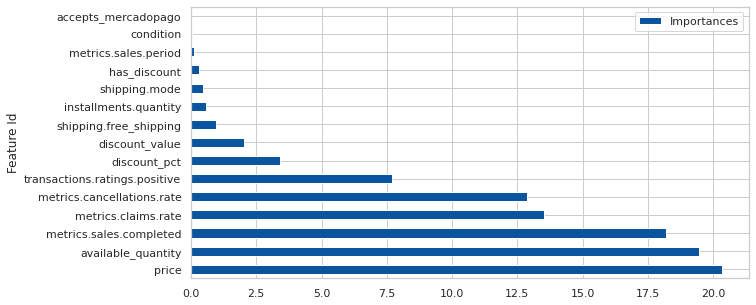

In [316]:
grids_catboost.get_feature_importance(cat_train_dataset, prettified=True).set_index('Feature Id').plot(kind='barh',
                                                figsize=(10,5))

In [388]:
import shap

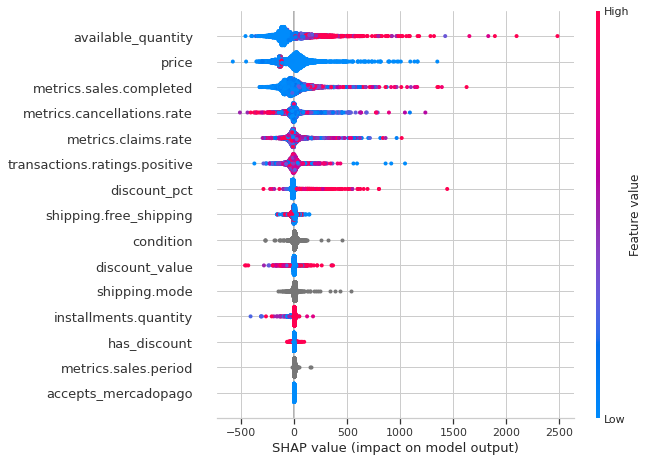

In [318]:
explainer = shap.TreeExplainer(grids_catboost)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test)


## trying a feature reduction

In [334]:
features = [
 'available_quantity',
 'condition',
 'price',
 'shipping.free_shipping',
 'shipping.mode',
 #'sold_quantity',
 'discount_value', 
 'discount_pct', 
 'has_discount'
           ]



In [335]:
cat_filtered_train_dataset = Pool(X_train[features], y_train, cat_features=list(X_train[features].select_dtypes(exclude='number') ))
cat_filtered_test_dataset = Pool(X_test[features], y_test, cat_features=list(X_train[features].select_dtypes(exclude='number')) )

In [336]:
grid = {'learning_rate': [0.03, 0.1, 0.5],
        'depth': [4, 6, 8, 10],
        'l2_leaf_reg': [1, 3, 5, 7, 9]}

grids_catboost_filter = CatBoostRegressor(verbose=10)
grid_search_result_filter = grids_catboost_filter.grid_search(grid, 
                                       cat_filtered_train_dataset, 
                                       plot=True, cv=5, verbose=10)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 859.0480939	test: 806.0434117	best: 806.0434117 (0)	total: 13ms	remaining: 13s
10:	learn: 813.4805254	test: 760.3749773	best: 760.3749773 (10)	total: 87.3ms	remaining: 7.85s
20:	learn: 786.9765588	test: 733.7779601	best: 733.7779601 (20)	total: 146ms	remaining: 6.83s
30:	learn: 770.6214655	test: 718.1260929	best: 718.1260929 (30)	total: 224ms	remaining: 7s
40:	learn: 761.0830465	test: 708.9352467	best: 708.9352467 (40)	total: 288ms	remaining: 6.73s
50:	learn: 753.6565777	test: 704.0357041	best: 704.0357041 (50)	total: 327ms	remaining: 6.08s
60:	learn: 748.6959548	test: 701.1313771	best: 701.1313771 (60)	total: 373ms	remaining: 5.74s
70:	learn: 744.1317423	test: 699.4481890	best: 699.4481890 (70)	total: 415ms	remaining: 5.44s
80:	learn: 740.9400643	test: 698.3393394	best: 698.3393394 (80)	total: 461ms	remaining: 5.23s
90:	learn: 737.9924224	test: 697.6723392	best: 697.6723392 (90)	total: 520ms	remaining: 5.19s
100:	learn: 737.0473060	test: 697.3403317	best: 697.3324753 (99)	to

890:	learn: 676.4951534	test: 703.0002964	best: 696.6822337 (136)	total: 3.37s	remaining: 413ms
900:	learn: 675.8588391	test: 703.1742137	best: 696.6822337 (136)	total: 3.42s	remaining: 376ms
910:	learn: 675.4115855	test: 703.2848826	best: 696.6822337 (136)	total: 3.44s	remaining: 336ms
920:	learn: 674.9343569	test: 703.4334253	best: 696.6822337 (136)	total: 3.47s	remaining: 298ms
930:	learn: 674.4873097	test: 703.5625311	best: 696.6822337 (136)	total: 3.5s	remaining: 259ms
940:	learn: 674.1123410	test: 703.6473695	best: 696.6822337 (136)	total: 3.53s	remaining: 221ms
950:	learn: 673.7577251	test: 703.7794898	best: 696.6822337 (136)	total: 3.56s	remaining: 183ms
960:	learn: 673.2773093	test: 703.9558943	best: 696.6822337 (136)	total: 3.59s	remaining: 146ms
970:	learn: 672.9675717	test: 704.0559611	best: 696.6822337 (136)	total: 3.63s	remaining: 108ms
980:	learn: 672.3779118	test: 704.1198208	best: 696.6822337 (136)	total: 3.66s	remaining: 70.8ms
990:	learn: 672.0668971	test: 704.154910

750:	learn: 636.1624582	test: 708.8489295	best: 696.2453151 (39)	total: 3.31s	remaining: 1.1s
760:	learn: 635.6684433	test: 708.6254809	best: 696.2453151 (39)	total: 3.36s	remaining: 1.05s
770:	learn: 635.2114706	test: 708.8127877	best: 696.2453151 (39)	total: 3.39s	remaining: 1.01s
780:	learn: 634.8354952	test: 709.0682043	best: 696.2453151 (39)	total: 3.42s	remaining: 959ms
790:	learn: 633.9429035	test: 709.2064050	best: 696.2453151 (39)	total: 3.45s	remaining: 911ms
800:	learn: 633.6342034	test: 709.2470939	best: 696.2453151 (39)	total: 3.48s	remaining: 864ms
810:	learn: 633.2897597	test: 709.3398980	best: 696.2453151 (39)	total: 3.51s	remaining: 818ms
820:	learn: 632.9223878	test: 709.2179958	best: 696.2453151 (39)	total: 3.54s	remaining: 773ms
830:	learn: 632.5593727	test: 709.1988498	best: 696.2453151 (39)	total: 3.59s	remaining: 730ms
840:	learn: 632.0754133	test: 709.6304651	best: 696.2453151 (39)	total: 3.62s	remaining: 685ms
850:	learn: 631.6340625	test: 709.7309241	best: 696

650:	learn: 562.7642662	test: 755.1430857	best: 699.6993953 (6)	total: 2.89s	remaining: 1.55s
660:	learn: 561.9465604	test: 755.6307229	best: 699.6993953 (6)	total: 2.93s	remaining: 1.5s
670:	learn: 561.4363372	test: 754.6658536	best: 699.6993953 (6)	total: 2.96s	remaining: 1.45s
680:	learn: 560.5892679	test: 754.6176915	best: 699.6993953 (6)	total: 3.01s	remaining: 1.41s
690:	learn: 560.3577063	test: 754.2572145	best: 699.6993953 (6)	total: 3.07s	remaining: 1.37s
700:	learn: 559.7786233	test: 754.0375581	best: 699.6993953 (6)	total: 3.12s	remaining: 1.33s
710:	learn: 557.9547889	test: 754.8939778	best: 699.6993953 (6)	total: 3.16s	remaining: 1.28s
720:	learn: 557.4707055	test: 756.2687214	best: 699.6993953 (6)	total: 3.21s	remaining: 1.24s
730:	learn: 556.5884783	test: 756.1608086	best: 699.6993953 (6)	total: 3.25s	remaining: 1.2s
740:	learn: 556.1603691	test: 756.1599990	best: 699.6993953 (6)	total: 3.28s	remaining: 1.15s
750:	learn: 555.4487070	test: 756.1906043	best: 699.6993953 (6

510:	learn: 707.9764835	test: 700.9870487	best: 697.2320409 (136)	total: 1.62s	remaining: 1.55s
520:	learn: 707.3251593	test: 701.0850788	best: 697.2320409 (136)	total: 1.66s	remaining: 1.52s
530:	learn: 706.5767589	test: 701.3049541	best: 697.2320409 (136)	total: 1.69s	remaining: 1.49s
540:	learn: 705.7228378	test: 701.4512579	best: 697.2320409 (136)	total: 1.71s	remaining: 1.45s
550:	learn: 705.0247978	test: 701.6195934	best: 697.2320409 (136)	total: 1.74s	remaining: 1.41s
560:	learn: 704.3689605	test: 701.4563670	best: 697.2320409 (136)	total: 1.76s	remaining: 1.38s
570:	learn: 703.8227461	test: 701.3123495	best: 697.2320409 (136)	total: 1.78s	remaining: 1.34s
580:	learn: 703.2531909	test: 701.4031706	best: 697.2320409 (136)	total: 1.8s	remaining: 1.3s
590:	learn: 702.7002307	test: 701.3338728	best: 697.2320409 (136)	total: 1.83s	remaining: 1.27s
600:	learn: 702.0767019	test: 701.1497656	best: 697.2320409 (136)	total: 1.87s	remaining: 1.24s
610:	learn: 701.5255307	test: 701.1999898	

390:	learn: 675.5274088	test: 706.1122938	best: 696.1747659 (37)	total: 1.26s	remaining: 1.96s
400:	learn: 674.9590764	test: 705.8637107	best: 696.1747659 (37)	total: 1.3s	remaining: 1.94s
410:	learn: 674.4054021	test: 705.8960018	best: 696.1747659 (37)	total: 1.33s	remaining: 1.91s
420:	learn: 674.1262711	test: 705.7985324	best: 696.1747659 (37)	total: 1.35s	remaining: 1.86s
430:	learn: 673.4922373	test: 706.3319027	best: 696.1747659 (37)	total: 1.38s	remaining: 1.82s
440:	learn: 672.7498129	test: 706.6722041	best: 696.1747659 (37)	total: 1.41s	remaining: 1.78s
450:	learn: 671.7934155	test: 706.7174552	best: 696.1747659 (37)	total: 1.44s	remaining: 1.75s
460:	learn: 671.1081359	test: 706.8900719	best: 696.1747659 (37)	total: 1.46s	remaining: 1.71s
470:	learn: 670.6737587	test: 707.1165907	best: 696.1747659 (37)	total: 1.5s	remaining: 1.69s
480:	learn: 669.7241951	test: 707.2577739	best: 696.1747659 (37)	total: 1.53s	remaining: 1.65s
490:	learn: 669.0107142	test: 707.6620841	best: 696.

290:	learn: 626.4876954	test: 713.4508352	best: 699.1274014 (8)	total: 1.08s	remaining: 2.64s
300:	learn: 625.3400779	test: 713.8851294	best: 699.1274014 (8)	total: 1.16s	remaining: 2.69s
310:	learn: 622.7242809	test: 715.7422784	best: 699.1274014 (8)	total: 1.2s	remaining: 2.66s
320:	learn: 620.6854823	test: 716.0669940	best: 699.1274014 (8)	total: 1.23s	remaining: 2.6s
330:	learn: 619.3417848	test: 716.7524488	best: 699.1274014 (8)	total: 1.26s	remaining: 2.54s
340:	learn: 617.7169781	test: 718.3491289	best: 699.1274014 (8)	total: 1.29s	remaining: 2.49s
350:	learn: 616.0140668	test: 719.0227206	best: 699.1274014 (8)	total: 1.33s	remaining: 2.46s
360:	learn: 613.4802791	test: 718.7516503	best: 699.1274014 (8)	total: 1.38s	remaining: 2.44s
370:	learn: 612.1080242	test: 718.6276004	best: 699.1274014 (8)	total: 1.44s	remaining: 2.45s
380:	learn: 611.0372265	test: 719.7693636	best: 699.1274014 (8)	total: 1.52s	remaining: 2.47s
390:	learn: 609.6021029	test: 721.0105751	best: 699.1274014 (8

150:	learn: 737.8419409	test: 696.5185373	best: 696.3795038 (144)	total: 481ms	remaining: 2.71s
160:	learn: 737.1191159	test: 696.4263906	best: 696.3795038 (144)	total: 514ms	remaining: 2.68s
170:	learn: 736.0268826	test: 696.3861759	best: 696.3625565 (168)	total: 542ms	remaining: 2.63s
180:	learn: 735.4806314	test: 696.4565399	best: 696.3625565 (168)	total: 566ms	remaining: 2.56s
190:	learn: 734.6999880	test: 696.4408444	best: 696.3625565 (168)	total: 611ms	remaining: 2.59s
200:	learn: 733.5727469	test: 696.4213425	best: 696.3625565 (168)	total: 653ms	remaining: 2.6s
210:	learn: 732.4060224	test: 696.4568769	best: 696.3625565 (168)	total: 700ms	remaining: 2.62s
220:	learn: 731.6432818	test: 696.5454149	best: 696.3625565 (168)	total: 745ms	remaining: 2.63s
230:	learn: 731.2253601	test: 696.4976789	best: 696.3625565 (168)	total: 778ms	remaining: 2.59s
240:	learn: 729.9584993	test: 696.4972635	best: 696.3625565 (168)	total: 818ms	remaining: 2.58s
250:	learn: 729.6082103	test: 696.5907600

40:	learn: 739.3142582	test: 696.1659087	best: 696.1659087 (40)	total: 135ms	remaining: 3.15s
50:	learn: 737.3630227	test: 695.9283855	best: 695.8676117 (49)	total: 174ms	remaining: 3.24s
60:	learn: 733.3839872	test: 696.4150417	best: 695.8676117 (49)	total: 210ms	remaining: 3.23s
70:	learn: 731.8715146	test: 696.6838127	best: 695.8676117 (49)	total: 232ms	remaining: 3.03s
80:	learn: 729.3036411	test: 696.8074066	best: 695.8676117 (49)	total: 261ms	remaining: 2.96s
90:	learn: 727.1656175	test: 696.6040524	best: 695.8676117 (49)	total: 290ms	remaining: 2.9s
100:	learn: 725.8334765	test: 696.8527995	best: 695.8676117 (49)	total: 321ms	remaining: 2.86s
110:	learn: 724.2018799	test: 697.3794715	best: 695.8676117 (49)	total: 373ms	remaining: 2.99s
120:	learn: 720.5935152	test: 698.2992430	best: 695.8676117 (49)	total: 418ms	remaining: 3.04s
130:	learn: 718.3830704	test: 698.7000415	best: 695.8676117 (49)	total: 453ms	remaining: 3s
140:	learn: 716.7918408	test: 699.0961792	best: 695.8676117 

910:	learn: 661.3095145	test: 702.6221820	best: 695.8676117 (49)	total: 2.86s	remaining: 279ms
920:	learn: 661.0852090	test: 702.7412564	best: 695.8676117 (49)	total: 2.89s	remaining: 248ms
930:	learn: 660.8431918	test: 702.8045468	best: 695.8676117 (49)	total: 2.92s	remaining: 217ms
940:	learn: 660.2900047	test: 703.0636617	best: 695.8676117 (49)	total: 2.96s	remaining: 185ms
950:	learn: 660.0320519	test: 703.2286565	best: 695.8676117 (49)	total: 2.98s	remaining: 154ms
960:	learn: 659.7099334	test: 702.9825789	best: 695.8676117 (49)	total: 3.01s	remaining: 122ms
970:	learn: 659.3822988	test: 703.0305085	best: 695.8676117 (49)	total: 3.04s	remaining: 90.7ms
980:	learn: 658.9115485	test: 702.8914761	best: 695.8676117 (49)	total: 3.08s	remaining: 59.6ms
990:	learn: 658.6131658	test: 702.9801772	best: 695.8676117 (49)	total: 3.11s	remaining: 28.3ms
999:	learn: 658.3745772	test: 703.0662746	best: 695.8676117 (49)	total: 3.14s	remaining: 0us

bestTest = 695.8676117
bestIteration = 49

0:	le

770:	learn: 589.4729193	test: 724.6309582	best: 694.4762133 (14)	total: 2.69s	remaining: 799ms
780:	learn: 589.0056980	test: 724.1045008	best: 694.4762133 (14)	total: 2.72s	remaining: 763ms
790:	learn: 588.3990902	test: 724.2602587	best: 694.4762133 (14)	total: 2.75s	remaining: 727ms
800:	learn: 588.0946857	test: 724.4191369	best: 694.4762133 (14)	total: 2.78s	remaining: 691ms
810:	learn: 586.9516339	test: 724.7717764	best: 694.4762133 (14)	total: 2.81s	remaining: 655ms
820:	learn: 586.0968825	test: 724.9618668	best: 694.4762133 (14)	total: 2.85s	remaining: 621ms
830:	learn: 585.5869638	test: 724.7619432	best: 694.4762133 (14)	total: 2.88s	remaining: 586ms
840:	learn: 585.1308532	test: 726.0445363	best: 694.4762133 (14)	total: 2.92s	remaining: 553ms
850:	learn: 584.2754619	test: 726.2934210	best: 694.4762133 (14)	total: 2.96s	remaining: 519ms
860:	learn: 583.8950833	test: 726.2263436	best: 694.4762133 (14)	total: 2.99s	remaining: 483ms
870:	learn: 583.4926387	test: 726.8297622	best: 69

670:	learn: 706.1529290	test: 699.9010452	best: 696.7398266 (238)	total: 1.92s	remaining: 942ms
680:	learn: 705.7777457	test: 699.9101690	best: 696.7398266 (238)	total: 1.96s	remaining: 918ms
690:	learn: 705.5132249	test: 699.9658252	best: 696.7398266 (238)	total: 1.99s	remaining: 888ms
700:	learn: 705.0871854	test: 700.0131664	best: 696.7398266 (238)	total: 2.02s	remaining: 861ms
710:	learn: 704.8331026	test: 700.1095500	best: 696.7398266 (238)	total: 2.06s	remaining: 837ms
720:	learn: 704.4548400	test: 700.1828304	best: 696.7398266 (238)	total: 2.1s	remaining: 811ms
730:	learn: 704.1574444	test: 700.2436960	best: 696.7398266 (238)	total: 2.15s	remaining: 790ms
740:	learn: 703.7873738	test: 700.2547366	best: 696.7398266 (238)	total: 2.19s	remaining: 764ms
750:	learn: 703.5001512	test: 700.1744539	best: 696.7398266 (238)	total: 2.21s	remaining: 733ms
760:	learn: 703.1779935	test: 700.1149142	best: 696.7398266 (238)	total: 2.23s	remaining: 702ms
770:	learn: 702.8956056	test: 700.1763917

540:	learn: 681.6181051	test: 700.3672667	best: 696.9337023 (42)	total: 1.69s	remaining: 1.43s
550:	learn: 681.1837187	test: 700.4653387	best: 696.9337023 (42)	total: 1.73s	remaining: 1.41s
560:	learn: 680.5317275	test: 700.9661419	best: 696.9337023 (42)	total: 1.75s	remaining: 1.37s
570:	learn: 680.1403518	test: 701.0680783	best: 696.9337023 (42)	total: 1.78s	remaining: 1.33s
580:	learn: 679.4856572	test: 701.1161787	best: 696.9337023 (42)	total: 1.8s	remaining: 1.3s
590:	learn: 678.9405667	test: 701.1936345	best: 696.9337023 (42)	total: 1.84s	remaining: 1.27s
600:	learn: 678.3810805	test: 701.3443206	best: 696.9337023 (42)	total: 1.86s	remaining: 1.24s
610:	learn: 677.8745338	test: 701.0713273	best: 696.9337023 (42)	total: 1.89s	remaining: 1.2s
620:	learn: 677.5094982	test: 701.1791495	best: 696.9337023 (42)	total: 1.93s	remaining: 1.18s
630:	learn: 677.2831363	test: 701.1977597	best: 696.9337023 (42)	total: 1.95s	remaining: 1.14s
640:	learn: 676.9804601	test: 701.5393911	best: 696.9

390:	learn: 631.5061378	test: 713.0231981	best: 696.9044907 (20)	total: 1.3s	remaining: 2.02s
400:	learn: 630.3003221	test: 712.6057988	best: 696.9044907 (20)	total: 1.33s	remaining: 1.99s
410:	learn: 628.9962146	test: 712.3482361	best: 696.9044907 (20)	total: 1.36s	remaining: 1.95s
420:	learn: 628.0291045	test: 712.9484835	best: 696.9044907 (20)	total: 1.4s	remaining: 1.92s
430:	learn: 626.9592283	test: 713.0189258	best: 696.9044907 (20)	total: 1.43s	remaining: 1.89s
440:	learn: 626.2657123	test: 712.6512419	best: 696.9044907 (20)	total: 1.47s	remaining: 1.86s
450:	learn: 624.9774608	test: 712.9893537	best: 696.9044907 (20)	total: 1.51s	remaining: 1.83s
460:	learn: 623.3321171	test: 714.1778602	best: 696.9044907 (20)	total: 1.55s	remaining: 1.81s
470:	learn: 621.9414922	test: 714.6303534	best: 696.9044907 (20)	total: 1.58s	remaining: 1.78s
480:	learn: 621.0993350	test: 714.5028522	best: 696.9044907 (20)	total: 1.61s	remaining: 1.74s
490:	learn: 620.5422290	test: 714.6431889	best: 696.

280:	learn: 730.8568147	test: 697.1375052	best: 696.7788771 (159)	total: 805ms	remaining: 2.06s
290:	learn: 729.9596698	test: 697.2296049	best: 696.7788771 (159)	total: 842ms	remaining: 2.05s
300:	learn: 729.0099674	test: 697.3884825	best: 696.7788771 (159)	total: 868ms	remaining: 2.02s
310:	learn: 728.2433974	test: 697.3727595	best: 696.7788771 (159)	total: 895ms	remaining: 1.98s
320:	learn: 727.3789793	test: 697.4509898	best: 696.7788771 (159)	total: 922ms	remaining: 1.95s
330:	learn: 726.4096672	test: 697.6219630	best: 696.7788771 (159)	total: 949ms	remaining: 1.92s
340:	learn: 725.6717117	test: 697.7173175	best: 696.7788771 (159)	total: 984ms	remaining: 1.9s
350:	learn: 724.9891832	test: 697.8650724	best: 696.7788771 (159)	total: 1.01s	remaining: 1.87s
360:	learn: 724.3867029	test: 698.0193146	best: 696.7788771 (159)	total: 1.05s	remaining: 1.87s
370:	learn: 723.6726480	test: 698.1639941	best: 696.7788771 (159)	total: 1.08s	remaining: 1.83s
380:	learn: 723.1000379	test: 698.2574353

190:	learn: 709.8780701	test: 699.9927538	best: 696.3642103 (64)	total: 623ms	remaining: 2.64s
200:	learn: 708.8323799	test: 700.0302525	best: 696.3642103 (64)	total: 660ms	remaining: 2.62s
210:	learn: 708.1316340	test: 700.3286467	best: 696.3642103 (64)	total: 737ms	remaining: 2.75s
220:	learn: 707.4348234	test: 700.0933908	best: 696.3642103 (64)	total: 788ms	remaining: 2.78s
230:	learn: 706.5610438	test: 700.1131400	best: 696.3642103 (64)	total: 817ms	remaining: 2.72s
240:	learn: 705.4167216	test: 700.3100794	best: 696.3642103 (64)	total: 854ms	remaining: 2.69s
250:	learn: 704.2801661	test: 700.4397260	best: 696.3642103 (64)	total: 884ms	remaining: 2.64s
260:	learn: 703.6483669	test: 700.5118627	best: 696.3642103 (64)	total: 909ms	remaining: 2.57s
270:	learn: 702.6702816	test: 700.2554578	best: 696.3642103 (64)	total: 932ms	remaining: 2.51s
280:	learn: 701.8399270	test: 700.2827587	best: 696.3642103 (64)	total: 955ms	remaining: 2.44s
290:	learn: 701.0939715	test: 700.3381313	best: 69

80:	learn: 688.3683680	test: 702.6732603	best: 696.8639216 (20)	total: 283ms	remaining: 3.21s
90:	learn: 685.0770677	test: 703.4412720	best: 696.8639216 (20)	total: 328ms	remaining: 3.27s
100:	learn: 682.1247691	test: 703.4735001	best: 696.8639216 (20)	total: 359ms	remaining: 3.2s
110:	learn: 679.6286568	test: 704.8678733	best: 696.8639216 (20)	total: 387ms	remaining: 3.1s
120:	learn: 678.6292439	test: 706.0008177	best: 696.8639216 (20)	total: 411ms	remaining: 2.99s
130:	learn: 676.6117786	test: 705.3863631	best: 696.8639216 (20)	total: 437ms	remaining: 2.9s
140:	learn: 673.3667200	test: 704.2243292	best: 696.8639216 (20)	total: 480ms	remaining: 2.92s
150:	learn: 671.8859915	test: 704.4836887	best: 696.8639216 (20)	total: 524ms	remaining: 2.95s
160:	learn: 670.7159486	test: 704.7134202	best: 696.8639216 (20)	total: 568ms	remaining: 2.96s
170:	learn: 670.4904109	test: 704.8636049	best: 696.8639216 (20)	total: 605ms	remaining: 2.93s
180:	learn: 668.6011175	test: 704.3487856	best: 696.863

950:	learn: 598.6620290	test: 724.2996681	best: 696.8639216 (20)	total: 3.24s	remaining: 167ms
960:	learn: 598.2617055	test: 724.4544420	best: 696.8639216 (20)	total: 3.27s	remaining: 133ms
970:	learn: 597.3844685	test: 724.3065651	best: 696.8639216 (20)	total: 3.31s	remaining: 98.7ms
980:	learn: 597.0378637	test: 724.1339675	best: 696.8639216 (20)	total: 3.34s	remaining: 64.6ms
990:	learn: 596.5609277	test: 724.5415083	best: 696.8639216 (20)	total: 3.37s	remaining: 30.6ms
999:	learn: 596.3102564	test: 724.5781371	best: 696.8639216 (20)	total: 3.4s	remaining: 0us

bestTest = 696.8639216
bestIteration = 20

0:	learn: 859.0117740	test: 806.0141286	best: 806.0141286 (0)	total: 5.83ms	remaining: 5.83s
10:	learn: 812.4933180	test: 759.5816430	best: 759.5816430 (10)	total: 61.9ms	remaining: 5.56s
20:	learn: 783.2541979	test: 732.1311318	best: 732.1311318 (20)	total: 117ms	remaining: 5.47s
30:	learn: 764.6704132	test: 716.5162435	best: 716.5162435 (30)	total: 174ms	remaining: 5.43s
40:	learn:

830:	learn: 655.0832220	test: 706.2020172	best: 696.4535899 (138)	total: 4.14s	remaining: 842ms
840:	learn: 654.6043024	test: 706.3545945	best: 696.4535899 (138)	total: 4.19s	remaining: 792ms
850:	learn: 653.9630827	test: 706.4854955	best: 696.4535899 (138)	total: 4.24s	remaining: 742ms
860:	learn: 653.3118640	test: 706.8511925	best: 696.4535899 (138)	total: 4.28s	remaining: 691ms
870:	learn: 652.7284674	test: 707.0621353	best: 696.4535899 (138)	total: 4.33s	remaining: 641ms
880:	learn: 651.9168549	test: 707.3104515	best: 696.4535899 (138)	total: 4.39s	remaining: 593ms
890:	learn: 651.3003810	test: 707.3649847	best: 696.4535899 (138)	total: 4.43s	remaining: 542ms
900:	learn: 650.7907768	test: 707.6398074	best: 696.4535899 (138)	total: 4.48s	remaining: 492ms
910:	learn: 650.2369006	test: 707.6408656	best: 696.4535899 (138)	total: 4.52s	remaining: 442ms
920:	learn: 649.5535510	test: 707.6420097	best: 696.4535899 (138)	total: 4.57s	remaining: 392ms
930:	learn: 648.8529454	test: 707.932522

680:	learn: 599.6137562	test: 717.6490272	best: 695.8645109 (46)	total: 3.97s	remaining: 1.86s
690:	learn: 598.8689175	test: 717.9783116	best: 695.8645109 (46)	total: 4.04s	remaining: 1.8s
700:	learn: 598.0145874	test: 718.1649815	best: 695.8645109 (46)	total: 4.08s	remaining: 1.74s
710:	learn: 596.8843889	test: 719.2792465	best: 695.8645109 (46)	total: 4.15s	remaining: 1.69s
720:	learn: 596.1151382	test: 719.5690016	best: 695.8645109 (46)	total: 4.24s	remaining: 1.64s
730:	learn: 595.1544896	test: 719.5070364	best: 695.8645109 (46)	total: 4.3s	remaining: 1.58s
740:	learn: 593.9765312	test: 719.4060128	best: 695.8645109 (46)	total: 4.37s	remaining: 1.53s
750:	learn: 592.5873998	test: 719.8370815	best: 695.8645109 (46)	total: 4.44s	remaining: 1.47s
760:	learn: 591.8855906	test: 719.9134780	best: 695.8645109 (46)	total: 4.51s	remaining: 1.42s
770:	learn: 590.7708221	test: 720.2112955	best: 695.8645109 (46)	total: 4.58s	remaining: 1.36s
780:	learn: 589.9581210	test: 720.3252269	best: 695.

550:	learn: 499.9710743	test: 749.4937498	best: 700.8330225 (14)	total: 3.12s	remaining: 2.54s
560:	learn: 498.9400074	test: 749.5878162	best: 700.8330225 (14)	total: 3.19s	remaining: 2.49s
570:	learn: 497.9316676	test: 749.6375022	best: 700.8330225 (14)	total: 3.24s	remaining: 2.44s
580:	learn: 496.6582570	test: 749.8765627	best: 700.8330225 (14)	total: 3.3s	remaining: 2.38s
590:	learn: 496.1611248	test: 751.0595516	best: 700.8330225 (14)	total: 3.37s	remaining: 2.33s
600:	learn: 495.0503218	test: 751.8476773	best: 700.8330225 (14)	total: 3.42s	remaining: 2.27s
610:	learn: 493.3479453	test: 751.6146577	best: 700.8330225 (14)	total: 3.47s	remaining: 2.21s
620:	learn: 489.6436301	test: 753.2116320	best: 700.8330225 (14)	total: 3.52s	remaining: 2.15s
630:	learn: 488.2231667	test: 752.9026515	best: 700.8330225 (14)	total: 3.59s	remaining: 2.1s
640:	learn: 485.9569308	test: 752.4937399	best: 700.8330225 (14)	total: 3.64s	remaining: 2.04s
650:	learn: 484.8857311	test: 753.3247170	best: 700.

410:	learn: 702.2859465	test: 700.6089624	best: 697.5610465 (117)	total: 1.87s	remaining: 2.68s
420:	learn: 701.1763780	test: 700.8335069	best: 697.5610465 (117)	total: 1.92s	remaining: 2.64s
430:	learn: 700.1866742	test: 700.8150694	best: 697.5610465 (117)	total: 1.96s	remaining: 2.59s
440:	learn: 699.2995784	test: 700.9579864	best: 697.5610465 (117)	total: 2.02s	remaining: 2.56s
450:	learn: 698.5404162	test: 701.1267096	best: 697.5610465 (117)	total: 2.09s	remaining: 2.55s
460:	learn: 697.3285424	test: 700.8391281	best: 697.5610465 (117)	total: 2.17s	remaining: 2.54s
470:	learn: 696.4793949	test: 700.7663799	best: 697.5610465 (117)	total: 2.23s	remaining: 2.51s
480:	learn: 695.6416104	test: 700.6966728	best: 697.5610465 (117)	total: 2.28s	remaining: 2.46s
490:	learn: 694.8073852	test: 700.7332543	best: 697.5610465 (117)	total: 2.35s	remaining: 2.43s
500:	learn: 694.0284376	test: 700.8452443	best: 697.5610465 (117)	total: 2.39s	remaining: 2.38s
510:	learn: 692.9050704	test: 700.905310

270:	learn: 670.1831133	test: 704.1964237	best: 697.2026429 (73)	total: 1.33s	remaining: 3.58s
280:	learn: 668.3907014	test: 704.6702201	best: 697.2026429 (73)	total: 1.37s	remaining: 3.51s
290:	learn: 667.0952598	test: 705.0396355	best: 697.2026429 (73)	total: 1.43s	remaining: 3.48s
300:	learn: 664.7917270	test: 705.5000135	best: 697.2026429 (73)	total: 1.47s	remaining: 3.41s
310:	learn: 662.9177348	test: 705.8197481	best: 697.2026429 (73)	total: 1.5s	remaining: 3.33s
320:	learn: 661.5402473	test: 705.7044139	best: 697.2026429 (73)	total: 1.55s	remaining: 3.27s
330:	learn: 660.8275563	test: 705.5644358	best: 697.2026429 (73)	total: 1.6s	remaining: 3.24s
340:	learn: 659.5189568	test: 705.7718584	best: 697.2026429 (73)	total: 1.65s	remaining: 3.18s
350:	learn: 658.3082211	test: 706.0891630	best: 697.2026429 (73)	total: 1.69s	remaining: 3.12s
360:	learn: 657.0170112	test: 706.6027177	best: 697.2026429 (73)	total: 1.73s	remaining: 3.07s
370:	learn: 656.1852000	test: 706.6906145	best: 697.

130:	learn: 627.2640312	test: 722.7034779	best: 700.9230474 (5)	total: 702ms	remaining: 4.66s
140:	learn: 623.4445980	test: 722.8178810	best: 700.9230474 (5)	total: 769ms	remaining: 4.68s
150:	learn: 620.1236382	test: 723.7709262	best: 700.9230474 (5)	total: 812ms	remaining: 4.57s
160:	learn: 617.5026662	test: 724.5551517	best: 700.9230474 (5)	total: 857ms	remaining: 4.47s
170:	learn: 613.0058836	test: 723.2164947	best: 700.9230474 (5)	total: 904ms	remaining: 4.38s
180:	learn: 608.6583277	test: 726.7881525	best: 700.9230474 (5)	total: 968ms	remaining: 4.38s
190:	learn: 605.0888307	test: 727.4995992	best: 700.9230474 (5)	total: 1.01s	remaining: 4.3s
200:	learn: 600.9612704	test: 724.9906771	best: 700.9230474 (5)	total: 1.06s	remaining: 4.22s
210:	learn: 597.6682582	test: 726.4554770	best: 700.9230474 (5)	total: 1.11s	remaining: 4.17s
220:	learn: 594.7768272	test: 727.8913825	best: 700.9230474 (5)	total: 1.17s	remaining: 4.13s
230:	learn: 591.9726069	test: 727.0179788	best: 700.9230474 (

10:	learn: 813.1554891	test: 760.1028393	best: 760.1028393 (10)	total: 58.3ms	remaining: 5.24s
20:	learn: 784.8183474	test: 732.5419728	best: 732.5419728 (20)	total: 119ms	remaining: 5.55s
30:	learn: 767.9939172	test: 717.0532251	best: 717.0532251 (30)	total: 167ms	remaining: 5.23s
40:	learn: 758.9437310	test: 709.1608558	best: 709.1608558 (40)	total: 197ms	remaining: 4.61s
50:	learn: 753.3276465	test: 704.1610546	best: 704.1610546 (50)	total: 230ms	remaining: 4.28s
60:	learn: 748.8415540	test: 701.1580228	best: 701.1580228 (60)	total: 276ms	remaining: 4.25s
70:	learn: 745.7022102	test: 699.5019579	best: 699.5019579 (70)	total: 331ms	remaining: 4.33s
80:	learn: 742.8043751	test: 698.6592135	best: 698.6551735 (79)	total: 372ms	remaining: 4.22s
90:	learn: 740.8469770	test: 698.2470465	best: 698.2470465 (90)	total: 413ms	remaining: 4.13s
100:	learn: 738.0703167	test: 697.9516774	best: 697.9113190 (97)	total: 450ms	remaining: 4s
110:	learn: 736.4397345	test: 697.7829991	best: 697.7829991 (

920:	learn: 678.3937823	test: 704.5151933	best: 697.5093724 (132)	total: 4.26s	remaining: 366ms
930:	learn: 678.0828791	test: 704.6086205	best: 697.5093724 (132)	total: 4.3s	remaining: 319ms
940:	learn: 677.6764038	test: 704.6774210	best: 697.5093724 (132)	total: 4.34s	remaining: 272ms
950:	learn: 677.2266165	test: 704.7791305	best: 697.5093724 (132)	total: 4.39s	remaining: 226ms
960:	learn: 676.8223949	test: 704.8968150	best: 697.5093724 (132)	total: 4.43s	remaining: 180ms
970:	learn: 676.4881072	test: 705.0361120	best: 697.5093724 (132)	total: 4.49s	remaining: 134ms
980:	learn: 675.9913800	test: 705.0527960	best: 697.5093724 (132)	total: 4.54s	remaining: 88ms
990:	learn: 675.4745366	test: 705.1915395	best: 697.5093724 (132)	total: 4.59s	remaining: 41.7ms
999:	learn: 675.0617417	test: 705.2985499	best: 697.5093724 (132)	total: 4.63s	remaining: 0us

bestTest = 697.5093724
bestIteration = 132

0:	learn: 845.9024189	test: 792.7273986	best: 792.7273986 (0)	total: 5.43ms	remaining: 5.42s
1

780:	learn: 637.5154422	test: 710.3049155	best: 697.0216292 (29)	total: 3.73s	remaining: 1.04s
790:	learn: 637.2735602	test: 710.4249586	best: 697.0216292 (29)	total: 3.77s	remaining: 996ms
800:	learn: 636.0716208	test: 710.0740303	best: 697.0216292 (29)	total: 3.82s	remaining: 949ms
810:	learn: 635.7894211	test: 710.2367608	best: 697.0216292 (29)	total: 3.86s	remaining: 899ms
820:	learn: 635.2990636	test: 709.8372458	best: 697.0216292 (29)	total: 3.9s	remaining: 851ms
830:	learn: 634.9079863	test: 709.5735939	best: 697.0216292 (29)	total: 3.98s	remaining: 809ms
840:	learn: 634.5033522	test: 709.4828400	best: 697.0216292 (29)	total: 4.02s	remaining: 760ms
850:	learn: 633.9409036	test: 709.3768576	best: 697.0216292 (29)	total: 4.07s	remaining: 712ms
860:	learn: 633.1684264	test: 709.5934895	best: 697.0216292 (29)	total: 4.11s	remaining: 664ms
870:	learn: 632.6111679	test: 709.4132760	best: 697.0216292 (29)	total: 4.15s	remaining: 615ms
880:	learn: 632.0382007	test: 709.6852037	best: 697

680:	learn: 541.7496238	test: 740.6025734	best: 700.4925147 (4)	total: 3.7s	remaining: 1.73s
690:	learn: 540.7724459	test: 740.4980842	best: 700.4925147 (4)	total: 3.75s	remaining: 1.68s
700:	learn: 539.0550365	test: 740.4819854	best: 700.4925147 (4)	total: 3.8s	remaining: 1.62s
710:	learn: 537.9307391	test: 741.3969852	best: 700.4925147 (4)	total: 3.85s	remaining: 1.56s
720:	learn: 537.0498294	test: 742.2399252	best: 700.4925147 (4)	total: 3.89s	remaining: 1.51s
730:	learn: 535.5232099	test: 741.9918125	best: 700.4925147 (4)	total: 3.96s	remaining: 1.46s
740:	learn: 533.6906793	test: 742.1561658	best: 700.4925147 (4)	total: 4.01s	remaining: 1.4s
750:	learn: 532.9033766	test: 743.1779680	best: 700.4925147 (4)	total: 4.05s	remaining: 1.34s
760:	learn: 531.9519005	test: 744.1963992	best: 700.4925147 (4)	total: 4.11s	remaining: 1.29s
770:	learn: 530.9070051	test: 744.5311960	best: 700.4925147 (4)	total: 4.15s	remaining: 1.23s
780:	learn: 529.9760551	test: 745.2749286	best: 700.4925147 (4)

530:	learn: 703.6515622	test: 702.6954117	best: 697.7072464 (169)	total: 2.5s	remaining: 2.21s
540:	learn: 703.4078359	test: 702.7400012	best: 697.7072464 (169)	total: 2.56s	remaining: 2.17s
550:	learn: 702.8991832	test: 702.7735646	best: 697.7072464 (169)	total: 2.6s	remaining: 2.12s
560:	learn: 702.4368173	test: 702.7546399	best: 697.7072464 (169)	total: 2.64s	remaining: 2.06s
570:	learn: 701.8114629	test: 702.6812196	best: 697.7072464 (169)	total: 2.68s	remaining: 2.01s
580:	learn: 701.4283843	test: 702.7458774	best: 697.7072464 (169)	total: 2.73s	remaining: 1.97s
590:	learn: 700.7552381	test: 702.8071368	best: 697.7072464 (169)	total: 2.78s	remaining: 1.92s
600:	learn: 700.2503722	test: 702.7834365	best: 697.7072464 (169)	total: 2.82s	remaining: 1.87s
610:	learn: 699.5863735	test: 702.7992371	best: 697.7072464 (169)	total: 2.85s	remaining: 1.82s
620:	learn: 698.9190403	test: 702.7769334	best: 697.7072464 (169)	total: 2.9s	remaining: 1.77s
630:	learn: 698.2028576	test: 702.7476175	b

380:	learn: 674.3054588	test: 699.5573830	best: 696.4660137 (36)	total: 1.78s	remaining: 2.9s
390:	learn: 673.6749995	test: 699.6104964	best: 696.4660137 (36)	total: 1.83s	remaining: 2.85s
400:	learn: 672.7845965	test: 699.7498883	best: 696.4660137 (36)	total: 1.87s	remaining: 2.79s
410:	learn: 672.1710253	test: 699.6867149	best: 696.4660137 (36)	total: 1.91s	remaining: 2.73s
420:	learn: 671.4043860	test: 699.9135172	best: 696.4660137 (36)	total: 1.95s	remaining: 2.68s
430:	learn: 670.5703392	test: 700.4066375	best: 696.4660137 (36)	total: 1.99s	remaining: 2.62s
440:	learn: 669.3554501	test: 700.7546086	best: 696.4660137 (36)	total: 2.06s	remaining: 2.61s
450:	learn: 668.3123292	test: 701.0315491	best: 696.4660137 (36)	total: 2.11s	remaining: 2.57s
460:	learn: 667.2426574	test: 701.4317341	best: 696.4660137 (36)	total: 2.17s	remaining: 2.54s
470:	learn: 666.2832461	test: 701.8203228	best: 696.4660137 (36)	total: 2.24s	remaining: 2.52s
480:	learn: 665.5831946	test: 701.8918193	best: 696

260:	learn: 614.0185863	test: 717.0903899	best: 699.6024266 (7)	total: 1.31s	remaining: 3.71s
270:	learn: 612.4603867	test: 716.8881960	best: 699.6024266 (7)	total: 1.37s	remaining: 3.67s
280:	learn: 611.0403990	test: 717.3114750	best: 699.6024266 (7)	total: 1.41s	remaining: 3.61s
290:	learn: 608.5825410	test: 715.7969200	best: 699.6024266 (7)	total: 1.47s	remaining: 3.59s
300:	learn: 605.9225808	test: 715.4022849	best: 699.6024266 (7)	total: 1.53s	remaining: 3.56s
310:	learn: 603.8450363	test: 715.0857490	best: 699.6024266 (7)	total: 1.59s	remaining: 3.53s
320:	learn: 602.3014251	test: 715.3708817	best: 699.6024266 (7)	total: 1.64s	remaining: 3.47s
330:	learn: 601.5870187	test: 715.3126626	best: 699.6024266 (7)	total: 1.69s	remaining: 3.41s
340:	learn: 598.7320593	test: 716.6424008	best: 699.6024266 (7)	total: 1.75s	remaining: 3.37s
350:	learn: 597.7306237	test: 716.6506452	best: 699.6024266 (7)	total: 1.8s	remaining: 3.33s
360:	learn: 596.2365586	test: 717.1829440	best: 699.6024266 (

150:	learn: 733.7564373	test: 696.9705967	best: 696.7695129 (121)	total: 700ms	remaining: 3.94s
160:	learn: 732.8488482	test: 696.8821495	best: 696.7695129 (121)	total: 766ms	remaining: 3.99s
170:	learn: 732.1215421	test: 696.7908747	best: 696.7695129 (121)	total: 814ms	remaining: 3.94s
180:	learn: 731.5104208	test: 696.8416941	best: 696.7661506 (177)	total: 850ms	remaining: 3.85s
190:	learn: 730.7077369	test: 696.8380368	best: 696.7661506 (177)	total: 889ms	remaining: 3.77s
200:	learn: 729.7588622	test: 696.9707994	best: 696.7661506 (177)	total: 948ms	remaining: 3.77s
210:	learn: 728.8572466	test: 697.0931545	best: 696.7661506 (177)	total: 990ms	remaining: 3.7s
220:	learn: 728.1226781	test: 697.1164276	best: 696.7661506 (177)	total: 1.02s	remaining: 3.6s
230:	learn: 726.6273161	test: 697.0860847	best: 696.7661506 (177)	total: 1.06s	remaining: 3.53s
240:	learn: 725.6477060	test: 697.0414738	best: 696.7661506 (177)	total: 1.1s	remaining: 3.47s
250:	learn: 724.8683003	test: 697.1575485	b

40:	learn: 735.3947477	test: 696.1734229	best: 696.1730511 (36)	total: 184ms	remaining: 4.29s
50:	learn: 733.4181516	test: 696.5688414	best: 696.1730511 (36)	total: 224ms	remaining: 4.17s
60:	learn: 730.5417951	test: 696.6076989	best: 696.1730511 (36)	total: 261ms	remaining: 4.01s
70:	learn: 727.8517574	test: 696.8705699	best: 696.1730511 (36)	total: 297ms	remaining: 3.89s
80:	learn: 725.0889275	test: 696.6669404	best: 696.1730511 (36)	total: 341ms	remaining: 3.87s
90:	learn: 721.6238566	test: 697.1013057	best: 696.1730511 (36)	total: 393ms	remaining: 3.92s
100:	learn: 717.6081727	test: 697.2095977	best: 696.1730511 (36)	total: 448ms	remaining: 3.99s
110:	learn: 715.4254628	test: 698.0781056	best: 696.1730511 (36)	total: 491ms	remaining: 3.93s
120:	learn: 713.2578831	test: 698.7424873	best: 696.1730511 (36)	total: 532ms	remaining: 3.86s
130:	learn: 710.7126568	test: 699.0856850	best: 696.1730511 (36)	total: 573ms	remaining: 3.8s
140:	learn: 708.7069380	test: 699.4489290	best: 696.17305

950:	learn: 650.5238299	test: 706.7781103	best: 696.1730511 (36)	total: 4.38s	remaining: 226ms
960:	learn: 649.9865774	test: 706.8227204	best: 696.1730511 (36)	total: 4.42s	remaining: 180ms
970:	learn: 649.7681585	test: 706.9107302	best: 696.1730511 (36)	total: 4.47s	remaining: 134ms
980:	learn: 649.4788718	test: 707.0758767	best: 696.1730511 (36)	total: 4.52s	remaining: 87.6ms
990:	learn: 649.1315878	test: 707.3075672	best: 696.1730511 (36)	total: 4.57s	remaining: 41.5ms
999:	learn: 648.9398535	test: 707.3172941	best: 696.1730511 (36)	total: 4.61s	remaining: 0us

bestTest = 696.1730511
bestIteration = 36

0:	learn: 787.3577621	test: 733.9680040	best: 733.9680040 (0)	total: 7.32ms	remaining: 7.31s
10:	learn: 734.2428075	test: 700.2291187	best: 700.0829493 (4)	total: 57.1ms	remaining: 5.13s
20:	learn: 722.2979718	test: 703.6588848	best: 699.6581684 (12)	total: 98.6ms	remaining: 4.59s
30:	learn: 709.8881353	test: 704.2348810	best: 699.6581684 (12)	total: 153ms	remaining: 4.77s
40:	learn:

810:	learn: 559.0555003	test: 729.5138761	best: 699.6581684 (12)	total: 4.23s	remaining: 986ms
820:	learn: 557.6712171	test: 729.6621070	best: 699.6581684 (12)	total: 4.3s	remaining: 938ms
830:	learn: 557.0500928	test: 729.5697980	best: 699.6581684 (12)	total: 4.36s	remaining: 886ms
840:	learn: 556.1528094	test: 729.0755004	best: 699.6581684 (12)	total: 4.41s	remaining: 834ms
850:	learn: 554.6883669	test: 728.7874753	best: 699.6581684 (12)	total: 4.47s	remaining: 782ms
860:	learn: 553.7964766	test: 728.4945505	best: 699.6581684 (12)	total: 4.52s	remaining: 730ms
870:	learn: 553.1492528	test: 728.1518184	best: 699.6581684 (12)	total: 4.56s	remaining: 676ms
880:	learn: 552.4149690	test: 728.3412964	best: 699.6581684 (12)	total: 4.61s	remaining: 623ms
890:	learn: 551.7170132	test: 727.9593490	best: 699.6581684 (12)	total: 4.66s	remaining: 570ms
900:	learn: 550.4145088	test: 728.4489286	best: 699.6581684 (12)	total: 4.72s	remaining: 519ms
910:	learn: 549.7000857	test: 728.9828121	best: 699

660:	learn: 646.5514432	test: 705.8431780	best: 697.6216943 (139)	total: 5.08s	remaining: 2.61s
670:	learn: 645.6618252	test: 705.9776244	best: 697.6216943 (139)	total: 5.17s	remaining: 2.53s
680:	learn: 644.8316069	test: 706.2215707	best: 697.6216943 (139)	total: 5.24s	remaining: 2.46s
690:	learn: 643.9127630	test: 706.4452409	best: 697.6216943 (139)	total: 5.33s	remaining: 2.38s
700:	learn: 643.3682325	test: 706.7276862	best: 697.6216943 (139)	total: 5.41s	remaining: 2.31s
710:	learn: 642.5993734	test: 706.7078933	best: 697.6216943 (139)	total: 5.48s	remaining: 2.23s
720:	learn: 641.7841374	test: 707.0029519	best: 697.6216943 (139)	total: 5.56s	remaining: 2.15s
730:	learn: 640.7930376	test: 707.1239332	best: 697.6216943 (139)	total: 5.64s	remaining: 2.08s
740:	learn: 639.7512821	test: 707.2406470	best: 697.6216943 (139)	total: 5.71s	remaining: 2s
750:	learn: 638.7587620	test: 707.6601653	best: 697.6216943 (139)	total: 5.8s	remaining: 1.92s
760:	learn: 637.8908558	test: 707.8187004	be

510:	learn: 578.2778785	test: 719.5025012	best: 697.8840513 (28)	total: 4.26s	remaining: 4.08s
520:	learn: 576.6496146	test: 719.9167742	best: 697.8840513 (28)	total: 4.34s	remaining: 3.99s
530:	learn: 574.0586775	test: 720.0674629	best: 697.8840513 (28)	total: 4.44s	remaining: 3.92s
540:	learn: 572.5482586	test: 720.0786931	best: 697.8840513 (28)	total: 4.54s	remaining: 3.85s
550:	learn: 570.4931719	test: 721.1764206	best: 697.8840513 (28)	total: 4.62s	remaining: 3.77s
560:	learn: 568.3332807	test: 722.1621107	best: 697.8840513 (28)	total: 4.7s	remaining: 3.68s
570:	learn: 567.1919202	test: 723.6921914	best: 697.8840513 (28)	total: 4.79s	remaining: 3.6s
580:	learn: 566.3780428	test: 724.8921707	best: 697.8840513 (28)	total: 4.86s	remaining: 3.51s
590:	learn: 564.7282542	test: 725.9441156	best: 697.8840513 (28)	total: 4.94s	remaining: 3.42s
600:	learn: 563.3614427	test: 726.7199960	best: 697.8840513 (28)	total: 5.03s	remaining: 3.34s
610:	learn: 562.2409374	test: 727.9915932	best: 697.

390:	learn: 465.1307658	test: 765.2815497	best: 699.7455475 (5)	total: 3.58s	remaining: 5.58s
400:	learn: 461.6525027	test: 767.2936034	best: 699.7455475 (5)	total: 3.67s	remaining: 5.48s
410:	learn: 458.3398499	test: 768.5174816	best: 699.7455475 (5)	total: 3.75s	remaining: 5.38s
420:	learn: 457.0028480	test: 769.1975847	best: 699.7455475 (5)	total: 3.86s	remaining: 5.3s
430:	learn: 455.4163801	test: 768.6002956	best: 699.7455475 (5)	total: 3.94s	remaining: 5.2s
440:	learn: 454.3274084	test: 769.4634353	best: 699.7455475 (5)	total: 4.02s	remaining: 5.1s
450:	learn: 451.3338809	test: 770.2030184	best: 699.7455475 (5)	total: 4.12s	remaining: 5.02s
460:	learn: 448.8094397	test: 773.5232074	best: 699.7455475 (5)	total: 4.22s	remaining: 4.93s
470:	learn: 447.0653763	test: 773.6379078	best: 699.7455475 (5)	total: 4.29s	remaining: 4.82s
480:	learn: 444.2060568	test: 772.9781709	best: 699.7455475 (5)	total: 4.39s	remaining: 4.74s
490:	learn: 443.1220218	test: 773.8359094	best: 699.7455475 (5)

250:	learn: 711.3124394	test: 698.3677020	best: 696.9303885 (116)	total: 1.69s	remaining: 5.04s
260:	learn: 709.9359836	test: 698.5411336	best: 696.9303885 (116)	total: 1.77s	remaining: 5.01s
270:	learn: 709.0785176	test: 698.7509757	best: 696.9303885 (116)	total: 1.83s	remaining: 4.93s
280:	learn: 707.9925850	test: 698.7961160	best: 696.9303885 (116)	total: 1.89s	remaining: 4.85s
290:	learn: 707.0869205	test: 699.0912030	best: 696.9303885 (116)	total: 1.96s	remaining: 4.79s
300:	learn: 705.9393774	test: 699.1801817	best: 696.9303885 (116)	total: 2.03s	remaining: 4.72s
310:	learn: 704.8160633	test: 699.5170410	best: 696.9303885 (116)	total: 2.13s	remaining: 4.73s
320:	learn: 703.7203969	test: 699.5485469	best: 696.9303885 (116)	total: 2.22s	remaining: 4.69s
330:	learn: 702.5566538	test: 699.6962801	best: 696.9303885 (116)	total: 2.3s	remaining: 4.65s
340:	learn: 701.2739797	test: 699.8724325	best: 696.9303885 (116)	total: 2.4s	remaining: 4.65s
350:	learn: 700.2668944	test: 700.1276538	

110:	learn: 700.0409044	test: 700.3698496	best: 698.8022779 (47)	total: 698ms	remaining: 5.59s
120:	learn: 694.6815373	test: 700.3611882	best: 698.8022779 (47)	total: 781ms	remaining: 5.67s
130:	learn: 691.6501791	test: 700.6733494	best: 698.8022779 (47)	total: 847ms	remaining: 5.62s
140:	learn: 687.4951305	test: 701.0025767	best: 698.8022779 (47)	total: 945ms	remaining: 5.76s
150:	learn: 683.5900172	test: 700.6894620	best: 698.8022779 (47)	total: 1.02s	remaining: 5.75s
160:	learn: 679.5842764	test: 701.1509270	best: 698.8022779 (47)	total: 1.09s	remaining: 5.71s
170:	learn: 676.8466886	test: 701.7493954	best: 698.8022779 (47)	total: 1.18s	remaining: 5.74s
180:	learn: 674.2026846	test: 702.2221820	best: 698.8022779 (47)	total: 1.26s	remaining: 5.7s
190:	learn: 672.2391508	test: 702.2325214	best: 698.8022779 (47)	total: 1.33s	remaining: 5.64s
200:	learn: 670.1096782	test: 702.5689722	best: 698.8022779 (47)	total: 1.46s	remaining: 5.82s
210:	learn: 667.7534859	test: 702.9318523	best: 698

980:	learn: 577.1777198	test: 722.8392686	best: 698.8022779 (47)	total: 8.06s	remaining: 156ms
990:	learn: 576.1350489	test: 723.2915859	best: 698.8022779 (47)	total: 8.14s	remaining: 73.9ms
999:	learn: 575.3937333	test: 723.7840362	best: 698.8022779 (47)	total: 8.21s	remaining: 0us

bestTest = 698.8022779
bestIteration = 47

0:	learn: 786.1581547	test: 732.6856371	best: 732.6856371 (0)	total: 8.77ms	remaining: 8.76s
10:	learn: 717.6413612	test: 710.0285644	best: 701.3654657 (3)	total: 90.6ms	remaining: 8.15s
20:	learn: 700.4539883	test: 713.4281382	best: 701.3654657 (3)	total: 155ms	remaining: 7.24s
30:	learn: 674.4895608	test: 713.6171112	best: 701.3654657 (3)	total: 233ms	remaining: 7.29s
40:	learn: 660.3691192	test: 714.1220672	best: 701.3654657 (3)	total: 328ms	remaining: 7.67s
50:	learn: 650.2193746	test: 720.0081588	best: 701.3654657 (3)	total: 407ms	remaining: 7.58s
60:	learn: 642.0521194	test: 722.3776358	best: 701.3654657 (3)	total: 488ms	remaining: 7.51s
70:	learn: 631.76737

840:	learn: 439.5483379	test: 775.6091023	best: 701.3654657 (3)	total: 7.46s	remaining: 1.41s
850:	learn: 438.0435846	test: 775.8844287	best: 701.3654657 (3)	total: 7.54s	remaining: 1.32s
860:	learn: 436.9352824	test: 776.2052138	best: 701.3654657 (3)	total: 7.63s	remaining: 1.23s
870:	learn: 436.6131026	test: 776.2110739	best: 701.3654657 (3)	total: 7.73s	remaining: 1.14s
880:	learn: 435.3861918	test: 776.2218363	best: 701.3654657 (3)	total: 7.81s	remaining: 1.05s
890:	learn: 432.2159964	test: 777.4435022	best: 701.3654657 (3)	total: 7.89s	remaining: 965ms
900:	learn: 431.0525656	test: 777.1400437	best: 701.3654657 (3)	total: 7.99s	remaining: 878ms
910:	learn: 429.5732255	test: 777.2773530	best: 701.3654657 (3)	total: 8.07s	remaining: 788ms
920:	learn: 428.7750266	test: 777.5797483	best: 701.3654657 (3)	total: 8.15s	remaining: 699ms
930:	learn: 427.0397352	test: 780.3133436	best: 701.3654657 (3)	total: 8.24s	remaining: 611ms
940:	learn: 426.2395240	test: 780.8664297	best: 701.3654657 

710:	learn: 677.9948987	test: 701.6930942	best: 697.3976599 (128)	total: 5.89s	remaining: 2.4s
720:	learn: 677.4666606	test: 701.8102075	best: 697.3976599 (128)	total: 6.02s	remaining: 2.33s
730:	learn: 676.6961222	test: 701.8622572	best: 697.3976599 (128)	total: 6.1s	remaining: 2.24s
740:	learn: 675.9929568	test: 701.9190138	best: 697.3976599 (128)	total: 6.18s	remaining: 2.16s
750:	learn: 675.5113256	test: 702.0953687	best: 697.3976599 (128)	total: 6.25s	remaining: 2.07s
760:	learn: 675.0289191	test: 702.1970455	best: 697.3976599 (128)	total: 6.32s	remaining: 1.99s
770:	learn: 674.4984423	test: 702.2175595	best: 697.3976599 (128)	total: 6.4s	remaining: 1.9s
780:	learn: 674.0106517	test: 702.2861513	best: 697.3976599 (128)	total: 6.47s	remaining: 1.81s
790:	learn: 673.4960397	test: 702.4402996	best: 697.3976599 (128)	total: 6.54s	remaining: 1.73s
800:	learn: 673.0472214	test: 702.5739057	best: 697.3976599 (128)	total: 6.61s	remaining: 1.64s
810:	learn: 672.6086174	test: 702.6850865	be

560:	learn: 631.0086924	test: 709.8162453	best: 698.6881794 (33)	total: 4.64s	remaining: 3.63s
570:	learn: 630.0449486	test: 709.4092364	best: 698.6881794 (33)	total: 4.72s	remaining: 3.55s
580:	learn: 629.0682256	test: 709.6075355	best: 698.6881794 (33)	total: 4.8s	remaining: 3.46s
590:	learn: 627.8465310	test: 709.6066565	best: 698.6881794 (33)	total: 4.9s	remaining: 3.39s
600:	learn: 626.9510784	test: 709.5166971	best: 698.6881794 (33)	total: 4.98s	remaining: 3.31s
610:	learn: 626.2482244	test: 709.7656193	best: 698.6881794 (33)	total: 5.05s	remaining: 3.22s
620:	learn: 625.6115441	test: 709.4148902	best: 698.6881794 (33)	total: 5.14s	remaining: 3.14s
630:	learn: 624.9765140	test: 709.7081165	best: 698.6881794 (33)	total: 5.21s	remaining: 3.05s
640:	learn: 624.1582919	test: 709.6354966	best: 698.6881794 (33)	total: 5.28s	remaining: 2.96s
650:	learn: 623.2036809	test: 709.2539785	best: 698.6881794 (33)	total: 5.37s	remaining: 2.88s
660:	learn: 622.5521994	test: 709.4259575	best: 698.

420:	learn: 529.3212140	test: 734.6537224	best: 703.6827848 (3)	total: 3.74s	remaining: 5.14s
430:	learn: 527.4763048	test: 735.7577059	best: 703.6827848 (3)	total: 3.82s	remaining: 5.05s
440:	learn: 524.8891849	test: 736.1333556	best: 703.6827848 (3)	total: 3.9s	remaining: 4.95s
450:	learn: 523.4162429	test: 736.0837132	best: 703.6827848 (3)	total: 4s	remaining: 4.87s
460:	learn: 521.7373785	test: 736.2468274	best: 703.6827848 (3)	total: 4.08s	remaining: 4.77s
470:	learn: 520.7723830	test: 737.4127730	best: 703.6827848 (3)	total: 4.15s	remaining: 4.67s
480:	learn: 519.8233811	test: 738.0580268	best: 703.6827848 (3)	total: 4.25s	remaining: 4.58s
490:	learn: 518.0522428	test: 738.6681412	best: 703.6827848 (3)	total: 4.33s	remaining: 4.49s
500:	learn: 515.6409657	test: 739.3908773	best: 703.6827848 (3)	total: 4.41s	remaining: 4.39s
510:	learn: 513.8603062	test: 742.2436858	best: 703.6827848 (3)	total: 4.5s	remaining: 4.31s
520:	learn: 511.7688045	test: 745.7316755	best: 703.6827848 (3)	t

280:	learn: 715.1522996	test: 698.8321605	best: 697.6907162 (106)	total: 1.86s	remaining: 4.76s
290:	learn: 714.3106289	test: 699.0115889	best: 697.6907162 (106)	total: 1.94s	remaining: 4.73s
300:	learn: 713.4532545	test: 699.1679950	best: 697.6907162 (106)	total: 2s	remaining: 4.65s
310:	learn: 712.4303419	test: 699.3951186	best: 697.6907162 (106)	total: 2.11s	remaining: 4.68s
320:	learn: 711.5976929	test: 699.5461012	best: 697.6907162 (106)	total: 2.21s	remaining: 4.68s
330:	learn: 710.6848951	test: 699.6872751	best: 697.6907162 (106)	total: 2.28s	remaining: 4.6s
340:	learn: 709.5921787	test: 700.0127114	best: 697.6907162 (106)	total: 2.37s	remaining: 4.58s
350:	learn: 708.4972872	test: 700.1175904	best: 697.6907162 (106)	total: 2.44s	remaining: 4.52s
360:	learn: 707.8177930	test: 700.2323913	best: 697.6907162 (106)	total: 2.53s	remaining: 4.47s
370:	learn: 707.3261555	test: 700.3859800	best: 697.6907162 (106)	total: 2.6s	remaining: 4.41s
380:	learn: 706.3023191	test: 700.5153297	bes

140:	learn: 699.5554338	test: 701.9434521	best: 697.0583678 (37)	total: 1.01s	remaining: 6.16s
150:	learn: 697.7270543	test: 702.2171263	best: 697.0583678 (37)	total: 1.08s	remaining: 6.08s
160:	learn: 695.7564037	test: 702.3556701	best: 697.0583678 (37)	total: 1.14s	remaining: 5.96s
170:	learn: 692.5298389	test: 702.5667038	best: 697.0583678 (37)	total: 1.22s	remaining: 5.93s
180:	learn: 691.4138619	test: 702.8738079	best: 697.0583678 (37)	total: 1.29s	remaining: 5.85s
190:	learn: 689.6646604	test: 703.0533643	best: 697.0583678 (37)	total: 1.35s	remaining: 5.74s
200:	learn: 688.2592423	test: 702.9956577	best: 697.0583678 (37)	total: 1.42s	remaining: 5.63s
210:	learn: 686.7832416	test: 703.0727423	best: 697.0583678 (37)	total: 1.5s	remaining: 5.62s
220:	learn: 684.4201025	test: 703.1127829	best: 697.0583678 (37)	total: 1.57s	remaining: 5.54s
230:	learn: 682.5423868	test: 703.0663611	best: 697.0583678 (37)	total: 1.64s	remaining: 5.47s
240:	learn: 681.5470194	test: 702.9660433	best: 697

20:	learn: 707.2692397	test: 706.7148692	best: 701.8059302 (5)	total: 149ms	remaining: 6.92s
30:	learn: 693.5648056	test: 707.5350530	best: 701.8059302 (5)	total: 228ms	remaining: 7.13s
40:	learn: 685.6951430	test: 709.6984724	best: 701.8059302 (5)	total: 310ms	remaining: 7.25s
50:	learn: 680.2902985	test: 709.9067427	best: 701.8059302 (5)	total: 393ms	remaining: 7.31s
60:	learn: 673.1000835	test: 708.8977191	best: 701.8059302 (5)	total: 471ms	remaining: 7.25s
70:	learn: 667.8564715	test: 710.9257514	best: 701.8059302 (5)	total: 547ms	remaining: 7.16s
80:	learn: 662.7814886	test: 710.3235080	best: 701.8059302 (5)	total: 638ms	remaining: 7.24s
90:	learn: 656.7820985	test: 711.8953703	best: 701.8059302 (5)	total: 740ms	remaining: 7.39s
100:	learn: 651.6350315	test: 714.2339567	best: 701.8059302 (5)	total: 854ms	remaining: 7.6s
110:	learn: 644.3893414	test: 716.4240474	best: 701.8059302 (5)	total: 944ms	remaining: 7.56s
120:	learn: 640.0936663	test: 717.3038814	best: 701.8059302 (5)	total

910:	learn: 483.6983173	test: 749.3322840	best: 701.8059302 (5)	total: 7.83s	remaining: 765ms
920:	learn: 482.9953455	test: 749.1778280	best: 701.8059302 (5)	total: 7.91s	remaining: 678ms
930:	learn: 482.5507999	test: 749.3711699	best: 701.8059302 (5)	total: 7.99s	remaining: 592ms
940:	learn: 480.9334036	test: 748.2726654	best: 701.8059302 (5)	total: 8.09s	remaining: 507ms
950:	learn: 480.0264597	test: 748.8865445	best: 701.8059302 (5)	total: 8.17s	remaining: 421ms
960:	learn: 479.1408084	test: 749.0569641	best: 701.8059302 (5)	total: 8.25s	remaining: 335ms
970:	learn: 478.5075790	test: 749.1680500	best: 701.8059302 (5)	total: 8.35s	remaining: 250ms
980:	learn: 475.7081132	test: 748.6209060	best: 701.8059302 (5)	total: 8.43s	remaining: 163ms
990:	learn: 474.7924937	test: 748.7913923	best: 701.8059302 (5)	total: 8.51s	remaining: 77.3ms
999:	learn: 473.8452161	test: 748.5239680	best: 701.8059302 (5)	total: 8.6s	remaining: 0us

bestTest = 701.8059302
bestIteration = 5

0:	learn: 859.13541

770:	learn: 687.0059018	test: 703.8424044	best: 697.2060353 (141)	total: 5.77s	remaining: 1.71s
780:	learn: 686.6620579	test: 703.8901067	best: 697.2060353 (141)	total: 5.85s	remaining: 1.64s
790:	learn: 686.1809796	test: 703.7981430	best: 697.2060353 (141)	total: 5.92s	remaining: 1.56s
800:	learn: 685.7871315	test: 703.9082905	best: 697.2060353 (141)	total: 5.99s	remaining: 1.49s
810:	learn: 685.4855071	test: 704.0064763	best: 697.2060353 (141)	total: 6.07s	remaining: 1.42s
820:	learn: 685.1235600	test: 704.0141240	best: 697.2060353 (141)	total: 6.14s	remaining: 1.34s
830:	learn: 684.8254525	test: 704.0579880	best: 697.2060353 (141)	total: 6.21s	remaining: 1.26s
840:	learn: 684.4390192	test: 704.1081197	best: 697.2060353 (141)	total: 6.28s	remaining: 1.19s
850:	learn: 684.2166419	test: 704.1412218	best: 697.2060353 (141)	total: 6.35s	remaining: 1.11s
860:	learn: 683.8209133	test: 704.2789269	best: 697.2060353 (141)	total: 6.42s	remaining: 1.04s
870:	learn: 683.4327951	test: 704.255471

620:	learn: 651.7836556	test: 708.5321170	best: 697.9114207 (40)	total: 4.89s	remaining: 2.98s
630:	learn: 651.3048957	test: 708.7671462	best: 697.9114207 (40)	total: 4.96s	remaining: 2.9s
640:	learn: 650.7536379	test: 709.0153544	best: 697.9114207 (40)	total: 5.03s	remaining: 2.82s
650:	learn: 650.4165003	test: 709.0019677	best: 697.9114207 (40)	total: 5.1s	remaining: 2.74s
660:	learn: 649.8533015	test: 709.1662779	best: 697.9114207 (40)	total: 5.19s	remaining: 2.66s
670:	learn: 649.2454615	test: 709.5420336	best: 697.9114207 (40)	total: 5.26s	remaining: 2.58s
680:	learn: 648.6039664	test: 709.7260505	best: 697.9114207 (40)	total: 5.34s	remaining: 2.5s
690:	learn: 648.1131372	test: 709.9039258	best: 697.9114207 (40)	total: 5.42s	remaining: 2.42s
700:	learn: 647.1144206	test: 710.1677291	best: 697.9114207 (40)	total: 5.49s	remaining: 2.34s
710:	learn: 645.9487434	test: 710.7412770	best: 697.9114207 (40)	total: 5.59s	remaining: 2.27s
720:	learn: 645.1834974	test: 710.8890583	best: 697.9

490:	learn: 556.5924490	test: 725.6520699	best: 701.8747955 (3)	total: 4.24s	remaining: 4.39s
500:	learn: 555.6968932	test: 726.2711842	best: 701.8747955 (3)	total: 4.32s	remaining: 4.3s
510:	learn: 554.4502833	test: 726.0833710	best: 701.8747955 (3)	total: 4.4s	remaining: 4.21s
520:	learn: 552.5164627	test: 725.7536218	best: 701.8747955 (3)	total: 4.5s	remaining: 4.13s
530:	learn: 550.0850358	test: 724.2431773	best: 701.8747955 (3)	total: 4.58s	remaining: 4.05s
540:	learn: 548.8618577	test: 724.5849503	best: 701.8747955 (3)	total: 4.66s	remaining: 3.96s
550:	learn: 547.7820115	test: 725.2129253	best: 701.8747955 (3)	total: 4.76s	remaining: 3.88s
560:	learn: 546.9014752	test: 725.4428230	best: 701.8747955 (3)	total: 4.83s	remaining: 3.78s
570:	learn: 545.4842034	test: 726.0167146	best: 701.8747955 (3)	total: 4.91s	remaining: 3.69s
580:	learn: 543.9151020	test: 727.6140020	best: 701.8747955 (3)	total: 5s	remaining: 3.61s
590:	learn: 541.7877192	test: 728.5647782	best: 701.8747955 (3)	to

360:	learn: 677.4352303	test: 704.3893959	best: 698.3669146 (99)	total: 3.98s	remaining: 7.05s
370:	learn: 674.9571041	test: 704.5454322	best: 698.3669146 (99)	total: 4.13s	remaining: 7s
380:	learn: 672.9275768	test: 704.7573867	best: 698.3669146 (99)	total: 4.29s	remaining: 6.97s
390:	learn: 670.6948595	test: 704.7841452	best: 698.3669146 (99)	total: 4.43s	remaining: 6.91s
400:	learn: 668.8041039	test: 704.9652219	best: 698.3669146 (99)	total: 4.58s	remaining: 6.85s
410:	learn: 666.9886920	test: 705.1805969	best: 698.3669146 (99)	total: 4.72s	remaining: 6.76s
420:	learn: 664.6206752	test: 705.2718114	best: 698.3669146 (99)	total: 4.88s	remaining: 6.71s
430:	learn: 662.6327766	test: 705.1647585	best: 698.3669146 (99)	total: 5.03s	remaining: 6.64s
440:	learn: 660.1272566	test: 705.0763829	best: 698.3669146 (99)	total: 5.18s	remaining: 6.57s
450:	learn: 658.4073580	test: 705.1291029	best: 698.3669146 (99)	total: 5.31s	remaining: 6.47s
460:	learn: 656.3492613	test: 705.1670962	best: 698.3

230:	learn: 616.2037003	test: 715.6899623	best: 699.2166540 (29)	total: 3.11s	remaining: 10.4s
240:	learn: 611.6875478	test: 715.6343213	best: 699.2166540 (29)	total: 3.26s	remaining: 10.3s
250:	learn: 607.9987109	test: 715.5516862	best: 699.2166540 (29)	total: 3.43s	remaining: 10.2s
260:	learn: 603.2953093	test: 715.6873415	best: 699.2166540 (29)	total: 3.58s	remaining: 10.1s
270:	learn: 600.3262225	test: 717.6009270	best: 699.2166540 (29)	total: 3.73s	remaining: 10s
280:	learn: 597.7493971	test: 717.4065480	best: 699.2166540 (29)	total: 3.88s	remaining: 9.93s
290:	learn: 595.6352862	test: 717.6307430	best: 699.2166540 (29)	total: 4.05s	remaining: 9.87s
300:	learn: 592.6695360	test: 717.6044993	best: 699.2166540 (29)	total: 4.2s	remaining: 9.76s
310:	learn: 589.9340635	test: 717.0827638	best: 699.2166540 (29)	total: 4.37s	remaining: 9.68s
320:	learn: 587.5072575	test: 716.4386674	best: 699.2166540 (29)	total: 4.52s	remaining: 9.57s
330:	learn: 584.7798481	test: 716.8651828	best: 699.2

90:	learn: 565.7478696	test: 737.3854835	best: 700.7867464 (4)	total: 1.39s	remaining: 13.9s
100:	learn: 553.8192006	test: 737.7858243	best: 700.7867464 (4)	total: 1.54s	remaining: 13.7s
110:	learn: 543.7345902	test: 739.4856188	best: 700.7867464 (4)	total: 1.71s	remaining: 13.7s
120:	learn: 535.9541249	test: 740.6832042	best: 700.7867464 (4)	total: 1.85s	remaining: 13.5s
130:	learn: 530.3237932	test: 742.7033325	best: 700.7867464 (4)	total: 2.02s	remaining: 13.4s
140:	learn: 522.5510741	test: 744.4701695	best: 700.7867464 (4)	total: 2.2s	remaining: 13.4s
150:	learn: 513.0288743	test: 751.5575198	best: 700.7867464 (4)	total: 2.38s	remaining: 13.4s
160:	learn: 504.1727874	test: 752.6150696	best: 700.7867464 (4)	total: 2.53s	remaining: 13.2s
170:	learn: 494.8680689	test: 752.1652432	best: 700.7867464 (4)	total: 2.71s	remaining: 13.2s
180:	learn: 488.7360754	test: 756.3609802	best: 700.7867464 (4)	total: 2.86s	remaining: 13s
190:	learn: 481.0135337	test: 759.2395417	best: 700.7867464 (4)	

970:	learn: 312.3581607	test: 831.0779929	best: 700.7867464 (4)	total: 15.2s	remaining: 455ms
980:	learn: 311.1809362	test: 831.4816085	best: 700.7867464 (4)	total: 15.4s	remaining: 298ms
990:	learn: 310.2512794	test: 831.7254579	best: 700.7867464 (4)	total: 15.5s	remaining: 141ms
999:	learn: 308.6291429	test: 831.3003091	best: 700.7867464 (4)	total: 15.7s	remaining: 0us

bestTest = 700.7867464
bestIteration = 4

0:	learn: 858.9529006	test: 806.0559667	best: 806.0559667 (0)	total: 15.8ms	remaining: 15.8s
10:	learn: 810.2727225	test: 759.4560679	best: 759.4560679 (10)	total: 160ms	remaining: 14.4s
20:	learn: 781.5581640	test: 732.5107631	best: 732.5107631 (20)	total: 250ms	remaining: 11.6s
30:	learn: 765.3831944	test: 717.4866335	best: 717.4866335 (30)	total: 319ms	remaining: 9.96s
40:	learn: 754.0056073	test: 708.6322938	best: 708.6322938 (40)	total: 422ms	remaining: 9.88s
50:	learn: 746.5148654	test: 703.6835150	best: 703.6835150 (50)	total: 523ms	remaining: 9.73s
60:	learn: 741.65526

820:	learn: 644.5407474	test: 708.0117393	best: 697.8132559 (109)	total: 11.4s	remaining: 2.5s
830:	learn: 643.7982656	test: 708.1646974	best: 697.8132559 (109)	total: 11.6s	remaining: 2.36s
840:	learn: 643.1350323	test: 708.3036133	best: 697.8132559 (109)	total: 11.7s	remaining: 2.22s
850:	learn: 642.4508529	test: 708.5129182	best: 697.8132559 (109)	total: 11.9s	remaining: 2.08s
860:	learn: 641.8845878	test: 708.7018598	best: 697.8132559 (109)	total: 12s	remaining: 1.94s
870:	learn: 641.1358440	test: 708.8776650	best: 697.8132559 (109)	total: 12.2s	remaining: 1.8s
880:	learn: 640.3326543	test: 708.9899653	best: 697.8132559 (109)	total: 12.3s	remaining: 1.66s
890:	learn: 639.9318182	test: 709.0652110	best: 697.8132559 (109)	total: 12.4s	remaining: 1.52s
900:	learn: 639.4069547	test: 709.2689180	best: 697.8132559 (109)	total: 12.7s	remaining: 1.39s
910:	learn: 638.7598326	test: 709.3104959	best: 697.8132559 (109)	total: 12.8s	remaining: 1.25s
920:	learn: 637.9735726	test: 709.5628162	be

670:	learn: 576.1299965	test: 717.7118348	best: 698.1101090 (33)	total: 9.81s	remaining: 4.81s
680:	learn: 575.0695267	test: 717.8294308	best: 698.1101090 (33)	total: 9.94s	remaining: 4.66s
690:	learn: 574.0189928	test: 718.0004737	best: 698.1101090 (33)	total: 10.1s	remaining: 4.52s
700:	learn: 572.9486489	test: 718.2586607	best: 698.1101090 (33)	total: 10.3s	remaining: 4.37s
710:	learn: 571.4838973	test: 718.6481436	best: 698.1101090 (33)	total: 10.4s	remaining: 4.23s
720:	learn: 569.8603552	test: 719.3994694	best: 698.1101090 (33)	total: 10.6s	remaining: 4.09s
730:	learn: 567.7786112	test: 720.0624081	best: 698.1101090 (33)	total: 10.7s	remaining: 3.94s
740:	learn: 566.9505741	test: 720.2419825	best: 698.1101090 (33)	total: 10.9s	remaining: 3.8s
750:	learn: 565.2623132	test: 721.4497374	best: 698.1101090 (33)	total: 11.1s	remaining: 3.67s
760:	learn: 564.0324283	test: 721.5722542	best: 698.1101090 (33)	total: 11.3s	remaining: 3.54s
770:	learn: 563.0363405	test: 722.2006829	best: 698

530:	learn: 440.3722329	test: 761.8082836	best: 699.8042642 (6)	total: 8.49s	remaining: 7.5s
540:	learn: 439.3914068	test: 762.8294429	best: 699.8042642 (6)	total: 8.64s	remaining: 7.33s
550:	learn: 436.1866724	test: 764.7106823	best: 699.8042642 (6)	total: 8.81s	remaining: 7.18s
560:	learn: 434.4494349	test: 766.6004885	best: 699.8042642 (6)	total: 8.96s	remaining: 7.01s
570:	learn: 431.2904888	test: 770.0909920	best: 699.8042642 (6)	total: 9.12s	remaining: 6.85s
580:	learn: 429.8982378	test: 771.4324338	best: 699.8042642 (6)	total: 9.27s	remaining: 6.69s
590:	learn: 428.2803194	test: 772.9278205	best: 699.8042642 (6)	total: 9.44s	remaining: 6.53s
600:	learn: 425.2221363	test: 772.4960812	best: 699.8042642 (6)	total: 9.58s	remaining: 6.36s
610:	learn: 422.9944152	test: 773.5178179	best: 699.8042642 (6)	total: 9.75s	remaining: 6.21s
620:	learn: 422.0930186	test: 774.6677392	best: 699.8042642 (6)	total: 9.89s	remaining: 6.04s
630:	learn: 419.3502090	test: 776.2780617	best: 699.8042642 (

380:	learn: 697.3904678	test: 701.9346808	best: 698.4134245 (127)	total: 4.29s	remaining: 6.97s
390:	learn: 696.2329608	test: 702.3124893	best: 698.4134245 (127)	total: 4.41s	remaining: 6.87s
400:	learn: 695.1170027	test: 702.7309616	best: 698.4134245 (127)	total: 4.56s	remaining: 6.81s
410:	learn: 694.0751637	test: 703.0133741	best: 698.4134245 (127)	total: 4.68s	remaining: 6.71s
420:	learn: 692.8094729	test: 703.2585355	best: 698.4134245 (127)	total: 4.83s	remaining: 6.63s
430:	learn: 691.9332532	test: 703.4697660	best: 698.4134245 (127)	total: 4.95s	remaining: 6.53s
440:	learn: 690.9565476	test: 703.6938450	best: 698.4134245 (127)	total: 5.07s	remaining: 6.43s
450:	learn: 690.0314443	test: 703.9016256	best: 698.4134245 (127)	total: 5.21s	remaining: 6.34s
460:	learn: 689.1520594	test: 704.1568564	best: 698.4134245 (127)	total: 5.36s	remaining: 6.27s
470:	learn: 688.1728589	test: 704.1915514	best: 698.4134245 (127)	total: 5.49s	remaining: 6.17s
480:	learn: 687.5897841	test: 704.309759

240:	learn: 659.2071999	test: 708.7186814	best: 697.3819484 (28)	total: 3.34s	remaining: 10.5s
250:	learn: 657.4541705	test: 709.0796129	best: 697.3819484 (28)	total: 3.46s	remaining: 10.3s
260:	learn: 655.2784800	test: 709.2300043	best: 697.3819484 (28)	total: 3.62s	remaining: 10.3s
270:	learn: 653.9038412	test: 709.7064354	best: 697.3819484 (28)	total: 3.76s	remaining: 10.1s
280:	learn: 652.7276331	test: 709.8786733	best: 697.3819484 (28)	total: 3.93s	remaining: 10.1s
290:	learn: 650.6187298	test: 710.1561398	best: 697.3819484 (28)	total: 4.08s	remaining: 9.95s
300:	learn: 649.1502505	test: 710.7318853	best: 697.3819484 (28)	total: 4.24s	remaining: 9.84s
310:	learn: 647.5774432	test: 710.6349318	best: 697.3819484 (28)	total: 4.4s	remaining: 9.74s
320:	learn: 645.7175071	test: 710.7180910	best: 697.3819484 (28)	total: 4.57s	remaining: 9.66s
330:	learn: 644.3890428	test: 710.8130802	best: 697.3819484 (28)	total: 4.71s	remaining: 9.51s
340:	learn: 642.4385208	test: 711.2873846	best: 697

100:	learn: 621.1000083	test: 718.3969192	best: 697.3332332 (7)	total: 1.52s	remaining: 13.5s
110:	learn: 616.2459020	test: 717.7157009	best: 697.3332332 (7)	total: 1.66s	remaining: 13.3s
120:	learn: 610.5253325	test: 718.4503468	best: 697.3332332 (7)	total: 1.78s	remaining: 13s
130:	learn: 603.0772866	test: 718.3007907	best: 697.3332332 (7)	total: 1.93s	remaining: 12.8s
140:	learn: 599.9236031	test: 719.2599978	best: 697.3332332 (7)	total: 2.09s	remaining: 12.7s
150:	learn: 597.0720271	test: 721.0399156	best: 697.3332332 (7)	total: 2.24s	remaining: 12.6s
160:	learn: 592.9413466	test: 722.0092875	best: 697.3332332 (7)	total: 2.41s	remaining: 12.5s
170:	learn: 587.4418727	test: 721.2912220	best: 697.3332332 (7)	total: 2.57s	remaining: 12.5s
180:	learn: 582.3704161	test: 722.3803942	best: 697.3332332 (7)	total: 2.74s	remaining: 12.4s
190:	learn: 577.6998569	test: 722.2088807	best: 697.3332332 (7)	total: 2.89s	remaining: 12.3s
200:	learn: 571.7093469	test: 721.4829821	best: 697.3332332 (7

980:	learn: 408.5565242	test: 765.4670062	best: 697.3332332 (7)	total: 15.3s	remaining: 296ms
990:	learn: 407.7912457	test: 765.5142459	best: 697.3332332 (7)	total: 15.4s	remaining: 140ms
999:	learn: 406.4634818	test: 766.2559774	best: 697.3332332 (7)	total: 15.6s	remaining: 0us

bestTest = 697.3332332
bestIteration = 7

0:	learn: 859.1072653	test: 806.1108451	best: 806.1108451 (0)	total: 6.9ms	remaining: 6.9s
10:	learn: 812.6133037	test: 759.8849000	best: 759.8849000 (10)	total: 93.1ms	remaining: 8.37s
20:	learn: 784.6469004	test: 733.1706694	best: 733.1706694 (20)	total: 192ms	remaining: 8.96s
30:	learn: 768.1946415	test: 717.6810523	best: 717.6810523 (30)	total: 301ms	remaining: 9.4s
40:	learn: 757.7491160	test: 708.5754715	best: 708.5754715 (40)	total: 391ms	remaining: 9.15s
50:	learn: 751.4838016	test: 703.5938041	best: 703.5938041 (50)	total: 470ms	remaining: 8.75s
60:	learn: 746.2680896	test: 700.9497940	best: 700.9497940 (60)	total: 571ms	remaining: 8.79s
70:	learn: 742.6203500

840:	learn: 668.3084361	test: 705.1877913	best: 697.9177728 (110)	total: 10.7s	remaining: 2.02s
850:	learn: 667.9744720	test: 705.2340608	best: 697.9177728 (110)	total: 10.8s	remaining: 1.89s
860:	learn: 667.3505814	test: 705.3019037	best: 697.9177728 (110)	total: 11s	remaining: 1.77s
870:	learn: 666.8983066	test: 705.1645152	best: 697.9177728 (110)	total: 11.1s	remaining: 1.64s
880:	learn: 666.3696906	test: 705.2679952	best: 697.9177728 (110)	total: 11.2s	remaining: 1.52s
890:	learn: 665.8925414	test: 705.3016692	best: 697.9177728 (110)	total: 11.4s	remaining: 1.39s
900:	learn: 665.2536163	test: 705.4221559	best: 697.9177728 (110)	total: 11.5s	remaining: 1.27s
910:	learn: 664.8878123	test: 705.4423254	best: 697.9177728 (110)	total: 11.7s	remaining: 1.14s
920:	learn: 664.4828933	test: 705.5197055	best: 697.9177728 (110)	total: 11.8s	remaining: 1.01s
930:	learn: 663.9558982	test: 705.6064959	best: 697.9177728 (110)	total: 11.9s	remaining: 884ms
940:	learn: 663.5247771	test: 705.6481924	

690:	learn: 618.9326726	test: 712.5473304	best: 698.2185813 (35)	total: 9.92s	remaining: 4.44s
700:	learn: 617.7491619	test: 712.7698578	best: 698.2185813 (35)	total: 10.1s	remaining: 4.29s
710:	learn: 617.0593663	test: 713.1595577	best: 698.2185813 (35)	total: 10.2s	remaining: 4.15s
720:	learn: 616.3619886	test: 713.3387325	best: 698.2185813 (35)	total: 10.4s	remaining: 4.01s
730:	learn: 615.8272636	test: 713.4778249	best: 698.2185813 (35)	total: 10.5s	remaining: 3.87s
740:	learn: 615.1350373	test: 713.4460678	best: 698.2185813 (35)	total: 10.6s	remaining: 3.72s
750:	learn: 614.5365307	test: 713.7014908	best: 698.2185813 (35)	total: 10.8s	remaining: 3.58s
760:	learn: 613.9158131	test: 713.8986649	best: 698.2185813 (35)	total: 10.9s	remaining: 3.43s
770:	learn: 613.2840715	test: 713.9112581	best: 698.2185813 (35)	total: 11.1s	remaining: 3.29s
780:	learn: 612.7385965	test: 713.9800103	best: 698.2185813 (35)	total: 11.2s	remaining: 3.15s
790:	learn: 611.7686937	test: 714.0828935	best: 69

550:	learn: 507.0588834	test: 733.2914228	best: 699.2957899 (5)	total: 9.02s	remaining: 7.35s
560:	learn: 505.3785370	test: 734.6142795	best: 699.2957899 (5)	total: 9.21s	remaining: 7.21s
570:	learn: 502.6153371	test: 734.7114119	best: 699.2957899 (5)	total: 9.41s	remaining: 7.07s
580:	learn: 501.4910432	test: 734.8749668	best: 699.2957899 (5)	total: 9.61s	remaining: 6.93s
590:	learn: 498.0273532	test: 734.5862475	best: 699.2957899 (5)	total: 9.81s	remaining: 6.79s
600:	learn: 496.9859663	test: 734.9481879	best: 699.2957899 (5)	total: 10s	remaining: 6.64s
610:	learn: 495.1840358	test: 735.2934547	best: 699.2957899 (5)	total: 10.2s	remaining: 6.52s
620:	learn: 493.6843670	test: 735.9821716	best: 699.2957899 (5)	total: 10.4s	remaining: 6.35s
630:	learn: 489.7732490	test: 736.6123056	best: 699.2957899 (5)	total: 10.6s	remaining: 6.18s
640:	learn: 487.0585848	test: 737.7931898	best: 699.2957899 (5)	total: 10.7s	remaining: 6s
650:	learn: 485.9374061	test: 738.1187171	best: 699.2957899 (5)	t

420:	learn: 702.0303945	test: 702.2271631	best: 697.9487555 (115)	total: 4.58s	remaining: 6.3s
430:	learn: 701.0824513	test: 702.5986569	best: 697.9487555 (115)	total: 4.71s	remaining: 6.22s
440:	learn: 700.3811285	test: 702.7411523	best: 697.9487555 (115)	total: 4.86s	remaining: 6.15s
450:	learn: 699.6145774	test: 702.8469914	best: 697.9487555 (115)	total: 4.99s	remaining: 6.08s
460:	learn: 699.0332512	test: 703.0393489	best: 697.9487555 (115)	total: 5.11s	remaining: 5.97s
470:	learn: 698.0144541	test: 703.1299712	best: 697.9487555 (115)	total: 5.26s	remaining: 5.9s
480:	learn: 697.2030273	test: 703.3308807	best: 697.9487555 (115)	total: 5.42s	remaining: 5.84s
490:	learn: 696.6651996	test: 703.5447810	best: 697.9487555 (115)	total: 5.53s	remaining: 5.73s
500:	learn: 696.1062525	test: 703.6980161	best: 697.9487555 (115)	total: 5.65s	remaining: 5.63s
510:	learn: 695.7101451	test: 703.8263236	best: 697.9487555 (115)	total: 5.77s	remaining: 5.52s
520:	learn: 695.0555343	test: 703.9333555	

270:	learn: 671.7661010	test: 708.2431202	best: 697.7715669 (35)	total: 3.71s	remaining: 9.97s
280:	learn: 670.2872425	test: 708.1930649	best: 697.7715669 (35)	total: 3.86s	remaining: 9.89s
290:	learn: 669.1293585	test: 708.3291948	best: 697.7715669 (35)	total: 4.04s	remaining: 9.85s
300:	learn: 667.6521291	test: 708.4726627	best: 697.7715669 (35)	total: 4.2s	remaining: 9.75s
310:	learn: 665.5069673	test: 709.0048107	best: 697.7715669 (35)	total: 4.35s	remaining: 9.64s
320:	learn: 664.4648256	test: 708.9861485	best: 697.7715669 (35)	total: 4.49s	remaining: 9.5s
330:	learn: 663.5593536	test: 709.1220804	best: 697.7715669 (35)	total: 4.65s	remaining: 9.4s
340:	learn: 662.4888671	test: 709.3380838	best: 697.7715669 (35)	total: 4.8s	remaining: 9.27s
350:	learn: 661.0389566	test: 709.4430682	best: 697.7715669 (35)	total: 4.95s	remaining: 9.15s
360:	learn: 660.1841384	test: 709.7211828	best: 697.7715669 (35)	total: 5.09s	remaining: 9.01s
370:	learn: 658.7476948	test: 710.2668993	best: 697.77

130:	learn: 636.3480247	test: 708.8964630	best: 698.9791764 (9)	total: 1.97s	remaining: 13.1s
140:	learn: 628.5191392	test: 713.5617127	best: 698.9791764 (9)	total: 2.12s	remaining: 12.9s
150:	learn: 622.0284613	test: 716.9836030	best: 698.9791764 (9)	total: 2.3s	remaining: 12.9s
160:	learn: 618.0598129	test: 718.7659664	best: 698.9791764 (9)	total: 2.47s	remaining: 12.9s
170:	learn: 614.9564586	test: 719.4044848	best: 698.9791764 (9)	total: 2.64s	remaining: 12.8s
180:	learn: 611.7389269	test: 721.1422275	best: 698.9791764 (9)	total: 2.79s	remaining: 12.6s
190:	learn: 607.7152365	test: 722.5308799	best: 698.9791764 (9)	total: 2.95s	remaining: 12.5s
200:	learn: 603.8363698	test: 723.9929044	best: 698.9791764 (9)	total: 3.1s	remaining: 12.3s
210:	learn: 599.5362178	test: 725.1938135	best: 698.9791764 (9)	total: 3.27s	remaining: 12.2s
220:	learn: 596.7261125	test: 728.0763633	best: 698.9791764 (9)	total: 3.43s	remaining: 12.1s
230:	learn: 592.6879996	test: 728.3526601	best: 698.9791764 (9

0:	learn: 774.8277403	test: 774.5588977	best: 774.5588977 (0)
10:	learn: 729.3431327	test: 739.6985136	best: 739.6985136 (10)
20:	learn: 715.1314060	test: 742.2370083	best: 739.6985136 (10)
30:	learn: 704.8670092	test: 744.5939146	best: 739.6985136 (10)
40:	learn: 695.4692918	test: 746.0077381	best: 739.6985136 (10)
50:	learn: 688.8942437	test: 748.8873625	best: 739.6985136 (10)
60:	learn: 683.1982086	test: 749.8247683	best: 739.6985136 (10)
70:	learn: 678.5536301	test: 750.9816915	best: 739.6985136 (10)
80:	learn: 674.5012419	test: 751.7053763	best: 739.6985136 (10)
90:	learn: 670.0755980	test: 751.7797135	best: 739.6985136 (10)
100:	learn: 665.5409261	test: 754.9083270	best: 739.6985136 (10)
110:	learn: 662.5110000	test: 755.1612744	best: 739.6985136 (10)
120:	learn: 659.1141302	test: 755.8223706	best: 739.6985136 (10)
130:	learn: 656.3967987	test: 756.7592017	best: 739.6985136 (10)
140:	learn: 653.1860929	test: 758.1936569	best: 739.6985136 (10)
150:	learn: 650.6676891	test: 758.509

In [337]:
pred_cat_filter = grids_catboost_filter.predict(cat_filtered_test_dataset)

rmse = (np.sqrt(mean_squared_error(y_test, pred_cat_filter)))
r2 = r2_score(y_test, pred_cat)
print("Testing performance")
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

Testing performance
RMSE: 1127.53
R2: 0.10


<AxesSubplot:ylabel='Feature Id'>

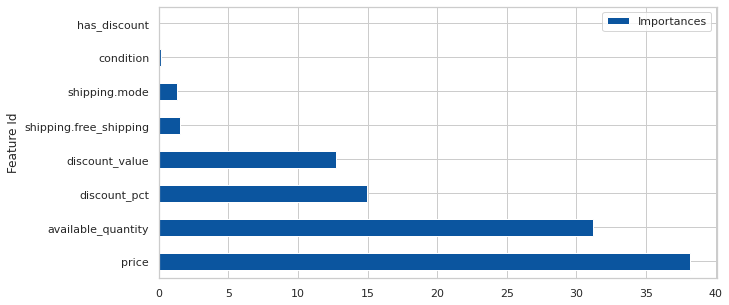

In [338]:
grids_catboost_filter.get_feature_importance(cat_filtered_train_dataset, prettified=True).set_index('Feature Id').plot(kind='barh',
                                                figsize=(10,5))

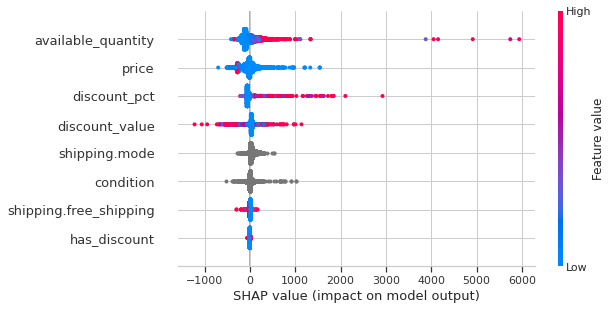

In [339]:
explainer = shap.TreeExplainer(grids_catboost_filter)
shap_values = explainer.shap_values(X_test[features])
shap.summary_plot(shap_values, X_test[features])

## Check with random forest

In [346]:
preprocessor_rf_filter = make_column_transformer(
    (OneHotEncoder(handle_unknown='ignore'), list(X_train[features].select_dtypes(exclude='number')) ),
    (FunctionTransformer(np.log1p, validate=False), ['available_quantity', 'price']),
    remainder='passthrough'
    
)

In [347]:
rf_filter = make_pipeline(preprocessor_rf_filter,RandomForestRegressor())

In [348]:
rf_filter.fit(X_train[features], y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['condition',
                                                   'shipping.mode']),
                                                 ('functiontransformer',
                                                  FunctionTransformer(func=<ufunc 'log1p'>),
                                                  ['available_quantity',
                                                   'price'])])),
                ('randomforestregressor', RandomForestRegressor())])

In [349]:
model_performance(rf_filter, X_train[features], y_train)

mean rsme on CV: 822.3946891529516, std: 41.77654263473641


In [350]:
y_pred_rf = rf_filter.predict(X_test[features])

In [351]:

rmse = (np.sqrt(mean_squared_error(y_test, y_pred_rf)))
r2 = r2_score(y_test, y_pred_rf)
print("Testing performance")
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

Testing performance
RMSE: 1148.62
R2: -0.06


In [132]:
rf_filter

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['condition',
                                                   'shipping.mode'])])),
                ('randomforestregressor', RandomForestRegressor())])

In [352]:
feature_names= rf_filter.named_steps['columntransformer']\
                      .named_transformers_['onehotencoder']\
                      .get_feature_names(input_features=['condition', 'shipping.mode'])

In [353]:
features_names = np.concatenate([feature_names, list(X_train[features].select_dtypes(include='number'))])

In [136]:
import shap

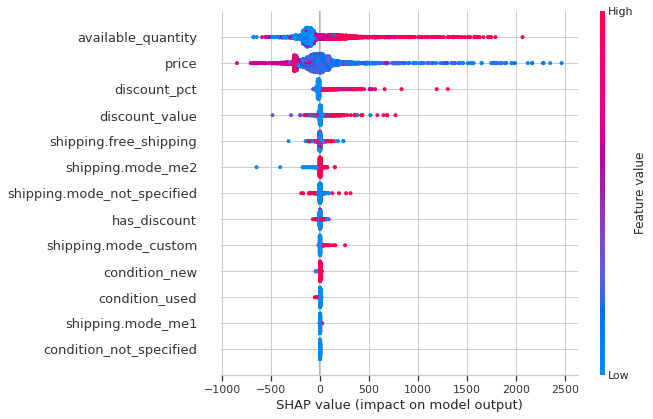

In [354]:
explainer = shap.TreeExplainer(rf_filter['randomforestregressor'])
shap_values = explainer.shap_values(preprocessor_rf_filter.fit_transform(X_test[features]) )
shap.summary_plot(shap_values, preprocessor_rf_filter.fit_transform(X_test[features]), 
                  feature_names= features_names )